# 데이터 정제(영어 중복 제거)

In [1]:
import numpy as np
import re
import pandas as pd

In [2]:
%pwd

'C:\\Users\\DeepLearning_3\\main'

In [3]:
test_data1 = pd.read_csv('./data/last_really_data.csv',encoding='utf-8')
data2 = pd.read_csv('./data/TB_CO_HSCODE_202108041312.csv',encoding='cp949')

In [4]:
# 6자리로 바꿔주는
def change_six(data):
    df2 = pd.DataFrame(columns=['HSCODE_6'])
    for index in data.index:
        code = str(data['HSCODE'][index])
        HS_code = 0
        if len(str(code)) == 9:
            HS_code = code[0:5]
        elif len(str(code))== 10:
            HS_code = code[0:6]
        else :
            HS_code = ''
        df2 = df2.append({"HSCODE_6":HS_code},ignore_index=True)
    return df2['HSCODE_6']

In [5]:
test_data1['HSCODE_6'] = change_six(test_data1)

In [6]:
test_data1

,HSCODE,NM_EN,NM_EN.1,NM_KO,KO_add,설명,사유,HSCODE_6
0,106004000,,,NaN,NaN,본 건물품은 자라과에 속하는 파충류의 일종으로 생후 6개월크기 약5cm8cm정도의 ...,본건물품은 자라과에 속하는 파충류의 일종으로 제1류 산동물이 분류되고 파충류가 특게...,10600
1,201300000,Meat of bovine animals Kimlar beef roll,김라 소고기롤,,,고등어과의 참다랭이속에 속하는 어류로서 뼈가 있는 채로 3등분 절단하여 냉장한 물품,본 품은 HS0302399000호에 분류,20130
2,202200000,Edible beef bone with meatfrozen For food Be...,냉동육이 포함된 식용 사골 식품용 사골육,,,고등어과의 참다랭이속에 속하는 어류로서 뼈가 있는 채로 3등분 절단하여 냉장한 물품,본 품은 HS0302399000호에 분류,20220
3,202200000,Edible beef bone with meatfrozen For food Be...,냉동육이 포함된 식용 사골 식품용 사골육,,,관상용의 열대해수어,관상용 열대해수어는 관상용의 열대어가 분류되는 HSK 0301102000호에 분류,20220
4,202200000,Edible beef bone with meat Frozen For food Be...,냉동육이 포함된 식용 사골 식품용 사골육,,,체장메기학명 Genypterus blacodes의 껍질을 냉동한 것임 용도 애견 간식용,ㅇ 관세율표 제0303호에 “냉동어류제0304호의 어류의 필레fillet와 기타 어...,20220
...,...,...,...,...,...,...,...,...
79078,9705000000,COLLECTIONS,NaN,동전환,a coin ring,○ 본건 물품은 천연 화강암을 절단 연마 형상가공 폴리싱 및 인서트 가공한 정반으로...,ㅇ 관세율표 제90류 주 제2호 다목은 “그 밖의 각종 부분품과 부속품은 제9033...,970500
79079,9705000000,,NaN,베를린장벽 점,Berlin Wall Point,○ 본건 물품은 천연 화강암을 절단 연마 형상가공 폴리싱 및 인서트 가공한 정반으로...,ㅇ 관세율표 제90류 주 제2호 다목은 “그 밖의 각종 부분품과 부속품은 제9033...,970500
79080,9705000000,,NaN,베를린장벽 점,Berlin Wall Point,o 본 물품은 산업시설 및 연구장비 증의 기록유지를 위해 주요 물리량을 기록하여 보...,o 본 물품의 기계적 특징으로는 전기적 요소인 저항 전압 전류 및 주파수측정과 물리...,970500
79081,9705000000,Fossil,NaN,화석,fossil remains,합성 사파이어 원석산화 알루미늄을 특정형상직경 2mm 두께 1mm둥근 원주상 윗면...,본품은 합성 사파이어 원석을 계측기기등의 부분품으로 사용하기 위하여 절삭가공에 의거...,970500


In [8]:
# change 6 
def change_HS(data):
    df2 = pd.DataFrame(columns=['HSCODE'])
    for index in data.index:
        code = str(data['HSCODE'][index])
        HS_code = 0
        if len(str(code)) > 5:
            HS_code = code
        else :
            HS_code = ''
        df2 = df2.append({"HSCODE":HS_code},ignore_index=True)
    return df2['HSCODE']

In [9]:
data2['HSCODE'] = change_HS(data2)
data2[19981:]

,HSCODE,NM_KO,NM_EN,VALID_TF,REGDATE,LVL1_CD,LVL2_CD,LVL3_CD,LVL4_CD,LVL1_NM_KO,LVL1_NM_EN,LVL2_NM_KO,LVL2_NM_EN,LVL3_NM_KO,LVL3_NM_EN,LVL4_NM_KO,LVL4_NM_EN,LVL,HSCODE_6
19981,9401302000,등나무로 만든 것,Of cane,1,2014-02-17,94,1.0,30.0,2000.0,"제94류 가구, 침구ㆍ매트리스ㆍ매트리스 서포트(mattress support)ㆍ쿠션...","Chapter 94 Furniture; bedding, mattresses, ma...",의자(침대로 겸용할 수 있는지에 상관없으며 제9402호의 것은 제외한다)와 그 부분품,"Seats (other than those of heading 94.02), whe...",회전의자(높이를 조절할 수 있는 것으로 한정한다),Swivel seats with variable height adjustment,등나무로 만든 것,Of cane,4,940130
19982,9103901000,여행용 시계,Travel clocks,1,2014-02-17,91,3.0,90.0,1000.0,제91류 시계와 그 부분품,Chapter 91 Clocks and watches and parts thereof,휴대용 시계의 무브먼트(movement)를 갖춘 클록(clock)(제9104호의 것...,"Clocks with watch movements, excluding clocks ...",기타,Other,여행용 시계,Travel clocks,4,910390
19983,9027909190,기타,Other,1,2014-02-17,90,27.0,90.0,9190.0,"제90류 광학기기ㆍ사진용 기기ㆍ영화용 기기ㆍ측정기기ㆍ검사기기ㆍ정밀기기ㆍ의료용 기기,...","Chapter 90 Optical, photographic, cinematograp...","물리나 화학 분석용 기기(예: 편광계ㆍ굴절계ㆍ분광계ㆍ가스나 매연 분석기), 점도ㆍ포...",Instruments and apparatus for physical or chem...,마이크로톰(microtome)과 이 호의 부분품과 부속품,Microtomes; parts and accessories,기타,Other,4,902790
19984,9402101020,안과용 의자,Optical chairs,1,2014-02-17,94,2.0,10.0,1020.0,"제94류 가구, 침구ㆍ매트리스ㆍ매트리스 서포트(mattress support)ㆍ쿠션...","Chapter 94 Furniture; bedding, mattresses, ma...",내과용ㆍ외과용ㆍ치과용ㆍ수의용 가구류(예: 수술대ㆍ검사대ㆍ기계식 장비를 갖춘 병원용 ...,"Medical, surgical, dental or veterinary furnit...",치과용 의자ㆍ이발용 의자나 이와 유사한 의자와 이들의 부분품,"Dentists', barbers' or similar chairs and part...",안과용 의자,Optical chairs,4,940210


In [11]:
data2['HSCODE_6'] = change_six(data2)
data2

,HSCODE,NM_KO,NM_EN,VALID_TF,REGDATE,LVL1_CD,LVL2_CD,LVL3_CD,LVL4_CD,LVL1_NM_KO,LVL1_NM_EN,LVL2_NM_KO,LVL2_NM_EN,LVL3_NM_KO,LVL3_NM_EN,LVL4_NM_KO,LVL4_NM_EN,LVL,HSCODE_6
0,304599010,연육,Fish surimi,1,2020-04-25,3,4.0,59.0,9010.0,제3류 어패류,"Chapter 3 Fish and crustaceans,molluscs and ot...","어류의 필레(fillet)와 그 밖의 어육(잘게 썰었는지에 상관없으며 신선한 것, ...",Fish fillets and other fish meat (whether or n...,기타,Other,연육,Fish surimi,4,30459
1,207541000,절단육,Cuts,1,2020-04-25,2,7.0,54.0,1000.0,제2류 육과 식용설육,Chapter 2 Meat and edible meat offal,"제0105호의 가금(家禽)류의 육과 식용 설육(屑肉)(신선한 것, 냉장하거나 냉동한...","Meat and edible offal, of the poultry of headi...",기타(신선한 것이나 냉장한 것으로 한정한다),"Other, fresh or chilled",절단육,Cuts,4,20754
2,207542010,간,Liver,1,2020-04-25,2,7.0,54.0,2010.0,제2류 육과 식용설육,Chapter 2 Meat and edible meat offal,"제0105호의 가금(家禽)류의 육과 식용 설육(屑肉)(신선한 것, 냉장하거나 냉동한...","Meat and edible offal, of the poultry of headi...",기타(신선한 것이나 냉장한 것으로 한정한다),"Other, fresh or chilled",간,Liver,4,20754
3,207542090,기타,Other,1,2020-04-25,2,7.0,54.0,2090.0,제2류 육과 식용설육,Chapter 2 Meat and edible meat offal,"제0105호의 가금(家禽)류의 육과 식용 설육(屑肉)(신선한 것, 냉장하거나 냉동한...","Meat and edible offal, of the poultry of headi...",기타(신선한 것이나 냉장한 것으로 한정한다),"Other, fresh or chilled",기타,Other,4,20754
4,207551000,절단육,Cuts,1,2020-04-25,2,7.0,55.0,1000.0,제2류 육과 식용설육,Chapter 2 Meat and edible meat offal,"제0105호의 가금(家禽)류의 육과 식용 설육(屑肉)(신선한 것, 냉장하거나 냉동한...","Meat and edible offal, of the poultry of headi...",기타(냉동한 것으로 한정한다),"Other, frozen",절단육,Cuts,4,20755
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19980,9027909910,반도체 제조용,For the purpose of semiconductor manufacturing,1,2014-02-17,90,27.0,90.0,9910.0,"제90류 광학기기ㆍ사진용 기기ㆍ영화용 기기ㆍ측정기기ㆍ검사기기ㆍ정밀기기ㆍ의료용 기기,...","Chapter 90 Optical, photographic, cinematograp...","물리나 화학 분석용 기기(예: 편광계ㆍ굴절계ㆍ분광계ㆍ가스나 매연 분석기), 점도ㆍ포...",Instruments and apparatus for physical or chem...,마이크로톰(microtome)과 이 호의 부분품과 부속품,Microtomes; parts and accessories,반도체 제조용,For the purpose of semiconductor manufacturing,4,902790
19981,9401302000,등나무로 만든 것,Of cane,1,2014-02-17,94,1.0,30.0,2000.0,"제94류 가구, 침구ㆍ매트리스ㆍ매트리스 서포트(mattress support)ㆍ쿠션...","Chapter 94 Furniture; bedding, mattresses, ma...",의자(침대로 겸용할 수 있는지에 상관없으며 제9402호의 것은 제외한다)와 그 부분품,"Seats (other than those of heading 94.02), whe...",회전의자(높이를 조절할 수 있는 것으로 한정한다),Swivel seats with variable height adjustment,등나무로 만든 것,Of cane,4,940130
19982,9103901000,여행용 시계,Travel clocks,1,2014-02-17,91,3.0,90.0,1000.0,제91류 시계와 그 부분품,Chapter 91 Clocks and watches and parts thereof,휴대용 시계의 무브먼트(movement)를 갖춘 클록(clock)(제9104호의 것...,"Clocks with watch movements, excluding clocks ...",기타,Other,여행용 시계,Travel clocks,4,910390
19983,9027909190,기타,Other,1,2014-02-17,90,27.0,90.0,9190.0,"제90류 광학기기ㆍ사진용 기기ㆍ영화용 기기ㆍ측정기기ㆍ검사기기ㆍ정밀기기ㆍ의료용 기기,...","Chapter 90 Optical, photographic, cinematograp...","물리나 화학 분석용 기기(예: 편광계ㆍ굴절계ㆍ분광계ㆍ가스나 매연 분석기), 점도ㆍ포...",Instruments and apparatus for physical or chem...,마이크로톰(microtome)과 이 호의 부분품과 부속품,Microtomes; parts and accessories,기타,Other,4,902790


In [12]:
print(test_data1['NM_EN'].nunique())
print(data2['NM_EN'].nunique())

34880
8784


In [13]:
data1 = pd.DataFrame(columns = ['HSCODE', 'HSCODE_6','NM_EN'])
data1['NM_EN'] = test_data1['NM_EN'] + " " + test_data1['KO_add']
data1['HSCODE'] = test_data1['HSCODE']
data1['HSCODE_6'] = test_data1['HSCODE_6']

In [14]:
data1=data1.drop_duplicates(['NM_EN'])
data2=data2.drop_duplicates(['NM_EN'])

In [15]:
data1 = data1.replace('', np.nan, regex=True)
data2 = data2.replace('', np.nan, regex=True)

In [16]:
data1 = data1.dropna(axis = 0)
data2 = data2.dropna(axis = 0)

In [17]:
data1.isnull().sum()

HSCODE      0
HSCODE_6    0
NM_EN       0
dtype: int64

In [18]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 34057 entries, 1 to 79082
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   HSCODE    34057 non-null  int64 
 1   HSCODE_6  34057 non-null  object
 2   NM_EN     34057 non-null  object
dtypes: int64(1), object(2)
memory usage: 1.0+ MB


In [19]:
data2.isnull().sum()

HSCODE        0
NM_KO         0
NM_EN         0
VALID_TF      0
REGDATE       0
LVL1_CD       0
LVL2_CD       0
LVL3_CD       0
LVL4_CD       0
LVL1_NM_KO    0
LVL1_NM_EN    0
LVL2_NM_KO    0
LVL2_NM_EN    0
LVL3_NM_KO    0
LVL3_NM_EN    0
LVL4_NM_KO    0
LVL4_NM_EN    0
LVL           0
HSCODE_6      0
dtype: int64

In [20]:
data2

,HSCODE,NM_KO,NM_EN,VALID_TF,REGDATE,LVL1_CD,LVL2_CD,LVL3_CD,LVL4_CD,LVL1_NM_KO,LVL1_NM_EN,LVL2_NM_KO,LVL2_NM_EN,LVL3_NM_KO,LVL3_NM_EN,LVL4_NM_KO,LVL4_NM_EN,LVL,HSCODE_6
0,304599010,연육,Fish surimi,1,2020-04-25,3,4.0,59.0,9010.0,제3류 어패류,"Chapter 3 Fish and crustaceans,molluscs and ot...","어류의 필레(fillet)와 그 밖의 어육(잘게 썰었는지에 상관없으며 신선한 것, ...",Fish fillets and other fish meat (whether or n...,기타,Other,연육,Fish surimi,4,30459
1,207541000,절단육,Cuts,1,2020-04-25,2,7.0,54.0,1000.0,제2류 육과 식용설육,Chapter 2 Meat and edible meat offal,"제0105호의 가금(家禽)류의 육과 식용 설육(屑肉)(신선한 것, 냉장하거나 냉동한...","Meat and edible offal, of the poultry of headi...",기타(신선한 것이나 냉장한 것으로 한정한다),"Other, fresh or chilled",절단육,Cuts,4,20754
2,207542010,간,Liver,1,2020-04-25,2,7.0,54.0,2010.0,제2류 육과 식용설육,Chapter 2 Meat and edible meat offal,"제0105호의 가금(家禽)류의 육과 식용 설육(屑肉)(신선한 것, 냉장하거나 냉동한...","Meat and edible offal, of the poultry of headi...",기타(신선한 것이나 냉장한 것으로 한정한다),"Other, fresh or chilled",간,Liver,4,20754
3,207542090,기타,Other,1,2020-04-25,2,7.0,54.0,2090.0,제2류 육과 식용설육,Chapter 2 Meat and edible meat offal,"제0105호의 가금(家禽)류의 육과 식용 설육(屑肉)(신선한 것, 냉장하거나 냉동한...","Meat and edible offal, of the poultry of headi...",기타(신선한 것이나 냉장한 것으로 한정한다),"Other, fresh or chilled",기타,Other,4,20754
7,207601000,절단하지 않은 육(신선한 것이나 냉장한 것으로 한정한다),"Not cut in pieces, fresh or chilled",1,2020-04-25,2,7.0,60.0,1000.0,제2류 육과 식용설육,Chapter 2 Meat and edible meat offal,"제0105호의 가금(家禽)류의 육과 식용 설육(屑肉)(신선한 것, 냉장하거나 냉동한...","Meat and edible offal, of the poultry of headi...",기니아새의 것,Of guinea fowls,절단하지 않은 육(신선한 것이나 냉장한 것으로 한정한다),"Not cut in pieces, fresh or chilled",4,20760
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19975,5105292000,혼방울톱,Top of blended wool,1,2014-02-17,51,5.0,29.0,2000.0,제51류 양모ㆍ동물의 부드러운 털이나 거친 털ㆍ말의 털로 만든 실과 직물,"Chapter 51 Wool, fine or coarse animal hair; h...",양모ㆍ동물의 부드러운 털이나 거친 털[카드(card)하거나 코움(comb)한 것으로...,"Wool and fine or coarse animal hair, carded or...",기타,Other,혼방울톱,Top of blended wool,4,510529
19976,5105293000,조사(roving),Roving,1,2014-02-17,51,5.0,29.0,3000.0,제51류 양모ㆍ동물의 부드러운 털이나 거친 털ㆍ말의 털로 만든 실과 직물,"Chapter 51 Wool, fine or coarse animal hair; h...",양모ㆍ동물의 부드러운 털이나 거친 털[카드(card)하거나 코움(comb)한 것으로...,"Wool and fine or coarse animal hair, carded or...",기타,Other,조사(roving),Roving,4,510529
19977,5105291000,순모울톱,Top of all wool,1,2014-02-17,51,5.0,29.0,1000.0,제51류 양모ㆍ동물의 부드러운 털이나 거친 털ㆍ말의 털로 만든 실과 직물,"Chapter 51 Wool, fine or coarse animal hair; h...",양모ㆍ동물의 부드러운 털이나 거친 털[카드(card)하거나 코움(comb)한 것으로...,"Wool and fine or coarse animal hair, carded or...",기타,Other,순모울톱,Top of all wool,4,510529
19979,9103101000,여행용 시계,Travel clocks,1,2014-02-17,91,3.0,10.0,1000.0,제91류 시계와 그 부분품,Chapter 91 Clocks and watches and parts thereof,휴대용 시계의 무브먼트(movement)를 갖춘 클록(clock)(제9104호의 것...,"Clocks with watch movements, excluding clocks ...",전기구동식,Electrically operated,여행용 시계,Travel clocks,4,910310


In [21]:
import nltk
import pickle
from nltk.corpus import stopwords
import re
nltk.download('all')

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to
[nltk_data]    |     C:\Users\DeepLearning_3\AppData\Roaming\nltk_data
[nltk_data]    |     ...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to
[nltk_data]    |     C:\Users\DeepLearning_3\AppData\Roaming\nltk_data
[nltk_data]    |     ...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package biocreative_ppi to
[nltk_data]    |     C:\Users\DeepLearning_3\AppData\Roaming\nltk_data
[nltk_data]    |     ...
[nltk_data]    |   Package biocreative_ppi is already up-to-date!
[nltk_data]    | Downloading package brown to
[nltk_data]    |     C:\Users\DeepLearning_3\AppData\Roaming\nltk_data
[nltk_data]    |     ...
[nltk_data]    |   Package brown is already up-to-date!
[nltk_data]    | Downloading package brown_tei to
[nltk_data]    |     C:\Users\DeepLearning_3\AppData\Roaming\nltk_data
[nltk_data

[nltk_data]    |   Package nps_chat is already up-to-date!
[nltk_data]    | Downloading package omw to
[nltk_data]    |     C:\Users\DeepLearning_3\AppData\Roaming\nltk_data
[nltk_data]    |     ...
[nltk_data]    |   Package omw is already up-to-date!
[nltk_data]    | Downloading package opinion_lexicon to
[nltk_data]    |     C:\Users\DeepLearning_3\AppData\Roaming\nltk_data
[nltk_data]    |     ...
[nltk_data]    |   Package opinion_lexicon is already up-to-date!
[nltk_data]    | Downloading package paradigms to
[nltk_data]    |     C:\Users\DeepLearning_3\AppData\Roaming\nltk_data
[nltk_data]    |     ...
[nltk_data]    |   Package paradigms is already up-to-date!
[nltk_data]    | Downloading package pil to
[nltk_data]    |     C:\Users\DeepLearning_3\AppData\Roaming\nltk_data
[nltk_data]    |     ...
[nltk_data]    |   Package pil is already up-to-date!
[nltk_data]    | Downloading package pl196x to
[nltk_data]    |     C:\Users\DeepLearning_3\AppData\Roaming\nltk_data
[nltk_data]

[nltk_data]    |   Package word2vec_sample is already up-to-date!
[nltk_data]    | Downloading package panlex_swadesh to
[nltk_data]    |     C:\Users\DeepLearning_3\AppData\Roaming\nltk_data
[nltk_data]    |     ...
[nltk_data]    |   Package panlex_swadesh is already up-to-date!
[nltk_data]    | Downloading package mte_teip5 to
[nltk_data]    |     C:\Users\DeepLearning_3\AppData\Roaming\nltk_data
[nltk_data]    |     ...
[nltk_data]    |   Package mte_teip5 is already up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     C:\Users\DeepLearning_3\AppData\Roaming\nltk_data
[nltk_data]    |     ...
[nltk_data]    |   Package averaged_perceptron_tagger is already up-
[nltk_data]    |       to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     C:\Users\DeepLearning_3\AppData\Roaming\nltk_data
[nltk_data]    |     ...
[nltk_data]    |   Package averaged_perceptron_tagger_ru is already
[nltk_data]   

True

In [22]:
dictionary = {'신청품':'','또는':'','＊mm':'','  ':' ',"          ":'','품':'',"   ":' ',"    ":' ',"     ":',"      ":' ',"       ":' ',"        ":' ',"         ":' '','제시품':'',' kg ' :''}
data1.replace(dictionary,regex=True, inplace = True)
data2.replace(dictionary,regex=True, inplace = True)

In [23]:
data1['NM_EN']= data1['NM_EN'].str.lower()      # 모두 소문자로 변경
data2['NM_EN']= data2['NM_EN'].str.lower()      # 모두 소문자로 변경

In [24]:
data1.to_csv('./data/only_EN1.csv',encoding='utf-8-sig') # 저장할떄
data2.to_csv('./data/only_EN2.csv',encoding='utf-8-sig') # 저장할떄

# 단어들 형태소 분석

In [185]:
data1 = pd.read_csv('./data/only_EN1.csv',encoding='utf-8-sig')
data2 = pd.read_csv('./data/only_EN2.csv',encoding='utf-8-sig')

In [186]:
data1.sort_values(by = ['HSCODE'],axis = 0,inplace = True)
data2.sort_values(by = ['HSCODE'],axis = 0, inplace= True)

In [187]:
data1.reset_index(inplace = True,drop=True)
data2.reset_index(inplace = True, drop = True)

In [188]:
data1.sort_values(by = ['HSCODE'],axis = 0, inplace= True)
data2.sort_values(by = ['HSCODE'],axis = 0, inplace= True)

In [189]:
data1['HSCODE']=data1['HSCODE'].astype(np.int64)
data1['HSCODE_6']=data1['HSCODE_6'].astype(np.int64)
data2['HSCODE']=data2['HSCODE'].astype(np.int64)
data2['HSCODE_6']=data2['HSCODE_6'].astype(np.int64)


In [190]:
data1

,Unnamed: 0,HSCODE,HSCODE_6,NM_EN
0,1,201300000,20130,meat of bovine animals kimlar beef roll
1,2,202200000,20220,edible beef bone with meatfrozen for food bee...
2,4,202200000,20220,edible beef bone with meat frozen for food bee...
3,5,202200000,20220,edible beef bone with meatfrozen
4,6,202200000,20220,edible beef bone with meat frozen
...,...,...,...,...
34055,79075,9705000000,970500,earth guard flashman red flashman filming hel...
34051,79076,9705000000,970500,collections a coin ring
34050,79079,9705000000,970500,berlin wall point
34052,79081,9705000000,970500,fossil fossil remains


In [191]:
data2

,Unnamed: 0,HSCODE,NM_KO,NM_EN,VALID_TF,REGDATE,LVL1_CD,LVL2_CD,LVL3_CD,LVL4_CD,LVL1_NM_KO,LVL1_NM_EN,LVL2_NM_KO,LVL2_NM_EN,LVL3_NM_KO,LVL3_NM_EN,LVL4_NM_KO,LVL4_NM_EN,LVL,HSCODE_6
0,4881,101211000,농가 사육용,for farm breeding,1,2020-04-25,1,1.0,21.0,1000.0,제1류 산동물,Chapter 1 Live animals,살아 있는 말ㆍ당나귀ㆍ노새ㆍ버새,"Live horses, asses, mules and hinnies.",번식용,Pure-bred breeding animals,농가 사육용,For farm breeding,4,10121
1,4858,101291000,경주말,horses for racing,1,2020-04-25,1,1.0,29.0,1000.0,제1류 산동물,Chapter 1 Live animals,살아 있는 말ㆍ당나귀ㆍ노새ㆍ버새,"Live horses, asses, mules and hinnies.",기타,Other,경주말,Horses for racing,4,10129
2,4863,102211000,젖소,for milk,1,2020-04-25,1,2.0,21.0,1000.0,제1류 산동물,Chapter 1 Live animals,살아 있는 소,Live bovine animals.,번식용,Pure-bred breeding animals,젖소,For milk,4,10221
3,4864,102212000,육우(肉牛),for meat,1,2020-04-25,1,2.0,21.0,2000.0,제1류 산동물,Chapter 1 Live animals,살아 있는 소,Live bovine animals.,번식용,Pure-bred breeding animals,육우(肉牛),For meat,4,10221
4,19191,102311000,젖소,for milk,1,2014-02-17,1,2.0,31.0,1000.0,제1류 살아 있는 동물,Chapter 1 Live animals,소,Live bovine animals.,번식용,Pure-bred breeding animals,젖소,For milk,4,10231
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6347,11724,9703002000,조상(彫像),statuary,1,2020-04-25,97,3.0,0.0,2000.0,제97류 예술·골동,"Chapter 97 Works of art,collestors' pieces,and...",오리지널 조각과 조상(彫像)(어떤 재료라도 가능하다),"Original sculptures and statuary, in any mater...",오리지널 조각과 조상(彫像)(어떤 재료라도 가능하다),"Original sculptures and statuary, in any mater...",조상(彫像),Statuary,4,970300
6348,11769,9704001000,우표,postage stamps,1,2020-04-25,97,4.0,0.0,1000.0,제97류 예술·골동,"Chapter 97 Works of art,collestors' pieces,and...",우표ㆍ수입인지ㆍ우편요금 별납증서ㆍ초일(初日)봉투ㆍ우편엽서류와 이와 유사한 것(이미 ...,"Postage or revenue stamps,stamp-postmarks, fir...",우표ㆍ수입인지ㆍ우편요금 별납증서ㆍ초일(初日)봉투ㆍ우편엽서류와 이와 유사한 것(이미 ...,"Postage or revenue stamps,stamp-postmarks, fir...",우표,Postage stamps,4,970400
6349,1297,9705000000,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,collections and collectors＇ pieces of zoologic...,1,2020-04-25,97,5.0,0.0,0.0,제97류 예술·골동,"Chapter 97 Works of art,collestors' pieces,and...",수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,Collections and collectors' pieces of zoologic...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,Collections and collectors' pieces of zoologic...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,Collections and collectors＇ pieces of zoologic...,4,970500
6350,1296,9706001000,도자기류,ceramics,1,2020-04-25,97,6.0,0.0,1000.0,제97류 예술·골동,"Chapter 97 Works of art,collestors' pieces,and...",골동(제작 후 100년을 초과한 것으로 한정한다),Antiques of an age exceeding one hundred years.,골동(제작 후 100년을 초과한 것으로 한정한다),Antiques of an age exceeding one hundred years.,도자기류,Ceramics,4,970600


In [192]:
result_df1 = pd.DataFrame(columns=['HSCODE','HSCODE_6','NM_EN'])
for count in range(0,len(data1)):
    word_tokens = nltk.word_tokenize(data1.loc[count,'NM_EN'])
    tokens_pos  = nltk.pos_tag(word_tokens)
    add_word = ''
    for word , tag in tokens_pos:
        if tag in ['JJ','NN','NNS','VV','VBG','VBN','VBR']:
            if len(word) > 2 :
                add_word += (word + ' ')
    print(add_word)
    result_df1 = result_df1.append({"HSCODE":data1.loc[count,"HSCODE"],"HSCODE_6":data1.loc[count,"HSCODE_6"],"NM_EN":add_word}, ignore_index=True)
result_df1

meat bovine animals kimlar beef roll 
edible beef bone meatfrozen food beef bone meat 
edible beef bone meat frozen food beef bone meat 
edible beef bone meatfrozen 
edible beef bone meat frozen 
frozen bobby veal rib bones vealribcage 
beef ground frozenground beef 
meat bovine frozen boneless beef top sirloin steaks beef meat water sodium phosphate salt oleoresin spice 
beefground frozen frozen beef patties hamburger patties beef 
meat bovine animals boneless 
beefground frozen hamburger patties 
beef originalnoname steaks 
beef salt papain water sandwich name 
beef water dextrose salt papain beef sirloin name 
beef salt papain water original name 
meat swine chilled chilleld boneless pork half cut bsr 
pork neckbone pork neckbone meat 
front foot shank intact 
pork bellyfrozen 
meat swine frozen ground pork 
meat swinefrozen boneless pork center cut chops food pork meat water sodium phosphate salt 
boneless young lamb fresh lamb cut bone 
freezing young lamb cut bones bone-less lamb

carrotdried dried carrot silk slice food carrot glucose 
carrot powder carrot powder 
carrot dried carrot flakes vegetables 
carrot 
carrot dried carrot flakes vegetables 
pumpkin powder pumpkin powder 
pumpkin powder yellowish powder 
cabbagedried slice food cabbage glucose salt 
cabbagedried slice food cabbage glucose salt 
sweet potato simom leaf tea groats potato steam leaf 
dried horseradish flake 
green onion dehydrated green onion 
squash powder 
horseradish powder 
potato dices 
molokheiya dried 
sweet corn freeze corn 
sweet corn frozen dried sweet corn 
sweet corn 
spinach powder spinatblaetter gemahlen powder food krauter 
dropwort cutted food dropwortglucose salt 
leekdried cutted food leek 
mugwortdried powder food mugwort leaves 
mungbean sprout food 
molokheiya gpack food molokheiya 
dried vegetable dehydrated nopal powder 
spinach powder 
molokheiya tablets cleanliness 
buckwheat 
dried crushed mallow leaves verticillata 
molokheiya tablets cleanliness 
tomato powder ri

paprika powder 
red pepper powder powder manufacturing hot bean paste red pepper powder glutinous rice powder wheat powder garlic powder ginger powder salt glucose 
red jalapeno 
green pepper ground green chile puree line 
chilli pepper pain hot sauce 
green pepper pdiced jalapeno 
green pepper pgreen chile 
fruits genus capsicum genus pimenta dried crushed chili peperoncini 
paprika powder paprika powder 
crushed jalapeno dieast jalape뇨o 
red pepper crushed red chilli pepper 
red pepper powder shichimi togarachi shichimi tougarashi 
chili crushed sambal oelek 
red pepper powder chili nanami togarashi 
vanilla seed ground 
cinnamomi ramuluscinnamomi ramulus 
cinnamon powder 
anisanise silvestre hierbas 
ginger frozen processed steel piece 
dry healthy ginger 
ginger powder 
ginger dried ginger slices 
ginger 
turmeric powder teary root powder 
tumeric powder pure foods organic turmeric powder 
curry powder 
mixed spice sambar powder 
mixed spice fish masala power 
mixed spices meat ma

malt powder mixed sugar 
malt 
roasted malt food carafa 
corn starch 
potato starch 
manioccassava starch boba starch 
sweet potato starch preparation 
sweet potato starch sweet potato residues 
cowpea starch eastern bean powder 
rice starch micro pearl 
inulin raftiline 
other sugars netherl 
wheat gluten mixed modified starch 
soya bean black beans blue beans 
tanbakuro black soybean short green 
soybean flake 
soya bean 
soya food 
soya bean 
soya 
soyabeandried food 
black soya bean 
black soya bean heuktae 
black soya bean seo tae 
soya beans 
yellow soya bean 
soya bean cheongtae 
soybean germination 
soybeansmall seed black testa black bean 
soybeans black soys 
groundnut 
peanutshelled food 
peanuts 
groundnuts light color high oleic lot argentn 
copra coconut juice byproduct paper bag 
eye beach 
rape seed forage velox 
rape seed brassica napus 
seed 
mixture seed cereal grains 
cotton seed 
cotton seed kernel 
cotton seeds feeding cotton seed 
sesamum seeds black black sesame

primula fluid extract 
pollen extract concentrate 
grapefruit seed extract 
plant extractaromaplax 
yucca schidigera extractdk sarsaponin 
lavender extract 
garcinia cambogia peel extract garcinia cambogia extract liquidcitri max 
omija extraction liquid box extraction negative extract 
killazanine 
cinnamon bark tincture cinnamon tink 
bilberry extract powder 
natural plant extract pycnogenol 
pine extract 
olive leaf extract 
soy bean germ extract soy life extra nongmo powder food 
acerola extract powder 
soy bean extract powder soy isoflavone yellowish powder food 
tea plant seed extract tea saponin 
acerola extract powder food 
vegetable extract 
blacksoybean hull extract powder 
tea plant seed extract 
black rice extract 
cocoa husk extract cocoa extract 
garlic extract powder 
phellinus linteus extract powder mesima extract powder 
phellinus linteus extract powder mesima extract powder 
lycii fructus extract chiness wolfberry extract 
yucca extract green care yucca extract 
acero

mixtures fish oil epax tgn non tuna norway 
other preparation vegetable oils dha bird oil 
edible oil preparations whole alaskan salmon oil 
vegetable oil preparation 
emulsified fish oil dhak 
preparation canola oil gold sweet 
edible fat preparations pram sweet 
rice bran oil preparation 
yolk oil 
vegetable oil preparation beatreme malaysia 
fish oil preparation epa 
vegetable oil preparation miki ecko 
vegetable oil preparation seasoning roast onion oil 
edible mixtures animal vegetable oils arachidonic acid docosahexaenoic acid mixed oil adogf 
edible mixtures vegetable oils organic oil netherl 
fish oil preparation 
vegetable oil preparation salute sante basil grapeseed oil 
vegetable oil preparation salute sante rosemary grapeseed oil 
vegetable oil preparation salute sante garlic grapeseed oil 
vegetable oil preparation soy sauce oil 
soybean oil preparation 
used vegetable oil mixtures brown oil feed 
mixture hydrogenated fish oil fish oil promega 
preparations fractions palm 

salmon pate 
fish preparation coquille poisson sauce aurore 
seasoned taechae 
fish preparationfurikake 
caplin roe preparationfrozen caplin roe herring salt fish meat food 
fish preparation mer 
prepared fish meal tsuna picomics 
fish powder rieber codfish powder 
fish power tablet 
fish preparation visnuggets 
liver eel preparation 
prepared fish marine steak 
fish preparations seasoning flavor 
other fish preparations dried shrimp powder 
fish preparation shrimp fish cake 
fish preparation fish cake 
mackerel preparations pasteta croatia 
fish preparation rocky shrimp ball 
fish preparation red pepper fish fillet 
other fish tac van 
fish preparation fish snack fisho cuttle fish 
fish preparation fish snack fisho soy sauce 
fish preparation repack 
fish preparation 
fish preparation food 
cod roe 
lumpfish caviar 
caviar original kaviar spread 
prepared crab meat phillips culinary jumbo 
crab meat preparatiobncrab cakes 
prepared crab meatcrab nuggets 
boiled red snow crab meat forz

pez candy 
sugar confectionery cranberry bites 
sugar confectionery jillian mixwith flavour rain 
candies mini dino 
candies blueberry flavor candy blueberry candy 
candies soft 
candies fruits superfruit chia pieces 
candy urc bakefruit orange pieces 
candies fruits mango pieces 
candies fruits pieces 
candy halloween twirl pops 
candies fruit foot fruit snacks 
candy holiday twirl pops 
candy holiday candy canes candy 
sugar confectionery jillian mix forest berry raine 
sugar confectionery jungle pals 
candies heads bars 
sugar confectionery strawberry bites 
candy safari ring pops 
candy jungle hard candy 
other candy lolli blueberries cream 
candies fruit foot variety pack 
candy safari hard candy 
almond marzipan paste 
sugar confectronery rich slin vanilla 
popcorn 
praline popcorn 
country estate pecans 
coffee peanut snack coffee peanut snack 
snack coffee peanut coffee peanut snack 
prepared sugar confectionery brittle 
apricot marzipanodense ramasse jamaica 
flavour apricot m

infant food preparation nan cream color liquid bottle infant food 
infant food preparation net 
preparations infant use farmer stage 
preparation infant use first infant liquid milk 
preparation infant use maeil premie 
preparation infant use infatrini 
preparation infant use liquid milk ofmom stage 
preparation infant use farmer stage 
infant food preparationbambix tropical fruit 
infant food preparationbambix applepear 
infant food preparationbambix biscuit 
infant food preparationbambix vanille 
infant food preparationbambix cereals 
infant food preparationbambix strawberry 
infant food preparationbambix vegetable 
preparation infant use retail sale nurturme sweet bananas 
mixes bakers wares 
breader 
batter mix 
breader 
preparations bakery 
corn muffin mix 
mixes bakers wares 
food preparation frangimix 
flour preparationsseasoning 
mixes bakers wares 
wheat preparations 
glutinous rice flour 
mixed flour 
glutinous rice flour mixture 
rice preparation kotubumochi food rice corn s

rice preparation gea food rice roasted soya bean powder sesame salt starch syrup water 
rice preparation black grain powder 
bar rice cake rice cake 
rice preparation qrapha 
rice flour preparations marrow strong bonedust 
rice flour prepartions grain 
rice flour preparations mixed grain powder 
rice flour preparations black food mixed powder 
rice preparation extruded rice 
rice preparation acorn rice 
food preparations rice flour erom saengshik 
rice flour preparations black rice black sesame paste 
food preparations rice flour saengshik bien 
food preparations rice flour saengshik kid 
rice cake preparation chamma tteokbokki 
rice cake preparation chamma rice cake soup 
rice cake rice 
food preparation rice flour samchae black sesame porridge powder 
rice cake preparation chewy chewy chewy chewy 
rice cakes 
rice preparation 
rice cake preparation green tea ball 
rice preparation 
glutinous rice preparation 
food preparation rice flour cloudy red bean paste 
food preparation rice fl

instant noodles seafood flavour 
instant noodles flavour 
instant noodles fragrant chicken flavour 
noodle instant instant rusting 
instant noodles udon 
instant noodles thai koong 
instant noodles natsukashi udon 
instant noodle hakata ramen 
instant noodles 
pasta instant gcarton box 
instant noodles tom yum kung 
instant noodles cold noodles 
instant noodles udon 
instant noodles boat noodle kit 
instant noodles sanuki udon packs 
instant noodles pad thai kit tom yum goong 
instant noodles raw exported raw udon 
spaghetti meat sauce 
pasta noodles clam sauce linguini clam sauce 
flour preparation snackfinna krupuk kentang 
cooked spaghettini sauce 
cooked spaghettiand meat ball sauce spaghettiand meat ball 
cooked pasta beef sauce lasagna 
cooked macaroni sauce 
noodle stuffed pasta 
prepared pasta top shelf spaghettini 
macaroni beef tomato saucechili mac 
pasta cheezy macn cheese macaroni cheese 
cooked spaghettini meat sauce 
pasta macaroni beef sauce lunch bucket chill mac 
cape

steamed nonglutinous rice 
glutinous rice 
steamed nonglutinous 
steamed brown rice brown rice 
black rice 
steamed nonglutinous brown rice 
steamed dried rice 
steamed nonglutinous rice 
rice prepared vegetable nutrition rice 
rice preparation cauldron nurungji snake sesame flavor 
aotherwise prepared rice cauldron nurungji snack rice 
steamed glutinous rice 
rice preparation potato flavor 
rice preparation cauldron nurungji snek mung flavor 
rice preparation cauldron nurungji snake carrot flavor 
riceprecooked plain rice 
steamed glutinous rice 
steamed glutinous rice 
cooked rice red curry chicken jasmine rice 
cooked rice red curry vegetable jasmine rice 
cooked rice panang chicken jasmine rice 
cooked rice red curry shrimp jasmine rice 
cooked rice sweet chili chicken teriyaki jasmine rice 
rice 
rice prepared frozen rice egg 
steamed rice good curry rice 
rice preparation rice tea beef-flavored red pepper paste bibimbap 
steamed rice grain form containing cocoa organic quinoa bro

fried broad beans 
white beans syrupphil supreme white bean 
carrot preparation carrot snack 
wild onion 
perillae folium preparation shiso 
pumpkin preparation beauty 
vegetable preparation 
green pepper preparation red pepper 
vegetable preparation 
lentils cooked suprex 
spinach preparations 
carrot preparation 
onions preparation 
garlic preparation 
garlic preparations composite food 
garlic preparation garlic chips 
broad bean 
shallot preparation roast shallot flavor 
green pepper preparation 
vegetable preparations 
carrot preparation food 
fried garlic stalk vacuum stalk garlic chips food 
pumpkin preparation food 
garlic preparation food 
broccoli sprout mixed red clover sprout alfalfa sprout powder 
vegetable preparation 
steam lettuce preparation yamagurage 
vegetable preparation 
aubergine preparation person eggplant 
garlic preparation garlic pickle oil net 
vegetable preparation potoufeu chicken 
other vegetable preparation egaral blackgarlic gangsan 
pumpkin preparation

rice cracker nuts 
western trail 
roasted hazelnut flour 
nuts preparation parline 
alpha nutribar 
walnut honey roasted crispy 
salt seasoning walnut 
mixed nut salt seasoning 
sugar condiment walnuts 
pecan preparation 
roasted pistachio preparations 
honey roast cashewpeanut mix 
honey roast cashews 
salted mixed nut 
salted almonds 
salted pistachios 
prepared nuts 
nuts peanuts party mixed evons 
prepared seasame 
sesame preparationsesame honey bits 
maple walnut supreme 
bazzittle cashew crunch 
bazzittle mixed nut glace 
seed crunch 
bazzittle original 
walnutmeats sugar 
powdered sesame salt 
oil roasted nuts mixed nuts delight 
coconut preparation special coconut 
soy bean 
prepared coconut 
macadamia nuts preparation coffee glazed macadamias 
soyabean roasted soyabean 
nut prepared almond nougat 
nut prepared coffee nougat 
nut prepared cranberry nougat 
nuts preparation fruit almond snack cherries maple 
nuts preparation maple pecans walnuts cherried cinammon 
nuts preparati

mixed fruits preserved osmotic dehydration candy mixed peel 
fruit preparation blueberry preparation 
mixed fruit preparation apple banana bar 
fruit preparation raspberry mango 
mixed fruits preparation organic fruit variety pouch 
mixtures fruit nut preparation breakfast balls vanilla 
fruit preparation mango prepration 
fruit preparation strawberry preparation 
fruit salad tropical fruit salad 
mixed fruit preparation papaya salad 
mixed fruits preparation tropical mixed fruits 
mixed fruits preparation tropical mixed fruit inhs 
mixed fruit preparation berries cherries 
mixtures fruit nut preparation sargento single serve snackscashew 
mixtures fruit nut preparation sargento great snackingalmond 
prepared mixtures other edible parts plantfruits vegetable chip mix ecuador 
prepared mixtures parts plants super grass juice blend 
mixed fruits preparations pineapple syrupchaokoh 
fruits preparation filling 
mixed fruits preparation smoothie belgium 
mixed fruits preparation orange smoo

rambutan preparation rambutan syrupchaokoh 
jack fruit preparations jack fruit tropical jack fruit 
kiwifruit preparations fruited pastry filling 
sweet potato preparations net sweet potato roll sweet potato roll 
guava preparation fruity poppers guava 
sweet potato preparation frozen sweet potato thin cut 
passion fruit preparations frozen passion fruit puree 
sweet potato preparation chips 
sweet potato frozen 
taro chip preparation greenday chips 
basil frozen basil blch lbs 
sweet potato preparation 
manioccassava preparations chip 
sweet potato frozen 
aroniachokeberry preparations 
fried sweet potato frozen foraen sweet potato 
mango preparation mango 
acanthopanax sentkos 
ginseng berry pulp frozen 
raspberry preparations topping raspberry swiss 
mango preparation mango fruity poppers 
sweet potatoes preparations 
orange peel preserved osmotic dehydration candio range peel 
wheatgrass preparation wheatgrass 
mango preparations puree 
sweet potato preparation sweet potato chips 


fruit juice 
mixtures fruit juices 
noni juice mixed natural grape juice concentrate 
fruit juice ocean spray ruby red grapefruit blend 
fruit juice hours power diet 
mixture fruit juice mix juice bottle pack mlbottle 
noni juice mixed natural grape juice noni juice 
mixtures juices 
mixtures juices organic berry juice 
mixture fruit juices puree berry essence concentrate vitamins 
mixtures fruit juice concentrate beautiful pomegranate beautiful pomegranate black label 
mixture fruit juice rubus coreanus fruit 
mixtures fruit juice frucial jamonade 
mixture fruit juice ocean spray cranberry juice 
mixtures fruit juices hour miracle diet 
mixtures juices pineapple juice pineapple cube 
mixtures fruit juices 
mixture fruit juice oranka 
mixture vegetable juice vegetable mix juice 
mixtures vegetable juices 
vegetable juices 
jujube boiling peparations 
mixture fruit juice fruit vegetable juice 
mixture juices fruits carrot bottle pack mlglass bottle 
mixtures juice golden circle apple ca

culture yeast 
active culture yeast ocean rhodotorula glutinis 
culture yeast levucell denmark 
culture yeast veasture bischer 
culture diamond original xpc 
culture active feel dry yeast 
culture diamond original xpc 
active active dry yeast packing 
yeastactive feed additive procreatin 
aspergillus oryzae extract 
inactive 
brewers tabletsbio bierhefe 
inactive yeast 
bio bierhefe dragees 
health food preparation auxoferm 
yeast tablet 
inactive yeasts estonia 
inactive yeast beer yeast 
inactive yeast nutricell molasses 
inactive yeasts denmark 
inactive yeast pax 
inactive yeast selplex 
inactive yeast feed powder 
nulook mixed pepper powder 
nulook whole grain food fermented wheat 
red mold ricerice mixed barley fermented bacteria 
chlorella tablet 
chlorella tablets chlorelocking 
chlorella tablet chlorella chlorella 
chlorella chlorella excel 
chlorella tablet chlorella tabletbottle food supplement semo 
chlorella concentrate 
spirulina spirulinadic 
spirulina tablet spirulina p

sauce beef bulgogi sauce 
sauce swk 
other mixed seasoning beef flour 
sauce preparations premixed sauce 
other mixed seasonings flavor 
other mixed seasonings taetalakdashida 
sauce sambal ijo malaya 
sauce sauce 
sauce remia 
other mixed seasoning sour cream onion seasoning 
mixed seasonings dongchimiexgis 
other mixed seasonings beef seasoning powder 
other mixed seasonings flavouring spices hanramen instant noodle crab flavour 
other mixed seasonings roasting flavor paste 
sauce bifexgis 
mixed seasonings squid powder 
other mixed seasonings savory flavor 
other mixed seasonings seasoning 
other mixed seasonings spicy seasoning 
sauces chicken concentrate 
mixed seasonings chicken flavored powder 
other mixed seasonings chicken sauce taste seasoning 
sauce sriracha mayo chilli sauce 
other mixed seasonings seasoning spicy chicken flavor snack seasoned chicken flavor seasoning 
mixed seasonings stir-fried seasoning powder 
mixed seasonings stir-fried seasoning powder 
mixed seasonin

carrot mixed potato squash silverbeet soyf garden vegetables 
homogenized composite food preparation mais poulet bottle baby food sweet corn chicken meat carrot panais rice flour potato onion water nestle 
potatoes mixed green beans water moms organic choice summer vegetables 
homogenized composite food preparation boeuf gbottle baby food carrot beef potato flake onion tomato puree water nestle 
homogenised composite preparation 
homogenised composite food preparation 
homogenised composite food preparation banana berries yoghurt 
homogenised composite food preparation cauliflower broccoli cheddar 
homogenised composite food preparations chicken vegetableskewpie brand babyinfant food 
homogenised composite food preparations codfish casserole 
homogenised composite food preparation chicken burdock 
homogenised composite food preparation healthy times banana muesuli 
homogenized composite food preparation verts boeuf gbottle baby food peas beef spinach rice green peas onion water nestle 

prepared ediable laver sushi seaweed sushi 
prepared edible laver 
prepared undaria 
food additive wakame heart jaf 
food preparation 
sea tangle mixed salt soduim carbonate sea tangle noodles 
sea mustard preparation wakame furikake 
prepared edible seaweeds mixed flake packneoguri 
food preparation 
prepared edible seaweeds boiled seatangle mince 
prepared edible seaweeds highlighting flounder highlighting kelp highlighting 
sea tangle preparation isonoki konbu 
coffee creamer 
coffee creamersujahta 
coffee creamer creamer 
coffee creamer prim 
preparation basis milk fat edible fat 
butter preparation nazareth 
butter mixed hydrogenated coconut oil prepared edible fat 
food preparation pef food milk fat soybean oil sngapor 
butter preparation frozen 
preparation basis butterprepared edible fat 
butter fat mixed water non fat milk solids 
preparation basic butter 
preparation basis milk fat compound butterpm 
preparations basis butter cinnamon brown sugar honey butter 
preparation bas

beverage preparationglucose drink flavour 
tabacco tar reducer pass 
food additivesushi gen eki 
health foof preparationdiet shake 
royal 
health food preparationgreatis 
health food preparationchlostanin gold 
processed vegetable fat preparation confectionary 
whip topping 
vanilla creme 
calcium supple ment cooking 
imitation cheese sargento imitation mozyarella 
food preparation gmtalc 
food preparation immitation black walnut nuts 
royal 
health food preparation bifidus 
royal 
royal 
beautifying foods 
health tood beautifying foods 
pollen preparation pollen 
health food beautifying foods 
food improvement agent ganirich 
health food preparation enercal 
health food 
bee propolis preparation 
health food preparation calcium complex 
candy nonsugar 
multi vitamin non sugar candy 
food additive 
health food preparation rukuo 
health food preparation 
pearl powder soluble 
health food preparation white rip 
health food preparation tsugarez lip 
food preparation food preparation 
mixe

food preparations 
food preparation ussuri 
food preparation promilk jjs 
food preparation hvk hydroxypropyl distarch phosphate maltodextrinde 
food preparation cortirol 
food preparation ultrasperse hvk 
mineral concentrate mineon liquid 
food preparation food 
food preparations essentials capsules extract powderred raspberryleavessiberian ginsengrootgingerdong quairoot marshmallowroot 
oat bran preparation nutrim yellowish white powder food oat bran hydrocolloid powder oligo sugar powder 
roasted soy bean solid residues soy bean solid residues yellow powder food 
food preparation lycomato capsules lycopenesoya bean oilgelatinglycerolsilicon dioxide 
food preparation silq 
food preparations tablet bee pollensucrose semroug corusia 
food preparation food 
food preparation esthe max gold 
cheese fondueswiss knight fondue 
propolis mixed propylene glycol 
food preparation oryza gaba germp 
food preparations ukon tea 
food preparation magicmixt 
soy fiber fibrim nongm 
soy fiber fibrim no

glycerin mixed sucrose fatty acid esters carotene cloudy 
dextrin mixed calcium chloride calcium carbonate fum 
agaricus blazei extract mixed lactose corn starch agaricus blazei murill 
oat fiber granular mixed oyster shell herbalife fiber herb tablet 
chitosan powder mixed chitosan oligosaccharide chitosanace 
puerariae mixed paeoniae jujube liquorice cinnamon ssang hwa tea concentrate 
glycine mixed polylysine dextrin 
glycine mixed sodium acetate dlmalic acid adip long 
vinegar mixed sodium acetate salt guard ace 
ethanol mixed polylysine fatty acid guard power 
sodium acetate mixed dlmalic acid fumaric guard 
rice bran extract water protease enzyme nurice 
agaricus blazei extract mixed dextrin agaricus blazei extract powder 
dicalcium phosphate mixed magnesium chloride mineral premix 
potassium chloride mixed oyster shell herbalife celluloss 
galactomannan mixed dextrose fructose colostrum colostux 
oral hygiene preparation herb leaf 
candy diet candy 
cheese preparation cream chee

clouding agent richmix cloud cws white powder starchmedium chain triglyceridefat humcousa 
food preparation whip topping milk fat mix frozen vegetable cream 
food preparations mix spinach mix 
food preparations nata 
food preparation garcinia cambogia extract powder 
food preparations extract 
food preparation bactostop 
food preparation mango puree dice 
food preparations 
food preparation sugar palm 
food preparation tanker sprout peanut tea 
food preparation eticandy fresh candy mint 
food preparation manzanilla con miel 
food preparations white cocolate powder 
food preparations grand progress 
food preparations years resonance 
food preparations gongjinbo 
food preparations gongbo jin 
food preparations barley betaglucan concentrate 
food preparations high protein vanilla 
food preparation life tablet life tablet 
food preparation fond peach passion 
food preparations 
flavors preparations cheese white 
food preparations extract aquoso 
food preparation barley sprout pill 
food pr

food preparation bromelan recognition 
food preparation oriental ample 
food preparation fishless tuna 
food preparation vitamin mix vitamin mix 
food preparation alcoholic gold 
food preparations coating juice boba 
food preparation oat paste 
coconut milk preparation coconut milk powder 
food preparation noodles angel 
food preparation tazo herbal tea 
food preparation creme brulee 
food preparations caramel sauce 
food preparation white chocolate sauce 
food preparations apple 
food preparation prim 
food preparation rico surimi gel 
food preparation vanilla fratte 
food preparations 
food preparation coconut fruzel 
food preparation fpshpl sngapor 
food preparation boum beauty food collagen 
food preparation boum beauty food moisture 
food preparation boum beauty food 
food preparation vitamin ultrafine 
food preparations limit 
food preparations cheese fillingversion 
food preparations zazone 
food preparations 
food preparations pearl konjac pearls 
food preparation dyer.t 
food 

nonalcoholic beverage dha 
beverage oryong tea drink 
coconut juice 
beverage amazake state union 
beverage stella artois 
coconut water 
beverage 
beverage cinnamon mochacciono 
sikye sikhye 
beverage coffee iced coffee 
iced tea 
aloe vera beverage aloev herbal tea drink 
beverage weider energy jerry 
nonalcoholic beverage balancer 
almond juice 
beverage nonalcoholic natures liquid beverage water noni powder nector blackberry avor grapeskin extract powder citric acid natures 
beverage nonalcoholicakiller 
beverage nonalcoholic nomiskegun 
mushroom extractliquid mixed calcium gluconate peptone kumkoro 
beverage emx 
liquid sugar mixed citric acid thyme extract dlmalic acid cheongsol 
beverage tea 
coconut water young coconut water 
beverage shu jin 
beverage nutritional supplment nutridrinkstrawberry 
beverage nutritional supplment nutridrinkvanilla 
beverage dokudami pure 
nonalcoholic beverage zara drink 
beverage emx 
nonalcoholic beverage calpis water 
vitamin mixed refined water

other beverage premium kriek belgium 
mixtures fermented beverages nonalcoholic beverages ice melon sminoff ice melon flavor talk 
mixtures fermented beverages nonalcoholic beverages ice green apple sminoff ice apple flavor talk 
zell oxygen royal jellybeverage beverage 
other beverages malquerida 
other beverages luxus 
mixtures fermented beverages nonalcoholic beverages hard seltzer mixed berry 
mixtures fermented beverages nonalcoholic beverages hard seltzer cherry lime 
mixtures fermented beverages nonalcoholic beverages brew lemon 
mixtures fermented beverages nonalcoholic beverages brew hefe grapefruit 
mixtures fermented beverages nonalcoholic beverages ice sminoff ice original talk 
honey mead 
fermented alcohol manufacture liquors rectified wine alcohol vol 
denatured ethyl alcohol ethylol 
denatured ethyl alcohol mixed alcohol 
ethyl alcohol systhetic mixed denatonium benzoaatedenatured ethyl alcohol sda 
compound alcoholic preparation 
spirits obtained distilling grape wine 

byproduct vegetable materials byproduct 
vegetable residues kind used animal feeding cornfiber pellet 
soybean hull pellet 
cranberry residues powder cranberry powder 
vegetable product soybean 
vegetable byproduct msg product 
vegetable byproduct sesbania meal 
acorn acorns 
flax shiver pellet 
husk cotton seed 
sugar cane top 
cut sugar cane 
corn cobs 
ground corn cobs 
vegatable materials animal feed oil palm leaf pellet 
lupine seed rolled feed lupine seed 
vegetable residue maize silage feed silage 
apple waste 
soybean pods 
vegetable material soybean hull pellets 
peanut shell ground peanut ground nut shell 
sugar cane top feed 
vegatable materials kind used aninal sugar cane leaf 
dog food bis cookie 
dog food eagle kennel pack 
dog food eagle puppy pack 
dog food hyration high protein 
dog food ealge stress pack 
chitosan powder mixed lactoserape seed oil chitosan 
pet food prime jecky 
dog food show results food 
dog food 
dog food cal 
dog food purina biscuits 
dog foodshow

mixed feed bovine salt blocks red block 
mixed feed bovine stone block 
mixed feed bovine fly repellent block 
mixed feed bovine antiacidosis 
mixed feed bovine mixed feed bovineok 
mixed feed bovine fibera 
mixed feed bovine mixed feedfor bovineok 
mixed feed bovine evs appendix 
mixed feed bovine royal king block 
mixed feed bovine mixed feed 
mixed feeds bovine corn fiber pellet 
feed mixed new game bird crow crumblesa 
complet feed mature horese mitavite sustaina horse feed 
mixed feed kombilac 
mixed feed milk replacer cmr concentrate calf milk replacer concentrate netherl 
mixed feeds milk replacer porcolac booster netherl 
feed preparation rescue milk concentrate 
mixed feeds milk replacer pigger flex 
mixed feeds milk replacer capricord 
feed preparation ffwp premium micro fatfilled whey 
mixed feeds milk replacer danwean prima milk denmark 
mixed feeds dog optimizor virgo netherl 
mixed feeds cat optimizor ominus netherl 
mixed feeds cat optimizor sechura netherl 
mixed feeds 

supplementary feed broiler vitamin premix 
supplementary feed medimixl 
supplementary feed stachol 
supplementary feed bioryzae 
supplementary feed rumenc 
supplementary feed ruprocol 
supplementary feed artimite 
supplementary feeds canthaxzntin 
supplementary feed dinase dry 
supplementary feeds bedgen sfa concentrate 
supplementary feed bedgen bezen aqua 
supplementary feed anpro 
supplementary feeds premix sfa concentrateargentn 
supplementary feed hepagold hepa gold 
supplementary feed microtinic beta microtinic beta 
supplementary feed buffer 
supplementary feed 
supplementary feeds einovita inovita 
supplementary feed intrasan oral 
supplementary feed sal curb liquid 
supplementary feed vitol oral 
supplementary feed haurin 
supplementary feed emicrotinic microtinic 
supplementary feeds 
supplementary feed algimun it-moon 
supplementary feeds raphanol 
supplementary feed sal curb liquid liquid preservative 
supplementary feed syngenx 
supplementary feed aquaimmune 
supplementary

green tea powder mixed wood charcoal powder 
sodium bicarbonate mixed calcium carbonate ovokap 
porcine intestines hydrolyzed spray porcine digest 
bacterial cell powder mixed salt ajinomoto litter max 
carotenoids rice hullbransilicon dioide 
fodder fermentation performance 
blood meal mixed meatmeal liquid methionin feather meal nutropack 
dicalcium phosphate mixed monocalcium phosphate iron dyna fos 
feed preparation caromeal 
preparation kind used animal feeding penact 
pineapple waste mixed bagassee corn cob 
preparation feed 
feed preparation 
feed preparation aqua-ran 
feed preparation plasma preparation feed code 
milk preparation feed whey preparation 
feed preparation lactose blend 
feed preparation lactose blend 
feed preparation digeston 
feed preparation nutriplaz 
feed preparation megalac 
food preparation csy dry fat 
feed preparation phase preparation pig feed 
feed preparation porcine powder 
sweet preparations 
feed preparation soy powder honeybee 
feed preparation gr

feed preparation calcium bolo calcium plague ballo 
tobacco 
tobacco stemmedstripped total stripstbs 
tobacco refusestem knockout 
tobacco refuse stem 
tabacco refuse 
tobacco refusedust 
cigarettes containing processed tobacco leaves green teauds raphael 
cigarettes tabacco substitue sense 
cigarettes tabacco substitue 
cigarettes tobacco substitute 
cigarettes tobacco substitute non-smoking elementary school 
cigarettes tobacco substitue blue cigarette type tobacco substitues oral purifier artemisia 
cigarettes tobacco substitute eucommiae 
manufactured tobacco making cigarettes filler 
manufactured tobacco making cigarettes tobacco 
tobacco sheet 
tobacco sheets 
reconstituted tobacco grade prg paper 
expanded tobacco 
manufactured tobacco herbal hukka mix fruit 
other tobacco sommar snus sweden 
other tobacco general fresh white 
other tobacco jakobssons 
other tobacco art citrus menthol 
expanded tobacco dietdry ice tobacco 
other tobacco art mint sweden 
other tobacco dos citrus 

aluminium hydroxide hwf aluminum hydroxide 
aluminum hydroxide white alumina hydrate 
aluminium hydroxide 
iron ferric oxide 
iron yellow mapicor synthetic yellow iron oxide 
iron oxide 
titanium anatase type cotiox 
titanium dioxide 
hydrazine hydrate 
lithium hydroxide monohydrate 
vanadic pentoxide vanddium pentoxide work 
vanadic pentoxide 
copper oxide 
aqueous solution germanium oxides solutionbps 
calcium oxide 
calcium relief fruit vegetable sanitizer 
calcium ecocal shell calcium oxide 
cadmium oxide 
nickel cobalt aluminium ncao nickel cobalt aluminium oxide 
calcium hydroxide caldic 
calcium hydroxide scollop powder 
calcium hydroxide 
tungstic acid 
nickel cobalt manganese hydroxide 
nickel cobalt manganese hydroxide nickel hydroxide kthne 
nickel cobalt manganese hydroxide ncm precursor ncm nickel cobalt manganese hydroxide precursor 
nickel cobalt manganese active material 
sodium fluorosilicate gelling agent 
aluminium potassium fluoride 
aluminium potassium fluoride alf

bis methacrylolyloxyethyl phosphate snomer 
tris chloroethylphosphate tcep 
tris chloro methyl ethylphosphate tcpp 
oodiethyl thiophosphoryl chloride 
dioctadecylpentaerythritol bis phosphite 
ethylhexyl nitrate 
propylene carbonate 
propylene carbonate jeffsol 
chloro methyl isopropyl carbonate 
tertbutylperoxy ethylhexyl carbonate 
chloroethyl cyclohexyl carbonate 
diethylhexyl carbonate tegosoft dec 
teran butyl titanatetbt 
bis dicumylphenyl pentaerythritol diphosphite doverphos 
methyl amine hydroiodide methyl ammonium iodide mai plt 
methyl amine hydrobromide methyl amimonium bromide mabr plt 
other acyclic monoamine stearyl amine 
triethylene tetramine 
epoxypropylaniline reactive diluent epoxy resin epiolpa 
naphthylpphenylenediamine nocrac white 
methyl amino styryl phenylanthracene 
methyl amino methoxyphenylethylphenoxy propanol hydrochloride 
hydroxy methyl aminoethanol hscide 
nnnntertkis hydroxypropylethylenediamine aqueous solution 
methyl amino ethyl methacrylate 
tetra

immunological product put packings medicaments intron redipen sngapor 
monoclonal antibody product put packings medicaments ireland 
immunological product put packings medicaments intron redipen peg iintron sngapor 
monoclonal antibody product put packings medicaments linj puert rico 
preparations blood fractions umbilical cord blood derived mesenchymal stem cell 
monoclonal antibody product put packings medicaments opdivo 
preparations blood fractions imk kit 
preparations blood fractions imklymphocyte 
preparations blood fractions color tbnk kit 
immunological product put packings medicaments mulidose pen reland 
other blood fractions umbilical cord blood stem cell cell suspension 
modified immunological products goat iggheavy light chain antibody hrp 
diagnostic reagents 
diagnostic reagent kit 
diagnostic kit 
human blood plasma fraction 
immunological product cgafgf solution 
immunological product solution 
prepared diagnostic reagents immunological products insulin elisa 
immunol

medicament raspberry leaf tablets 
medicaments local anesthetic 
medicament defitelio 
medicament respzz liquid 
medicaments diet patch 
medicament seldicine herbal medicine cream sheldicin 
collagen preparation coltrix cartiregen 
medicaments slimline patch 
medicaments 
medicaments 
medicament viaxen women capsulesbottle sexual enhancement vesetable extractsdong quaipanax ginseng damiana terrestris kava kava calcium phosphate cellulose magnesium stearate philips nutritionals 
medicaments 100-year health high school 
medicament mentho pas lotion 
medicaments packings retail sale 
medicaments ireland 
medicaments netherl 
medicament noltec ilaprazole delayedrelease tablets 
medicament sulphur allagen extract 
medicament phytosome capsbottle formedicament hawthorn extract phospholipids cellulose 
medicament allerease capsbottle medicament wild cherry bark quercetin licorice ephedra 
medicament sleep relax capsbottle medicament valerian root extract scullcap rice flour passion flower hop

synthetic organic fluorescent brightening agent white 
fluorescent whitening agent 
synthetic organic luminophores manufacturing organic light emitting diodes 
synthetic organic luminophores manufacturing organic light emitting diodes 
synthetic organic luminophores manufacturing organic light emitting diodes 
synthetic organic luminophores manufacturing organic light emitting diodes gbh 
synthetic organic luminophores manufacturing organic light emitting diodes gbh 
synthetic organic products kind used luminophores manufacturing organic lightemitting phenyl bicarbazol yldibenzobdthiophen boronic acid 
synthetic organic luminophores manufacturing organic light emitting diodes sbd 
synthetic organic luminophores manufacturing organic lightemitting 
synthetic organic luminophores manufacturing organic lightemitting dibiphenyl bicarbazole 
synthetic organic luminophores manufacturing organic light emitting diodes sbd 
synthetic organic luminophores manufacturing organic light emitting dio

polyurethane prepolymer solution 
other resin solutions defined note chapter bond 
full green 
paintspray stone 
paint mrmasking sol 
paints white 
paints white 
paints textile white nht 
paints textile 
varnishes based acrylic polymers coating material 
paints jfpm 
varnish 
paint decadex 
enamel based other synthetic polymers set 
paint aqueous paint primer 
paints black 
paints gold 
paints black 
paints conductive pastecsp 
paint pfa primer liquid 
varnishcfs metal plate 
varnishpolyshield acid barriler 
varnishlm acid shield 
varnish white liquid coating rope aqueous medium nvgovibelgium 
varnishes acronal dap philipines 
varnishes paint 
heavy duty roof coating 
paint heavy duty roof coating 
paint aluminium roof coating 
enamels color pattern paint 
other paints charcoal 
other paints curable uvf 
other paints 
other paint csp 
coating agent deadner 
coating agent foam deadner 
paints 
coating agent asphalt 
coating agent gelnac 
coating agent 
liquid varnish containing solvent 

lip makeup preparation mini berry balm 
eye shadow imported eye shadow bulk packaging subdivision eye shadow packaging 
charming eyelid eye makeup 
eye makeup eye lene 
mascara remover 
eye remover 
skin care cosmetics ponds clear spa lip eye remover 
eye makeup preparations real natural eyebrow pencil 
eye makeup preparations olive virgin oil eye remover cotten swab 
eye makeup preparations day black edge eye liner day black edge eyeliner 
eye makeup preparation protective coating sealant protective coating sealant 
nail enamel color gel 
nail enamels other functional cosmetics selfadhesive sheet plastic 
nail polish remover pad nicen clean 
nail enamel dryer 
nail polish remover 
manicure preparations 
wonder glove 
lubricating medicaments pdi lubricating 
mask powder 
skin care cosmetics milky base 
skin care cosmetics cream base 
skin care cosmetics powder lavender marine maskbulk 
skin care cosmetics acerola marine mask bulk 
skin care cosmetics massage salt gbottle 
skin care cos

shave creammenthol 
personal deodorants mustela skin freshener 
personal deodorants 
maloder extinguisher 
perfumed bath salt bath grain islands 
perfumed bath salts 
perfumed bath salt 
perfumed bath salt marine gold 
perfumed bath salt natural mineral bath salt 
perfumed bath salts lemongrass 
perfumed bath salt 
perfumed bath salts hot lusty 
perfumed bath salt 
perfumed bath salts lemon crystal mud footbath 
perfumed bath salt 
bath preparation bath oil pearls 
bath preparations bubble bath 
epissentia gentle cleansing gel 
bath preparation sport body dusch 
bath preparationminotti body dusch 
sebamed liquid cleanser 
bath preparationspenaten bath 
bath preparationsaloe liquid soap 
bath preparationsaloe bath gelee 
bath preparations 
bath preparations 
bath gel 
foaming bath oil 
bubble bath 
preparation personal hygiene aloe liquid soap 
preparation personal hygiene 
mineral bath salt 
bath salts 
bath preparationsocean 
bath preparations 
bath preparations bath shower gell 
bath

soap silver sensation 
soap mineral care 
soap palmoliveextra acre vitamin 
soap toilet uses 
toilet soaps rosmarin lavendel 
toilet soap propolis honey soap 
eyeglass stick crazy stick eyeglass cleaner 
toilet cleanerjeyes 
glassesspectacles glasses cleaning bubble tablet 
cleaning tissue 
cleansing wet tissue sheetsplastic bottle cleansing surfactantfungicidesalcoholaloe extractorange fabric 
cleaning wet tissue sheetpack 
paperimpregnated detergent sight savers 
nonwovens impregnated soap detergent drb anti pollution bubble mask 
impregnated detergent wet sweeping clothes cleaning cloth 
impregnated detergent wet sweeping cloths 
impregnated detergent disposabel detergent scrubber 
nonwovens impregnated detergent cleanser cloth facial 
liquid 
medicated soaps nano wash powder 
soap other forms soap 
soap other forms 
soap soap 
preparations washing skin acnes foaming wash 
body soap 
organic surfaceactive preparation washing skinameriwash 
preparation washing skinsoapreme 
preparati

tegee fensterkar 
washing preparationstg 
extra famos neutral cleaner 
washing preparation powerful super 
sympa gloss cleaner 
washing preparation tegecar 
washing preparation endozime 
washing preparation orthozime 
washing preparation hand cleaner 
washing preparations paper soaproll 
washing preparation 
washing preparation desizing poly 
washing preparation 
washing preparationsswoop 
cleaning preparationpc 
cleaning preparationmlb conditioner 
cleaning preparationabr rust remover 
cleaning preparationssw vsw 
cleaning preparationcfs prewash 
cleaning preparation 
cleaning preparationmlb promotor 
cleaning preparationsk shandays 
cleaning preparationsparkle washppe 
cleaning preparationcleanerconditioner 
cleaning preparationplanisolm 
cleaning preparationchester clean fryer boilout 
cleaning prepararionsnd 
cleaning preparationsai 
hand tegeron 
cleaning preparation 
cleaning preparationareoclean 
cleaning preparatior 
ultrasil cleaning preparation 
super auto clean 
alkaline cle

protein substance bonito peptide 
hydrolysated casein 
other protein substances tendon collagen 
milk protein 
dextrin paselli 
dextrin staccodex 
dextrin nadex 
dextrin white avedex 
maltodextrin white powderde staley mfgusa 
dextrins film white powderde paper coating cerestaritaly 
dextrins 
dextrins dextrin 
crystal tex tapioca dextrin 
dextrins tackidex 
dextrin tapioca dextrin 
soluble starch starch sdrn 
soluble starchdextrins type 
soluble starch national 
soluble starch 
solbule starch 
soluble starchdextrins type 
moulding starch 
starch 
swelling starch snowflake 
pregelatinised starch hisizesv 
pregelatinised starch alpha sweet potato starch 
pregelatinised starch amycol 
pregelatinised starch dry white flake dehumiditing pregelatinised starch starch chemical 
pregelatinised starch pregeflo wheat starch 
pregelatinised starch gemgel gypsum board manufacturing 
esterified starchfilmkote 
esterified starchmylbond 
etherified starchtaplock 
esterified starch potato starch 
cati

prepared enzymes drunk cleaner 
prepared enzymes dry 
prepared enzymes dry 
prepared enzyme vistapret finland 
prepared enzymes ssf 
phytase quantumblue 
other enzyme lysozyme 
prepared enzymes 
xylanase econase hcp 
prepared enzymes microgranulate 
prepared enzymes 
prepared enzymes liquid 
other enzyme betamannanase 
prepared enzymes 
other enzymes wpp 
supplementary feed pquantumblue quantum blue 
prepared explosive kim capsule blasting powder aluminum powder copper sodium nitrate yulim electronics 
prepared explosivedylex 
igniters 
safe arm device 
fire worksangel fire 
fire work angel spark 
fire work candle papino 
fire work riesen kerzen 
fire sining 
smoke producing device industrial use cartridge second cubic 
pyrotechnic article emergency flares stands 
bomb bag 
party popper 
safety flaresplastcaps 
safety flares 
liquid butane gas 
photographic plates graphic art magnesiumphotoengraving 
photographic plate 
blank mask laz 
blank mask shq timerip umf 
photosensitive filmpho

paper sizing agent paper wet strengthening agent 
finishing sgent kind used paper industry 
finishing agent kind use paper industry 
preparation kind used paper hydrocarb 
preparation kind used paper vaporcoat singapore 
preparation kind used paper paper thickness improver 
finishing agent kind used paper industry 
waterproofing agent leather densodrin 
leather dressing protectant steel kote 
preparation leather protectorhey 
pickling preparation metal surface almeco 
pickling preparations metal surface unilin 
pickling preparations metal surface qfc 
pickling preparations metal surfaces clean 
pickling preparation metal surface semcleaner 
pickling preparations metal surfaces 
pickling preparation metal surface acid clean 
soldering paste rma 
rust remover 
soldering paste 
soldering paste rma 
brazing paste alpaste 
soldering paste solder paste pvm 
soldering paste hbf 
soldering paste sop 
soldering paste solder paste ywm 
soldering paste solder paste pwm 
soldering paste solder pas

magnetic headelectronic component cleaner 
addittives coating agent 
addittives coating agentdabco 
tita bond hardener 
tita bond hardener 
antirust preparation ruscutsp 
preparationrust inhibitor 
corrosion inhibitor vci 
metal plating preparationcupracid 
metal plating preparationcataprep 
metal plating preparationcataprep 
metal plating preparationsaddplatem 
antifoaming agentnonflowfe 
prepared calcium carbonate 
micro element fertilisers 
rainbow flower liquid microelement fertiliser 
multi kemin multi kemin liquid powder 
microelement mick roll 
multi kemin 
micro element fertilizer bestup 
multi kemin multi kemin liquid powder 
microelement fertilizerscosmo bion 
microelement microl 
microelement fertiliser plant magic 
mixed diphenylmethane diisocyanatepolymeric mdi 
wastewater treatment preparation 
water treatment preparationcfloc 
potting soils 
antifog treatment rainx antifog 
hardsurface protectant invisible shield 
oxygen producing powder being powder 
oxygen producing po

chemical preparation thatchless 
tobaco purifier amlc 
chemical preparation ace 
cold spray 
chemical preparation aoa powder 
chemical products half ball 
chemical preparations natural zeolite 
hydrogenated dextrin fibersol 
chemical preparation remegx noil 
chemical preparations 
world cat litter extra strength chemical preparation cat urine treatment 
chemical preparation ito powder 
chemical preparations 
chemical preparation rheopearl isk 
preparations chemical 
chemical preparations hydroglascot 
chemical preparation electrolyte mss 
zirconium preparation 
chemical preparation label 
chemical preparations boe 
chemical preparations 
chemical preparation 
dispersing agent 
chemical preparation granule humic acid 
corn starch preparationseco cushion ecot 
oxypia 
hydrogenated maltitol syrup polysorb 
chemical products containing silicon 
chemical preparations methy ester sabra sabra 
chemical preparations 
chemical preparation container dri singapore 
chemical preparation 
chemical 

chemical preparations 
chemical preparations 
chemical preparation ultra fine titanium dioxide 
chemical preparation dolomite particlesoil conditioner 
chemical preparations 
chemical preperations 
chemical preparation 
chemical preparations treatment admafuse silica gsq 
chemical preperations natural 
chemical preparation talc ssa 
chemical preparation demoln 
chemical preparation ferrite carrier 
chemical preparation desiccant bag 
chemical preperations milk extractap 
chemical preparation lithium iron phosphate 
chemical preparations solution 
chemical preparations bpd 
sixpad fit gel sheet 
chemical preparation sea swallow house extract 
chemical preparation kisuma 
chemical preparations film encapsulation tfe fefe 
chemical preparations urethane 
chemical preparations acrylate 
chemical preparation phenalkamine adduct inca 
chemical preparations deotoilet sand deodorizer green tea bag case 
chemical preparations goods paste bpsfv 
chemical preparations 
chemical preparations 
chem

chemical preparation electrolyte 
chemical preparations electrolite 
chemical preparations 
chemical preparations exothermic powder 
chemical preparations deotoilet sand deodorizer green tea bag case 
chemical preparations granular culture soil 
other chemical preparations water 
chemical preparation fulvic acid powder 
chemical preparations capsule 
chemical preparation ippp 
chemical preparations impact 
chemical preparations solutionfl 
chemical preparation meditheraphy stay warm relax patch 
chemical preparation poly ethylene glycol mixture soc tank 
other chemical products 
chemical preparations tundish bflux calcium aluminate 
chemical preparations small grain 
chemical preparations large grain 
chemical preparations zirconia powder 
chemical preparation 
chemical preparations bentonite small grain 
chemical preparation grip powder 
chemical preparations high hardness coating liquid kgsac 
colloidal suspensions silica silica sol 
chemical preparation skin guardianlc 
chemical pre

polyvinyl chloride avss 
ebony tnp 
polyvinyl chloride pvc compound frcv 
plasticised poly vinyl gpma 
polyvinyl chloride flry 
vinyl chloridevinyl acetate copolymer pvc 
vinyl chloride butyl acrylate copolymer hfleco 
polytetrafluoroethylene xflonacl 
polytetrafluoroethylene xflong 
polytetra fluoro etylene dyneon report bulletin 
fluoropolymer powder 
fluoropolymers primary forms elastomers 
vinylidene fluoridehexafluoropropylene copolymer pvdf binder polymer 
packing molding compoundtseal 
fluoropolymers primary forms 
polytetrafluoroethylene styreneacrylonitrile copolymer polyb 
fluoropolymer primary forms vtx 
fluoropolymers primary forms 
vinylacetateethylene copolymer emulsion 
polyvinyl acetate emulsionrliquid 
vinyl acetate acrylic copolymer emulsion 
polyvinylacetate aqueous dispersion 
polyvinylacetate compound 
additive masterbatches 
vinyl acetate copolymers aqueous dispersion yibite 
polyvinyl alcohol 
alvigen 
yellow lot 
poly methyl methacrylate resin 
acrylonitrilebuta

polycarbonates primary form 
polycarbonates primary form xbk 
alkyd unilac clear 
polyethylene terephthalate 
polyethylene terephthalatepet resin 
polyethylene terephthalate pet granule 
polyethylene terephthalate pet flake 
polyethylene terephthalate 
polyethylene terephthalate primary forms 
polyethylene terephthalate primary forms chip 
polyethylene terephthalate primary form pet flake 
polyethylene terephthalate primary forms 
polyethylene terephthalate pet chip 
polyethylene terephthalate primary forms pet pellet 
unsaturated polyester primary foam fap 
poly butylene terephthalate 
poly butylene 
poly butylene terephthalate pbt dka 
thermoplastic liquid crystal aromatic polyester coploymer primary form lcp uenolcp ncsgs 
thermoplastic liquid crystal aromatic polyester coploymer primary form liquid crystal polymerlcp gmncrl 
thermoplastic liquid crystal aromatic polyester coploymer primary form liquid crystal polymerlcp gbksl 
other polyesters primary forms 
other polyester powder 

hose polymers vinyl chloride pvc tube 
polyvinyl chloride tube irraxtube vox 
plastic hose pvc spring hose 
tube apurge engine 
other flexible tubes plastic wire protection hose 
polytetrafluoroethyleneperfluoroalkoxyethylene copolymer tube 
polytetrafluoroethylene tube ptfe 
polypropylene tube hoe tube 
flexible tube polyolefin reinforced combined other materials fitting hose assyair intake 
flexible tube polyurethane reinforced combined other materials fitting 
tube apurge canister 
polyolefin tubesumitomo 
polyolefin tube sumitube 
polyolefin tube sumitomo irrax 
antenna antenna aca pipe 
polyester tube penta tube 
flexible tube plastic protectorsantoprene 
tube polymer silicone silicone rubber tube srt 
flexible hoses reinforced combined other materials fittings assyvapor 
hose assy 
flexible tube polyamide reinforced combined other materials fittings tube 
pft tube layer 
pft tubemono 
tubes polyamide reinforced combined other materials fitting corrugated tube 
other flexible tube

other selfadhesive sheets plastics 
selfadhesive film plastics labelplastic 
other selfadhesive sheets plastics padspare tire 
selfadhesive plates plastics padfuel tank 
selfadhesive film tape deco cam btm 
selfadhesive film sponge spk pcb 
selfadhesive film tape main window 
selfadhesive film ohora semicure gelnail clotty 
selfadhesive film ohora semicure gelpedi checky 
selfadhesive sheet plastic polypropylene film 
selfadhesive sheet plastic polyvinyl chloride pvc 
selfadhesive tape plastics esd tape 
selfadhesive sheet plastic suba tape 
epp foam 
selfadhesive film ptfets 

selfadhesive plates plastics foam section mounting 
selfadhesive sheets plastics foam section mounting 
selfadhesive film mstic gmp 
selfadhesive sheet plastic tagme english phonics reality wallpaper sticker wallpaper sticker 
selfadhesive sheets plastics 
padwirg water flame retardant tape 
selfadhesive plastics flat shapes main cam 
selfadhesive plastics flat shapes tape cam 
selfadhesive plastics flat shapes 

plates unsaturated polyesters top board 
other polyester sheets 
laminated polyester filmghq polyester base laminating film 
myler 
polyester film 
other film polymers regenerated cellulose atdps packaging paper 
cellophane film 
bio cellulose sheet cellulose sheet 
pvdc nylon film 
polyvinyl alchol film 
kapton 
terfron fep 
decorative foil 
other plastic sheet silicone rubber sheet silplex sheet 
polyimide film coverlay 
polyimide film lead lock tape 
silicone rubber sheet 
polyimide film npi 
polyimide strip tomoegawa 
puskin 
silicone rubber strip 
polyurethane sheet chameleon tpu 
polytetrafluoroethyleneptfe sheet 
polyimide strip spacer tape 
polyurethane film jong-ekus 
polytetrafluoroethyleneptfe film waterproof ptfe membrane part 
polytetrafluoroethylene sheet sealsgl 
blade blade plate china 
polyurethane sheet 
epoxy resin strip hstm 
silicone resin sheet silicon sheet nano clean 
polyimide film qfn tape 
polyimide strip tomoegawa hep 
polyimide strip tomoegawa 
heat tansfer

melamine resin sheet melamine resin paper 
phenolic resin plates board 
tego film 
phenolic sheet 
other sheets plastics 
rubber phenolic resin sheet rpl 
phenolic resin sheet 
espafullspan inch polyester polyurethane 
polyurethane sheets white 
polyurethane sheet npmax 
polyurethane sheet dynalite 
laminated polyureathane sheets fabric extra force 
gosen hysuper grip gammagrip 
polyurethane tape grip 
plastic strip 
laminated sheet 
epoxy resin sheets epoxy laminates 
melamine resin sheet orther materials 
melamine resin sheet orther materials 
other sheets plastics ion exchange membrane aciplex 
other sheets plastics 
other plates plastics 

sheets epoxy resin prepreg 
sheets epoxy resin prepreg ppreg 
melamine sheet decorative paper sheet 
bath tub personal santa art 
bath tub personal arjo adjustable bath primo 
inflatable baby bathtub mtbt 
whirlpool bathtub acrylic right apron whirlpool bath award 
other sanitary ware plastics bubblematertfb 
sanitary wareurea pot 
solar shower b

multifunction baby bidet 
natural life 
adftw dr. agapra thumb 
other household article plastic lbl rundery basket 
baby seat jellymom potty 
cups 
other hygienic toilet articles plastics head 
other hygienic toilet articles plastics saver 
other household articles hygienic toilet articles plastics amenity box 
other toilet articles plastics spongeables 
other household article plastics silicone water pouch wsk 
other household articles plastics silicon pack tool set 
wsb silicone juicy net 
wsb baby bottle tongs 
household article plastics ice bag 
other hygienic articles plasticssilicon straw 
other hygienic articles plastics wsb silicon spout 
other household articles collapsible pet bowl 
other aritcles plastic feeding bottle 
membrane gas storage tank double membrane gas holder dmgs austria 
membrane gas storage tank double membrane gas holder dmgs austria 
water tank 
arcade rooflight ventilation flap 
pvc frame 
pvc door 
doors plastics door 
limit assembly 
end plug eplze 
buil

plastic fittings coachwork brkt assyrr bpr mtg rhpsevcar 
plastic fittings coachwork brkt assyfr bpr upr side mtg rhpscar 
plastic fittings coachwork brkt assyrr bpr upr side mtg lhpscar 
foot rest lwr 
plastic fittings coachwork handle asm wdo reg 
tma mouldingrr lwr scr 
fittings furniture like housing sadlatch rlh psa 
fittings coachwork weatherstrip asmfrt frt aux 
fittings coachwork plastics hdlhlatch rel rhd 
button pwr seat spray slide 
fittings coachwork capfrdrretractable handle lhfe 
button pwr seat spray head 
granish urp 
sunshade handle 
ads defog cover 
hzg speaker deco lhrh 
hideco glove box knob 
hichrome garnishbezel 
pull hdl frt 
phdl flhstd lkhu 
cnsl tray cvr 
foot rest upr qlcar ssteege 
hiknob bezelrr tower upr 
clip 
ring hook avante vehicle 
braket flap door 
mldgrr opng wstrip mtglh 
part motor vehiclecup holder ring xts chrome ring 
cover rod ant opg dummy antenna 
handle deco bandqle 
hiseat garnish 
grip handle 
jfareinf platea plr std 
jfareinf platea plr 

ring frt diff trfer drv supt seal 
parts use machinery mechanical appliances rian shower sanp ring 
parts use machinery mechanical appliances 
intenna basesmg btwifi 
other articles plastics use machinery lock 
part plastics use machinery upacking 
tseal tseal elder brother 
protector body car 
parts use machinery stick coil connector wire seals 
dipole base pbdp 
gap support pbdp 
other articles plastics doorkey 
seal wire room 
other articles plastics use machinery connector holder 
other articles plastics use machinery guidertas 
hbpp feeder holder 
other articles plastics hand capas 
seal wire seal 
feeder cover pbdpt 
labels logo pvc sheet keehyungkorea 
label plastic 
lables flim 
label plastics notify sticker 
plastic label packaging shrink nitrotechadvanced drinkvanilla floz 
label plastics protector vinyl label 
label label static cling 
plastics frames photographs 
other articles plastic gasketdomesnp 
artificial fingernail plastic handmade nail 
other articles plastics 
logo

dipole guide ring 
pacifiers soother 
icebon iceson 
articles plastics dow super beam 
protective bag shock absorption buffering assistance 
plastic frames photograph plastic moulding 
camera filter mvm cell phone camera carver 
mold cushion vmv cell phone 
strobe strobe filter improvement vmv mobile carver 
article plastic hydrotect film 
other article rubber conductive conductive contact 
ion pearl facialmask 
logico active edition 
articles plastics 
other articles plastic brush washing pot 
other articles plastics guide 
pva sponge roller lcd vary according signus size 
retainer oil fan cover 
emblemkia tail gate logo 
board 
vehicle protection cabas 
article plastic 
air cell module 
other articles plastics logo 
hinge fuel filler 
housingftnk model housingftnk 
teflon sheet teflon gaskets bulletin diameter 
thrust plate singapore 
deco panel 
air tent frame plastics 
other article plastic uricon 
other article plastics plastic frame lantern nets scallop farming 
other articles pl

other articles plastics 
clipeva pipee 
other articles plastics holder 
other articles plastics cap 
other articles plastics plastic pallet 
door checker arm carrier lfcarrier 
holder wire 
holder shaft dryer 
antiriot shield suppression safety shield 
ring 
other article plastics flexible hose cwmh 
sealhtr pipe 
other article plastics arm hood cwah 
damperporon linear vibrator 
micro centrifuge tube 
sterile loopneedle 
sterile spreader 
conical tube rack holes 
other articles plastics magic bands 
other articles plastics lock 
provisional rail 
door checker arm slde tlgsslde 
other articles plastics golf cover fbsicz 
other articles plastics adjustable sewage pan 
other other articles plastics articles other materials headings 
other articles plastics plug cap 
other articles plastics cap 
other articles plastics filter speaker 
other articles plastics stick 
cover htr pipe 
other articles plastics lock 
coverexp 
other articles plastics led brkt 
other articles plastics carpet carm

other sesals 
strip strip strip 

other seal vulcanised rubber radiator gasket 
other seals vulcanised rubber plug 
thrust ring 
grommet model plugmodel 
cup seals 
seal 
weatherstrip hood 
ringseal 
shock absorber twintube seal 
gasket 
washer 
other articles vulcanised rubber inner capfront wiper link 
gaskets vulcanised rubber cell terminal gasket fphc 
packingback side 
other seal vulcanised rubber insulation gasket kit other articles plastics insulation gasket kit tubes plastics insulation gasket kit wahsers gasket kit 
glass run 
other seal vulcanised rubber seal 
other articles vulcanised rubber collarwindshield wiper pivot 
other seals vulcanised rubber packing 
other seals vulcanised rubber packing 
other seals motor ring 
other seals vulcanised rubber flangetrim wstrip 
gaskets washers other seals vulcanised rubber rubber gasket enclosure sealeasl 
other seals vulcanised rubber seal asmair inl grl pnl 
other seals vulcanised rubber dust wiper 
gaskets vulcanised rubber cell a

pouch outer surface textile materials storage case hem storage case 
dalkom bear 
spectacle cases article steel oem 
pen case outer surface textile materials casedc 
tumbler case outer surface textile materials tumbler holder 
pouch clp gen clp wat clp clp pro clp dst 
case outer surface polyvinylchloride nail clipper packaging case attachment 
waterproof case wps 
watch box outer surface pvc clock packaging box 
cellularphone case 
jewellery boxes outer surface plastic sheeting rchna diamond necklace packaging case 
case smart phone smartphone bicycle cradle slim 
cellularphone casearticle unfinished polyurethanepolyester fabricpvc spongemagnetic button 
sports bags plasticpolyesteraluminium elgokorea 
shoppingbag outer surface polypropylene sheeting 
shoppingbag outer surface polypropylene sheeting 
other bag outer surface plastic sheeting tarpauli storage 
other bag outer surface plastic sheeting tarpaulin recyling bin 
other bag outer surface plastic sheeting tarpaulin laundry hamp

other articles made plaiting materials vegetable material tunnel house veitnam 
asunden laundry basket 
other articles made plaiting materials vegetable material winnowmade willow 
pulps fibres derived recovered paper paperboard ji-huaver 
chemical pulp 
recovered paper made mechanical pulp newspaperoinp 
uncoated paper base 
paper copy paper 
printing paper 
unprinted paperboard 
printing papers 
paper paper roll bag paper 
facial tissue stock cwfactcrepe waddingfact 
toilet paper 
cellulose webs 
cellulose websk 
cellulose webs 
celluose webs sontara fabrick 
celluose webs 
cellulose webs 
cellulose webs basesheet 
celluose webs sontara fabric 
water gelling paper 
kraft paper gsmn kpaw roll type kraft pulp occ choil paperkorea 
kraft paper gsmn kpaw role type kraft pulp occ choil paperkorea 
uncoated kraft paper sheets wrapping paper 
kraft paper gsmwhite fiber role type kraft pulp occ choil paperkorea 
kraft paper gsmn kpaw rolltype kraft pulp occ choil paperkorea 
testliner board 

childrens drawing colouring booklets painting 
doctor kit book attending doctor 
activity booklego masters spinjitzu 
childhood education textbook 
story sound bookpig 
childrens book great glory book 
doctor kit book attending doctor 
book hunger picture book mouse cat frog christmas hen fish 
childrens book paper printed books plane 
eva book set 
baby car remicon 
childrens picture books junior 
sticker city urban adventures 
childrens book saw anaconda books 
bath book story bath book 
childrens book sponge fairy tale book snowman friend 
boong car 
growth book quick measure 
loaderbulldozer book loader 
excavatorpoclainforklift book eurachacha excavator 
childrens picture books book 
korean children songs english children songs 
air way bill 
commercial print 
document blbill ladings 
paper sublimation printing paper 
paper warrior kit 
paper star wars door credit 
transfers transfer foil 
transfer paper 
transfers transfer film insert foil sheet 
transfers transfer film maker cdd

polyester fabrics filament yarn satin poly 
polyester fabrics filament yarn jacquard coated backside cmwidth mtlength 
woven fabrics synthetic filament yarn filament yarn dyed fresh 
fabric nontextured polyester filament yarn fabric polyester snp 
other woven fabrics containing weight nontextured polyester filaments different colours mhrip 
fabric nontextured filament yarn mcex lola 
fabric nontextured polyester filament yarn 
fabric polyester filament setost 
polyester fabrics polyester jacquard 
polyester filament fabric setost 
jacquard fabric mccsr 
fabric polyester filaments different colours capulet 
fabric polyester filaments different colours 
fabric polyester filaments yarns different colours jdgrl 
fabric polyester filaments yarns different colours crystal snc 
unbleached fabrics synthetic filaments wrapping mesh super metal mesh 
woven fabrics synthetic filaments containing weight polypropylene woven geotextile 
polyester fabric micro star 
fabric 
woven fabrics synthetic fi

nowovens premium pack dry tissue 
nonwovens manmade staple weighing white hzg renault samsung motors base film top color 
nonwovens manmade staple weighing black hzg renault samsung motors base film bottom color 
nonwovens weighing 
laminated black base film bottom plate 

fabrics 
fabric covered plastic film 
pad 
fabric non woven product 
fabric avaca sheet 
fabirc 
nonwovens weighing dish cloth 
fabric 
nonwovens manmade staples weighing spaces 
other nonwovens weighing 
other nonwovens weighing sheet nonwoven fabric 
nonwovens weighing psc 
other weighing ert 
other weighing cdads 
nonwovens manmade staple weighing dmd 
manmade staple fibers weighing nonwoven fabric lattice gsm cmskin 
nonwovens manmade staple fibers weighing non fabric 
nonwovens weighing hard layer 
nonwovens weighing soft layer 
manmade staple fibres coated asphalt preparations underlayment asn 
fabrics 
nonwovens umf krds 
selfadhesive tape thg 
fabrics insulating paperdmd 
nonwovens weighing vertical pet 
self

textile fabrics polyurethane cellular sheet knit fabric 
textile fabrics impregnated polyurethane ampmfco 
textile fabric coated polyurethane polyester fabric 
textile fabric laminated polyurethane nylon woven fabric print layer 
textile fabrics polyurethane polyurethane synthetic leather skintexsf pop 
textile fabric coated polyurethane sab green reinforcement stream 
textile fabric coated polyurethane nylon oxford 
textile fabrics polyurethane 
textile fabrics polyurethane finished tpu 
textile fabrics polyurethane artificial leather sfbt 
textile fabrics polyurethane pad 
textile fabrics polyurethane tricot 
textile fabrics polyurethane hklfa 
espatry espatry inch gryd 
textile fabric laminated polyurethane atm 
knitted fabric coated polyurethane bonding fabric 
textile fabric coated polyurethane polyester woven fabric 
textile fabric laminated polyurethane tricot 
textile fabric coated plastics label 
textile fabrics plastic optima free 
cotton fabric polyethylene 
textile fabrics 

knitted fabric net mesh 
printed warp knit fabrics synthetic fibres 
warp knit fabrics synthetic fibres power netpt 
warp knit fabrics 
warp knit fabric synthetic fibres 
warp knit fabrics 
other warp knit fabrics synthetic fibres wjt 
warp knit fabric synthetic fibres wjt wandi jqd 
warp knit fabric synthetic fibres wjt 
warp knit fabrics knit fabric 
warp knit fabric synthetic fibres dyed bashung mesh 
warp knit fabric synthetic fibres dyed bkt nicon mesh 
warp knit fabrics high density polyethylene warp knitted tape 
warp knit fabric synthetic fibres dyed bkt avenus mesh 
warp knit fabric synthetic fibres dyed bison mesh 
warp knit fabric synthetic fibres dyed bkt poke mesh 
warp knit fabric synthetic fibres dyed wjt coil mesh 
warp knit fabric synthetic fibres dyed jenny mesh 
other warp knit fabrics synthetic fibres dyed jed airq mesh 
warp knit fabric synthetic fibres dyed shine 
warp knit fabrics synthetic fibres dyed air mountain mesh lcs sport 
warp knit fabrics synthetic fibr

tshirt manmade fibres afbtfi 
tshirts manmade fibres womens girls shorts synthetic fibres 
singlet manmade fibres women running 
singlet alg 
singlet alg 
singlets manmade fibres 
singlets manmade fibres combination tank top 
singlets manmade fibres 
singlets manmade fibres women camisole 
singlets manmade fibres women bra camisole 
singlets manmade fibres mkx myanmar 
singlet manmade fibres airism seamless neck bra camisole 
singlets manmade fibres shorts synthetic fibres 
singlet manmade fibres 
tshirt mossiom black womens knitted top nicarag 
similar article cardigan cardigan 
similar article pullover knitted wool mens abx 
waistcoats wool knitted lsa 
similar articles cardigans 
pullover 
cvvw vest 
pullover 
pullovers 
cvvw jessie vest 
knitted cotton hlts 
knitted dpd 
pullover cotton sleeve tshirtl 
crochet tank top msx 
pullover cotton knitted 
pullover cotton knitted lounge hoodie dress setcamboda trousers cotton knitted lounge hoodie dress setcamboda 
pullovers cotton knitted

women trousers synthetic fibres pants 
women bib brace overalls linen blend neck camisole jumpsuit linen blend neck camisole jumpsuit 
girls trousers other textile materials myanmar 
womens trousers 
men shirts cotton woven ctn poplin jkt shirts 
shirts ibjk 
mens shirts synthetic fibres 
mens shirts synthetic fibres 
mens shirts cotton 
uwya exemption shirt blouse 
womens girls blouses women tape china 
womens girls blouses women tape blouse 
girls blouses cotton lbla matching rollup tee 
womens blouses synthetic fibres ruffle camisole 
womens blouses synthetic fibres drape blouse sleeveless 
womens blouses synthetic fibres hpts 
womens blouses synthetic fibres 
blouse whya 
womens shirts artificial fibres slv blouse 
womens girls shirts artificial fibres women shirts 
boy pyjamas synthetic fibres 
pyjamas artificial fibres pajamas ysmnv 
mens garments indoors artificial fibres woven mens ysmev 
mens garments indoors 
women pyjamas cotton hifl 
girl pyjamas cotton hipp 
womens girls p

other article textile material lovepot natural humidifier 
other articles whl stow 
other article textile material kusiner 
ikea fangst hanging storage compartments 
other article fastner tape 
other articles assy 
other article textile material 
headband gogglearc 
battery pad 
other textile articles deluxex 
other textile articles delux blackout exbo 
other articles low cover mat 
disposable surgical drapes laparotomy drape 
eye drape nonwoven fabrics eye drape 
other articles 
other articles assylugg side 
other articles 
industrial mask facial filtration mask 
industrial mask facial filtration mask 
low cover mat assyrr sblh 
fabric articles pack 
other textile articles 
coconut fibre article coir roll 
face mask surgikos 
face mask 
file fabric laminated sponge 
spun silk hand drawn fans fan 
handbag interior parts 
eyeglass strap 
air 
cotton swabs 
mask file fabric 
bed clothe bag 
bedding bag blanket cloth 
cotton fabric flat direct permanent magnet 
golf club head cover 
insul

mountaineering footwear covering ankle fbnbpd 
other footwear lace boots 
other footwear outer soles plastics uppers fusion dante eye raw shoe black brando dr. martin 
other footwear outer soles plastics uppers leather lyrical alexei shbkdanio 
other footwear outer soles plastics uppers leather lace dr. martin 
other foot kpsand 
other footwear outer soles rubber uppers leather mens shoes 
other footwear outer soles rubber uppers leather safety shoe 
footwear outer soles rubber uppers travel 
snowbord boots affect 
other footwear outer soles rubber uppers textile materials marathon trb 
slippers outer soles plastics uppers textile materials 
slippers far-infrared una 
other footwear outer soles rubber uppers textile materials 
footwear outer soles plastics uppers textile materials 
footwear outer soles rubber uppers textile materials 
footwear outer soles rubber uppers textile materials 
footwear outer soles rubber uppers textile materials boa 
footwear outer soles rubber uppers textil

articles carbon fibre litex 
jiffy potpeat pot 
article peat plant growth cocopot type 
articles peat lucky clover 
article mineral substance cinder pellet 
article other mineral substance combat boron 
laminated parastop 
electric cast refractory 
super fine ribbon 
ceramic sheet power 
tourmaline tablet mynice ion 
laterite bricks 
electric cast refractories 
article mineral substances red clay mat 
unfired ceramic label 
articles mineral substances green sheet 
article other mineral substance combat boron nitride 
articles silicon carbide cover 
articles mineral substance gasketoil pump sonata 
articles mineral substance gasket assy sonata 
articles other mineral substance tundish weir 
articles silicon carbide inner cover 
articles other mineral substance cap block mtnp 
articles other mineral substances gyuzotto foot mat 
articles other mineral substances aquarium filter stone 
articles other mineral substance tundish dam 
articles other mineral substances electrode 
articles othe

cover window notebook pcalvin 
glass window inch afr 
main windowekgc 
glass assywindshield 
laminated safety glass glass assyfr drlh 
laminated safety glass size shape suitable incorporation vehicles 
laminated glass 
multiplewalled insulating units glass assy glassheater 
outside mirror bsd direction indicators attachment specifications 
rear view mirror 
rearview mirrors vehicles mirror 
rearview mirrors vehicles side mirror 
rearview mirrors vehicles main mirror 
rearview mirror vehicles automotive interior mirror 
sub 
rearview mirrors vehicles exterior mirror 
rearview mirrors vehicles sub assy glass heater 
rearview mirror vehicles automotive exterior mirror 
side mirror 
folding mirrorcold mirror 
glass mirrors showcase 
mirror reflector projections 
glass mirror plastic case 
sunvisor mirror type 
sunvisor mirror 
glass mirrors vehicles framed front mirror 
screw magnet rod fastener 
glass mirrors mirr ass 
glassware kind used kitchen multi lid multi-glass lid 
lids glass temp

ferro silicon newsirubari 
ferrosilicon globurizing globularization 
ferrosilicon fesimg perosilicon 
ferrosiliconaxel alloy 
low carbon ferro chrome 
ferro silicon chromium 
ferro titanium 
ferroalloys ferroniobium ferroniobium 
ferro calcium silicon 
ferro boron 
ferro silicon calcium 
granules steel rni 
alloy steel powder next alloy powder 
stainless steel powder 
iron powder iron powder jip 
iron powder 
chopped steel fiber 
choppde steel fiber 
slab carbon steel 
forging bar forging 
flatrolled products nonalloy steel hardened tempered carbon steel sandvik sweden 
flatrolled products nonalloy steel steel plate 
coldreduced flatrolled welded steel products steel sheet iron 
steel sheet 
flatrolled product nonalloy steel plated zinc egielectro coil 
bridge plateeco plate 
other products nonalloy steel zinc ens 
other products nonalloy steel zinc kssgmcc 
flatrolled products nonalloy steel zinc metal laminarcugi 
other products nonalloy steel zinc ens 
steel sheet painting 
steel sh

pipe dia steel 
corrugated steel pipe hpl hpl steel pipe 
fittings nonmalleable cast iron flange 
fittings nonmalleable cast iron flange 
cast fittings tee jte 
cast fitting elbow 
frange asch 
joint 
cast fittings jrd reducer 
cast fittings jrs nasa reducer 
cast fittings valve socket 
cast fittings cap jcp 
magic joint 
cast fittings flat flange 
other fittings 
cast fittings flat flange 
cast fittings flange hec 
other fittings stainless steel casting part hidr jointpspvalve socket 
other fittings flange casting 
other fittings flange frt 
clamp band sus sanitary clamp band 
other fittings flangerear assy 
flanges stainless steel inlet flange sjfe 
flanges stainless steel flange 
asforged forgingfor flanges welding neck type 
stainless flange 
stainless fitting male elbow npt ilm 
stainless fitting union elbow 
coupler assy 
threaded elbows stainless steel fittings 
threaded elbows stainless steel sjjoint elbo 
butt welding smls ecc reducer 
fitting stainless steel kgh 
pipe fitting

leaf chain 
load chain chain hoist 
elevator balance compensation chain wfc 
elevator hanging compensation chain 
key chain key holder 
brads nails staples brad nails 
staples iron steel mulching pin 
similar articles nail galva nails 
coach screws steel coach 
screw hooks screw rings hook assyfr 
eye atow 
stopper psy 
screw gachrome plating 
pulley bolt taptite 
selftapping screws whd thwm 
tapping screwtscrew 
machine screwbolt 
machine screw 
machine screws screw 
torx bolt 
machine screwsbolt 
tscrew 
housing bolt 
machine screws stud afas 
machine nylon parting lock setbolt plb plb 
tapping screw 
bolt insert bolt 
bolts bolt 
bolt 
bolt plain head 
bolts mtg 
ubolt 
hex bolt 
wing bolt 
bolts msw 
bolt 
screw interchangeable lens part 
boltflange 
bolts 
cylinder head bolt 
boltlocking 
screw lens part 
bolts drv pan 
bolts anchorb band 
bolts forming 
bolts 
bolt 
bolt flange 
bolts head bolts 
stud 
seat part automobilebolt 
bolts iron steel flange bolt ueng 
bolts iron steel 

stand iron 
tai home shelf new power compression rod 
other household articles steel blanket drying rack 
jall bag stand 
fly umbrella shelfd upl 
metal wide umbrella rack 
two-handled wooden support wire basket 
ironing board stand type folding legs type 
garbage stand hanger trash bin holder 
other sanitary ware steel tongue cleaner wss 
grinding ball 
cast articles 
other articles cast iron socket eye 
cast articles iron housing housing transaction 
other articles cast iron manhole cover 
rigid coupling xgqt 
cast articles iron pipearm pipearm transaction 
other articles cast iron manhole cover 
other article iron steel mangle frame 
other articles iron steel steel joint parts building materials 
other aricles iron steel twist lock 
other articles cast iron mechanical tee 
gauge hatch sgh asme spec 
other articles iron steel mouth unit 
bitt unit 
counterweight elevator balance pane 
counter weight blocks 
joint cooler tube cra 
connector material 
steel balls space frame 
dust defl

rudder seas 
other articles iron steel head adapter 
reng wavy fin 
reng body top 
other articles steel valve extension rod 
other articles steel scupper plate 
other articles steel bilge plate 
other articles steel clip 
other articles steel collar 
other article iron steel absorber film 
shield clip modelminiature part atcaa 
steel case 

pipe support fixing piping tubing 
coverbell housing 
other articles steel seat old tube holder 
other articles steel spacer 
other articles iron steel canister brkt 
other articles iron steel enddr wire 
other articles iron steel brkt 
cord weight cowcx 
spring pin spring pin 
other articles steel bracket 
other articles iron steel piston ringcasting 
thrust ring bdg thrust ring 
other articles steel pipe rrbody mtg 
articles steel wire clip 
other articles iron steel diamond bead shank 
other articles iron steel cap 
other articles iron steel bracketex 
other articles iron steel terminal box 
other articles iron steel wire 
projector bracket 
othe

copper foil 
copper foil tin 
copper foil 
copper foil copper flat conductor sbcu 
copper foil copper flat conductor sbcu 
copper foil cufoil 
copper alloy foil 
copper alloy foil fag 
copper alloy foil agpd 
gochip jgc sse 
foil copper alloy thickness exceeding backed copper alloy strip laab 
backed copper alloys laaa sngapor 
refined copper foil copper laminated sheet 
refined copper foil copper laminated sheet 
copper foil 
copper foil metal clad laminate 
copper foil layer fccl fdh series 
tlamss 
copper foil copper clad 
refined copper foil plastics heat dissipation tape 
copper foil 
copper foil tsc 
backed refined copper foil joinshieldf 
refined copper foil cgh series composite heat dissipation sheet 
backed refined copper foil ahtf 
del pipe 
lot flexible connector 
pipe 
extruded tube 
heat exchanger spare parts tube cuni 
copper screws fittings 
tube pipe fittings refined copper condenser part 
copper screws fittings 
return bend 
pbl akm branch organ 
fitting copper touch f

aluminium liner lwd unf inch 
bio biorack liquid nitrogen storage container 
bio cryolab liquid nitrogen storage container 
biotrek biotrek liquid nitrogen storage container 
wsb kiln frying pan 
tray sid pan roasting pan 
wind screen 
household article aluminium aluminum holder handle holder handle 
fwssad 
porter 
nut 

other articles aluminium gasket 
other articles aluminium bolt dummy bolt 
quick joint assy spl 
cam rollerp holder 
preformed liner metal protection tube 
aluminium slugs 
aluminum pullends 
cam deco shve galaxy acyive 
other articles aluminium sink heat 
floor heating panel aog 
screw decosmw 
other articles aluminium mrcsal 
other articles aluminium ddr snd heatsink 
other articles aluminium tube czech 
aluminium heat sink 
other articles aluminium 
sun shield camera 
cable clamp 
other articles aluminium aluminium shell 
plate separating equus 
side spacer 
other articles aluminium stand base 
battery deco smt 
cap deco smw samsung galaxy golden 
other articles al

tools pressing pressing mold forming 
machinetools pressing stroke end block geb 
machinetools pressing stroke end blockdeb 
tlid inr 
press die 
dash outer pad trim module 
tools pressing mold die 
parts tools pressing locating key 
tfrlh proximity gauge set 
tdfrghrl deflect sensor gauge set 
tools pressing 
tools pressing press moldprogressive die 
dies flexible pinnacle die 
sub post sgpn 
ancar dash otr formg module 
leadframe stamping 
forming beading notching piercing notching piercing flange bending flange updown bending mold mold mold mold mold 
tools stamping panel dash ton mold car body fabrication 
tools stamping mold tool press die 
tools stamping membering dash mold car body fabrication 
tools stamping coversabs hsg 
tools stamping rail roof lwr drawing 
tools stamping press tools upper holder front door inner 
tools stamping car body molding tool pressing draw die 
tools punching metal stamping tool parts cjx 
tools punching coversabs hsg 
tools punching coversabs hsg tr

bracket yfalca 
bracket roof antenna mounting 
bracket assemblygusset mounting hand 
tailgate damper 
tailgate gas lift mounting 
reinforce front sun roof mounting 
bracketwx hcm 
supt control box engine compt 
brkt assy supporting bmpr 
brkt 
lug supporting 
bracket 
braket bumper cover mounting 
braket head lamp mounting 
braket assypedal mounting 
torque strut awdt 
brkt assy gas lifter mtg 
stayexmani gga 
hangerenginerr 
bracket seat mounting 
bumper beam stay 
steel clip 
clip 
moment buster 
bracket assy transmission mounting side 
bracket assy cpf support 
brkt tentioner mtg 
strap assy fuel tank 
brktair breather 
brktengine cover 
brktstrut tower 
bracket 
brkt assy 
clampinjector 
brkt computer assy 
brkt assy lwr ptn 
bracket stem 
brkt gas lifter mtg 
bracket guide 
bracket assembly tailgate damper 
bracket tail gate hinge mounting 
bracket third seat upper monting lefthandle 
brkt assy tail gate gas lftr mtg 
reinf motor mounting 
eng mtg 
latch assy rear seat backk 
brk 

brktyrs 
hecu brktescrhd 
hecu brktesclhd 
retainer assy 
cliphose 
mtg clip 
gamma bracket 
brkt assy 
brkt assy 
sub brkt assy qzc 
clampcylinder 
guidepark brk cbl 
bracketac cont wrg harn 
other mountings fittings similar articles suitable motor vehicles dash brkt 
hecu brktesc 
hecu brktabs 
door hook bracket assy 
brktmtg end 
rodkey lock 
brktfr uma 
brkt assy 
brkt clutch pedal mtg 
slide 
sliding window roller crhzr poly carbonate stainless steel 
nonlocking lever handles 
base metal fittings windows internal external 
bar arm 
strike gtype 
ass bar hga door lock 
batosdoor stopper 
other base metal mountings fittings similar articles suitable doors 
command ramp assy fwdaft serv door 
mounting suitable windows bearing guide sus plate mounting intened permanent installation window bearing guiderassy other article plastic bearing guider assist plate 
handle 
steel extensible poles steel expansion rod 
multipurpose support rail 
base metal mountings fittings similar articles sui

inlet valve engine 
valveexhaust engine 
piston pin 
housing assy flywheel 
high pressure diesel tube 
hla cam follower assy 
manifoldinlet 
assyoil pan 
valve seat reng 
motor vehicles parts camshaft carrier 
motor vehicles parts camshaft carrier 
motor vehicles parts camshaft carrier 
parts engines cylinder liner 
reed valve 
oil return pipe asm 
valve spring retainer 
rbsm balance shaftdr rengine spn diesel engine 
coupler 
part engine shaftinput 
exhaust valvediesel exhaust valve 
valve housing fuso euro fuso euro daily euro ducato iveco daily series 
ckd diesel engine lhr 
cover timing lwr reng 
oil jet engine 
other parts suitable use engines vehicles chapter rocker arm 
parts engine vehicles oil cooler cover assy hoc 
parts suitable use engines vehicles chapter conrod cap aeng 
other parts suitable use engines heading vehicle chapter manifold 
other parts suitable use engines heading vehicle chapter headcylinder 
egr housing ford duty 
plate thrust ton 
cylinder head cover diese

other vacuum pumps lumbar 
ladders safety pneumatic locker alp 
compressor complete 
aircon ass 
electric compressor ass electric compe electric vehicle department 
parts compressors used refrigerating equipment compressor body 
compressor 
compress pfcy 
compressor 
compressors kind used refrigerating equipment 
air compressor 
amazing air agav cooler 
table fan mini fan tsbf 
fan 
unassembled fan incomplete fan assembley sif wgt 
fan ventilator assy 
other fans car ceiling fan fbh 
fan 
blower fan myk 
table fans top fan 
ceiling fans 
table fans desk fan 
cooling fan dringer single mode rainbow auto 
computer partfan 
cpu cooler pnhf rgb 
cpu cooler nctcool 
other fans afan aasy 
other fans ngt 
air fan 
other fans dual assyig gouty 
other fans usb millet fan yrm 
other fans motor refrigeratorrmf assa 
other fans 
fan motor assy 
fan motor 
blower parts motor vehiclesamd amd 
core turbo blower series 
fan heat cpu cooler hdpa 
fan 
zerothermcpu cooler intel pentium 
fans cooling fan

parts house hold type refrigerators accumulator 
door upr guide 
parts other refrigerating freezing equipment spacer 
other parts showcases assy door glass 
parts showcases assy glass shelf 
parts showcases glass frame 
parts showcases door 
parts showcases assy plat shelf low 
other parts freezing equipment cdu case 
cold water outlet pipe cold water outlet 
upper front panel front panel 
other parts freezing equipment side panel side iron plate 
other parts freezing equipment cabinet 
other parts freezing equipment baffle 
parts water cooler assembly cold water bottle 
parts other refrigerating freezing equipment unit cooler ptype unit cooler 
spiral freezer gyrocompact sweden 
non 
premium quality solar hot water heating 
solar ondol heating system solar on-dol heating system 
medical sterilisers automatic washer disinfector marchinery 
high pressure sterilizer litter 
autoclaves mediaprep laboratory sterilizer 
press partphp press sectiondryer partcondebelt system 
drying drum 
rap

other filtering purifying machinery apparatus liquids 
other filtering purifying machinery apparatus liquids fiter assyoil 
drum screen wsds 
other filtering purifying machinery apparatus liquids strainermjc 
fitering purifying machinery apparatus liquids elode electroosmosis dehydrator eod 
insfltr insfltr inline coolant filter 
asmair 
air cleaner 
intake system united kingdom 
guardian air system gseh gshh 
emergency breath system 
purifying machinery gases household type air purifiers 
filtering purifying machinery gases household type 
car air cleaner 
drluft therapy air cleanerdl air purifying bather 
filtering purifying machinery apparatus gases household type air air 
refrigerator photocatalyst filter 
portable air purifier 
purifying machinery purifying exhaust gas vehicles chapter catalytic converter 
purifying machinery purifying exhaust gas vehicles chapter manifold catalytic santa 
exhaust muffler part tube assy exhaust front 
manifold converter 
exhaust muffler part tube 

jet projecting machine ultrahighpressure pump 
dry ice blastertech 
classic quartz preformtower 
mobile road shot blasting system 
agricultural sprayer duster dustermister 
thermal fogger 
herbicide spreader mgt 
other horticultural appliances aqua gun 
machines projecting polyurethane high pressure reaction casting machine highline 
sealer spray system gal 
impeller unit assembly 
smt nozzle senc enc 
ariul fountain arm 
trigger sprayer fovi fovi 
spray fan 
mechanical appliances projection dispersing spraying liquids powerders hot applicatornino melt unit 
ulv fogger dhfog 
high pressure pump unitjetting nozzle cleaning pump 
dummy decap cleaning system mercury 
liquid soap dispenser detergent cleaning 
mechanical appliances projection dispersing spraying liquids powerders 
pipette jbm pipet 
warning thawing spray system gfs tms 
die spray machine power spray psmt 
canvas cleaner system 
glassware washer dryer 
flushing machine 
auto dispenser hand sanitizer chatm 
decon hoses 
other

part suitable use machinery heading steel cord assembly parts bwg 
part suitable use machinery heading inlet casing 
part suitable use machinery heading screw shaft 
engineering plastics bearing 
parts suitable uses machinery heading urethane mold bearing umrr 
reticle smif pod rsp 
partroller conveyor sporocket accume sporocket 
rollers 
urethnae mold bearing umbb 
parts roller polyurethane wheel 
parts machinery heading tip 
parts suitable uses machinery heading urethane mold bearing umbh 
guide rollers 
trolley bracket 
skid button khr 
parts machinery heading assy tension pulley 
gimbal jib weight 
parts machinery heading pump parts pneumatic conveying machinery 
part machinery heading conveyor roller friction roller 
part machinery heading rollerrorla 
parts suitable use machinery headings conveyor diverter 
conveyor link assy conveyorlh link assynseal 
part machinery heading kybrcm 
parts suitable use machinery headings brake ring parts lipt 
crane parts bucket lift 
part machine

developer roller rubber rollertissot 
toner cartridge npg 
waste toner bottle 
printer accessories copy trayp 
assy 
waste toner bottle 
part printer waste toner bottlecwaa 
waste toner bottle 
apivc toner black 
part printer drive assyqm 
part printer 
toner cartridge npg 
assy 
thermal print head 
thermal print head 
printer accessories trayl 
pad paper separationjapan holder separation pad paddlejapan 
handle feeder 
holder cleaningjapan block wire cleaning padjapan block wire cleaning padjapan 
torque limiterjapan limiter torquejapan 
plastic ring 
toner cartridge gpr npg 
releasechina 
plate feed plate sensor support plate feed sensor support plate vertical path sensingchina 
roller registration upperchina roller separationchina roller separation roller spongejapan roller deliveryjapan roller vertical pathjapan roller fixing hea tsinkhk roller feederchina roller separation roller separation roller paper separationchina roller separationjapan roller feed roller feed roller feed rol

solid endmillrich mill 
retainer cpan 
head stock assemblyf 
overloadfree torque limit chuck ttsab safety torque chuck 
milling unit angular type 
atc assembly 
tool holder clamp set clamp set 
tool holders stamping tool parts brt 
other work holder lapping carrier plate 
work holders adaptive tool 
work holders index table 
vaccum platekr 
support rolling holder gcr mains 
vacuum chuck 
jig assy 
casting weight machining center 
automatic reverse tapping attachment 
parts machining centres atc 
emax chamber std unfinished dry etching machine 
apron cover 
cplate cover 
roller cover 
casting iron bed lath bed 
cam unit lfcv 
parts machines heading metal stamping tool parts ucmsnr 
parts machines heading returning units cam slidercussl 
parts machines heading cam stoppercsto 
parts machines heading cam platecoppercpaw 
parts suitable use machines headings basic tool 
cam unit mgdc 
cam unit mgdc 
diamond core drill csn 
hand tools machine rbinder 
cutters sandwich panels low noise sandw

image plate reader regius model 
image plate reader regius model 
image plate reader fcr capsula 
image plate reader fcr prima 
image plate reader fcr 
image plate reader regius sigma basic pacakage 
prepress workstationbg 
automated ticketboarding pass printer ticket issuing printer 
multisync color monitor 
electrohome color datagraphics projection system 
color monitormodeljc vma 
system enclosure 
printer scanner 
fdd unassembled part floppy disk drive 
cdrom driverreader 
multimedia upgrade kit multimedia upgrade kit 
hard disk controller 
monochrome graphic printer controller card 
disk controller disk controller card 
disk controller cardboard 
external multiplexer external multiplexer 
lanlocal area network card 
cashpod automatic cash machine 
automatic banknote receiving machines top module 
automatic banlnote coin dispencing receiving machines cash counter auto depositor 
automatic ticket issuing machine atm 
other office machines recycle changer 
nctape reader 
printer slip

usb lmhu humidifier 
ice shaver ice maker 
ice shaver 
mandu making 
automatic dryice maker dry ice maker 
food waste decomposer 
cosmetic roller 
other machines mechanical appliances having individual function household type crane travel humidifieree 
microll platinum silicone mrsidw 
machine household type having individual functions specified included chapter clium 
usb light bzh 
electronic component placement machines 
electronic component placement machines 
electronic component placement machines 
electronic component placement machines mounter ysm 
machines mechanical appliance making semiconductor devices equipment semiconductor manufacturing 
flip chip bonder chip attachment machine 
remover mounter tsk 
spin coater mikasa model hdx 
developer strip processor 
portable tweezer fwa 
mask repair system 
photo resist coater act light-sensitive applicator 
memory handler packagetsopsotqft hmm chamber temp yeon woo enhineering 
apparatus wet hing developing striping cleaning flat 

powerrek sports farm 
gas generator evatrosg 
lfa dtm dtp rail assembly machine 
machines having individual functions specified included chapter bearing cover 
gimbal 
adt air dissolution contact device 
other machine having individual function lot marking jig 
alignment 
other machines mechanical appliances having individual functions specified included chapter para active alignment machine cmtsa 
other machines having crushers separation functions crushers 
membrane accumulator 
ito ito tio des line equipment pattern completion equipment phenomenal isolation film 
machines having individual functions dial link jig assembly 
machines having individual functions specified included chapter feeding system 
winding machines system 
other machine having individual function side handle base assembly machine jfa project nof 
liquid sample diluter dispenser dis 
board wbc 
solar trackers drive 
nextractor nucleic acid extraction organization 
reinforcementplate auto press drap 
wet station ho

cocks ffdm 
nipple drinker 
parts valve cover assy rdm 
stem guide sizedia 
piston sizedia 
other articles plastics 
parts valves casing fcv holding valve material 
parts valves casing fcv priority material 
housing assythermostat 
egr sensorcover ass rdm 
parts valve cover assy rdm 
other articles steel bypass plate 
housing size 
egr sensorcover ass rdm 
charge valve awraa 
charge valve awraa 
kitchen spout assembly 
part valve lever assy gdi 
valve housing 
part valve main spool 
partspout valve faucet water 
parts valve casting shaft hwp 
shaft hwp 
parts valve check seat dva 
parts valve check valve rod dva 
part valve valve spool vsjc 
starting valve cover 
spindle 
cap fill limit vent valve 
parts sprayers cartridges inflatable fillers 
cup plt 
cover assembly acvair control valve 
part valve baffle 
part valve check valve cape 
part valve atv housing 
parts valve wolf plunger 
part valve ribbon 
part valve end plate 
parts valve neck wall tap body 
other part faucet handleb 
in

part gear forged ring 
tensioner base eur 
parts gearbox housinga 
pivot shaft tensioner 
part gearbox pinion shaftm 
part gearbox shaftm 
clutchshell parts starter motors 
case 
case 
torsional vibration damper 
shaft 
toothed wheel ring 
bottom cover qtype 
parts flywheels 
front cover 
parts pulleys hub dls 
parts pulleys inner ring dls 
bearing housing cover 
other transmission elements flange 
parts camshaft end piece nueng 
sprocket oil pump sprocket 
sprocket belt sprocket crank 
sprocket belt sprocket fuel pump 
internal gear assy 
other transmission elements spindledce 
parts slewing ring windpowered generators ring 
parts pulleys carrier 
sleeve roll arm sink stab correct 
sprocket 
sprocket segment 
hub famz cdmf 
crank shaft washer 
coupling flange 
primary flywheel psop gdi dmf 
flex plate pajero 
gear unit assy hrpucar 
max dynamic coupling sshstraight standard hub ssh ssh 
pulley shaft gwn 
spacer fan 
spacer fan 
kappa sprocket 
parts flywheels rim 
gams sprocket thkj 


cartridge seal 
oil seal rings wiper 
piston rod seal piston rod seal 
floating seal group 
oil seal ring dust seal 
other seals vulcanised rubber drum seal drum washing machine 
other seals vulcanised rubber water seal automatic washing machine 
power steering input oil seal 
power steering oil seal 
shock absorber monotube seal 
power steering pinion oil seal 
seals vulcanised rubber hmsa oil seal 
other articles vulcanised rubber power steering pinion seal 
other articles vulcanised rubber power steering input seal 
oil seal dust seal 
oil seal rings gas spring seal 
other seals power steering cylinder seal 
other seals water automatic washing machine 
washer plan automatic washing machine 
seal vulcanised rubber integrated seal 
seal vulcanised rubber tensioner assembly 
seal vulcanised rubber seal 
other seals vulcanised rubber drum seal drum washing machine 
dust seal dknw 
seal vulcanised rubber drum seal 
special rollexpander roll 
gas spring gsv 
pressure compensation element 

wireless device charging system 
adapter smbtc pin 
khc typec dedicated charger power supply 
grip matewireless charger smartphone 
scc battery charger 
usb data charger cable 
wireless charging padepp iewegww 
pcb board smart phone battery charger 
usb charger data cable pdcubc 
mobile phone battery charger izt 
mobile phone battery charger izt 
usb data cable usb charger mobile phone 
usb charger slide fastener usb amsa pin pin usb charger slide fastener portfolio usb charger jessie vehicle seager jack case retail set 
sjc battery charger 
sjc battery charger 
phone wireless charger 
battery charger 
battery charger dtc pxc charger 
battery chargers charger samsung input radio telephony appartus 
desk top cradlesdt 
adapter wqc 
battery chargers quick charger 
wireless car charger enbow grab 
high speed car chargersper ucq 
high speed chargerspen 
wireless charger cellular phone spechatwqcpn 
high speed charger 
wireless chargers 
maxtill mobile phone wireless charger 
high speed car

mini vacuum small vacuum cleaner 
karcher wet dry vaecum vacuum 
mini vacuum 
extraction system 
aqua king commander 
vacuum vacuum 
household garbage grinder 
ister ister magnetic rotation cup 
mixers lthe quiet one 
electric air bubble machine 
health tar electric bubble generator bathtub 
new wellcome air freshner 
domestic appliance electromachanical water pik 
compact disc cleaner 
mach environmental fan cabinet 
air bubble electromachanical jet bath 
burutto clean vibration washing machine 
lamaster automatic coffee grinder 
food waste disposal 
dental nasal cleaning system 
air air dispenser 
motion cleanser electric washing machine 
friendsball friends ball 
automatic pet feederhtp 
automatic pet smart feederhtp 
spinbrush whitening 
age device 
electric breast pump class 
foreo cleansing device 
puppy care azikd 
automatic urine collector automatic urine processor careclean 
hpd color vibrating puff makeup 
micro air small humidifier 
automatic nailclipper motor grindwheel pcb

bonding wedge wire guide cutter blade 
parts wire bonder input gripper mount way bar 
whelectric instantaneous water heater 
hot water tank hot water container 
bidet control unit pin gneht 
water cmx cmx cmh hot water boiler 
unit system vispa 
heat storage heater 
heating cable 
space heating apparatusradiant sun panel 
baby pig heat mat 
heating foil 
small electric warmer 
heating panels electronic heating plywood 
blower aptc assy 
ondol heater 
sfr infrared radiation heater 
electric boiler floor heating ostban electric boiler heating 
wood heating mat hinoki ondol tatami using heat pipe 
art hot water pipe heater inorganic pressure hot water pipe heater 
usb scurl gold rechargeable eyelash curler 
vacuum hairbrush vacuum electrical comb 
hairdressing apparatus hair steamer 
hairdressing apparatus aquavibro automatic washing machine 
hair dressing apparatus hair styler 
automatic hand dryer hah 
automatic hand dryer hah 
automatic hand dryerhah 
cgs conair fabric steamer cgs 
cgs

bct head set vonia type 
headphones combo 
aunion module 
aircraft ifc system 
wifi module 
uwb lcu 
jabra speak jabra stereo 
jabra speak jabra stereo black 
wifi module coc atwfmb ieee dual band wlan infrastructure 
earphone bluetooth earphone charging cradle 
earphone earphones 
headphone jbl blue 
headphone jbl nxt black 
btm mogabi module 
sport jbl mini black 
headphone akg black 
cyclear dmh hands-free brand bone conduction helmets 
earphones reflect response blue 
headphone harmankardon soho brown 
stereo headset cvt 
headphone jbl black 
inear headphone jbl black 
headphone akg white 
headphone akg black 
zwave twwug communication module smart home smart plug 
smart wifi ver 
uwb miracle lbh lbd wireless docking station 
smart box 
embedded serial ethernet converter csem 
embedded serial ethernet converter cseh 
extender pwq taiwan 
connect station 
zwave twwug communication module smart home door sensor 
mobile wimax usb dongle modem kwdu 
twlzg 
smart wireless thum adapter 


micro speaker 
receiver speaker 
max speaker 
fpcb speaker fpcb brs 
sub woofer 
car doorspeaker 
receiver earpiece china 
ecc ceiling speaker matching transformer speaker sealing speaker 
speaker xdec 
speaker 
emergecy callspeaker 
film speaker piezo actuator splg 
multiple loudspeakers same enclosure pklcs 
speaker 
speaker 
infrared headphone 
headset internet phone 
speakerm lts 
multiful loudspeakers dmm 
multiful loudspeakers 
speakersoen transit 
speakerneomi 
transceiver 
speakerjabra speak 
multiple loudspeakers same enclosure wireless speaker 
asus rog centurion true rog centurion headset 
void pro wireless carbon headset 
comprehensive auditory service system boneconduction headset smartphone etereo app 
ndz bluetooth speaker 
mixer amplifier combined key controller 
receiver 
power integrated processor digital amplifier ntp 
audio power amplifier 
boosters 
amplifier speakers 
amplifier headphone aurender 
amplifier 
nxamp digital audio power amplifier 

electric sound set

camera accessary fhy external 
thermal expert 
zoom module 
modelbmt typeusb dual eye camera iris video acquisition camera 
camaone lite 
galaxy smart camera 
digital image video camera black flybflypge 
vectra 
digital camera 
digital image video camera prosilica 
digital image video camera manta 
genie nano cmg digital image video camera transaction 
cmos sensor module handphone mcb mcb 
camera module cigbfca bcgafca 
camera module fka 
sport camera 
cmos camera module tcm mdlg lge 
pic digital camera product flexible body 
camera 
polaroid snap touch polstb 
compact camera module mobile phones 
car blackbox smvb 
compact shoulder camcorder gyhd 
digital camcorder 
car blackboxrd 
visiondrive 
useries vehicle black box 
vseries vehicle black box 
vichile drive recorder gwhd 
car dvr janus 
adascar dvr optian 
drone lark fpv 
car black box drive recorder 
black driving assistant system driving safety operation system 
video camera recorders tkes tkes series 
iris pro videoscope set in

radio control part key boardpad sjs remote control apparatus 
gps baseband icmulti chip package 
gps antenna 
upper case sub assy 
case logo cpt 
parts car navigation apparatus emu 
parts remote control apparatus rubber cover folding assy 
front panel dga gmdg 
tcxotemperature compensation crystal oscillator 
battery pack 
mhz cordless phone handy phone car phone mhz pager category dielectric filters duplex filters used other wireless equipment 
assy panel front audio 
car tunuer module kstc mvn 
tuner modulemodel 
assydn module 
shield plate 
front case 
bracketa egi 
case bodyvp 
assycasetopsnvl 
assy mini dome gimbal ndt 
lens hdgt dome camera aldc black 
side leffiohcbx 
vga cmos image sensor crgm 
camera housing hch 
case front 
frameqnd 
chassis bottom fastrax camera black 
thermal image sensor optic module 
brack dmdc 
camera chassis tiltchassis adc 
casebottom snd 
adoorbb buttonxno adc 
cctv board camera 
holdercamerasnol 

amain frame 
acase body 
acase top 
mountplatexnv adc

display rsaq 
other indicator panels incorporating liquid crystal devices qpod dispenser 
tft lcd module 
tft lcd module 
tft lcd module 
tft lcd module 
lcd module inch rgb 
pod forklifts 
tft lcd module 
lcd module csfdwh 
lcd module outline dimensions viewing area light box connection metal pins 
lcd module jcg graphic lcd 
lcd module jcg graphic lcd 
lcd modulesftc 
tft lcd module lam 
lcd module dimensionsviewing area light box connection metal pins 
tft lcd modulela 
tft lcd module inch 
inch tftlcd modulesquare type lpm philippines 
electronic flight instrumentkai 
tftlcd module 
tftlcd module 
tftlcd module 
tftlcd module 
vacuum display unit 
tftlcd module 
tftlcd module 
tftlcd module vtt 
display asmdrvr info 
lcd module gttq lcd 
tft lcd module 
tftlcd module vtn 
monitor temppressure 
blower pcb assy epe bae 
led display panels 
led display hdspa 
controllerdv general purpose 
controllerone general purpose 
led pet band neopop pet version 
indicator panels incorporating li

electronic connector 
fakra jack nxsjc 
audio jack connector 
audio jack scpb 
earphone jack 
earphone jack shve 
eme size 
wafer 
pcb title 
socket jack eag 
connector seriesrd fbir 
printed circuits plug 
connector ahka brl 
fpc connector 
amp connector series 
socket mdhb fbh fdl fdhb fdh 
connector 
connector 
inlet socket action pin connector 
multi connector module 
connector housing ydh smh smh ymh connector terminal ydt yrt connector ydw smaw smw ymw yfaw yfw yfw fuse holder 
connector socket fise mra fiwe mva 
socket 
pin head connector 
connector imsa imsa ilag fdzbt 
connector pin connector 
scart jack 
rca jack 
connector din 
phone jack ckx ckx 
svhs jackc 
fuse holderf 
connector 
phone jackh 
mic connectore 
antenna terminal boardsc 
outleta 
bnc connectorc 
power jackd 
connectorimsa imsa imsa imsa imsa imsa imsa imsa imsa imsa imsa imsa sgt imsa betl imsa bctl imsa imsa imsa imsa imsa imsa axnd axnd 
head pin socket head pin socket 
sfp connector 
burn test socketfbga 

micro mnl rpt cnt strip 
terminal term ocs 
motor pinmgh 
terminal asm term apex 
terminal term abx 
terminal term abx 
terminal term 
terminal term tang 
terminal term 
terminal asm term dsq tang 
terminal term tang 
terminal block jsz prchna 
terminal gsaitwsa 
terminal 
terminal term apex 
connection contact elements wires cables terminal ybst 
terminal gsphd 
terminal ppi 
terminal asm term dsq tang 
terminal gsxa 
terminal gamma pin terminal 
terminal smsaa 
terminal shcma 
terminal snac gfm lfsn 
terminal gfm 
terminal sqsa gfpp 
terminal gswpha gfm 
terminal sphd 
terminal gsnaca 
terminal sshl 
other electrical apparatus making connections electrical circuits terminal 
terminal sym 
shur plug receptacle awg 
other electrical apparatus making connections electrical circuits 
other electrical apparatus making connections electrical circuits 
other electrical apparatus making connections electrical circuits gfm 
other electrical apparatus making connections electrical circuits asi

assy power window rearrr wdn 
function module kudnfl 
heater pwb assy 
volvo sos call switche sanjg 
opel multifuction switches 
volvo spot information system 
screw air compressor controller uicdx series 
bcmbody controller module unit 
pcb assy control assymanual epasyc 
distribution module 
car electronic parts keyless entry 
board agxd 
unit 
keypad 
keypad 
direcdoor poe based controllerdd 
control unit universe 
simple safe remote file access 
ecu assy plugin type 
remote controler tug boat thrust 
integrated control panel sanpk 
manipulator copier 
boards panels equipped apparatus heading electric control distribution electricity tft lcd touch panel 
single door access control panel itdc 
tft lcd module touch panel 
linear servo amplifier 
steering roll connector assy 
vme bus board 
start switch sanpg 
keypad module mobilephone aalto 
tft lcd module strqd 
steering wheel sanph switch module car mounting 
sanjd module switching front rear windows adjusting side mirrors adjusting

monolithic 
image sensor package neopac 
channel filter array eds protection channel filter array 
esdemi protection color lcd interfaces ptct eclamp ntct eclamp ptct 
tcptape carrier package satcp 
emi filter line termination usb upstream port usbuf usbuf 
sdtransflash memory card interface emifilter esd protectionip 
low capacitance line filter esd protection mnt 
emi filter esd diode emif qcf emif qcf emif qej 
upstream usb port terminator pacusbu 
filter array eds protection 
emi filter esd diode emif 
voltage regulator 
automotive mcimx 
drive 
gate driver indonesia 
controller icbtrt 
codec processor 
monolithic mhe 
pwm controller cmtre 
timing controllerd 
digital llc controller hdplsa pgdso 
pop type msp 
drive 
drive edi 
blu map qpyh channel drive flat backlight 
dual stack package type nand flash mgc 
multichip circuit ntp 
tja 
other monolithic integrated circuits wafera 
switchtps 
integrated circuitsncv 
monolithic icicbus transceiver avc dckr 
monolithic circuit 
monoli

medicated water electrolysis apparatus ion water purifier 
tanning machine beauty equipment 
electrical beauty appliance bubble form 
comtheran 
firm 
tanning bed 
beauty appliance electical mubeamshower 
beauty appliance electical styliser 
beauty appliance electical steamboy 
far-infrared accelerator 
biolift biolift 
dacesthetique micro-skin beauty device 
electrical beauty applianceskinskop keller 
beauty appliance eletrcal comtheran 
language master 
franklin language master 
tel memo clock cal 
mixer 
digital key controller 
digital echo processor 
electronic dictionary 
tel memo clock cal 
clean sky 
power promotor fokce power promotor 
digital diary ezlabel printer copy pen gyb 
ionizer cleaner equipment 
desoldering tool 
ion generator elion ion generator 
color vision 
ionizing esca 
vacuum coating equipment 
intermediate frequency transformer 
equalizer band graphic equalizer 
discharge type high vacuum ion plating equipment 
wholesale repellent 
mold watching device 
ion ge

hdmi ethernet hdmi 
act harnesspst 
usb data cable usb charger cable pin data charger cable 
wiringassy normal charge cablewith iccb 
usb telecom cable 
bdu cable assy battery cable assy 
plastic wire fitted connectors cable assembly mobile phone charger iphone 
dual sgp cable spigenlighting micro 
usb pin cable 
cable assemblysu series 
lead wire assy 
insulated electric cable sesing module assy 
harness assy exhaust temperature sensor rtxl 
adc drvcab abx 
trailer cable 
engine harness 
welding jumper cable kmj brand 
welding sub cable kmj brand 
welding kickless cable kmj brand mcm 
sub cable 
flat cable 
fusible link wire 
cable 
aex wire 
fusible link wire 
plastic wire silver plated copper wire 
cable 
cable telecommunication exceeding lanmark maritime copper cables cat awg lsfroh 
ftpfutp cat lszh cable telecommunications hereinafter 
utpuutp cat cable telecommunications hereinafter 
sftpsfutp cat cmr cable telecommunications hereinafter 
plastic wire 
stpfftp cat cmr cable tele

trim assytgate korando sports 
skid turismo 
side step set korando turismo 
hgrr seat besel 
assyfront door 
bhrr seat armrest 
sunroof frame 
garnfr door upr 
frame assy 
drip rail assy 
reinforcement 
case asm 
insulhood 
panel base sub assy 
slide 
frame sub assy 
command shoe 
frt panel complete tago exiant 
wind deflector bar 
tilt lever assy 
padanti noise 
padfr side impact 
anchor gen hyundai sllm 
hyundai slvi upr stamping overmld 
hyundai sllm upr stamping overmld 
liteheated automotive reinforced glass specifications 
end piecehood 
module assyrear door window presenting framed car window 
member side strut 
stiffner slide door outer nissan van vehicle 
holder button assy 
reinf roof frt 
plate door striker support 
extention assy quater outer rear 
plate door striker support 
rail assy roof frtyf panorama 
rail roof rryf 
rail assy roof rryf panorama 
rail assy roof frtyf 
bow assy roof 
reinforce rear door srtriker 
pnl cover 
reiforce side sill inner rear 
reinforce assem

piece panel 
channel psh 
channel psh 
casetool 
reinf assy side complete 
panel assembly fender apron front side member complete 
parts accessories motor vehicles door assy 
pnl 
reinf esps mounting 
reinf rear door striker 
extn clamp hsg 
extension quarter center upper 
extension quarter outer center 
extension rear combilamp housing 
extn side lwr 
extn assy qtr otr lhrh 
hev battery coverbrkt tfk 
speaker molding lhemb 
hev battery cover tfk 
carpet assyfloor 
speaker molding frt lhemb 
pnl assy trunk lid otr 
pnl assy frt inr 
pnl assy frt plr 
pnl trunk lid inr 
frt plr inr 
panel assy heat protector 
ctr mbr floor 
ctr floor assy 
reinf side otr 
parts accessories motor vehicles side assy 
bar assy cowl cross mornning 
bar assy cowl cross 
room housing sxxx 
sunglass case 
panel assy cowl complete 
grille assyradiator 
tool box 
grille 
frt trim vehicle door half trim 
ornament frt lhwood 
fin console 
fin insert 
spacer wheel 
fmh rib frt 
rear compartment floor stow trk 
cove

article asphalt hstm 
asphalt articles 
article asphalt hstm 
reinfside bracketright 
spool psr 
member assydash cross side 
reinffr smbr lwrlh 
reinffr checker mtg 
reinftailgate hinge veloster 
extnroof side ctr normal 
reinf assyctrplr otr lwr 
reinfside sill otr 
panel assy door trim complete 
mbrdash cross side upr 

reinfrr impact mbr inr 
pad pad frt sound absorption front 
controller holder 
pad insulationlh 
spcr hjob 
reinfctr flr side 
matdash lhd plastic ionic 
intermctr hig 
insulatordash pnl inr matiz 
insulatorflr frt lhd matiz 
sgrille mldg assy twt 
structural foam 
speaker grillegate plr lhjx 
controller push button 
parts accessories motor vehicles hinge face 
pivotturrion 
reinfquarter inr bkcar steel coil 
other parts accessories bodies including cabs reinfshock absorber hsgrh sgafc 
parts accessories motor vehicles foot rest mtg ada 
reinftrunk lid hinge mtglhrh 
parts accessories motor vehicles cshelf 
bafflerad air 
parts accessories motor vehicles delta inr 
br

carbon ceramic brake disc part 
brake valve complate 
power chamber 
parking brake cable 
boosted brake master cylinder 
primary piston 
vacuums booster 
reservoir 
primary piston 
master cylinder body machining 
secondary piston 
rubber key 
axle assyfr 
spider brake 
parking brake assy 
thermal clip 
air filter vacuum booster france 
brake pedal 
slack adjust 
scam shaft 
output rod 
guide rod 
secondary piston 
brake assywt fwdw tander rlh 
chamber bracket assembly 
adapter plate disk brake 
parking cable 
adbair disc assy 
caliper piston 
parts brakes servobrakes body 
body 
parts brakes servobrakes 
piston clip fin 
cover shimfin 
other parts accessories motor vehicles cable assyparking brake 
other parts accessories motor vehicles assyparking brake 
brake disc 
mechpkb 
lever 
tube assy 
parts brakes servobrakes tank distribution 
anchor bracket assembly 
pedal assy brake auto 
part motor vehicles 
other brakes servobrakes parts cam shaft bracket assy 
accent pad 
hub disc assy 


drum clutch asm 
clutch boosterlong spv tdtata daewoo prima novus truck 
pedal assy clutch 
double clutch 
bearingclutch release 
release fork assy 
tube hose assyclutch 
parts clutch guide oilrr 
parts clutch housing 
connector body 
auto spare partsclutch kit tysk 
clutch release ball bearing anvil sleeve tka tkz tka tkb tkz tka 
push rod assy 
parts clutches push rod 
parts clutch clutch hub 
auto clutch parts daeeun 
assy drum cluch 
clutches parts motor vehicles headings dwg hsg 
ring dwg rng 
asm inner housing dwg 
parts clutch body 
body 
parts clutches tube 
ring dwg rng 
cylinder assyconcentric concentric slave cylinder csc 
clutches parts motor vehicles headings housing dwg hsg 
clutches parts motor vehicles headings housing dwg hsg 
clutches parts motor vehicles headings housing dwg hsg 
clutches parts motor vehicles headings shaft 
clutches parts motor vehicles headings ring 
clutches parts motor vehicles headings carreir 
clutches parts motor vehicles headings 
parts clutc

cable eng cont 
plate end 
guardsplash brak 
cover assypkb cont 
subframe complfr spfh 
arm compltransv lwr 
other parts motor vehicles water outlet pipe 
mbr complfrt suspension 
reng foam 
pad wear indicator 
spacer stkm 
clamp assy battery yfc sonata 
clamp assy battery tfc 
manual control manual control lever 
lmfc jbox foam 
pivot arm frtcsusp lwr 
cable aidling cont 
forged clevis 
air guide 
pipe assyrr heater waterydm 
parts motor vehicles asmfuel 
protector 
other parts motor vehicles lhrh 
other parts motor vehicles mtg diesel specification 
other parts motor vehicles assyroll rod slanderous office 
other parts accessories motor vehicles 
other parts motor vehicles heading assyoil cooler 
other parts accessories motor vehicles 
air hose 
other transmission parts components tube hub 
parts accessories motor vehicles 
other parts accessories motor vehicles 
other parts accessories motor vehicles assy anchorlh 
other parts accessories motor vehicles assy uplh 
other parts access

chambermounted optical coupler cableright angle light coupler pac 
side mirror toad 
light guide plate 
bsd inner 
other articles plastics parts vrgh 
silicone skirt 
optical frame parts 
glass lens 
gear smr 
sport goggles 
stereoscopic threedimension spectacle lcd shutter units automatic data processing machines cable controller units automatic data processing machines units automatic data processing machines vga adaptor 
binoculars infrared binoculars 
smithsonian ship telescope ship telescope 
red dot sightacupoint 
ful color seal printing presspridam 
instant fantasy photo booth 
instant print camera fotomirror 
photome system 
surveillance camera controller 
component camera part 
disposable camera 
used instant camera used camera 
led photo plotter drum type 
led photo plotter 
cameras designed purpose laser photo plotter 
digital digital electronic steel camera 
rewind button 
timer release 
remote release 
camera mount 
parts accessory photographic flashlight apparatus litedom

basic surgical kit expert surgical kit bone condenser set prosthetic set standard security kit expert security standard security kit expert sugical kit 
intraoral camera win oral camera 
dental apparatus 
other instruments appliances used dental sciences dental oral camera 
sugical kit dental implant surgical tools 
friadent select tryin abutment dental implant treatment tools 
twist dental implant drill 
fri milling implant dental implant treatment tools 
intraoral camera win 
ank waxup coping dental implant procedures 
ank tempcapstabuta dental implant procedures 
ank waxup cop dental implant procedures 
fri castable wax sleeve 
lab analogisla 
full kit 
upper eabag plastic impression tray 
axis dental milling machine manix rkorea 
fri impr cop dental implant treatment tools 
accessory instrument used dental sciences disposable sleeves box rth 
ophthalmic test chart sight chart 
procedure pack 
ckd parts surgical stapler 
disposable skin stapler lmpf 


surgical incision closure set 

cervical collarneck collar hns 
orthopaedic fracture appliances 
artificial teeth crown single crown 
artificial teeth crown bridge 
fri castable sleeve dental implant upper structure 
temporary abutment temporary cylinder healing cap dental implants 
dental implant fixtureatlcon internal fixture 
clix female 
fri castto waxing dental implant upper structure 
fri gold bar round dental implant upper structure 
fri horizont set stan dental implant upper structure 
fri gold bar coping dental implant upper structure 
solid abutmentisae 
fri gingiva formerd dental implant upper structure 
fri trans set dental implant upper structure 
biofibre col 
novaflex kit artificial heart valve treatment set 
cervical cage 
hearing aids kikuchan 
stryker bone 
multifire gia disposable stapler 
coronary delivery system stent coronary stent 
screw rod 
biliary stentbv self-extended bile stent transfer system fire extinguishers 
inlay ureteral stent guidewire coated double pigtail ureteral stent suture 
p

particle counter 
gas analyzer ysga dga 
gas analysis apparatus voc gas detector module icheck 
gas analysis apparatus gas detector module ichecku 
monitor swo 
particulate mass sensor 
gas sensor module pbf 
carbon probe accucarb 
gas chromatograph fid pid ecd varan 
ion chromatographyics 
hplc infinity system liquid chromatograph 
chromatography 
bioprocess liquid chromatographyaktaprocess 
gas chromatographgc autosampler high performance liquid chromatograph autosampler 
qtof hybrid tandem mass spectrometer hybrid tandem lcmsms quadrupletime flight hybrid 
biophotonic scannerbiophotonic spectrometer 
spectrometer wafer profiling system wafer analysis 
hmshealth monitoring system smart hms 
mercury analyzer dma direct mercury analyzer 
photodiode array detector 
spectrophotometer flastar system 
intergrated uvir full spectrum analyzer ips 
uvvis spetroptrotometer varian cary computer 
led blu module inspection systemtml photometric evaluation period 
spectrophotometer color filter sp

conformance test systemts fta lte 
spirent testcenter 
alone network simulator esas sas sas 
wcdma signalling tester 
protocol tester avalanchereflector 
digital radio test setsn simulator 
spectrum master 
communication 
universal protocol analyzer crtug 
broadband test system 
ixia traffic generator analyzer ixia 
gsm voice testing system 
other instruments designed tele communications analyzer interwatch 
other instruments designed telecommunications tester 
other instruments designed telecommunications smartbits testersmartbits 
other instrument apparatus designed telecomunication phone manufacturing test system 
central test unit 
traffic analyzer flame thrower 
ethernet analyzer 
vna master 
broadband millimeter vector network 
system system 
broadcasting telecommunication measurement system channel emulator sysmotaa 
microwave network analyzer pxie vector network analyzer 
microwave network analyzer pxie vector network analyzer 
new radio conformance test systemme 
signal qualit

waterproof tester obet 
inline leak detector mclfcvhas 
instruments detecting faults other defects inspection system uhr 
sonix 
leak testerelt 
instruments detecting faults other defects current tester ray 
leak tester anlt 
spout pouch leak testergspast 
line ust odapi 
pavement tire friction tester 
beam probe lamp 
measuring appliance evalution boards circuit emulator 
water leak detector frequency analyzer water leak detector 
centrifugal constant acceleration testing machinemodelucs 
surface profiler wafer surface curve measuring instrument 
measuring checking instrument appliance machines specified chapter analysis instrument tcomnimap 
golf simulator partsswingtalk 
gap leveling tool mct flowing lines 
gap leveling tool mct wireless 
swingtalk pba assembly 
swingtalk 
fpcb smtinch smt 
other office machines bill validator elite 
crankshaft position sensor ckp cable assy 
buckle cable assy warninghes assy 
pressure mapping system pro pressure distribution measuring device 
light

electronic calculator clock official calculator time clock 
desk top calculator clock 
tkde paint clock 
smart pill box cabinet hsa smart drugs cabinet 
timer tmde 
mechanical timer tmdjx 
parts analog timer front 
parts digital timer front 
time 
quartz cuckoo movement 
quartz cuckoo movement 
case wrist watch 
ukulele 
organ electric allen mds cmd speaker system watt 
casio digital piano electronic organ 
synthesizer portaton 
electronic keyboard 
keyboard controller roland 
electric guiter wealth 
musical boxhand orgel 
musical ornament 
machine head electric guitar 
mine dispenser landmine sprayer 
decoy system anti-inductive deception system 
firearms similar devices firing explosive charge boulder buster 
imitation rifle model pistol 
paintball marker tkps paintball gun 
body protect 
pepper spray 
personal protection divice pepper spray 
wasabia spray selfprotection shamar 
air gun cressisub star 
personal protection divice defence spray 
lcc link case collector belgium 
chute a

coccyx cushion forpapa 
kneeguard kids car seat protector car seat protection mat 
blackcan outdoor hot water mat 
cushion stool cvr yellow 
article bedding similar furnishing stroller liner rain flower 
led whcl cap fluorescent spectroscope 
lighting fixture lsl rmk 
led panel lightmaxlight slim 
led flat panel epl 
led high bay light sfd 
led lsl rmk registrar 
led light 
led factory light pfa 
led light panel 
led tube sfl 
led tube light pta 
led lighting fitting panel 
led jsle early balloon 
led lds early balloon 
led track light type opening ceiling attachment 
coelux 
srl showerhead mounting 
led ledrl modules 
led jsldw modules 
led modules 
light partsteelplate pcb 
led ldval bat ledv registrar 
ceiling lightllfml 
chandelier republic 
led cotton tides 
decorative rain lamp 
toy block boxtwipea light box 
electric table bedside lamps lightemitting diode led puuonn emotional fragrance frame 
candle light chime campanello solo 
art art lamp 
shape-changing delight 
shape change

toy sera princess watch 
cdf smart phone greykou 
kidspad 
worden toy book titlecord play 
toy earring 
number sticks water rod play 
color coins color alnori 
value digit block 
hand puppet 
british cookie shape talking magic complex 
infant musical ball 
other toys mask 
infant stack roll cups other toy transactions 
laugh shopping cart walker english speaking smart shopping cart 
teaching clock smart han-nori number english china 
elephant book baby elephant nose 
baby blocks 
counting phone 
fisher price laugh learn soccer babll 
newborn rainforest soft gym other toy transactions 
education toy mother program roly polygi 
other toy 
miniature 
other candy machine 
baby seat jellymom cart 
ice cream parlor 
sofy ruby smart shponesrhp sticker change phone bag 
grimms rainbow grimms large rainbow 
first book 
toy plastic model pikachin kit cheating glass 
plastic toy diy pcs stacking game set 
little mimi food series terrace chiars 
fire play set 
halocode 
other toy paper card 
hunti

articles swimming pool 
wrist support 
sun taps 
sun taps 
tri ski 
health table professional toning system 
face exercise equipment facial flex ultra flex acetal resin stainless rubber faci flex 
shin guard football 
gas skateboard discharge forms 
skate ramp 
chainzen greenblack 
shoes jogging 
family pool 
electric skateboard gtr bambooall terrain electric skateboard 
spyderball air 
iwanna neoprene racket 
iwanna flying disk 
strikezon simulator system origin 
sline line health machine 
air pool 
pool mtp 
rebraking boardg 
eva stick 
aluminium nunchakuh 
snowline spikes light 
carbon fly fishing rods 
fishing rod carbon 
ptsm fishing rod handle sheet bird mouth 
fishing reels assy lsr fishing reel 
fishing reels spool sla fishing reel 
fishing sinker fishing rod 
eklsg fishing section guide 
rod repair lotrk 
fishing tackle ayu bags 
fishing tube 
rental kart 
fairground amusement fantasy car 
control car boat 
gocar gokart 
dotto train 
kart atvquad bike 
tub toss 
roll ball 
who

,HSCODE,HSCODE_6,NM_EN
0,201300000,20130,meat bovine animals kimlar beef roll
1,202200000,20220,edible beef bone meatfrozen food beef bone meat
2,202200000,20220,edible beef bone meat frozen food beef bone meat
3,202200000,20220,edible beef bone meatfrozen
4,202200000,20220,edible beef bone meat frozen
...,...,...,...
34052,9705000000,970500,fossil fossil remains
34053,9705000000,970500,collections joseon daedongjeon eunjeon
34054,9705000000,970500,babe early game used bat
34055,9705000000,970500,guard flashman flashman filming helmet outfit


In [193]:
result_df2 = pd.DataFrame()
for count in range(0,len(data2)):
    add_data = data2.iloc[count]
    word_tokens = nltk.word_tokenize(data2.loc[count,'NM_EN'])
    tokens_pos  = nltk.pos_tag(word_tokens)
    add_word = ''
    for word , tag in tokens_pos:
        if tag in ['JJ','NN','NNS','VV','VBG','VBN','VBR']:
            if len(word) > 2 :
                add_word += (word + ' ')
    print(count)
    print(add_word)
    print(add_data['HSCODE'])
    add_data["NM_EN"] = add_word
    result_df2 = result_df2.append(add_data, ignore_index=True)
result_df2

0
farm breeding 
101211000
1
horses racing 
101291000
2
milk 
102211000
3
meat 
102212000
4
milk 
102311000
5
meat 
102312000
6
milk 
102909010
7
weighing 
103910000
8
weighing 
103920000
9
milk goats 
104201000
10
geese 
105140000
11
guinea fowls 
105150000
12
pure-bred breeding animals 
105941000
13
turkeys 
105992000
14
primates 
106110000
15
whales dolphins porpoises mammals order cetacea manatees dugongs mammals order sirenia 
106121000
16
seals sea lions walruses mammals suborder pinnipedia 
106122000
17
camels other camelids camelidae 
106130000
18
dogs 
106191000
19
deer 
106193000
20
bears 
106194000
21
snakes 
106201000
22
fresh-water tortoises 
106202000
23
turtles 
106203000
24
birds prey 
106310000
25
psittaciformes including parrots parakeets macaws cockatoos 
106320000


<ipython-input-193-361ee514b9cb>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  add_data["NM_EN"] = add_word


26
ostriches dromaius novaehollandiae 
106330000
27
honey bees 
106411000
28
amphibia 
106901000
29
lug worms 
106903010
30
sludge worms 
106903020
31
short ribs 
201201000
32
boneless 
201300000
33
hams shoulders cuts thereof bone 
203120000
34
streaky pork 
203291000
35
carcasses half-carcasses lamb fresh 
204100000
36
carcasses half-carcasses 
204210000
37
other cuts bone 
204220000
38
carcasses half-carcasses lamb 
204300000
39
fresh 
205001000
40
frozen 
205002000
41
bovine animals fresh 
206100000
42
tongues 
206210000
43
livers 
206220000
44
tails 
206291000
45
feet 
206292000
46
swine fresh 
206300000
47
other fresh 
206800000
48
other frozen 
206900000
49
weighing 
207121000
50
leg 
207131010
51
breast 
207131020
52
wing 
207131030
53
cut pieces frozen 
207520000
54
fatty livers fresh 
207530000
55
cuts 
207541000
56
liver 
207542010
57
other 
207542090
58
cut pieces fresh 
207601000
59
rabbits hares 
208100000
60
primates 
208300000
61
whales dolphins porpoises mammals order 

226
live fresh chilled stromboid conchs strombus spp 
307820000
227
frozen abalone haliotis spp 
307830000
228
frozen stromboid conchs strombus spp 
307840000
229
dried 
307871000
230
salted brine 
307872000
231
marsh clams 
307914000
232
adductors shell fish 
307921000
233
top shells 
307922000
234
sea-squirts 
308903010
235
fat content weight exceeding 
401100000
236
fat content weight exceeding exceeding 
401200000
237
frozen cream 
401401000
238
skim milk powder 
402101010
239
whole milk powder 
402211000
240
unsweetened milk 
402911000
241
sweetened milk 
402991000
242
fluid 
403101000
243
butter milk 
403901000
244
curdled milk cream 
403902000
245
kephir 
403903000
246
other acidified milk cream 
403909000
247
fat content weight exceeding 
404901000
248
fat content weight exceeding 
404902000
249
butter 
405100000
250
dairy spreads 
405200000
251
mozzarella cheese 
406101010
252
cream cheese 
406101020
253
curd 
406102000
254
grated powdered cheese kinds 
406200000
255
processed

477
cinnamon tree flowers 
906192000
478
cinnamon 
906201000
479
crushed ground 
908220000
480
crushed ground 
908310000
481
seeds anise badian 
909611000
482
seeds caraway 
909612000
483
seeds fennel juniper berries 
909613000
484
saffron 
910200000
485
turmeric curcuma 
910300000
486
curry 
910911000
487
thyme bay leaves 
910991000
488
meslin 
1001992010
489
malting barley 
1003101000
490
unhulled barley 
1003102000
491
naked barley 
1003103000
492
rice husk paddy rough 
1006100000
493
nonglutinous 
1006301000
494
glutinous 
1006302000
495
broken rice 
1006400000
496
seed 
1007100000
497
buckwheat 
1008100000
498
foxtail millet setalia italica 
1008291000
499
canary seeds 
1008300000
500
fonio digitaria spp 
1008400000
501
quinoa chenopodium quinoa 
1008500000
502
triticale 
1008600000
503
other cereals 
1008900000
504
wheat 
1101001000
505
meslin 
1101002000
506
maize corn flour 
1102200000
507
barley flour 
1102901000
508
rice flour 
1102902000
509
flour 
1102903000
510
barley 
110

711
fish marinade 
1604202000
712
fish sausages 
1604203000
713
crab flavor 
1604204010
714
caviar 
1604310000
715
caviar substitutes 
1604320000
716
red snow crab meat 
1605101091
717
breaded 
1605211000
718
seasoned squid 
1605542091
719
polarization exceeding 
1701121000
720
polarization exceeding 
1701122000
721
cane sugar specified subheading note chapter 
1701130000
722
containing flavouring colouring matter 
1701910000
723
lactose syrup 
1702119000
724
lactose 
1702191000
725
lactose syrup 
1702199000
726
maple sugar 
1702201000
727
maple syrup 
1702202000
728
glucose 
1702301000
729
glucose syrup 
1702402000
730
pure fructose 
1702500000
731
fructose 
1702601000
732
fructose syrup 
1702602000
733
artificial honey 
1702901000
734
caramel 
1702902000
735
maltose 
1702903000
736
use manufacturing spirits 
1703101000
737
chewing gum sugar-coated 
1704100000
738
liquorice extract confectionery 
1704901000
739
drops 
1704902010
740
caramels 
1704902020
741
raw 
1801001000
742
cocoa s

951
perilla seeds 
2306902000
952
maize corn germ 
2306903000
953
wine lees argol 
2307000000
954
acorns 
2308001000
955
horse-chestnuts 
2308002000
956
cotton seed hulls 
2308003000
957
dog food 
2309101000
958
cat food 
2309102000
959
pigs 
2309901010
960
fowls 
2309901020
961
fish 
2309901030
962
bovine 
2309901040
963
milk replacer 
2309901091
964
chiefly basis inorganic substances minerals excluding chiefly basis micro-minerals 
2309902010
965
chiefly basis flavourings 
2309902020
966
automatic approval import items december :1. peckmor sessalom calfnectar pignectar fca feed flavor starter conc. fca nectars conc. fca protanox fca encila conc. fca sugar mate6 poultry fish mineral calf sugar cheese ffi ade conc. pig hog cattle dairy beef kanine ffi krave conc. pig fresh ffi arome cone. pecuaroma-poultry other 
2309902091
967
chiefly basis antibiotics 
2309903010
968
chiefly basis vitamins 
2309903020
969
chiefly basis micro minerals 
2309903030
970
bait fishing 
2309909010
971
flue-

1162
specific gravity 
2709001080
1163
crude oils obtained bituminous minerals 
2709002000
1164
motor spirit 
2710121000
1165
aviation spirit 
2710122000
1166
propylene tetramer 
2710123000
1167
naphtha 
2710124000
1168
natural gas liquid 
2710125000
1169
n-paraffin 
2710192030
1170
light fuel oil 
2710194010
1171
fuel oil bunker 
2710194020
1172
bunker 
2710194030
1173
raw oils 
2710195010
1174
lubricating base oil 
2710195020
1175
extender oil 
2710196000
1176
aviation engine oil 
2710197110
1177
engine oil automotive 
2710197120
1178
engine oil marine use 
2710197130
1179
cylinder oil 
2710197210
1180
spindle oil 
2710197220
1181
gear oil 
2710197230
1182
turbine oil 
2710197240
1183
refrigerating machine oil 
2710197250
1184
compound oil 
2710197310
1185
anti-corrosive oil 
2710197410
1186
mould release oil 
2710197440
1187
hydraulic brake oil 
2710197450
1188
process oil 
2710197510
1189
containing aluminium additive 
2710198010
1190
containing calcium additive 
2710198020
1191
co

1408
sodium sulphoxy sodium form aldehyde sulphoxylate 
2831102000
1409
dithionites 
2831901000
1410
sulphoxylates 
2831902000
1411
sodium bisulphite 
2832101000
1412
ammonium sulphite 
2832201000
1413
potassium sulphites 
2832202000
1414
calcium sulphites 
2832203000
1415
ammonium thiosulphate 
2832301000
1416
sodium thiosulphate 
2832302000
1417
potassium thiosulphate 
2832303000
1418
disodium sulphate 
2833110000
1419
sodium hydrogen sulphate 
2833191000
1420
disodium disulphate 
2833192000
1421
magnesium 
2833210000
1422
barium 
2833270000
1423
iron sulphates 
2833291000
1424
alums 
2833300000
1425
diammonium peroxodisulphate 
2833401000
1426
disodium peroxodisulphate 
2833402000
1427
calcium peroxodisulphate 
2833403000
1428
sodium nitrite 
2834101000
1429
potassium 
2834210000
1430
barium nitrate 
2834291000
1431
sodium hypophosphite 
2835101010
1432
calcium hypophosphite 
2835101020
1433
phosphites 
2835102000
1434
mono-sodium 
2835221000
1435
disodium 
2835222000
1436
calcium h

1614
benzotrichloride 
2903993000
1615
benzene sulphonic acid 
2904101000
1616
nitrotoluene 
2904201000
1617
nitrobenzene 
2904209010
1618
4-nitrobiphenyl salts 
2904209020
1619
perfluorooctane sulphonic acid 
2904310000
1620
ammonium perfluorooctane sulphonate 
2904320000
1621
lithium perfluorooctane sulphonate 
2904330000
1622
potassium perfluorooctane sulphonate 
2904340000
1623
other salts perfluorooctane sulphonic acid 
2904350000
1624
perfluorooctane sulphonyl 
2904360000
1625
2,4-dinitrochlorobenzene 
2904901000
1626
p-nitrochlorobenzene 
2904902000
1627
trichloronitromethane chloropicrin 
2904910000
1628
methanol methyl alcohol 
2905110000
1629
propan-1-ol propyl alcohol 
2905121000
1630
butan-1-ol n-butyl alcohol 
2905130000
1631
other butanols 
2905140000
1632
2-ethylhexyl alcohol 
2905161000
1633
dodecan-1-ol lauryl alcohol 
2905171000
1634
hexadecan-1-ol cetyl alcohol 
2905172000
1635
octadecan-1-ol stearyl alcohol 
2905173000
1636
heptyl alcohols 
2905191000
1637
nonyl aco

1843
salts gluconic acid 
2918162000
1844
esters gluconic acid 
2918163000
1845
2,2-diphenyl-2-hydroxyacetic acid benzilic acid 
2918170000
1846
chlorobenzilate iso 
2918180000
1847
malic acid 
2918191010
1848
salts malic acid 
2918192010
1849
esters malic acid 
2918193010
1850
methyl benzilate 
2918193020
1851
2,2-diphenyl-2-hydroxyacetic acid benzilic acid 
2918194000
1852
salicylic acid 
2918211000
1853
sodium salicylate 
2918212010
1854
o-acetylsalicylic acid 
2918221000
1855
salts o-acetylsalicylic acid 
2918222000
1856
esters o-acetylsalicylic acid 
2918223000
1857
methyl salicylate 
2918231010
1858
ethyl salicylate 
2918231020
1859
salts other esters salicylic acid 
2918232000
1860
β-oxynaphthoic acid salts 
2918291000
1861
gallic acid 
2918299010
1862
parahydroxynaphthoic acid 
2918299020
1863
parahydroxybenzoic acid 
2918299030
1864
salts esters gallic acid 
2918299040
1865
2,4,5-t iso 2,4,5-trichlorophenoxyacetic acid salts esters 
2918910000
1866
tris 2,3-dibromopropyl phosp

2044
1,3-bis 2-chloroethylthio -n-propane 
2930905050
2045
1,4-bis 2-chloroethylthio -n-butane 
2930905060
2046
1,5-bis 2-chloroethylthio -n-pentane 
2930905070
2047
bis 2-chloroethylthiomethyl ether 
2930905081
2048
bis 2-chloroethylthioethyl ether 
2930905082
2049
s-2- dialkyl methyl ethyl n-propyl isopropyl amino ethyl hydrogen alkyl methyl ethyl n-propyl isopropyl phosphonothioates o-alkyl ≤c10 including cycloalkyl esters protonated salts 
2930906000
2050
o-diethyl diethylamino ethyl phosphorothioate alkylated protonated salts 
2930907000
2051
o-ehtyl s-phenyl ethylphosphonothiolothionate fonofos 
2930908000
2052
thioacids 
2930909010
2053
isothiocyanates 
2930909020
2054
cysteine 
2930909030
2055
cystine 
2930909040
2056
glutathion 
2930909050
2057
8-chloro-6-tosylotinic acid ethyl ester 
2930909060
2058
compounds containing phosphorus atom bonded methyl ethyl n-propyl isopropyl group further carbon atoms 
2930909070
2059
dithiocarbonates xanthates 
2930909080
2060
tetramethyl lea

2208
subheading 
2937902910
2209
amino-acid derivatives 
2937903000
2210
rutoside rutin 
2938101000
2211
derivatives rutoside 
2938102000
2212
digitalis glycosides 
2938901000
2213
glycyrrhizin glycyrrhizates 
2938902000
2214
saponins 
2938903000
2215
stevioside 
2938904000
2216
morphine 
2939111000
2217
ethylmorphine 
2939112000
2218
codeine 
2939113000
2219
concentrates poppy straw containing weight alkaloids 
2939114000
2220
alkaloids cinchona derivatives salts 
2939200000
2221
caffeine salts 
2939300000
2222
ephedrines 
2939411000
2223
salts ephedrines 
2939419000
2224
pseudoephedrine inn 
2939421000
2225
salts pseudoephedrine 
2939429000
2226
cathine inn salts 
2939430000
2227
norephedrine salts 
2939440000
2228
fenetylline inn salts 
2939510000
2229
ergometrine inn 
2939611000
2230
salts ergometrine inn 
2939619000
2231
ergotamin inn 
2939621000
2232
salts ergotamin inn 
2939629000
2233
lysergic acid 
2939631000
2234
salts lysergic acid 
2939639000
2235
cocaine ecgonine levometam

2379
mixtures urea ammonium nitrate aqueous ammoniacal solution 
3102800000
2380
double salts calcium nitrate magnesium nitrate 
3102901000
2381
containing weight diphosphorus pentaoxide p2o5 
3103110000
2382
disintegrated calcined calcium phosphates 
3103901000
2383
calcium hydrogenorthophosphate containing weight fluorine 
3103902000
2384
other calcium phosphate 
3103903000
2385
mixtures phosphatic fertilisers 
3103904000
2386
potassium chloride 
3104200000
2387
weight k2o 
3104301000
2388
weight k2o 
3104901010
2389
goods chapter tablets similar forms packages gross weight exceeding 
3105100000
2390
mineral chemical fertilisers containing fertilising elements phosphorus potassium 
3105200000
2391
diammonium hydrogenorthophosphate diammonium phosphate 
3105300000
2392
ammonium dihydrogenorthophosphate monoammonium phosphate thereof diammonium hydrogenorthophosphate diammonium phosphate 
3105400000
2393
containing nitrates phosphates 
3105510000
2394
mineral chemical fertilisers conta

2576
food 
3505109010
2577
starch glues 
3505201000
2578
dextrin glues 
3505202000
2579
based rubber 
3506101000
2580
based plastic including artificial resins 
3506102000
2581
clear free-film adhesives clear curable liquid adhesives kind used manufacture flat panel displays touch-sensitive screen panels 
3506911000
2582
vienna glues 
3506991000
2583
glues obtained treating natural gums 
3506992000
2584
glues based silicates 
3506993000
2585
rennet concentrates 
3507100000
2586
trypsin 
3507901010
2587
chymotrypsin 
3507901020
2588
alpha-amylase 
3507901030
2589
lipase 
3507901040
2590
pepsin 
3507902000
2591
malt enzymes 
3507903000
2592
papain 
3507904010
2593
bromelain 
3507904020
2594
ficin 
3507904030
2595
amylase 
3507906010
2596
protease 
3507906020
2597
pectic enzymes 
3507907000
2598
cytochrome oxidase 
3507908000
2599
black powders 
3601001000
2600
smokeless powders 
3601002000
2601
prepared explosives other propellent powders 
3602000000
2602
safety fuses 
3603001000
2603
de

2763
acid oils refining 
3823192000
2764
cetyl alcohol 
3823701000
2765
stearyl alcohol 
3823702000
2766
oleyl alcohol 
3823703000
2767
lauryl alcohol 
3823704000
2768
prepared binders foundry moulds cores 
3824100000
2769
non-agglomerated metal carbides metallic binders 
3824300000
2770
prepared additives cements mortars concretes 
3824400000
2771
non-refractory mortars concretes 
3824500000
2772
sorbitol other subheading 
3824600000
2773
detergents based trichlorotrifluoroethane 
3824711000
2774
containing bromochlorodifluoromethane bromotrifluoromethane dibromotetrafluoroethanes 
3824720000
2775
containing hydrobromofluorocarbons hbfcs 
3824730000
2776
containing hydrochlorofluorocarbons hcfcs containing perfluorocarbons pfcs hydrofluorocarbons hfcs containing chlorofluorocarbons cfcs 
3824740000
2777
containing carbon tetrachloride 
3824750000
2778
containing 1,1,1-trichloroethane methyl chloroform 
3824760000
2779
containing bromomethane methyl bromide bromochloromethane 
38247700

2915
polyvinyl 
3918101000
2916
copolymers vinyl chloride vinyl acetate 
3918102000
2917
other plastics 
3918900000
2918
rolls width exceeding 
3919100000
2919
containing weight plasticisers 
3920430000
2920
poly methyl methacrylate 
3920510000
2921
poly ethylene terephthalate 
3920620000
2922
other polyesters 
3920690000
2923
poly vinyl butyral 
3920910000
2924
polyimides film manufacturing printed circuit board function lead frame 
3920999010
2925
separator manufacturing secondary battery 
3921192010
2926
rigid 
3921904010
2927
flexible 
3921904020
2928
polymethyl methacrylate 
3921905010
2929
polycarbonates 
3921906010
2930
polyethylene terephthalate 
3921906020
2931
unsaturated polyesters 
3921906030
2932
regenerated cellulose 
3921907010
2933
vulcanised fibre 
3921907020
2934
polyvinyl butyral 
3921909010
2935
amino-resins 
3921909030
2936
phenolic resins 
3921909040
2937
polyurethanes 
3921909050
2938
baths baths 
3922101000
2939
wash-basins 
3922102000
2940
lavatory seats covers

3117
manufacturing pulp 
4401221000
3118
wood pellets 
4401310000
3119
sawdust wood waste scrap agglomerated 
4401400000
3120
agglomerated wood charcoal 
4402901000
3121
tropical woods 
4403121000
3122
douglas fir 
4403202010
3123
white wood fir 
4403204000
3124
red pine 
4403211000
3125
spruce picea spp 
4403232000
3126
fir abies 
4403241000
3127
larch 
4403253000
3128
oregon pine 
4403262000
3129
white wood fir excluding abies spp 
4403264000
3130
dark red meranti light red meranti meranti bakau 
4403410000
3131
white lauan white meranti white seraya yellow meranti alan 
4403491000
3132
keruing ramin jongkong merbau jelutong kempas 
4403492000
3133
keruing 
4403492020
3134
kapur 
4403492030
3135
jelutong 
4403492040
3136
okoume＇ obeche sapelli sipo acajou d＇afrique makore iroko 
4403493000
3137
tiama mansonia ilomba dibetou limba azobe＇ 
4403494000
3138
mahogany balsa 
4403495000
3139
beech fagus spp cross-sectional dimension 
4403930000
3140
beech fagus spp other 
4403940000
3141
bi

3307
light-weight paper 
4810220000
3308
base stock trays dishes plates cups like 
4810322000
3309
weighing 
4810921010
3310
ivory duplex board white back 
4810922000
3311
matrix paper 
4810991000
3312
filter paper 
4810992000
3313
roofing paper 
4811101000
3314
self-adhesive 
4811410000
3315
weighing g/㎡ g/㎡ 
4811511000
3316
floor coverings base paper paperboard 
4811519011
3317
paper paperboard coated covered wax paraffin wax stearin oil glycerol 
4811600000
3318
ruled 
4811901010
3319
cellulose wadding 
4811902010
3320
filter blocks slabs plates paper pulp 
4812000000
3321
form booklets tubes 
4813100000
3322
rolls width exceeding 
4813200000
3323
paper 
4814201000
3324
lincrusta 
4814202000
3325
kohemp 
4814901010
3326
ply 
4816201000
3327
graphic art paper 
4816903000
3328
carbon similar copying papers 
4816904000
3329
duplicator stencils 
4816905000
3330
envelopes 
4817100000
3331
letter cards plain postcards correspondence cards 
4817200000
3332
boxes pouches wallets writing com

3523
3-thread 4-thread twill including cross twill polyester staple fibres 
5514220000
3524
other woven fabrics polyester staple fibres 
5514230000
3525
acrylic 
5514292010
3526
modacrylic 
5514292020
3527
textile flock 
5601301000
3528
needleloom 
5602101000
3529
stitch-bonded fiber fabrics 
5602102000
3530
piano 
5602211000
3531
impregnated coated 
5603131000
3532
weighing g/㎡ 
5603910000
3533
weighing g/㎡ g/㎡ 
5603920000
3534
weighing g/㎡ g/㎡ 
5603930000
3535
weighing g/㎡ 
5603940000
3536
rubber thread cord textile 
5604100000
3537
imitation catguts consisting textile yarn 
5604901000
3538
high tenacity yarn polyesters nylon other polyamides viscose rayon 
5604902000
3539
metallised yarn gimped being textile yarn strip like heading combined metal form thread strip powder covered metal 
5605000000
3540
gimped yarn 
5606001000
3541
chenille yarn 
5606002000
3542
loop wale-yarn 
5606003000
3543
binder baler twine 
5607410000
3544
other synthetic fibres 
5607500000
3545
jute other texti

3714
other materials 
6704900000
3715
setts curbstones flagstones natural stone slate 
6801000000
3716
tiles cubes similar articles rectangular including square surface area capable being enclosed square side granules chippings powder 
6802100000
3717
marble 
6802911000
3718
travertine 
6802912000
3719
alabaster 
6802913000
3720
other calcareous stone 
6802920000
3721
granite 
6802930000
3722
other stone 
6802990000
3723
inkstone 
6803001000
3724
millstones grindstones milling grinding pulping 
6804100000
3725
agglomerated synthetic natural diamond 
6804210000
3726
other agglomerated abrasives ceramics 
6804220000
3727
natural stone 
6804230000
3728
hand sharpening polishing stones 
6804300000
3729
base woven textile fabric 
6805100000
3730
base paper paperboard 
6805200000
3731
base other materials 
6805300000
3732
slag wool 
6806101000
3733
rock wool 
6806102000
3734
ceramic fibre 
6806103000
3735
exfoliated vermiculite 
6806201000
3736
expanded clays 
6806202000
3737
expanded perlit

3917
natural pearls 
7116101000
3918
cultured pearls 
7116102000
3919
personal adornment 
7116209010
3920
cuff-links studs 
7117110000
3921
necklace 
7117191000
3922
bracelet 
7117192000
3923
earring 
7117193000
3924
brooch 
7117194000
3925
ring 
7117195000
3926
chains personal adornment 
7117196000
3927
coin other gold coin being legal tender 
7118100000
3928
gold coin 
7118901000
3929
silver coin 
7118902000
3930
casting 
7201101000
3931
steel manufacture 
7201102000
3932
non-alloy pig iron containing weight phosphorus 
7201200000
3933
alloy pig iron 
7201500000
3934
alloy pig iron 
7201501000
3935
spiegeleisen 
7201502000
3936
containing weight carbon 
7202110000
3937
containing weight silicon 
7202210000
3938
containing weight magnesium 
7202291000
3939
ferro-silico-manganese 
7202300000
3940
containing weight carbon 
7202410000
3941
ferro-silico-chromium 
7202500000
3942
ferro-nickel 
7202600000
3943
ferro-molybdenum 
7202700000
3944
ferro-tungsten ferro-silico-tungsten 
720280000

4129
sinks 
7324101000
4130
cast iron enamelled 
7324210000
4131
toilet sets 
7324901000
4132
cast iron 
7325991000
4133
cast steel 
7325992000
4134
grinding balls similar articles mills 
7326110000
4135
articles iron steel wire 
7326200000
4136
bobbins textile machinery 
7326901000
4137
copper mattes 
7401001000
4138
cement copper precipitated copper 
7401002000
4139
unrefined copper 
7402001000
4140
copper anodes electrolytic refining 
7402002000
4141
cathodes sections cathodes 
7403110000
4142
wire-bars 
7403120000
4143
copper-zinc base alloys brass 
7403210000
4144
copper-tin base alloys bronze 
7403220000
4145
copper-nickel base alloys cupro-nickel 
7403291010
4146
copper-nickel-zinc base alloys nickel silver 
7403291020
4147
copper waste scrap 
7404000000
4148
master alloys copper 
7405000000
4149
powders lamellar structure 
7406201000
4150
maximum cross-sectional dimension 
7408110000
4151
suitable manufacturing printed circuit board 
7410211000
4152
copper-zinc base alloys bras

4342
openers corkers sealers 
8210005000
4343
other domestic food-processing appliances 
8210008000
4344
sets assorted articles 
8211100000
4345
table knives having fixed blades 
8211910000
4346
other knives having fixed blades 
8211920000
4347
knives having other fixed blades 
8211930000
4348
blades 
8211940000
4349
handles base metal 
8211950000
4350
razors 
8212100000
4351
safety razor blades including razor blanks strips 
8212200000
4352
ordinary scissors 
8213001000
4353
tailors dressmakers 
8213002010
4354
hairdressers 
8213002020
4355
manicure scissors 
8213003000
4356
scissor blades 
8213004000
4357
pencil sharpeners 
8214101000
4358
manicure pedicure sets instruments including nail files 
8214200000
4359
hair clippers 
8214901000
4360
butchers＇ kitchen cleavers choppers mincing knives 
8214902000
4361
sets assorted articles containing article plated precious metal 
8215100000
4362
other sets assorted articles 
8215200000
4363
spoons 
8215911000
4364
ladles skimmers 
8215913000

4533
capacity 
8418212000
4534
capacity 
8418213000
4535
absorption-type electrical 
8418291000
4536
freezers type exceeding capacity 
8418300000
4537
freezers upright type exceeding capacity 
8418400000
4538
show-cases 
8418501000
4539
heat other air conditioning machines heading 
8418610000
4540
blood storage refrigerators 
8418691000
4541
ice-cream making machines 
8418692010
4542
ice-cuber 
8418692020
4543
water cooler 
8418692030
4544
heat pumps 
8418693000
4545
furniture designed refrigerating freezing equipment 
8418910000
4546
house hold type refrigerators 
8418991000
4547
instantaneous gas water heaters 
8419110000
4548
medical surgical laboratory sterilisers 
8419200000
4549
agricultural products 
8419310000
4550
wood paper pulp paper paperboard 
8419320000
4551
spin dryers machines mechanical appliances making semiconductor devices 
8419391000
4552
distilling rectifying plant 
8419400000
4553
fluoropolymers inlet outlet tube inside diameters measuring 
8419502000
4554
machin

4713
combine harvester-threshers 
8433901000
4714
hay grass mowers 
8433902000
4715
milking machines 
8434100000
4716
homogenisers 
8434201000
4717
milking machines 
8434901000
4718
homogenisers 
8434902000
4719
presses extraction fruit juice 
8435101000
4720
crushers extraction fruit juice 
8435102000
4721
homogenisers preparation fruit juice 
8435103000
4722
feed cutter 
8436101000
4723
feed grinder mill crusher 
8436102000
4724
feed mixer 
8436103000
4725
incubators 
8436211000
4726
other machinery 
8436800000
4727
poultry-keeping machinery poultry incubators brooders 
8436910000
4728
forage-grass seed selectors 
8437101000
4729
machinery used milling industry 
8437801000
4730
machinery working cereals dried leguminous vegetables 
8437802000
4731
machines cleaning sorting grading seed grain dried leguminous vegetables 
8437901000
4732
bakery machinery 
8438101000
4733
machinery manufacture confectionery cocoa chocolate 
8438200000
4734
machinery sugar manufacture 
8438300000
4735
br

4903
operated plasma arc processes 
8456400000
4904
water-jet cutting machines 
8456500000
4905
vertical type 
8457101000
4906
horizontal type 
8457102000
4907
double column type 
8457103000
4908
unit construction machines single station 
8457200000
4909
multi-station transfer machines 
8457300000
4910
way-type unit head machines 
8459100000
4911
radial drilling machines 
8459291000
4912
upright drilling machines 
8459292000
4913
multi-spindle drilling machines 
8459293000
4914
jig boring machines 
8459411000
4915
horizontal boring machines 
8459412000
4916
bed type milling machines 
8459691000
4917
planing milling machines 
8459692000
4918
universal tool milling machines 
8459693000
4919
profile milling machines 
8459694000
4920
tapping machines 
8459701000
4921
other threading machines 
8459709000
4922
controlled 
8460120000
4923
cylindrical grinders 
8460211000
4924
internal grinders 
8460212000
4925
centerless grinders 
8460213000
4926
profile grinders 
8460214000
4927
centreless g

5086
automatic magnetic tape assembling machines 
8479899040
5087
coating machines 
8479899050
5088
auto-door operators 
8479899060
5089
printer 
8479899070
5090
automatic winding machines fishing 
8479899080
5091
surface mount machines electronic parts 
8479899092
5092
air coolers including parts carcoolers 
8479901010
5093
machines mechanical appliances household type 
8479901020
5094
vehicles chapter 
8479901030
5095
specified subheading 
8479902000
5096
machines mechanical appliances making semi-conductor devices 
8479903000
5097
subheading 
8479904000
5098
machinery public works building like 
8479909010
5099
machinery extraction preparation animal fixed vegetable fats oils 
8479909020
5100
rope cable-making machines 
8479909030
5101
machines appliances treating metal 
8479909040
5102
mixing kneading crushing grinding screening sifting homogenising emulsifying stirring machines 
8479909050
5103
presses extruding machines 
8479909060
5104
machines appliances ships fishing industry 

5245
having power handling capacity exceeding kva exceeding kva 
8504229010
5246
having power handling capacity exceeding kva exceeding kva 
8504229020
5247
having power handling capacity exceeding kva exceeding kva 
8504229030
5248
having power handling capacity exceeding kva 
8504230000
5249
having power handling capacity exceeding 
8504319010
5250
having power handling capacity exceeding exceeding 
8504319020
5251
having power handling capacity exceeding exceeding kva 
8504319040
5252
having power handling capacity exceeding kva exceeding kva 
8504329010
5253
having power handling capacity exceeding kva exceeding kva 
8504329020
5254
voltage regulators 
8504332000
5255
having power handling capacity exceeding kva exceeding kva 
8504339010
5256
having power handling capacity exceeding kva exceeding kva 
8504339020
5257
having power handling capacity exceeding kva exceeding kva 
8504339040
5258
instrument transformers 
8504341000
5259
having power handling capacity exceeding kva excee

5414
pca printed circuit assemblies telephone answering machines printed circuits heading 
8522909020
5415
cards incorporating magnetic stripe recording 
8523210000
5416
width exceeding 
8523291130
5417
magnetic discs 
8523291200
5418
floppy discs 
8523291210
5419
width exceeding 
8523292210
5420
width exceeding exceeding 
8523292220
5421
recorded video 
8523292991
5422
reproducing representations instructions data sound image recorded machine readable binary form capable being manipulated providing interactivity user means automatic data processing machine 
8523292992
5423
unrecorded 
8523410000
5424
reproducing sound 
8523491020
5425
cards incorporating electronic integrated circuit parts thereof 
8523521000
5426
other parts thereof 
8523529000
5427
unrecorded media 
8523591000
5428
proximity cards tags 
8523593000
5429
gramophone records 
8523802100
5430
containing computer software 
8523802210
5431
radio-broadcasting apparatus 
8525601000
5432
television transmission apparatus 
852

5595
dram dynamic random access memory 
8542321010
5596
sram static random access memory 
8542321020
5597
flash memory 
8542321030
5598
suitable use arms ammunition heading 
8542324010
5599
suitable use apparatus heading 
8542324030
5600
suitable use instruments appliances machines purpose semiconductor manufacturing heading 
8542324050
5601
suitable use machine apparatus heading 
8542334060
5602
suitable use instruments apparatus aircraft heading 
8542394020
5603
suitable use apparatus subheading 
8542394040
5604
monolithic integrated circuits 
8542901000
5605
hybrid integrated circuits 
8542902000
5606
multichip integrated circuits 
8542903000
5607
particle accelerators 
8543100000
5608
signal generators 
8543200000
5609
kind used manufacture printed circuits other electrophoresis 
8543301000
5610
electric fence energisers 
8543701000
5611
medicated water electrolysis apparatus 
8543702010
5612
electrical beauty appliances 
8543702020
5613
audio mixers 
8543702030
5614
equalizers 
85

5798
vessels transport goods 
8901901000
5799
vessels transport persons goods 
8901902000
5800
steel ships 
8902001010
5801
frp ships 
8902001020
5802
wooden ships 
8902001030
5803
factory ships other vessels processing preserving fishery products 
8902002010
5804
inflatable 
8903100000
5805
sailboats auxiliary motor 
8903910000
5806
motorboats other outboard motorboats 
8903920000
5807
motorboats 
8903991000
5808
tugs 
8904001000
5809
pusher craft 
8904002000
5810
dredgers 
8905100000
5811
drilling ships platforms 
8905201000
5812
production platforms 
8905202000
5813
light-vessels 
8905901000
5814
fire-floats 
8905902000
5815
floating cranes 
8905903000
5816
generating vessels 
8905904000
5817
salvage ships 
8905905000
5818
work-shop vessels 
8905906000
5819
drilling ships 
8905907000
5820
floating docks 
8905908000
5821
war ships 
8906100000
5822
inflatable rafts 
8907100000
5823
rafts other subheading 
8907901000
5824
coffer-dams 
8907903000
5825
landing-stages 
8907904000
5826
buo

5997
psychrometers 
9025803010
5998
hair hygrometers 
9025803020
5999
flow meters 
9026101000
6000
level gauges 
9026102000
6001
liquid type 
9026201110
6002
metallic type 
9026201120
6003
heat meters 
9026801000
6004
anemometers 
9026802000
6005
gas smoke analysis apparatus 
9027100000
6006
chromatographs electrophoresis instruments 
9027200000
6007
spectrometers 
9027301000
6008
spectrophotometers 
9027302000
6009
spectrograph 
9027303000
6010
polarimeters 
9027501000
6011
refractometers 
9027502000
6012
colorimeters 
9027503000
6013
luxmeters 
9027504000
6014
physical chemical analysis 
9027801000
6015
meters 
9027802010
6016
calori meters 
9027802020
6017
visco meters 
9027802030
6018
expansion meters 
9027802040
6019
exposure meters 
9027802050
6020
microtomes 
9027901000
6021
purpose semiconductor manufacturing 
9027909010
6022
gas smoke analysis apparatus microtomes 
9027909091
6023
digital type 
9028201010
6024
calibrating meters 
9028202000
6025

9028301010
6026

9028301020
60

6214
scooters 
9503001200
6215
pedal cars 
9503001300
6216
dolls＇ carriages 
9503001400
6217
parts accessories 
9503001900
6218
textile materials 
9503002110
6219
rubbers 
9503002120
6220
plastics 
9503002130
6221
garments accessories footwear headgear 
9503002910
6222
electric trains 
9503003110
6223
reduced-size model assembly kits working models excluding subheading 
9503003200
6224
other construction sets constructional toys 
9503003300
6225
textile material 
9503003491
6226
glasses 
9503003496
6227
wood 
9503003497
6228
toy musical instruments apparatus 
9503003500
6229
puzzles 
9503003600
6230
other toys sets outfits 
9503003700
6231
other toys models incorporating motor 
9503003800
6232
balloons toy balls kites like 
9503003911
6233
parts accessories excluding subheading 
9503003990
6234
billiard tables 
9504201000
6235
billiard balls 
9504202000
6236
games chance monetary award 
9504301000
6237
playing cards 
9504400000
6238
video games kind used television receiver 
9504501000

,HSCODE,HSCODE_6,LVL,LVL1_CD,LVL1_NM_EN,LVL1_NM_KO,LVL2_CD,LVL2_NM_EN,LVL2_NM_KO,LVL3_CD,LVL3_NM_EN,LVL3_NM_KO,LVL4_CD,LVL4_NM_EN,LVL4_NM_KO,NM_EN,NM_KO,REGDATE,Unnamed: 0,VALID_TF
0,1.012110e+08,10121.0,4.0,1.0,Chapter 1 Live animals,제1류 산동물,1.0,"Live horses, asses, mules and hinnies.",살아 있는 말ㆍ당나귀ㆍ노새ㆍ버새,21.0,Pure-bred breeding animals,번식용,1000.0,For farm breeding,농가 사육용,farm breeding,농가 사육용,2020-04-25,4881.0,1.0
1,1.012910e+08,10129.0,4.0,1.0,Chapter 1 Live animals,제1류 산동물,1.0,"Live horses, asses, mules and hinnies.",살아 있는 말ㆍ당나귀ㆍ노새ㆍ버새,29.0,Other,기타,1000.0,Horses for racing,경주말,horses racing,경주말,2020-04-25,4858.0,1.0
2,1.022110e+08,10221.0,4.0,1.0,Chapter 1 Live animals,제1류 산동물,2.0,Live bovine animals.,살아 있는 소,21.0,Pure-bred breeding animals,번식용,1000.0,For milk,젖소,milk,젖소,2020-04-25,4863.0,1.0
3,1.022120e+08,10221.0,4.0,1.0,Chapter 1 Live animals,제1류 산동물,2.0,Live bovine animals.,살아 있는 소,21.0,Pure-bred breeding animals,번식용,2000.0,For meat,육우(肉牛),meat,육우(肉牛),2020-04-25,4864.0,1.0
4,1.023110e+08,10231.0,4.0,1.0,Chapter 1 Live animals,제1류 살아 있는 동물,2.0,Live bovine animals.,소,31.0,Pure-bred breeding animals,번식용,1000.0,For milk,젖소,milk,젖소,2014-02-17,19191.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6347,9.703002e+09,970300.0,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,3.0,"Original sculptures and statuary, in any mater...",오리지널 조각과 조상(彫像)(어떤 재료라도 가능하다),0.0,"Original sculptures and statuary, in any mater...",오리지널 조각과 조상(彫像)(어떤 재료라도 가능하다),2000.0,Statuary,조상(彫像),statuary,조상(彫像),2020-04-25,11724.0,1.0
6348,9.704001e+09,970400.0,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,4.0,"Postage or revenue stamps,stamp-postmarks, fir...",우표ㆍ수입인지ㆍ우편요금 별납증서ㆍ초일(初日)봉투ㆍ우편엽서류와 이와 유사한 것(이미 ...,0.0,"Postage or revenue stamps,stamp-postmarks, fir...",우표ㆍ수입인지ㆍ우편요금 별납증서ㆍ초일(初日)봉투ㆍ우편엽서류와 이와 유사한 것(이미 ...,1000.0,Postage stamps,우표,postage stamps,우표,2020-04-25,11769.0,1.0
6349,9.705000e+09,970500.0,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,5.0,Collections and collectors' pieces of zoologic...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,0.0,Collections and collectors' pieces of zoologic...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,0.0,Collections and collectors＇ pieces of zoologic...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,collections collectors＇ pieces zoological bota...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,2020-04-25,1297.0,1.0
6350,9.706001e+09,970600.0,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,6.0,Antiques of an age exceeding one hundred years.,골동(제작 후 100년을 초과한 것으로 한정한다),0.0,Antiques of an age exceeding one hundred years.,골동(제작 후 100년을 초과한 것으로 한정한다),1000.0,Ceramics,도자기류,ceramics,도자기류,2020-04-25,1296.0,1.0


In [194]:
result_df2

,HSCODE,HSCODE_6,LVL,LVL1_CD,LVL1_NM_EN,LVL1_NM_KO,LVL2_CD,LVL2_NM_EN,LVL2_NM_KO,LVL3_CD,LVL3_NM_EN,LVL3_NM_KO,LVL4_CD,LVL4_NM_EN,LVL4_NM_KO,NM_EN,NM_KO,REGDATE,Unnamed: 0,VALID_TF
0,1.012110e+08,10121.0,4.0,1.0,Chapter 1 Live animals,제1류 산동물,1.0,"Live horses, asses, mules and hinnies.",살아 있는 말ㆍ당나귀ㆍ노새ㆍ버새,21.0,Pure-bred breeding animals,번식용,1000.0,For farm breeding,농가 사육용,farm breeding,농가 사육용,2020-04-25,4881.0,1.0
1,1.012910e+08,10129.0,4.0,1.0,Chapter 1 Live animals,제1류 산동물,1.0,"Live horses, asses, mules and hinnies.",살아 있는 말ㆍ당나귀ㆍ노새ㆍ버새,29.0,Other,기타,1000.0,Horses for racing,경주말,horses racing,경주말,2020-04-25,4858.0,1.0
2,1.022110e+08,10221.0,4.0,1.0,Chapter 1 Live animals,제1류 산동물,2.0,Live bovine animals.,살아 있는 소,21.0,Pure-bred breeding animals,번식용,1000.0,For milk,젖소,milk,젖소,2020-04-25,4863.0,1.0
3,1.022120e+08,10221.0,4.0,1.0,Chapter 1 Live animals,제1류 산동물,2.0,Live bovine animals.,살아 있는 소,21.0,Pure-bred breeding animals,번식용,2000.0,For meat,육우(肉牛),meat,육우(肉牛),2020-04-25,4864.0,1.0
4,1.023110e+08,10231.0,4.0,1.0,Chapter 1 Live animals,제1류 살아 있는 동물,2.0,Live bovine animals.,소,31.0,Pure-bred breeding animals,번식용,1000.0,For milk,젖소,milk,젖소,2014-02-17,19191.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6347,9.703002e+09,970300.0,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,3.0,"Original sculptures and statuary, in any mater...",오리지널 조각과 조상(彫像)(어떤 재료라도 가능하다),0.0,"Original sculptures and statuary, in any mater...",오리지널 조각과 조상(彫像)(어떤 재료라도 가능하다),2000.0,Statuary,조상(彫像),statuary,조상(彫像),2020-04-25,11724.0,1.0
6348,9.704001e+09,970400.0,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,4.0,"Postage or revenue stamps,stamp-postmarks, fir...",우표ㆍ수입인지ㆍ우편요금 별납증서ㆍ초일(初日)봉투ㆍ우편엽서류와 이와 유사한 것(이미 ...,0.0,"Postage or revenue stamps,stamp-postmarks, fir...",우표ㆍ수입인지ㆍ우편요금 별납증서ㆍ초일(初日)봉투ㆍ우편엽서류와 이와 유사한 것(이미 ...,1000.0,Postage stamps,우표,postage stamps,우표,2020-04-25,11769.0,1.0
6349,9.705000e+09,970500.0,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,5.0,Collections and collectors' pieces of zoologic...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,0.0,Collections and collectors' pieces of zoologic...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,0.0,Collections and collectors＇ pieces of zoologic...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,collections collectors＇ pieces zoological bota...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,2020-04-25,1297.0,1.0
6350,9.706001e+09,970600.0,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,6.0,Antiques of an age exceeding one hundred years.,골동(제작 후 100년을 초과한 것으로 한정한다),0.0,Antiques of an age exceeding one hundred years.,골동(제작 후 100년을 초과한 것으로 한정한다),1000.0,Ceramics,도자기류,ceramics,도자기류,2020-04-25,1296.0,1.0


In [195]:
result_df2['HSCODE']=result_df2['HSCODE'].astype(np.int64)
result_df2['HSCODE_6']=result_df2['HSCODE_6'].astype(np.int64)
result_df1['HSCODE']=result_df1['HSCODE'].astype(np.int64)
result_df1['HSCODE_6']=result_df1['HSCODE_6'].astype(np.int64)

In [197]:
result_df1.sort_values(by = ['HSCODE'],axis = 0, inplace= True)
result_df2.sort_values(by = ['HSCODE'],axis = 0, inplace= True)

In [198]:
result_df2.isnull().sum()

HSCODE        0
HSCODE_6      0
LVL           0
LVL1_CD       0
LVL1_NM_EN    0
LVL1_NM_KO    0
LVL2_CD       0
LVL2_NM_EN    0
LVL2_NM_KO    0
LVL3_CD       0
LVL3_NM_EN    0
LVL3_NM_KO    0
LVL4_CD       0
LVL4_NM_EN    0
LVL4_NM_KO    0
NM_EN         0
NM_KO         0
REGDATE       0
Unnamed: 0    0
VALID_TF      0
dtype: int64

In [199]:
result_df2 = result_df2.replace('', np.nan, regex=True)
result_df2 = result_df2.dropna(axis = 0)

In [200]:
result_df2.isnull().sum()

HSCODE        0
HSCODE_6      0
LVL           0
LVL1_CD       0
LVL1_NM_EN    0
LVL1_NM_KO    0
LVL2_CD       0
LVL2_NM_EN    0
LVL2_NM_KO    0
LVL3_CD       0
LVL3_NM_EN    0
LVL3_NM_KO    0
LVL4_CD       0
LVL4_NM_EN    0
LVL4_NM_KO    0
NM_EN         0
NM_KO         0
REGDATE       0
Unnamed: 0    0
VALID_TF      0
dtype: int64

In [201]:
result_df1.isnull().sum()

HSCODE      0
HSCODE_6    0
NM_EN       0
dtype: int64

In [202]:
result_df1 = result_df1.replace('', np.nan, regex=True)
result_df1 = result_df1.dropna(axis = 0)

In [203]:
result_df1.isnull().sum()

HSCODE      0
HSCODE_6    0
NM_EN       0
dtype: int64

In [204]:
result_df1

,HSCODE,HSCODE_6,NM_EN
0,201300000,20130,meat bovine animals kimlar beef roll
1,202200000,20220,edible beef bone meatfrozen food beef bone meat
2,202200000,20220,edible beef bone meat frozen food beef bone meat
3,202200000,20220,edible beef bone meatfrozen
4,202200000,20220,edible beef bone meat frozen
...,...,...,...
34055,9705000000,970500,guard flashman flashman filming helmet outfit
34051,9705000000,970500,collections coin ring
34050,9705000000,970500,berlin wall point
34052,9705000000,970500,fossil fossil remains


In [205]:
result_df2

,HSCODE,HSCODE_6,LVL,LVL1_CD,LVL1_NM_EN,LVL1_NM_KO,LVL2_CD,LVL2_NM_EN,LVL2_NM_KO,LVL3_CD,LVL3_NM_EN,LVL3_NM_KO,LVL4_CD,LVL4_NM_EN,LVL4_NM_KO,NM_EN,NM_KO,REGDATE,Unnamed: 0,VALID_TF
0,101211000,10121,4.0,1.0,Chapter 1 Live animals,제1류 산동물,1.0,"Live horses, asses, mules and hinnies.",살아 있는 말ㆍ당나귀ㆍ노새ㆍ버새,21.0,Pure-bred breeding animals,번식용,1000.0,For farm breeding,농가 사육용,farm breeding,농가 사육용,2020-04-25,4881.0,1.0
1,101291000,10129,4.0,1.0,Chapter 1 Live animals,제1류 산동물,1.0,"Live horses, asses, mules and hinnies.",살아 있는 말ㆍ당나귀ㆍ노새ㆍ버새,29.0,Other,기타,1000.0,Horses for racing,경주말,horses racing,경주말,2020-04-25,4858.0,1.0
2,102211000,10221,4.0,1.0,Chapter 1 Live animals,제1류 산동물,2.0,Live bovine animals.,살아 있는 소,21.0,Pure-bred breeding animals,번식용,1000.0,For milk,젖소,milk,젖소,2020-04-25,4863.0,1.0
3,102212000,10221,4.0,1.0,Chapter 1 Live animals,제1류 산동물,2.0,Live bovine animals.,살아 있는 소,21.0,Pure-bred breeding animals,번식용,2000.0,For meat,육우(肉牛),meat,육우(肉牛),2020-04-25,4864.0,1.0
4,102311000,10231,4.0,1.0,Chapter 1 Live animals,제1류 살아 있는 동물,2.0,Live bovine animals.,소,31.0,Pure-bred breeding animals,번식용,1000.0,For milk,젖소,milk,젖소,2014-02-17,19191.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6347,9703002000,970300,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,3.0,"Original sculptures and statuary, in any mater...",오리지널 조각과 조상(彫像)(어떤 재료라도 가능하다),0.0,"Original sculptures and statuary, in any mater...",오리지널 조각과 조상(彫像)(어떤 재료라도 가능하다),2000.0,Statuary,조상(彫像),statuary,조상(彫像),2020-04-25,11724.0,1.0
6348,9704001000,970400,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,4.0,"Postage or revenue stamps,stamp-postmarks, fir...",우표ㆍ수입인지ㆍ우편요금 별납증서ㆍ초일(初日)봉투ㆍ우편엽서류와 이와 유사한 것(이미 ...,0.0,"Postage or revenue stamps,stamp-postmarks, fir...",우표ㆍ수입인지ㆍ우편요금 별납증서ㆍ초일(初日)봉투ㆍ우편엽서류와 이와 유사한 것(이미 ...,1000.0,Postage stamps,우표,postage stamps,우표,2020-04-25,11769.0,1.0
6349,9705000000,970500,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,5.0,Collections and collectors' pieces of zoologic...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,0.0,Collections and collectors' pieces of zoologic...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,0.0,Collections and collectors＇ pieces of zoologic...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,collections collectors＇ pieces zoological bota...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,2020-04-25,1297.0,1.0
6350,9706001000,970600,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,6.0,Antiques of an age exceeding one hundred years.,골동(제작 후 100년을 초과한 것으로 한정한다),0.0,Antiques of an age exceeding one hundred years.,골동(제작 후 100년을 초과한 것으로 한정한다),1000.0,Ceramics,도자기류,ceramics,도자기류,2020-04-25,1296.0,1.0


In [206]:
result_df1.to_csv('./data/only_EN1_after_token.csv',encoding='utf-8-sig')
result_df2.to_csv('./data/only_EN2_after_token.csv',encoding='utf-8-sig')

In [207]:
Combine = result_df1.append(result_df2, ignore_index=True)

In [208]:
Combine

,HSCODE,HSCODE_6,NM_EN,LVL,LVL1_CD,LVL1_NM_EN,LVL1_NM_KO,LVL2_CD,LVL2_NM_EN,LVL2_NM_KO,LVL3_CD,LVL3_NM_EN,LVL3_NM_KO,LVL4_CD,LVL4_NM_EN,LVL4_NM_KO,NM_KO,REGDATE,Unnamed: 0,VALID_TF
0,201300000,20130,meat bovine animals kimlar beef roll,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,202200000,20220,edible beef bone meatfrozen food beef bone meat,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,202200000,20220,edible beef bone meat frozen food beef bone meat,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,202200000,20220,edible beef bone meatfrozen,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,202200000,20220,edible beef bone meat frozen,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40339,9703002000,970300,statuary,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,3.0,"Original sculptures and statuary, in any mater...",오리지널 조각과 조상(彫像)(어떤 재료라도 가능하다),0.0,"Original sculptures and statuary, in any mater...",오리지널 조각과 조상(彫像)(어떤 재료라도 가능하다),2000.0,Statuary,조상(彫像),조상(彫像),2020-04-25,11724.0,1.0
40340,9704001000,970400,postage stamps,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,4.0,"Postage or revenue stamps,stamp-postmarks, fir...",우표ㆍ수입인지ㆍ우편요금 별납증서ㆍ초일(初日)봉투ㆍ우편엽서류와 이와 유사한 것(이미 ...,0.0,"Postage or revenue stamps,stamp-postmarks, fir...",우표ㆍ수입인지ㆍ우편요금 별납증서ㆍ초일(初日)봉투ㆍ우편엽서류와 이와 유사한 것(이미 ...,1000.0,Postage stamps,우표,우표,2020-04-25,11769.0,1.0
40341,9705000000,970500,collections collectors＇ pieces zoological bota...,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,5.0,Collections and collectors' pieces of zoologic...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,0.0,Collections and collectors' pieces of zoologic...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,0.0,Collections and collectors＇ pieces of zoologic...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,2020-04-25,1297.0,1.0
40342,9706001000,970600,ceramics,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,6.0,Antiques of an age exceeding one hundred years.,골동(제작 후 100년을 초과한 것으로 한정한다),0.0,Antiques of an age exceeding one hundred years.,골동(제작 후 100년을 초과한 것으로 한정한다),1000.0,Ceramics,도자기류,도자기류,2020-04-25,1296.0,1.0


In [209]:
Combine['HSCODE']=Combine['HSCODE'].astype(np.int64)
Combine['HSCODE_6']=Combine['HSCODE_6'].astype(np.int64)

In [210]:
Combine = Combine.replace('', np.nan, regex=True)
#Combine = Combine.dropna(axis = 0)

In [212]:
#영어만 쓸꺼라서 
Combine.isnull().sum()

HSCODE            0
HSCODE_6          0
NM_EN             0
LVL           34001
LVL1_CD       34001
LVL1_NM_EN    34001
LVL1_NM_KO    34001
LVL2_CD       34001
LVL2_NM_EN    34001
LVL2_NM_KO    34001
LVL3_CD       34001
LVL3_NM_EN    34001
LVL3_NM_KO    34001
LVL4_CD       34001
LVL4_NM_EN    34001
LVL4_NM_KO    34001
NM_KO         34001
REGDATE       34001
Unnamed: 0    34001
VALID_TF      34001
dtype: int64

In [213]:
Combine.sort_values(by = ['HSCODE'],axis = 0, inplace= True)

In [215]:
Combine.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40344 entries, 34001 to 34000
Data columns (total 20 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   HSCODE      40344 non-null  int64  
 1   HSCODE_6    40344 non-null  int64  
 2   NM_EN       40344 non-null  object 
 3   LVL         6343 non-null   float64
 4   LVL1_CD     6343 non-null   float64
 5   LVL1_NM_EN  6343 non-null   object 
 6   LVL1_NM_KO  6343 non-null   object 
 7   LVL2_CD     6343 non-null   float64
 8   LVL2_NM_EN  6343 non-null   object 
 9   LVL2_NM_KO  6343 non-null   object 
 10  LVL3_CD     6343 non-null   float64
 11  LVL3_NM_EN  6343 non-null   object 
 12  LVL3_NM_KO  6343 non-null   object 
 13  LVL4_CD     6343 non-null   float64
 14  LVL4_NM_EN  6343 non-null   object 
 15  LVL4_NM_KO  6343 non-null   object 
 16  NM_KO       6343 non-null   object 
 17  REGDATE     6343 non-null   object 
 18  Unnamed: 0  6343 non-null   float64
 19  VALID_TF    6343 non-

In [216]:
Combine['HSCODE_6'][33990:]

28394    854239
28395    854239
28396    854239
28387    854239
28397    854239
          ...  
33999    970500
40341    970500
40342    970600
40343    970600
34000    970600
Name: HSCODE_6, Length: 6354, dtype: int64

In [218]:
Combine['HSCODE_6']=Combine['HSCODE_6'].astype(np.int64)
Combine['HSCODE_6'][33990:]

28394    854239
28395    854239
28396    854239
28387    854239
28397    854239
          ...  
33999    970500
40341    970500
40342    970600
40343    970600
34000    970600
Name: HSCODE_6, Length: 6354, dtype: int64

In [219]:
Combine.to_csv('./data/all_Combine.csv',encoding='utf-8-sig') # 저장할떄

# 일치 검색

In [221]:
Combine = pd.read_csv('./data/all_Combine.csv',encoding='utf-8-sig') 

In [222]:
Combine

,Unnamed: 0,HSCODE,HSCODE_6,NM_EN,LVL,LVL1_CD,LVL1_NM_EN,LVL1_NM_KO,LVL2_CD,LVL2_NM_EN,...,LVL3_CD,LVL3_NM_EN,LVL3_NM_KO,LVL4_CD,LVL4_NM_EN,LVL4_NM_KO,NM_KO,REGDATE,Unnamed: 0.1,VALID_TF
0,34001,101211000,10121,farm breeding,4.0,1.0,Chapter 1 Live animals,제1류 산동물,1.0,"Live horses, asses, mules and hinnies.",...,21.0,Pure-bred breeding animals,번식용,1000.0,For farm breeding,농가 사육용,농가 사육용,2020-04-25,4881.0,1.0
1,34002,101291000,10129,horses racing,4.0,1.0,Chapter 1 Live animals,제1류 산동물,1.0,"Live horses, asses, mules and hinnies.",...,29.0,Other,기타,1000.0,Horses for racing,경주말,경주말,2020-04-25,4858.0,1.0
2,34003,102211000,10221,milk,4.0,1.0,Chapter 1 Live animals,제1류 산동물,2.0,Live bovine animals.,...,21.0,Pure-bred breeding animals,번식용,1000.0,For milk,젖소,젖소,2020-04-25,4863.0,1.0
3,34004,102212000,10221,meat,4.0,1.0,Chapter 1 Live animals,제1류 산동물,2.0,Live bovine animals.,...,21.0,Pure-bred breeding animals,번식용,2000.0,For meat,육우(肉牛),육우(肉牛),2020-04-25,4864.0,1.0
4,34005,102311000,10231,milk,4.0,1.0,Chapter 1 Live animals,제1류 살아 있는 동물,2.0,Live bovine animals.,...,31.0,Pure-bred breeding animals,번식용,1000.0,For milk,젖소,젖소,2014-02-17,19191.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40339,33999,9705000000,970500,fossil fossil remains,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
40340,40341,9705000000,970500,collections collectors＇ pieces zoological bota...,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,5.0,Collections and collectors' pieces of zoologic...,...,0.0,Collections and collectors' pieces of zoologic...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,0.0,Collections and collectors＇ pieces of zoologic...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,2020-04-25,1297.0,1.0
40341,40342,9706001000,970600,ceramics,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,6.0,Antiques of an age exceeding one hundred years.,...,0.0,Antiques of an age exceeding one hundred years.,골동(제작 후 100년을 초과한 것으로 한정한다),1000.0,Ceramics,도자기류,도자기류,2020-04-25,1296.0,1.0
40342,40343,9706002000,970600,musical instruments,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,6.0,Antiques of an age exceeding one hundred years.,...,0.0,Antiques of an age exceeding one hundred years.,골동(제작 후 100년을 초과한 것으로 한정한다),2000.0,Musical instruments,악기류,악기류,2020-04-25,1295.0,1.0


In [223]:
!pip install pypapago

In [224]:
import os 
import sys 
import urllib.request
import re
reg = re.compile(r'[^ㄱ-ㅣ가-힣]+')
co = pd.read_csv('./data/KO_token.txt',encoding='utf-8') #조사 불용어

In [225]:
client_id = "U9UBbQtpSbWt6Mzn6WdC"
client_secret = "rHPIy0JgYq"

In [226]:
input_str = input()
ko_response_word = ''
en_response_word = ''
ko_word =input_str
en_word = input_str
if reg.match(input_str):
    print("영어 --> 한글")
    encText = urllib.parse.quote(input_str) 
    data = "source=en&target=ko&text=the " + encText
    url = "https://openapi.naver.com/v1/papago/n2mt"
    request = urllib.request.Request(url)
    request.add_header("X-Naver-Client-Id",client_id)
    request.add_header("X-Naver-Client-Secret",client_secret)
    response = urllib.request.urlopen(request, data=data.encode("utf-8"))
    rescode = response.getcode()
    if(rescode==200):
        response_body = response.read()
        print(response_body)
        ko_response_word =response_body.decode('utf-8')
    else:
        print("Error Code:" + rescode)
else:
    print("한글 --> 영어")
    encText = urllib.parse.quote(input_str) 
    data = "source=ko&target=en&text=" + encText
    url = "https://openapi.naver.com/v1/papago/n2mt"
    request = urllib.request.Request(url)
    request.add_header("X-Naver-Client-Id",client_id)
    request.add_header("X-Naver-Client-Secret",client_secret)
    response = urllib.request.urlopen(request, data=data.encode("utf-8"))
    rescode = response.getcode()
    if(rescode==200):
        response_body = response.read()
        print(response_body)
        en_response_word =response_body.decode('utf-8')
    else:
        print("Error Code:" + rescode)

powder
영어 --> 한글
b'{"message":{"@type":"response","@service":"naverservice.nmt.proxy","@version":"1.0.0","result":{"srcLangType":"en","tarLangType":"ko","translatedText":"\xea\xb0\x80\xeb\xa3\xa8","engineType":"N2MT","pivot":null}}}'


In [227]:
if len(ko_response_word)!= 0:
    ko_word = ko_response_word[ko_response_word.index('translatedText')+17:ko_response_word.index('engineType')-3]
if len(en_response_word)!= 0:
    en_word = en_response_word[en_response_word.index('translatedText')+17:en_response_word.index('engineType')-3]

In [228]:
en_word =en_word.lower()
print(ko_word)
print(en_word)

가루
powder


In [229]:
#조사 없애기
import nltk
nltk.download('punkt')

string_list=co['KO'].tolist()

clean_words = [] 
for word in nltk.tokenize.word_tokenize(ko_word):
  if word not in string_list: #불용어 제거
    clean_words.append(word)
print(clean_words)
ko_word = ''.join(clean_words)        
print(ko_word) 

['가루']
가루


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\DeepLearning_3\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [230]:
Combine

,Unnamed: 0,HSCODE,HSCODE_6,NM_EN,LVL,LVL1_CD,LVL1_NM_EN,LVL1_NM_KO,LVL2_CD,LVL2_NM_EN,...,LVL3_CD,LVL3_NM_EN,LVL3_NM_KO,LVL4_CD,LVL4_NM_EN,LVL4_NM_KO,NM_KO,REGDATE,Unnamed: 0.1,VALID_TF
0,34001,101211000,10121,farm breeding,4.0,1.0,Chapter 1 Live animals,제1류 산동물,1.0,"Live horses, asses, mules and hinnies.",...,21.0,Pure-bred breeding animals,번식용,1000.0,For farm breeding,농가 사육용,농가 사육용,2020-04-25,4881.0,1.0
1,34002,101291000,10129,horses racing,4.0,1.0,Chapter 1 Live animals,제1류 산동물,1.0,"Live horses, asses, mules and hinnies.",...,29.0,Other,기타,1000.0,Horses for racing,경주말,경주말,2020-04-25,4858.0,1.0
2,34003,102211000,10221,milk,4.0,1.0,Chapter 1 Live animals,제1류 산동물,2.0,Live bovine animals.,...,21.0,Pure-bred breeding animals,번식용,1000.0,For milk,젖소,젖소,2020-04-25,4863.0,1.0
3,34004,102212000,10221,meat,4.0,1.0,Chapter 1 Live animals,제1류 산동물,2.0,Live bovine animals.,...,21.0,Pure-bred breeding animals,번식용,2000.0,For meat,육우(肉牛),육우(肉牛),2020-04-25,4864.0,1.0
4,34005,102311000,10231,milk,4.0,1.0,Chapter 1 Live animals,제1류 살아 있는 동물,2.0,Live bovine animals.,...,31.0,Pure-bred breeding animals,번식용,1000.0,For milk,젖소,젖소,2014-02-17,19191.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40339,33999,9705000000,970500,fossil fossil remains,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
40340,40341,9705000000,970500,collections collectors＇ pieces zoological bota...,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,5.0,Collections and collectors' pieces of zoologic...,...,0.0,Collections and collectors' pieces of zoologic...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,0.0,Collections and collectors＇ pieces of zoologic...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,2020-04-25,1297.0,1.0
40341,40342,9706001000,970600,ceramics,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,6.0,Antiques of an age exceeding one hundred years.,...,0.0,Antiques of an age exceeding one hundred years.,골동(제작 후 100년을 초과한 것으로 한정한다),1000.0,Ceramics,도자기류,도자기류,2020-04-25,1296.0,1.0
40342,40343,9706002000,970600,musical instruments,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,6.0,Antiques of an age exceeding one hundred years.,...,0.0,Antiques of an age exceeding one hundred years.,골동(제작 후 100년을 초과한 것으로 한정한다),2000.0,Musical instruments,악기류,악기류,2020-04-25,1295.0,1.0


In [231]:
search = Combine
result_ko = search[search['NM_KO'].str.contains(ko_word, na=False)]
#for index in result_ko['NM_KO']:
  #print(index)
result_en = search[search['NM_EN'].str.contains(en_word, na=False)]
result_en

,Unnamed: 0,HSCODE,HSCODE_6,NM_EN,LVL,LVL1_CD,LVL1_NM_EN,LVL1_NM_KO,LVL2_CD,LVL2_NM_EN,...,LVL3_CD,LVL3_NM_EN,LVL3_NM_KO,LVL4_CD,LVL4_NM_EN,LVL4_NM_KO,NM_KO,REGDATE,Unnamed: 0.1,VALID_TF
237,59,305100000,30510,flour fish fit human consumption other flour s...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
306,34239,402101010,40210,skim milk powder,4.0,4.0,Chapter 4 Dairy produce; birds' eggs; natural ...,제4류 낙농·조란·천연꿀,2.0,"Milk and cream, concentrated or containing add...",...,10.0,"In powder, granules or other solid forms, of a...",가루 모양ㆍ알갱이 모양이나 그 밖의 고체 상태인 것으로서 지방분이 전 중량의 100...,1010.0,Skim milk powder,탈지(脫脂)분유,탈지(脫脂)분유,2020-04-25,6856.0,1.0
307,34240,402211000,40221,whole milk powder,4.0,4.0,Chapter 4 Dairy produce; birds' eggs; natural ...,제4류 낙농·조란·천연꿀,2.0,"Milk and cream, concentrated or containing add...",...,21.0,Not containing added sugar or other sweetening...,설탕이나 그 밖의 감미료를 첨가하지 않은 것,1000.0,Whole milk powder,전지분유,전지분유,2020-04-25,10459.0,1.0
322,34255,406200000,40620,grated powdered cheese kinds,4.0,4.0,Chapter 4 Dairy produce; birds' eggs; natural ...,제4류 낙농·조란·천연꿀,6.0,Cheese and curd.,...,20.0,"Grated or powdered cheese, of all kinds",갈았거나 가루 모양으로 한 모든 종류의 치즈,0.0,"Grated or powdered cheese, of all kinds",갈았거나 가루 모양으로 한 모든 종류의 치즈,갈았거나 가루 모양으로 한 모든 종류의 치즈,2020-04-25,2927.0,1.0
323,34256,406300000,40630,processed cheese grated powdered,4.0,4.0,Chapter 4 Dairy produce; birds' eggs; natural ...,제4류 낙농·조란·천연꿀,6.0,Cheese and curd.,...,30.0,"Processed cheese, not grated or powdered",가공치즈(갈았거나 가루 모양의 것은 제외한다),0.0,"Processed cheese, not grated or powdered",가공치즈(갈았거나 가루 모양의 것은 제외한다),가공치즈(갈았거나 가루 모양의 것은 제외한다),2020-04-25,2926.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40149,33884,9603290000,960329,facial brush cosmetic brush powder brush eyeli...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
40153,33883,9603290000,960329,cosmetic brusher spring powder brusher,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
40260,33941,9616200000,961620,powderpuffs cosmetics,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
40263,33944,9616200000,961620,attach powder container puff,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [232]:
result_ko

,Unnamed: 0,HSCODE,HSCODE_6,NM_EN,LVL,LVL1_CD,LVL1_NM_EN,LVL1_NM_KO,LVL2_CD,LVL2_NM_EN,...,LVL3_CD,LVL3_NM_EN,LVL3_NM_KO,LVL4_CD,LVL4_NM_EN,LVL4_NM_KO,NM_KO,REGDATE,Unnamed: 0.1,VALID_TF
236,34178,305100000,30510,flours meals pellets fish fit human consumption,4.0,3.0,"Chapter 3 Fish and crustaceans,molluscs and ot...",제3류 어패류,5.0,"Fish, dried, salted or in brine; smoked fish, ...",...,10.0,"Flours, meals and pellets of fish, fit for hum...",어류의 고운 가루ㆍ거친 가루와 펠릿(pellet)(식용에 적합한 것으로 한정한다),0.0,"Flours, meals and pellets of fish, fit for hum...",어류의 고운 가루ㆍ거친 가루와 펠릿(pellet)(식용에 적합한 것으로 한정한다),어류의 고운 가루ㆍ거친 가루와 펠릿(pellet)(식용에 적합한 것으로 한정한다),2020-04-25,8577.0,1.0
276,34209,306390000,30639,other including flours meals pellets crustacea...,4.0,3.0,"Chapter 3 Fish and crustaceans,molluscs and ot...",제3류 어패류,6.0,"Crustaceans, whether in shell or not, live, fr...",...,39.0,"Other, including flours, meals and pellets of ...",기타[식용에 적합한 것으로서 고운 가루ㆍ거친 가루와 펠릿(pellet)을 포함한다],0.0,"Other, including flours, meals and pellets of ...",기타[식용에 적합한 것으로서 고운 가루ㆍ거친 가루와 펠릿(pellet)을 포함한다],기타[식용에 적합한 것으로서 고운 가루ㆍ거친 가루와 펠릿(pellet)을 포함한다],2020-04-25,1843.0,3.0
322,34255,406200000,40620,grated powdered cheese kinds,4.0,4.0,Chapter 4 Dairy produce; birds' eggs; natural ...,제4류 낙농·조란·천연꿀,6.0,Cheese and curd.,...,20.0,"Grated or powdered cheese, of all kinds",갈았거나 가루 모양으로 한 모든 종류의 치즈,0.0,"Grated or powdered cheese, of all kinds",갈았거나 가루 모양으로 한 모든 종류의 치즈,갈았거나 가루 모양으로 한 모든 종류의 치즈,2020-04-25,2927.0,1.0
323,34256,406300000,40630,processed cheese grated powdered,4.0,4.0,Chapter 4 Dairy produce; birds' eggs; natural ...,제4류 낙농·조란·천연꿀,6.0,Cheese and curd.,...,30.0,"Processed cheese, not grated or powdered",가공치즈(갈았거나 가루 모양의 것은 제외한다),0.0,"Processed cheese, not grated or powdered",가공치즈(갈았거나 가루 모양의 것은 제외한다),가공치즈(갈았거나 가루 모양의 것은 제외한다),2020-04-25,2926.0,1.0
394,34275,505901000,50590,powder feathers,4.0,5.0,"Chapter 5 Products of animal origin,not elsewh...",제5류 기타동물성생산,5.0,"Skins and other parts of birds, with their fea...",...,90.0,Other,기타,1000.0,Powder of feathers,깃털 가루,깃털 가루,2020-04-25,8554.0,1.0
401,34278,506902000,50690,powder bones,4.0,5.0,"Chapter 5 Products of animal origin,not elsewh...",제5류 기타동물성생산,6.0,"Bones and horn-cores, unworked, defatted, simp...",...,90.0,Other,기타,2000.0,Powder of bones,뼛가루,뼛가루,2020-04-25,6838.0,1.0
1221,34505,1101001000,110100,wheat,4.0,11.0,Chapter 11 Products of the milling industry; m...,제11류 곡물의 분과 조분 밀가루·전분,1.0,Wheat or meslin flour.,...,0.0,Wheat or meslin flour.,밀가루나 메슬린(meslin) 가루,1000.0,Of wheat,밀가루,밀가루,2020-04-25,966.0,1.0
1222,34506,1101002000,110100,meslin,4.0,11.0,Chapter 11 Products of the milling industry; m...,제11류 곡물의 분과 조분 밀가루·전분,1.0,Wheat or meslin flour.,...,0.0,Wheat or meslin flour.,밀가루나 메슬린(meslin) 가루,2000.0,Of meslin,메슬린(meslin) 가루,메슬린(meslin) 가루,2020-04-25,967.0,1.0
1242,34507,1102200000,110220,maize corn flour,4.0,11.0,Chapter 11 Products of the milling industry; m...,제11류 곡물의 분과 조분 밀가루·전분,2.0,Cereal flours other than of wheat or meslin.,...,20.0,Maize (corn) flour,옥수수가루,0.0,Maize (corn) flour,옥수수가루,옥수수가루,2020-04-25,968.0,1.0
1255,34508,1102901000,110290,barley flour,4.0,11.0,Chapter 11 Products of the milling industry; m...,제11류 곡물의 분과 조분 밀가루·전분,2.0,Cereal flours other than of wheat or meslin.,...,90.0,Other,기타,1000.0,Barley flour,보릿가루,보릿가루,2020-04-25,969.0,1.0


# 유사어 해보자

In [233]:
%pip install soynlp

Note: you may need to restart the kernel to use updated packages.


In [234]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel

In [235]:
from soynlp.tokenizer import RegexTokenizer

tokenizer = RegexTokenizer()
tokenizer

C:\Users\DeepLearning_3\anaconda3\lib\site-packages\soynlp\tokenizer\_tokenizer.py:19: FutureWarning: Possible nested set at position 13
  ('english & latin', re.compile(u"[a-zA-ZÀ-ÿ]+[[`']?s]*|[a-zA-ZÀ-ÿ]+", re.UNICODE))


In [236]:
%time tokens = result_en['NM_EN'].apply(tokenizer.tokenize)
tokens[:]

Wall time: 33.9 ms


237      [flour, fis, h, fit, human, cons, umption, oth...
306                                   [skim, milk, powder]
307                                  [whole, milk, powder]
322                    [grated, powdered, chees, e, kinds]
323              [process, ed, chees, e, grated, powdered]
                               ...                        
40149    [facial, brus, h, cos, metic, brus, h, powder,...
40153    [cos, metic, brus, her, spring, powder, brus, ...
40260                             [powderpuffs, cosmetics]
40263                    [attach, powder, container, puff]
40265    [powder, -, puffs, pads, application, cosmetic...
Name: NM_EN, Length: 1021, dtype: object

In [237]:
#Combine=Combine.drop_duplicates(['NM_EN'])
#Combine=Combine.drop_duplicates(['LVL1_NM_EN'])
#Combine=Combine.drop_duplicates(['LVL2_NM_EN'])
#Combine=Combine.drop_duplicates(['LVL3_NM_EN'])
#Combine=Combine.drop_duplicates(['LVL4_NM_EN'])
#Combine.reset_index(inplace = True)
Combine = Combine.replace(np.nan, '', regex=True)

In [238]:
en_data = pd.DataFrame()
ko_data = pd.DataFrame()

en_data['HSCODE']=Combine['HSCODE']
en_data['sentence'] = Combine['NM_EN'] + " "+ Combine['LVL1_NM_EN'] + " "+ Combine['LVL2_NM_EN'] + " " + Combine['LVL3_NM_EN'] + " " + Combine['LVL4_NM_EN']
ko_data['HSCODE']=Combine['HSCODE']
ko_data['sentence'] = Combine['NM_KO'] + " "+ Combine['LVL1_NM_KO'] + " "+ Combine['LVL2_NM_KO'] + " " + Combine['LVL3_NM_KO'] + " " + Combine['LVL4_NM_KO']

In [239]:
#token
en_data_token = pd.DataFrame(columns=['HSCODE','sentence'])
for count in range(0,len(en_data)):
    word_tokens = nltk.word_tokenize(en_data.loc[count,'sentence'])
    tokens_pos  = nltk.pos_tag(word_tokens)
    add_word = ''
    for word , tag in tokens_pos:
        if tag in ['JJ','NN','NNS','VV','VBG','VBN','VBR']:
            if len(word) > 2 :
                add_word += (word + ' ')
    print(add_word)
    en_data_token = en_data_token.append({"HSCODE":en_data.loc[count,"HSCODE"],"sentence":add_word}, ignore_index=True)


farm breeding Chapter Live animals horses asses mules hinnies Pure-bred breeding animals farm breeding 
horses racing Chapter Live animals horses asses mules hinnies Other Horses racing 
milk Chapter Live animals bovine animals Pure-bred breeding animals milk 
meat Chapter Live animals bovine animals Pure-bred breeding animals meat 
milk Chapter Live animals bovine animals Pure-bred breeding animals milk 
meat Chapter Live animals bovine animals Pure-bred breeding animals meat 
milk Chapter Live animals bovine animals Other milk 
weighing Chapter Live animals swine Weighing Weighing 
weighing Chapter Live animals swine Weighing Weighing 
milk goats Live animals sheep goats goats 
geese animals poultry fowls species domesticus ducks geese turkeys guinea fowls Geese Geese 
guinea animals poultry fowls species domesticus ducks geese turkeys guinea fowls fowls fowls 
pure-bred breeding animals animals poultry fowls species domesticus ducks geese turkeys guinea fowls species breeding animal

herrings harengus pallasii Chapter Fish crustaceans molluscs other aquatic invertebrates fresh chilled excluding fish fillets other fish meat heading Herrings harengus pallasii harengus pallasii 
anchovies spp crustaceans molluscs other aquatic invertebrates fresh chilled excluding fish fillets other fish meat heading Anchovies 
sardines pilchardus sardinella sardinella spp brisling sprats sprattus crustaceans molluscs other aquatic invertebrates fresh chilled excluding fish fillets other fish meat heading Sardines pilchardus sardinella brisling sprats sprattus pilchardus sardinella brisling sprats sprattus 
mackerel scomber scombrus australasicus japonicus crustaceans molluscs other aquatic invertebrates fresh chilled excluding fish fillets other fish meat heading scombrus australasicus japonicus scombrus australasicus japonicus 
jack horse mackerel trachurus Chapter Fish crustaceans molluscs other aquatic invertebrates fresh chilled excluding fish fillets other fish meat heading hors

nile perch Chapter Fish crustaceans molluscs other aquatic invertebrates Fish fillets other fish meat minced fresh frozen 
cod gadus morhua gadus ogac gadus Chapter Fish crustaceans molluscs other aquatic invertebrates Fish fillets other fish meat minced fresh frozen ogac macrocephalus ogac macrocephalus 
salmon fillets alaskan sockeye salmon 
salmon fillets atlantic salmon fillet salt 
salmon fillets atlantic salmon fillets 
bluefin tunas crustaceans molluscs other aquatic invertebrates Fish fillets other fish meat minced fresh frozen genus skipjack stripe-bellied bonito pelamis tunas 
dogfish other sharks crustaceans molluscs other aquatic invertebrates Fish fillets other fish meat minced fresh frozen Dogfish other sharks rays skates other sharks 
rays crustaceans molluscs other aquatic invertebrates Fish fillets other fish meat minced fresh frozen Dogfish other sharks rays skates Rays 
conger-eel Chapter Fish crustaceans molluscs other aquatic invertebrates Fish fillets other fish m

ark shell crustaceans molluscs other aquatic invertebrates shell live fresh chilled frozen dried brine smoked molluscs shell cooked smoking process flours meals pellets molluscs fit human consumpt shell 
live fresh haliotis spp Chapter Fish crustaceans molluscs other aquatic invertebrates shell live fresh chilled frozen dried brine smoked molluscs shell cooked smoking process flours meals pellets molluscs fit human consumpt fresh chilled abalone fresh chilled abalone 
live fresh stromboid conchs strombus Chapter Fish crustaceans molluscs other aquatic invertebrates shell live fresh chilled frozen dried brine smoked molluscs shell cooked smoking process flours meals pellets molluscs fit human consumpt fresh chilled stromboid conchs fresh chilled stromboid conchs 
frozen abalone haliotis Chapter Fish crustaceans molluscs other aquatic invertebrates shell live fresh chilled frozen dried brine smoked molluscs shell cooked smoking process flours meals pellets molluscs fit human consumpt aba

sausage casing animal origin specified included bladders stomachs animals other fish whole pieces fresh chilled frozen salted brine dried smoked bladders stomachs animals other fish whole pieces fresh chilled frozen salted brine dried smoked sausage casing 
sea cucumber guts 
bladders Products animal origin specified included bladders stomachs animals other fish whole pieces fresh chilled frozen salted brine dried smoked bladders stomachs animals other fish whole pieces fresh chilled frozen salted brine dried smoked Bladders 
chicken gizzard piecesfrozen sandbag skewers 
duck gizzard frozen 
stomachs animal origin specified included bladders stomachs animals other fish whole pieces fresh chilled frozen salted brine dried smoked bladders stomachs animals other fish whole pieces fresh chilled frozen salted brine dried smoked 
feathers kind used stuffing Chapter animal origin specified included Skins other parts birds feathers feathers parts feathers trimmed edges cleaned treated preserva

silkworm eggs animal origin specified included products specified included dead animals Chapter unfit human consumption Other eggs 
chrysalis worm animal origin specified included products specified included dead animals Chapter unfit human consumption Other silk worm 
chrysalis worm powder feed 
chrysalis worm pupa powder 
chrysalis worm host 
freeze tubifex worms 
dead mealworm 
mealworm dead 
dead cricket cricket 
dead cricket frozen house cricket 
dead cricket frozen cricket 
dead animals other products dead animals animal origin specified included products specified included dead animals Chapter unfit human consumption Other Dead animals other products dead animals Chapter 
dead cricket crushed house cricket 
paring similar waste rawhides skins animal origin specified included products specified included dead animals Chapter unfit human consumption Other Paring similar waste rawhides skins 
raw hide waste 
coral waste 
salmon eggs fishing baitno spawn sacs 
earthwormdried ground p

peeled Chapter Edible vegetables certain roots tubers shallots garlic leeks other alliaceous vegetables fresh chilled 
fresh garlic garlic red pepper powder ginger paste 
garlic garlic 
garlic 
leeks Chapter Edible vegetables certain roots tubers shallots garlic leeks other alliaceous vegetables fresh chilled other alliaceous vegetables 
other alliaceous vegetable fresh allium hookeri 
cauliflowers Chapter Edible vegetables certain roots tubers cauliflowers kohlrabi kale similar edible brassicas fresh chilled Cauliflowers broccoli Cauliflowers broccoli 
cauliflowers mixture veg medley 
brussels Chapter Edible vegetables certain roots tubers cauliflowers kohlrabi kale similar edible brassicas fresh chilled sprouts 
cabbages vegetables certain roots tubers cauliflowers kohlrabi kale similar edible brassicas fresh chilled Other Cabbages 
chinese cabbages Edible vegetables certain roots tubers cauliflowers kohlrabi kale similar edible brassicas fresh chilled Other Chinese cabbages 
chinese

mugwortdried powder food mugwort leaves 
dropwort food dropwortglucose salt 
molokheiya gpack food molokheiya 
dried jicama 
dried vegetable dehydrated nopal powder 
tomatoes essiccati 
dried parsley petersilie 
beet powder organic beet powder 
kaledried green vegetable essence 
dried onion flake mixed carrot dried cabbage flake food 
mixtures vegetables salat krauter 
mixtures vegetables family love vegetable soup 
vegetablemixed food welsh oninon onion carrot 
mixtures vegetables 
peas 
chickpeas Chapter Edible vegetables certain roots tubers leguminous vegetables skinned split garbanzos garbanzos 
chickpea 
dried small green beans 
dried mungbeans urad sabut 
mung bean 
mung beans 
kind dry red bean 
dried small red bean red bean filling 
samll red beans 
dried small red bean red beans 
dried small beans peeled red beans 
dried small beans 
small red bean small red beans 
kidney bean kidney beans 
kidney bean 
dried kidney beans navy beans 
kidney 
dried kidney beans great northern 

prunes fruit nuts peel citrus fruit melons dried other headings mixtures nuts dried fruits Chapter Prunes Prunes 
prunesdried plums 
prunes elliott 
prunes stonedashlock 
apple apfel chips apple 
apple chips golden delicious apple 
apple minifruitsapple 
appledried slice gpack food 
dried apple 
apple granule 
persimmons fruit nuts peel citrus fruit melons dried other headings mixtures nuts dried fruits Chapter Other fruit Persimmons 
dried persimmons 
jujubes jujube walnut 
jujube drying jujube 
jujubes fruit nuts peel citrus fruit melons dried other headings mixtures nuts dried fruits Chapter Other fruit 
dried jujube jujube snack 
jujube big jujube walnut 
jujube 
jujubesdried food 
jujubes 
ampalaya tea bitter melon 
momordica charantia 
dried hip 
nonidried 
raspberry raspberry freeze grits 
strawberry chips 
bitter melon kampcha 
strawberry freeze products 
momordica charantia slice type 
strawberry pwoder granule type 
papaya 
mixtures nuts fruits chapter Chapter Edible fruit nu

oat hullless 
oat oats 
naked oats 
naked oats groats 
oats 
oats unhulled milling oat 
oat 
maizecorn seed teosinte 
maize feeding 
chiness broken corn 
waxy corn frozen food 
waxy corn frozen food 
steamed frozen corn 
maizecorn steaming pack 
frozen corn 
rice husk rough Chapter husk paddy rough Rice husk paddy rough 
nonglutious brown 
husked rice nonglutinous thai herbal neck pillow 
brown rice oriental medicine hand thermal pack 
black rice 
brown rice rice 
brown rice 
nonglutinous brown 
brown rice 
nonglutious black 
husked glutinous rice nonglutinous rice glutinous black rice barley soybean fermentation mixture cereals 
black glutinous rice black rice 
husked glutinous rice mixed black rice wheat grain sorghum foxtail millet mixed song 
husked glutinous rice black rice wheat grain sorghum foxtail millet 
nonglutinous rice 
nonglutinous Chapter Semi-milled milled rice polished glazed Nonglutinous 
rice 
rice 
icheon ginseng rice 
roasted 
steamed 
nonglutinous rice 
rice veget

blueberry powder activz blue berry powder canister type 
flour vital fiber 
coconut 
noni powder mauinoni 
acai berry powder activz acai powder canister type 
desiccated coconut 
apple powder 
almond powder fine 
almond powder almond meal 
coconut powder feed 
trapa japonica 
bilberry powder wild bilberry powder 
banana powder fine grade trobana ecuador 
coconut powder 
noni powder 
noni fruit powder 
raspberry powder 
banana powder 
jujube powder 
coconut powder 
powder products chapter green apple powder 
kiwi powder livaux gold kiwifruit powder 
malt flour 
malt malt mcearl 
malt malt oil 
malt ground malt 
malt food 
rosted medicine 
flour 
malt powder mixed sugar 
roasted Chapter milling industry starches inulin wheat gluten roasted roasted roasted 
roasted malt food carafa 
malt 
wheat starch milling industry starches inulin wheat gluten inulin starch starch 
corn starch 
potato starch 
potato starch milling industry starches inulin wheat gluten inulin starch starch 
manioccassav

lawn seed hjc 
lawn seed hjg 
lawn seed plaah hjah wild horse raw mat 
lawn seed hjk hjk 
lawn seed Chapter seeds oleaginous fruits miscellaneous grains seeds fruit industrial medicinal plants straw fodder Seeds fruit spores kind used sowing Other seed 
strawberry seed instant culture system 
astragrlus membranaceus seeds ki-jong 
ganoderma lucidum spore 
seeds paper garden printing post card 
desert biodome dome terranium 
watermelon seed instant culture systemdelicious pot 
basil seeds seed card 
hop cones ground form pellets seeds oleaginous fruits miscellaneous grains seeds fruit industrial medicinal plants straw fodder cones fresh dried ground form pellets lupulin cones ground powdered form pellets cones ground powdered form pellets 
hop cones seeds oleaginous fruits miscellaneous grains seeds fruit industrial medicinal plants straw fodder cones fresh dried ground form pellets lupulin cones ground form pellets cones 
lupulin Chapter seeds oleaginous fruits miscellaneous grains see

spearment silvestre hirebas 
rhododendron chrysanthum pall leaves 
stir-fried raw raw fish 
sarsaparilla root cut sarsaparilla root cut 
pine needle powder pine leaf powder 
ilex latifolia thunb 
cordyceps plants 
sarsaparilla root 
fiber 
gundoraji oriental medicine gilgyeong 
salacia oblonga salaciaoblonga tea chip powder gtea bag eabox food 
angelica person donkey 
lmeyenii walpers 
sarsaparilla root food 
pine needle powder 
leafcrushed neem leaf tcut 
evening evening primrose ofd 
leaves speciosa banaba leaves 
hibiscus flower herbal tea freight preference 
khatdried catha edulis leaf tea 
organic lime herbal tea gbox 
organic olive tree herbal tea 
herbal teacocun tea 
organic orange tree herbal tea 
organic heather herbal tea gbox 
rooibos rooibos vanilla 
lemon balm organic balm herbal tea 
herbal teatetohuxtle tea 
pansydried organic wild pansy herbal tea 
fresh aloe vera 
guava leaf 
artemisiae asiaticae herba feed 
rooibos tea 
boragedried organic borage herbal tea 
yucca po

schisandrae fructus extract heading omija powder 
paeoniae radix extract paeonia lactiflora paeonia japonica paeonia Chapter gums resins other vegetable saps extracts saps extracts pectic substances pectinates pectates agar-agar other mucilages thickeners modified derived vegetable products Other japonica obovata 
cnidii rhizoma extract cnidium officinale chuanxiong Chapter gums resins other vegetable saps extracts saps extracts pectic substances pectinates pectates agar-agar other mucilages thickeners modified derived vegetable products Other officinale chuanxiong 
astragali radix extract astragalus membranaceus astragalus mongholicus Chapter gums resins other vegetable saps extracts saps extracts pectic substances pectinates pectates agar-agar other mucilages thickeners modified derived vegetable products Other membranaceus mongholicus 
artichoke extract globe 
vegetable extract powder sophora japonica fruits extract powder 
extracts heading pepermint extract peppermint leaf extract 

coconut husk chip 
vegetable products luffa natural 
coconut husk fibre dust 
soap berry fruitless trees 
beard hay oak oak oak acorn 
crushed apricot seed grit 
crushed apricot seed apricot seed 
dyed lycopodium powder 
cassava leaf stem 
almond shell 
cashew nut sheell 
cocopeat srilank 
vegetable product specified cocopeat 
coconut shells angle 
vegetable products 
vegetable products malaya fillet 
casaba stem casaba pole dust 
ramie stem powder ramie mesh 
coconut shells 
kenaf 
cashew nut husk cashew husk 
palm kernel shell 
value exceeding vegetable fats oils cleavage products prepared edible fats animal vegetable waxes fat including lard poultry fat other heading acid value exceeding 
other pig fat Chapter vegetable fats oils cleavage products prepared edible fats animal vegetable waxes fat including lard poultry fat other heading Other pig Other pig fat 
beef tallow paste feed beef tallow 
beef bone oil 
fats animals inedible pure beef top white tallow 
beef tallow inedible pur

shea butter 
hemp seed oil prairie emerald oil 
avocado oil 
seed oil 
almond oil 
evening primorose oil 
evening primrose oil 
hipe oil 
hip oil 
walnut oil 
pinenuts oil 
argan oil 
avocado oil 
grape seed oil 
evening prime oil evening prime oil capsules 
grapeseed oil tesori grapeseed oil 
evening prime oil good health premium epo 
black cumin seed oil virgin organic black cumin seed oil 
argan oil extra virgin argan oil culinary inbulk 
seed oil 
evening prime oil evening prime oil liquid dorwest 
beef tallow fractions Chapter vegetable fats oils cleavage products prepared edible fats animal vegetable waxes vegetable fats oils fractions hydrogenated inter-esterified re-esterified elaidinised refined prepared Animal fats oils fractions tallow fractions 
hydrogenated fats 
hydrogenated animal fat 
anchovy oil reesterified vivo mega premium norway 
peanut oil fraction Chapter vegetable fats oils cleavage products prepared edible fats animal vegetable waxes vegetable fats oils fractio

sausage salame sopressata 
sausage sausage 
sausage old trapper hot beefn pepper snack stick 
sausage citterio genoa provolone pronti pack 
sausage linguica 
sausages steak bars 
nathans frankfurters 
sausage pepper stick 
sliced pepperoni 
sausagesliced pepperoni 
sausage bean preparationbeanee weenee 
sausage preparation pretzel dog soft pretzel mini hot dog 
hot dog 
sausage preparation corndog 
sausage preparation minidogs 
turkey meat preparation ultimo pizza topping mix 
turkey meat preparation heater meals 
turkey 
turkey pie supreme turkey pie 
turkey jerky sheltons 
samge-tangⓚ Chapter Preparations meat fish crustaceans molluscs other aquatic invertebrates Other meat meat offal blood fowls species 
chicken meat preparations 
chicken preparation fried chiken karaage 
chicken preparation chicken flakes 
chicken meat preparation chicken stew bun 
chicken wing preparation chicken wing sections 
chicken preparation chicken korma 
chicken meat preparations 
chicken preparation froze

fish preparation splendid alfonsino rice kit 
prepared fishes thread-tailed dome 
fish preparation golden fish stick 
other yellowtail fillet 
fish preparations fillets panses 
frozen tilapia fillet tilapia 
conger preparation frozen 
fish preparation bendeng 
seasoned stingray finn 
fish preparationfish platter 
prepared eels 
prepared fishessynodontidae 
fish pastes Preparations meat fish crustaceans molluscs other aquatic invertebrates preserved fish caviar caviar substitutes fish eggs Other fish pastes 
fish Chapter Preparations meat fish crustaceans molluscs other aquatic invertebrates preserved fish caviar caviar substitutes fish eggs Other fish marinade 
fish sausages Preparations meat fish crustaceans molluscs other aquatic invertebrates preserved fish caviar caviar substitutes fish eggs Other fish sausages 
crab flavor meat fish crustaceans molluscs other aquatic invertebrates preserved fish caviar caviar substitutes fish eggs Other fish crab flavor 
fish cake frozen shrimp fi

artificial honeyhoney powder 
artificial honey cactus honey powder 
artificial honey Chapter sugar confectionery Other sugars including pure lactose glucose fructose solid form sugar syrups containing added flavouring colouring matter artificial honey mixed natural honey caramel Other including invert sugar other sugar sugar syrup containing dry state weight fructose honey 
caramel Chapter sugar confectionery Other sugars including pure lactose glucose fructose solid form sugar syrups containing added flavouring colouring matter artificial honey mixed natural honey caramel Other including invert sugar other sugar sugar syrup containing dry state weight fructose 
maltose syrup liquid malt extract 
maltose syrup 
sugar confectionery Other sugars including pure lactose glucose fructose solid form sugar syrups containing added flavouring colouring matter artificial honey mixed natural honey caramel Other including invert sugar other sugar sugar syrup containing dry state weight fructose 
m

choco 
chocolate confecionary coffee beans 
chocolate confectionary gelatin 
mixed nuts preparation organic country mix 
chocolate confectionery amatllons 
chocolate confectionery crumble raspberry 
chocolate spread milky chocolate spread paste gbottle 
chocolate confectionery twizzel bar marshmallows 
chocolate confectionery milk chocolate cherries 
chocolate confectionery cuor mousse yogurt 
chocolate confectionery chocodate uae classic assorted choco date 
chocolate confectionery chocodate uae choco date 
chocolate confectionery milk chocodate uae milk chocolate date 
chocolate confectionery dark chocodate uae dark chocolate date 
chocolate confectionery mrs roundsblack sesame cran blueberry 
chocolate confectionery mini robin eggs 
chocolate fulles 
chocolate confectionery mix ball 
chocolate confectionery 
chocolate spread duo penotti caramel chocolate spread netherl 
chocolate fulles 
chocolate confectionery tiramisu chocolate 
chocolate confectionery cemoi egg crate 
chocolate s

milk preparation ice cream fat 
milk preparation ssp 
skim milk powder preparations 
whey protein concentrate preparation galax 
yogurt preparation yogela 
milk protein preparation milk protein preparation ireland 
caramel flavor sauce 
skim milk preparartion 
milk preparation colostrum chewable tablet 
milk preparation shack original rice pudding 
milk preparation caramel powdern 
milk protein preparation bioactive colostrum vitamin chewable tablet 
milk preparation wmp sngapor 
milk preparation smooti basecool caffe mocha 
milk preparation 
yogurt preparation 
skim milk powder preparation booster 
milk protein concentrate preparation netherl 
milk preparation 
milk preparation 
milk preparation immunoactive chewable colostrum milk 
milk mineral preparation cal food milk mineral maltodextrin hydroxypropyl cellulose silicon dioxide stearic acid starch ascoribic acid 
milk preparation cow bell filled milk gcan food milk powder palm oil sugar water sngarpor 
milk preparations 
milk prepa

sweet potato starch preparation sujesf 
potato starch preparation haohaop 
potato starch preparation sujepf 
wheat preparation sesame ball 
acorn starch preparation 
eleocharis kuroguwai starch preparation white powder food 
flours mixture preparation 
potato starch preparation 
wheat 
potato starch mixed maltodextrin salt avebe 
corn starch mixed egg white salt calcium powder 
wheat flour mixed corn starch egg white salt powder 
flours preparation pine nut walnut tea 
flours mixture preparation premium cheese dog batter mix 
noodle premix preparation 
cassava starch preparation white powder food cassava starch salt sorbitol 
batter mix 
malt extract preparation milo 
milk preparation process mix 
apple powder preparation apple powder png 
wheat flour preparation white powder food wheat flour manioc starch auaustral 
tapioca starch preparation casava starch preparation powder food tapioca starch sugar dextrose sorbitol 
high amylose corn starch preparation 
acorn starch preparation aco

puffed rice powder rice flour 
buckwheat powder 
popcorn preparation indi ice popcorn 
roasted red quinoa pperu 
popcorn preparation janoschs chocolate popcorn 
popcorn preparation janoschs toffee popcorn 
prepared foods roasting cereal products bar cashews 
prepared foods swelling roasting cereals cereal products ogok powder 
prepared foods roasting cereal products milk malaya 
prepared foods roasting cereal products golden honey 
prepared foods roasting cereal products double chocolate 
millet ese millet snackkewpie brand babyinfant food 
swelling wheat 
brown rice flakes flakes 
wheat flour mixed rice flour malt extract sucrose salt tasty cereal flake tfc food tastyfood industrieds 
cereal flakesuper instant nutrious flake cereal 
cereal preparationsuper instant nutrious cereal plain 
cereal preparation swelling 
wheat preparations 
puffed black corn powder powder food black corn 
puffed black corn powder 
prepared foods roasting cereal products crisps strawberry crunch 
black rice 

cucumbers vinegar signature spicy pickle chip turmeric 
cucumbers vinegar nalley baby dill 
gherkins vinegar acetic acid melis cornichons 
gherkins vinegar acetic acid melis 
gherkins vinegar acetic acid melis salatalk tursusu 
cucumbers vinegar acetic acid 
cucumbers vinegar acetic acid helios 
cucumbers gherkins vegetables fruit nuts other parts plants fruit nuts other edible parts plants preserved vinegar acetic acid Cucumbers Cucumbers gherkins 
nemonpreserved vineger nemon vinegar salt citric acid ornamental purposes 
fruit nuts vegetables fruit nuts other parts plants fruit nuts other edible parts plants preserved vinegar acetic acid Other nuts 
tomatoes vegetables fruit nuts other parts plants fruit nuts other edible parts plants preserved vinegar acetic acid Other Tomatoes 
cauliflower Chapter Preparations vegetables fruit nuts other parts plants fruit nuts other edible parts plants preserved vinegar acetic acid Other 
rakkyo Chapter Preparations vegetables fruit nuts other par

onions preparation 
garlic preparation 
garlic preparations food 
aubergine preparation person eggplant 
garlic preparation garlic chips 
broad bean 
shallot preparation roast shallot flavor 
fried garlic stalk vacuum garlic chips food 
steam lettuce preparation yamagurage 
vegetable preparation 
broccoli sprout mixed red clover sprout alfalfa sprout powder 
pumpkin preparation food 
vegetable preparation 
green pepper preparation pepper 
fried broad beans 
stalk garlic seasoned garlic stems 
spinach preparation palak 
vegetable mixture preparation heater meals 
pumpkin preparation beauty 
small eggplant tougarashinasu gvinyl pack food small eggplant soy fructose salt msg yellow color water asahi sangyo 
garlic mixed soy sauce salt sugar 
pimento mixed citric acid seasoning preparation 
pimentos mixed salt citric acid 
sweet peperoni griglia gcan food pepper olive oil sunflower oil garlic salt citric acid sugar 
onion preparation powder food onion corn corn oil 
radish preparation mlba

peanuts defatted peanut flour fat roast peanut flower pat roast 
peanut preparation cranberry bar 
groundnut preparation peanut garlic flavor iyes bawang 
penut preparation chili crunch peanut clusters 
roasted groundnuts dark color high oleic lot argentn 
prepared sesame seed premium decororiental 
peanut butter preparation fun stripes 
roasted groundnut shell 
peanut preparation 
peanut preparation snack nut snacknut 
peanut 
peanut preparations 
groundnuts preparation peanuts 
peanut preparation poshette otubu peanuts 
peanut preparation peanut chunck 
peanut preparation peanut cream malaya 
peanut barcoconut pastilles 
peanut preparation peanut powder 
peanut preparation peanuts soy sauce 
roasted groundnut 
peanut preparation ramen peanuts 
chestnuts vegetables fruit nuts other parts plants nuts other edible parts plants prepared preserved containing added sugar other sweetening matter spirit specified included Other including mixtures 
chestnut food chestnut 
chestnut preparation

pepared grapefruit 
lemon preparation 
lemon preparations philippine lemons 
citron preparation citron honey tea 
citron preparation sugar chiness lemon 
citrus fruit preparation white wheat 
citrus fruit preparation tutto milgam 
citrus junos preparation honey citron tea 
citron preparation seamless citron tea 
citrus junos vegetables fruit nuts other parts plants nuts other edible parts plants prepared preserved containing added sugar other sweetening matter spirit specified included fruit junos 
prepared orange cutrale citrus juicesfcoj pulp 
honey red grapefruit sauce 
lemon preparation lemon tea 
lemons preparation lemons 
orange preparation frucial orangeade 
grapefruit preparations red grape fruits 
grapefruit preparations 
lime preparation furutrial limeade 
preserved kumquat 
pear preparations 
pear preparation honey pear tea 
pear chip preparation 
apricot preparation pasta albicocca 
apricot preparation 
arpicot 
fruit nuggets preparation 
morello cherry preparation grittine

banana preparation strawberry solar banana 
mango preparations mango 
gac preparation frozen gac fruit puree 
lemon grass frozen lemongrass frozen slice ring 
cassava preparation jungle casabachip honey butter 
cassava preparation jungle casabachip original 
jerusalem preparation roast potato tea 
sweet potato preparation sweet potato mousse 
longan preparation longan syrupchaokoh 
jack fruit preparations fruit tropical jack fruit 
avocado preparation extreme supreme guacamole 
sweet potato preparation sweet potato spring roll 
sweet potato preparation terra sweets 
sweet potato preparation purple sweet potato latte paste 
mango preparation mango fruity poppers 
raspberry preparations topping raspberry swiss 
ginseng berry pulp frozen 
acanthopanax sentkos 
mango preparation mango 
aroniachokeberry preparations 
rambutan preparation rambutan syrupchaokoh 
sweet potato frozen 
manioccassava preparations chip 
sweet potato preparation 
basil frozen basil blch lbs 
taro chip preparation g

tomato juice campbells tomato juice 
cambells tomato juice 
tomato juice Chapter Preparations vegetables fruit nuts other parts plants juices including grape vegetable juices unfermented containing added spirit containing added sugar other sweetening matter juice juice 
red grape juice concentrate 
frozen grape juice 
grape juice 
grape juice grape 
grape juice nectar grape juice 
grape juice susos mais 
brix value exceeding vegetables fruit nuts other parts plants juices including grape vegetable juices unfermented containing added spirit containing added sugar other sweetening matter value exceeding value exceeding 
grape juice powder grape powderfood grade 
apple juice powder spray apple juice powder 
apple juice concentrate apple 
apple juice 
apple juice fruit juice 
apple juice preshafruit lite granny smith apple 
apple juice preshafruit lite lady apple 
apple juice apple bottle pack mlglass bottle 
apple juice bliss apple uzbek 
apple juice apple 
apple juice apple 
apple juice 

mixture fruit juice fruit vegetable juice 
mixtures juices garden fruit salad juice 
mixtures crystal applecarrot juice safr 
mixtures juices green smoothie jeju garden 
mixture fruit fruit vegetable juice blend 
pork meatfrozen 
instant coffeemini coffee 
mineral coffee 
coffee extract coffee extract 
coffee preparation 
coffee extract 
coffee extract preparation mix coffee 
coffee extract extract 
coffee extract preparation fresh coffee bean extract oak 
instant coffee barista 
instant coffee Chapter edible preparations Extracts essences concentrates coffee tea mat preparations basis products basis coffee tea mat roasted chicory other roasted coffee substitutes extracts essences concentrates Extracts essences concentrates coffee 
coffee extract cold brew coffee concentrate 
preparation instant coffee instant coffee mix 
preparations coffee Chapter edible preparations Extracts essences concentrates coffee tea mat preparations basis products basis coffee tea mat roasted chicory other r

spirulina spirulinadic 
spirulina powder 
spirulina powder spirulina pacifica powder 
other singlecell microorganisms dead aleta 
dried single cell micro organisms dead promate 
other singlecell microorganisms dead dunaliella salina austrailia 
other singlecell microorganismsdead mycoprotein 
dried singl cell proteins 
single cell microorganism amofac 
aphanizomenon flos aquae klamath lake algae 
single cell microorganism powder food additive enterococcus dextrin 
other singlecell microorganisms dead msg single cell protein 
prepared baking powders edible preparations Yeasts active inactive other single-cell micro-organisms dead including vaccines heading prepared baking powders baking powders baking powders 
soya sauce yamamori 
sauce preparation sashimi soy sauce 
soya sauce chili soy sauce 
soya sauce hpp powder 
soya Chapter edible preparations Sauces preparations mixed condiments mixed seasoning flour meal prepared mustard sauce 
tomato ketchup edible preparations Sauces preparati

sauce preparation cooking garlic sauce ike food soybean oil butter sugar garlic extract salt parsley starch 
hot sauce mixed condiments 
sauce del rosa cheese sauce 
sauce preparation white sauce 
banana hup 
mixed condiments mixed seasoning spicy herb seasoning salttrocomare 
sauce preparation maggi chilli sauce 
mixed seasonings brathendlgewurzsalt 
sauce preparation maruni 
sauce preparation garlic spread 
sauce preparation seasoning soy sauce 
sauce preparation white seafood sauce 
sauce preparation tartar sauce 
sauce preparation pesto sauce 
nacho cheese sauce mix 
sauce jalapeno cheese sause 
mixed seasonings stir-fried seasoning powder 
mixed seasonings 
sauce udon tsuyu 
other mixed seasonings stir-fried onion extract powder 
mixed seasonings black bean sauce seasoning powder 
mixed seasonings powder 
mixed seasoning chili seasoning 
ese dressing 
sauce preparation beef soup instant spices 
seasoning preparation cutlet spice herb cheese mix 
sauce sweet chili sauce chicken 
sa

soup preparation rice nut 
soups vegetable porridge 
soup healthy choice soup old fashion chicken noodle 
soup night palbojuk 
preparations taste hands 
soup ese chicken pilaf vegetables 
soup new england clam chowder 
beef cream soup powderbeef cream soup powder 
soup preparation chicken soup 
soup preparation soy ramen 
preparation soup souper cup chicken noodle soup 
soup vegetable chicken soup 
soup preparation quick easy cream soup base 
marsh clam soup 
homogenised composite food preparation cauliflower broccoli cheddar 
homogenised composite food preparations vegetableskewpie brand babyinfant food 
homogenised composite food preparations edible preparations broths preparations homogenised composite food preparations Homogenised composite food preparations composite food preparations 
homogenised composite food preparations codfish casserole 
homogenized composite food preparation verts gbottle baby food peas spinach rice green peas onion water nestle 
homogenised composite food 

sugar syrups containing flavouring caramel syrup malaya 
sugar syrups containing flavouring vanilla syrup 
ginseng tea 
ginseng tea edible preparations preparations specified included Other tea 
ginseng preparation energy formula 
ginseng preparation powder food ginseng lycium fruit cindii rhizoma angelica gigantis radiz 
white ginseng preparation sun ginseng capsule soft capsule 
red ginseng tea red ginseng tea 
red ginseng tea omnihub red ginseng tangerine tea 
red ginseng tea edible preparations preparations specified included Other Red ginseng tea 
other products red ginseng fermenginck 
products red ginseng extract mild red ginseng tablets 
products red ginseng premium red ginseng latte 
products red ginseng red ginseng honey granules 
red ginseng preparation jafuzen red ginseng extract 
other products red ginseng morning happiness fermentation ginseng 
products red ginseng perfect power 
products red ginseng good red ginseng stick 
products red ginseng songgang hwangokgo 
prepare

health food preparation slim trim vanilla 
soft ice powder soft ice strawberry 
soft ice powder 
health food preparation allvital tab 
health food preparation gym nema preparation 
gelling agent fja gelling agent 
gumstimorol fruit sugarless 
royal preparationregina royal capsule 
duck syrup 
health food preparation kanistar 
health food preparation 
lenti mushroom extract 
efp soya 
health food preparation coccus 
cow bone extract konpakun 
jujube herbal plant extract ring 
food preparation idf gakidamadais 
food additive effekt 
butter oil preparations spec 
food preparation pnw 
milk fat preparationwpec 
food preparations 
diabetic candyschnee koppe herb candy 
soluble pearl powder 
food preparation royal gelatin dessertcherry royal gelatin dessertlime 
food additive soy oligo saccharides 
plant natural powder herbal tea 
health tea bayfields 
butter compound 
health food preparation sod enzyme expression 
food additive maple 
food preparation dry maple powder 
food cloudifier 
poll

food preparation seamil ginger tea 
food preparation bromelan recognition 
food preparation oriental ample 
food preparation fishless tuna 
food preparation balsamic vinegar 
food preparation alcoholic gold 
food preparation honey melon 
food preparations coating juice boba 
food preparation party 
food preparations coating juice boba 
food preparation vitamin mix vitamin mix 
food preparation nysy 
food preparations dandelion thistle 
food preparation chicken flavor 
food preparation dessert basepudding 
food preparation roll cake cream 
coconut milk frozen coconut milk malaya 
food preparation oat milk powder 
food preparation emiq 
food preparation propolis extract powder 
food preparation vegetable retention powder 
food preparations coating juice boba 
food preparation crab extract powder 
food preparation acid ethyl esters 
food preparation feeling difference 
food preparation white chocolate pudding 
food preparation trinkschokoladewhite chocolate powder white chocolate powder 


food preparation synerlim mgcapsule capsulespack packsbox 
food preparation livguard capsbottle foodsupplement milk thistle concentrate milk thistle seed lthreonine cellulose magnesiumstearate 
food preparation white powder hydroxypropyl staech maltodextrinde 
food preparation yeast rice capsulesbottle food supple ment yeast rice rice bran 
food preparation royal propollen tablebox food bee pollen ginseng propolis silicon dioxidewhey 
food preparation honey bee pollen tabletbottle food bee pollen whey silicon dioxide microcrystalline cellulose 
food preparation white powder food distarch phosphate tapioca starch maltodextrinde sugar 
food preparation national white powder pregelatinized tapioca starch sugar maltodextrinde 
lactose corn starch preparation white powder lactose corn starch 
food preparation isoflavone capsulesbottle food soybean extract microcrystalline cellulose magnesium stearate 
torula yeast preparation tablet food torula yeastvitamin oyster shell powder talc aspartam

quail egg preparations 
coconut milk lait coco 
food preparation sprinkle king decorettes 
food preparations total slim 
food preparation fly 
food preparations 
food preparationssonoko 
food preparation whip topping milk fat mix vegetable cream 
food preparation motta liquid gel pack food water sugar fruit juice carrageenan citric acid flavor 
food preparations 
food preparations elementary school 
food preparation hamulstion thba 
food preparations gold processing formula 
food preparation blue-green 
food preparation night wicks 
food preparation wellack bifidus 
food preparation propolis k.d.f.b 
imitation cheese 
food prepartion 
food preparation furigagae seafood base 
food preparation vitamincb 
food preparation bifidus 
food preparation wasaouro ext 
food preparation ester 
food preparations 
food preparation tavalon 
food preparation mouthfeel flavoringni 
hollywood hour 
food preparations white chocolate suace 
food preparation vitaminc 
food preparations white 
food preparat

apricot pineapple nectar 
fruit beverage red grape juice 
fruit beverage orange apricot nectar 
fruit beverage tree top applegrape 
fruit beverage monis 
fruit beverage grape strawberry 
beverage biolight 
fruit beverage intra 
beverage fruit juice biolite 
grapefruit beverage grapefruit juice cocktail 
fruit beverage ruby lemonade 
beverage fruit juice guaba nectar 
fruit beverage tiancili 
fruit beverage kiwi strawberry 
fruit beverage premium papaya 
beverage fruit juice fruit juice mlbottle beverage water apple juice mandarin juice pineapple juice high fructose corn syrup flavor vitamin 
guanabana 
beverage fruit juice nonalcoholicpeach snapple 
beverage fruit juice alcoholicpineapple orange whipper snapple 
beverage fruit juice nonalcoholiccitrus power smoothie snapple 
beverage fruit juicenoni beverages 
beverage fruit juice antartica guarana champagne liquid mlcan beverage guarana seed citrus fruits extract water sugar acidifiers 
beverage fruit juice apple juice mlbottle bevera

alcoholic beverage 
beverage naman mlbottle beverage 
beverage nonalcoholic esthe max liquid mlbottle beverage 
beverage nonalcoholic brown liquid pack food 
beverage nonalcohol 
other nonalcoholic beverage strawberry scent 
aloe vera beverage super vera 
nonalcoholic beverage kashije blacks forbeverage brewing distilling dreg fraction water sugar organicacid 
beverage vegetable juice vegetable lemon water liquid mlbottle beverage 
beverage nonalcoholic progyms mlbottle beverage bird extract sugar water malaya 
alcoholic beverage pine health liquid mlbottle beverage panax quinquefolia extract cordyceps militarisextract polygonum multiflorum extracthoney water 
other nonalcoholic beverage burite grape flavor 
beverage alcoholic basil seed drink 
beverage alcoholic coconut juice drink 
beverage nonalcoholic edensoy 
aloe vera beverage 
beverage wonderfarm rambutan juice drink 
alcoholic beverage honey tomato drink 
aloe beverage 
beverage nonalcoholic coconut drink 
nonalcoholic beverage

liqueur jagermeister raw premix 
liqueur vodka ice coffee 
liqueur rakuen umeshu pack 
liqueur red passion 
liqueurs jiu liquid alcoholic content tianjin foodstuffs 
liqueurxin bai gan jiu 
liqueur 
liqueur sam gua doo joo 
beverage alcoholic 
beverage alcoholic 
liqueur vodka grapefruit 
liqueurjang bak san 
real standard plum wine plum fruit alcoholic liquid alcohol content vvex hangzhou winery 
liqueurs alcoholic alcoholic cont ent nonvolatile matter belgium 
liqueur bonchomanul liquidnet mlbot botbox beverage garlic extract sea buckthorn extract pollen extract ethanol 
liqueur triple sec netherl 
liqueur ice vodka liquid mlbtl alcoholic water vodka sugar flavor gum 
liqueurs umeshu alcoholic alcoholic content matter 
liqueur tattoo vodka cranberry 
liqueur vodka lemon 
liqueur ice vodkairon yellowish liquid mlbtl alcoholic water vodka sugar color 
liqueur woodstock bourbon cola liquid mlbottle alcohol water sugars color flavor newzlad 
liqueur vodka caramel 
liqueur cucumber nether

pellet reeds pellet 
pineapple residues 
soybean curd residue 
corn silage 
ground root peanut stem leaves 
peanut shell ground 
apple residue 
yucca residue bio brown powder feed 
corn cob 
full crushed 
vegetable byproducts herbal medicine waste powder 
byproduct vegetable materials grade 
vegetable materials corn cob grit corn cobfor polishing 
korshinsk peashrub pellet caracana pellet meal 
vegetable residue wild bilberry fiber 
wine lees 
corn cob chipsi mais citrus 
vegetable residues 
sea buckthorn fruit waste seabuckthorn 
vegetable materials used animal feeding coconut paring powder 
tomato waste 
coffee residue 
vegetable byproduct msg product 
lupine seed lupins 
vegetable byproduct nutrifen 
byproduct vegetable materials byproduct 
vegetable residues kind used animal feeding cornfiber pellet 
soybean hull pellet 
cranberry residues cranberry powder 
vegetable product soybean 
corn silage corn silage 
vegetable residues powder 
vegetable residues seed hull 
acorn acorns 
sug

mixed feed bovine rambolix standart 
mixed feeds mixed feed 
mixed feed bovine mixed feedcorn silage 
mixed feed bovine salt blocks block 
mixed feed bovine stone block 
mixed feed fly repellent block 
mixed feed bovine mixed feed bovineok 
mixed feed bovine mixing ratio mixed product feedok 
mixed feed bovine fibera 
mixed feed bovine antiacidosis 
mixed feed bovine evs appendix 
mixed feed bovine royal king block 
mixed feed bovine mixed feed 
mixed feeds bovine vitabolus kotoz 
mixed feed bovine mixed feed bovineok 
mixed feed bovine hay compound feed 
mixed feed bovine melblock 
mixed feed bovine mixed feedfor bovineok 
mixed feeds mixed cattle based corn kampcha 
complet feed horese mitavite sustaina horse feed 
feed mixed new game bird crow crumblesa 
mixed feed kombilac 
milk replacer Chapter waste food industries prepared animal fodder Preparations kind used animal feeding Other milk replacer 
mixed feeds milk replacer pigger flex 
feed preparation ffwp premium micro whey 
feed

supplementary feed uni bio powder supplementary feed yucca dioxidecalcium sulfate 
supplementary feed hepatos 
supplementary feed 
supplementary feeds multigro 
supplementary feed sodiazot 
supplementary feed ecoferm 
supplementary feeds 
supplementary feeds 
supplementary feeds securitor aqua 
supplementary feed tetracid 
supplementary feeds sea 
supplementary feeds green spirit code netherlands 
supplementary feed green spice 
supplementary feeds flavovit 
supplementary feed bio 
supplementary feeds liquid bottle dlatocopherol acetate 
supplementary feed 
supplementary feed uitraaromaxdry 
supplementary feeds depenvet 
supplementary feed optimax 
supplementary feed frestaf 
supplementary feed rumex 
supplementary feed sal curb brand liquid sngapor 
supplementary feed mintamix 
supplementary feed complex 
supplementary feed acid lac brand dry 
supplementary feed alisan 
supplementary feed musculan liquid 
supplementary feed dosto concentrate 
supplementary feed tech premix 
supplement

feed grade dicalcium phosphate reply item category 
feed preparation solutein 
feed preparation light gray granules dicalcium phosphatemonocalciumphosphate 
feed preparation powder feed snail byproduct shell 
feed preparation original mix yellowish powder feed calcium phosphate iron compound copper sulfate vitamin vitamin acetate vitamin 
feed preparation bean curd rice flake 
bait preparation fish ikki ase chinu 
feed preparation pellet feed apple pomace peanut stem starch manufacture 
feed preparation volamel extra powder feed whey whey powder pea protein palm oil coconut oil ricinus oil belgium 
feed preparation dtech ref 
feed preparations granular dicalcium phosphatemonocalcium foreign economic relations 
feed preparation regain powder feed sodium chloride potassium chloride dextrose dicalcium phosphate canola oil 
lupine tablet feed lupine 
feed preparation natural powder feed maltodextrin arabic betacarotene lascorbic acid citric acid 
feed preparations dicalcium phosphate monoc

feed preparations concentrate 
feed preparations gourd 
feed preparation opimizor marbleenticer base netherl 
feed preparation caldumgel 
feed preparation nextend 
other preparations kind used animal feeding 
feed preparation animal feed animal feed 
feed preparation carlf support 
feed preparation muscle max ireland 
feed preparations milkolac malaysia 
feed preparation evosure 
feed preparation powerfat malaya 
feed preparation cowfat malaya 
feed preparations 
feed preparations netherl 
feed preparation linpror linproal 
feed preparation delikat premium 
feed preparation linpror 
feed preparation hemoforte ireland hemoporte 
feed preparation linpro 
feed preparation health 
feed preparation hoof aid ireland 
feed preparation calcium bolo calcium plague ballo 
feed preparations 
flue-cured Chapter tobacco substitutes tobacco tobacco refuse 
tobacco 
burley Chapter tobacco substitutes tobacco tobacco refuse 
oriental Chapter tobacco substitutes tobacco tobacco refuse 
tobacco total st

fuller earth neutral 
fire-clay Chapter sulphur earths stone plastering materials lime cement Other clays including expanded clays heading kyanite sillimanite calcined chamotte dinas earths Fire-clay 
acid clay Chapter sulphur earths stone plastering materials lime cement Other clays including expanded clays heading kyanite sillimanite calcined chamotte dinas earths Other clays clay 
decolourising earths fuller＇s sulphur earths stone plastering materials lime cement Other clays including expanded clays heading kyanite sillimanite calcined chamotte dinas earths Other clays Decolourising earths fuller＇s earth 
other clay 
montmorillonite deset dynamin 
red clay entoutcas 
Chapter sulphur earths stone plastering materials lime cement Other clays including expanded clays heading kyanite sillimanite calcined chamotte dinas earths kyanite sillimanite 
Chapter sulphur earths stone plastering materials lime cement Other clays including expanded clays heading kyanite sillimanite calcined chamot

aluminous cement Chapter sulphur earths stone plastering materials lime cement cement aluminous cement slag cement supersulphate cement similar hydraulic cements coloured form clinkers Aluminous cement cement 
slag cement histuff 
slag cements sulphur earths stone plastering materials lime cement cement aluminous cement slag cement supersulphate cement similar hydraulic cements coloured form clinkers Other hydraulic cements cements 
prompt cement 
other hydraulic cement quickhardning cement 
asbestos tafmag 
crocidolite Chapter sulphur earths stone plastering materials lime cement 
Chapter sulphur earths stone plastering materials lime cement Other 
chrysotile Chapter sulphur earths stone plastering materials lime cement Other Chrysotile 
crude mica mica sheets splittings sulphur earths stone plastering materials lime cement including splitings waste mica mica rifted sheets splittings mica mica rifted sheets splittings 
mica powder Chapter sulphur earths stone plastering materials lime

leaded gasoline anti-knock compound sludges slag ash ash residues other manufacture iron steel containing metals arsenic compounds Leaded gasoline sludges anti-knock compound sludges gasoline sludges anti-knock compound sludges 
sludge waste chemical sludge 
hing sludge cucl copper chloride 
containing copper Chapter slag ash ash residues other manufacture iron steel containing metals arsenic compounds Containing copper Containing copper 
residues containing copper disk copper disk 
containing aluminium Chapter slag ash ash residues other manufacture iron steel containing metals arsenic compounds Containing aluminium Containing aluminium 
aluminium residues steel making reaction 
containing arsenic mercury thallium kind used extraction arsenic metals manufacture chemical compounds Ores slag ash ash residues other manufacture iron steel containing metals arsenic compounds Containing arsenic mercury thallium mixtures kind used extraction arsenic metals manufacture chemical compounds Cont

lubricating oil new imporoved 
grease maxilube 
greasescontaining lithium additive megalube 
grease lubeshield 
greasetir 
isoparaffinic hydrocarbonh isopar 
isoparaffinic hydrocarbone isopar 
isoparaffinic hydrocarbonc isopar 
white spirit sigma thinner 
white spirit cleaner nrd 
isoparaffinic hydrocarbong isopar 
isoparaffinic hydrocarbonl isopar 
motor spirit fuels mineral oils products distillation bituminous substances mineral waxes oils oils obtained bituminous minerals other crude preparations specified included containing weight petroleum oils oils obtained bituminous minerals oils being basic con oils preparations spirit 
aviation spirit fuels mineral oils products distillation bituminous substances mineral waxes oils oils obtained bituminous minerals other crude preparations specified included containing weight petroleum oils oils obtained bituminous minerals oils being basic con oils preparations spirit 
propylene tetramer fuels mineral oils products distillation bituminous 

cleansing oil Chapter fuels mineral oils products distillation bituminous substances mineral waxes oils oils obtained bituminous minerals other crude preparations specified included containing weight petroleum oils oils obtained bituminous minerals oils being basic con oils oils obtained bituminous minerals other crude preparations specified included containing weight petroleum oils oils obtained bituminous minerals oils being basic oil 
insulating oil Chapter fuels mineral oils products distillation bituminous substances mineral waxes oils oils obtained bituminous minerals other crude preparations specified included containing weight petroleum oils oils obtained bituminous minerals oils being basic con oils oils obtained bituminous minerals other crude preparations specified included containing weight petroleum oils oils obtained bituminous minerals oils being basic oil 
heat treating oil Chapter fuels mineral oils products distillation bituminous substances mineral waxes oils oils ob

tellurium Chapter Inorganic chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes rare gases other non-metals tellurium Tellurium 
silicon wafer silicon 
silicon broken 
ingot brick Chapter Inorganic chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes rare gases other non-metals Containing weight silicon brick 
silicon silicon nano powder 
silicon silicon metal 
phosphorous Chapter Inorganic chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes rare gases other non-metals phosphorous 
arsenic Chapter Inorganic chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes rare gases other non-metals 
selenium Chapter Inorganic chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes rare gases other non-metals Selenium 
sodium Chapter Inorganic chemicals inorganic compounds precious metals rara-eart

sulphur hexafluoride chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes halide oxides non-metals Other hexafluoride 
carbon disulphide chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes non-metals commercial phosphorous trisulphide disulphide disulphide 
phosphorous pentasulphide chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes non-metals commercial phosphorous trisulphide Other Phosphorous pentasulphide 
diarsenic pentasulphide chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes non-metals commercial phosphorous trisulphide Other pentasulphide 
silicon sulphide chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes non-metals commercial phosphorous trisulphide Other sulphide 
anhydrous ammonia Chapter Inorganic chemicals inorganic compounds precious metals rara-earth metals ra

calcium oxide 
calcium relief fruit vegetable sanitizer 
calcium ecocal shell calcium oxide 
calcium chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes hydroxylamine inorganic salts other inorganic bases other metal oxides hydroxides peroxides Other oxide 
tungsten oxides Chapter Inorganic chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes hydroxylamine inorganic salts other inorganic bases other metal oxides hydroxides peroxides Other oxides 
tin oxides chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes hydroxylamine inorganic salts other inorganic bases other metal oxides hydroxides peroxides Other oxides 
nickel cobalt aluminium ncao nickel cobalt aluminium oxide 
cadmium oxide 
calcium hydroxide scollop powder 
calcium hydroxide 
calcium hydroxide chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes hydroxylamine i

sodium thiosulphate Chapter Inorganic chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes thiosulphates Sodium thiosulphate 
potassium thiosulphate Chapter Inorganic chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes thiosulphates thiosulphate 
disodium sulphate Chapter Inorganic chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes alums peroxosulphates persulphates sulphate sulphate 
sodium sulphate adisodium 
sodium hydrogen Chapter Inorganic chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes alums peroxosulphates persulphates Other hydrogen sulphate 
disodium disulphate Chapter Inorganic chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes alums peroxosulphates persulphates Other disulphate 
magnesium oxysulfate mos highge 
magnesium Chapter Inorganic chemicals inorganic compo

zirconium chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes commercial alkali metal silicates Other Zirconium silicates 
barium chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes commercial alkali metal silicates Other silicates 
magnesium silicatechester shortening powder 
anhydrous Chapter Inorganic chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes peroxoborates perborates Anhydrous Anhydrous 
other borates Inorganic chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes peroxoborates perborates Other Other borates 
peroxoborates perborates chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes peroxoborates perborates Peroxoborates perborates perborates 
sodium dichromate Chapter Inorganic chemicals inorganic compounds precious metals rara-earth metals radioactive elements isot

tungsten carbides Chapter Inorganic chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes defined Other carbides 
boron carbide 
carbides 
boron carbide 
hydrides chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes nitrides azides silicides borides defined other compounds carbides heading Hydrides nitrides azides silicides borides defined other compounds carbides heading Hydrides 
sodium hydride 
boron cbncubic boron powder 
nitrides chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes nitrides azides silicides borides defined other compounds carbides heading Hydrides nitrides azides silicides borides defined other compounds carbides heading Nitrides 
azides chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes nitrides azides silicides borides defined other compounds carbides heading Hydrides nitrides azides silicides boride

dichlorodifluoromethane Chapter Organic chemicals derivatives hydrocarbons Other perhalogenated fluorine chlorine 
trichlorotrifluoroethanes chemicals derivatives hydrocarbons Other perhalogenated fluorine chlorine Trichlorotrifluoroethanes 
dichlorotetrafluoroethane cfc-114 Chapter Organic chemicals derivatives hydrocarbons Other perhalogenated fluorine chlorine 
chloropentafluoroethane cfc-115 Chapter Organic chemicals derivatives hydrocarbons Other perhalogenated fluorine chlorine 
chlorotrifluoromethane cfc-13 Chapter Organic chemicals derivatives hydrocarbons Other perhalogenated fluorine chlorine 
pentachlorofluoroethane cfc-111 Chapter Organic chemicals derivatives hydrocarbons Other perhalogenated fluorine chlorine 
tetrachlorodifluoroethane cfc-112 Chapter Organic chemicals derivatives hydrocarbons Other perhalogenated fluorine chlorine 
heptachlorofluoropropanes cfc-211 chemicals derivatives hydrocarbons Other perhalogenated fluorine chlorine 
hexachlorodifluoropropanes cfc-2

cyclohexanol methylcyclohexanols chemicals alcohols halogenated sulphonated nitrosated derivatives methylcyclohexanols dimethylcyclohexanols methylcyclohexanols dimethylcyclohexanols 
sterols chemicals alcohols halogenated sulphonated nitrosated derivatives inositols 
inositols chemicals alcohols halogenated sulphonated nitrosated derivatives inositols 
borneol Chapter Organic chemicals alcohols halogenated sulphonated nitrosated derivatives Other 
terpineols chemicals alcohols halogenated sulphonated nitrosated derivatives Other 
dihydro terpineol 
isopulegol coolact 
sodium mentholate hexane 
benzyl alcohol Chapter Organic chemicals alcohols halogenated sulphonated nitrosated derivatives alcohol alcohol 
phenylethyl alcohol Chapter Organic chemicals alcohols halogenated sulphonated nitrosated derivatives Other alcohol 
phenylpropyl alcohol Chapter Organic chemicals alcohols halogenated sulphonated nitrosated derivatives Other alcohol 
cinnamyl alcohol Chapter Organic chemicals alcoho

aliphatic glycidyl epiolme lge 
ocresyl glycidyl reactive diluent epoxy resin epiolme cge 
tri methyl olpropane triglycidyl ether epiolpe 
glycerol triglycidyl ether epiolpe 
pentaerythritol polyglycidyl epiolpe 
diethylene glycol diglycidy epiolld 
resorcinol diglycidy epiolde rdge 
alkyl phenol glycidyl reactive diluent epoxy resin epiolme cnslge 
acetals chemicals hemiacetals other oxygen function halogenated sulponated nitrosated derivatives Acetals hemiacetals other oxygen function halogenated sulponated nitrosated derivatives Acetals 
hemiacetals chemicals hemiacetals other oxygen function halogenated sulponated nitrosated derivatives Acetals hemiacetals other oxygen function halogenated sulponated nitrosated derivatives Hemiacetals 
chlorobutanal methyl acetal 
methanal formaldehyde Chapter Organic chemicals other oxygen function cyclic polymers aldehydes paraformaldehyde formaldehyde formaldehyde 
ethanal acetaldehyde Chapter Organic chemicals other oxygen function cyclic polym

palmitic acid palmitic acid min malaysia 
palmitic acid 
palmitic acid enegizer 
palmitic aicd 
palmitic acid supexf malaya 
stearic acid stearicsa malaya 
stearic acid palmac stearic acid malaya 
stearic acid Chapter Organic chemicals acyclic monocarboxylic acids anhydrides halides peroxides peroxyacids halogenated sulphonated nitrosated derivatives Palmitic acid stearic acid salts esters acid 
stearic acid 
magnesium stearate Chapter Organic chemicals acyclic monocarboxylic acids anhydrides halides peroxides peroxyacids halogenated sulphonated nitrosated derivatives Palmitic acid stearic acid salts esters stearate 
lead stearate Chapter Organic chemicals acyclic monocarboxylic acids anhydrides halides peroxides peroxyacids halogenated sulphonated nitrosated derivatives Palmitic acid stearic acid salts esters stearate 
zinc stearate Chapter Organic chemicals acyclic monocarboxylic acids anhydrides halides peroxides peroxyacids halogenated sulphonated nitrosated derivatives Palmitic ac

didecyl chemicals acids anhydrides halides peroxides peroxyacids halogenated sulphonated nitrosated derivatives orthophthalates orthophthalates 
diheptyl Chapter Organic chemicals acids anhydrides halides peroxides peroxyacids halogenated sulphonated nitrosated derivatives Other esters orthophthalic acid orthophthalate 
diisodecyl Chapter Organic chemicals acids anhydrides halides peroxides peroxyacids halogenated sulphonated nitrosated derivatives Other esters orthophthalic acid orthophthalate 
dibutyl chemicals acids anhydrides halides peroxides peroxyacids halogenated sulphonated nitrosated derivatives Other esters orthophthalic acid orthophthalates 
diundecylphthalate sansocizer dup 
phthalic chemicals acids anhydrides halides peroxides peroxyacids halogenated sulphonated nitrosated derivatives anhydride 
terephthalic chemicals acids anhydrides halides peroxides peroxyacids halogenated sulphonated nitrosated derivatives acid salts acid 
dimethyl terephthalate Chapter Organic chemic

carbonic esters Organic chemicals Esters other inorganic acids non-metals excluding esters hydrogen halides salts halogenated sulphonated nitrosated derivatives Other carbonic esters 
teran butyl titanatetbt 
bis dicumylphenyl pentaerythritol diphosphite doverphos 
methylamine Chapter Organic chemicals compounds di- trimethylamine salts 
methyl amine hydrobromide methyl amimonium bromide mabr plt 
salts Chapter Organic chemicals compounds di- trimethylamine salts methylamine 
methyl amine hydroiodide methyl ammonium iodide mai plt 
dimethylamine Chapter Organic chemicals compounds di- trimethylamine salts 
salts Chapter Organic chemicals compounds di- trimethylamine salts dimethylamine 
trimethylamine Chapter Organic chemicals compounds di- trimethylamine salts 
salts Chapter Organic chemicals compounds di- trimethylamine salts trimethylamine 
n-dimethylamino hydrochloride chemicals compounds hydrochloride hydrochloride 
n-diethylamino hydrochloride chemicals compounds hydrochloride hy

esters Chapter Organic chemicals Oxygen-function amino-compounds esters salts Esters lysine 
lysine monohydrochloride malaya 
salts lysine esters Organic chemicals Oxygen-function amino-compounds esters salts lysine esters 
glutamic acid Chapter Organic chemicals Oxygen-function amino-compounds acid salts acid 
sodium glutamate Chapter Organic chemicals Oxygen-function amino-compounds acid salts glutamate 
other salts glutamic chemicals amino-compounds acid salts Other salts glutamic acid 
anthranilic chemicals amino-compounds acid salts acid 
salts anthranilic chemicals amino-compounds acid salts anthranilic acid 
tilidine inn salts chemicals amino-compounds salts salts 
glycine Chapter Organic chemicals Oxygen-function amino-compounds Other Glycine 
alanine Chapter Organic chemicals Oxygen-function amino-compounds Other Alanine 
leucine Chapter Organic chemicals Oxygen-function amino-compounds Other Leucine 
valine Chapter Organic chemicals Oxygen-function amino-compounds Other Valin

1,3-bis 2-chloroethylthio -n-propane Chapter Organic chemicals compounds Other 1,3-Bis 2-chloroethylthio -n-propane 
1,4-bis 2-chloroethylthio -n-butane Chapter Organic chemicals compounds Other 1,4-Bis 2-chloroethylthio -n-butane 
1,5-bis 2-chloroethylthio -n-pentane Chapter Organic chemicals compounds Other 1,5-Bis 2-chloroethylthio -n-pentane 
bis 2-chloroethylthiomethyl ether Chapter Organic chemicals compounds Other 2-chloroethylthiomethyl ether 
bis 2-chloroethylthioethyl ether Chapter Organic chemicals compounds Other 2-chloroethylthioethyl ether 
s-2- dialkyl methyl n-propyl isopropyl amino hydrogen alkyl methyl n-propyl isopropyl o-alkyl including cycloalkyl esters salts chemicals compounds Other dialkyl methyl ethyl n-propyl isopropyl amino ethyl hydrogen alkyl methyl ethyl n-propyl isopropyl phosphonothioates including cycloalkyl esters protonated salts 
o-diethyl diethylamino ethyl phosphorothioate protonated salts Chapter Organic chemicals compounds Other diethylamino ethy

butyrolactone Chapter Organic chemicals oxygen hetero-atom Lactones 
santonin Chapter Organic chemicals oxygen hetero-atom Lactones 
chemicals oxygen hetero-atom Lactones 
glucuronolactone Chapter Organic chemicals oxygen hetero-atom Lactones 
dehydracetic acid salts chemicals oxygen hetero-atom acid salts 
acetyl ketene diketene chemicals oxygen hetero-atom Lactones ketene diketene 
abamectin abamectin 
other lactones mnlma 
anilino dibutylamino methyl fluoran pergascript black 
other lactones black 
butyrolactonedpt 
piperonyl butoxide 
isosafrole Chapter Organic chemicals oxygen hetero-atom 
1,3-benzodioxol-5-yl propane-2-one Chapter Organic chemicals oxygen hetero-atom 1,3-Benzodioxol-5-yl propane-2-one 1,3-Benzodioxol-5-yl propane-2-one 
piperonal Chapter Organic chemicals oxygen hetero-atom 
safrole Chapter Organic chemicals oxygen hetero-atom 
tetrahydrocannabinols isomers chemicals oxygen hetero-atom isomers isomers 
dioxanes chemicals oxygen hetero-atom Other Dioxanes 
benzofu

para-toluidine-3-sulfon anilide chemicals anilide 
sulfamethoxine Chapter Organic chemicals Sulfamethoxine 
sulphamine Chapter Organic chemicals Sulphamine 
sulphapyridine Chapter Organic chemicals Sulphapyridine 
sulphadiazine Chapter Organic chemicals Sulphadiazine 
sulphamerazine Chapter Organic chemicals Sulphamerazine 
propyrisulfuron manufacturing agricultural chemicals 
metazosulfuron manufacturing agricultural chemicals japna 
nphenyl 
other sulphonamide celecoxib 
propyrisulfuron 
n-methylperfluorooctane sulphonamide chemicals sulphonamide sulphonamide 
n-ethylperfluorooctane sulphonamide chemicals sulphonamide sulphonamide 
n-ethyl-n- 2-hydroxyethyl perfluorooctane sulphonamide chemicals 2-hydroxyethyl perfluorooctane sulphonamide 2-hydroxyethyl perfluorooctane sulphonamide 
2-hydroxyethyl sulphonamide chemicals 2-Hydroxyethyl -N-methylperfluorooctane sulphonamide 2-Hydroxyethyl -N-methylperfluorooctane sulphonamide 
other perfluorooctane sulphonamides chemicals Other perfluo

caffeine salts chemicals natural reproduced synthesis salts ethers esters other derivatives salts salts 
ephedrines chemicals natural reproduced synthesis salts ethers esters other derivatives salts Ephedrines 
salts ephedrines chemicals natural reproduced synthesis salts ethers esters other derivatives salts ephedrines 
pseudoephedrine inn Chapter Organic chemicals natural reproduced synthesis salts ethers esters other derivatives salts 
salts Chapter Organic chemicals natural reproduced synthesis salts ethers esters other derivatives salts pseudoephedrine 
cathine inn salts chemicals natural reproduced synthesis salts ethers esters other derivatives salts salts 
norephedrine salts Chapter Organic chemicals natural reproduced synthesis salts ethers esters other derivatives salts salts 
fenetylline inn salts chemicals natural reproduced synthesis salts ethers esters other derivatives salts salts 
ergometrine inn Chapter Organic chemicals natural reproduced synthesis salts ethers esters

subheading Chapter Pharmaceutical products blood animal blood prepared therapeutic prophylactic diagnostic uses antisera other blood fractions immunological products modified obtained means biotechnological processes vaccines toxins cultures micro-organisms excluding yeasts similar products other blood fractions immunological products modified obtained means biotechnological processes subheading 
diagnostic reagents 
prepared diagnostic reagents immunological products elisa 
diagnostic kit 
modified immunological products iggheavy light chain antibody hrp 
immunological product solution 
diagnostic reagent kit 
ipilimumab prkorea 
prepared diagnostic reagents immunological products antigen syphilis serology 
immunological product cgafgf solution 
immunological products diagnostic kit human egf elisa development kit kit 
ipilimumab yervoy 
human blood plasma fraction 
immunological products diagnostic kit flu test physician veritor system 
malaria diagnostic test kits products blood ani

anti-cancer preparations Chapter Pharmaceutical products Medicaments excluding goods heading consisting constituents been mixed therapeutic prophylactic uses measured doses forms packings retail sale Other Anti-cancer preparations 
anti-tuberculosis preparations anthelmintic preparations preparations products excluding goods heading consisting constituents been mixed therapeutic prophylactic uses measured doses forms packings retail sale Other Anti-tuberculosis preparations anthelmintic preparations anticancer preparations 
preparations containing vitamins products excluding goods heading consisting constituents been mixed therapeutic prophylactic uses measured doses forms packings retail sale Other containing vitamins 
vitamin powder 
vitamin premix 
vitamin preparation 
essence horndeer horn 
preparation containing antleryoung 
preparations containing antler Chapter Pharmaceutical products Medicaments excluding goods heading consisting constituents been mixed therapeutic prophylactic

other containing antimalarial active principles subheading note chapter products excluding goods heading consisting mixed unmixed products therapeutic prophylactic uses measured doses including form transdermal administration systems forms Other containing antimalarial active principles described Subheading Note Chapter Other containing antimalarial active principles described Subheading Note Chapter 
medicaments praziquantel 
anthelmintic evict 
medicaments preparation tepadina thiotepa 
preparations containing aspirin Chapter Pharmaceutical products Medicaments excluding goods heading consisting mixed unmixed products therapeutic prophylactic uses measured doses including form transdermal administration systems forms Other containing aspirin 
preparations containing anti-allergic agents Chapter Pharmaceutical products Medicaments excluding goods heading consisting mixed unmixed products therapeutic prophylactic uses measured doses including form transdermal administration systems for

appliances identifiable ostomy use Chapter Pharmaceutical products Pharmaceutical goods specified Chapter Appliances identifiable ostomy use identifiable ostomy use 
skin bone grafts products goods specified Chapter Waste pharmaceuticals bone grafts 
preparations blood fractions medications doses forms packings retail sale Chapter Pharmaceutical products Pharmaceutical goods specified Chapter Waste pharmaceuticals Preparations blood fractions medications measured doses forms packings retail sale 
haemoglobin globulins products goods specified Chapter Waste pharmaceuticals globulins 
saxitoxin Chapter Pharmaceutical products Pharmaceutical goods specified Chapter Waste pharmaceuticals 
ricin Chapter Pharmaceutical products Pharmaceutical goods specified Chapter Waste pharmaceuticals 
heading Chapter Pharmaceutical products Pharmaceutical goods specified Chapter pharmaceuticals heading 
heading Chapter Pharmaceutical products Pharmaceutical goods specified Chapter pharmaceuticals heading

other fertilisers natural fertilizer vital green 
natural green 
other fertilizer amino acid byproduct 
other fertilizer vedagro fertilizer 
other fertilisers 
fertilizer frisol grey granular fertilizer organic compoundnitrogen phosphorus minerals 
other fertilizers 
fertilizer seasol liquid 
quebracho extract dyeing extracts tannins derivatives dyes pigments other colouring matter paints varnishes putty other mastics inks Tanning extracts vegetable origin tannins salts ethers esters other derivatives extract extract 
wattle extract Chapter dyeing extracts tannins derivatives dyes pigments other colouring matter paints varnishes putty other mastics inks Tanning extracts vegetable origin tannins salts ethers esters other derivatives extract extract 
extracts Chapter dyeing extracts tannins derivatives dyes pigments other colouring matter paints varnishes putty other mastics inks Tanning extracts vegetable origin tannins salts ethers esters other derivatives Other Extracts mangrove 
extr

pigment prepartions 
pigment preparations 
pigment preparations 
pigment preparations red 
pigment preparations fftr 
pigment prepartions black 
pigment preparation pigment master batch 
pigment preparations 
pigment preparation 
pigment preparations 
pigment preparation green epoxy pigment kec 
pigment preparation master batch 
pigment preparation gxs 
pigment preparation gmmixpm 
pigment preparations 
pigment prepartions black 
pigment preparation green 
pigment preparations 
pigment preparation fgr 
pigments preparation masterbatch yellow 
pigments preparation masterbatch 
pigments preparations 
pigments preparations based dyeing extracts tannins derivatives dyes pigments other colouring matter paints varnishes putty other mastics inks organic colouring matter defined preparations specified Chapter based synthetic organic colouring matter synthetic organic products kind used fluorescent brightening agents lumin Pigments preparations based thereon Pigments preparations based thereon 

other colouring matter adamas 
other colouring matter 
other colouring matter preparation black 
other colouring matter inorganic pigment 
other colouring matter krcp 
other colouring matter preparation glare brilliant green 
other colouring matter alkor 
other colouring matter preparation black imb 
preparation based inorganic colouring matter sscc black 
other colouring matter preparations black 
other colouring matter preparations black 
other colouring matter preparations 
inorganic pigment mica 
colouring matter preparation pattern black cim 
other colouring matter pesm black 
other pigment preparations black 
other colouring matter preparation black 
other colouring matters black masterbatch 
other colouring preparations black 
other colouring matter preparations 
other colouring matter preparation free gray paste 
inorganic products kind used luminophores film gza abr 
inorganic products kind used luminophores 
inorganic products kind used luminophores dyeing extracts tannins de

solution based polyurethane vcoat 
modified alkyd resin solution full traction 
silicone resin solutionhydro seal 
tita bond 
silicone resin solution bond mizustop 
coating agent plastic dip 
solution based polyurethane vcoat npu 
solution based polyurethane vcoat 
silicone resin solutions note chapter 
full green 
paintspray stone 
paint mrmasking sol 
paints textile white nht 
paints textile 
paints white 
paints white 
varnishes based acrylic polymers coating material 
paints including enamels dyeing extracts tannins derivatives dyes pigments other colouring matter paints varnishes putty other mastics Paints varnishes including enamels lacquers based synthetic polymers modified natural polymers dissolved aqueous medium Based acrylic vinyl polymers Paints including enamels 
paints jfpm 
varnish 
paint decadex 
enamel based other synthetic polymers 
paint aqueous paint primer 
paints black 
paints gold 
paints black 
paints conductive pastecsp 
paint pfa primer liquid 
varnishcfs meta

filling compound pad type synthetic resinrubbercalcium carbonatedicyandiamidecarbon black butyl tin maleate hong seong chemicals 
filling compound padal jejin 
printing ink ink cartridge black color 
printing ink scitex 
printing ink black black ink 
black Chapter dyeing extracts tannins derivatives dyes pigments other colouring matter paints varnishes putty other mastics inks Printing ink writing drawing ink other inks concentrated solid 
printing ink 
printing ink ceramic ink 
printing ink silk screen printing ink 
print ink red tvie bulk ink 
printing ink ink lightgreen 
writing ink Chapter dyeing extracts tannins derivatives dyes pigments other colouring matter paints varnishes putty other mastics inks Printing ink writing drawing ink other inks concentrated solid Other Writing ink 
drawing ink Chapter dyeing extracts tannins derivatives dyes pigments other colouring matter paints varnishes putty other mastics inks Printing ink writing drawing ink other inks concentrated solid Othe

mixtures basis odoriferous substances scent 
mixtures basis odoriferous substances scented powder 
mixture basis odoriferous substance cardamom flavor 
mixture basis odoriferous substance yoghurt flavor 
mixtures basis capsicum oleoresin oleoresin capsicum 
mixtures basis odoriferous substances scent 
mixtures basis odoriferous substances fureva 
compound flavor key base skf 
mixtures odoriferous substance 
mixtures basis capsicum oleoresin chili mixture extract 
mixture basis odoriferous substance compound flavor cookies 
mixtures basis oleolesin capsicom 
mixture basis odoriferous substance potato flavor 
mixtures basis capsicum oleoresin 
mixtures basis odoriferous substance 
mixture basis odoriferous substance butter oil 
compound flavor pineapple key base skf 
kind used food industries oils resinoids perfumery cosmetic toilet preparations Mixtures odoriferous substances mixtures including alcoholic solutions basis substances kind used raw materials industry other preparations base

other cosmetics virus ion block 
functional cosmetics blooming dew perfect cushion 
functional cosmetics blooming dew perfect cushion 
functional cosmetics blooming dew perfect cushion 
functional cosmetics rarita seahorse antioxidant hydrogel mask 
functional cosmetics mary kay esscence melacep whitening system 
functional cosmetics akwa ripple refine eye cream 
skin guard 
barrier cream taktosan 
protective skincare care creammucaderman 
capri body powder capri conditioning shampoo 
clear shield 
hand cleaner 
functional cosmetics mary kay day spf melacep whitening system 
rough skin remover feethands 
barrier cream hand 
beauty water 
preparation care skin dermofilm 
refreshing dusch gel 
beauty preparation derma 
functional cosmetics glow fourway toner 
cleansing oil 
skin care cosmetics collagen fluid 
derma 
barrier cream hand smiley 
preparations hair white cosmetic care bag other bag outer surface polyurethane sheeting white cosmetic care bag 
shampoos shampoo rinse 
shampoo sk

contact solution 
contact solutionsmiraflow 
contact solution mirasept 
contact solution oxley 
contact solution optopharm neutralizer unidose rinsing neutralizing soluti 
contact lense solutionsoxley 
contact solution miraflow 
contact solution clerz 
contact solution optopharm neutralizer rinsing neutralizing solution 
contact solution vista multi purpose solution 
contact solution complete allinone solution 
lens cleaning solution 
contact solution 
contact solutions artificial eye solutions oils resinoids perfumery cosmetic toilet preparations shaving after-shave preparations personal deodorants bath preparations depilatories other perfumery cosmetic toilet preparations specified included prepared room deodorisers perfumed having Other solutions artificial eye solutions 
mask pack sheet masks oils resinoids perfumery cosmetic toilet preparations shaving after-shave preparations personal deodorants bath preparations depilatories other perfumery cosmetic toilet preparations specified

organic surface active agents nonionic emulpharma 
surface active agent uniperol micropearl 
nonionic surface active agent surfactantba 
organic surface active agentnonionic softer 
ddca steel drum 
organic surfaceactive agents nonionic metasu 
nonionic organic surface active agent koreox 
nonionic organic surfaceactive agents 
nonionic organic surfaceactive agents 
nonionic organic surfaceactive agent antarox 
nonionic organic surfaceactive agent koreox 
organic surfaceactive agent nonionic tritontm 
organic surfaceactive agent nonionic tde 
nonionic organic surfaceactive agent koreox prb 
mpe steel drum 
surfaceactive preparations cosmetic wax 
nonionic surface active agent dowsiltmq superwetting agent 
nonionic organic surfaceactive agents 
organic surfaceactive agent nonionic koreox lse 
nonionic organic surfaceactive agents 
organic surfaceactive agent nonionic lauryl alcohol ethoxylate late 
nonionic organic surfaceactive agents 
organic surfaceactive agents nonionic koreox 
orga

cleaning preparation swp 
cleaning preparationsparkle wash 
cleaning preparations els 
cleaning preparation chesterton ssc 
cleaning preparation 
cleaning preparations clean card 
cleaning preparations 
cleaning preparation liquid cleaner 
cleaning preparation medisol clear optical cleaner gallon surfactantlimonenemineral oil 
cleaning preparations hyproclor 
cleaning preparations 
preparation treatment textile materials containing petroleum oil spintex 
preparation treatment textile materials fabulous 
preparations treatment textile materials organic surface-active agents washing preparations lubricating preparations artificial waxes prepared waxes polishing scouring preparations candles similar articles modelling pastes dental waxes dental preparations basis plaster Lubricating preparations including cutting-oil preparations bolt nut release preparations anti-rust anti-corrosion preparations preparations based lubricants preparations kind used oil grease treatment treatment textile m

artificial waxes sunlube artificial wax area 
artificial wax nsizerp 
artificial wax pre 
artificial wax gms 
artificial wax mhs 
artificial wax mhs 
artificial wax loxiol malaya 
artificial wax zinc stearate hiflow 
artificial wax petrolite polymer ground molds forming semiconductors 
artifical waxes genapol 
artificial waxes vpg malaya 
pentaerithritol tetrastearate unisterh 
artificial wax plant stanol ester 
prepared waxes Chapter organic surface-active agents washing preparations lubricating preparations artificial waxes prepared waxes polishing scouring preparations candles similar articles modelling pastes dental waxes dental preparations basis plaster waxes prepared waxes Other waxes 
prepared wax phyto carew 
prepared waxes pwax 
prepared waxes 
dispersing agent dispergator dispersant 
prepared wax rubber protective wax oace 
prepared waxes leadcap 
prepared waxes extra hard 
polishes similar preparations organic surface-active agents washing preparations lubricating preparati

whey protein concentrate wpc powder food new dairy 
whey protein concentrate 
other albumin derivatives substances modified starches glues enzymes including concentrates whey proteins containing weight whey proteins calculated dry matter albuminates other albumin derivatives Other other albumin derivatives 
gelatin Chapter substances modified starches glues including gelatin rectangular including square sheets surface-worked coloured gelatin derivatives isinglass other glues animal origin excluding casein glues heading including gelatin rectangular including square sheets surface-worked coloured gelatin derivatives isinglass other glues animal origin excluding casein glues heading 
gelatin absorbable gelatin sponge powder 
gelatin derivatives substances modified starches glues including gelatin rectangular including square sheets surface-worked coloured gelatin derivatives isinglass other glues animal origin excluding casein glues heading including gelatin rectangular including square 

modified starch 
modified starch emcol 
oxidized tapioca starch perfectamyl 
modified starch mixed talc vegetable protein lotemp 
modified starch nikkalyco 
cationic potato starch 
modified tapioca starch cato 
modified starch 
modified starchnabond 
modiffied starch antioffset spray powdernikkalyco 
modified statch 
oxidized tapioca starch 
modified starchflokote 
dextrine palmitaterheopearl 
modified starch dru 
oxidized tapioca starch sot paper sizing 
oxidized potato starch perfectamyl paper sizing avebenetherland 
oxidized tapioca starch tapcomg 
oxidized tapioca starch perfectamyl 
modified starch nikkalyco 
other starches oxidized tapioca starch 
oxidized starch modified starch sahasin 
modiffied starches corn starch 
modified starch dispernol 
oxidized tapioca starch 
oxidized tapioca starch gelsize 
oxidized starch gemfilm 
oxidized tapioca starch raisamyl 
oxidized tapioca starch alexsize 
oxidized starch 
modified 
oxidized starch sol 
oxidized tapioca starch emox 
food Chap

safety fuses Explosives pyrotechnic products matches pyrophoric alloys certain combustible preparations detonating fuses percussion detonating caps igniters electric detonators detonating fuses percussion detonating caps igniters electric detonators Safety fuses 
detonating fuses Explosives pyrotechnic products matches pyrophoric alloys certain combustible preparations detonating fuses percussion detonating caps igniters electric detonators detonating fuses percussion detonating caps igniters electric detonators Detonating fuses 
percussion detonating caps Explosives pyrotechnic products matches pyrophoric alloys certain combustible preparations detonating fuses percussion detonating caps igniters electric detonators detonating fuses percussion detonating caps igniters electric detonators Percussion detonating caps 
igniters Explosives pyrotechnic products matches pyrophoric alloys certain combustible preparations detonating fuses percussion detonating caps igniters electric detonators

developer cpd 
colour photography Chapter cinematographic goods preparations photographic uses other varnishes glues adhesives similar preparations unmixed products photographic uses measured portions retail sale form ready use Other colour photography 
intensifiers reducers cinematographic goods preparations photographic uses other varnishes glues adhesives similar preparations unmixed products photographic uses measured portions retail sale form ready use Other reducers 
toners cinematographic goods preparations photographic uses other varnishes glues adhesives similar preparations unmixed products photographic uses measured portions retail sale form ready use Other Toners 
toner tmc toner 
toner spt 
npg toner cartridge toner cartridge 
npg toner cartridgetd toner cartridge 
clearing agents cinematographic goods preparations photographic uses other varnishes glues adhesives similar preparations unmixed products photographic uses measured portions retail sale form ready use Other Cle

mediphone wand 
disinfectants necessary work 
nox clean 
disinfectactshigh level infection control emergency kit 
disinfectants spray type net alkyl benzyldi methyl dialkyldi methyl didecyldioctyl octyldecylammonium chlorideethanolwaterperfume 
disinfectant ufo 
disinfectant necessary work 
disinfectants sars 
sanitizer clean quick chlorine sanitizer 
sanitizer clean quick luiquid quaternary sanitizer 
disinfectants spray typenet sodium nitritesodium hydroxideethanolsurfactantacrylic clolox companyusa 
disinfectant huwasan liquid industrial hydrogen peroxide colloidal silver water roam chemie belgium 
disinfectants 
disinfectants 
disinfectants 
disinfectants 
disinfectact disinfecting spray 
disinfectants 
disinfectant soyokkaje 
disinfectantanthium dioxcide 
disinfectants 
disinfectantmediphone disinfectant disc 
cold sterlizering disinfecting solution 
disinfectant banicide 
disinfectants clean gel cartridge 
oxonia disinfectant 
disinfectants 
ddt iso clofenotane inn packings net w

fuel additivedeezol 
fuel oil additive 
amfleet 
additive fuel oiltechnomixz 
additive fuel oil 
additive mineral oil radex diesel 
additives fuel 
additive fuel oil green elite 
additive mineral oil radex petrol 
fuel additive 
additive fuel oil diesel fuel maintenance 
additive fuel oil psp 
additives mineral oil atomix mineral oil atomix 
based diphenylguanidine Chapter chemical products rubber accelerators compound plasticisers rubber plastics specified included anti-oxidising preparations other compound stabilisers rubber plastic Prepared rubber accelerators diphenylguanidine 
based dithiocarbamates chemical products rubber accelerators compound plasticisers rubber plastics specified included anti-oxidising preparations other compound stabilisers rubber plastic Prepared rubber accelerators dithiocarbamates 
based thiuram sulphides chemical products rubber accelerators compound plasticisers rubber plastics specified included anti-oxidising preparations other compound stabilisers ru

diagnostic reagentvitex gni 
diagnostic regents probetec trachomatis gonorrhoeaereagent 
blood glucose test electrode 
diagnostic reagent free style optium blood glucose test strips personal vitro diagnostic reagent 
diagnostic reagent free style optium blood glucose test strips personal vitro diagnostic test reagent 
glucodr auto test strip agm 
diagnostic reagent surestep 
diagnostic reagent atb staph 
diagnostic reagent uriscan 
blood glucose electrode precision qid strip blood glucose testing 
prepared diagnostic reagents baking other articles plastics checking allergies using atopic allergens 
prepared diagnostic reagents baking other articles plastics allergyq atopic allergy material check allergies using allergen 
prepared diagnostic reagents baking other articles plastics allergyq application allergy-generating substances checking allergies using allergens 
lipid profile test strip veriq mls 
prepared diagnostic reagents backing 
prepared diagnostic bactalert bottlesbx 
prepare

rate tariff schedules chemical products laboratory reagents backing prepared diagnostic laboratory reagents backing other heading certified reference materials Diagnostic laboratory reagents backing prepared diagnostic laboratory reagents backing other heading certified reference materials rate Tariff 
rate tariff schedules chemical products laboratory reagents backing prepared diagnostic laboratory reagents backing other heading certified reference materials Diagnostic laboratory reagents backing prepared diagnostic laboratory reagents backing other heading certified reference materials rate Tariff 
rate tariff schedules chemical products laboratory reagents backing prepared diagnostic laboratory reagents backing other heading certified reference materials Diagnostic laboratory reagents backing prepared diagnostic laboratory reagents backing other heading certified reference materials rate Tariff 
subheadings chemical products laboratory reagents backing prepared diagnostic laboratory

gyonaru god 
plant growing medium cosmosand 
thermo padthe heat solution 
hardener inkwilflex hugger nylon ink catalyst 
stain remover 
silicone catalystcatrq 
iox penetrating fluid 
corrosion inhibitor corrosion inhibitor 
rain protect 
ceramic powder sheet 
phadjuster clean salt 
thermo comfort 
poly methyl ene polyphenyl isocyanatedesmodur 
microrganism praparation 
refill wide range test kit 
reffil drytap ammonia test kit 
drytap ammonia test kit 
sbr silicon dioxide 
waste treatment preparation 
chemical preparationmicrocells 
chemical preparationneutralizer 
biological water treatment cycle 
premium green iron 
hot cushione 
washing 
fluorescent magnetic liquid miglow 
refill test kit 
cut flower freshing agent cut flower food 
prepared alumina 
instant car kooler 
water treatment preparation cooling water biosure 
cold ice pack hawkfish 
herb smoke 
portable body warmer 
chemical preparation 
chemical poductm heater 
preparations oil treatment lrcox 
preparations oil treatment 

metal plating preparation 
chlorinated paraffin 
antifoaming agent surfynol 
antifoaming agent antifoamerbd 
antifoaming agent acp antifoam compound 
antifoaming agent surfynol defoamer 
antifoaming agent 
antifoaming agent tego foamex 
antifoaming agent silicone fluid novosil 
antifoaming agent hsdefoamer 
foaming agent blowing agentfoaming agent 
prepared calcium carbonate hydrocarb tku 
prepared calcium carbonate ktmb 
prepared calcium carbonate calcium carbonate powercoating acid stearic jhct 
prepared calcium carbonate htr 
prepared calcium carbonate calpet 
prepared calcium carbonate calcium carbonate compound calpet 
based methyl ethyl chemical products binders foundry mouIds cores chemical products preparations chemical allied industries including consisting mixtures natural products specified included Other methyl ethyl peroxide 
prepared orgainc peroxides 
prepared organic peroxides 
chemical preparation keratinpep 
microelement mineral 
microelement fertiliserthemarox 
micro

talc chlorite mixturetalc chlorite white powde talc powder 
bachillus subtils mixed medium bio gran 
pillow coolingicenon chapilo 
diazafluoren fluorescent dgo spray cat dfs 
sulfuric acid mixed ammonia water 
glass tratement car rainx handy 
paint remover svc poststrip rinse solution 
agent car foggy 
topic 
topic 
chemical preparation nursing room 
chemical preparation day thermal steaming pack 
corn starch preparationseco cushion ecot 
chemical preparation 
agent car foggy 
chemical preparations 
synthetic zeolite 
chemical preparaiton yibite 
molecular adsorber 
earth taste food 
mixtures plant growing media 
cooling agent refrigerant hydrocarbon meter 
nicotin nicoclean 
chemical preparations charcoal 
chemical preparation pub liquid making urethane poly pro pylene glycol triethanolamine water hong seong chemicals 
sodium acetate mixed water thickener warm gel 
hydrocarbon mixed ferric ferrocyanide mineral oil petroleum prussian blue 
volcanic rock preparationcoal sand 
chemical p

preparations ceramic condenser ferrite core Chapter chemical products binders foundry mouIds cores chemical products preparations chemical allied industries including consisting mixtures natural products specified included Other manufacture ceramic condenser ferrite core 
metal plating preparations chemical products binders foundry mouIds cores chemical products preparations chemical allied industries including consisting mixtures natural products specified included Other plating preparations 
chlorinated paraffin Chapter chemical products binders foundry mouIds cores chemical products preparations chemical allied industries including consisting mixtures natural products specified included Other paraffin 
anti-foaming agent chemical products binders foundry mouIds cores chemical products preparations chemical allied industries including consisting mixtures natural products specified included Other Anti-foaming agent 
foaming agent chemical products binders foundry mouIds cores chemical

chemical preparation ice kimsti 
chemical preparations rootha 
chemical preparations 
chemical preparations litter 
chemical preparations acidulant 
chemical preparations 
chemical preparations 
chemical preparations 
chemical preparation riboneucleotide 
chemical preparations 
chemical preparations zirconium cpzbo 
chemical preparation licorice spanish licorice root extract 
chemical preparation ald 
chemical preparation sch 
chemical preparations ferment 
chemical preparations secretion filtratecf 
other chemical preparations 
chemical preparations 
chemical preparations reguscence 
chemical preparation ippp 
chemical preparations 
chemical preperation hsa 
municipal waste chemical products Residual products chemical allied industries specified included municipal waste sewage sludge other wastes specified Chapter Municipal waste waste 
municipal waste 
sewage sludge chemical products Residual products chemical allied industries specified included municipal waste sewage sludge other w

other polymer styrene primary form 
acrylonitrilebutadienestyrene copolymer mixed polycarbonate primary form 
acrylonitrilebutadienestyrene copolymer mixed polycarbonate primary form 
acrylonitrilebutadienestyrene copolymer mixed polycarbonate primary form 
acrylonitrilebutadienestyrene copolymer mixed polycarbonate primary form 
other polymers primary form 
acrylonitrilebutadienestyrene copolymer mixed copolymer primary form lts 
acrylonitrilebutadienestyrene copolymer mixed polycarbonate primary form 
acrylonitrilebutadienestyrene copolymer mixed polyethylene terephthalate primary form 
acrylonitrile styrene acrylate resin asa resin 
abspet resin 
styrenedivinylbenzene copolymer source iso 
styrene methyl methacrylate copolymer 
poly vinyl chloride other substances articles Polymers vinyl chloride other halogenated olefins primary forms vinyl chloride mixed other substances vinyl chloride mixed other substances 
pvc paste 
polyvinyl 
non-plasticised Chapter articles Polymers vinyl ch

polyoxypropylenepolypropylene glycol polyetherkonix 
polyoxypropylene polypropylene glycol koreox 
polyoxypropylenepolypropylene glycol polyetherkonix 
polyoxypropylene polypropylene glycol shr 
polyoxypropylenepolypropylene glycol wanefoam 
polypropylene glycol primary form voranol 
polypropylene glycol primary form voranol polyol 
other primary form voranol 
other primary form voranol polyol 
other primary forms 
polyoxyethylenecooxypropylene mono butyl koreox shr 
polyoxyethylenecooxypropylene mono butyl koreox shr 
polypropylene glycol mono butyl ether koreox 
polypropylene glycol mono butyl ether koreox 
polypropylene glycol triol koreox 
polyoxypropylene glycol ufn 
polyoxyethylenecooxypropylene mono butyl ether koreox 
polyoxyethylenecooxypropylene mono butyl ether koreox 
other primary forms 
polyoxypropylene mono butyl ether koreox 
polyoxypropylenepolypropylene glycol polyetherkonix 
polypropylene glycolpba 
other primary forms 
polyoxypropylenepolypropylene glycol koreox 
ot

silicone rubber gmsil 
silicone rubber gmsil frsd 
silicone rubber silicone elastomer 
silicone rubber 
silicone rubber silicone elastomer 
uncurednonvulcanization semihigh strength silicone rubber sheet 
uncurednonvulcanization silicone rubber sheet black 
silicone rubber 
silicone rubber 
silicone rubber gmsil 
silicon rubber fluorinated side chains primary forms 
silicone rubber orange 
silicone emulsion chaline 
silicone emulsion silsofterds 
silicone resin formula foamkill 
poly methyl silsesquioxane 
silicone primary form antifoam emulsion 
silicone primary form antifoam compound 
silicone primary form silicone fluid novosil 
silicone primary form 
petroleum hikorez oil balance 
petroleum resin hikotack oil balance 
petroleum resin aromatic hydrocarbon resin 
petroleum resin piccotac 
petroleum hikotack 
petroleum articles resins coumarone-indene resins polyterpenes polysulphides polysulphones other products specified Chapter specified included primary forms Petroleum resins coum

layflat tubing ethylenevinyl acetate copolymer combined other materials fitting 
multipurpose hosedy 
flexible tube polyethylene combined other materials fitting 
waterfall drip tape drip tape 
hoses acetate reinforced other materials fitting vacuum hose 
flexible pipe polyethylene combined other materials fitting pipe 
flexible tube polyethylene combined other materials fitting lsa tube 
polyethylene tubelayflat tubing 
polyethylene tube 
plastic hose pvc 
plastic hose pvc spring hose 
polyvinyl chloride tube irraxtube vox 
hose polymers chloride pvc tube 
hose polymers chloride pvc tube 
plastic hose pvc spring hose 
polyolefin tube sumitomo irrax 
polyolefin tube sumitube 
polyolefin tubesumitomo 
tube apurge canister 
flexible tube polyurethane combined other materials fitting 
flexible tube polyolefin combined other materials fitting hose assyair 
polytetrafluoroethyleneperfluoroalkoxyethylene copolymer tube 
polytetrafluoroethylene tube ptfe 
antenna pipe 
other flexible tubes pl

selfadhesive strip plastics tape protection side 
selfadhesive sheet plastics 
selfadhesive tape plastic hub cap double-sided tape 
selfadhesive film plastic staffner tape 
selfadhesive film plastics 
selfadhesive film plastics rolls label 
foam 
selfadhesive film polyimide label 
selfadhesive sheet plastics housing 
selfadhesive film plastics exceeding atb 
selfadhesive block ypos eva padfrt 
other selfadhesive tape plastics adhesive tape-repellent 
selfadhesive sheet plastics rubber 
selfadhesive strip 
selfadhesive sheet plastic dash insulator 
selfadhesive sheet plastics selfadhesive piates sheets 
selfadhesive film tape sheet 
selfadhesive tape 
selfadhesive film selfadhesive lavel stock 
selfadhesive strip cushion panelmolding 
selfadhesive plastic pad frt apadal 
selfadhesive film alc code label 
selfadhesive film label 
selfadhesive film plastics 
selfadhesive film tape sheet 
selfadhesive film pet tape sheet 
selfadhesive tape 
selfadhesive tape 
selfadhesive strip plastic pol

film polyethylene terephthalate idbs 
plastic film polyethylene silicone removal film yksb 
other film polyethylene terephthalate vcm film pet type metal graghite metal graghite 
sheets terephthalate screen film 
polyethylene terephthalate film indium tin filmito film 
sleeking foil film 
light protect film 
films terephthalate tape singleside bas 
polyethylene terephthalatefilm release film 
other film polyethylene terephthalate pet release film 
film polyethylene terephthalate atmm 
polyethylene terephthalate film lcd film fabric 
polyethylene terephthalate film perfex film 
polyethylene terephthalate film sdk 
polyethylene terephthalate sheet backsheet solar module tpe 
polyethylene terephthalate sheet first backsheet bec 
polyethylene terephthalate film chasd rkorea 
polyethylene terephthalate sheet backsheet solar module spe 
polyethylene terephthalate film pet film pattern rainbow shimless 
polyethylene terephthalate film polyethylene terephthaiate film 
polyethylene terephthalat

polytetrafluoroethylene cellular film uno ptfe menbrane 
polytetrafluoroethylene cellular film uno ptfe membrane kakhi 
polysulfone cellular film material 
polysulfone cellular film membrane sheet 
polyethylene copolymer sheet fabric coating 
laminated polyethylene sheet tarpaulin 
coating hapji 
other sheets polymers polymers laminated atinyon flame retardancy 
sheets polymers tpe sheet non 
sheets polymers isolation dash pad tpe dash gasoline 
sheets polymers tunnel tunnel 
sheet polymers eva 
other sheets polymers laminate film plastics white 
nylon film pfn petal foilnylonlldpe size inch 
laminate polyethylene sheet 
paraseal 
polyethylene film pet aluminium foil ldpe 
film polymers laminated glassine pesab embracing team 
polyethylene sheet vaccum package 
polyethylene sheet polyethylene tarpaulin export import 
sheet polymers laminated floor carpet vehicles 
polyethylene film doy pack 
polyethylene film aluminium foil 
polyethylene strip greenhouse band 
polyethylene moisture vap

bottles plastics honey bottle 
empty cosmetic container loose powder jar jar 
plastic case formula dispenserwsb 
bottles plastics bottle 
empty cosmetic container rsa bottle 
articles packing goods plastics slim line netherl 
empty cosmetic container csb bottle 
bottle plastics bottle 
empty cosmetic container bottlle 
cosmetic container plastic cscsc bottle 
plastic bottle pet resin 
bottles plastics pet bottle 
bottle plastics packing goods character bottle 
carboys bottles flasks similar articles Chapter articles conveyance packing goods plastics stoppers lids caps other closures plastics bottles flasks similar articles bottles flasks similar articles 
plastic reel 
hose reel 
recyle reel semiconductive chip plastic reel 
reel 
reel 
spools bobbins similar supports Chapter articles conveyance packing goods plastics stoppers lids caps other closures plastics cops bobbins similar supports cops bobbins similar supports 
cap plastics asm oil fil 
stoppers lids other closures plastics le

fittings coachwork holder rear 
bracket control assy automatic cooperation 
ticket holder sun visor 
hdl vehicle interior door handle 
frt 
plastic fittings coachwork frdr slock rod cover 
retainer sunvisor 
plastic fittings checker body 
bezel assychild anchor 
fittings coachwork extesion air inlet grllhshevy 
hood latch 
handle door assy lacetti premium wagon specifications 
bezel 
fittings coachwork clip 
door handle cover 
car mat hook model 
plate ohc lamp plateohc lamp model nods current indication 
brkt ohc lamp plate brkt ohc lamp model nods current indication 
knob 
latch cover 
garnish assyfenderlh sonata car 
fittings bracket asmcomn interface mdl 
moulding bumper upr ctr 
brky plr 
pivot upper cover 
fitting coachwork lim moldg naao 
fittings coachwork roof mldg spacer 
leverlock dtm 
fittings coachwork roof mlds 
damper assy plate 
door seal assy 
fittings door clip 
moldingfr bpr lrh 
mldg bmpr 
fin fog lamp 
moldingradiator grille 
fittings coachwork brktrad grille upr c

wstrip assyfr lhos door veloster 
wstrip assyfr door belt porter 
plate ahdl 
hzg lhrh 
hzg mldgrr bmpr lwr trim lhrh 
hzg stripfr lhrh door 
hzg mldgrr bmpr 
foot rest ceed modern avante kia rectangular black 
viindicator cover 
child anchor assy 
qzknob decoration 
yfsdctr avent wing knob decoration 
trunk pull hdl 
qzlhd dial 
vgfl hdl flh matte 
braket flap door 
ring hook avante vehicle 
clip 
grip handle 
anchor atrunk net 
plate spare tire cap 
cover tgate emergency hdl 
fittings coachwork retainerss 
fittings coachwork coverss supt bolt 
damper assy assist 
rodglbox 
knob assyglbox 
ringdeco wlock 
supporting clip 
ctr facia otr 
jfaohc platestd 
vioverhead console body 
wstrip assyfr lhos door vfi 
jfareinf platea plr pano 
jfareinf platea plr std 
foot rest upr qlcar ssteege 
granish urp 
ads cover 
hzg speaker deco lhrh 
hideco glove box knob 
hichrome garnishbezel 
pull hdl frt 
phdl flhstd lkhu 
cnsl tray cvr 
hiknob bezelrr tower upr 
cover deco bandqle 
qzlhd drvmolding 

label plastic 
lables 
label plastics protector vinyl label 
label label static cling 
labels pvc sheet keehyungkorea 
plastic label packaging shrink drinkvanilla floz 
label plastics sticker 
lables Chapter articles Other articles plastics articles other materials headings Other tags 
adhesive tapes case articles Other articles plastics articles other materials headings Other Adhesive tapes case 
frames painting photographs mirrors Chapter articles Other articles plastics articles other materials headings Other painting photographs mirrors like 
plastics frames 
albums articles Other articles plastics articles other materials headings Other Albums 
other articles plastics hood 
boardcar mat udfl 
outer bezel 
mypseat ringrecline 
myswhl rmc bezel 
bastis lint roller blue 
symbol marklogo 
plateradiator grille ctrlogo brkt 
article plastic opp band cus zzzca 
article plastics mat 
other article plastic bracket 
plastic articles babies development machine 
other article plastics countin

sound butler 
other articles plastics spatula 
other articles plastics reservoir coupling ring acetal 
other articles plastics 
optical fiber closure stchtskt 
tray water cooler pedestal 
fittings furniture buick front coverleather ggl 
other articles plastics clear square storage gasket item 
other articles plastics cable holder hrgsach 
other articles plastics cap control 
other articles plastics plateub 
stowage boxoxygen mask part number 
other articles plastic cap 
rock retainer conn clip pnkshorting clip dza 
bidet holderub 
smellstop smellstop 
other articles plastics media media 
other articles plastics vent 
other articles plastics shoes 
other articles plastics xsx case quartz hybrid crystal clear 
other articles plastics atem car mount 
other articles plastics 
other articles plastics cover 
storage box widel 
other articles plastics huvian reservoir box urns 
other articles plastics cyr iph pmax thebasics blacklea 
deco top 
other articles plastics painting kit jewelry cros

other articles plastics 
other articles plastic brush washing pot 
speaker grille lim 
hinge fuel filler 
other articles plastics 
other article plastic pbl 
hinges plastics housing fuel tank hinge 
guide ring 
silencer vadmyb 
brushes 
other articles plastics packing 
light pipe anp addition 
retainer oil fan cover 
ring anp addition 
other articles plastics 
field installable connector fastscsmuni blbk fastscsm blbk 
emblemkia tail gate logo 
board 
vehicle protection cabas 
article plastic 
air cell module 
other articles plastics phone pet 
natural rubber latex pre-vulcanised Chapter articles rubber balata gutta-percha guayule chicle similar natural gums primary forms plates sheets strip Natural rubber latex pre-vulcanised rubber latex pre-vulcanised 
smoked sheets articles rubber balata gutta-percha guayule chicle similar natural gums primary forms plates sheets strip Smoked sheets sheets 
rss Chapter articles rubber balata gutta-percha guayule chicle similar natural gums primary 

tubes rubber hose turbo charger inlet 
rubber hose hose 
rubber hose intake pipe 
hoses air hose 
rubber hose 
rubber spring 
hose 
hoses rubber fittings 
hose 
hoses rubber fittings 
rubber hose 
tubes rubber ptt 
tubes rubber pts 
tube rubber 
hose grommet 
tubes rubber hoseassy drain 
hoses rubber fittings 
hose drum washing machine 
hose pressure drum washing machine 
hoses rubber fittings vent hose 
hydraulic hydraulic hose 
hoses rubber metal hydrauric hose 
hydraulic hose 
fittings articles pipes hoses vulcanised rubber other hard rubber fittings example joints elbows flanges fittings fittings 
high pressure goldenspir 
high pressure tractor 
hosehppf pie 
hose assemblyfhosetm 
hose assy cmc lhd 
fittings articles pipes hoses vulcanised rubber other hard rubber fittings example joints elbows flanges fittings fittings 
hose assy water 
hoses rubber textile materials fittings cooler bec 
rubber hoses 
vulcainzed rubber textile materials fittings 
radiator clip 
cap ass resevior 
h

packing gasket 
gasket 
washer 
oring lag acm oring 
wire race bearing element 
opr seal 
seal rubber seal pack 
rubber seal wstrip assy hood 
other seals rubber 
other sesals 
shock absorber twintube seal 
strip strip strip 
ringseal 
seal 
weatherstrip hood 
grommet model plugmodel 
other seals rubber plug 
other seal vulcanised rubber radiator gasket 
cup seals 
other articles rubber inner capfront wiper link 
other seals rubber dust wiper 
other seals rubber subseal juke nissan 
other seals rubber oring 
other seal vulcanised rubber insulation gasket kit other articles plastics insulation gasket kit plastics insulation gasket kit wahsers kit 
seal rubber head lamp seal 
glass run 
other seal vulcanised rubber seal 
other articles rubber collarwindshield wiper pivot 
other seals rubber packing 
other seals rubber packing 
other seals motor ring 
other seals rubber flangetrim wstrip 
gaskets other seals rubber rubber gasket enclosure sealeasl 
packingback side 
other seals rubber upa

grain splits hides skins other furskins tanning crusting including parchment-dressed leather bovine including buffalo equine animals hair split other heading splits splits 
prepared tanning crusting including parchment-dressed leather sheep lamb wool other heading Chapter hides skins other furskins tanning crusting including parchment-dressed leather sheep lamb wool split other heading prepared tanning crusting including parchment-dressed leather sheep lamb wool split other heading prepared tanning crusting including parchment-dressed leather sheep lamb wool split other heading 
prepared crusting sheep sheep crust leather egypt 
goats kids Chapter hides skins other furskins tanning crusting including parchment-dressed leather other animals wool hair split other heading goats kids goats kids 
chamois including combination chamois hides skins other furskins including combination chamois leather patent leather patent metallised leather including combination chamois leather including combi

other bag outer surface plastic sheeting tarpauli storage 
insulated food beverages textile materials 
other bag outer surface textile materials 
pet carriers fundlepetsling black 
shoppingbag outer surface textile materials 
shoppingbag outer surface textile materials 
container outer surface textile materials 
waist pouch potch dahuda 
poly taffeta bag 
shoppingbag outer surface textile materials 
shoppingbag outer surface textile materials 
bag textile materials showping bag 
rucksack solar backpack voltaic backpacksilver 
other bag outer surface textile materials high sierra hydration pack hydration pack 
other bag outer surface textile materials tech series hydra wahoo hydration pack 
writing case outer surface textile materials case 
rucksack outer surface textile materials 
bag outer surface textile materials 
bottle case outer surface textile materials 
case textile materials top coveryola 
bag outer surface textile materials 
bag outer surface textile materials 
unfinished spo

green star single wool sheep fur skins ivory 
whole skins pieces cuttings Chapter Furskins artificial fur manufactures Tanned dressed furskins including heads tails paws other pieces cuttings unassembled assembled addition other materials other heading Whole skins pieces cuttings thereof Whole skins pieces cuttings thereof 
article apparel rabbit garmentswomens coats 
fox Chapter Furskins artificial fur manufactures apparel clothing accessories other articles furskin Articles apparel clothing accessories fox 
clothing accessory furskin neckpiece 
article apparel foxs furskin 
chinchila Chapter Furskins artificial fur manufactures apparel clothing accessories other articles furskin Articles apparel clothing accessories chinchila 
artificial fur manufactures apparel clothing accessories other articles furskin Articles apparel clothing accessories opossum 
shawls showall 
mink Chapter Furskins artificial fur manufactures apparel clothing accessories other articles furskin Articles apparel

ebonywood Chapter articles wood wood charcoal sawn chipped lengthwise peeled planed end-jointed thickness exceeding Other Ebonywood 
other articles wood rod wood board wood wood manufacturing small vessel engine propulsion shaft bearings 
tropical woods foregoing Chapter articles wood wood charcoal sawn chipped lengthwise peeled planed end-jointed thickness exceeding Other Tropical woods specified foregoing 
wood sawn taekwondo training board 
larch sheet plywood russian larch veneer 
spruce Chapter articles wood wood charcoal veneering including obtained slicing laminated wood plywood similar laminated wood other wood sawn lengthwise peeled planed end-jointed thickness exceeding Coniferous 
patterned veneer mahogany venner 
patterned veneer Chapter articles wood wood charcoal veneering including obtained slicing laminated wood plywood similar laminated wood other wood sawn lengthwise peeled planed end-jointed thickness exceeding Other veneer 
veneering obtained slicing laminated wood 

tools sstdwooden tongue depressor 
windows french-windows frames articles wood wood charcoal joinery carpentry wood including cellular wood panels flooring panels shingles shakes Windows frames frames 
wooden door leaf frame eucalyptus door frame 
door frames 
door wood bamboo door 
doors mdf door 
doors thresholds articles wood wood charcoal joinery carpentry wood including cellular wood panels flooring panels shingles shakes Doors frames thresholds Doors frames thresholds 
variopark ash clearparquet panel flooring 
bwunopark stripe bwsolopark stripe bwdenspark stripe wooden floorboards 
parquet panels 
shuttering concrete constructional work Chapter articles wood wood charcoal joinery carpentry wood including cellular wood panels flooring panels shingles shakes Shuttering concrete constructional work Shuttering concrete constructional work 
shingles shakes articles wood wood charcoal joinery carpentry wood including cellular wood panels flooring panels shingles shakes Shingles shakes

uncoated paper base 
base Chapter articles paper pulp paper paperboard paper paperboard kind used writing printing other graphic purposes perforated punch-cards punch tape paper rolls rectangular including square sheets size other paper heading base base 
paper copy paper 
printing paper 
unprinted paperboard 
multi-ply paper paperboard layer articles paper pulp paper paperboard paper paperboard kind used writing printing other graphic purposes perforated punch-cards punch tape paper rolls rectangular including square sheets size other paper heading Weighing g/㎡ paper paperboard layer 
business machine paper continuous forms bond including optical mark reading paper optical character reading paper Chapter articles paper pulp paper paperboard paper paperboard kind used writing printing other graphic purposes perforated punch-cards punch tape paper rolls rectangular including square sheets size other paper heading Weighing g/㎡ g/㎡ rolls machine paper continuous forms bond including paper

ivory duplex board white Chapter articles paper pulp paper paperboard sides kaolin clay other inorganic substances binder other coating surface-coloured surface-decorated printed rolls rectangular includin board white back 
matrix paper Chapter articles paper pulp paper paperboard sides kaolin clay other inorganic substances binder other coating surface-coloured surface-decorated printed rolls rectangular Other paper 
filter paper Chapter articles paper pulp paper paperboard sides kaolin clay other inorganic substances binder other coating surface-coloured surface-decorated printed rolls rectangular Other paper 
innerframe 
roofing paper Chapter articles paper pulp paper paperboard paperboard cellulose wadding webs cellulose fibres coated impregnated covered surface-coloured surface-decorated printed rolls rectangular including square sheets size other goods kind head asphalted paper paperboard paper 
adhesive paper 
releasing paper 
paper plastic 
tetrabrick aseptic wrapper 
glassing 

sanitary articles uft daily use sanitary pad 
sanitary articles size 
articles clothing accessories articles paper pulp paper paperboard paper similar paper cellulose wadding webs cellulose fibres kind used household sanitary purposes rolls width exceeding size shape handkerchiefs cleansing tissues towels tablecloths serv apparel clothing accessories apparel clothing accessories 
gownsontara 
articles paper pulp food absorbent pad type 
animal training pads 
cellulose webs 
cellulose webs thing 
hospital article paper paper points 
cellulose webs explosive medicine 
cellulose webs rolls exceeding ecw 
hospital articles cutting paper 
scarperneck paper paper report beauty sanitary paper bulletin crepe paper 
paper articles pulp embossing paper sofnykorea 
cellulose webs rolls exceeding plpe 
articles paper pulp pet pad 
sanitary article paper cover disposable toilet seat cover 
articles paper pulp deosheet wide size green aroma 
sanitary articles paper pulp deotoilet sheet deodrizer kou

gundam anaheim journal illustrative books mobile warriors 
fashion journal fashion 
childrens books book 
bath book story bath book 
doctor kit book attending doctor 
alphabet songs book set children books wetting books book children books wetting books reading devices voice 
story sound bookpig 
excavatorpoclainforklift book eurachacha excavator 
thema work book declaration theme workbook 
jigsaw booksshapes bunny 
childrens book brushbrushbunny sheets resin randomhouse 
childrens book great glory book 
alphabet songs book set presentation children book wetting book presentation book children book wetting book disc presentation laser reading devices voice 
poon poon bathbook piece friends sea 
loaderbulldozer book loader 
childrens book anaconda books 
book hunger picture book mouse cat frog christmas hen fish 
childrens book sponge fairy tale book snowman friend 
boong car 
sticker city urban adventures 
childrens books 
baby car remicon 
eva book set 
childrens book paper printed bo

fabrics other grey crepe silk sections 
fabrics mesh silk fabric 
fabrics other grey silk sections 
fabrics silk fabrics 
silk woven fabric 
silk fabrics mixed yarn fabrics silk silk waste Other fabrics fabrics mixed acetate yarn 
silk fabrics other fiber woven fabrics mixed rayon 
silk fabrics other fiber silk rayon srsrb 
silk fabrics other man-made fiber Chapter fabrics silk silk waste Other fabrics fabrics mixed other man-made fiber 
silk fabrics mixed fabrics silk silk waste Other fabrics fabrics mixed wool 
shorn wool Chapter fine coarse animal hair horse-hair yarn woven fabric combed Shorn wool wool 
carbonised Chapter fine coarse animal hair horse-hair yarn woven fabric combed Carbonised 
kashmir goats fine coarse animal hair horse-hair yarn woven fabric animal hair combed goats goats 
coarse animal hair fine coarse animal hair horse-hair yarn woven fabric animal hair combed animal hair animal hair 
noils fine animal hair fine coarse animal hair horse-hair yarn woven fabric Was

true hemp Chapter Other vegetable textile fibres paper yarn woven fabrics paper yarn True hemp raw processed tow waste true hemp including yarn waste garnetted stock Other true hemp 
waste true hemp Chapter Other vegetable textile fibres paper yarn woven fabrics paper yarn True hemp raw processed tow waste true hemp including yarn waste garnetted stock Other true hemp 
jute Chapter Other vegetable textile fibres paper yarn woven fabrics paper yarn Jute other textile bast fibres excluding flax true hemp ramie raw processed tow waste fibres including yarn waste garnetted stock other textile bast fibres raw retted Jute 
other textile bast fibres Other vegetable textile fibres paper yarn woven fabrics paper yarn Jute other textile bast fibres excluding flax true hemp ramie raw processed tow waste fibres including yarn waste garnetted stock other textile bast fibres raw Other textile bast fibres 
jute fibres cuttings 
waste jute 
waste jute Other vegetable textile fibres paper yarn woven fa

fabrics synthetic filament yarn polyester filaments bondi 
fabrics synthetic filament yarn polyester filaments radio 
fabrics synthetic filament yarn polyester filaments 
polyester fabrics filament dyed fresh htw 
fabric polyester filaments 
polyester fabric 
fabrics containing weight polyester filaments 
polyester fabric 
fabric polyester filament yarn different colours magic 
fabric polyester filament yarn different colours glory 
fabric polyester filament yarn different colours 
fabrics synthetic filament yarn polyester filaments different colours 
other woven fabrics containing weight polyester filaments different colours ingredient curtain fabrics 
fabrics polyester filament inospohydro 
polyester fabric peach skin 
fabric filament bag 
polyester filaments multi chiffon width 
polyester fabrics filament silky span 
fabrics synthetic filament yarn filament yarn silky span isc 
polyester fabric 
fabric polyester filament yarn fabric polyester snp 
polyester fabrics filament yarn sat

viscose rayon staple fibres fabric rayon rayon plain 
viscose rayon staple fibres plain 
viscose rayon staple fibres fabric rayon rayon plain 
fabrics artificial staple fibres 
viscose rayon staple fibres plain 
viscose rayon woven fabric 
fabric artificial staple fibres mixed cotton moc satin 
fabric artificial staple fibres mixed cotton 
fabric artificial staple fibres mixed cotton moc twill 
fabric viscose rayon staple twill 
fabrics artificial staple fibres dyed fabric inch grsqm 
fabrics 
fabrics artificial staple fibres 
item category feeding pad 
tampons soft regular 
other articles wadding cotton cosmetic pad 
other articles wadding cotton imputed water cap 
other articles wadding cotton 
wadding manmade fibres 
articles wadding manmade fibres 
laminated polyester wadding style application form compomax premium 
laminated polyester wadding soft dupon thermal barrier hwajje dupont thermal barrier 
laminated polyester wadding comformax radiant style application form 
wadding manm

vegetable fibres nonwovens special yarns twine cordage ropes cables articles yarn strip like heading twine cordage rope cables specified included Articles yarn strip like heading twine cordage rope cables specified included vegetable fibres cotton 
led rope 
articles 
articles manmade fibres 
articles cube 
article heading sisal mesh 
articles stringtach 
braided twine articles fibres 
article strips heading pvc mat 
round sling 
articles manmade fibres 
articles heading pvc mat 
＂kelem＂ similar hand-woven rugs Chapter other textile floor coverings other textile floor coverings tufted flocked made including similar hand-woven rugs similar hand-woven rugs ＂Kelem＂ similar hand-woven rugs 
floor covering furnishing articles 
floor coverings coconut Chapter other textile floor coverings other textile floor coverings tufted flocked made including similar hand-woven rugs coverings coconut fibres coir coverings coconut fibres coir 
floor covering coconur fibres natural 
textile floor covering

tassels similar articles game dog 
fabrics thread woven fabrics heading kind used apparel furnishing fabrics similar purposes included Chapter Special woven fabrics tufted fabrics lace tapestries trimmings fabrics metal thread woven fabrics metallised yarn heading kind used apparel furnishing fabrics similar purposes specified included fabrics metal thread woven fabrics metallised yarn heading kind used apparel furnishing fabrics similar purposes specified included fabrics metal thread woven fabrics metallised yarn heading kind used apparel furnishing fabrics similar purposes specified included 
fabric heading sonatine crystal sncm 
embroidery visible ground lace 
embroidery visible ground woven fabrics tufted fabrics lace tapestries trimmings piece strips motifs Embroidery visible ground visible ground 
embroidery manmade fibres 
other embroidery manmade fibres fabric 
lace textile application form 
other embroidery manmade logoxm round black 
embroidery manmade fiber 
embroidery amer

straining needle cloth 
straning filter 
straining cloth kind used oil presses including human hair Chapter laminated fabrics textile articles kind suitable industrial use Textile products articles technical uses specified Chapter Straining cloth kind used oil presses like including human hair Straining cloth kind used oil presses like including human hair 
textile filternig elements air filter 
textile articles kind used technical purpose textile filter elements 
textile filter element betafinexl micron 
textile filter element nxa 
textile filter element clr 
textile article kind used technical purposes neoprene sheet roller cover rkorea 
textile article kind used technical purposes gasket 
other articles structural materials ground drainage 
other articles structural material filter ground drain 
texile filter element hepa carbon filters 
textile articles filtration membrane 
textile products technical uses 
nonwoven products technical uses 
front conductive tape sghi 
textile filter

espac espac inch gryd 
other fabrics synthetic fibres new mesh 
weft knit fabric synthetic fibres dyed poly tex 
weft knit fabric synthetic fibres dyed mark tex 
weft knit fabric synthetic fibres linning 
weft knit fabric synthetic fibres 
other fabrics synthetic fibres dyed elastic glove tex 
weft knit fabric synthetic fibres emp 
weft knit fabric synthetic fibres dyed merry mesh 
knitted fabrics 
polyester fabrics 
polyester fabrics circular 
weft knit fabric synthetic fibres dyed giga low pile 
other fabrics synthetic fibres dyed roller blind fabric 
other fabrics synthetic fibres different colours 
other fabrics synthetic fibres different colours poter mesh 
other fabrics synthetic fibres knit fabric foil 
other fabrics synthetic fibres circular knit polyester 
polyester fabrics circular knittedprint 
other fabrics synthetic fibres fabricrenova mir print 
other fabric artificial fibres lusi 
men waistcoats synthetic fibres zoz 
boys garments synthetic fibres coat 
bhck girls clothi

other garments knitted womens jacket 
other garments knitted ulwh 
cardigan 
other garment 
other garments knitted synthetic fibres 
other garments synthetic fibres 
other garments knitted synthetic fibres 
other garments knitted synthetic fibres 
other garments knitted synthetic fibres 
other garments knitted synthetic fibres 
other garments knitted mens short tig uemmjp 
other garments knitted synthetic fibres 
other garments synthetic fibres jersey tig ueamjp 
other garments knitted synthetic fibres 
other garments 
other garments knitted mens jersey bib uemmbt 
other garment chwjpp 
other garments knitted faux suede riders double jacket 
other garments knitted men active full-straw sweater 
other garment synthetic fibres airism cut mesh hoodie 
other garments knitted wind jacket 
other garments knitted synthetic fibres fleece blouson 
other garments synthetic fibres mens top ueamjt 
other garment 
graduated compression hosiery example stockings veins apparel clothing accessories ho

mens coat fabrics heading brv 
fabrics heading Chapter apparel clothing accessories knitted crocheted Garments fabrics heading Other garments type described subheadings fabrics heading 
fabrics heading Chapter apparel clothing accessories knitted crocheted Garments fabrics heading Other garments type described subheadings fabrics heading 
fabrics heading Chapter apparel clothing accessories knitted crocheted Garments fabrics heading Other garments type described subheading fabrics heading 
mens garments fabrics heading style dmpluuf 
other men garments fabrics heading blocktech parka 
mens garments 
thin jacket 
womens jacket plastics nfd women jacket 
girls garments fabrics heading 
womens garment cloud jacket 
outdoor garment goretex jacket women 
womens garments fabrics heading fwpkcs faw 
womens garment ladies 
womens garment goretex jacket kzw 
varius goretex jackets 
womens jackets plastics jacket 
woman garments fabrics heading ladies 
greenland jacketsnfd 
mens other garments c

floor cloths tufting mop 
cleaning cloths bubble scrubber 
cleaning cloths 
cleaning cloths net scrubber 
cleaning cloths glasses 
floorcloths dry sweeping cloths 
cleaning cloths 
hand scrubber 
polypropylene net scrubber 
cleaning cloths 
floor cloths flat mop 
metal scrubber sponge steel polyester 
floor cloths polyesternylon 
floor cloths 
cleaning cloths ultra millentex 
lifejackets 
life-jackets life-belts Other textile articles sets worn clothing worn textille articles Other articles including dress patterns Life-jackets life-belts Life-jackets life-belts 
footwear lace Other textile articles sets worn clothing worn textille articles Other articles including dress patterns Other Footwear lace 
cloth wrappers Other textile articles sets worn clothing worn textille articles Other articles including dress patterns Other wrappers 
dress patterns Other textile articles sets worn clothing worn textille articles Other articles including dress patterns Other patterns 
alife health mask 

adab splint shoe anglesnickers 
foot wear halo size 
other footwear outer soles uppers plastics covering ankle sneakers 
other footwear outer soles uppers plastics kids bootsvktw 
other footwear outer uppers plastic footwear safety shoes 
other footwear outer uppers plastic covering ankle cast shoes 
footwear kobra gtx surround 
sandals similar piece moulding footwear 
sandals similar piece moulding hello kitty dana indoor shoes 
sandals similar piece moulding hello carbot drone beach sandals 
color shoes plaster shoes 
sandals similar footwear piece moulding Chapter gaiters like parts such articles Other footwear outer soles uppers rubber plastics Other similar footwear produced piece moulding 
tennis shoes 
other footwear outer soles uppers plastics 
other footwear outer soles uppers plastics taekwondo shoes 
other footwear outer soles uppers geshido lace footwear 
other sole uppers plastics 
other footwear outer soles uppers plastics slipper style noty 
other footwear outer soles up

hat-shapes assembling strips material brims parts made assembling strips material made brims made assembling strips material made brims made assembling strips material made brims 
made assembling strips protection adjustable capelin 
hats other headgear made assembling strips material trimmed parts thereof other headgear made assembling strips material lined trimmed Hats other headgear made assembling strips material lined trimmed Hats other headgear made assembling strips material lined trimmed 
hair-nets Chapter parts thereof other headgear crocheted lace other textile fabric piece strips lined trimmed hair-nets material lined trimmed Hats other headgear crocheted lace other textile fabric piece strips lined trimmed hair-nets material lined trimmed Hair-nets 
patient cap kit 
hats baby hat 
other fibres parts thereof other headgear crocheted lace other textile fabric piece strips lined trimmed hair-nets material lined trimmed Hats other headgear crocheted lace other textile fabric pi

abrasive powder base paper 
gleener fuzz builtin lint brush 
base paper paperboard stone plaster cement asbestos mica similar materials artificial abrasive powder grain base textile material paper paperboard other materials made base paper paperboard base paper paperboard 
foot file pad 
base other materials stone plaster cement asbestos mica similar materials artificial abrasive powder grain base textile material paper paperboard other materials made base other materials base other materials 
polishing articles industries 
scrubber sponge scrubber 
polishing articles 
abrasive pad 
abrasive articles magical stick 
abrasive powder base plastics manicure implementemery file 
abrasive powder base plastics 
abrasive powder base plastics foot 
roller head pedicure shape roller head 
polishing articles file 
abrasive articles clinident dental abrasive materialsilica alumina based plastic handle plastic cap 
foot file 
slag wool stone plaster cement asbestos mica similar materials wool rock 

article carbon fibres 
articles carbon body 
articles carbon fibres activated carbon fiber stf 
article carbon fibres 
articles fibre litex 
jiffy potpeat pot 
articles lucky clover 
article peat plant growth cocopot type 
articles Chapter stone plaster cement asbestos mica similar materials Articles stone other mineral substances including carbon fibres articles carbon fibres articles peat specified included Articles peat peat 
article mineral substance cinder pellet 
containing magnesite dolomite chromite Chapter stone plaster cement asbestos mica similar materials Articles stone other mineral substances including carbon fibres articles carbon fibres articles peat specified included Containing magnesite dolomite chromite magnesite dolomite chromite 
article other mineral substance combat boron nitride 
articles mineral substance gasketoil pump sonata 
articles other mineral substance tundish weir 
articles carbide inner cover 
articles other mineral substance cap block mtnp 
articles

tableware porcelain dinner set 
bowls porcelain sillymann cera wck 
dishes china second hand bowl used air borders specific marks 
dishes china cherry blossom leaf plate 
bowls dishes products kitchenware other household articles toilet articles porcelain china dishes 
other kitchenware china porcelain squeezerwsb 
tableware porcelain sweet plum tea cup leigh england 
table ware porcelain 
kitchenware porcelain honey jar 
tableware porcelain 
celadon teacup 
tableware porcelain second hand coffee pot used coffee pot 
tableware porcelain lazy susan ceramic servers 
other household article washball 
other household article super wash ball 
household articles mugnloos 
household articles products kitchenware other household articles toilet articles porcelain china Other Household articles 
pet bowl tabletall small 
tableware proxion cooler bowl ceramic pets 
toilet articles products kitchenware other household articles toilet articles porcelain china Other articles 
ceramic coffee set 
co

tempered glass protector 
cover window notebook pcalvin 
main windowekgn 
window cover glass 
toughened safety glass thickness glass window 
laminated safety glass motxt pkfgsp droidturbo flexible glass 
laminated safety glass samn pkfgsp galaxy note flexible glass 
toughened safety glass thickness cover glass aww 
toughened safety glass thickness light glass 
glass window inch afr 
camera window glass jng 
cover glass 
tempered glass 
cover glass pek automotive electronic device display protection cover glass 
oled cover glass aaflla 
laminated safety glass total thickness spigen iphone glass glastr fit spigen glass black packver 
laminated safety glass total thickness including film thickness full cover glass 
toughened safety glass glass protector pkgsp 
toughened safety glass htc safety glass glass 
laminated safety glass total thickness including film thickness spigen iphone glass black packver 
window touch cover glass 
main windowekgc 
toughened safety glass 
window main glass c

glass other prosthetic articles glassware beads imitation pearls imitation precious semi-precious stones similar glass smallwares articles other imitation jewellery other prosthetic articles statuettes other ornaments lamp-worked glass Other other prosthetic articles 
articles glass plastic resin crystal sheet 
chopped strands Chapter glassware fibres including glass wool thereof example yarn fabrics length length 
glass fiber rovings 
rovings glassware fibres including glass wool thereof example yarn fabrics Rovings Rovings 
glass fiber fabric sheet 
boroydg 
mats glassware fibres including glass wool thereof example yarn fabrics Mats 
thin sheets glassware fibres including glass wool thereof example yarn fabrics Thin sheets voiles sheets voiles 
thin sheets fibers ecrmw wpr gsqm 
thin sheet glass fibers 
thin sheet glass fibers fibres 
thin sheet glass fibers media ulpa hepa mam mam mam 
other articles fibers board glass woolbox filling glass wool 
other articles fibers wool 
agm agm

jasper trj 
quartz tumser 
piezo-electric quartz Chapter cultured pearls precious semi-precious stones precious metals metals precious metal articles imitation jewellery reconstructed precious semi-precious stones worked graded set ungraded synthetic reconstructed precious semi-precious stones strung convenience transport piezo-electric quartz piezo-electric quartz 
piezoelectric quartz quartz crystal blank 
piezoelectric quartz quartz wafer 
diamonds cultured pearls precious semi-precious stones precious metals metals precious metal articles imitation jewellery reconstructed precious semi-precious stones worked graded set ungraded synthetic reconstructed precious semi-precious stones strung convenience transport Other unworked sawn shaped Diamonds 
synthetic sapphire 
synthetic diamond cvd diamond 
compax die blank 
artificial crystal Chapter cultured pearls precious semi-precious stones precious metals metals precious metal articles imitation jewellery reconstructed precious semi-pre

magnetic pulse stimulatorpml 
necklace Chapter cultured pearls precious semi-precious stones precious metals metals precious metal articles imitation jewellery jewellery Other Necklace 
necklace chain 
imitation jewellery chain 
imitation personal ornament bracelet 
bracelet Chapter cultured pearls precious semi-precious stones precious metals metals precious metal articles imitation jewellery jewellery Other 
ear piercer disposable 
earing clip ecp 
earring cassete 
earring Chapter cultured pearls precious semi-precious stones precious metals metals precious metal articles imitation jewellery jewellery Other Earring 
brooch Chapter cultured pearls precious semi-precious stones precious metals metals precious metal articles imitation jewellery jewellery Other 
ring Chapter cultured pearls precious semi-precious stones precious metals metals precious metal articles imitation jewellery jewellery Other Ring 
ring base metal brass ring raw 
eyeglass chain 
chain personal adornment chain 
i

flatrolled products nonalloy steel 
cold skelp rolled carbon steel band 
flatrolled products other alloy steel 
bevel product bevel product 
rule steel bdhf 
steel plate egi 
flatrolled products nonalloy steel coated secc 
steel zincpainted texture 
steel sheet 
thickness Chapter steel Flat-rolled products iron non-alloy steel width clad coated Painted coated plastics thickness 
thickness Chapter steel Flat-rolled products iron non-alloy steel width clad coated Painted coated plastics thickness 
flatrolled products steel nickel 
flatrolled products steel nonalloy steel clad alloys 
flatrolled products steel nonalloy steel clad copper alloys 
clad steel Flat-rolled products iron non-alloy steel width clad coated 
containing indentations other deformations rolling process Chapter steel Bars rods hot-rolled irregularly wound coils iron non-alloy steel Containing indentations ribs grooves other deformations produced rolling process indentations ribs grooves other deformations produced roll

plated zinc steel Flat-rolled products other alloy steel width Other plated coated zinc 
heat-resisting steel Chapter steel Bars rods hot-rolled irregularly wound coils other alloy steel Other heat-resisting steel 
containing weight boron Chapter steel Bars rods hot-rolled irregularly wound coils other alloy steel Other Containing weight boron 
containing weight boron Chapter steel Bars rods hot-rolled irregularly wound coils other alloy steel Other Containing weight boron 
bars high speed steel Chapter steel Other bars rods other alloy steel angles shapes sections other alloy steel drill bars rods alloy non-alloy steel Bars rods high speed steel Bars rods high speed steel 
bars silico-manganese steel Chapter steel Other bars rods other alloy steel angles shapes sections other alloy steel drill bars rods alloy non-alloy steel Bars rods silico-manganese steel Bars rods silico-manganese steel 
other bars other alloy steel round bar scm hvsi 
containing weight boron Chapter steel Other ba

external diameter Chapter iron steel Other tubes pipes hollow profiles example open seam welded closed iron steel Other circular cross-section stainless steel external diameter 
pipe exhaust 
other pipes stainless steel external diameter sleevez 
other tubes circular crosssection stainless steel gas tube dec 
tube circular crosssection stainless steel sus 
stainless steel pipe stainless steel pipe 
other tubes stainless steel chd 
stainless steel pipe aisi standpipe top section 
other tube stainless steel plan 
pipes stainless steel external diameter staninlsee steel pipe 
stainless steel pipe sus 
pipe stainless steel thin stainless pipe splt 
external diameter Chapter iron steel Other tubes pipes hollow profiles example open seam welded closed iron steel Other circular cross-section stainless steel external diameter 
other tube stainless steel external diameter drain tube hsjb 
pipe other alloy steel spring steel round bar stabilizer 
other circular cross-section other alloy steel ir

structures vertical ladder 
mhe steel band 
parts structures 
pole structure 
steel structure wedge 
steel grating structure 
structures steel spb cable tray 
parts structures flat pedestal 
structures steel jgen steel plate steel plate-type double flooring material 
other structures steel steel comb dsstl comb 
other structures steel terrace fence operation curtain 
dmcd steel plate ceiling material design metal ceiling material 
other structures steel ground 
part steel wall friction wfd 
other structures steel steel structure reformer 
steel cementitious infilled panel stc 
other structures steel 
part gratings cover 
parts structures building vibration control damper 
plates iron steel use metal decoration panel 
other structures steels gazebo garden newsletter 
other articles steel generator engine seat hull nosn 
other structures steel steel cementitious infilled panel 
other structures steel farm demonstration project phase 
parts structures flat head pedestal 
steel cementitiou

machine screws iron steel Screws bolts nuts coach screws hooks rivets cotters cotter-pins washers including spring washers similar articles iron steel Other screws bolts nuts washers screws 
tapping screw 
machine screws afas 
housing bolt 
tscrew 
machine nylon parting lock setbolt plb plb 
torx bolt 
machine screws 
machine screwbolt 
machine screwsbolt 
wing bolt 
hex bolt 
stud 
bolts mtg 
bolt flange 
bolt 
bolts msw 
bolts 
bolt insert bolt 
bolt plain head 
bolt 
screw part 
ubolt 
bolts 
cylinder head bolt 
boltlocking 
bolt 
bolts pan 
bolts band 
bolts forming 
bolts 
bolts bolts 
boltflange 
screw interchangeable lens part 
bolts unf 
weld boltm 
studglass clamp clinch head gado gilding 
seat part automobilebolt 
bolt clamping 
bolts flange bolt species 
boltinserttam 
boltclinch 
bolts california 
stud clinch 
boltglass mtg 
bolts steel bolt 
boltclinchmotor mtg 
bolts iron steel Screws bolts nuts coach screws hooks rivets cotters cotter-pins washers including spring washer

std spring housing assy 
spring 
other spring spring clip 
other springs iron steel Springs leaves springs iron steel Other Other springs 
other springs flywheel tgdi 
spring ftank fil 
high carbon steel spring 
other spring enjector spring 
flat springs steel spring plate scc 
spring linear vibrator 
antivibration spring 
other springs clutches friction spring jmkmd wgt 
other springs steel slide springarest 
other spring leaf spring 
springs steel spring jack 
spring sus 
gas fuel gas other fuels iron steel Stoves ranges grates cookers including subsidiary boilers central heating barbecues braziers gas-rings plate warmers similar non-electric domestic appliances parts thereof iron steel gas fuel gas other fuels gas fuel gas other fuels 
cooking appliances gas fuel set 
cooking appliances gas fuel msd set 
liquid fuel Chapter iron steel Stoves ranges grates cookers including subsidiary boilers central heating barbecues braziers gas-rings plate warmers similar non-electric domestic app

support solenoid 
encapsuled ring 
other articles steel egp silencer 
other articles steel stainless steel pipe bar 
other articles steel machine fttwo wing screw 
other articles steel 
deco speaker assy 
coverdome camera sus 
other articles steel insert metal 
assy plugdome camera plug toolral 
wire rope isolators 
other articles steel stuffing box mcc 
other articles steel tubing controtrace panel 
clip assy tube 
flat bar damper 
other articles steel duke 
flat tie flattie 
ear jack decosmn galaxy note 
assy leg drum washing machine 
leg drum hybra washing machine 
strap 
coaming tppc 
guide downup fprocess pntt 
clampspring type 
metal maskt metal mask sheet frame 
plate ret 
structures steel installation plate 
other articles steel bushing 
other articles steel pipe support fixing piping tubing 
other articles steel seat 
other articles steel hull seating uuc 
other articles steel power joint 
other articles steel euroform clamp 
other articles steel stainless tile 
clamp tae-gyeo

clp assy 
articles steel stainless steel tube weldedastm jis 
other articles steel sgm 
tank assy ctcurrent transformer tank 
bush 
other articles steel floating jointfjah 
other articles steel steel pipe duct hvw ass 
other articles steel duct support fixing duct 
platedamping ueng platedamping 
other articles steel joint washer 
other articles steel tabletop bracket 
other articles steel duct support 
other articles steel iner metal round bar torgue rod bush 
panel dash gmw mstscr steel plate 
coverbell housing 
other articles steel cage 
other articles steel plate inner bracket 
other articles steel scp 
other article iron steel mass platesjg uma saph 
other article iron steel mass platesjg sus 
trash rackscreen 
other articles steel rod sjg umuma 
other articles steel reinf 
hoisting plug hoisting 
other articles steel mass xmc 
other articles steel mass psjy 
plate steel 
other articles steel plate steel sweden 
other articles steel band hoop sus 
ear clamp 
enddr wdw reg wire str

gasket 
insert metal 
screws bolts nuts articles tacks drawing pins staples other heading similar articles copper iron steel heads copper screws bolts nuts hooks rivets cotters cotter-pins washers including spring washers simila bolts nuts bolts nuts 
lock bolt parts 
nut connector 
soft release button 
nuts hginsert 
bolt kitchen shannk 
nuts turnover insert 
nuts brass forging cap 
nut knocksensor nut 
pocket warmer 
pocket warmerpeacock brand 
pot scourers scouring polishing pads gloves Chapter articles kitchen other household articles parts thereof copper scourers scouring polishing pads gloves like copper sanitary ware parts thereof copper Table kitchen other household articles parts pot scourers scouring polishing pads gloves like scourers scouring polishing pads gloves like 
table kitchen articles articles kitchen other household articles parts thereof copper scourers scouring polishing pads gloves like copper sanitary ware parts thereof copper Table kitchen other household arti

pipe adapter 
spinon head spin filters 
joint flange pbmale flange 
cond flange rbubfsvf 
aluminium tube pipe fittings fitting housingwater inlet sgwtc 
connector adaptor txr txr 
pipes tube 
aluminium tube pipe fitting 
manifold block 
union 
suc fittinga volvo 
return return 
aluminium tube pipe fittings water atf warmer 
aluminium tube pipe fittings fitting housingwater inlet 
aluminium tube pipe fittings female 
fitting assywater inlet 
aluminium pipe fittings 
aluminium tube pipe fittings coc 
aluminium tube pipe fittings fitting blockac tube 
aluminium tube pipe fittings coupling tube male 
aluminium tube pipe fittings dth oil coolant pipe goc 
aluminium tube pipe fittings example couplings sleeves articles tube pipe fittings example couplings elbows sleeves tube pipe fittings example couplings elbows sleeves tube pipe fittings example couplings elbows sleeves 
aluminium tube pipe fittings assy 
aluminium pipe fitting spannring konnector uvl 
doors speed doorkad 
windows frames w

other articles metalpla 
arm aelefun tablet device monitor cradle cradle 
other articles heat sink assembly 
other articles heatsink 
other articles control socket connection uvl 
cap deco smw samsung galaxy golden 
battery deco smt 
other articles base 
side spacer 
plate separating equus 
other articles aluminium shell 
cable clamp 
sun camera 
other articles 
aluminium heat sink 
other articles tube czech 
other articles ddr snd heatsink 
other articles mrcsal 
screw decosmw 
floor heating panel aog 
other articles sink heat 
cam deco shve galaxy acyive 
heat spreader 
roller shelf 
containing weight lead Chapter articles lead Refined lead lead 
unwrought lead 
containing weight antimony other element Chapter articles lead Containing weight antimony principal other element weight antimony principal other element 
unwrought lead containing weight antimony other element unrefined lead 
unrefined lead Chapter articles lead Other Unrefined lead 
lead-tin alloys Chapter articles lead Oth

niobium columbium Chapter Other base metals cermets articles chromium germanium vanadium gallium hafnium indium niobium columbium rhenium thallium articles metals including waste scrap waste scrap powders 
rhenium Chapter Other base metals cermets articles chromium germanium vanadium gallium hafnium indium niobium columbium rhenium thallium articles metals including waste scrap Other Rhenium 
cermets rod 
cermets modular head square type 
cermets rod 
cermets boron nitridekt 
carbide rod 
cermets other machine 
cermets boron nitridekt 
cermets rod 
cermets articles carbide rod product 
polycrystalline cubic boron ibonsb 
cermets rod 
cermets rod 
cermets rod 
cermets guhringgermany 
cermets 
cermet 
cermet 
shim 
cermets rods 
cermets rod 
cermets carbide cobalt bartf 
cermet 
cermets articles including waste scrap Other base metals cermets articles Cermets articles thereof including waste scrap Cermets articles thereof including waste scrap Cermets articles thereof including waste scr

heat nipper 
metal cutting shears similar tools Chapter implements cutlery spoons forks base metal parts thereof base metal rasps pliers including cutting pliers pincers tweezers metal cutting shears pipe-cutters bolt croppers perforating punches similar hand tools cutting shears similar tools cutting shears similar tools 
pipe cutters implements cutlery spoons forks base metal parts thereof base metal rasps pliers including cutting pliers pincers tweezers metal cutting shears pipe-cutters bolt croppers perforating punches similar hand tools Pipe-cutters bolt croppers perforating punches similar tools cutters 
bolt croppers clippers implements cutlery spoons forks base metal parts thereof base metal rasps pliers including cutting pliers pincers tweezers metal cutting shears pipe-cutters bolt croppers perforating punches similar hand tools Pipe-cutters bolt croppers perforating punches similar tools croppers clippers 
single punch 
pricking irons 
craft punch shape punch 
perforating pu

sub post sgpn 
tfrlh proximity gauge set 
ancar dash otr formg module 
press die 
dies flexible pinnacle die 
tools pressing press moldprogressive die 
tools pressing 
sub bush sgbh 
tools pressing mold die 
tools pressing pressing mold forming 
tdfrghrl deflect sensor gauge set 
tlid inr 
machinetools pressing stroke end blockdeb 
machinetools pressing stroke end block geb 
drawing forming trim piercing flang bending cam piercingcut mold mold mold mold mold 
pressing Chapter implements cutlery spoons forks base metal parts thereof base metal tools hand tools power-operated machine-tools example pressing stamping punching tapping threading drilling boring broaching milling turning screw driving including dies drawing pressing stamping punching pressing 
tools pressing coversabs hsg flrebu 
brace flr side mbr rhlh 
die set mold 
dash outer pad trim module 
tools pressing mold 
parts tools pressing locating key 
tools pressing panel dash ton mold car body fabrication 
forming punch lead 

implements cutlery spoons forks base metal parts thereof base metal sticks tips like tools unmounted cermets Plates sticks tips like tools unmounted cermets tungsten carbide 
mills grinders implements cutlery spoons forks base metal parts thereof base metal mechanical appliances weighing used preparation conditioning serving food drink Hand-operated mechanical appliances weighing used preparation conditioning serving food drink Mills grinders 
extractors pressers implements cutlery spoons forks base metal parts thereof base metal mechanical appliances weighing used preparation conditioning serving food drink Hand-operated mechanical appliances weighing used preparation conditioning serving food drink Extractors pressers 
beaters mixers implements cutlery spoons forks base metal parts thereof base metal mechanical appliances weighing used preparation conditioning serving food drink Hand-operated mechanical appliances weighing used preparation conditioning serving food drink Beaters mixe

padlocks articles base metal locks key combination operated base metal clasps frames clasps incorporating locks base metal keys foregoing articles base metal Padlocks Padlocks 
door latch 
door lock cylinder 
door latch flh clock key 
tailgate latch 
locks kind used motor vehicles articles base metal locks key combination operated base metal clasps frames clasps incorporating locks base metal keys foregoing articles base metal kind used motor vehicles kind used motor vehicles 
xxx actr asm endgate exp 
door lock assy remote controller 
detent assembly 
lgate latch tail gate latch 
locks kind used furniture Chapter Miscellaneous articles base metal locks key combination operated base metal clasps frames clasps incorporating locks base metal keys foregoing articles base metal kind used furniture kind used furniture 
digital door lock system stseries 
digital door locks articles base metal locks key combination operated base metal clasps frames clasps incorporating locks base metal keys f

intermediate guide 
stake side gate asm 
post asm center 
other mountings fittings similar articles suitable motor vehicles canister 
adaptereng brkt 
other mountings fittings similar articles suitable motor vehicles modl mtg uma 
other mountings fittings similar articles suitable motor vehicles strike strike cover 
bracket bcb 
other mountings fittings similar articles suitable motor vehicles ggb bracket engine support 
reinf assy rem mtg 
brkt bpr upr ctr mtg 
other mounting fitting similar articles suitable motor vehicles 
other mounting fitting similar articles suitable motor vehicles hec 
retainer assy 
assydrive assyl arb link 
brkt wheel guard mtg 
brkt hrel cable lfa lfdca 
reinfrr striker mtg uma 
brkt assyucover mtg 
other mountings fittings similar articles suitable motor vehicles mtg fscar 
brkttrailing arm mtgrh 
other mountings fittings similar articles suitable motor vehicles lwr mtg 
other mountings fittings similar articles suitable motor vehicles mounting anchor 
othe

camera bracket plate smg 
rgb fix bkt 
bracket sensor bkt 
mount bracket 
hat-racks hat-pegs brackets similar fixtures articles base metal metal mountings fittings similar articles suitable furniture doors staircases windows blinds coachwork saddlery trunks chests caskets like base metal hat-racks hat-pegs brackets similar fixtures castors mountings Hat-racks hat-pegs brackets similar fixtures Hat-racks hat-pegs brackets similar fixtures 
bracketpcb 
towel ring toilet paper holder 
bracket hsc 
mount bracketvscam housing bracket 
bracketegi 
pcb bracket pmzfmcv 
auto hinge 
auto door automatic door disposal equipment sub-arm set cylinder housing 
janus scw 
automatic door closers articles base metal metal mountings fittings similar articles suitable furniture doors staircases windows blinds coachwork saddlery trunks chests caskets like base metal hat-racks hat-pegs brackets similar fixtures castors mountings door closers door closers 
safes Chapter Miscellaneous articles base metal rei

top piece top fastener 
watertube boilers production exceeding hour Chapter reactors boilers machinery mechanical appliances parts other vapour generating boilers other central heating hot water boilers capable producing low pressure steam super-heated water boilers boilers steam production exceeding hour boilers steam production exceeding hour 
watertube boilers production exceeding hour Chapter reactors boilers machinery mechanical appliances parts other vapour generating boilers other central heating hot water boilers capable producing low pressure steam super-heated water boilers boilers steam production exceeding hour boilers steam production exceeding hour 
heating medium boiler Chapter reactors boilers machinery mechanical appliances parts other vapour generating boilers other central heating hot water boilers capable producing low pressure steam super-heated water boilers Other vapour generating boilers including hybrid boilers Heating medium boiler 
super-heated water boilers 

cylinder capacity exceeding exceeding Chapter reactors boilers machinery mechanical appliances parts internal combustion piston engines diesel semi-diesel engines Engines kind used propulsion vehicles cylinder capacity exceeding exceeding 
cylinder capacity exceeding exceeding Chapter reactors boilers machinery mechanical appliances parts internal combustion piston engines diesel semi-diesel engines Engines kind used propulsion vehicles cylinder capacity exceeding exceeding 
cylinder capacity exceeding exceeding Chapter reactors boilers machinery mechanical appliances parts internal combustion piston engines diesel semi-diesel engines Engines kind used propulsion vehicles cylinder capacity exceeding exceeding 
engine tone dump trucks parts 
cylinder capacity exceeding reactors boilers machinery mechanical appliances parts internal combustion piston engines diesel semi-diesel engines Engines kind used propulsion vehicles cylinder capacity exceeding 
internal combustion engines reactors 

parts engines elva compensating completew 
cooling jacketupper mec 
parts engines guard camshaft mcc 
engine exhaust engine valveexhaust 
engine exhaust engine 
generating Chapter reactors boilers machinery mechanical appliances parts thereof suitable use engines heading Other generating 
engine intake engine valveintkae 
engine intake engine 
engine 
pan assy oil 
part thrust piece 
intake valve engine 
enginej 
body lifter 
intake valve 
part engines setting screw 
hydraulic turbines Chapter reactors boilers machinery mechanical appliances parts turbines water wheels regulators power exceeding turbines 
power exceeding exceeding Chapter reactors boilers machinery mechanical appliances parts turbines water wheels regulators power exceeding exceeding power exceeding exceeding 
power exceeding Chapter reactors boilers machinery mechanical appliances parts turbines water wheels regulators power exceeding power exceeding 
water turbines reactors boilers machinery mechanical appliances par

volute pump sump tank pumps 
volute pump engineering plastic moulding pump 
volute pump magnetic drive metallic pump 
volute pump self priming pumpksf 
centrifugal pump volute pumpjcp pump 
turbo pump unit liquid rocket engine raine 
volute pump filter supply pumps 
volute casing pump pull design etanorm rgc 
other centrifugal pumps ntwc aha 
tank tank renault nissan log 
other centrifugal pumps submersible pumps nds series 
reservoir pump assy 
container asmwswa solvwpump gsuv 
other centrifugal pumps pumpee 
assist pump assy mra 
liquid elevators Nuclear reactors boilers machinery mechanical appliances parts liquids fitted measuring device liquid elevators elevators elevators 
pumps dispensing fuel series fueling nozzle smart 
pumps dispensing fuel lubricants Chapter reactors boilers machinery mechanical appliances parts liquids fitted measuring device liquid elevators pumps pumps dispensing fuel lubricants 
internal combustion engine Chapter reactors boilers machinery mechanical app

case 
impeller 
door intake 
parts fans fan 
motor housing dce 
case upper 
parts fans 
flange cover 
rhdccw wheel white 
lug platedvl 
compressors refrigerating equipment Chapter reactors boilers machinery mechanical appliances parts vacuum pumps air other gas compressors fans ventilating recycling hoods incorporating fan fitted filters Parts compressors used refrigerating equipment 
parts compressors refrigerating equipment hub sub ass mcp 
other parts compressors refrigerating equipment hub 
parts compressors refrigerating equipment headcomp front 
parts compressors refrigerating equipment headcomp rearvn 
part compressors refrigerating equipment shell body 
other parts compressors refrigerating equipment plateouterring 
parts compressors refrigerating equipment headcomp rear 
parts compressors refrigerating equipment cylinder block completedvb 
other parts compressors refrigerating equipment damper assy dls 
other parts compressors refrigerating equipment limiter assy dls 
parts co

parts industrial furnaces cooler daepunggu 
parts industrial furnaces nonelectric duct reformer 
other structures steel walls 
other structures steel fixed herth frame furnace 
other structures steel beam furnace 
other structures steel door furnace 
capacity exceeding reactors boilers machinery mechanical appliances parts Refrigerators freezers other refrigerating freezing equipment electric other heat other air conditioning machines heading Combined refrigerator-freezers fitted separate external doors capacity exceeding 
capacity exceeding exceeding Chapter reactors boilers machinery mechanical appliances parts Refrigerators freezers other refrigerating freezing equipment electric other heat other air conditioning machines heading Combined refrigerator-freezers fitted separate external doors capacity exceeding exceeding 
capacity exceeding reactors boilers machinery mechanical appliances parts Refrigerators freezers other refrigerating freezing equipment electric other heat other air

germany 
heat exchanger amat 
battery chiller 
teflon heat cooler whx 
engine heater exchanger 
oil cooler 
heat exchanger wei ming flue gas condenser wqy 
other heat exchange units assy lambda 
other heat exchange units oil cooler assy theta eng 
waste heat chiller hose waste fire fighter 
battery chiller ass battery chiller 
other heat exchange units other vacuum pumps recovery system 
machinery liquefying air other gases reactors boilers machinery mechanical appliances parts plant laboratory equipment heated excluding furnaces ovens other equipment heading treatment materials process involving change temperature such heating cooking roasting liquefying air other gases liquefying air other gases 
machinery liquefying air other gases 
machinery liquefying air other gases 
helium liquefierrefrigerator tcf 
machinery liquefying air other gases water finder 
electric heating grill 
making hot drinks cooking heating food Chapter reactors boilers machinery mechanical appliances parts plant

heat exchanger spare parts tube 
parts cooling plant machinery covtktop reservoir top fill port 
parts cooling plant machinery bdytk bdytk reservoir body length 
part heat exchange units heating coil cargo oil tanks 
air cooler housing 
auto cardboard laminatorativa 
paper making reactors boilers machinery mechanical appliances parts other rolling machines other metals glass cylinders other rolling machines paper making 
laminating embosser italy 
textile fabrics Chapter reactors boilers machinery mechanical appliances parts other rolling machines other metals glass cylinders other rolling machines textile fabrics 
Chapter reactors boilers machinery mechanical appliances parts other rolling machines other metals glass cylinders other rolling machines leather 
plastic Chapter reactors boilers machinery mechanical appliances parts other rolling machines other metals glass cylinders other rolling machines rubber plastic 
laminating machine lci 
heat spreader attacher hkpt 
manufacture cir

guardian air system gshh 
portable air purifier 
car air cleaner 
refrigerator photocatalyst filter 
filtering purifying machinery apparatus gases type air air 
purifying machinery gases type air purifiers 
drluft therapy air air purifying bather 
purifying exhaust gas vehicles Chapter reactors boilers machinery mechanical appliances parts including centrifugal dryers filtering purifying machinery apparatus liquids gases Other purifying exhaust gas vehicles Chapter 
manifold converter 
purifying machinery purifying exhaust gas vehicles chapter catalytic santa 
purifying machinery purifying exhaust gas vehicles catalytic converter 
exhaust muffler part tube assy exh converter front 
filtering apparatus purifying exhaust gas vehicles 
filtering apparatus purifying exhaust gas vehicles cat assyex 
filtering apparatus purifying exhaust gas vehicles converter assy catalytic 
convertercatalytic pipe exhaust 
exhaust muffler part tube assy exhaust front 
manifold renault samsung motors vehicl

stainless syphon water maker 
awa master set beer 
stainless syphon set carbonated water maker set 
bottle cylinder bottle part main body manual plastic device manufacture water home use 
auto packing machine dsp 
freon gas charger 
tetra brik aseptic packaging machine 
mtcrd packing tube systolic 
heat wrapping machinery Chapter reactors boilers machinery mechanical appliances parts Dish washing machines machinery cleaning drying bottles other containers machinery filling closing sealing labelling bottles cans boxes bags other containers machinery capsuling bottles jars tubes similar containers Other packing wrapping machinery including heat-shrink wrapping machinery wrapping machinery 
polipack tap tap 
automatic wrapping machinery Chapter reactors boilers machinery mechanical appliances parts Dish washing machines machinery cleaning drying bottles other containers machinery filling closing sealing labelling bottles cans boxes bags other containers machinery capsuling bottles jars tu

dummy decap cleaning system mercury 
liquid soap dispenser detergent cleaning 
mechanical appliances projection dispersing spraying liquids powerders 
pipette jbm pipet 
warning thawing spray system gfs tms 
smt senc enc 
ulv fogger dhfog 
sealer spray system gal 
trigger sprayer fovi fovi 
ariul fountain arm 
impeller unit assembly 
machines projecting polyurethane high pressure reaction casting machine highline 
die spray machine power spray psmt 
flushing machine 
mechanical appliances projection dispersing spraying liquids powerders hot applicatornino unit 
spray fan 
high pressure pump unitjetting nozzle cleaning pump 
cptdrink water spray 
part spray 
decon hoses 
other mechanical appliances spraying liquids tcb integral bidet upper bidet part 
fire fighting monitor stream master monitor 
fire fighting monitor nozzle assy stream master monitor nozzle 
other mechanical appliances projecting dispersing spraying liquids trigger pump 
washing machine 
other mechanical appliances proj

other lifting handling loading unloading machinery other type conveyors cable stacker kws 
miniature conveyor svka hsp 
parcel automatic classifier 
discharge conveyor 
chain conveyor chain continuous conveyor 
spiral conveyor 
high speed selecting machine ncs 
escalators reactors boilers machinery mechanical appliances parts Other lifting handling loading unloading machinery example lifts escalators conveyors teleferics Escalators moving walkways Escalators 
moving walkways reactors boilers machinery mechanical appliances parts Other lifting handling loading unloading machinery example lifts escalators conveyors teleferics Escalators moving walkways walkways 
teleferics chair-lifts ski-draglines traction mechanisms reactors boilers machinery mechanical appliances parts Other lifting handling loading unloading machinery example lifts escalators conveyors teleferics chair-lifts ski-draglines traction mechanisms funiculars chair-lifts ski-draglines traction mechanisms funiculars 
group g

tractor loaderbackhoe 
mechanical shovel Chapter reactors boilers machinery mechanical appliances parts Self-propelled bulldozers angledozers graders levellers scrapers mechanical shovels excavators shovel loaders tamping machines road rollers Other Mechanical shovel 
pile-drivers pile-extractors reactors boilers machinery mechanical appliances parts Other moving grading levelling scraping excavating tamping compacting extracting boring machinery earth minerals ores pile-drivers pile-extractors snow-ploughs snow-blowers Pile-drivers pile-extractors Pile-drivers pile-extractors 
snow-ploughs snow-blowers Chapter reactors boilers machinery mechanical appliances parts Other moving grading levelling scraping excavating tamping compacting extracting boring machinery earth minerals ores pile-drivers pile-extractors snow-ploughs snow-blowers snow-blowers snow-blowers 
self-propelled Chapter reactors boilers machinery mechanical appliances parts Other moving grading levelling scraping excavati

other threshing machinery Chapter reactors boilers machinery mechanical appliances parts threshing machinery including straw fodder balers grass hay mowers machines cleaning sorting grading eggs fruit other agricultural produce other machinery heading Other threshing machinery Other threshing machinery 
root harvesting machines reactors boilers machinery mechanical appliances parts threshing machinery including straw fodder balers grass hay mowers machines cleaning sorting grading eggs fruit other agricultural produce other machinery heading Root harvesting machines harvesting machines 
eggs grading machines reactors boilers machinery mechanical appliances parts threshing machinery including straw fodder balers grass hay mowers machines cleaning sorting grading eggs fruit other agricultural produce other machinery heading Machines cleaning sorting grading eggs fruit other agricultural produce grading machines 
grading machines agricultural reactors boilers machinery mechanical applianc

machines preparing fish shell fish Chapter reactors boilers machinery mechanical appliances parts specified included Chapter industrial preparation manufacture food drink other machinery extraction preparation animal fixed vegetable fats oils Other machinery Machines preparing fish shell fish 
fryer cooking food tff fryer oil filter oil tankcontinuousaction conveyors feezer conveyor converge conveyormachinery industrial preparation manufacture food drum breader stein ultra batter applicator stein ultra breader stein dust collector system 
suv bmt mixerultra batter mixer 
stein star home style breader 
grinders reactors boilers machinery mechanical appliances parts making pulp fibrous cellulosic material making finishing paper paperboard Machinery making pulp fibrous cellulosic material Grinders 
cutters reactors boilers machinery mechanical appliances parts making pulp fibrous cellulosic material making finishing paper paperboard Machinery making pulp fibrous cellulosic material Cutter

sheetfeed maeul printer 
textile printing machines reactors boilers machinery mechanical appliances parts Printing machinery used printing means plates cylinders other printing components heading other printers copying machines facsimile machines combined parts accessories Other printing machines 
other printing machines type used printing repetitive design repetitive words overall colour textiles wrapping paper linoleum other materials reactors boilers machinery mechanical appliances parts Printing machinery used printing means plates cylinders other printing components heading other printers copying machines facsimile machines combined parts accessories Other Other printing machines type used printing repetitive design repetitive words overall colour textiles leather wallpaper wrapping paper linoleum other materials 
other printing machinery used printing plates cylinders other printing components heading screen printing machinekminomat 
complete screen printing curing line 
screen p

parts accessories subheading canon copiers 
parts accessories drum 
parts accessories subheading waste toner cartridge 
printer relation ptmkl bcptmkl ptmlk 
parts accessories subheading dpc waste toner bottle 
part printer drive assyqm 
apivc toner black 
thermal print head 
part printer 
toner cartridge npg 
assy 
part printer waste toner bottlecwaa 
thermal print head 
printer accessories 
waste toner bottle 
pad paper separationjapan holder separation pad paddlejapan 
holder cleaningjapan block wire cleaning padjapan block wire cleaning padjapan 
torque limiterjapan limiter torquejapan 
plastic ring 
toner cartridge gpr npg 
releasechina 
plate feed plate sensor support plate feed sensor support plate vertical path sensingchina 
roller registration upperchina roller separationchina roller separation roller spongejapan roller deliveryjapan roller vertical pathjapan roller fixing hea tsinkhk roller feederchina roller separation roller separation roller paper roller separationjapan ro

machines making knotted net Chapter reactors boilers machinery mechanical appliances parts machines stitch-bonding machines machines making gimped yarn tulle lace embroidery trimmings net machines tufting Other making knotted net 
braiding machines gsb series high speed braiding machine gsb 
dobbies reactors boilers machinery mechanical appliances parts Auxiliary machinery use machines heading example dobbies automatic stop motions shuttle changing mechanisms parts accessories use machines thi Dobbies jacquards card reducing copying punching assembling machines use therewith Dobbies 
jacquards reactors boilers machinery mechanical appliances parts Auxiliary machinery use machines heading example dobbies automatic stop motions shuttle changing mechanisms parts accessories use machines thi Dobbies jacquards card reducing copying punching assembling machines use therewith Jacquards 
card punching machines reactors boilers machinery mechanical appliances parts Auxiliary machinery use machi

shrinking machines reactors boilers machinery mechanical appliances parts other machines heading washing cleaning wringing drying ironing pressing including fusing presses bleaching dyeing dressing finishing coating impregnating textile yarns fabrics made textile articles Other machinery Shrinking machines 
coating impregnating machines reactors boilers machinery mechanical appliances parts other machines heading washing cleaning wringing drying ironing pressing including fusing presses bleaching dyeing dressing finishing coating impregnating textile yarns fabrics made textile articles Other machinery impregnating machines 
raising machines reactors boilers machinery mechanical appliances parts other machines heading washing cleaning wringing drying ironing pressing including fusing presses bleaching dyeing dressing finishing coating impregnating textile yarns fabrics made textile articles Other machinery Raising machines 
padding machines reactors boilers machinery mechanical applianc

ultrasonic disc cutter 
wire-cut machine electro-discharge processes reactors boilers machinery mechanical appliances parts working material removal material laser other light photon beam ultrasonic electro-discharge electro-chemical electron beam ionic-beam plasma arc processes water-jet cutting machines Operated electro-discharge processes Wire-cut machine operated electro-discharge processes 
machine tools working material removal material plasma reactive ion hing systemrie 
operated plasma arc reactors boilers machinery mechanical appliances parts working material removal material laser other light photon beam ultrasonic electro-discharge electro-chemical electron beam ionic-beam plasma arc processes water-jet cutting machines Operated plasma arc processes Operated plasma arc processes 
water-jet cutting machines reactors boilers machinery mechanical appliances parts working material removal material laser other light photon beam ultrasonic electro-discharge electro-chemical electr

centreless grinding machines reactors boilers machinery mechanical appliances parts deburring sharpening grinding honing lapping polishing finishing metal cermets means grinding stones abrasives polishing products other gear cutting gear grinding gear finishing machines headin Other grinding machines 
bench grinder agft 
sharpening mccnc tool grinderwu 
bit grinder 
honing machines reactors boilers machinery mechanical appliances parts deburring sharpening grinding honing lapping polishing finishing metal cermets means grinding stones abrasives polishing products other gear cutting gear grinding gear finishing machines headin lapping machines Honing machines 
lapping machines reactors boilers machinery mechanical appliances parts deburring sharpening grinding honing lapping polishing finishing metal cermets means grinding stones abrasives polishing products other gear cutting gear grinding gear finishing machines headin lapping machines Lapping machines 
green machine golf club regener

grinder machine 
grinder machine rear grinder 
machine-tools cold working glass Chapter reactors boilers machinery mechanical appliances parts working stone ceramics concrete asbestos-cement like mineral materials cold working glass Other cold working glass 
heating press typ 
machinetools working glass line scriber 
machinetools working glass scriber breaker 
machine-tools working concrete Chapter reactors boilers machinery mechanical appliances parts working stone ceramics concrete asbestos-cement like mineral materials cold working glass Other working concrete 
machine-tools working ceramics reactors boilers machinery mechanical appliances parts working stone ceramics concrete asbestos-cement like mineral materials cold working glass Other working ceramics 
machinetools working mineral materials 
grinding machien grinding center cermaicquartz glass okkjapan 
working wood Chapter reactors boilers machinery mechanical appliances parts including machines nailing stapling glueing assemb

other calculating machines reactors boilers machinery mechanical appliances parts machines pocket-size data recording reproducing displaying machines calculating function accounting machines postage-franking machines ticket-issuing machines similar machines incorporating calculating device cash regi Other calculating machines Other calculating machines 
personal computerelectronic calculator 
pocket computerelectronic calculator 
dpmc dpmc 
cash register npt credit terminal australia 
electronic cash register 
cash register teampos 
toll collectors terminal mct 
dpmc dpmc 
card reader inspector mini 
checkforce credit card payment terminal 
cash registers Nuclear reactors boilers machinery mechanical appliances parts machines pocket-size data recording reproducing displaying machines calculating function accounting machines postage-franking machines ticket-issuing machines similar machines incorporating calculating device cash regi registers registers 
cash resister cash resisterpb cas

estudio digital combiner 
digital multifunction machine image class 
laser beam printer color printer color image reader 
led printer hart 
laser printer docucolor printer scanner 
full color network multifunction digital machines color 
laser beam printer multifunctional digital full color printer irc 
ricoh full multifunction printercopierscanner 
cfc cfc estudio digital combiner 
konica digital combiner 
ricoh full multifunction printercopierscanner 
laser beam printer varioprinter 
inkjet printer office 
inkjet printer office 
inkjet printer canon image class mpc 
shu assy jpr 
shu assy jpr 
medis mgd medis mgd lcd coronis mfgd coronis mfgd coronis mfgd coronis mfgd lcd image title mfgd crt image desk mgd monitor shape wall mount shape desk shape 
crt mgd mgd medical monitor 
crt medis mgd medis mgd lcd coronis mfgd coronis mfgd coronis mfgd coronis mfgd lcd image title mfgd crt image desk mgd shape monitor shape wall mount shape desk shape 
rear project 
lcd monitor 
black white t

cashpod automatic cash machine 
automatic banknote receiving machines top module 
automatic banknote coin receiving machines reactors boilers machinery mechanical appliances parts Other office machines example hectograph stencil duplicating machines addressing machines automatic banknote dispensers coin-sorting machines coin-counting wrapping machines pencil-sharpening machines perforating stapling machines Other Automatic banknote coin receiving machines 
automatic banlnote coin dispencing receiving machines cash counter auto depositor 
automatic banknote coin dispencing receiving machines reactors boilers machinery mechanical appliances parts Other office machines example hectograph stencil duplicating machines addressing machines automatic banknote dispensers coin-sorting machines coin-counting wrapping machines pencil-sharpening machines perforating stapling machines Other Automatic banknote coin dispencing receiving machines 
coin-counting wrapping machines reactors boilers machin

board monitor periodic panel 
bci blackcolor printer ink cartridge 
bci black cartridge printer ink cartridge 
toner cartridge ctk 
bci blackcyanmagentayellowpblackpcyanpmagenta ink cartridge 
cpu cooler desktop siwcu taiwan 
tftlcd source pbaltn laptops 
lcd monitor case front bezel cover base control button 
computer parts computer mpu hdd 
dram module 
latch module 
parts heading silicon keypad key key key key 
toner cartridge 
case power supply personal computer 
hdd base hdd cover hdd spacer disk 
printer parts photoconductor unit cylindrical shape 
spacer disk 
central processing unit cpu computer heading Chapter reactors boilers machinery mechanical appliances parts thereof Parts accessories other covers carrying cases like suitable use machines headings Parts accessories machines heading Central processing unit computer classified heading 
bluback light unit ntl whdlp 
assy cover smd gtp 
shield ipad app 
shield ipad app 
nas attached storage nasn network storage case 
smn twee

other machinery working plastics caster 
other machinery working plastics manufacture products materials package 
other machinery working plastics casting roll 
slitting machine kssl 
tenter 
mek pinning system powerx 
other machinery working plastics manufacture products materials film cutting machine 
camera cutting press dcp hydraulic type 
parting lock sets 
part moulding die standard component basn 
bolt stbg 
leader bushing gbh 
parts injectionmoulding machines forged shell cylinder block 
wet plate 
loop frame 
parts machinery working plastics ultra sonic fixture 
puller bolt pbtk 
parts manufacture products plastics pin gph 
parts machinery working plastics manufacture products materials included chapter hot runner system 
part plastic molding machine lge 
hot runner system 
parts injectionmoulding machines roller lock sets 
parts injectionmoulding machines magnet lock sets 
precision ejector leader pin egh 
screw barrel set 
parts injection moulding machine taper pin set tpnf 

photo resist coater act light-sensitive applicator 
portable tweezer fwa 
mask repair system 
spin coater mikasa model hdx 
spin 
initial fsp initial cleaner 
glass excimer excimer processor glass duveh elc dragon cleaner 
machines mechanical appliances making flat panel displays dry usg vuvf 
apparatus wet hing developing striping cleaning flat panel displays seal 
machines mechanical appliances making flat panel displays 
machines mechanical appliances making flat panel displays 
machines mechanical appliances making flat panel displays printer 
machines mehanical appliances having individual functionals crystal filling machine 
machines mechanical appliances making flat panel displays rubbing 
machines mechanical appliances making flat panel displays 
machines mechanical appliances making flat panel displays panel 
sls excimer laser crystallization equipment 
machines mechanical appliances making flat panel displays necjp 
machines mechanical appliances making flat panel displays ev

other machines mechanical appliances having individual functions circle feeder asdv 
other machines mechanical appliances having individual functions gas sterilizer vserg 
winding machine mxl swiss 
other machines mechanical appliances having individual functions claw 
other machines mechanical appliances having individual functions unscrambler 
other machines mechanical appliances having individual functions dosing dispensing machine wpl 
other machines mechanical appliances having individual functions line pdamia 
lipstic molding machine lsr 
other machines mechanical appliances having individual functions esgactuator 
air drop system fad 
monitor moving system winch die 
other machines mechanical appliances having individual functions dbending machine 
other machine having individual function laver dirt removing machine 
suction 
core builder 
hose reel 
other machines mechanical appliances having individual functions printer gen 
machines mechanical appliances having individual fun

moulds mineral materials Chapter reactors boilers machinery mechanical appliances parts boxes metal foundry bases moulding patterns moulds metal other ingot moulds metal carbides glass mineral materials rubber plastics Moulds mineral materials mineral materials 
pressure-reducing valves reactors boilers machinery mechanical appliances parts cocks valves similar appliances pipes boiler shells tanks vats like including pressure- reducing valves controlled valves Pressure-reducing valves Pressure-reducing valves 
regulator 
pressurereducing valves jie 
valve capm vent plug 
pressurereducing valve expansion valvet 
subminiature regulatorcat 
pressurereducing valves air regulator 
light duty natural gas vehicle regulator ece ansiaga ngv 
gas regulatorpressure regulator 
valve assemble pva gom 
center pipe assemble 
pressurereducing valves regulator kwhbs 
pressure regulator prhm eppv epdm oring pvc body 
pressure independent balancing control abqm 
pressurereducing valves jie 
pressurereduc

side roller 
ball bearing acg 
linear ball bearing 
clutch release bearing 
ball bearings 
ball bearings diameter exceeding bearing 
linear ball bearing 
ball bearings diameter exceeding thrust bearing 
ball bearings diameter exceeding lhss standard linearbush housing units 
vwheel packrohs 
door slide lket 
other ball bearings sseb 
polygon ball guide 
ball bearing guide 
roller bearing 
tapered roller bearings including cone roller assemblies reactors boilers machinery mechanical appliances parts roller bearings roller bearings including cone roller assemblies roller bearings including cone roller assemblies 
spherical roller bearings reactors boilers machinery mechanical appliances parts roller bearings Spherical roller bearings roller bearings 
needle roller bearings reactors boilers machinery mechanical appliances parts roller bearings roller bearings roller bearings 
needle bearing 
radial bearing needle roller cage assy 
needle roller bearing needle roller brg 
needle roller bea

pulley timing pulley htpa 
dual mass flywheel 
timing belt tentioner 
bearing asmpn 
pulley pumdaa 
pulley lmc pulley 
flywheels plate assy drive theta 
flywheels 
external damper 
drumdr wdw reg lhvw 
wind-powered generators reactors boilers machinery mechanical appliances parts shafts including cam shafts shafts cranks bearing housings plain shaft bearings gears gearing ball roller screws boxes other speed changers including torque converters flywheels pulleys including Clutches shaft couplings including universal joints wind-powered generators 
coupling assy djf 
work spindle svg 
clutch unit tug boat thrust 
clutch 
head section core drill 
electronic fan clutch 
other coupling 
shaft couplings shaft coupling 
part gearbox shaft 
damping machanism 
arm assembly gammaeng 
support bearing 
spring support 
ring 
hub 
cover 
gmi damping 
balance weight crankshaft counter mcc 
balance weight crankshaft rtflex 
part reduction gear carrier 
drive sprocket cstjs 
axial vibration damper mcc

apparatus stripping cleaning semiconductor wafers reactors boilers machinery mechanical appliances parts Machines apparatus kind used manufacture semiconductor boules wafers semiconductor devices electronic integrated circuits flat panel displays machines apparatus specified Chapter apparatus manufacture semiconductor devices electronic integrated circuits stripping cleaning semiconductor wafers 
spraying appliances etching stripping cleaning semiconductor wafers reactors boilers machinery mechanical appliances parts Machines apparatus kind used manufacture semiconductor boules wafers semiconductor devices electronic integrated circuits flat panel displays machines apparatus specified Chapter apparatus manufacture semiconductor devices electronic integrated circuits Spraying appliances etching stripping cleaning semiconductor wafers 
deflash machines cleaning removing contaminants metal semiconductor packages electroplating process Chapter reactors boilers machinery mechanical applianc

encapsulation equipment assembly semiconductors module system ideal mold sngapor 
machines semiconductor circuit board board reactors boilers machinery mechanical appliances parts Machines apparatus kind used manufacture semiconductor boules wafers semiconductor devices electronic integrated circuits flat panel displays machines apparatus specified Chapter specified Chapter ball semiconductor circuit board board 
apparatus designed bond detach ceramic block Chapter reactors boilers machinery mechanical appliances parts Machines apparatus kind used manufacture semiconductor boules wafers semiconductor devices electronic integrated circuits flat panel displays machines apparatus specified Chapter specified Chapter designed bond detach wafer ceramic block 
moulds plastics injection compression types reactors boilers machinery mechanical appliances parts Machines apparatus kind used manufacture semiconductor boules wafers semiconductor devices electronic integrated circuits flat panel disp

parts machines making semiconductor devices top plate hvmchtopplaterh 
parts machines making semiconductor devices 
parts machines making semiconductor devices 
parts machines making semiconductor devices 
parts machines making semiconductor devices valve door 
spin chuck sensor wet cleaning system 
subheading Chapter reactors boilers machinery mechanical appliances parts Machines apparatus kind used manufacture semiconductor boules wafers semiconductor devices electronic integrated circuits flat panel displays machines apparatus specified Chapter accessories subheading 
part projection drawing circuit patterns flat panel display base oas plate 
subheading Chapter reactors boilers machinery mechanical appliances parts Machines apparatus kind used manufacture semiconductor boules wafers semiconductor devices electronic integrated circuits flat panel displays machines apparatus specified Chapter accessories subheading 
part machines apparatus manufacture flat panel displays granite surfa

solar plate 
generators Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles motors generators excluding generating sets output exceeding generators 
portable foldable solar charger 
other motors 
electric motor combined reduction gear box auto switch 
fuel cell system fcs fuel cell system 
itq electric actuator itq 
valve actuator 
output exceeding exceeding Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles motors generators excluding generating sets Other motors single-phase output exceeding exceeding 
output exceeding Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles motors generators excluding generating sets Other motors single-phase output exceeding 
electric motors output exceeding geared motor 
other m

mva oil transformer power transformer 
having power handling capacity exceeding kva Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles Electrical transformers static converters example rectifiers inductors Having power handling capacity exceeding kVA Having power handling capacity exceeding kVA 
mva oil transformer power transformer 
ignition transformer ipoinputac output 
voltage regulator 
balun dxw dxp 
matching trans icm export 
having power handling capacity exceeding Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles Electrical transformers static converters example rectifiers inductors Having power handling capacity exceeding kVA Having power handling capacity exceeding 
transformer signal transformer 
switching transformer 
choke coil 
chip multilayer hybrid balun multilayer chip type 
havin

wireless car charger enbow grab 
chargeradaptor mua 
wireless charger cellular phone spestw 
wireless charger cellular phone spechwqcpn 
high speed charger tcqc 
high speed charger 
wireless charger cellular phone spestw 
carcharger sgp 
adapter apple model smbtc 
fob key holder tfkk battery charging 
charger charging data cable 
dhc home smartphone charger 
xbox play charge kit box nuf 
travel charger 
car charger packagemicro pin vehicle charger 
smartphone adapters 
battery charger stc ycp 
car charger specc 
battery charger 
charger spchc 
car charger sper 
car charger sper ucc 
battery charger ycp 
iccb cable control box 
power supplyr 
adaptors eay 
adaptor fusuv ckdwithout pcb 
adapter 
power adaptor power adaptor 
usb adapter soy usb type 
acdc desktoptype adapter soy plug 
adapters 
aduio adapter 
smart touch charger 
power adaptor input output 
automatic data processing machines Electrical machinery equipment parts sound recorders reproducers television image sound recorders 

disc clutch embo disc 
hub sub assy magnet clutch 
clutch driver asmpn 
parts electromagnets 
bobbin assy dct gen solenoid 
other parts electromagnets 
stop sheet 
rotor magnet clutch 
parts electromagnetic clutches assy 
primary clutch apply plate 
primary separator plate 
primary clutch plate input 
manganese batteries Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles cells primary batteries Manganese Manganese batteries 
manganese batteries Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles cells primary batteries Manganese dioxide manganese batteries 
mercuric Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles cells primary batteries oxide 
silver Electrical machinery equipment parts sound recorders reproducers t

hpd color vibrating puff makeup 
electromechanical domestic appliances other pumps 
nosiboo pro aspirator 
nosiboo pro aspirator 
ultrasonic cleaner jsk 
dental nasal cleaning system 
usb ftt 
vacuba wel powder vacuum container 
ktwo fritz humidifier 
dental water flosser 
pet commodity 
foreo cleansing device 
main body incense burner 
set breeze fan 
scenter body adapter 
washing machine eyebubble 
electromechanical domestic appliances electric motor smart pet feeder 
air freshener body adapter 
cleanpot 
gyenno spoonb 
pedicure shape 
skincare cream booster 
cover module waste disposer kit 
parts central vacuum hose 
glassware jsut 
glass jar mixer 
grinder 
jettip 
parts electromechanical domestic appliances electric motor nebulizer unit 
glassware jsut 
shavers Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles Shavers hair clippers hair-removing appliances self-contained electric motor Shav

chamber pbc 
resistance furnaces main sublimation system machine els 
heat shrinkable packaging machine 
resistance furnaces ovens 
resistance furnaces ovens hot press oven 
resistance furnaces ovens 
resistance furnaces manufactured rhk 
resistance furnaces ovens 
resistance furnaces press 
resistance furnaces seal precure 
laboratory Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles laboratory electric furnaces ovens including functioning induction dielectric loss other industrial laboratory equipment heat treatment materials induction dielectric loss Furnaces ovens functioning induction dielectric loss laboratory 
metal industry Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles laboratory electric furnaces ovens including functioning induction dielectric loss other industrial laboratory

blower aptc assy 
small electric warmer 
heating foil 
baby pig heat mat 
space heating apparatusradiant sun panel 
heating panels electronic heating plywood 
art hot water pipe heater inorganic pressure hot water pipe heater 
hair dryers Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles instantaneous storage water heaters immersion heaters electric space heating apparatus soil heating apparatus electro-thermic hair-dressing apparatus example hair dryers hair curlers curling tong heaters hand dryers dryers dryers 
vacuum hairbrush vacuum electrical comb 
other hair-dressing apparatus Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles instantaneous storage water heaters immersion heaters electric space heating apparatus soil heating apparatus electro-thermic hair-dressing apparatus example hair drye

standphone 
facsimile machines multifunction aficio 
facsimile machine unassembled plain paper laser fax incomplete cannion 
circuit pack module dac lpz 
signal converter voice adapter 
signal convertor conet signal converter 
electronic fund transfer terminal 
repeater bridge router hub communication server 
optical fiber cable transmission system parts lsr 
line communication ethernet adapter ahe mbps plc adapter ahe mbps plc adapter 
pluglink ethernet wall mount eth 
onuoptical network unit node 
highspeed receiver 
carrier current line system ocm optical module abalclrjde 
atm multimode optic module hfbr series hfct series sdt series sdm series 
signal converter zip socket hdsl module pcb pin connector capacitor resistor hdslhigh bit rate digital subscriber line conexant 
voice inputoutput unit fonrac trm nsp 
module hdp zip socket module pcb connector capacitor resistor 
communication server enterprise gateway digital 
cacheflow cacheflow 
dslamdigital subscriber line access multi

communication module 
telepresence system cisco 
cardethernet pmc rctx 
cardethernet pmc rctxcca 
melsec iqr field network interface module 
drive profibusdp option card sip 
communication gateway enbox msm 
melsecq link field network board bdj 
cardserial interface pmc 
ethernet interface module response 
melsec iqr profinet controller module 
key-phone Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles sets including telephones cellular networks other wireless networks other apparatus transmission reception voice images other data including apparatus communication wired wireless network such Machines reception conversion transmission regeneration voice images other data including switching routing apparatus Key-phone 
picture telegraphic apparatus Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such 

assy casebar front gtb 
pmo casebot dummy gtb 
assy caseupper shve 
frames Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles sets including telephones cellular networks other wireless networks other apparatus transmission reception voice images other data including apparatus communication wired wireless network such 
assy decoside rgtb 
assy decoside gtb 
assy caserear smg 
smj press new 
parts telephones networks smg 
assy caserear smg 
aluminum lcd bracket smj 
phone case gtb rear case 
assy caserear smg 
assy casefront gts 
phone case gtb front case 
assy caserear smg 
lcd panel 
lcd panel 
window glass gti 
window glass touch screen mobile phone hawk 
window glass touch screen mobile phone alkontd gts 
window glass touch screen mobile phone white 
smart phone module 
window glass touch screen phone cooper gts 
window glass touch screen mobile phone alkon gts 
main window use mobile kbsphm kt

voice messaging system vms sierra 
daytona boardinline board voice processing board 
telephone access system mus 
inter phone 
image telegraphic apparatus visual telepone apparatus 
visual telephone apparatus 
visual telephone display 
key pad 
printed circuit board lcd pcb cmosic rchip circuit board assembly cash register comsictrrchip opamp 
laser module lmi 
tph part mojanshingi 
vdsl filter apc apc apc apc 
triplexer transceiver case 
ring generator pcrsin vpcrsin vpcr pdrsin vpcr 
main pcb interdoor phone int kvm int 
oscillator crystal oscillator pcb resister mhz vectron oscillator vcxovoltage controller crystal oscillator pcb capactor diode raltron 
vdsl filter apc apc dip type 
microphones having frequency range diameter exceeding height exceeding telecommunication use Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles Microphones therefor loudspeakers mounted enclosures headphone

transcribing machines incorporating sound recording device Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles recording reproducing apparatus Other Transcribing machines incorporating sound recording device 
decks incorporating sound reproducing device Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles recording reproducing apparatus Other incorporating sound reproducing device 
other sound reproducing apparatus incorporating sound recording device singing world map 
other sound reproducing apparatus incorporating sound recording device Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles recording reproducing apparatus Other Other sound reproducing apparatus incorporating sound recording device 

card card size 
memory stick msa msa msa 
memory card scph 
flash dio 
memory stick digital machine 
unrecorded media card player 
book tape 
cassette tape sleeptime sound pad 
floppy disc programmer tool setpt gerancd gsmcd egprscd log viewercd licence filecd utility floppy disc software species software form form form form form form form other file form 
cdrom iso standards inch pcs volumes information handling services 
video phone plycom video 
book tape 
lets english new dynamic elglish 
lets english new dynamic english 
electric books 
compact disc bearing software photoshop acrobat premiere effects win illustrator golive eye candy kpt director 
image volumnstockbyte communicate feminine personality 
recorded media sound lmage 
dltdigital linear tape magnetic tape 
cdrom electronic publication 
game board program 
language lab children 
card sound 
telephone pay phone card 
printed matter 
software data package simulator softwaredata packagefor aircraft 
video quad ltc ltc ltc lt

remote controller hct hcr 
pcb ass 
kmc key fsk 
xelfie smartphone wireless camera shutter 
okano folding keys automobiles 
pocket-size radio cassette-players Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles apparatus radio-broadcasting combined same housing sound recording reproducing apparatus clock Pocket-size radio cassette-players Pocket-size radio cassette-players 
combined cassette-type disc type Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles apparatus radio-broadcasting combined same housing sound recording reproducing apparatus clock Other apparatus combined sound recording reproducing apparatus Combined cassette-type disc type 
player ibead 
speaker tuner lts 
top module mblcd bottom module case set adding local procurement wealth import export 
billboard speaker 
speakerbzt 
alarm c

projector 
projector 
projector akw 
projector 
pjd projector 
beamprojector rnk 
projector 
projector 
projector 
video projector benq 
projector 
projector 
video projector 
video projector 
projector 
projector uhd 
projector 
projector wxga 
projector 
projector 
pro projector 
projector 
projector 
projector wuxga 
projector wxga 
projector 
projector 
video projector eipujt 
projector 
projector 
projector 
video projector benq 
projector wxga 
projector 
projector 
projector 
projector 
projector 
pjd lws projector 
pjd projector 
dlp module dlp 
car head display 
mini projector vtpbpmp 
mgk mini beam projector 
smart vrwall cinemascope 
smart laser pico projectorlbuh 
kivic display 
mds projector white mds 
video tuner Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles Monitors projectors incorporating television reception apparatus reception apparatus television incorporating rad

tuner tdfqgxxxd 
colour Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles Parts suitable use apparatus headings Other colour 
tuner black white monochrome Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles Parts suitable use apparatus headings Other black white monochrome 
lenticular screen fresnel screen sun screen 
lenticular screen fresnel screen sun screen 
screen video projector Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles Parts suitable use apparatus headings Other video projector 
case cover 
steel articles shield terminal 
vdt filter 
parts television receivers flexible fpc 
color board ain 
lcdtv cover 
pdp frame 
lcdtv shield case 
lcdtv brkt stand link 
lcdtv brkt guide main 


water ingress alarm systemwias 
other sound signalling apparatus ultrasonic proximity detector updk 
mobile baby movement monitorsnuza hero 
dummy camera 
dummy camera dummy security camera 
human body electrostatic discharger 
audible countrate drawer 
wireless security device observe wireless security device 
turn light brc pfa light bulb 
dummy camera 
sentor autoguard scout guardpost 
ipasintelligent proximity alert system pask intelligent approach alarm safety assist system 
lcd module jcg 
indicator panels incorporating liquid crystal deviceslcd emitting segment lcd gwp 
stn lcd module lcba 
lcd module 
led display 
indicator panels incoporating liquid crystal deviceslcd emitting ltm cdma phones module dual lcd module 
caller box speaker mpc 
lcd module codeless handset alt hoia 
lcd moudel ylyu fpu vgt wfnna vgt wfnnb vgt wflya 
lcd module wireless mobile phones 
lcd module dot matrix lcd module 
indicator panels incorporating liquid crystal deviceslcd emitting lcd module mdls c

chip-type Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles Electrical resistors including rheostats potentiometers other heating resistors Other chip-type 
thermistor Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles Electrical resistors including rheostats potentiometers other heating resistors Other Thermistor 
neutral earthing resistors neutral ground resistor 
resistor box 
fan resistortd 
power handling capacity exceeding Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles Electrical resistors including rheostats potentiometers other heating resistors power handling capacity exceeding power handling capacity exceeding 
variable carbon resistors Electrical machinery equipment parts sound 

surge protective device 
thermal protector 
surge suppressor surge suppressor 
fpcb tco assyescalade 
circuit breaker circuit breaker 
surge protective devicebksa 
shorting clip 
laptop pro 
voltage exceeding Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles apparatus switching protecting electrical circuits making connections electrical circuits example switches relays fuses surge suppressors plugs sockets lamp-holders other connectors junction boxes voltage exceeding voltage exceeding 
contactor relay scr type 
relay couplers housing miniconditioner mczr 
photo dmosfet relay 
thermal overload relay 
relay ger 
electronic motor protection relay gmp 
timer 
car lock set 
rotary type Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles apparatus switching protecting electrical circuits making 

connector pcb 
sockets coaxial cables circuits 
connectorpcm cia 
connector assembly 
fpc connector dragon connector protection 
connector seriesrd fbir 
connector rca jack 
pcb connector 
electronic connector 
fakra jack nxsjc 
audio jack connector 
audio jack scpb 
earphone jack 
earphone jack shve 
eme size 
wafer 
pcb title 
socket jack eag 
sfp connector 
smb connector 
fpc connector 
connector rca jack 
jade dsub pfn sfn solder termination type 
audio plugjack 
jack 
jack socket jack block scart 
coaxial connector male typef male crimp connector female typef female mount 
connectors 
connector fcz terminal gmt 
nexus connector audio jack conductor audio plug conductor 
connector connector 
connector 
touch socket 
socket testburnin sockets test 
connector 
mini pci connector 
test socket ifbga 
remote light control plugsocket 
touch plug touch glow 
catv unit kifu 
adapter ttaas 
receptacle connector 
pitch male connector 
cap switchwphd gamma 
ici connector receptacle pin acme t

connection contact elements cables Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles apparatus switching protecting electrical circuits making connections electrical circuits example switches relays fuses surge suppressors plugs sockets lamp-holders other connectors junction boxes Other apparatus contact elements wires cables 
high current terminal automobiles 
male terminalcontact connector pcf 
female terminalcontact connector scf 
outer terminalgt hns 
terminal female terminal 
male terminal 
female terminal 
female terminal 
fmale terminal 
female terminal ilag 
female terminal mating tab width 
terminal female terminal 
male terminalgt 
female terminal 
female terminal 
female terminal 
terminal 
female terminal 
terminal 
female terminal 
female terminal 
terminalcontact connector scf 
female terminal 
terminal female terminal 
terminal male terminal 
terminal block akz 
wiper contactbrush

control assy 
other control panels exceeding emr control board 
board ptouch module pmfbc 
control assymanual 
spin button unit 
key unit gktx erevo 
capacitive touch panel touch screen 
tsp capscap tsp cap usby touchscreen panel 
ipm 
tsp capscap tsp cap usby touchscreen panel 
volvo spot information system 
car electronic parts entry 
distribution module 
pcb assy control assymanual epasyc 
bcmbody controller module unit 
screw air compressor controller uicdx series 
tsp cap tsp cap usbn touchscreen panel 
opel multifuction switches 
volvo sos call switche sanjg 
heater pwb assy 
function module kudnfl 
smk ecusmart key system 
control unit universe 
ecu assy plugin type 
board agxd 
unit 
integrated control panel sanpk 
sanpf vehicle gear indicator parking brake suspension operation switch module 
remote controler tug boat thrust 
shet sanjd vehicle positioning switch module 
sanjd module switching front rear windows adjusting side mirrors adjusting side mirrors 
steering wheel sanp

mercury lamps Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles filament discharge lamps including sealed beam lamp units ultra-violet infra-red lamps arc-lamps light-emitting diode vapour lamps metal halide lamps lamps 
sodium vapour lamps Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles filament discharge lamps including sealed beam lamp units ultra-violet infra-red lamps arc-lamps light-emitting diode vapour lamps metal halide vapour lamps 
hid burner 
metal halide Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles filament discharge lamps including sealed beam lamp units ultra-violet infra-red lamps arc-lamps light-emitting diode vapour lamps metal halide halide lamps 
discharge lamp 
fluorescent cold c

igbt module ikw 
igbt ihw 
igbt module ihw 
igbt module aok 
igbt module series manufacturing 
sic power module 
transistor bsm 
thyristors Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles transistors similar semiconductor devices photosensitive semiconductor devices including photovoltaic cells assembled modules made panels light-emitting diodes mounted piezo-electric crystals Thyristors diacs triacs other photosensitive devices Thyristors 
diacs Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles transistors similar semiconductor devices photosensitive semiconductor devices including photovoltaic cells assembled modules made panels light-emitting diodes mounted piezo-electric crystals Thyristors diacs triacs other photosensitive devices 
triacs Chapter Electrical machinery equipment parts sound r

transistors Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles transistors similar semiconductor devices photosensitive semiconductor devices including photovoltaic cells assembled modules made panels light-emitting diodes mounted piezo-electric crystals Parts transistors 
aluminium frame 
parts crystal vibrator atspin btype 
crystal cover type 
lead frame 
aluminium module frame 
aluminium framesolar cell panel aluminium frame zep frame 
alumina cap sem alumina package 
aluminium frame assy end frame 
lead frame flec 
basic tag 
smart card sky lifegreat britain 
microp 
microp 
monolithic 
chip wafer 
tcptape carrier package satcp 
filter line termination usb upstream port usbuf usbuf 
filter esd diode emif 
filter array protection 
upstream usb port terminator pacusbu 
filter esd diode emif qcf emif qcf emif qej 
low capacitance line filter esd protection mnt 
sdtransflash memory card interface

riazero complex toothbrush sterilator 
grt liazero hydrogen shower 
ion generator airlf line friends air purifier 
hydrogen water generator hydraulic weight capacity 
mineral electrolysis hydric water bhshp mineral alternating reduction hydrogen water generator hydrick port 
miracle low frequency stimulator 
comfish usb aquarium ecf export 
air oasis 
other instruments appliances electric euromuscular stimulator body building belt 
portable sanitizerpedic sport 
grt portable hydrogen sterilization moisturizer 
hydrogen water generator 
other electrical machines water generator ambrosia iii 
ebiocl denture cleaner 
hydrogen water maker 
multipurpse hydrogen water generator way 
knife care 
dkp sportera duo massager 
sine wave massage happy power 
mini massager touch deewell low frequency massager 
swh portable hydrogen water generator 
upang sterilizer baby bottle sterilizer 
crema 
crema crema shine 
electrical machines translation dictionary functions Chapter Electrical machinery equi

biolift biolift 
beauty appliance electical styliser 
far-infrared accelerator 
dacesthetique micro-skin beauty device 
beauty appliance eletrcal comtheran 
beauty appliance electical steamboy 
electrical beauty applianceskinskop keller 
electronic dictionary 
digital key controller 
language master 
franklin language master 
tel memo clock cal 
mixer 
digital echo processor 
desoldering tool 
tel memo clock cal 
clean sky 
power promotor fokce power promotor 
digital diary ezlabel printer copy pen gyb 
ionizer cleaner equipment 
ion generator elion ion generator 
color vision 
ionizing esca 
vacuum coating equipment 
intermediate frequency transformer 
equalizer band graphic equalizer 
discharge type high vacuum ion plating equipment 
wholesale repellent 
ion generator bioclimatic 
syringe needle destroyer 
computer simulation system 
family plan family planning machine 
moptical audio file system 
ionized air blower 
mold watching device 
tag ritrpdr 
contactless mirfare smart card s

utp cable assy 
cable ptv 
hdmihdmi cabledc sst hdmidvidc sst 
main cable scope cable 
insulated wire usbieee cable ucaaf cbfc hub usblan hub cblhub 
plastic wirelcd cablehongkong 
coil cord assembly coil cord awm style plastic wire cbfharness cbfsignal usb cable hslcot usb cable hslcot plastic wire signal cable plastic wire usb cable assy cable connector cable assy cable connector cable assy shield fire alarm cable awg awg awg connector lpc ybnh usb cable wire cable connector 
hdmihdmi cabledc sst hdmidvi cabledc sst 
drive axis cable connector pair 
acable lpbm trk lpbm trk 
acable micr trk micr trk 
acable iso trk pre iso trk pre read 
handphone gender pgd 
serial data cable pdcsac 
harness lvds harness inverter harness control harness 
acable iso trk rrrw iso trk rrrw 
telecommunication cable 
acable iso iso 
lcd inverter cable gemini lcd coaxial cable 
ego cable 
kind used telecommunications Electrical machinery equipment parts sound recorders reproducers television image sound re

carbon product electrical purposes series 
heating film 
carbon products moduleconn zebra connector 
hotmesh 
carbon heating film pet high carbon 
glass Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles Electrical insulators material glass glass 
rated Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles Electrical insulators material glass Rated 
ceramics Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles Electrical insulators material ceramics ceramics 
rated Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles Electrical insulators material ceramics Rated 
rated Chapter Electrical machinery equipm

thermoset module hybrid type 
filter chip typecnf sbp fta fta 
filter lfa 
emi filter 
laser pickup 
rotary encoder 
magnetic head jhd 
filter afc afc afc 
facsimile common parts used computer printer combination functions 
organic light-emitting diodes Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles scrap primary cells primary batteries electric accumulators spent primary cells primary batteries spent electric accumulators eletrical parts machinery apparatus specified included Chapter Other organic light-emitting diodes 
lcd module rdk 
display modules tft lcd module wvf 
filter rdfc seriescan type 
filter assy noisecond motor 
powered external source electricity tramway locomotives rolling-stock parts railway track fixtures fittings parts mechanical including electro-mechanical traffic signalling equipment kinds locomotives external source electricity electric accumulators Powered ex

containers steel box pallet elastomix rubber 
gpibcgoodpackintermediate bulk container 
container gps metal cratectps 
containers returnable box 
special container container 
transport ordinary goods material Chapter tramway locomotives rolling-stock parts railway track fixtures fittings parts mechanical including electro-mechanical traffic signalling equipment kinds including containers transport fluids designed equipped carriage modes transport Containers including containers transport fluids designed equipped carriage modes transport transport ordinary goods material 
transport live animals tramway locomotives rolling-stock parts railway track fixtures fittings parts mechanical including electro-mechanical traffic signalling equipment kinds including containers transport fluids designed equipped carriage modes transport Containers including containers transport fluids designed equipped carriage modes transport transport live animals 
freezer refrigerator Chapter tramway locomotives 

bumper assyrr pecar 
energy absorber 
bumper assyrr pscar 
absfr bmpr energy 
guard 
suptrr bmpr ctr 
coverfr bumper ctr 
stiffener assy front bumper 
energy front absorber 
stiffener bpr upr fem jessie mounting 
rail assy frt bpr rail 
rear bumper beam 
bumper assyfr rpcar karen 
stiffenerfr 
bumpers evcar 
bumper assyrr car 
front bpr front bumper 
bumper assyfrt pavis 
bumper assyrr celtos 
front bpr 
assyrr 
coveraebs pavis 
psev bumper assyfrt psevcar 
coverrr bumper lwr pspecar 
coverrr bumper lwr pspecar 
bumper assyfr qlcar sportage 
beam completefr bumper 
belt asmdseatretr 
safety seat belts other railway tramway rolling-stock parts accessories Parts accessories motor vehicles headings seat belts seat belts 
deluxe qrt click 
lfd ctr pnl assy 
extnroof side ctr normal 
trim assytgate korando sports 
skid turismo 
side step set turismo 
hgrr seat besel 
assyfront door 
bhrr seat armrest 
sunroof frame 
garnfr door upr 
frame assy 
drip rail assy 
reinforcement 
floor cover pnl

shaft torsion 
connector top 
insulation dash otr pnl 
bezel accessary 
window module pnl 
mat assyfloor frtlh 
insulatordash glass wool type 
tail gate assy atrunk lidls 
insulator floor glass wool type 
insulation pad assy hood glass wool type 
frame sub assy 
pnl member assyrr floor 
panelskin body side ecop 
heated windshield glass 
tail gate assy ctr applique asmlgatec 
tail gate assy applique asmlgatecamera 
insulatortunnel glass wool type 
lid assyside 
isolation pad assydash pnl 
sun roof 
accessory motor vehicles fashion visor 
accessory safe seat stopper 
retractor flb pretensioner pretensioner 
textile products car trunk side 
textile products car trunk side 
luggage side lhrh 
ski carrier 
pet cvt pad plastic grandeur 
insulatorfenderlh 
insulationhood 
pet mpi pad 
other accessories vehicle bodies 
accessories motor vehicle bodies absorbing materials common 
button knob anp 
actuator anp 
cover kanp 
pet dash lhd pad gasoline 
case anp 
panel anp 
insulator fender 
cable a

other parts accessories bodies floor backlh 
other parts accessories bodies supportuma 
other parts accessories motor vehicles heading cable assydoor 
other parts accessories bodies side upr rhuma 
other parts accessories bodies opng otr lhjfa 
other parts accessories bodies lhan 
other parts accessories bodies lwr rrrh 
mbr assy rad supt upr ctr 
lbb mat tirehousing 
structural foam 
insulatorfender upr 
isopad tunnel frt 
insulatorfender upr genesis 
other parts accessories bodies 
other parts accessories bodies lhd 
isolation pad assydash pnl 
other parts accessories bodies lhd 
insulatorquarterlh 
insulatorfender upr 
boardassy luggage floor 
corvette center spk grille 
housing seat belt tongue housing seat belt tong 
cover elr caba piti lal 
fmh rib sun visor 
insulator fender insulator fender 
garnish ass garnish panel assya xxxxxx 
ganish 
reinf qtr inr ctr sgafc 
controller push button 
guss pillar upr 
support assyfr plr otr lwr 
reinfctr pillar inr upr 
controller push button

guide rod 
scam shaft 
slack adjust 
brake pedal 
air filter vacuum booster france 
chamber bracket assembly 
tube assy 
pedal assy 
august 
mechpkb 
brake disc 
other parts accessories vehicles assyparking brake 
other parts accessories vehicles cable assyparking brake 
cover shimfin 
lever 
parts brakes servobrakes 
body 
parts brakes servobrakes body 
caliper piston 
adbair disc 
output rod 
parking cable 
parts brakes servobrakes tank distribution 
anchor bracket assembly 
pedal assy brake auto 
part motor vehicles 
other brakes servobrakes parts shaft bracket assy 
accent pad 
hub disc assy 
capcasing ass 
dvc assypkbparking brake 
diskfr wheel 
drumrr wheel 
pinion gear 
brake lining shoe assy 
parking brake assy 
axle assyfr 
spider brake 
secondary piston 
adapter plate disk brake 
rubber key 
thermal clip 
disc pad avanteyong 
disc pads 
carrier dir planet 
parts transmission drum dir clutch 
parts transmission support brg 
parts transmission spring retainer clutch 
retainer d

end platehsjb 
tube sonatalfa double 
end plate tqsj 
silencers mufflers pipes parts pipe xaub 
silencers mufflers pipes parts tail pipe sjck tail chamber sub 
pipe sub assy 
parts accessories vehicles heading assypre 
end plate hsjg 
ctr pipe 
ctr sub 
hole tube 
flangeinlet pipe assy 
tubeexh ctr 
uchamber 
diffuser assyexh 
insul assy lwr 
parts pipes 
plate bafl 
cover upr decar 
ctr reso spinning 
parts silencers mufflers pipes sonata project 
baffle hsjqle 
parts silencers mufflers pipes trim sonata project 
hole tube partial diameter avante silencer muffler 
pipe engine 
parts pipes sonata project 
ctr sub 
silencers mufflers pipes parts Chapter other railway tramway rolling-stock parts accessories Parts accessories motor vehicles headings Silencers mufflers exhaust pipes parts mufflers exhaust pipes parts 
forkclutch release 
connector body 
auto spare partsclutch kit tysk 
jmvgt damper 
part clutches 
hub plate 
toothed ring tcl 
fulcrum ramp tcl 
disc plate euro 
stop pin 
dr

tube assy fuel tank outlet aacref 
heat protector 
bell hsg 
control arm 
partition sealing 
arm complete 
parts accessories motor vehicles 
other parts motor vehicles ball joints 
dvc assytrns 
supportfloor support floor rail county children bus 
other parts accessories motor vehicles 
pipe assyrr heater waterydm 
protector 
other parts motor vehicles 
other parts motor vehicles diesel specification 
other parts motor vehicles slanderous office 
other parts accessories motor vehicles 
other parts motor vehicles heading assyoil cooler 
air 
tube assy inter cooler 
other transmission parts components hub 
parts accessories motor vehicles 
other parts accessories motor vehicles 
other parts accessories vehicles anchorlh 
other parts accessories vehicles uplh 
other parts accessories motor vehicles 
other parts accessories vehicles assy 
tubesleeve 
parts motor vehicles 
inner ylh 
housing ton high 
clean air duct assy 
heat protector 
cover fuel pump tivoli 
plate 
other parts accessorie

handcarts 
hand-carts other railway tramway rolling-stock parts accessories Trailers semi-trailers other vehicles propelled parts Other vehicles Hand-carts 
carts horse Chapter other railway tramway rolling-stock parts accessories Trailers semi-trailers other vehicles propelled parts Other vehicles Carts drawn horse 
sledges other railway tramway rolling-stock parts accessories Trailers semi-trailers other vehicles propelled parts Other vehicles Sledges 
hand 
carrier cart 
rollator 
pltcart loading transport 
transport cart 
transport carts 
pmpreventive maintenance cart 
foup cart wafer foup 
evacuation chair 
hub trailer edp 
trailers semi-trailers other railway tramway rolling-stock parts accessories Trailers semi-trailers other vehicles propelled parts Parts trailers semi-trailers 
parts other vehicles propelled tire 
parts handcarts iron diameter 
gliders gliders spacecraft parts Balloons dirigibles gliders hang gliders other non-powered aircraft Balloons dirigibles gliders hang 

shallow water pipe vessel stingray line 
concrete batcher plant ship concrete deployment frant line 
concrete batcher plant line 
sand compaction workline 
platform vessel cement deep mixing used 
vessel oil skimmer smave 
submarine reef ranger 
submarine atlantis 
war ships boats floating structures Other vessels including warships other rowing boats ships 
tomahawk rov 
used marine geophysical exploration research fugro equator physical exploration line 
griffon tdk hovercraft 
life raft part number meadow 
inflatable rafts Chapter boats floating structures Other floating structures example rafts tanks coffer-dams landing stages buoys beacons Inflatable rafts Inflatable rafts 
inflatable life raft 
liferaft meadow 
helicopter liferafts helicopter-mounted demographic raft 
rafts other subheading Chapter boats floating structures Other floating structures example rafts tanks coffer-dams landing stages buoys beacons Other other subheading 
coffer-dams Chapter boats floating structures O

smithsonian ship telescope ship telescope 
red dot sightacupoint 
reflecting telescopes photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories monoculars other optical telescopes mountings other astronomical instruments mountings therefor including instruments radio-astronomy Other instruments Reflecting telescopes 
astronomical refracting telescopes photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories monoculars other optical telescopes mountings other astronomical instruments mountings therefor including instruments radio-astronomy Other instruments Astronomical refracting telescopes 
transit instruments equatorial zenith telescopes photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories monoculars other optical telescopes mountings other astronomical instruments mountings therefor including instruments ra

photo printer printer 
slide file carrier 
dry silver printer 
step repeat system lcds 
rear projection screen data display device 
consular screen 
developing apparatus semiconductor manufacturing Chapter photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories equipment photographic including cinematographic specified included Chapter negatoscopes projection screens Other apparatus equipment photographic including cinematographic negatoscopes Developing apparatus semiconductor manufacturing 
dry laser imager drypix 
exposure machine pcb 
large area masking system lrs plate typeemulsion chrome writing rate min micronic sweden 
medicanvas view box hsvb 
other apparatus equipment photographic laboratories share smartphone printer 
direct imaging system 
automatic double sides simultaneous exposure systemadex 
dry laser imager smart 
automatic xray film processor 
direct imaging systemli head wave 
screen 
projection screens photo

scout laser head welding 
digital cinema system 
photovoltaic cells module 
galaxy note viewer snap 
sensor 
sensor integrated detector dewar cooler assy 
illuminator iaopt 
optical isolatorpolarization dependent type pigtail type 
optical switch sun fsw tsm version 
optical appliances smart glass 
optical appliances film smart policarbonate 
circular polarizer stereoscopic system 
fcr system crir flim fuji film 
optical parts diode module dwdm series 
high power optical isolator fpis shp fcapc 
optical switch oes 
door scope 
ips module lbdu 
coaxial light clco 
gffigain flattening filter isolator gffis 
fine tuner 
light source parts developer system 
ring mount telescopic aluminum fits fitting tasco 
aluminum retainer ring plate door scope 
subheading Chapter photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories crystal devices constituting articles provided other headings lasers other diodes other optical appliances instr

patient monitoring system photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories Instruments appliances used medical surgical dental veterinary sciences including scintigraphic apparatus other electro-medical apparatus sight-testing instruments Other monitoring system 
oxygen saturation concentration measuring instrument 
heliprobe analyzer hpu 
spo sensor oxipro blood oxygen saturation concentration measuring sensor 
ultra-violet infra-red ray apparatus photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories Instruments appliances used medical surgical dental veterinary sciences including scintigraphic apparatus other electro-medical apparatus sight-testing instruments Ultra-violet infra-red ray apparatus infra-red ray apparatus 
therapy device 
syringes needles photographic cinematographic measuring checking precision medical surgical instruments apparatus parts acce

gynaecological obstetrical instruments Chapter photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories Instruments appliances used medical surgical dental veterinary sciences including scintigraphic apparatus other electro-medical apparatus sight-testing instruments Other instruments appliances obstetrical instruments 
endoscopes gastroscopes cystoscopes Chapter photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories Instruments appliances used medical surgical dental veterinary sciences including scintigraphic apparatus other electro-medical apparatus sight-testing instruments Other instruments appliances gastroscopes peritoneoscopes cystoscopes like 
video rectoscope dcs drcamscope medical diagnostic camera 
artificial kidney apparatus including dialyzers artificial kidney apparatus Chapter photographic cinematographic measuring checking precision medical surgical ins

oxygen therapy apparatus vitaria oxygen generator 
oxygen therapy appliance 
ozone therapy apparatus twin nasal cannula oxygen catheter pvc airwaypvc 
genox vitaria generator 
aerosol therapy apparatus photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories appliances massage apparatus psychological aptitude-testing apparatus ozone therapy oxygen therapy aerosol therapy artificial respiration other therapeutic respiration apparatus Ozone therapy oxygen therapy aerosol therapy artificial respiration other therapeutic respiration apparatus therapy apparatus 
artificial respiration apparatus photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories appliances massage apparatus psychological aptitude-testing apparatus ozone therapy oxygen therapy aerosol therapy artificial respiration other therapeutic respiration apparatus Ozone therapy oxygen therapy aerosol therapy artific

patient positioning device 
digital xray detector pixium rad imaging area pixel size 
xray grid 
digital radiographyqxr vabhn 
scintillator plate hamamatsu optic taper szlfot graphic averaging board mlvxp 
ccd image sensor 
lxda board 
tft gos module 
tft gos module 
tftpd array panel dxd mts 
tft sensor plate tft 
parts accessories based use sheet 
tft sensor plate 
tft thin film transistor plate 
tft sensor plate 
tftpd array panel dxd panel 
tftpd array panel 
tftpd array panel 
tft sensor plate igzo tft 
apparatus based x-rays Chapter photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories based use X-rays alpha beta gamma radiations medical surgical dental veterinary uses including radiography radiotherapy apparatus X-ray tubes other X-ray generators high tension generators Other including parts accessories apparatus based use X-rays 
tft sensor plate 
models animal anatomies photographic cinematographic measuring checking

electromagnetic flow meter 
flow meterrlk 
flow meteresf 
flow meter 
flow meters photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories Instruments apparatus measuring checking flow level pressure other variables liquids gases example flow meters level gauges manometers heat meters excluding instruments apparatus heading measuring checking flow level liquids meters 
elctromagnetic flow monitor dti 
level gauges photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories Instruments apparatus measuring checking flow level pressure other variables liquids gases example flow meters level gauges manometers heat meters excluding instruments apparatus heading measuring checking flow level liquids gauges 
sensor asmeng oil lvl ind 
fuel filter water sensor 
fuel level sensor 
level gauges oil lever 
electric sensor micro kps series level pressure sensor temperature sensor 
level

polarimeters photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories Instruments apparatus physical chemical analysis example polarimeters refractometers spectrometers gas smoke analysis apparatus instruments apparatus measuring checking viscosity porosity expansion surface tension Other instruments apparatus using optical radiations visible Polarimeters 
refractometers photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories Instruments apparatus physical chemical analysis example polarimeters refractometers spectrometers gas smoke analysis apparatus instruments apparatus measuring checking viscosity porosity expansion surface tension Other instruments apparatus using optical radiations visible Refractometers 
automatic monitoring system cmu 
colorimeters photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories I

positive displacement flow meter 
liquid supply production meters 
positive displacement flow meter 
calibrating meters photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories liquid electricity supply production meters including calibrating meters Liquid meters Calibrating meters 
power meter akw 
roots ptzlog 
revolution counters photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories counters production counters taximeters mileometers pedometers like speed indicators tachometers other heading stroboscopes Revolution counters production counters taximeters mileometers pedometers like counters 
production counters photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories counters production counters taximeters mileometers pedometers like speed indicators tachometers other heading stroboscopes Revolution counters 

broadband test system 
other instruments designed tele communications interwatch 
gsm voice testing system 
wcdma signalling tester 
other instruments designed telecommunications tester 
other instruments designed telecommunications testersmartbits 
other instrument apparatus designed telecomunication phone manufacturing test system 
microwave network analyze ena vector network analyzer 
protocol tester avalanchereflector 
network simulator esas sas sas 
vna master 
spirent testcenter 
conformance test systemts fta lte 
radio communication 
fading simulator 
signal quality analyzer 
wiseband radio communication tester cmw broadband wireless measuring instrument 
universal wireless test setmt 
navplcpmic tester adeptwfa 
ethernet analyzer 
mxa signal analyzer 
central test unit 
microwave network analyzer pnax vector network analyzer 
microwave network pna vector network analyzer 
remote spectrum monitor 
signal analyzer 
communications factory test set 
microwave network analyzer pxie 

scan measurement system 
photoelectric sensor hpxma 
sensor asmws mstre hdlp auto cont amb lgt 
inspectsil 
photoelectric sensor 
photoelectric sensor 
camera asmfrt view eccn 
pws projection welding safety vision equipment 
sensor homeup 
level sensor hopper rohs 
machine vision system 
other optical instruments appliances compact vision 
photo sensor 
photo sensor oas oas 
photo sensor oas oas 
standard photoelectric sensor eesx 
standard photoelectric sensor 
proximity ambient light sensor pas 
aoi machine 
dynamic contact angle analyzer phoenix 
gauge measuring type 
other optical instruments appliances inspection 
optical instruments appliances 
optical invivo skin measuring system primos 
optical instrument appliances work board visual inspection machine cpc 
autimatic multiple optical connector pich act mtamep 
other optical instruments appliances seal inspection 
optical instrument appliances inspection system 
micro component inspection system electronic appearance inspection 

elemnt bolt gps computer bundle wfcc 
leak sensorftpfpc 
sensordifferential twowire hall effect sensorictle 
sensordifferential twowire hall effect sensorictle cskicla 
angular rate sensor tuning fork sensorewts 
wheel speed sensor tle plusc 
other measuring checking instruments controller 
other measuring checking instruments checking fixture 
other checking instruments department motor vehicles 
usb massage quantum resonance magnetic analyzer 
angle linear position sensor icmlx 
measuring instruments dental implant mobility isq implant children resuscitation measurement device 
sfm fingerprint recognition module 
bioentry card reader fingerprint recognition device 
fpcb smt fpcb smt 
sensor asmrr susp auto fwd lighting lvlg posn 
hall sensing 
fpcb smtm tproject 
clean cap bbattery model 
display multi function tester clt 
seat reminder sensor 
sensor reagent carrier cable rohs 
zikto walk 
ccm testers 
ancar iso pad inspection phrase 
anti pinch sensor ass 
pcbsensor hmc apm pcb tes

mechanical timer tmdjx 
timer tmde 
time 
parts digital timer front 
mechanical display device mechanical display incorporated watches parts movements complete mechanical display device mechanical display incorporated mechanical display device mechanical display incorporated 
opto-electronic display Chapter watches parts movements complete opto-electronic display opto-electronic display 
automatic winding Chapter watches parts movements complete automatic winding automatic winding 
quartz cuckoo movement 
quartz cuckoo movement 
battery accumulator Chapter watches parts watch clock movements assembled movement sets incomplete watch clock movements rough watch clock movements Complete movements assembled movement sets accumulator 
battery accumulator watches parts watch clock movements assembled movement sets incomplete watch clock movements rough watch clock movements movements accumulator powered 
rough movements Chapter watches parts watch clock movements assembled movement sets inco

muzzle-loading firearms Chapter Arms ammunition parts accessories Other firearms similar devices firing explosive charge example sporting shotguns rifles muzzle-loading firearms other devices designed only signal flares pistols revolvers firi Muzzle-loading firearms Muzzle-loading firearms 
shotguns multiple barrel including combination guns ammunition parts accessories Other firearms similar devices firing explosive charge example sporting shotguns rifles muzzle-loading firearms other devices designed only signal flares pistols revolvers firi Other sporting hunting target-shooting shotguns including combination shotgun-rifles multiple barrel including combination guns 
pump-action Chapter Arms ammunition parts accessories Other firearms similar devices firing explosive charge example sporting shotguns rifles muzzle-loading firearms other devices designed only signal flares pistols revolvers firi Other sporting hunting target-shooting shotguns including combination shotgun-rifles Pump-

parts motor vehiclesventilation bag 
parts seats 
duct assy frt seat 
parts seats garnish seat cush 
chrome garnishbezel lamp 
parts seats frtlh 
sprg frm 
board seat 
assyfseat wlvr 
cover assy 
khpu rest 
insulator seat frame 
mat assy seat cush lhp 
duct assy seat 
shield cover otr nbc 
dentists＇ chairs Chapter Furniture bedding mattresses mattress supports cushions similar stuffed furnishings lamps lighting fittings specified included illuminated signs illuminated name-plates like prefabricated buildings surgical dental veterinary furniture example operating tables examination tables hospital beds mechanical fittings dentists chairs barbers chairs similar chairs having rotating reclining elevating Dentists barbers similar chairs parts chairs 
optical chairs Chapter Furniture bedding mattresses mattress supports cushions similar stuffed furnishings lamps lighting fittings specified included illuminated signs illuminated name-plates like prefabricated buildings surgical dental veteri

bamboo Chapter Furniture bedding mattresses mattress supports cushions similar stuffed furnishings lamps lighting fittings specified included illuminated signs illuminated name-plates like prefabricated buildings Other furniture parts thereof bamboo rattan bamboo rattan 
bamboo Chapter Furniture bedding mattresses mattress supports cushions similar stuffed furnishings lamps lighting fittings specified included illuminated signs illuminated name-plates like prefabricated buildings Other furniture parts thereof bamboo bamboo 
rattan Chapter Furniture bedding mattresses mattress supports cushions similar stuffed furnishings lamps lighting fittings specified included illuminated signs illuminated name-plates like prefabricated buildings Other furniture parts thereof rattan rattan 
bumper bed set 
bumper bed 
desk chair set robocar table 
bumper bed 
bumper bed set 
lonset bed base 
electric table 
electric table 
cabinet body channel nano 
antonius frame white 
melltorp ufrm white 
other p

light panel 
full color board panel type panel type 
led display system slsof display sign board 
diamond vision mark mitsubishi priest 
chandeliers bedding mattresses mattress supports cushions similar stuffed furnishings lamps lighting fittings specified included illuminated signs illuminated name-plates like prefabricated buildings lighting fittings including searchlights spotlights parts thereof specified included illuminated signs illuminated name-plates like having fixed light source parts spe glass chandeliers 
steel article cover 
part lighting fittings sharing delight shape change tank light god 
parts lighting fittings highbay heatsink generation 
fluorescent ceiling light bodyjcy 
lamp support function reflector dragon lamp 
bodyndv body magnet 
bodylsl body 
bodytun body 
log house assembly hand log house 
beachhut form 
prefabricated toilet 
unit toilet 
xrider cabin xrider ver 
radioactive shielding device 
prefabricated warehouse 
iron steel bedding mattresses mattress s

gigantic keyboard playmat slw slw 
infant jammil band piano toy instruments band piano 
toy musical instruments house piano 
education toy way home program 
sraf ati melody flute 
infant beat drum set toy instruments presentation 
newborn rainfrst rlr piano 
learn groove color play drum 
puzzles games sports requisites parts accessories scooters pedal cars similar toys dolls carriages dolls other toys scale models similar recreational models working puzzles kinds Tricycles scooters pedal cars similar toys dolls carriages dolls other toys scale models similar recreational models working puzzles kinds Puzzles 
twiddler 
tangram boxetwm 
chicken skewer puzzle 
sink swim brain trainer 
hedgehog escape brain trainer 
athena brain trainer 
tangram wooden puzzle transaction tangram 
utopia brain trainer 
hanoi tower 
mosaic puzzle sphinx puzzle 
education toy mom program number fragment puzzle 
funny farm brain trainer 
animal farm pig sheep pop-block fence 
face puzzle 
puzzle toy 
toypuzzle

rock sock 
science egg air engine kit 
honney book 
other tracker system 
sentence building classroom kit ler 
connecting cuisenaire rod ler 
other toys spy micro listener 
other spy listener 
other toys voice scrambler 
spy zoom cam item 
transformation alpha robot 
spy micro item portable telescope 
other toys toys 
spy night writer item 
spy supersonic ear item 
other toys toys 
mathlink cubes ler 
other toys spy motion alarm 
other toys toys play 
science egg telescope 
spy voice trap item 
hyperflex item hyperplex 
doodle top book 
autoscal collection plastic vehicle scale model 
broken heartno 
doodle top book 
gel pen studio 
gel pen studio 
gift silver water 
silver-water geometry 
wooden rattle 
childrens book book children book transaction book 
hotwheel delorean mini-model automobile metal 
play farmno 
ebbro delorean mini-model automobile metal 
other toys 
pine wood three-dimensional wood stacking capra 
rainbow fraction tiles 
plastic gear toys 
lpf sensors 
engine 
billi

soccer balls games sports requisites parts accessories equipment general physical exercise gymnastics athletics other sports including table-tennis outdoor games specified included Chapter swimming pools paddling pools Inflatable balls 
basket balls games sports requisites parts accessories equipment general physical exercise gymnastics athletics other sports including table-tennis outdoor games specified included Chapter swimming pools paddling pools Inflatable balls 
volley balls games sports requisites parts accessories equipment general physical exercise gymnastics athletics other sports including table-tennis outdoor games specified included Chapter swimming pools paddling pools Inflatable balls 
hand balls Chapter games sports requisites parts accessories equipment general physical exercise gymnastics athletics other sports including table-tennis outdoor games specified included Chapter swimming pools paddling pools Inflatable balls 
american footballs games sports requisites par

brushes dentifrices toothpaste 
brushes dentifrices 
spinbrush prowhitening refill 
wsb silicone finger toothbrush 
interdental brush 
brush manual washing machine 
other hair brushes cushion brush barbieless diamond ceramic cushion brush 
facial brush cosmetic brush powder brush eyeliner 
brush brush 
nail polish bottle 
cosmetic brush eel 
cosmetic brusher spring powder brusher 
wood cushion brush 
brushes hair dyeing 
other brushes facial cleansing pad 
other brushes facial cleansing brush wss 
empty cosmetic container cap 
hair brush jlrch hair roll comb chamio 
hair brushes thermal conductivity hair roll brush 
hair brushes roll brush 
wsb silicone bath brush 
artists＇ brushes writing brushes similar brushes application cosmetics Chapter articles brushes including brushes constituting parts machines appliances vehicles hand-operated mechanical floor sweepers motorised mops dusters prepared knots tufts broom brush making pads rollers squee Artists brushes writing brushes similar br

thermal transfer sheet set 
ink-pads Chapter articles similar ribbons prepared giving impressions spools cartridges ink-pads inked boxes Ink-pads 
pocket lighters gas non-refillable Chapter articles lighters other lighters mechanical electrical parts other flints wicks Pocket lighters gas non-refillable lighters gas non-refillable 
disposable lighter 
pocket lightergas refillable das 
pocket lightergas refillable das 
piezo gas lighter 
pocket lighters gas refillable Chapter articles lighters other lighters mechanical electrical parts other flints wicks Pocket lighters gas refillable Pocket lighters gas refillable 
part disposable lighter 
other lighters articles lighters other lighters mechanical electrical parts other flints wicks Other lighters Other lighters 
cigar lighter 
other lighters rod 
piezo-electric ignition units articles lighters other lighters mechanical electrical parts other flints wicks Parts Piezo-electric ignition units 
pipes articles Smoking pipes including pipe 

In [240]:
import re
reg = re.compile(r'[ㄱ-ㅣ가-힣]+')

In [241]:
ko_data = ko_data.replace('', np.nan, regex=True)
ko_data = ko_data.dropna(axis = 0)
ko_data.reset_index(inplace = True,drop = True)

In [242]:
ko_data_token = pd.DataFrame(columns=['HSCODE','sentence'])
for count in range(0,len(ko_data)):
    word_tokens = nltk.word_tokenize(ko_data.loc[count,'sentence'])
    tokens_pos  = nltk.pos_tag(word_tokens)
    add_word = ''
    for word , tag in tokens_pos:
        if tag in ['JJ','NN','NNS','VV','VBG','VBN','VBR']:
            if reg.match(word):
                add_word += (word + ' ')
    print(add_word)
    ko_data_token = ko_data_token.append({"HSCODE":ko_data.loc[count,"HSCODE"],"sentence":add_word}, ignore_index=True)


농가 사육용 
경주말 경주말 
젖소 젖소 
육우 산동물 
젖소 젖소 
육우 육우 
젖소 젖소 
미만인 미만인 
이상인 이상인 
젖산양 젖산양 
거위 갈루스 한정한다 거위 
기니아새 갈루스 한정한다 기니아새 
번식용 갈루스 한정한다 한정한다 번식용 
칠면조 갈루스 한정한다 칠면조 
영장류 영장류 
고래 산동물 
물개 산동물 물개 
낙타와 
개 개 
사슴 사슴 
곰 곰 
뱀 뱀 
자라 자라 
거북 거북 
맹금류 맹금류 
앵무류 포함한다 포함한다 포함한다 
타조와 드로마이어스 드로마이어스 드로마이어스 
꿀벌 꿀벌 
양서류 양서류 
갯지렁이 갯지렁이 
실지렁이 실지렁이 
갈비 밖의 갈비 
뼈 없는 것 















넓적다리살ㆍ어깨살과 육과 이를 이를 




삼겹살 삼겹살 



어린 신선한 육과 면양의 신선한 면양의 신선한 
도체 육과 도체 도체 
그 밖의 것 

어린 냉동한 육과 면양의 냉동한 면양의 냉동한 한정한다 
신선한 것이거나 것 
냉동한 것 
소의 육과 신선한 것 

혀 신선한 것 혀 
간 신선한 것 간 

꼬리 신선한 것 꼬리 
족 신선한 것 족 






돼지의 육과 신선한 것 


기타 신선한 육과 신선한 것 기타 신선한 기타 신선한 
기타 냉동한 육과 신선한 것 기타 냉동한 기타 냉동한 한정한다 
이하인 육과 신선한 것 않은 이하인 
다리 육과 신선한 것 신선한 다리 
가슴 육과 신선한 것 신선한 가슴 
날개 육과 신선한 것 신선한 날개 
절단하지 육과 육과 신선한 것 않은 않은 
지방간 신선한 육과 육과 신선한 것 지방간 신선한 지방간 신선한 
절단육 육과 신선한 것 기타 신선한 절단육 
간 육과 신선한 것 기타 신선한 간 
기타 육과 신선한 것 기타 신선한 기타 
절단하지 육과 육과 신선한 것 것 
토끼의 신선한 것 것 것 
영장류의 신선한 것 것 것 
고래 것 신선한 것 고래ㆍ돌고래류 것 것 
물개ㆍ바다사자ㆍ바다코끼리 것 신선한 것 고래ㆍ돌고래류 것 것 
파충류의 육과 신선한 것 
낙타와 신선한 것 그 것 
사슴의 신선한 것 





스위트콘 채소 밖의 
스위트콘 채소 밖의 



취 채소 밖의 




























이집트 제7류 꼬투리가 콩 이집트 

















밤바라콩 제7류 꼬투리가 밤바라콩 
동부콩 꼬투리가 





렌즈콩 꼬투리가 렌즈콩 

누에콩 과 파바 제7류 꼬투리가 과 파바 누에콩 과 파바 
비둘기콩 제7류 꼬투리가 비둘기콩 




칩 다량 자른 상관없으며 칩 
펠릿 채소 다량 자른 상관없으며 















말린 신선한 것 것 

내피 를 신선한 를 를 것 













콜라 
빈랑자 과실·견과류 빈랑자 빈랑자 

껍데기를 껍데기를 것 

껍데기를 껍데기를 것 







플랜틴 과실·견과류 을 포함하며 플랜틴 


대추야자 신선하거나 대추야자 




무화과 신선하거나 무화과 


파인애플 신선하거나 파인애플 
아보카도 과실·견과류 신선하거나 아보카도 아보카도 
구아바 과실·견과류 신선하거나 구아바 구아바 
망고 과실·견과류 신선하거나 구아바 망고 

망고스틴 신선하거나 구아바 망고스틴 
오렌지 오렌지 
감귤 만다린 포함한다 감귤 
클레멘타인 과실·견과류 클레멘타인 클레멘타인 

그레이프프루트 포함한다 그레이프프루트 포함한다 포함한다 

레몬 제8류 시트러스 
시트러스 시트러스 
시트러스 시트러스 

수박 신선한 수박 

포포 제8류 신선한 포포 
사과 신선한 사과 
배 신선한 배 
마르멜로 과실·견과류 신선한 마르멜로 마르멜로 
살구 포함한다 신선한 살구 
신 제8류 포함한다 신선한 체리 신 

복숭아 포함한다 포함한다 신선한 포함한다 포함한다 
자두 포함한다 신선한 자두 
슬로 과실·견과류 포함한다 신선한 슬로 
초본류 딸기 딸기 
나무딸기ㆍ검은나무딸기ㆍ오디ㆍ로간베리 과실·견과류 나무딸기ㆍ검은나무딸기ㆍ오디ㆍ로간베리 나무딸기ㆍ검은나무딸기ㆍ오디ㆍ로간베리 
흑색ㆍ백색ㆍ적색의 와 구즈베리 과실·견과류 와 구즈베리 흑색ㆍ백색ㆍ적색의 와 구즈베리 
크랜베리 그 과실 크랜베리 그 과실 그 과실 


생 코코아두 원래 것 


코코아의 껍데기와 껍데기와 껍질 

탈지 않은 것인지에 않은 않은 것 
전부나 것 것인지에 것 것 
코코아 버터 

코코아 코코아·초코렛 


코코아 코코아·초코렛 











코코아 이상의 코코아·초코렛 것과 초과하는 그 이상의 











초콜릿과 초콜릿과자 



































































































조제 분유 
오트밀의 것 
보릿가루의 것 
맥아 것 것 
제0401호부터 식료 



곡물이나 식료 
낟알 쌀 


































조제 고운 조제 상태에서 미만인 분유 
















































쌀가루의 고운 조제 상태에서 미만인 것 



































맥아 제19류 곡물 고운 조제 상태에서 미만인 






































































지방분이 이하인 고운 조제 상태에서 미만인 이하인 








































지방분이 초과하는 고운 조제 상태에서 미만인 초과하는 

오트밀 고운 조제 상태에서 미만인 


































































































































































































스파게티 그 같이 새의 스파게티 
마카로니 그 같이 새의 마카로니 











국수 그 같이 기타 국수 



당면 그 같이 기타 당면 

냉면 그 같이 

































































































개사료 개사료 






고양이 사료 


























양돈용 양돈용 









양계용 양계용 











어류용 어류용 



























































축우용 축우용 


































































































대용유 조제사료 











































































무기물 주로 조제사료 주로 











향미제 주로 주로 것 






























현재 목 




































































































































































































































































































항생물질을 것 

비타민을 것 


















미량 주로 주로 것 















































































































































경질 중유 것 원유는 제외한다 따로 함유량이 이상인 것으로 폴리염소화 폴리염소화 폴리브롬화 함유하는 중유 것 
조유 는 것 원유는 제외한다 따로 함유량이 이상인 것으로 폴리염소화 폴리염소화 폴리브롬화 함유하는 는 것 

천연가스 천연가스 
프로판 프로판 
부탄 부탄 
에틸렌 에틸렌 
프로필렌 프로필렌 
부틸렌 부틸렌 
부타디엔 부타디엔 


바셀린 석유왁스ㆍ슬랙왁스 바셀린 
파라핀왁스 기름의 미만인 석유왁스ㆍ슬랙왁스 파라핀왁스 기름의 미만인 파라핀왁스 기름의 미만인 
슬랙왁스와 석유왁스ㆍ슬랙왁스 슬랙왁스와 스케일왁스 


마이크로크리스털린왁스 석유왁스ㆍ슬랙왁스 마이크로크리스털린왁스 
몬탄왁스 석유왁스ㆍ슬랙왁스 몬탄왁스 
토탄왁스 석유왁스ㆍ슬랙왁스 토탄왁스 
세레신왁스 석유왁스ㆍ슬랙왁스 세레신왁스 
합성 석유왁스ㆍ슬랙왁스 합성 파라핀왁스 
하소 것 그 잔재물 하소 것 것 

석유역청 그 잔재물 석유역청 
그 잔재물 그 잔재물 잔재물 잔재물 
역청질 제27류 광물성연료 유모 아스팔타이트와 
천연의 아스팔트 유모 아스팔타이트와 아스팔트 
아스팔타이트 유모 아스팔타이트와 아스팔타이트 
아스팔트질의 유모 아스팔타이트와 암석 
컷백 제27류 광물성연료 기본 예 역청질 기본 예 역청질 컷백 
아스팔트ㆍ역청 안정분산액 기본 예 역청질 기본 예 역청질 안정분산액 
매스틱 광물성연료 기본 예 역청질 기본 예 역청질 

전기에너지 전기에너지 
염소 염소 
요드 요드 
플루오르 플루오르 
브롬 브롬 
승화황 무기화합물 
침강황 무기화합물 
콜로이드황 콜로이드황 


아세틸렌 블랙 

이차전지 제조용 








수소 그 수소 수소 
아르곤 그 아르곤 아르곤 
헬륨 그 기타 헬륨 
네온 그 기타 네온 
크립톤 그 기타 크립톤 
크세논 그 기타 크세논 
질소 그 질소 질소 

산소 그 산소 산소 
붕소 그 붕소와 붕소 
텔루르 그 붕소와 텔루르 


잉곳 브릭 무기화합물 그 규소의 이상인 것 브릭 


황린 그 인 황린 
비소 그 비소 비소 
셀렌 그 셀렌 셀렌 
나트륨 금속 수은

유기화합물 스테아릴알코올 라우릴알코올 
유기화합물 스테아릴알코올 세틸알코올 
유기화합물 스테아릴알코올 스테아릴알코올 
헵틸알코올 헵틸알코올 
노닐알코올 노닐알코올 
이소노닐알코올 이소노닐알코올 
펜탄올 그 그 이성체 
유기화합물 
알코올 
이소데실 알코올 

게라니올ㆍ시트로네롤ㆍ리날롤ㆍ로디놀ㆍ네롤 게라니올ㆍ시트로네롤ㆍ리날롤ㆍ로디놀ㆍ네롤 

에틸렌글리콜 유기화합물 에틸렌글리콜 에탄디올 

프로필렌글리콜 프로판-1,2-디올 프로판-1,2-디올 프로필렌글리콜 프로판-1,2-디올 

네오펜틸 글리콜 




히드록시메틸 프로판-1,3-디올 유기화합물 히드록시메틸 프로판-1,3-디올 트리메틸올프로판 히드록시메틸 프로판-1,3-디올 
펜타에리트리톨 펜타에리트리톨 
만니톨 만니톨 

디-글루시톨 유기화합물 디-글루시톨 

글리세롤 글리세롤 


에스클로비놀 유기화합물 에스클로비놀 

멘톨 멘톨 
시클로헥산올ㆍ메틸시클로헥산올ㆍ디메틸시클로헥산올 시클로헥산올ㆍ메틸시클로헥산올ㆍ디메틸시클로헥산올 
스테롤 스테롤 
이노시톨 이노시톨 
보르네올 보르네올 
테르피네올 테르피네올 



벤질알코올 벤질알코올 
페닐에틸알코올 페닐에틸알코올 
페닐프로필알코올 페닐프로필알코올 
신나밀알코올 신나밀알코올 
페놀 그 페놀 
페놀의 그 염 
크레졸 크레졸 
크레졸의 염 
옥틸페놀 옥틸페놀 

노닐페놀 노닐페놀 
나프톨 나프톨 

나프톨의 염 
티몰 티몰 
크실레놀과 염 

레소르시놀 레소르시놀 
레소르시놀의 염 
히드로퀴논 그 히드로퀴논 
히드로퀴논의 그 염 
유기화합물 비스페놀에이 그 염 비스페놀에이 
염 비스페놀에이 그 염 염 
카테콜 카테콜 


펜타클로로페놀 유기화합물 펜타클로로페놀 
클로로페놀 유기화합물 
테트라브로모비스페놀에이 테트라브로모비스페놀에이 
트리브로모페놀 트리브로모페놀 
디노셉 그 그 그 염 
과 과 과 염 
나프톨술폰산과 염 
페놀술폰산 페놀술폰산 
니트로화유도체와 염 

니트로소화유도체와 염 

디에틸에테르 이들의 디에틸에테르 
비스 제29류 이들의 에테르 
메틸터샤리 이들

유기-황 
하나의 하나의 노르말-프로필이나 유기-황 하나의 노르말-프로필이나 화합물 
디티오카르본산염 유기화합물 유기-황 화합물 


















테트라메칠납 유기-무기화합물 테트라에칠납 
트리부틸틴 유기-무기화합물 화합물 
디메틸 유기-무기화합물 메틸포스포네이트 
디메틸 유기-무기화합물 프로필포스포네이트 
디에틸 유기-무기화합물 에틸포스포네이트 
메틸포스포네이트 유기-무기화합물 메틸포스포네이트 나트륨 메틸포스포네이트 나트륨 
제29류 유기-무기화합물 
유기-무기화합물 메틸포스포네이트 
비스 유기-무기화합물 비스 메틸포스포네이트 
메틸포스폰산과 제29류 유기-무기화합물 메틸포스폰산과 
유기-무기화합물 디클로로아르신 
비스 유기-무기화합물 기타 클로로아르신 
트리스 유기-무기화합물 기타 아르신 
오-2- 아미노 이들의 오-알킬 탄소수가 이하로서 에스테르 유기-무기화합물 아미노 이들의 오-알킬 탄소수가 이하로서 에스테르 염들 
오-이소프로필 유기-무기화합물 메틸포스포노클로리데이트 
오-피나콜릴 유기-무기화합물 메틸포스포노클로리데이트 
오-알킬 탄소수가 이하로서 알킬 에틸 노르말-프로필이나 이소프로필 제29류 유기-무기화합물 오-알킬 탄소수가 이하로서 알킬 에틸 노르말-프로필이나 이소프로필 포스포노플루오리데이트 
오-알킬 탄소수가 이하로서 엔 엔-디알킬 메틸 에틸 노르말-프로필이나 이소프로필 제29류 유기-무기화합물 오-알킬 탄소수가 이하로서 엔 엔-디알킬 메틸 에틸 노르말-프로필이나 이소프로필 포스포라미도시아니데이트 
디에틸 유기-무기화합물 메틸포스포네이트 
디메틸 유기-무기화합물 에틸포스포네이트 
기타 한정한다 유기-무기화합물 한정한다 


농약원제 유기화합물 유기-무기화합물 

알킬 에틸 노르말-프로필이나 이소프로필 디플루오라이드 유기-무기화합물 디플루오라이드 
메틸포스포닐디클로라이드 유기-무기화합물 메틸포스포닐디클로라이드 
메틸포스피닐디클로라이드 유기-무기화합물 메틸포스피닐디클로라이드 
에틸포스포닐디클로라이드 유기-무기화합물 에틸포스포닐디클로

어스칼러 제32류 염료 사용되는 
용해성 사용되는 용해성 반다이케브라운 
코발트 사용되는 코발트 안료 
카드뮴화합물을 사용되는 카드뮴화합물을 조제 


































루미노퍼 사용되는 사용되는 루미노퍼 사용되는 사용되는 무기물 


조제 그림물감과 그림물감ㆍ법랑ㆍ유약ㆍ유약용 이와 유리 그 것으로 그림물감과 그림물감과 조제 

법랑과 그림물감ㆍ법랑ㆍ유약ㆍ유약용 이와 유리 그 것으로 유약 
슬립 그림물감ㆍ법랑ㆍ유약ㆍ유약용 이와 유리 그 것으로 슬립 

금으로 그림물감ㆍ법랑ㆍ유약ㆍ유약용 이와 유리 그 것으로 이와 것 

팔라듐으로 그림물감ㆍ법랑ㆍ유약ㆍ유약용 이와 유리 그 것으로 이와 것 

은으로 그림물감ㆍ법랑ㆍ유약ㆍ유약용 이와 유리 그 것으로 이와 것 





















유리 그 것으로 그림물감ㆍ법랑ㆍ유약ㆍ유약용 이와 유리 그 것으로 그 것으로 그 것으로 



























































에나멜 를 포함하며 매질 분산하거나 에나멜 

바니시 포함한다 를 포함하며 매질 분산하거나 포함한다 




이 를 포함하며 매질 분산하거나 용액 

















































페인트 를 포함하며 매질 분산하거나 



























오일 염료 포함한다 포함한다 
락ㆍ천연 제32류 염료 포함한다 포함한다 

역청질ㆍ피치이나 염료 포함한다 포함한다 


용제를 염료 포함한다 포함한다 


디스템퍼 제32류 염료 포함한다 포함한다 

조제 드라이어 




스탬프용 매질 분산시킨 를 포함하며 것으로 소매용 
소매용의 매질 분산시킨 를 포함하며 것으로 소매용 착색제 










유성 것ㆍ튜브들이ㆍ병들이ㆍ접시들이나 물감 
수성 것ㆍ튜브들이ㆍ병들이ㆍ접시들이나 물감 

































수지매스틱과 도장용 수지시멘트 




















활성물질로서 니켈이나 것 
백금이나 귀금속이나 것 

팔라듐이나 귀금속이나 것 


활성물질로서 활성물질로서 것 
티타늄이나 티타늄이나 것 











반응시작제 반응시작제 














내화시멘트 이와 내화시멘트 
내화모르타르 이와 내화모르타르 
내화콘크리트 이와 내화콘크리트 


혼합알킬벤젠과 각종화학공업생산 


전자공업에 화학원소 디스크ㆍ웨이퍼 전자공업에 화학원소 디스크ㆍ웨이퍼 전자공업에 화학원소 




전자공업에 화학원소 디스크ㆍ웨이퍼 전자공업에 화학화합물 
태양전지 화학원소 디스크ㆍ웨이퍼 전자공업에 화학원소 디스크ㆍ웨이퍼 전자공업에 웨이퍼 
유압제동액 함유하지 함유량이 미만인 함유하지 함유량이 미만인 유압제동액 


그 함유하지 함유량이 미만인 함유하지 함유량이 미만인 유압전동액 


부동 제38류 조제 조제 조제 
조제 조제 조제 제빙액 
미생물 바이러스와 세포의 세포의 세포의 세포의 배양제 




















































종이 제48류의 한정한다 보증된 보증된 제48류의 한정한다 


플라스틱으로 것 보증된 보증된 것 
플라스틱으로 보증된 보증된 제 
종이 제48류의 한정한다 보증된 보증된 제48류의 한정한다 


리트머스 보증된 보증된 시험지 




조제된 각종화학공업생산 보증된 보증된 


























이 보증된 보증된 것 
이 보증된 보증된 것 
이 보증된 보증된 것 
이 보증된 보증된 것 
이 보증된 보증된 것 
이 보증된 보증된 것 
이 보증된 보증된 것 
이 보증된 보증된 것 
이 보증된 보증된 것 
이 보증된 보증된 것 
이 보증된 보증된 것 
이 보증된 보증된 것 
이 보증된 보증된 것 
이 보증된 보증된 것 
이 보증된 보증된 것 
이 보증된 보증된 것 
이 보증된 보증된 것 
제3706.10.1000호 보증된 보증된 
제3706.10.2000호 보증된 보증된 
제3706.10.3010호






스풀 이와 이와 이와 물 






































뚜껑ㆍ마개ㆍ캡과 물 









































식탁용과 주방용 
















비누접시와 통 


탁상보과 것 













































































저장기ㆍ탱크ㆍ배트 이와 플라스틱과그제 저장기ㆍ탱크ㆍ배트 이와 저장기ㆍ탱크ㆍ배트 이와 






셔터ㆍ블라인드 포함한다 포함한다 포함한다 


















필통과 지우개 

바인더 바인더 



의류와 플라스틱과그제 의류 

































































































가구ㆍ차체 이와 이와 이와 부착구 




















































































































































































































































































작은 장식용 























기계용의 부분 








































































































































































부채ㆍ핸드스크린 기계식이 이들의 플라스틱과그제 이들의 




화장지ㆍ안면용 구겨진 것 것 것 구겨진 것 것 것 티슈스톡 
셀룰로오스워딩과 지와 구겨진 것 것 것 구겨진 것 것 것 









전기절연지와 모양으로 한정하며 판지 


전기절연지와 모양으로 한정하며 판지 
콘덴서지와 모양으로 한정하며 판지 
포장지와 모양으로 한정하며 판지 


카톤 용 지와 모양으로 한정하며 초과하는 것 용 
카톤 용 종이와 모양으로 한정하며 초과하는 것 용 
미만인 모양으로 한정하며 미만인 

밀크카톤 그 모양으로 한정하며 초과하는 것 그 원지 
카톤 용 지와 모양으로 한정하며 초과하는 것 용 
반화학 지와 모양으로 한정하며 
스트로 지와 모양으로 한정하며 




아황산포장지 모양으로 한정하며 아황산포장지 
펠트지와 모양으로 한정하며 판지 




황산지 그 한정한다 황산지 

내지지 지와 그 한정한다 내지지 
트레이싱지 지와 그 한정한다 트레이싱지 
글라신지 지와 그 한정한다 그 
겹붙인 모양으로 한정하며 모양으로 한정하며 모양으로 한정하며 모양으로 한정하며 





물결 지와 평면지가 주름지거나 구겨지거나 올록볼록하거나 모양으로 한정하며 모양의 
자루 제48류 평면지가 주름지거나 구겨지거나 올록볼록하거나 모양으로 한정하며 구겨진 구멍을 용 
한 사용하는 한정한다 것 
두 사용하는 한정한다 것 
전사지 사용하는 한정한다 전사지 
제곱미터당 사용하는 한정한다 이상의 
인쇄용ㆍ필기용 차이나 나 표면착색ㆍ표면장식ㆍ인쇄하였는지에 판지 
경량 도포한 차이나 나 표면착색ㆍ표면장식ㆍ인쇄하였는지에 도포한 도포한 종이 
쟁반ㆍ접시ㆍ플레이트ㆍ컵 차이나 나 표면착색ㆍ표면장식ㆍ인쇄하였는지에 초과하는 중량이 초과하는 원지와 것 
제곱미터당 차이나 나 표면착색ㆍ표면장식ㆍ인쇄하였는지에 이하인 

아이보리판지 차이나 나 표면착색ㆍ표면장식ㆍ인쇄하였는지에 아이보리판지 
지형지 차이나 나 표면착색ㆍ표면장식ㆍ인쇄하였는지에 지형지 
여과지 차이나 나 표면착색ㆍ표면장식ㆍ인쇄하였는지에 여과지 

루핑지 크기와는 시트 도포ㆍ침투ㆍ피복ㆍ표면착색ㆍ표면장식ㆍ인쇄한 루핑지 




서적 전분질의 전분질의 이와 전분질의 전분질의 것 
투사포 제59류 침투 전분질의 이와 

회화용 전분질의 이와 켄버스 
버크럼 이와 전분질의 이와 이와 직물 

폴리 것 폴리 것 것 

































폴리우레탄의 것 것 























































리놀륨 리놀륨 

방직용 피복재 











이하인 이하인 
메리야스 편물이나 편물 


건성유의 직물류 
극장용 캔버스 



















심지 백열가스 백열가스 관 이와 백열가스 백열가스 관 심지 

방직용 섬유로 섬유로 

전동 벨트와 방직용 벨트와 방직용 전동 벨트와 방직용 전동 벨트와 방직용 
세폭 만든 침포 사용하는 만든 것 










볼팅 제인지에 상관없다 제59류 침투 제인지에 상관없다 볼팅 제인지에 상관없다 


중량이 미만인 중량이 미만인 것 
중량이 이상인 중량이 이상인 것 



착유기나 이와 이와 



















































































탄성사의 이상이며 이상인 함유중량이 이상이며 이상이며 것 













탄성사의 이상이며 이상인 함유중량이 이상이며 이상이며 것 










기타 이상인 기타 






















기타 표백하지 편물 편물류 제조한 기타 표백하지 
기타 염색한 편물 편물류 제조한 기타 염색한 한정한다 



















기타 서로 편물 편물류 제조한 기타 서로 









기타 날염한 편물 편물류 제조한 기타 날염한 한정한다 
날염한 편물류 제조한 것 
표백하지 것 



염색한 것 

서로 것 

































































































반도체 제조용으로 삽입할 제조용으로 삽입할 튜브와 홀더 

반도체 사용되는 석영 사용되는 석영 도가니 

반도체 사용되는 사용되는 것 






















가공하지 다만 가공하지 것 
가공한 다만 가공한 것 


선별하지 않은 것 
원석 단순히 원석 단순히 원석 단순히 



원석 다만 원석 것 
공업용 다만 공업용 
루비 다만 루비 
사파이어 다만 사파이어 
에메랄드 다만 에메랄드 
오팔 다만 오팔 
비취 다만 비취 
옥수 다만 
수정 다만 수정 



압전기용 다만 석영 석영 


다이아몬드 다만 기타 단순히 다이아몬드 



인조수정 다만 인조수정 




합성한 와 것 


석류석의 와 것 



가루 가루 




은의 이상인 않은 이상인 



막대 와 것 와 


관 제71류 반가공한 입힌 반가공한 관 봉 
럼프 제71류 밖의 

반도체 밖의 제조용 
판ㆍ시트 제71류 귀석 밖의 





화폐용 화폐용 
금을 입힌 입힌 







가공하지 않은 것 
백금을 반가공한 반가공한 입힌 반가공한 입힌 반가공한 



귀금속이나 와 귀금속이나 와 주로 귀금속 귀금속 





잔재물의 와 귀금속이나 와 주로 것 



플라스틱의 웨이스트 것 와 귀금속이나 와 주로 플라스틱의 것 






은으로 만든 만든 




백금으로 밖의 만든 것 


백금을 입힌 만든 것 
금을 입힌 만든 것 
은을 입힌 만든 것 
식탁용 만든 식탁용 
화장실용 만든 화장실용 








사무실용이나 입힌 만든 책상용 
끽연용 입힌 만든 끽연용 
촉매제 그릴 그릴 그릴 
백금 도가니 
금으로 
은으로 
천연진주로 제 것 
양식진주로 제 것 








신변장식용 제 만든 신변장식용 


커프링크 장식용 장식용 장식용 단추 

목걸이 목걸이 



팔찌 팔찌 



귀걸이 귀걸이 
브로치 브로치 
반지 반지 




신변장식용 체인 








주화 법정통화가 법정통화가 법정통화가 것 







금화 금화 
은화 은화 

주물용 모양이나



위생용 용 이와 위생용 







못ㆍ압정ㆍ스테이플 제8305호의 이와 이와 이와 물 



알루미늄선으로 제76류 알루미늄선으로 
보빈 알루미늄과그제 
알루미늄 
알루미늄 알루미늄과그제 



























































































































납의 이상인 납 이상인 

안티모니의 함유량이 것 

정제하지 정제하지 납 
납-주석 납-주석 합금 
납의 웨이스트 와 연과그제 와 납의 웨이스트 와 납의 웨이스트 와 

시트 제78류 가루와 시트 

납으로 용기 
선 연과그제 
관 예 커플링 제78류 예 커플링 
관 제78류 연결구류 

아연의 이상인 함유량이 이상인 이상인 
아연의 미만인 함유량이 미만인 미만인 
아연-알루미늄 합금 아연-알루미늄 합금 
아연-구리 합금 아연-구리 합금 
아연의 웨이스트 와 아연과그제 와 아연의 웨이스트 와 아연의 웨이스트 와 


아연 제79류 아연 아연 




아연으로 재료 
관 제79류 연결구류 
전기도금용 양극 




합금하지 않은 주석 
주석 합금 합금 
주석의 웨이스트 와 주석과그제 와 주석의 웨이스트 와 주석의 웨이스트 와 
합금하지 않은 것 




판ㆍ쉬트 및 주석과그제 및 



괴 단순히 얻어지는 그 와 포함한다 단순히 얻어지는 단순히 얻어지는 


프로파일 기타의비금속 그 와 포함한다 


괴 단순히 얻어지는 와 포함한다 단순히 얻어지는 단순히 얻어지는 

전구용이나 와 포함한다 전자관용 필라멘트 




마그네슘의 이상인 와 포함한다 이상인 이상인 
웨이스트 와 기타의비금속 와 포함한다 와 웨이스트 와 
줄밥 와 포함한다 
가루 와 포함한다 



괴 기타의비금속 코발트 와 포함한다 코발트 가루 
코발트의 코발트 코발트 와 포함한다 코발트 가루 코발트의 코발트 중간생산물 

괴 기타의비금속 그 와 포함한다 그 와 포함한다 
괴 기타의비

















왕복펌프의 액체엘리베이터 것 
원심펌프의 액체엘리베이터 것 




로터리펌프의 액체엘리베이터 것 


액체엘리베이터의 액체엘리베이터 것 

반도체 반도체 것 

평판디스플레이 평판디스플레이 것 







손이나 발로 기체펌프 
미만인 설비용 것 








이상인 설비용 것 

예인용 바퀴달린 기체압축기 
항공기용 항공기용 















마이크로프로세서 것 





































후드 수평면의 보일러·기계류 초과하는 




미만인 것 








이상 미만인 것 
이상인 것 









팬과 팬과 것 




















냉장설비용이나 냉장설비용이나 것 
















기체압축기의 보일러·기계류 기체압축기의 





































미만인 창문 미만인 

이상인 창문 이상인 
자동차용 보일러·기계류 자동차용 자동차용 
냉각유닛과 보일러·기계류 냉ㆍ열순환 냉ㆍ열순환 
기타 냉각유닛을 보일러·기계류 기타 냉각유닛을 기타 냉각유닛을 
냉각유닛을 결합하지 것 







































































시간당 이들의 이와 버너 것 
시간당 이들의 이와 버너 미만인 
시간당 이들의 이와 버너 것 
잘게 이들의 이와 버너 포함한다 고체연료용 
기체연료용 이들의 이와 버너 포함한다 기체연료용 


기계식 이들의 이와 이들의 이와 이들의 이와 이들의 이와 

노용 이들의 이와 것 
철광석용 배소 그 철광석용 
철강용 배소 그 철강용 


베이커리용 보일러·기계류 
시멘트용 시멘트용 
유리용 유리용 

도자기용 도자기용 

이화학용 이화학용 









이하인 냉장고ㆍ냉동고 분리된 이하인 
초과 이하인 냉장고ㆍ냉동고 분리된 초과 이하인 것 
초과하는 냉장고ㆍ냉동고 분리된 초과하는 

미만인 것 

이상 미만인 


실 보일러·기계류 예 도비 기ㆍ자카드기ㆍ자동정지기ㆍ셔틀교환기 예 스핀들ㆍ스핀들 플라이어ㆍ침포ㆍ코움 기타 
방사 예 도비 기ㆍ자카드기ㆍ자동정지기ㆍ셔틀교환기 예 스핀들ㆍ스핀들 플라이어ㆍ침포ㆍ코움 제8444호에서 니플 


침포 예 도비 기ㆍ자카드기ㆍ자동정지기ㆍ셔틀교환기 예 스핀들ㆍ스핀들 플라이어ㆍ침포ㆍ코움 침포 침포 
카드기 용 제외한다 예 도비 기ㆍ자카드기ㆍ자동정지기ㆍ셔틀교환기 예 스핀들ㆍ스핀들 플라이어ㆍ침포ㆍ코움 침포를 용 제외한다 
스핀들 예 도비 기ㆍ자카드기ㆍ자동정지기ㆍ셔틀교환기 예 스핀들ㆍ스핀들 플라이어ㆍ침포ㆍ코움 스핀들ㆍ스핀들 플라이어 
스핀들 예 도비 기ㆍ자카드기ㆍ자동정지기ㆍ셔틀교환기 예 스핀들ㆍ스핀들 플라이어ㆍ침포ㆍ코움 스핀들ㆍ스핀들 스핀들 
스피닝링 예 도비 기ㆍ자카드기ㆍ자동정지기ㆍ셔틀교환기 예 스핀들ㆍ스핀들 플라이어ㆍ침포ㆍ코움 스핀들ㆍ스핀들 스피닝링 
링트래블러 예 도비 기ㆍ자카드기ㆍ자동정지기ㆍ셔틀교환기 예 스핀들ㆍ스핀들 플라이어ㆍ침포ㆍ코움 스핀들ㆍ스핀들 링트래블러 
경사빔 예 도비 기ㆍ자카드기ㆍ자동정지기ㆍ셔틀교환기 예 스핀들ㆍ스핀들 플라이어ㆍ침포ㆍ코움 기타 경사빔 


직조기용 종광 예 도비 기ㆍ자카드기ㆍ자동정지기ㆍ셔틀교환기 예 스핀들ㆍ스핀들 플라이어ㆍ침포ㆍ코움 직조기용 종광 종광 프레임 
셔틀 예 도비 기ㆍ자카드기ㆍ자동정지기ㆍ셔틀교환기 예 스핀들ㆍ스핀들 플라이어ㆍ침포ㆍ코움 기타 셔틀 
메리야스용 예 도비 기ㆍ자카드기ㆍ자동정지기ㆍ셔틀교환기 예 스핀들ㆍ스핀들 플라이어ㆍ침포ㆍ코움 사용하는 그 바늘 
자수기용 예 도비 기ㆍ자카드기ㆍ자동정지기ㆍ셔틀교환기 예 스핀들ㆍ스핀들 플라이어ㆍ침포ㆍ코움 사용하는 그 바늘 
레이스기용 예 도비 기ㆍ자카드기ㆍ자동정지기ㆍ셔틀교환기 예 스핀들ㆍ스핀들 플라이어ㆍ침포ㆍ코움 사용하는 그 바늘 

기계 제조ㆍ완성가공용 모자 제조ㆍ완성가공용 모자 기계 
펠트모자 제조ㆍ완성가공용 모자 제조용 기계 

모자제조용 보일러·기계류 제조ㆍ완성가공용 모자 제조ㆍ완성가공용 모자 

완전자동 세탁기 세탁기 
그 보일러·기계류 밖의 밖의 
세탁























풍력발전기용 와 포함한다 플레인 와 볼이나 롤러 그 와 유니버설조인트 포함한다 풍력발전기용 






































































































메커니컬 보일러·기계류 이와 재질이 이와 메커니컬 










스핀 보일러·기계류 이나 제조에 이나 기계와 
단결정 성장시키는 이나 제조에 이나 기계와 성장시키는 기계 
단결정 얇게 이나 제조에 이나 기계와 얇게 기기 
레이저 이나 제조에 이나 기계와 절단기 

웨이퍼 보일러·기계류 이나 제조에 이나 기계와 

반도체 이나 제조에 이나 기계와 기계 
웨이퍼를 이나 제조에 이나 기계와 기기 
전자유도식ㆍ유전식 오븐 이나 제조에 이나 기계와 오븐 
그 오븐 이나 제조에 이나 기계와 오븐 




저항가열식의 오븐 이나 제조에 오븐 
반도체 이나 제조에 것 
반도체 이나 제조에 급속가열기 
반도체재료 이나 제조에 이온주입기 
반도체웨이퍼 이나 제조에 기계 



반도체 이나 제조에 것 
반도체웨이퍼 이나 제조에 기기 
스텝 이나 제조에 얼라이너 




반도체 이나 제조에 기계 
반도체 이나 제조에 레이저절단기 

반도체재료의 이나 제조에 것 
반도체웨이퍼를 이나 제조에 기기 
반도체 이나 제조에 분사기 
전기도금공정에 이나 제조에 오염물질제거기 
포토레지스트를 이나 제조에 기계 
반도체 보일러·기계류 이나 제조에 

반도체 이나 제조에 다이싱기 
레이저 이나 제조에 기기 
웨이퍼ㆍ캐리어ㆍ튜브를 이나 제조에 기계 
반도체웨이퍼 이나 제조에 기계 
반도체웨이퍼를 이나 제조에 기기 


습식 식각 이나 제조에 기기 

감광성 이나 제조에 기기 

레이저나 이나 제조에 것 

방전 이나 제조에 것 
유기발광다이오드 건식 이나 제조에 건식 식각기 
그 이나 제조에 건식식각기 
연마기ㆍ광택기 이나 제조에 연마기ㆍ광택기 
유기발광다이오드 제84류 이나 제조에 














































라디오 텔레비전 방송용 

텔레비전용 텔레비전 텔레비전용 
녹화기용 텔레비전 녹화기용 
모니터용 텔레비전 모니터용 






































정지화상비디오카메라 텔레비전 정지화상비디오카메라 













비디오카메라레코더 텔레비전 비디오카메라레코더 
































로란 리시버 















무선원격조절기기 무선원격조절기기 






포켓사이즈형 라디오카세트플레이어 라디오카세트플레이어 
카셋트형과 밖의 디스크형의 결합기기 











카세트형 재생기기와 카세트형 
카셋트형과 재생기기와 결합기기 

디지털 재생기기와 것 












시계와 전기기기·TV·VTR 결합된 결합된 





























제8471호의 자동자료처리시스템에 것 















액정모니터 자동자료처리기계에 액정모니터 


의료용으로 의료용으로 것 





























제8471호의 자동자료처리기계에 것 
































































































































비디오 스크린을 튜너 

이상의 스크린을 것 

쌍방향 스크린을 갖춘것 




흑백이나 스크린을 단색 

아날로그의 기타 것 
디지털의 기타 것 
수상기의 기타 형광면을 미만인 
수상기의 기타 형광면을 미만인 
수상기의 기타 형광면을 것 
레이더기기용 안테나와 레이더기기용 









항행용 안테나와 무선기기ㆍ무선원격조절기용 




위성방송 안테나와 수신용 



무선전화용ㆍ무선전신용 안테나와 것 



















레이더기기의 레이더기기의 것 











도자제의 만든 그 물 



















플라스틱으로 만든 그 물 

























































소호 제7204.21호 와 수명이 축전지의 와 수명이 
소호 와 수명이 축전지의 와 수명이 것 
소호 제7503.00호 와 수명이 축전지의 와 수명이 
소호 와 수명이 축전지의 와 수명이 것 
소호 와 수명이 축전지의 와 수명이 것 
소호 와 수명이 축전지의 와 수명이 것 
소호 제8107.30호 와 수명이 축전지의 와 수명이 
소호 와 수명이 축전지의 와 수명이 것 
소호 와 수명이 축전지의 와 수명이 것 
소호 제8506.10호 와 수명이 축전지의 와 수명이 











유기발광다이오드 것 와 수명이 것 




외부 전원으로 것 
축전지로 주행하는 것 
디젤 전기기관차 전기기관차 



화차 궤도용 화차 
공작차 철도용이나 교통신호용 것인지에 예 공작차 
기중기차 제86류 교통신호용 것인지에 예 공작차 
검사차 교통신호용 것인지에 예 공작차 검사차 
궤도검사차 것인지에 예 공작차 것인지에 예 공작차 궤도검사차 
객차 제외한다 제8604호의 제외한다 제8604호의 객차 
침대차 교통신호용 제외한다 제8604호의 제외한다 제8604호의 침대차 
수하물차 제외한다 제8604호의 제외한다 제8604호의 수하물차 
우편차 교통신호용 제외한다 제8604호의 제외한다 제8604호의 우편차 
병원차 교통신호용 제외한다 제8604호의 제외한다 제8604호의 병원차 
탱크차와 제외한다 차 

자기양하식 화차 소호 철도차량 제외한다 화차 소호 자기양하식 화차 소호 
덮개가 제외한다 것 
단열용ㆍ냉동용 철도용이나 교통신호용 제외한다 
무개차로서 제외한다 초과하는 
구동식 와 철도차량 와 구동식 와 
그 와 철도차량 와 밖의 와 
차축 차축 
차륜 차륜 
윤축 철도차량 윤축 



공기식 부분 
연결장치 연결장치 
완충장치 완충장치 


기관차용 기관차용 



철도ㆍ궤도선로용 장치














치과용 드릴 엔진 

치과용 광학·의료·측정·검사·정밀기기 
치과용 유닛 

치석 제거기 





















안과용 기기 
레이저 기기 


임신진단기 임신진단기 




산부인과용 기기 
내시경 광학·의료·측정·검사·정밀기기 

인공신장기 인공신장기용 광학·의료·측정·검사·정밀기기 
전기신경자극기 전기신경자극기 
수의과용 기기 









그 기기 






























인공신장기 인공신장기 
인공신장기용 투석기 
























































































기계요법용 기기 



























마사지용 기기 













심리학적 기기 


오존 흡입기 
산소 흡입기 




에어로졸 치료기 
인공호흡기 인공호흡기 






가스마스크 밖의 가스마스크 



그 밖의 밖의 기기 










정형외과용이나 골절 기기 





























의치 골절 의치 












인조관절 골절 인조관절 


보청기 부분과 광학·의료·측정·검사·정밀기기 골절 보청기 부분과 제외한다 

심장박동기 부분과 광학·의료·측정·검사·정밀기기 골절 심장박동기 부분과 제외한다 



스크루ㆍ스테이플ㆍ핀과 골절 것 





















컴퓨터 단층촬영기기 


기타 광학·의료·측정·검사·정밀기기 기타 
혈관조영 촬영장치 
뼈 제90류 뼈 밀도측정기 





감마사진기 장치 
선형 장치 
치료기 치료기 
수의과용 수의과용 
물리ㆍ화학시험용 물리ㆍ화학시험용 



공업용 공업용 


엑스선관 엑스선관 
엑스선 발생기 
엑스선의 스크린 

엑스선용 고압발생기 


























엑스선을 사용하는 것 

인체나 예 교육용이나 전람회용 다른 설계된 예 교육용이나 전람회용


문갑 문갑 
화장대 화장대 

장롱 장롱 


































보행기 보행기 














대나무나 것 
대나무로 것 
등나무로 것 












매트리스 제94류 침구와 예 매트리스ㆍ이불ㆍ우모이불ㆍ쿠션ㆍ푸프 매트리스 





셀룰러 가구류·조명기구 침구와 예 매트리스ㆍ이불ㆍ우모이불ㆍ쿠션ㆍ푸프 고무나 고무나 




침낭 가구류·조명기구 침구와 예 매트리스ㆍ이불ㆍ우모이불ㆍ쿠션ㆍ푸프 침낭 침낭 






































필라멘트 이들의 이들의 그 통행로에 것 
형광램프의 이들의 이들의 그 통행로에 것 




발광다이오드 것 이들의 이들의 그 통행로에 것 































방폭형 이들의 이들의 방폭형 



투광형 이들의 이들의 투광형 


가로등의 이들의 이들의 것 


















































비전기식 이들의 이들의 조명기구 
네온관의 이들의 이들의 것 





샹들리에용 이들의 이들의 샹들리에용 















철강으로 것 


어린이용 각종 각종 세발자전거 



스쿠터 각종 각종 퍼즐 스쿠터 
페달차 각종 각종 퍼즐 페달차 
인형용 각종 각종 차 













부분과 각종 각종 부속 
방직용 각종 각종 것 
고무로 각종 각종 것 



플라스틱으로 각종 각종 것 


인형용 각종 각종 

전기식 각종 각종 기차 


축소모형의 완구·운동용구 각종 각종 

그 각종 각종 완구 















































방직용 각종 각종 것 





















유리로 각종 각종 것 

나무로 각종 각종 것 

완구용 각종 각종 악기류 








퍼즐 각종 각종 퍼즐 퍼즐 























그 완구·운동용구 각종 각종 











In [243]:
ko_data_token

,HSCODE,sentence
0,101211000,농가 사육용
1,101291000,경주말 경주말
2,102211000,젖소 젖소
3,102212000,육우 산동물
4,102311000,젖소 젖소
...,...,...
40339,9705000000,
40340,9705000000,수집과 관한 관한 관한 관한
40341,9706001000,도자기류 초과한 골동 제작 도자기류
40342,9706002000,악기류 초과한 골동 제작 악기류


In [244]:
ko_data_token=ko_data_token.drop_duplicates(['sentence'])
ko_data_token = ko_data_token.replace(np.nan, '', regex=True)
ko_data_token.reset_index(inplace = True,drop = True)

In [245]:
ko_data_token

,HSCODE,sentence
0,101211000,농가 사육용
1,101291000,경주말 경주말
2,102211000,젖소 젖소
3,102212000,육우 산동물
4,102312000,육우 육우
...,...,...
6076,9703002000,조상 예술·골동 어떤 조각과 어떤 조상
6077,9704001000,우표 이와 이와 우표
6078,9705000000,수집과 관한 관한 관한 관한
6079,9706001000,도자기류 초과한 골동 제작 도자기류


In [246]:
en_data_token=en_data.drop_duplicates(['sentence'])
en_data_token = en_data_token.replace(np.nan, '', regex=True)
#en_data_token = en_data_token.drop(['level_0','index'],axis = 1)

In [247]:
en_data_token.reset_index(inplace = True,drop = True)

In [248]:
en_data_token

,HSCODE,sentence
0,101211000,farm breeding Chapter 1 Live animals Live hor...
1,101291000,horses racing Chapter 1 Live animals Live hor...
2,102211000,milk Chapter 1 Live animals Live bovine anima...
3,102212000,meat Chapter 1 Live animals Live bovine anima...
4,102312000,meat Chapter 1 Live animals Live bovine anima...
...,...,...
37879,9705000000,fossil fossil remains
37880,9705000000,collections collectors＇ pieces zoological bota...
37881,9706001000,"ceramics Chapter 97 Works of art,collestors' ..."
37882,9706002000,"musical instruments Chapter 97 Works of art,c..."


In [249]:
result_df3 = pd.DataFrame(columns=['sentence'])
for count in range(0,len(en_data_token)):
    print(en_data_token.loc[count,'sentence'])
    word_tokens = nltk.word_tokenize(en_data_token.loc[count,'sentence'])
    tokens_pos  = nltk.pos_tag(word_tokens)
    add_word = ''
    for word , tag in tokens_pos:
        if tag in ['JJ','NN','NNS','VV','VBG','VBN','VBR']:
            if len(word) > 2 :
                add_word += (word + ' ')
    print(add_word)
    result_df3 = result_df3.append({"sentence":add_word}, ignore_index=True)
result_df3

farm breeding  Chapter 1 Live animals Live horses, asses, mules and hinnies. Pure-bred breeding animals For farm breeding
farm breeding Chapter Live animals horses asses mules hinnies Pure-bred breeding animals farm breeding 
horses racing  Chapter 1 Live animals Live horses, asses, mules and hinnies. Other Horses for racing
horses racing Chapter Live animals horses asses mules hinnies Other Horses racing 
milk  Chapter 1 Live animals Live bovine animals. Pure-bred breeding animals For milk 
milk Chapter Live animals bovine animals Pure-bred breeding animals milk 
meat  Chapter 1 Live animals Live bovine animals. Pure-bred breeding animals For meat
meat Chapter Live animals bovine animals Pure-bred breeding animals meat 
meat  Chapter 1 Live animals Live bovine animals. Pure-bred breeding animals For meat 
meat Chapter Live animals bovine animals Pure-bred breeding animals meat 
milk  Chapter 1 Live animals Live bovine animals. Other For milk
milk Chapter Live animals bovine animals Ot

streaky pork Chapter edible meat offal swine fresh frozen Other pork 
meat swine frozen ground pork     
meat swine frozen ground pork 
meat swinefrozen boneless pork center cut chops food pork meat water sodium phosphate salt     
meat swinefrozen boneless pork center cut chops food pork meat water sodium phosphate salt 
boneless young lamb fresh lamb cut bone     
boneless young lamb fresh lamb cut bone 
carcasses half-carcasses lamb fresh  Chapter 2 Meat and edible meat offal Meat of sheep or goats, fresh, chilled or frozen. Carcasses and half-carcasses of lamb, fresh or chilled Carcasses and half-carcasses of lamb, fresh or chilled
carcasses half-carcasses lamb fresh Chapter edible meat offal sheep goats fresh frozen Carcasses half-carcasses lamb fresh chilled Carcasses half-carcasses lamb fresh 
carcasses half-carcasses  Chapter 2 Meat and edible meat offal Meat of sheep or goats, fresh, chilled or frozen. Carcasses and half-carcasses Carcasses and half-carcasses
carcasses half-ca

bellies streaky cuts  Chapter 2 Meat and edible meat offal Meat and edible meat offal, salted, in brine, dried or smoked; edible flours and meals of meat or meat offal. Bellies (streaky) and cuts thereof Bellies (streaky) and cuts thereof
bellies cuts edible meat offal edible meat offal salted brine edible flours meals meat meat offal Bellies streaky thereof streaky cuts 
dried smoked  Chapter 2 Meat and edible meat offal Meat and edible meat offal, salted, in brine, dried or smoked; edible flours and meals of meat or meat offal. Meat of bovine animals Dried or smoked
dried edible meat offal edible meat offal salted brine edible flours meals meat meat offal Meat bovine animals 
swine  Chapter 2 Meat and edible meat offal Meat and edible meat offal, salted, in brine, dried or smoked; edible flours and meals of meat or meat offal. Other Of swine
swine Chapter edible meat offal edible meat offal salted brine edible flours meals meat meat offal Other swine 
sheep goats  Chapter 2 Meat and 

jack horse mackerel trachurus Chapter Fish crustaceans molluscs other aquatic invertebrates fresh chilled excluding fish fillets other fish meat heading horse mackerel horse mackerel 
cobia canadum  Chapter 3 Fish and crustaceans,molluscs and other aquatic invertebrates Fish, fresh or chilled, excluding fish fillets and other fish meat of heading 03.04. Cobia (Rachycentron canadum) Cobia (Rachycentron canadum)
cobia canadum crustaceans molluscs other aquatic invertebrates fresh chilled excluding fish fillets other fish meat heading canadum canadum 
seerfishes scomberomorus spp  Chapter 3 Fish and crustaceans,molluscs and other aquatic invertebrates Fish, fresh or chilled, excluding fish fillets and other fish meat of heading 03.04. Other Seerfishes (Scomberomorus spp.)
seerfishes spp crustaceans molluscs other aquatic invertebrates fresh chilled excluding fish fillets other fish meat heading Other 
silver pomfrets pampus spp  Chapter 3 Fish and crustaceans,molluscs and other aquatic in

cod headfrozen russian frozen cod 
spp neck meat frozen     
spp neck meat frozen 
whip tail hoki  Chapter 3 Fish and crustaceans,molluscs and other aquatic invertebrates Fish, frozen, excluding fish fillets and other fish meat of heading 03.04. Other Whip tail or hoki
whip tail hoki crustaceans molluscs other aquatic invertebrates frozen excluding fish fillets other fish meat heading Other Whip tail hoki 
skate nose frozen     
skate nose frozen 
rays  Chapter 3 Fish and crustaceans,molluscs and other aquatic invertebrates Fish, frozen, excluding fish fillets and other fish meat of heading 03.04. Rays and skates (Rajidae) Rays 
rays crustaceans molluscs other aquatic invertebrates frozen excluding fish fillets other fish meat heading Rays skates Rays 
sea bass dicentrarchus spp  Chapter 3 Fish and crustaceans,molluscs and other aquatic invertebrates Fish, frozen, excluding fish fillets and other fish meat of heading 03.04. Sea bass (Dicentrarchus spp.) Sea bass (Dicentrarchus spp.)
se

flour fish fit human consumption other flour shrimp fit human consumption oak mushrooms dried sea tangle powder other prepared anchovies other tableware kitchenware wood thicker powder species 
roes milt  Chapter 3 Fish and crustaceans,molluscs and other aquatic invertebrates Fish, dried, salted or in brine; smoked fish, whether or not cooked before or during the smoking process; flours, meals and pellets of fish, fit for human consumption. Livers, roes and milt of fish, dried, smoked, salted or in brine Roes and milt, dried
roes crustaceans molluscs other aquatic invertebrates brine smoked fish cooked smoking process flours meals pellets fish fit human consumption Livers roes milt fish dried smoked brine milt 
roes milt  Chapter 3 Fish and crustaceans,molluscs and other aquatic invertebrates Fish, dried, salted or in brine; smoked fish, whether or not cooked before or during the smoking process; flours, meals and pellets of fish, fit for human consumption. Livers, roes and milt of fis

other including flours meals pellets fit human consumption Chapter Fish crustaceans molluscs other aquatic invertebrates shell live fresh chilled frozen dried brine smoked crustaceans shell cooked smoking process crustaceans shell cooked steaming boiling Other including flours meals pellets crustaceans fit human consumption Other including flours meals pellets crustaceans fit human consumption 
airtight containers  Chapter 3 Fish and crustaceans,molluscs and other aquatic invertebrates Crustaceans, whether in shell or not, live, fresh, chilled, frozen, dried, salted or in brine; smoked crustaceans, whether in shell or not, whether or not cooked before or during the smoking process; crustaceans, in shell, cooked by steaming or by boiling Lobsters (Homarus spp.) Not in airtight containers
airtight containers crustaceans molluscs other aquatic invertebrates shell live fresh chilled frozen dried brine smoked crustaceans shell cooked smoking process crustaceans shell cooked steaming boiling

fluid Chapter produce birds eggs natural honey edible products animal origin specified included milk cream yogurt kephir other acidified milk cream concentrated containing added sugar other sweetening matter containing added fruit nuts cocoa 
butter milk  Chapter 4 Dairy produce; birds' eggs; natural honey; edible products of animal origin,not elsewhere specified or included Buttermilk, curdled milk and cream, yogurt, kephir and other fermented or acidified milk and cream, whether or not concentrated or containing added sugar or other sweetening matter or flavoured or containing added fruit, nuts or cocoa. Other Butter milk
butter milk produce birds eggs natural honey edible products animal origin specified included milk cream yogurt kephir other acidified milk cream concentrated containing added sugar other sweetening matter containing added fruit nuts cocoa Other milk 
curdled milk cream  Chapter 4 Dairy produce; birds' eggs; natural honey; edible products of animal origin,not elsewh

natural honey manuka honey propolis gbottle food manuka honey propolis 
natural honey honey propolis     
natural honey honey propolis 
natural honey organic honey cinnamon     
natural honey organic honey cinnamon 
natural honey acacia honey     
natural honey acacia honey 
natural honey turmeric honey     
natural honey turmeric honey 
natural honey honey raspberries     
natural honey honey raspberries 
turtles eggs  Chapter 4 Dairy produce; birds' eggs; natural honey; edible products of animal origin, not elsewhere specified or included Edible products of animal origin, not elsewhere specified or included. Edible products of animal origin, not elsewhere specified or included. Turtles' eggs
turtles eggs produce birds eggs natural honey edible products animal origin specified included Edible products animal origin specified included Edible products animal origin specified included eggs 
edible-nest swiftlet＇ nests  Chapter 4 Dairy produce; birds' eggs; natural honey; edible products 

pangolin shells scales  Chapter 5 Products of animal origin, not elsewhere specified or included Ivory, tortoise-shell, whalebone and whalebone hair, horns, antlers, hooves, nails, claws and beaks, unworked or simply prepared but not cut to shape; powder and wasted of these products. Other Pangolin shells and scales
pangolin shells animal origin specified included tortoise-shell whalebone whalebone hair horns antlers hooves nails claws beaks prepared powder products Other shells scales 
hooves claws including nails  Chapter 5 Products of animal origin, not elsewhere specified or included Ivory, tortoise-shell, whalebone and whalebone hair, horns, antlers, hooves, nails, claws and beaks, unworked or simply prepared but not cut to shape; powder and wasted of these products. Other Hooves and claws (including nails)
hooves including nails animal origin specified included tortoise-shell whalebone whalebone hair horns antlers hooves nails claws beaks prepared powder products Other claws incl

deer blood stag blood tablet eabottle food deer national deer horn     
deer blood stag blood tablet food deer national deer horn 
animal blood powder     
animal blood powder 
swine semen  Chapter 5 Products of animal origin,not elsewhere specified or included. Animal products not elsewhere specified or included; dead animals of Chapter 1 or 3, unfit for human consumption. Other Swine semen
swine semen animal origin specified included products specified included dead animals Chapter unfit human consumption Other semen 
sinews tendons  Chapter 5 Products of animal origin,not elsewhere specified or included. Animal products not elsewhere specified or included; dead animals of Chapter 1 or 3, unfit for human consumption. Other Sinews and tendons
sinews tendons animal origin specified included products specified included dead animals Chapter unfit human consumption Other tendons 
dressed  Chapter 5 Products of animal origin,not elsewhere specified or included. Animal products not elsewher

chestnut trees trees other plants bulbs roots like cut flowers ornamental foliage Other live plants including roots cuttings slips mushroom spawn Trees shrubs bushes kinds edible fruit nuts trees 
walnut trees  Chapter 6 Live trees and other plants;bulbs,roots and the like;cut flowers and ornamental foliage. Other live plants (including their roots), cuttings and slips; mushroom spawn. Trees, shrubs and bushes, grafted or not, of kinds which bear edible fruit or nuts Walnut trees
walnut trees trees other plants bulbs roots like cut flowers ornamental foliage Other live plants including roots cuttings slips mushroom spawn Trees shrubs bushes kinds edible fruit nuts trees 
korean pine trees  Chapter 6 Live trees and other plants;bulbs,roots and the like;cut flowers and ornamental foliage. Other live plants (including their roots), cuttings and slips; mushroom spawn. Trees, shrubs and bushes, grafted or not, of kinds which bear edible fruit or nuts Korean pine trees
korean pine trees tree

garlic 
leeks  Chapter 7 Edible vegetables and certain roots and tubers Onions, shallots, garlic, leeks and other alliaceous vegetables, fresh or chilled. Leeks and other alliaceous vegetables Leeks
leeks Chapter Edible vegetables certain roots tubers shallots garlic leeks other alliaceous vegetables fresh chilled other alliaceous vegetables 
other alliaceous vegetable fresh allium hookeri     
other alliaceous vegetable fresh allium hookeri 
cauliflowers broccoli  Chapter 7 Edible vegetables and certain roots and tubers Cabbages, cauliflowers, kohlrabi, kale and similar edible brassicas, fresh or chilled. Cauliflowers and headed broccoli Cauliflowers and headed broccoli
cauliflowers Chapter Edible vegetables certain roots tubers cauliflowers kohlrabi kale similar edible brassicas fresh chilled Cauliflowers broccoli Cauliflowers broccoli 
cauliflowers broccoli mixture veg medley     
cauliflowers mixture veg medley 
brussels sprouts  Chapter 7 Edible vegetables and certain roots and tu

potato frozen plain potatopuree nature belgium 
peas green peas     
peas green peas 
mung frozen frozen green beans     
mung frozen frozen green beans 
mung bean frozen     
mung bean frozen 
small red beans boiled frozen frozen red beans     
small red beans frozen frozen red beans 
beans vigna spp. phaseolus spp  Chapter 7 Edible vegetables and certain roots and tubers Vegetables (uncooked or cooked by steaming or boiling in water), frozen. Beans (Vigna spp., Phaseolus spp.) Beans (Vigna spp., Phaseolus spp.)
beans spp spp Chapter Edible vegetables certain roots tubers uncooked cooked steaming boiling water frozen spp. spp. 
frozen sweet corn frozen sweet corn cut zea mays saccharata rugosa ctn     
frozen sweet corn frozen sweet corn cut zea mays rugosa ctn 
sweet corn frozen iqf frozen kernel corn     
sweet corn frozen iqf frozen kernel corn 
sweet corn frozen frozen sweet corn     
sweet corn frozen frozen sweet corn 
sweet corn frozen     
sweet corn frozen 
sweet corn frozen 

rice bean vigna umbellatathunb ohwi ohashi yeppadology 
rice beanvigna umbellatathunbohwi ohashi yeppadology     
rice beanvigna umbellatathunbohwi ohashi yeppadology 
lentils  Chapter 7 Edible vegetables and certain roots and tubers Dried leguminous vegetables, shelled, whether or not skinned or split. Lentils Lentils
lentils vegetables certain roots tubers leguminous vegetables skinned split Lentils 
broad beans broad beans     
broad beans broad beans 
broad beans vicia faba var major horse beans vicia faba var equina faba var minor  Chapter 7 Edible vegetables and certain roots and tubers Dried leguminous vegetables, shelled, whether or not skinned or split. Broad beans (Vicia faba var. major) and horse beans (Vicia faba var. equina, Vicia faba var. minor) Broad beans (Vicia faba var. major) and horse beans (Vicia faba var. equina, Vicia faba var. minor)
broad beans var major horse beans faba var equina faba var minor Chapter Edible vegetables certain roots tubers leguminous vegeta

frozen avocado avocado frozen guatmal 
frozen avocado peruvian frozen avocado pperu     
frozen avocado peruvian frozen avocado pperu 
durian frozen frozen durian pureeva     
durian frozen frozen durian pureeva 
frozen mango frozen mango chunks     
frozen mango frozen mango chunks 
grapefruit frozen ruby grapefruit small membrane safr     
grapefruit frozen ruby grapefruit small membrane safr 
prunes  Chapter 8 Edible fruit and nuts; peel of citrus fruit or melons Fruit, dried, other than that of headings 08.01 to 08.06; mixtures of nuts or dried fruits of this Chapter. Prunes Prunes
prunes fruit nuts peel citrus fruit melons dried other headings mixtures nuts dried fruits Chapter Prunes Prunes 
prunesdried plums     
prunesdried plums 
prunes elliott     
prunes elliott 
prunes stonedashlock     
prunes stonedashlock 
apple apfel chips jonathan apple     
apple apfel chips apple 
apple apfel chips golden delicious apple     
apple chips golden delicious apple 
apple minifruitsapple 

frozen red pepper 
red pepper crushed ground     
red pepper crushed ground 
red pepper mixed dried ginger powder     
red pepper dried ginger powder 
red pepper powder mixed steamed     
red pepper powder 
red pepper powder mixed salt starch syrup ethyl alcohol water paste seasoning     
red pepper powder mixed salt starch syrup ethyl alcohol water paste seasoning 
red pepper dried ground     
red pepper dried ground 
barbeque seasoning red pepper powder mixture     
barbeque seasoning red pepper powder mixture 
red pepper powder     
red pepper powder 
crushed ground fruit genus capsicumhot sauce vegetable     
crushed ground fruit genus capsicumhot sauce vegetable 
red pepper powder mixture     
red pepper powder mixture 
chinese mixed spices red pepper powder mixture     
chinese mixed spices red powder mixture 
frozen red pepper frozen red pepper     
frozen red pepper frozen pepper 
paprika powder     
paprika powder 
red pepper powder mixed soyabean oil perilla seed powder     


canary seeds Chapter millet canary seeds other cereals seeds seeds 
fonio digitaria spp  Chapter 10 Cereals Buckwheat, millet and canary seeds; other cereals. Fonio (Digitaria spp.) Fonio (Digitaria spp.)
fonio digitaria Chapter millet canary seeds other cereals 
quinoa chenopodium quinoa  Chapter 10 Cereals Buckwheat, millet and canary seeds; other cereals. Quinoa (Chenopodium quinoa) Quinoa (Chenopodium quinoa)
quinoa chenopodium quinoa millet canary seeds other cereals quinoa 
hulled quinoa roasted red quinoa pperu     
hulled quinoa roasted red quinoa pperu 
hulled quinoa peru     
hulled quinoa peru 
other quinoa bolivia     
other quinoa bolivia 
other quinoa pperu     
other quinoa pperu 
hulled quinoa pperu     
hulled quinoa pperu 
hulled quinoa golden quinoa     
hulled quinoa golden quinoa 
other red quinoa pperu     
other red quinoa pperu 
other quinoa sprouted quinoa     
other quinoa quinoa 
other quinoa     
other quinoa 
worked quinoa pperu     
worked quinoa pperu 
ot

buckwheat sbwb     
buckwheat sbwb 
hulled buckwheat     
hulled buckwheat 
buckwheat sbwa     
buckwheat sbwa 
sbwa sbwb sbwc cicada     
sbwa sbwb sbwc cicada 
other amaranth netherl     
other amaranth netherl 
wheat whole wheat     
wheat whole wheat 
other amaranth amaranth celsius minutes     
other amaranth amaranth celsius minutes 
grain sorghum african millet     
grain sorghum african millet 
buckwheat buckwheat groats     
buckwheat buckwheat groats 
buckwheat food buckwheat grains     
buckwheat food buckwheat grains 
germof wheat biolabor weizenkeime     
germof wheat biolabor weizenkeime 
germ rice     
germ rice 
flour potato powder     
flour potato powder 
potato powder preparation potato powder     
potato powder preparation potato powder 
potato powder     
potato powder 
potato flour     
potato flour 
potato powder powder food     
potato powder powder food 
potato powder brown powder food potato powder whey lactose salt msg     
potato powder powder food potato po

peanuts 
groundnut     
groundnut 
shelled  Chapter 12 Oil seeds and oleaginous fruits; miscellaneous grains,seeds and fruit; industrial or medicinal plants; straw and fodder Ground-nuts, not roasted or otherwise cooked, whether or not shelled or broken. Shelled, whether or not broken Shelled, whether or not broken
shelled Chapter seeds oleaginous fruits miscellaneous grains seeds fruit industrial medicinal plants straw roasted cooked shelled broken Shelled broken 
groundnuts light color high oleic lot argentn     
groundnuts light color high oleic lot argentn 
copra coconut juice byproduct paper bag     
copra coconut juice byproduct paper bag 
copra  Chapter 12 Oil seeds and oleaginous fruits; miscellaneous grains,seeds and fruit; industrial or medicinal plants; straw and fodder Copra. Copra. Copra.
copra Chapter seeds oleaginous fruits miscellaneous grains seeds fruit industrial medicinal plants straw fodder 
eye beach     
eye beach 
linseed broken  Chapter 12 Oil seeds and oleagin

soya bean meal 
soybean flour fsp gold     
soybean flour fsp gold 
soya flour     
flour 
soybean flour russian     
soybean flour russian 
sugar beet seeds  Chapter 12 Oil seeds and oleaginous fruits; miscellaneous grains,seeds and fruit; industrial or medicinal plants; straw and fodder Seeds, fruit and spores, of a kind used for sowing. Sugar beet seeds Sugar beet seeds
sugar beet seeds seeds oleaginous fruits miscellaneous grains seeds fruit industrial medicinal plants straw fodder Seeds fruit spores kind used sowing beet seeds beet seeds 
lucerne seed     
lucerne seed 
lucerne alfalfa seeds  Chapter 12 Oil seeds and oleaginous fruits; miscellaneous grains,seeds and fruit; industrial or medicinal plants; straw and fodder Seeds, fruit and spores, of a kind used for sowing. Lucerne(alfalfa) seeds Lucerne(alfalfa) seeds
lucerne alfalfa seeds seeds oleaginous fruits miscellaneous grains seeds fruit industrial medicinal plants straw fodder Seeds fruit spores kind used sowing alfalfa al

red ginseng major roots ginseng 
red ginseng major roots black ginseng brewed     
red ginseng major roots black ginseng 
white ginseng powder     
white ginseng powder 
tablet capsule  Chapter 12 Oil seeds and oleaginous fruits; miscellaneous grains,seeds and fruit; industrial or medicinal plants; straw and fodder Plants and parts of plants (including seeds and fruits), of a kind used primarily in perfumery, in pharmacy or for insecticidal, fungicidal or similar purposes, fresh, chilled, frozen or dried, whether or not cut, crushed or powdered. Ginseng roots Tablet or capsule
tablet capsule Chapter seeds oleaginous fruits miscellaneous grains seeds fruit industrial medicinal plants straw fodder Plants parts plants including seeds fruits kind used perfumery pharmacy insecticidal fungicidal similar purposes fresh chilled frozen dried powdered roots capsule 
leaves stems ginseng  Chapter 12 Oil seeds and oleaginous fruits; miscellaneous grains,seeds and fruit; industrial or medicinal pla

peppermint leaf powder 
pepper mint organic mint herbal tea     
pepper mint organic mint herbal tea 
peppermint cosy     
peppermint cosy 
peppermint organic peppermint tea     
peppermint organic peppermint tea 
harpagophytum procumbens     
harpagophytum procumbens 
boschnikia rossica fedtschet flerov baekdusan bulchowe     
boschnikia rossica fedtschet flerov baekdusan bulchowe 
rubus suavissimus sweet tea     
rubus suavissimus sweet tea 
rhodiola sachinensia root     
rhodiola sachinensia root 
black mulberrybranch leaf morus nigra     
black mulberrybranch leaf morus nigra 
scoparia stem escobilla     
scoparia escobilla 
stevia     
stevia 
gymnema sylvestre     
gymnema sylvestre 
allofyllus edulisleaf branch cocu     
allofyllus edulisleaf branch cocu 
lagerstroemia speciosa banaba tea     
lagerstroemia speciosa banaba tea 
honeybush chiphoneybush chip     
honeybush chiphoneybush chip 
toronjillemon balm silvestre hierbas     
toronjillemon balm silvestre hierbas 
cozy natu

peeled tigernuts 
wheat grass     
wheat grass 
angelica powder fresh vinegar     
angelica powder fresh vinegar 
piper methysticum root kava kava     
piper methysticum root kava kava 
leaves aillanthus alitissima     
leaves alitissima 
chufa cyperus esculentus crane     
chufa cyperus esculentus crane 
bamboo powder food     
bamboo powder food 
nipa palm young stem nipapalm myanmar     
nipa palm young stem nipapalm myanmar 
premium tigernuts     
premium tigernuts 
tigernuts powder     
tigernuts powder 
chufa powder premium tigernut flour     
chufa powder premium tigernut flour 
shelled pumpkin seed     
shelled pumpkin seed 
oat sprout powder oat sprout powder     
oat sprout powder oat sprout powder 
pumpkin seeds     
pumpkin seeds 
barley young leaf powder barley grass extract powder     
barley young leaf powder barley grass extract powder 
buckwheat hull     
buckwheat hull 
wheat straw pellet     
wheat straw pellet 
oat straw     
oat straw 
buckwheat husks     
buckwhea

saps aloes gums resins other vegetable saps extracts saps extracts pectic substances pectinates pectates agar-agar other mucilages thickeners modified derived vegetable products Other extracts aloes 
aloe vera sap powder aloe vera powder organic     
aloe vera sap powder aloe vera powder organic 
cola extract  Chapter 13 Lacs,gums,resins,and other vegetable saps and extracts Vegetable saps and extracts; pectic substances, pectinates and pectates; agar-agar and other mucilages and thickeners, whether or not modified, derived from vegetable products. Other Cola extract
cola extract gums resins other vegetable saps extracts saps extracts pectic substances pectinates pectates agar-agar other mucilages thickeners modified derived vegetable products Other extract 
angelicae gigantis radix extract angelica gigas acutiloba  Chapter 13 Lacs,gums,resins,and other vegetable saps and extracts Vegetable saps and extracts; pectic substances, pectinates and pectates; agar-agar and other mucilages and

vegetable extracts white yodan     
vegetable extracts white yodan 
vegetable extracts birth mother     
vegetable extracts mother 
other vegetable extract slendesta potato extract powder     
other vegetable extract slendesta potato extract powder 
camellia japonica flower extract     
camellia japonica flower extract 
vegetable extract resfree liquid     
vegetable extract resfree liquid 
cocoa husk extract cocoa extract wsp     
cocoa husk extract cocoa extract wsp 
lemon extracts     
lemon extracts 
other vegetable extracts mac allii sativi bulb     
other vegetable extracts allii sativi bulb 
vegetable extract donkey concentrate     
vegetable extract donkey concentrate 
mushroom extract glunp     
mushroom extract glunp 
peanut sprouts extract peanut sprout extract     
peanut sprouts extract peanut sprout extract 
sea tangle extract     
sea tangle extract 
rooibos     
rooibos 
compound extracts     
compound extracts 
pectins     
pectins 
pectic substances pectinates pectate

coconut husk chip     
coconut husk chip 
vegetable products luffa natural     
vegetable products luffa natural 
coconut husk fibre dust     
coconut husk fibre dust 
soap berry fruitless trees     
soap berry fruitless trees 
beard hay oak oak oak acorn     
beard hay oak oak oak acorn 
crushed apricot seed shell grit     
crushed apricot seed grit 
crushed apricot seed aps apricot seed     
crushed apricot seed apricot seed 
dyed lycopodium powder     
dyed lycopodium powder 
cassava leaf stem dried     
cassava leaf stem 
almond shell     
almond shell 
cashew nut sheell     
cashew nut sheell 
cocopeat srilank     
cocopeat srilank 
vegetable product specified cocopeat     
vegetable product specified cocopeat 
coconut shells palm angle     
coconut shells angle 
vegetable products cow     
vegetable products 
vegetable products malaya fillet     
vegetable products malaya fillet 
casaba stem dried casaba pole dust     
casaba stem casaba pole dust 
ramie stem powder ramie mesh   

crude palm oil igpo 
crude oil  Chapter 15 Animal or vegetable fats and oils and their cleavage products; prepared edible fats; animal or vegetable waxes Palm oil and its fractions, whether or not refined, but not chemically modified. Crude oil Crude oil
crude oil Chapter vegetable fats oils cleavage products prepared edible fats animal vegetable waxes oil fractions refined modified Crude oil oil 
palm oil crude     
palm oil crude 
palm olein  Chapter 15 Animal or vegetable fats and oils and their cleavage products; prepared edible fats; animal or vegetable waxes Palm oil and its fractions, whether or not refined, but not chemically modified. Other Palm olein
palm Chapter vegetable fats oils cleavage products prepared edible fats animal vegetable waxes oil fractions refined modified Other olein 
palm stearin nufat malaya     
palm stearin nufat malaya 
palm stearin extima malaya extima     
palm stearin extima malaya extima 
palm stearin  Chapter 15 Animal or vegetable fats and oils a

peanut oil fraction Chapter vegetable fats oils cleavage products prepared edible fats animal vegetable waxes vegetable fats oils fractions hydrogenated inter-esterified re-esterified elaidinised refined prepared Vegetable fats oils fractions oil fraction 
seed oil fraction  Chapter 15 Animal or vegetable fats and oils and their cleavage products; prepared edible fats; animal or vegetable waxes Animal or vegetable fats and oils and their fractions, partly or wholly hydrogenated, inter-esterified, re-esterified, or elaidinised, whether or not refined, but not further prepared. Vegetable fats and oils and their fractions Sunflower seed oil and its fraction
seed oil fraction Chapter vegetable fats oils cleavage products prepared edible fats animal vegetable waxes vegetable fats oils fractions hydrogenated inter-esterified re-esterified elaidinised refined prepared Vegetable fats oils fractions seed oil fraction 
hydrogenated rape seed oil     
hydrogenated rape seed oil 
vegetable oils hy

demoulding oil bakeryalube 
demoulding oil cake bakery     
demoulding oil cake bakery 
mould release preparatiofor foodstuffs     
mould release preparatiofor foodstuffs 
edible mixtures animal oils chilean steam crude fish oil chile     
edible mixtures oils chilean steam crude fish oil chile 
emulsified fish oil oil     
emulsified fish oil oil 
vegetable oil mixtures     
vegetable oil mixtures 
preparation vegetable oil     
preparation vegetable oil 
corn oil mixed butter flavor butter corn oil     
corn oil mixed butter flavor butter corn oil 
health supplement food based evening primorose oil macro evening primrose oil     
health supplement food based evening primorose oil macro evening primrose oil 
emulsified fish oil     
emulsified fish oil 
prepatation vegatable oil bakery magic     
prepatation vegatable oil bakery magic 
mixture vegatable oil olive mist     
mixture vegatable oil olive mist 
mold release preparation foodstuffs spray release     
mold release preparation

beeswax Chapter vegetable fats oils cleavage products prepared edible fats animal vegetable waxes Vegetable waxes other triglycerides other insect waxes spermaceti refined coloured Other 
degras  Chapter 15 Animal or vegetable fats and oils and their cleavage products; prepared edible fats; animal or vegetable waxes Degras; residues resulting from the treatment of fatty substances or animal or vegetable waxes. Degras; residues resulting from the treatment of fatty substances or animal or vegetable waxes. Degras
degras vegetable fats oils cleavage products prepared edible fats animal vegetable waxes residues resulting treatment fatty substances animal vegetable waxes residues resulting treatment fatty substances animal vegetable waxes Degras 
sausage pepperon     
sausage pepperon 
sausage kingb tall sallys beef pepperoni     
sausage tall sallys beef pepperoni 
sausage beef dinner franks     
sausage beef dinner franks 
sausage chicken     
sausage chicken 
sausage campioni pillow pack

beef preparations beef curry 
beef granule     
beef granule 
beef mixed spicy seasonings beef jerky beef jerky     
beef mixed spicy seasonings beef jerky beef jerky 
beef preparation gyrokones     
beef preparation gyrokones 
prepared meat bovine animals beef meat     
prepared meat bovine animals meat 
prepared edible bovine fraction     
prepared edible bovine fraction 
beef preparations miniburgers     
beef preparations miniburgers 
beef preparations stroganoff stew     
beef preparations stew 
beef preparation burger patty     
beef preparation burger patty 
canned rattlesnake meat preparation     
canned rattlesnake meat preparation 
canned pupa     
canned pupa 
canned black goat     
canned black goat 
canned snakemeat preprarations     
canned snakemeat preprarations 
canned sammi chrysalis     
canned sammi chrysalis 
turtle powder     
turtle powder 
grasshopper     
grasshopper 
king cobra gold snake preparation     
king cobra gold snake preparation 
dry locust     
dry 

fish preparation fish snack fisho cuttle fish     
fish preparation fish snack fisho cuttle fish 
fish preparation red pepper fish fillet     
fish preparation red pepper fish fillet 
liver eel preparation     
liver preparation 
salmon pate     
salmon pate 
fish preparation food     
fish preparation food 
fish preparationfurikake     
fish preparationfurikake 
caplin roe preparationfrozen caplin roe herring salt fish meat food     
caplin roe preparationfrozen caplin roe herring salt fish meat food 
fish preparation mer     
fish preparation mer 
fish preparations seasoning flavor     
fish preparations seasoning flavor 
fish preparation coquille poisson sauce aurore     
fish preparation coquille poisson sauce aurore 
seasoned taechae     
seasoned taechae 
lumpfish caviar     
lumpfish caviar 
cod roe     
cod roe 
caviar  Chapter 16 Preparations of meat,of fish or of crustaceans,molluscs or other aquatic invertebrates Prepared or preserved fish; caviar and caviar substitutes prep

other sugar pure life organic cane sugar 
other sugar csr raw sugar     
other sugar csr raw sugar 
other sugar organic sugar golden light     
other sugar organic sugar golden light 
other sugar beet sugar     
other sugar beet sugar 
cane sugar crystalline powder     
cane sugar crystalline powder 
icing sugar     
icing sugar 
other sugar organic sugar extra light     
other sugar organic sugar extra light 
cane sugar extract panella sugar cane juice concentrate     
cane sugar extract panella sugar cane juice concentrate 
other sugar organic sugar golden     
other sugar organic sugar golden 
other sugar nonpareil     
other sugar nonpareil 
sugar extra light sugar     
sugar extra light sugar 
sugar cinnamon sugar seasoning powder food sugar cinnamon flavor licorice extract     
sugar cinnamon sugar seasoning powder food sugar cinnamon flavor licorice extract 
lactose monohydrate     
lactose monohydrate 
lactose syrup  Chapter 17 Sugars and sugar confectionery Other sugars, inclu

sugar syrup concentrate grape juice brix 
caramel conmix     
caramel conmix 
sugar syrups     
sugar syrups 
high test molasses     
high test molasses 
dextrin fine fiber     
dextrin fine fiber 
dextrin pine fibre     
dextrin pine fibre 
high test molasses molasses     
high test molasses molasses 
high maltose corn syrup     
high maltose corn syrup 
high test cane molasses     
high test cane molasses 
raftilose synergy white powder food monosaccharides disaccharides fructooligosaccharides polysaccharides belgium     
synergy white powder food monosaccharides disaccharides fructooligosaccharides polysaccharides belgium 
hightest molasses     
hightest molasses 
maltodextrin     
maltodextrin 
other sugar orafti     
other sugar orafti 
natural tree syrup sugar syrup     
natural tree syrup sugar syrup 
galactooligosaccharide galacto powder     
galactooligosaccharide galacto powder 
other sugars fructooligosaccharides     
other sugars fructooligosaccharides 
sugar syrup pear jui

chocolate confectionery     
chocolate confectionery 
dark chocolate     
dark chocolate 
cocoa preparation chocolate pudding compound     
cocoa preparation chocolate pudding compound 
cocoa preparation containing weight milk powder  Chapter 18 Cocoa and cocoa preparations Chocolate and other food preparations containing cocoa. Other preparations in blocks, slabs or bars weighing more than 2or in liquid, paste, powder, granular or other bulk form in containers or immediate packings, of a content exceeding 2 kg Cocoa preparation containing 50 % or more by weight of milk powder
cocoa preparation containing weight milk powder Chapter cocoa preparations other food preparations containing cocoa Other preparations blocks slabs bars weighing liquid paste powder granular other bulk form containers immediate packings content exceeding preparation containing weight milk powder 
cocoa preparation whey btl     
cocoa preparation whey btl 
cocoa preparation chocolate tiramisu     
cocoa preparatio

other food preparations containing cocoa javachip frappe 
other food preparations containing cocoa frappe freeze mix     
other food preparations containing cocoa frappe freeze mix 
cocoa preparations low carb chocolate musashi low carb iced chocolate flavour     
cocoa preparations low carb chocolate musashi low carb iced chocolate flavour 
cocoa preparation swiss miss rich chocolate hot cocoa mix     
cocoa preparation swiss miss rich chocolate hot cocoa mix 
soy protein mixed fructose dextrose protein cocoa     
soy protein fructose dextrose protein cocoa 
cocoa preparation teeccino mocha     
cocoa preparation teeccino mocha 
cocoa preparation hazelnut chocolate powder ozcan food soyprotein isolate whey protein concentrate cocoa powder creamer maltodextrin     
cocoa preparation hazelnut chocolate powder ozcan food soyprotein isolate whey concentrate cocoa powder creamer maltodextrin 
cocoa preparation chocolate malt powder ozcan food soy protein fructose whey protein concentrate c

whey protein concentrate preparation galax 
yogurt preparation yogela     
yogurt preparation yogela 
milk protein preparation milk protein preparation ireland     
milk protein preparation milk protein preparation ireland 
caramel flavor sauce     
caramel flavor sauce 
skim milk preparartion     
skim milk preparartion 
milk preparation colostrum chewable tablet     
milk preparation colostrum chewable tablet 
milk preparation shack original rice pudding     
milk preparation shack original rice pudding 
milk preparation caramel powdern     
milk preparation caramel powdern 
milk protein preparation bioactive colostrum vitamin chewable tablet     
milk protein preparation bioactive colostrum vitamin chewable tablet 
milk preparation wmp sngapor     
milk preparation wmp sngapor 
milk preparation smooti basecool caffe mocha     
milk preparation smooti basecool caffe mocha 
milk preparation     
milk preparation 
yogurt preparation     
yogurt preparation 
skim milk powder preparation

food preparations goods headings oil cream powder 
oat meal  Chapter 19 preparations of cereals,flour,starch or milk;pastrycooks′products Malt extract; food preparations of flour, groats, meal, starch or malt extract, not containing cocoa or containing less than 40 % by weight of cocoa calculated on a totally defatted basis, not elsewhere specified or included; food preparations of goods of Other Oat meal
oat meal Chapter preparations cereals flour starch milk pastrycooks′products extract food preparations flour groats meal starch malt extract containing cocoa containing weight cocoa calculated defatted basis specified included food preparations goods Other meal 
oat meal preparation meal food oat meal skim milk powder maltodextrin apple powder pea powder tomato powder pumpkin powder carrot powder     
oat meal preparation meal food oat meal skim milk powder maltodextrin apple powder pea powder tomato powder pumpkin powder carrot powder 
food dietetic preparation     
food dietetic pre

noni powder preparation gold natural noni fruit 
tapioca starch preparation     
tapioca starch preparation 
fruit powder preparation alive vitamin     
fruit powder preparation alive vitamin 
wheat starch preparation white powder     
wheat starch preparation white powder 
national glutinous rice starch preparation     
national glutinous rice starch preparation 
rice starch prearation waxy rice starch sugar salt     
rice starch prearation waxy rice starch sugar salt 
flour preparation soluoats     
flour preparation soluoats 
flour preparation livfit superfood blend     
flour preparation livfit superfood blend 
food preparations malt extract malt crispymango flavor malt krispy mango     
food preparations extract malt crispymango flavor malt krispy mango 
acorn starch preparation acorn     
acorn starch preparation acorn 
tapioca starch preparation blendex white powder tapioca starch starch maltodextrinde dietary fiber     
tapioca starch preparation blendex white powder tapioca st

cooked macaroni 
noodle stuffed pasta     
noodle stuffed pasta 
prepared pasta top shelf spaghettini     
prepared pasta top shelf spaghettini 
cooked pasta beef sauce lasagna     
cooked pasta beef sauce lasagna 
cooked spaghettiand meat ball sauce spaghettiand meat ball     
cooked spaghettiand meat ball sauce spaghettiand meat ball 
pasta cheezy macn cheese macaroni cheese     
pasta cheezy macn cheese macaroni cheese 
flour preaparation snacksnack pellet     
flour preaparation snacksnack pellet 
lasagna beef preparation     
lasagna beef preparation 
pasta preparation bibim makguksu kit space cook bibim kit     
pasta preparation bibim makguksu kit space cook bibim kit 
pasta preparation mac cheese     
pasta preparation mac cheese 
pasta frozen tomato sauce spaghetti chicken     
pasta frozen tomato sauce spaghetti 
pasta preparation japchae kit     
pasta preparation japchae kit 
spaghetti meat preparation     
spaghetti meat preparation 
spaghetti meatballs preparation     
sp

prepared oatstype qss 
oat preparation musli type premium muesli     
oat preparation musli type premium muesli 
cerealmusli type preparation oats granola     
cerealmusli type preparation oats 
musli type preparation chai     
musli type preparation chai 
musli type preparation organic rich muesli     
musli type preparation organic rich muesli 
quaker instant oatmeal apple cinnamon     
quaker instant oatmeal apple cinnamon 
oat flake preparation quaker instant oatmeal flavor multipack     
oat flake preparation quaker instant oatmeal flavor multipack 
oat preparation musli type muesli full fruit     
oat preparation musli type muesli full fruit 
musli type preparations  Chapter 19 preparations of cereals,flour,starch or milk;pastrycooks′products Prepared foods obtained by the swelling or roasting of cereals or cereal products (for example, corn flakes); cereals (other than maize (corn)) in grain form or in the form of flakes or other worked grains (except flour, groats and meal), pr

nemonpreserved vineger nemon vinegar salt citric acid ornamental purposes     
nemonpreserved vineger nemon vinegar salt citric acid ornamental purposes 
fruit nuts  Chapter 20 Preparations of vegetables,fruit,nuts or other parts of plants Vegetables, fruit, nuts and other edible parts of plants, prepared or preserved by vinegar or acetic acid. Other Fruit and nuts
fruit nuts vegetables fruit nuts other parts plants fruit nuts other edible parts plants preserved vinegar acetic acid Other nuts 
tomatoes  Chapter 20 Preparations of vegetables,fruit,nuts or other parts of plants Vegetables, fruit, nuts and other edible parts of plants, prepared or preserved by vinegar or acetic acid. Other Tomatoes
tomatoes vegetables fruit nuts other parts plants fruit nuts other edible parts plants preserved vinegar acetic acid Other Tomatoes 
cauliflower  Chapter 20 Preparations of vegetables,fruit,nuts or other parts of plants Vegetables, fruit, nuts and other edible parts of plants, prepared or prese

other vegetable preparations onionfrozen 
vegetable preparation frozen frozen falafel mix     
vegetable preparation frozen frozen falafel mix 
vegetable preparation vegetable net spring roll     
vegetable preparation vegetable net spring roll 
small red beans preparations sangseng momiji     
small red beans preparations momiji 
vegatable preparation frozen     
vegatable preparation frozen 
prepared vegetablefrozen broccoli roll     
prepared vegetablefrozen broccoli roll 
vegetable preparation frozen pumpkin korokke     
vegetable preparation frozen pumpkin korokke 
vegetable preparation shrimp creole dinner     
vegetable preparation shrimp creole dinner 
broccoli mixed pasta corn red pepper classic country garden pasta blend     
broccoli mixed pasta corn red pepper classic country garden pasta blend 
onion preparation frozen     
onion preparation frozen 
ultra-low temperature freezing kimchi     
ultra-low temperature freezing kimchi 
mixture vegetables prepared frozen     
mix

cucumber preparation slice cucumber vegetables 
garlic stem preparation stem garlic garlic jjongji     
garlic stem preparation stem garlic garlic jjongji 
green preparation sour green mustard     
green preparation sour green mustard 
red bell preparations diced red bell peppers     
red bell preparations red bell peppers 
onion preparation onion     
onion preparation onion 
mixed vegetable roasted sweet pumkin tea     
mixed vegetable roasted sweet pumkin tea 
chickpea preparations micropellet     
chickpea preparations 
other vegetable preparation black garlic     
other vegetable preparation black garlic 
pumpkin preparation chip     
pumpkin preparation chip 
other vegetable roasted red beet stir-fried red beat tea ointment farm     
other vegetable roasted red beet stir-fried red beat tea ointment farm 
radish preparation radish welfare     
radish preparation radish welfare 
chickpeas preparations organic hommus     
chickpeas preparations organic hommus 
radish preparation rad

orange marmalades smuckers sweet orange marmalade 
orange marmalade bitter orange marmalade     
orange marmalade bitter orange marmalade 
orange jam orange marmalades     
orange jam orange marmalades 
fruit jellylemon filling     
fruit jellylemon filling 
orange carrot     
orange carrot 
orange marmalade orange marmalade     
orange marmalade orange marmalade 
fruit jam fruits preserves     
fruit jam preserves 
jams crush     
jams 
peach jam peach extra jam     
peach jam peach extra jam 
grapefruit     
grapefruit 
raspberry jam confiture framboises     
raspberry jam confiture framboises 
jam polaner fruit orange     
jam polaner fruit orange 
jam polaner fruit apricot     
jam polaner fruit apricot 
fruit     
fruit 
blueberry jam wild blueberry extra jam     
blueberry jam wild blueberry extra jam 
fruits jam berries cherries jam     
fruits jam berries cherries 
strawberry jam extra jam     
strawberry jam extra jam 
jam strawberry crush     
jam strawberry crush 
jams verea

planters nuts 
sesame honey crunchhoney crunch     
sesame honey crunchhoney crunch 
macadamia nuts     
macadamia nuts 
macadamia nuts large     
macadamia nuts large 
prepared pecan     
prepared pecan 
powdered sesame salt     
powdered sesame salt 
almnods preparation     
almnods preparation 
cracker jack     
cracker jack 
prepared macadamia nuts     
prepared macadamia nuts 
prepared hazelnut hazelnut paste     
prepared hazelnut hazelnut paste 
prepared hazelnut hazelnut paste sugar     
prepared hazelnut hazelnut paste sugar 
coconut crunch     
coconut crunch 
planters roasted pistachios     
planters pistachios 
oil mixed nuts     
oil mixed nuts 
sesame crisp flakers     
sesame crisp flakers 
prepared pecan pecan log roll     
prepared pecan pecan log roll 
soybeans     
soybeans 
walnutmeats sugar     
walnutmeats 
bazzittle original     
bazzittle original 
seed crunch     
seed crunch 
popcorn nut preparation     
popcorn preparation 
roasted coconut chip     
roasted c

trapa natanstrapa japonica preparation water chestnut syrup 
cashew preparation cashew     
cashew preparation cashew 
roasted soyabean powder mice-eyed bean medicine bean powder     
roasted soyabean powder mice-eyed bean medicine bean powder 
nuts preparations mixed nuts     
nuts preparations nuts 
almond preparation matchaa almond     
almond preparation matchaa almond 
macadamia nuts preparation honey butter macadamia     
macadamia nuts preparation honey butter macadamia 
sesame paste prepared white sesame paste     
sesame paste white sesame paste 
nuts preparation treats east bali cashew chili lime cashew nut     
nuts preparation treats bali cashew chili lime cashew nut 
pistachio shell roasted organic pistachio     
pistachio shell organic pistachio 
nuts seeds preparation cookie     
nuts seeds preparation cookie 
nuts preparation crunch     
nuts preparation crunch 
cashew preparation cashew butter     
cashew preparation cashew butter 
soybean preparations     
soybean pre

nuts fruit mixtures mix     
nuts fruit mix 
nuts fruit mixtures     
nuts fruit mixtures 
nuts fruit mixtures nut mix     
nuts fruit nut mix 
fruit preparation net gea food peach pineapple grape cherry sugar fruit water     
fruit preparation net gea food peach pineapple grape cherry sugar fruit water 
fruit preparations     
fruit preparations 
fruit preparation star     
fruit preparation star 
fruit preparation berrymix     
fruit preparation berrymix 
fruit preparation banana apple     
fruit preparation banana apple 
fruit preparation pineapple apple     
fruit preparation pineapple apple 
fruit preparation tropical fruit bowlspack food diced pineapple papaya pineapple juice     
fruit preparation tropical fruit bowlspack food pineapple papaya pineapple juice 
nuts fruit mixtures trail mix     
nuts fruit trail mix 
mixed fruit preparation fruit paste gbtl dess ert fruit mixturestrawberry red raspberry black raspberry black cherry grapejuice concentrate pectin stdalfour     
mix

rambutan preparation rambutan syrupchaokoh     
rambutan preparation rambutan syrupchaokoh 
manioccassava preparations chip     
manioccassava preparations chip 
sweet potato preparation     
sweet potato preparation 
basil frozen basil blch lbs     
basil frozen basil blch lbs 
taro chip preparation greenday chips     
taro chip preparation greenday chips 
sweet potato preparation chips     
sweet potato preparation chips 
passion fruit preparations frozen passion fruit puree     
passion fruit preparations frozen passion fruit puree 
sweet potato preparation frozen sweet potato thin cut     
sweet potato preparation frozen sweet potato thin cut 
guava preparation fruity poppers guava     
guava preparation fruity poppers 
sweet potato preparations net sweet potato roll sweet potato roll     
sweet potato preparations net sweet potato roll sweet potato roll 
kiwifruit preparations fruited pastry filling     
kiwifruit preparations pastry filling 
mango preparation mango syrup chaokoh 

avocado preparation guacamole spread     
avocado preparation guacamole spread 
sweet potato powder sweet potato flakes     
sweet potato powder sweet potato flakes 
sweet potato slice sweet potato     
sweet potato slice sweet potato 
avocado preparation guacamole spice     
avocado preparation guacamole spice 
sweet potato frozen frozen cube sweet potato     
sweet potato frozen frozen cube sweet potato 
fried sweet potato frozen foraen sweet potato     
fried sweet potato frozen foraen sweet potato 
carob powder     
carob powder 
papaya preparation papayadried tropical papaya fruit     
papaya preparation tropical papaya fruit 
sweet potato preparation sweet potato chips     
sweet potato preparation sweet potato chips 
cranberry preparation small soft moist dried cranberries     
cranberry preparation small soft moist cranberries 
banana preparation dole banana chips     
banana preparation dole banana chips 
orange peel preparation ecorces confites lamells     
orange peel prepar

mume juice concentrate plum extract 
mango juice phil brand mango juice phil     
mango juice phil brand mango juice phil 
pomegranate juice langers juice     
pomegranate juice langers juice 
dragon fruit juice     
dragon fruit juice 
beverage nonalcoholic cooanut water     
beverage nonalcoholic cooanut water 
sea buckthorn juice powder sea buckthorn extract powder     
sea buckthorn juice powder sea buckthorn extract powder 
acerola juice powder acerola cnn swiss     
acerola juice powder acerola cnn swiss 
kakadu plum juice powder kakadu plum extract powder     
kakadu plum juice powder kakadu plum extract powder 
pomegranate juice concentrate pomegranate concentrate clear pomegranate concentrate     
pomegranate juice concentrate pomegranate concentrate clear pomegranate concentrate 
mango juice apple mango puree     
mango juice apple mango puree 
coconut juice coconu juice original coconut milk original     
coconut juice coconu juice original coconut milk original 
kakadu plum

tea preparation rooibos     
tea preparation rooibos 
tea preparationtonic tea     
tea preparationtonic tea 
tea preparation rice tea     
tea preparation rice tea 
oolong tea ext powder fujian oolong tea instant powder     
oolong tea ext powder fujian oolong tea instant powder 
extract tea ese tea extract     
extract tea ese tea extract 
tea extract natural green tea extract     
tea extract natural green tea extract 
tea preparation hawaiian tea     
tea preparation hawaiian tea 
dark green tea powder     
dark green tea powder 
tea preparation     
tea preparation 
tea preparationlemon tea     
tea preparationlemon tea 
mate extract powder     
mate extract powder 
tea preparation power health     
tea preparation power health 
extarcts tea fresh shiraimatsu     
extarcts fresh shiraimatsu 
black tea extract powder     
black tea extract powder 
green tea powder preparation     
green tea powder preparation 
tea extract preparationenervital     
tea extract preparationenervital 


bakery yeast hyrotize     
bakery yeast hyrotize 
culture yeast  Chapter 21 Miscellaneous edible preparations Yeasts (active or inactive); other single-cell micro-organisms, dead (but not including vaccines of heading 30.02); prepared baking powders. Active yeasts Culture yeast
culture yeast Chapter edible preparations Yeasts active inactive other single-cell micro-organisms dead including vaccines heading prepared baking powders Active yeasts yeast 
culture yeast veasture bischer     
culture yeast veasture bischer 
culture diamond original xpc     
culture diamond original xpc 
culture active feel dry yeast     
culture active feel dry yeast 
culture yeast     
culture yeast 
active culture yeast ocean rhodotorula glutinis     
active culture yeast ocean rhodotorula glutinis 
culture yeast levucell denmark     
culture yeast levucell denmark 
active active dry yeast packing     
active active dry yeast packing 
yeastactive feed additive procreatin     
yeastactive feed additive procr

savoury seasoning 
mixed seasonings flavor     
mixed seasonings flavor 
sesonings snack foods     
sesonings foods 
seasoning mixed     
seasoning mixed 
mixed seasoningsjapaness pizza seasoning     
mixed seasoningsjapaness pizza seasoning 
maejooⓚ  Chapter 21 Miscellaneous edible preparations Sauces and preparations therefor; mixed condiments and mixed seasoning; mustard flour and meal and prepared mustard. Other Maejooⓚ
maejooⓚ Chapter edible preparations Sauces preparations mixed condiments mixed seasoning flour meal prepared mustard Other 
mae joo yellowish brown powder manufacturing soyabean paste soyabean     
mae joo yellowish brown powder manufacturing soyabean paste soyabean 
mae joo soyabean     
mae joo soyabean 
sauce preparation dark brown liquid sauce bonito extract msg amino acid salt water maruzen chemicals     
sauce preparation dark brown liquid sauce bonito extract msg amino acid salt water maruzen chemicals 
sauce preparation tare sauce base ike dark brown liquid 

sauce salad caesar salad kit 
red pepper powder mixed rice cake powder bean powder sugar salt msg powder seasoning     
red pepper powder mixed rice cake powder bean powder sugar salt msg powder seasoning 
sauce preparation cooking garlic sauce ike food soybean oil butter sugar garlic extract salt parsley starch     
sauce preparation cooking garlic sauce ike food soybean oil butter sugar garlic extract salt parsley starch 
hot sauce mixed condiments     
hot sauce mixed condiments 
sauce del rosa cheese sauce     
sauce del rosa cheese sauce 
sauce preparation seasoned white sauce     
sauce preparation white sauce 
banana hup     
banana hup 
mixed condiments mixed seasoning spicy herb seasoning salttrocomare     
mixed condiments mixed seasoning spicy herb seasoning salttrocomare 
sauce preparation maggi chilli sauce     
sauce preparation maggi chilli sauce 
mixed seasonings brathendlgewurzsalt     
mixed seasonings brathendlgewurzsalt 
sauce preparation maruni     
sauce preparati

fish Chapter edible preparations broths preparations homogenised composite food preparations broths preparations therefor fish 
soups fish dried instant dried pollack soup     
soups fish instant dried pollack soup 
soup preparation potato seasoning mixed powder     
soup preparation potato seasoning mixed powder 
soup rice porridge chicken root vegetables brand babyinfant food     
soup rice porridge chicken root vegetables brand babyinfant food 
vegetable  Chapter 21 Miscellaneous edible preparations Soups and broths and preparations therefor; homogenised composite food preparations. Soups and broths and preparations therefor Of vegetable
vegetable Chapter edible preparations broths preparations homogenised composite food preparations broths preparations therefor vegetable 
soup yasai supuwakodof     
soup yasai supuwakodof 
soup preparations     
soup preparations 
soup preparation cup tomato vegetable soup souper cup chicken noodle soup     
soup preparation cup tomato vegetable so

edible ice containing cocoa hivi sorbet orange frozen inorange peel dessert sugar pineapple con juice starch syrup citric acid orange flavor water safr 
containing cocoa  Chapter 21 Miscellaneous edible preparations Ice cream and other edible ice, whether or not containing cocoa. Ice cream and other edible ice, whether or not containing cocoa. Not containing cocoa
containing cocoa Chapter edible preparations cream other edible ice containing cocoa cream other edible ice containing cocoa containing cocoa 
other edible ice containing cocoa mango bricks     
other edible ice containing cocoa mango bricks 
other edible ice mochicream ice devils nondairy     
other edible ice mochicream ice devils nondairy 
other edible ice non dairy frozen dessert mochi chocolate     
other edible ice non dairy frozen dessert mochi chocolate 
bean-curd  Chapter 21 Miscellaneous edible preparations Food preparations not elsewhere specified or included. Protein concentrates and textured protein substances Be

coffee creamer edible preparations preparations specified included Other creamer 
coffee creamersujahta     
coffee creamersujahta 
coffee creamer     
coffee creamer 
coffee creamer creamer     
coffee creamer creamer 
coffee creamer prim     
coffee creamer prim 
butter mixed hydrogenated coconut oil prepared edible fat     
butter mixed coconut oil prepared edible fat 
butter preparation frozen     
butter preparation frozen 
food preparation pef food milk fat soybean oil sngapor     
food preparation pef food milk fat soybean oil sngapor 
preparation basic butter     
preparation basic butter 
butter preparation nazareth     
butter preparation nazareth 
preparation basis milk fat edible fat     
preparation basis milk edible fat 
butter fat mixed water non fat milk solids     
butter fat mixed water non fat milk solids 
preparation basis butterprepared edible fat     
preparation basis edible fat 
butter content weight exceeding  Chapter 21 Miscellaneous edible preparations Food p

preparations types used manufacture beverages extract gold     
preparations types used manufacture extract gold 
preparations types used manufacture beverages extract green     
preparations types used manufacture green 
preparations types used manufacture beverages extract platinum     
preparations types used manufacture extract platinum 
beverage base alcoholic nature propolis     
beverage base alcoholic nature propolis 
preparation beverage manufacturing     
preparation beverage manufacturing 
beverage base alcoholic extract propolis     
beverage base alcoholic extract propolis 
alcoholic beverage propolis extract organic propolis extra super     
alcoholic beverage propolis extract organic propolis extra super 
alcoholic beverage propolis     
alcoholic beverage propolis 
bases beverage alcoholic enzymatic wild night liquid     
bases alcoholic enzymatic wild night liquid 
health food preparation garlic oil garlic parsley     
health food preparation garlic oil garlic parsley 

health tea gymnema body slatto tea 
ice cream powder     
ice cream powder 
collagen preparation     
collagen preparation 
butter oil preparation     
butter oil preparation 
health food preparation double-car     
health food preparation double-car 
collagen preparation kangen     
collagen preparation kangen 
propolis preparation propolis     
propolis preparation propolis 
camellia fish     
camellia fish 
health food preparation mim natural pollen tablet     
health food preparation natural pollen tablet 
hydrolyzed protein preparation     
hydrolyzed protein preparation 
health food preparation honey chew     
health food preparation honey chew 
health food preparation regal promeal     
health food preparation regal promeal 
health food preparation gymnema sylvestre rbr     
health food preparation gymnema sylvestre rbr 
health food preparation chew chew vites     
health food preparation chew chew vites 
health food preparation calp bonmill     
health food preparation calp bon

preparations honey Chapter edible preparations preparations specified included Other royal honey 
royal mixed lactose corn starch     
royal mixed lactose corn starch 
royal mixed seed oil beeswaxjrj deluxe royal     
royal mixed seed oil beeswaxjrj deluxe royal 
honey preparations honey lime     
honey preparations honey lime 
honey preparation preparation honey tomato paste     
honey preparation preparation honey tomato paste 
honey preparation three-color black sesame honey tea     
honey preparation three-color black sesame honey tea 
honey preparation current food honey ginseng extract     
honey preparation current food honey ginseng extract 
honey preparations manuka evergreen newzlan     
honey preparations evergreen newzlan 
honey preparations honey lime pet square bottle     
honey preparations lime pet square bottle 
honey preparations honey passion fruit pet square bottle     
honey preparations passion fruit pet square bottle 
honey preparations new honey blueberry newzla

food preparations magnesium vitamine 
coconut gel mixed syrup honey coconut fibrecubes     
coconut gel mixed syrup honey coconut fibrecubes 
food preparation milk ceseedle     
food preparation milk ceseedle 
food preparations phyllutane     
food preparations phyllutane 
food preparation chaoko coconut milk powder     
food preparation chaoko coconut milk powder 
food preparation high performance     
food preparation high performance 
food preparation calcium life     
food preparation calcium life 
food preparation probiotics     
food preparation probiotics 
food preparation apple extract powder green apple extraction powder     
food preparation apple extract powder green apple extraction powder 
food preparation dsr hamchohwan     
food preparation dsr hamchohwan 
food preparation yeast conc     
food preparation yeast conc 
food preparations dnt     
food preparations 
food preparation light-dark     
food preparation light-dark 
food preparation kids chewables     
food prepar

food preparation roll food decoration pulllan gold leaf 
food preparation alkazone liquid electrolyte dietary supplement potassium bicarbonate potassium citrate magnesum amino ionized water health lab     
food preparation alkazone liquid electrolyte dietary supplement potassium bicarbonate potassium citrate magnesum amino ionized water health lab 
food preparations krautertee infusion brown granular cannet beverage sugar dextrose essential oil herb mixture swiss     
food preparations krautertee infusion granular cannet beverage sugar dextrose essential oil herb mixture swiss 
food preparation synerlim mgcapsule capsulespack packsbox     
food preparation synerlim mgcapsule capsulespack packsbox 
food preparation livguard capsbottle foodsupplement milk thistle concentrate milk thistle seed lmethionine lthreonine cellulose magnesiumstearate     
food preparation livguard capsbottle foodsupplement milk thistle concentrate milk thistle seed lthreonine cellulose magnesiumstearate 
food pr

sugar mixed fruits cereals manda enzyme 
mixed lactose glucose citric acid applej lola vitamin     
mixed glucose citric acid applej lola vitamin 
sugar mixed lactose vitamin citric acid lola vitamin     
sugar lactose vitamin citric acid lola vitamin 
food preparation natures ireland     
food preparation natures 
herb tea refreshing     
herb tea refreshing 
psyllium hull mixed guar gum lecithin apple fiber powder cap     
psyllium hull mixed guar gum lecithin apple fiber powder cap 
sugar mixed fruits cereals bean laver seasame manda enzyme     
sugar mixed fruits cereals seasame manda enzyme 
chitosan powder mixed chitosan oligosaccharide chitosanace     
chitosan powder mixed chitosan oligosaccharide chitosanace 
glycine mixed polylysine dextrin     
glycine mixed polylysine dextrin 
glycine mixed sodium acetate dlmalic acid adip long     
glycine mixed sodium dlmalic acid 
vinegar mixed sodium acetate salt guard ace     
vinegar mixed sodium acetate salt guard ace 
natural food s

food prepration kycd     
food prepration kycd 
food preparation multivitamin     
food preparation multivitamin 
food preparation kyq     
food preparation kyq 
food preparation furigake curry base     
food preparation furigake curry base 
food preparation egg mix     
food preparation egg mix 
food preparations egg cheese base     
food preparations cheese base 
food preparation turmeric powder     
food preparation turmeric powder 
food additive activa stgm koshikeep     
food additive activa stgm koshikeep 
food preparation bee pollen honey powder     
food preparation bee pollen honey powder 
food preparations fruits tea     
food preparations fruits tea 
food preparation coconut gel chaokoh     
food preparation coconut gel chaokoh 
food preparation nysy australia     
food preparation nysy australia 
food preparations pramsalt     
food preparations 
food preparations blueberry flavor     
food preparations flavor 
food preparation tea mushroom tea     
food preparation tea mus

aerated beverage punch 
aerated beverage     
aerated beverage 
aerated beverage caffein free dier cola     
aerated beverage caffein free dier cola 
aerated beverage bene     
aerated beverage bene 
nonalcoholic beverage organic colavitamont     
nonalcoholic beverage organic colavitamont 
waters containing sugar other sweetening matter coloured neuro sonic     
waters containing sugar other sweetening matter sonic 
aerated beverage welchs sparkling grape soda     
aerated beverage welchs sparkling grape soda 
nonalcoholic beverage calfornian cola     
nonalcoholic beverage calfornian cola 
waters containing sugar flavours nonalcoholic cockail     
waters containing sugar flavours nonalcoholic cockail 
aerated beverage cola     
aerated beverage cola 
aerated water ginger green tea     
aerated water ginger green tea 
carbonated beverage water canadian seltzer     
carbonated beverage water canadian seltzer 
aerated beverage lemon lime     
aerated beverage lemon lime 
aerated water n

beverage fruit juice buavita 
nonalcoholic beverage dha     
nonalcoholic beverage dha 
beverage tea springers tea     
beverage tea springers 
nonalcoholic beverage ginger beer     
nonalcoholic beverage ginger beer 
nonalcoholic beverage rumor bingdang     
nonalcoholic beverage rumor bingdang 
coconut juice     
coconut juice 
vitamin mixed refined water carotene lime vitamin eever spring     
vitamin mixed refined water carotene lime vitamin eever spring 
beverage stella artois     
beverage stella artois 
coconut water     
coconut water 
beverage nonalcoholic foco coconut juice mlcan beverage coconut water sugar young coconut meat dice water     
beverage nonalcoholic foco coconut juice mlcan beverage coconut water sugar young coconut meat dice water 
beverage cinnamon mochacciono     
beverage cinnamon mochacciono 
sikye sikhye     
sikye sikhye 
beverage coffee iced coffee     
beverage coffee coffee 
cassies drink     
cassies 
iced tea     
iced tea 
beverage oryong tea drink

beverage based ginseng sobaek korea stick ginseng red 
beverage based ginseng red ginseng houalkicheon goryeo red ginseng stream     
beverage based ginseng red ginseng houalkicheon goryeo red ginseng stream 
beverage based ginseng gbkhfphgold ginsengberry gold     
beverage based ginseng gbkhfphgold ginsengberry gold 
beverage based ginseng ginseng berry     
beverage based ginseng ginseng berry 
beverage based ginseng ginseng extract liquid ginsaengcan concentrate     
beverage based ginseng ginseng extract liquid ginsaengcan concentrate 
beverage based ginseng gbkhfphstick ginsengberry stick     
beverage based ginseng gbkhfphstick ginsengberry stick 
beverage based ginseng  Chapter 22 Beverages,spirits and vinegar. Waters, including mineral waters and aerated waters, containing added sugar or other sweetening matter or flavoured, and other non-alcoholic beverages, not including fruit or vegetable juices of heading 20.09. Other Beverage based on ginseng
beverage based ginseng Chapte

fermented beverage green plum wine senior public offering department 
straight type plum alcoholic liquid alcohol content vvex hangzhou winery     
straight type plum alcoholic liquid alcohol content vvex hangzhou winery 
fermented beverage brown liquid beverage alcoholic content     
fermented beverage brown liquid beverage alcoholic content 
fermented beverage prepared fruit dogs lemon alcohol liquid alcoholic alcoholic content     
fermented beverage prepared fruit dogs alcohol liquid alcoholic alcoholic content 
fermented beverage     
fermented beverage 
cheongjuⓚ  Chapter 22 Beverages,spirits and vinegar. Other fermented beverages (for example, cider, perry, mead, sak?; mixtures of fermented beverages and mixtures of fermented beverages and non-alcoholic beverages, not elsewhere specified or included. Other fermented beverages (for example, cider, perry, mead, sak?; mixtures of fermented beverages and mixtures of fermented beverages and non-alcoholic beverages, not elsewhere spec

liqueur vodka ice coffee 
liqueur rakuen umeshu pack     
liqueur rakuen umeshu pack 
liqueur red passion     
liqueur red passion 
liqueurs gol jiu liquid alcoholic content tianjin foodstuffs exp     
liqueurs jiu liquid alcoholic content tianjin foodstuffs 
liqueurxin bai gan jiu     
liqueurxin bai gan jiu 
liqueur     
liqueur 
liqueur sam gua doo joo     
liqueur sam gua doo joo 
beverage alcoholic     
beverage alcoholic 
liqueur vodka grapefruit     
liqueur vodka grapefruit 
liqueurjang bak san     
liqueurjang bak san 
real standard plum wine plum fruit alcoholic liquid alcohol content vvex hangzhou winery     
real standard plum wine plum fruit alcoholic liquid alcohol content vvex hangzhou winery 
liqueurs mlbtl alcoholic alcoholic cont ent nonvolatile matter belgium     
liqueurs alcoholic alcoholic cont ent nonvolatile matter belgium 
liqueur bonchomanul liquidnet mlbot botbox beverage garlic extract sea buckthorn extract pollen extract ethanol     
liqueur bonchomanul liq

corn residue 
corn bran pell     
corn bran pell 
corn bran pellet     
corn bran pellet 
corn residue corn bran     
corn residue corn bran 
rice rough residue powder     
rice rough residue powder 
oat bran     
oat bran 
rice  Chapter 23 Residues and waste from the food industries; prepared animal fodder Bran, sharps and other residues, whether or not in the form of pellets, derived from the sifting, milling or other working of cereals or of leguminous plants. Of other cereals Of rice
rice Chapter waste food industries prepared animal fodder sharps other residues form pellets derived sifting milling other working cereals leguminous plants other cereals rice 
oat bran flours     
oat bran flours 
barley residues marble king     
barley residues marble king 
leguminous plants  Chapter 23 Residues and waste from the food industries; prepared animal fodder Bran, sharps and other residues, whether or not in the form of pellets, derived from the sifting, milling or other working of cereal

acorns waste food industries prepared animal fodder Vegetable materials vegetable waste vegetable residues by-products form pellets kind used animal feeding specified included Vegetable materials vegetable waste vegetable residues by-products form pellets kind used animal feeding specified included Acorns 
horse-chestnuts  Chapter 23 Residues and waste from the food industries; prepared animal fodder Vegetable materials and vegetable waste, vegetable residues and by-products, whether or not in the form of pellets, of a kind used in animal feeding, not elsewhere specified or included. Vegetable materials and vegetable waste, vegetable residues and by-products, whether or not in the form of pellets, of a kind used in animal feeding, not elsewhere specified or included. Horse-chestnuts
horse-chestnuts Chapter waste food industries prepared animal fodder Vegetable materials vegetable waste vegetable residues by-products form pellets kind used animal feeding specified included Vegetable mat

mixed feed pigs 
mixed feeds pigs creamx     
mixed feeds pigs 
mixed feeds pigs denmark     
mixed feeds pigs denmark 
mixed feed pig milkiwean performance     
mixed feed pig milkiwean performance 
mixed feeds pigs netherl     
mixed feeds pigs 
mixed feeds pigs vita manina     
mixed feeds pigs manina 
mixed feed pigs natures hog pelletm     
mixed feed pigs hog pelletm 
fowls  Chapter 23 Residues and waste from the food industries; prepared animal fodder Preparations of a kind used in animal feeding. Other For fowls
waste food industries prepared animal fodder Preparations kind used animal feeding Other fowls 
mixed feed fowls pexton appendix     
mixed feed pexton appendix 
mixed feed fowls calcium calcium     
mixed feed calcium calcium 
mixed feed fowls multix rfrance multix     
mixed feed multix rfrance multix 
mixed feed fowls natures organic starterm     
mixed feed natures organic starterm 
mixed feed fowls biostop     
mixed feed biostop 
mixed feed fowls cocci coxy     
m

mixed feed bovine mixed orchard hayok 
mixed feeds bovine easy fibre pellets     
mixed feeds easy fibre pellets 
mixed feed bovine microferm     
mixed feed bovine microferm 
mixed feed bovine rambolix standart     
mixed feed bovine rambolix standart 
mixed feed bovine mixed feedcorn silage     
mixed feed bovine mixed feedcorn silage 
mixed feed bovine salt blocks red block     
mixed feed bovine salt blocks block 
mixed feed bovine stone block     
mixed feed bovine stone block 
mixed feed bovine fly repellent block     
mixed feed fly repellent block 
mixed feed bovine mixing ratio mixed product feedok     
mixed feed bovine mixing ratio mixed product feedok 
mixed feed bovine fibera     
mixed feed bovine fibera 
mixed feed bovine antiacidosis     
mixed feed bovine antiacidosis 
mixed feed bovine evs appendix     
mixed feed bovine evs appendix 
mixed feed bovine royal king block     
mixed feed bovine royal king block 
mixed feeds bovine vitabolus kotoz     
mixed feeds bovine 

supplementary feeds canthaxzntin 
supplementary feed megamines     
supplementary feed megamines 
supplementary feed liptobac     
supplementary feed liptobac 
supplementary feed greenadd feed supplement     
supplementary feed greenadd supplement 
supplementary feed culture     
supplementary feed culture 
supplementary feed greensolc     
supplementary feed greensolc 
supplementary feed intra netherl     
supplementary feed intra 
supplementary feed mebores     
supplementary feed mebores 
supplementary feed vital     
supplementary feed vital 
supplementary feed phos     
supplementary feed phos 
supplementary feed ddc fish flavor     
supplementary feed ddc fish flavor 
supplementary feed viusid     
supplementary feed viusid 
supplementary feed super nanovita     
supplementary feed super nanovita 
supplementary feeds calcium     
supplementary feeds calcium 
supplementary feed twelvet     
supplementary feed twelvet 
supplementary feed uitracarearomax aromex     
supplementary fe

supplementary feeds 
supplementary feed aquadigest     
supplementary feed aquadigest 
supplementary feed sal curb liquid liquid preservative     
supplementary feed sal curb liquid liquid preservative 
supplementary feed noxiferm     
supplementary feed noxiferm 
supplementary feeds premix marin products vitamin primix cheer     
supplementary feeds marin products vitamin primix cheer 
supplementary feed total digest total digest     
supplementary feed total digest total digest 
supplementary feed naturox liquid     
supplementary feed naturox 
supplementary feeds premix oxycap premix     
supplementary feeds oxycap premix 
supplementary feed valido ice swiss     
supplementary feed valido ice swiss 
supplementary feed jiaoqing filial piety     
supplementary feed jiaoqing filial piety 
supplementary feed pidovit     
supplementary feed pidovit 
supplementary feed biosmart     
supplementary feed biosmart 
supplementary feed fysal econ     
supplementary feed fysal econ 
supplementar

feed preparation oat fibre pellet     
feed preparation oat fibre pellet 
short chain glucose polymer feed preparation     
short chain glucose polymer feed preparation 
feed preparation globigen     
feed preparation globigen 
feed preparation gold pellet feed canola meal sugar     
feed preparation gold pellet feed canola meal sugar 
feed preparation brofeed     
feed preparation brofeed 
feed preparation energy booster     
feed preparation energy booster 
cotton seed hull preparation     
cotton seed hull preparation 
feed preparation plasma preparation feed code     
feed preparation plasma preparation feed code 
feed preparation frozen     
feed preparation frozen 
sweet preparations     
sweet preparations 
feed preparations clear     
feed preparations 
feed preparations mct belgium abemix mct     
feed preparations belgium abemix mct 
feed preparation marine     
feed preparation marine 
feed preparations babylac     
feed preparations 
feed preparation primatex     
feed prep

beet pulp pellet molasses 
fermented feedsxerobac     
fermented feedsxerobac 
preparations animal feedsbioblanca     
preparations feedsbioblanca 
bee attractant beeline     
bee attractant beeline 
feed preparation corn silage     
feed preparation corn silage 
flax pellet shive pellets     
flax pellet shive pellets 
preparationse use making supplementary feeds     
preparationse use making supplementary feeds 
flax pellet     
flax pellet 
rice bran preparation     
rice bran preparation 
molastik binding agent     
molastik binding agent 
feed preparation animal kulsar     
feed preparation animal kulsar 
anticaking agent     
anticaking agent 
fish protein concentrate soluble cpsp special     
fish protein concentrate soluble cpsp special 
agri gum     
agri gum 
blood meal mixed meatmeal liquid methionin feather meal nutropack     
blood meal mixed meatmeal liquid methionin feather meal nutropack 
simple feeds     
simple feeds 
soluble fish protein concentrate cpsp     
soluble

other preparations kind used animal feeding 
feed preparation animal feed animal feed     
feed preparation animal feed animal feed 
feed preparation carlf support     
feed preparation carlf support 
feed preparation muscle max ireland     
feed preparation muscle max ireland 
feed preparations soap milkolac malaysia     
feed preparations milkolac malaysia 
feed preparation evosure     
feed preparation evosure 
feed preparation powerfat malaya     
feed preparation powerfat malaya 
feed preparation cowfat malaya     
feed preparation cowfat malaya 
feed preparations virgo netherl     
feed preparations netherl 
feed preparation delikat premium     
feed preparation delikat premium 
feed preparation linpror     
feed preparation linpror 
feed preparation hemoforte ireland hemoporte     
feed preparation hemoforte ireland hemoporte 
feed preparation linpro     
feed preparation linpro 
feed preparation health     
feed preparation health 
feed preparation hoof aid ireland     
feed pr

household goods tobacco substitutes goods household goods household goods 
rock salt christalline salt regular pink pakistan     
rock salt christalline salt regular pink pakistan 
rock salt himalayan salt     
rock salt himalayan salt 
rock salt  Chapter 25 Salt;sulphur;earths and stone;plastering materials,lime and cement. Salt (including table salt and denatured salt) and pure sodium chloride, whether or not in aqueous solution or containing added anti-caking or free-flowing agents; sea water. Salt (including table salt and denatured salt) and pure sodium chloride, whether or not in aqueous solution or containing added anti-caking or free-flowing agents; sea water. Rock salt
rock salt sulphur earths stone plastering materials lime cement including table salt salt pure sodium chloride aqueous solution containing added anti-caking free-flowing agents sea water including table salt salt pure sodium chloride aqueous solution containing added anti-caking free-flowing agents sea water sal

decolourising earths fuller＇s earth  Chapter 25 Salt;sulphur;earths and stone;plastering materials,lime and cement. Other clays (not including expanded clays of heading 68.06), andalusite, kyanite and sillimanite, whether or not calcined; mullite; chamotte or dinas earths. Other clays Decolourising earths and fuller＇s earth
decolourising earths fuller＇s sulphur earths stone plastering materials lime cement Other clays including expanded clays heading kyanite sillimanite calcined chamotte dinas earths Other clays Decolourising earths fuller＇s earth 
other clay     
other clay 
montmorillonite deset dynamin     
montmorillonite deset dynamin 
red clay entoutcas     
red clay entoutcas 
andalusite  Chapter 25 Salt;sulphur;earths and stone;plastering materials,lime and cement. Other clays (not including expanded clays of heading 68.06), andalusite, kyanite and sillimanite, whether or not calcined; mullite; chamotte or dinas earths. Andalusite, kyanite and sillimanite Andalusite
Chapter sul

broken crushed stone  Chapter 25 Salt;sulphur;earths and stone;plastering materials,lime and cement. Pebbles, gravel, broken or crushed stone, of a kind commonly used for concrete aggregates, for road metalling or for railway or other ballast, shingle and flint, whether or not heat-treated; macadam of slag, dross or similar industrial waste, whether or n Pebbles, gravel, broken or crushed stone, of a kind commonly used for concrete aggregates, for road metalling or for railway or other ballast, shingle and flint, whether or not heat-treated Broken or crushed stone
broken stone Chapter sulphur earths stone plastering materials lime cement Pebbles gravel crushed stone kind concrete aggregates road metalling railway other ballast shingle flint heat-treated macadam slag dross similar industrial waste Pebbles gravel crushed stone kind concrete aggregates road metalling railway other ballast shingle flint heat-treated crushed stone 
macadam slag dross similar industrial waste incorporating m

mica powder phlogopite mica 
mica waste  Chapter 25 Salt;sulphur;earths and stone;plastering materials,lime and cement. Mica, including splitings; mica waste. Mica waste Mica waste
mica waste sulphur earths stone plastering materials lime cement including splitings waste waste waste 
trimmed cut sawing blocks slabs rectangular shape including square  Chapter 25 Salt;sulphur;earths and stone;plastering materials,lime and cement. Natural steatite, whether or not roughly trimmed or merely cut, by sawing or otherwise, into blocks or slabs of a rectangular (including square) shape; talc. Not crushed, not powdered Whether or not roughly trimmed or merely cut, by sawing or otherwise, into blocks or slabs of a rectangular shape (including square)
trimmed cut sawing blocks rectangular shape including square Chapter sulphur earths stone plastering materials lime cement steatite trimmed cut sawing blocks slabs rectangular including square shape talc crushed trimmed cut sawing blocks slabs rectang

natural calcium carbonate natural aquarium stone 
mud mineralcalcium oxidesilicon oxideferric sulfur water russian     
mud mineralcalcium oxidesilicon oxideferric sulfur water russian 
tourmalinelump industries     
tourmalinelump industries 
leaf mould     
leaf mould 
mineral substance     
mineral substance 
stone     
stone 
mineral substances natural aquarium stone     
mineral substances natural aquarium stone 
sepiolite exal     
sepiolite exal 
stone powder pozzolan     
stone powder pozzolan 
spodumene spodumene premium     
spodumene spodumene premium 
nephrite powder     
nephrite powder 
amber powder     
amber powder 
sepiolite adsorbate dry     
sepiolite adsorbate dry 
sepiolite anpro     
sepiolite anpro 
zircon flour mesh grade     
zircon flour mesh grade 
zircon flour zircon flour     
zircon flour zircon flour 
olivine olivine sand     
olivine olivine sand 
mineral substance amethyst powder     
mineral substance amethyst powder 
red haematite  Chapter 26 Ores,sla

blast furnace slag aluminum flux 
dross  Chapter 26 Ores,slag and ash Slag, dross (other than granulated slag), scalings and other waste from the manufacture of iron or steel. Slag, dross (other than granulated slag), scalings and other waste from the manufacture of iron or steel. Dross
dross Chapter slag ash dross other granulated slag scalings other waste manufacture iron steel dross other granulated slag scalings other waste manufacture iron steel Dross 
scalings  Chapter 26 Ores,slag and ash Slag, dross (other than granulated slag), scalings and other waste from the manufacture of iron or steel. Slag, dross (other than granulated slag), scalings and other waste from the manufacture of iron or steel. Scalings
scalings slag ash dross other granulated slag scalings other waste manufacture iron steel dross other granulated slag scalings other waste manufacture iron steel Scalings 
scalings manufacture iron steel pakistn     
scalings manufacture iron steel pakistn 
other waste manufact

coke coal metallurgical cokes     
coke coal metallurgical cokes 
coal recarburizer     
coal recarburizer 
coke coal carbon additiveica     
coke coal carbon additiveica 
coke granular coal char     
coke granular coal char 
coke coal dry coke finehcp     
coke coal dry coke finehcp 
semi-coke  Chapter 27 Mineral fuels,mineral oils and products of their distillation; bituminous substances; mineral waxes Coke and semi-coke of coal, of lignite or of peat, whether or not agglomerated; retort carbon. Coke and semi-coke of coal, of lignite or of peat, whether or not agglomerated; retort carbon. Semi-coke
semi-coke Chapter fuels mineral oils products distillation bituminous substances mineral waxes semi-coke coal lignite peat agglomerated retort carbon semi-coke coal lignite peat agglomerated retort carbon Semi-coke 
retort carbon  Chapter 27 Mineral fuels,mineral oils and products of their distillation; bituminous substances; mineral waxes Coke and semi-coke of coal, of lignite or of peat,

grease lubeshield     
grease lubeshield 
greasetir     
greasetir 
isoparaffinic hydrocarbonh isopar     
isoparaffinic hydrocarbonh isopar 
isoparaffinic hydrocarbone isopar     
isoparaffinic hydrocarbone isopar 
isoparaffinic hydrocarbonc isopar     
isoparaffinic hydrocarbonc isopar 
white spirit sigma thinner     
white spirit sigma thinner 
white spirit cleaner nrd     
white spirit cleaner nrd 
isoparaffinic hydrocarbong isopar     
isoparaffinic hydrocarbong isopar 
isoparaffinic hydrocarbonl isopar     
isoparaffinic hydrocarbonl isopar 
motor spirit  Chapter 27 Mineral fuels,mineral oils and products of their distillation; bituminous substances; mineral waxes Petroleum oils and oils obtained from bituminous minerals, other than crude; preparations not elsewhere specified or included, containing by weight 70 % or more of petroleum oils or of oils obtained from bituminous minerals, these oils being the basic con Light oils and preparations Motor spirit
motor spirit fuels miner

anticorrosive oil 
cleansing oil clean     
cleansing oil clean 
mould release oil  Chapter 27 Mineral fuels,mineral oils and products of their distillation; bituminous substances; mineral waxes Petroleum oils and oils obtained from bituminous minerals, other than crude; preparations not elsewhere specified or included, containing by weight 70 % or more of petroleum oils or of oils obtained from bituminous minerals, these oils being the basic con Other Mould release oil
mould oil Chapter fuels mineral oils products distillation bituminous substances mineral waxes oils oils obtained bituminous minerals other crude preparations specified included containing weight petroleum oils oils obtained bituminous minerals oils being basic con Other release oil 
mold release agent code litter liquid common car brothers     
mold release agent code litter liquid common car brothers 
quality standard solvent-ho oil management center     
quality standard solvent-ho oil management center 
hydraulic br

gas oils fuels mineral oils products distillation bituminous substances mineral waxes oils oils obtained bituminous minerals other crude preparations specified included containing weight petroleum oils oils obtained bituminous minerals oils being basic con biphenyls polychlorinated terphenyls polybrominated biphenyls gas oils 
light fuel oil fuel oil bunker bunker  Chapter 27 Mineral fuels,mineral oils and products of their distillation; bituminous substances; mineral waxes Petroleum oils and oils obtained from bituminous minerals, other than crude; preparations not elsewhere specified or included, containing by weight 70 % or more of petroleum oils or of oils obtained from bituminous minerals, these oils being the basic con Containing polychlorinated biphenyls (PCBs), polychlorinated terphenyls (PCTs) or polybrominated biphenyls (PBBs) Of light fuel oil (bunker A), fuel oil (bunker B) and bunker C
light fuel oil fuel oil bunker bunker fuels mineral oils products distillation bituminou

colloidal sulfur Chapter Inorganic chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes sulphur sulphur sulfur 
colloidal sulfur sulfur suspension concentrate     
colloidal sulfur sulfur suspension concentrate 
acetylene black sngapor     
acetylene black sngapor 
acetylene black  Chapter 28 Inorganic chemicals; organic or inorganic compounds of precious metals,of rara-earth metals,of radioactive elements or of isotopes Carbon (carbon blacks and other forms of carbon not elsewhere specified or included). Carbon (carbon blacks and other forms of carbon not elsewhere specified or included). Acetylene black
acetylene black Chapter Inorganic chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes carbon blacks other forms carbon specified included carbon blacks other forms carbon specified included black 
carbon blacks     
carbon blacks 
manufacturing secondary batteries  Chapter 28 Inorganic chemicals; organi

pyrophosphoric acid  Chapter 28 Inorganic chemicals; organic or inorganic compounds of precious metals,of rara-earth metals,of radioactive elements or of isotopes Diphosphorus pentaoxide; phosphoric acid; polyphosphoric acids, whether or not chemically defined. Phosphoric acid and polyphosphoric acids Pyrophosphoric acid
pyrophosphoric acid Chapter Inorganic chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes pentaoxide phosphoric acid polyphosphoric acids defined acid polyphosphoric acids acid 
diboron trioxide  Chapter 28 Inorganic chemicals; organic or inorganic compounds of precious metals,of rara-earth metals,of radioactive elements or of isotopes Oxides of boron; boric acids. Oxides of boron; boric acids. Diboron trioxide
diboron trioxide chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes boron boric acids Oxides boron boric acids trioxide 
ortho boric acid  Chapter 28 Inorganic chemicals; organi

phosphorus pentachloride  Chapter 28 Inorganic chemicals; organic or inorganic compounds of precious metals,of rara-earth metals,of radioactive elements or of isotopes Halides and halide oxides of non-metals. Phosphorus pentachloride Phosphorus pentachloride
phosphorus pentachloride chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes halide oxides non-metals pentachloride 
sulphur monochloride  Chapter 28 Inorganic chemicals; organic or inorganic compounds of precious metals,of rara-earth metals,of radioactive elements or of isotopes Halides and halide oxides of non-metals. Sulphur monochloride Sulphur monochloride
sulphur monochloride chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes halide oxides non-metals monochloride 
sulphur dichloride  Chapter 28 Inorganic chemicals; organic or inorganic compounds of precious metals,of rara-earth metals,of radioactive elements or of isotopes Halides and halide 

chromic oxides Chapter Inorganic chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes oxides hydroxides Other oxides 
chromium hydroxides  Chapter 28 Inorganic chemicals; organic or inorganic compounds of precious metals,of rara-earth metals,of radioactive elements or of isotopes Chromium oxides and hydroxides. Other Chromium hydroxides
chromium hydroxides chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes oxides hydroxides Other hydroxides 
manganese dioxide  Chapter 28 Inorganic chemicals; organic or inorganic compounds of precious metals,of rara-earth metals,of radioactive elements or of isotopes Manganese oxides. Manganese dioxide Manganese dioxide
manganese dioxide chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes oxides Manganese dioxide 
manganese oxide  Chapter 28 Inorganic chemicals; organic or inorganic compounds of precious metals,of rara-earth meta

nickel cobalt aluminium ncao nickel cobalt aluminium oxide     
nickel cobalt aluminium ncao nickel cobalt aluminium oxide 
cadmium oxide     
cadmium oxide 
calcium hydroxide scollop powder     
calcium hydroxide scollop powder 
calcium hydroxide     
calcium hydroxide 
calcium hydroxide  Chapter 28 Inorganic chemicals; organic or inorganic compounds of precious metals,of rara-earth metals,of radioactive elements or of isotopes Hydrazine and hydroxylamine and their inorganic salts; other inorganic bases; other metal oxides, hydroxides and peroxides. Other Calcium hydroxide
calcium hydroxide chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes hydroxylamine inorganic salts other inorganic bases other metal oxides hydroxides peroxides Other hydroxide 
calcium hydroxide caldic     
calcium hydroxide caldic 
manganes hydroxides  Chapter 28 Inorganic chemicals; organic or inorganic compounds of precious metals,of rara-earth metals,of radioactive ele

potassium hypochlorite  Chapter 28 Inorganic chemicals; organic or inorganic compounds of precious metals,of rara-earth metals,of radioactive elements or of isotopes Hypochlorites; commercial calcium hypochlorite; chlorites; hypobromites. Other Potassium hypochlorite
potassium hypochlorite Chapter Inorganic chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes commercial calcium hypochlorite chlorites hypobromites Other hypochlorite 
sodium chlorite  Chapter 28 Inorganic chemicals; organic or inorganic compounds of precious metals,of rara-earth metals,of radioactive elements or of isotopes Hypochlorites; commercial calcium hypochlorite; chlorites; hypobromites. Other Sodium chlorite
sodium chlorite Chapter Inorganic chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes commercial calcium hypochlorite chlorites hypobromites Other chlorite 
sodium chlorite     
sodium chlorite 
aluminium chlorite  Chapter 28 

barium nitrate  Chapter 28 Inorganic chemicals; organic or inorganic compounds of precious metals,of rara-earth metals,of radioactive elements or of isotopes Nitrites; nitrates. Other Barium nitrate
barium nitrate Chapter Inorganic chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes nitrates Other nitrate 
iron nitrate nonahydrate ferric salt powder     
iron nitrate nonahydrate ferric salt powder 
iron nitrate nonahydrate     
iron nitrate nonahydrate 
copper nitrate trihydrate     
copper nitrate trihydrate 
ferric nitrate hydrate     
ferric nitrate hydrate 
sodium hypophosphite  Chapter 28 Inorganic chemicals; organic or inorganic compounds of precious metals,of rara-earth metals,of radioactive elements or of isotopes Phosphinates (hypophosphites), phosphonates (phosphites) and phosphates; polyphosphates, whether or not chemically defined. Phosphinates (hypophosphites) and phosphonates (phosphites) Sodium hypophosphite
sodium hypophosphite 

magnesium carbonate Chapter Inorganic chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes peroxocarbonates percarbonates commercial ammonium carbonate containing ammonium carbamate Other carbonate 
commercial ammonium carbonate other ammonium carbonates  Chapter 28 Inorganic chemicals; organic or inorganic compounds of precious metals,of rara-earth metals,of radioactive elements or of isotopes Carbonates; peroxocarbonates (percarbonates); commercial ammonium carbonate containing ammonium carbamate. Other Commercial ammonium carbonate and other ammonium carbonates
commercial ammonium carbonate other ammonium carbonates chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes peroxocarbonates percarbonates commercial ammonium carbonate containing ammonium carbamate Other Commercial ammonium carbonate other ammonium carbonates 
sodium sesquicarbonate scarb     
sodium sesquicarbonate scarb 
peroxocarbonates per

aluminosilicate cordierite chamotte mesh     
aluminosilicate cordierite chamotte mesh 
aluminosilicates  Chapter 28 Inorganic chemicals; organic or inorganic compounds of precious metals,of rara-earth metals,of radioactive elements or of isotopes Other salts of inorganic acids or peroxoacides (including aluminosilicates whether or not chemically defined), other than azides. Double or complex silicates, including aluminosilicates whether or not chemically defined  Aluminosilicates
aluminosilicates chemicals inorganic compounds precious metals rara-earth metals radioactive elements isotopes Other salts inorganic acids peroxoacides including defined other azides Double complex silicates including aluminosilicates defined Aluminosilicates 
salts selenium acids  Chapter 28 Inorganic chemicals; organic or inorganic compounds of precious metals,of rara-earth metals,of radioactive elements or of isotopes Other salts of inorganic acids or peroxoacides (including aluminosilicates whether or not

inorganic compound rareearth metal 
copper phosphor copper containing weight phosphorus  Chapter 28 Inorganic chemicals; organic or inorganic compounds of precious metals, of rare-earth metals, of radioactive elements or of isotopes Phosphides, whether or not chemically defined, excluding ferrophosphorus. Phosphides, whether or not chemically defined, excluding ferrophosphorus. Of copper (phosphor copper), containing more than 15 % by weight of phosphorus
copper phosphor copper containing weight phosphorus Chapter Inorganic chemicals inorganic compounds precious metals rare-earth metals radioactive elements isotopes defined excluding ferrophosphorus defined excluding ferrophosphorus copper phosphor copper containing weight phosphorus 
aluminium phosphide  Chapter 28 Inorganic chemicals; organic or inorganic compounds of precious metals, of rare-earth metals, of radioactive elements or of isotopes Phosphides, whether or not chemically defined, excluding ferrophosphorus. Phosphides, whet

methyl butene isoamylene 
cyclohexane  Chapter 29 Organic chemicals Cyclic hydrocarbons. Cyclohexane Cyclohexane
cyclohexane Chapter Organic chemicals Cyclic hydrocarbons 
ethylidene norbornene  Chapter 29 Organic chemicals Cyclic hydrocarbons. Other Ethylidene Norbornene
ethylidene norbornene Chapter Organic chemicals Cyclic hydrocarbons Other 
benzene  Chapter 29 Organic chemicals Cyclic hydrocarbons. Benzene Benzene
benzene Chapter Organic chemicals Cyclic hydrocarbons 
toluene  Chapter 29 Organic chemicals Cyclic hydrocarbons. Toluene Toluene
toluene Chapter Organic chemicals Cyclic hydrocarbons 
o-xylene  Chapter 29 Organic chemicals Cyclic hydrocarbons. o-xylene o-xylene
o-xylene Chapter Organic chemicals Cyclic hydrocarbons o-xylene o-xylene 
m-xylene  Chapter 29 Organic chemicals Cyclic hydrocarbons. m-xylene m-xylene
m-xylene Chapter Organic chemicals Cyclic hydrocarbons m-xylene m-xylene 
p-xylene  Chapter 29 Organic chemicals Cyclic hydrocarbons. p-xylene p-xylene
p-xylene C

pentachlorotrifluoropropanes cfc-213 chemicals derivatives hydrocarbons Other perhalogenated fluorine chlorine Pentachlorotrifluoropropanes 
tetrachlorotetrafluoropropanes cfc-214  Chapter 29 Organic chemicals Halogenated derivatives of hydrocarbons. Other, perhalogenated only with fluorine and chlorine Tetrachlorotetrafluoropropanes(CFC-214)
tetrachlorotetrafluoropropanes cfc-214 chemicals derivatives hydrocarbons Other perhalogenated fluorine chlorine 
trichloropentafluoropropanes cfc-215  Chapter 29 Organic chemicals Halogenated derivatives of hydrocarbons. Other, perhalogenated only with fluorine and chlorine Trichloropentafluoropropanes(CFC-215)
trichloropentafluoropropanes cfc-215 chemicals derivatives hydrocarbons Other perhalogenated fluorine chlorine 
dichlorohexafluoropropanes cfc-216  Chapter 29 Organic chemicals Halogenated derivatives of hydrocarbons. Other, perhalogenated only with fluorine and chlorine Dichlorohexafluoropropanes(CFC-216)
dichlorohexafluoropropanes cfc-21

dodecan-1-ol lauryl alcohol Chapter Organic chemicals alcohols halogenated sulphonated nitrosated derivatives lauryl alcohol hexadecan-1-ol cetyl alcohol octadecan-1-ol stearyl alcohol lauryl alcohol 
hexadecan-1-ol cetyl alcohol  Chapter 29 Organic chemicals Acyclic alcohols and their halogenated, sulphonated, nitrated or nitrosated derivatives. Dodecan-1-ol (lauryl alcohol), hexadecan-1-ol (cetyl alcohol) and octadecan-1-ol (stearyl alcohol) Hexadecan-1-ol (cetyl alcohol)
hexadecan-1-ol cetyl alcohol Chapter Organic chemicals alcohols halogenated sulphonated nitrosated derivatives lauryl alcohol hexadecan-1-ol cetyl alcohol octadecan-1-ol stearyl alcohol cetyl alcohol 
octadecan-1-ol stearyl alcohol  Chapter 29 Organic chemicals Acyclic alcohols and their halogenated, sulphonated, nitrated or nitrosated derivatives. Dodecan-1-ol (lauryl alcohol), hexadecan-1-ol (cetyl alcohol) and octadecan-1-ol (stearyl alcohol) Octadecan-1-ol (stearyl alcohol)
octadecan-1-ol stearyl alcohol Chapter

resorcinol Chapter Organic chemicals phenol-alcohols salts 
salts resorcinol  Chapter 29 Organic chemicals Phenols; phenol-alcohols. Resorcinol and its salts Salts of resorcinol
salts Chapter Organic chemicals phenol-alcohols salts resorcinol 
hydroquinone  Chapter 29 Organic chemicals Phenols; phenol-alcohols. Hydroquinone (quinol) and its salts Hydroquinone
hydroquinone Chapter Organic chemicals phenol-alcohols quinol salts 
salts hydroquinone  Chapter 29 Organic chemicals Phenols; phenol-alcohols. Hydroquinone (quinol) and its salts Salts of hydroquinone
salts Chapter Organic chemicals phenol-alcohols quinol salts hydroquinone 
4,4＇-isopropylidenediphenol  Chapter 29 Organic chemicals Phenols; phenol-alcohols. 4,4'-Isopropylidenediphenol (bisphenol A, diphenylolpropane) and its salts 4,4＇-Isopropylidenediphenol (bisphenol A)
4,4＇-isopropylidenediphenol Chapter Organic chemicals phenol-alcohols 4,4'-Isopropylidenediphenol diphenylolpropane salts 4,4＇-Isopropylidenediphenol 
salts 4,4

alcohol peroxides chemicals ether-alcohols ether-phenols ether-alcohol-phenols alcohol peroxides peroxides ketone peroxides defined halogenated sulphonated nitrosated derivatives peroxides peroxides ketone peroxides halogenated sulphonated nitrosated derivatives peroxides 
dicumyl peroxide percumyl     
dicumyl peroxide percumyl 
dicumyl peroxide  Chapter 29 Organic chemicals Ethers, ether-alcohols, ether-phenols, ether-alcohol-phenols, alcohol peroxides, ether peroxides, ketone peroxides (whether or not chemically defined), and their halogenated, sulphonated, nitrated or nitrosated derivatives. Alcohol peroxides, ether peroxides, ketone peroxides and their halogenated, sulphonated, nitrated or nitrosated derivatives Dicumyl peroxide
dicumyl peroxide chemicals ether-alcohols ether-phenols ether-alcohol-phenols alcohol peroxides peroxides ketone peroxides defined halogenated sulphonated nitrosated derivatives peroxides peroxides ketone peroxides halogenated sulphonated nitrosated deriva

methylionones chemicals quinones other oxygen function halogenated sulphonated nitrosated derivatives Ionones methylionones Methylionones 
jasmone  Chapter 29 Organic chemicals Ketones and quinones, whether or not with other oxygen function, and their halogenated, sulphonated, nitrated or nitrosated derivatives. Other Jasmone
jasmone Chapter Organic chemicals Ketones quinones other oxygen function halogenated sulphonated nitrosated derivatives Other Jasmone 
phenylacetone phenylpropan-2-one  Chapter 29 Organic chemicals Ketones and quinones, whether or not with other oxygen function, and their halogenated, sulphonated, nitrated or nitrosated derivatives. Phenylacetone (phenylpropan-2-one) Phenylacetone (phenylpropan-2-one)
phenylacetone phenylpropan-2-one Chapter Organic chemicals Ketones quinones other oxygen function halogenated sulphonated nitrosated derivatives phenylpropan-2-one phenylpropan-2-one 
fluorenone     
fluorenone 
diacetone alcohol  Chapter 29 Organic chemicals Ketones

palmitic acid salts esters chemicals acyclic monocarboxylic acids anhydrides halides peroxides peroxyacids halogenated sulphonated nitrosated derivatives Palmitic acid stearic acid salts esters acid salts esters 
palmitic acid palmitic acid min malaysia     
palmitic acid palmitic acid min malaysia 
palmitic acid     
palmitic acid 
palmitic acid enegizer     
palmitic acid enegizer 
palmitic aicd     
palmitic aicd 
palmitic acid supexf malaya     
palmitic acid supexf malaya 
stearic acid stearicsa malaya     
stearic acid stearicsa malaya 
stearic acid palmac stearic acid malaya     
stearic acid palmac stearic acid malaya 
stearic acid  Chapter 29 Organic chemicals Saturated acyclic monocarboxylic acids and their anhydrides, halides, peroxides and peroxyacids; their halogenated, sulphonated, nitrated or nitrosated derivatives. Palmitic acid, stearic acid, their salts and esters Stearic acid
stearic acid Chapter Organic chemicals acyclic monocarboxylic acids anhydrides halides perox

benzoyl chloride chemicals acyclic monocarboxylic acids cyclic monocarboxylic acids anhydrides halides peroxides peroxyacids halogenated sulphonated nitrosated derivatives peroxide benzoyl chloride chloride 
phenylacetic acid  Chapter 29 Organic chemicals Unsaturated acyclic monocarboxylic acids, cyclic monocarboxylic acids, their anhydrides, halides, peroxides and peroxyacids; their halogenated, sulphonated, nitrated or nitrosated derivatives. Phenylacetic acid and its salts Phenylacetic acid
phenylacetic acid Chapter Organic chemicals acyclic monocarboxylic acids cyclic monocarboxylic acids anhydrides halides peroxides peroxyacids halogenated sulphonated nitrosated derivatives Phenylacetic acid salts acid 
salts phenylacetic acid  Chapter 29 Organic chemicals Unsaturated acyclic monocarboxylic acids, cyclic monocarboxylic acids, their anhydrides, halides, peroxides and peroxyacids; their halogenated, sulphonated, nitrated or nitrosated derivatives. Phenylacetic acid and its salts Sal

citric acid  Chapter 29 Organic chemicals Carboxylic acids with additional oxygen function and their anhydrides, halides, peroxides and peroxyacids; their halogenated, sulphonated, nitrated or nitrosated derivatives. Citric acid Citric acid
citric acid Chapter Organic chemicals Carboxylic acids additional oxygen function anhydrides halides peroxides peroxyacids halogenated sulphonated nitrosated derivatives acid acid 
citric acid monohydrate     
citric acid monohydrate 
citric acid tricarb malaysia     
citric acid tricarb malaysia 
citric acid     
citric acid 
calcium citrate  Chapter 29 Organic chemicals Carboxylic acids with additional oxygen function and their anhydrides, halides, peroxides and peroxyacids; their halogenated, sulphonated, nitrated or nitrosated derivatives. Salts and esters of citric acid Calcium citrate
calcium citrate Chapter Organic chemicals Carboxylic acids additional oxygen function anhydrides halides peroxides peroxyacids halogenated sulphonated nitrosated

diethyl phosphite Chapter Organic chemicals Esters other inorganic acids non-metals excluding esters hydrogen halides salts halogenated sulphonated nitrosated derivatives phosphite phosphite 
trimethyl phosphite  Chapter 29 Organic chemicals Esters of other inorganic acids of non-metals (excluding esters of hydrogen halides) and their salts; their halogenated, sulphonated, nitrated or nitrosated derivatives. Trimethyl phosphite Trimethyl phosphite
trimethyl phosphite Chapter Organic chemicals Esters other inorganic acids non-metals excluding esters hydrogen halides salts halogenated sulphonated nitrosated derivatives phosphite phosphite 
triethyl phosphite  Chapter 29 Organic chemicals Esters of other inorganic acids of non-metals (excluding esters of hydrogen halides) and their salts; their halogenated, sulphonated, nitrated or nitrosated derivatives. Triethyl phosphite Triethyl phosphite
triethyl phosphite Chapter Organic chemicals Esters other inorganic acids non-metals excluding es

2-naphthylamine beta-naphthylamine salts Chapter Organic chemicals compounds 1-Naphthylamine alpha-naphthylamine 2-naphthylamine beta-naphthylamine derivatives salts 2-Naphthylamine beta-naphthylamine salts 
2-naphthylamine-3,6,8-trisulfonic acid salts  Chapter 29 Organic chemicals Amine-function compounds. 1-Naphthylamine (alpha-naphthylamine), 2-naphthylamine (beta-naphthylamine) and their derivatives; salts thereof 2-naphthylamine-3,6,8-trisulfonic acid and its salts
2-naphthylamine-3,6,8-trisulfonic acid salts chemicals compounds 1-Naphthylamine alpha-naphthylamine 2-naphthylamine beta-naphthylamine derivatives salts 2-naphthylamine-3,6,8-trisulfonic acid salts 
amfetamine inn benzfetamine inn dexamfetamine inn inn inn lefetamine lnn levamfetamine inn inn phentermine inn salts  Chapter 29 Organic chemicals Amine-function compounds. Amfetamine (INN), benzfetamine (INN), dexamfetamine (INN), etilamfetamine (INN), fencamfamin (INN), lefetamine (lNN), levamfetamine (INN), mefenorex (IN

anthranilic chemicals amino-compounds acid salts acid 
salts anthranilic acid  Chapter 29 Organic chemicals Oxygen-function amino-compounds. Anthranilic acid and its salts Salts of anthranilic acid
salts anthranilic chemicals amino-compounds acid salts anthranilic acid 
tilidine inn salts  Chapter 29 Organic chemicals Oxygen-function amino-compounds. Tilidine (INN) and its salts Tilidine (INN) and its salts
tilidine inn salts chemicals amino-compounds salts salts 
glycine  Chapter 29 Organic chemicals Oxygen-function amino-compounds. Other Glycine
glycine Chapter Organic chemicals Oxygen-function amino-compounds Other Glycine 
alanine  Chapter 29 Organic chemicals Oxygen-function amino-compounds. Other Alanine
alanine Chapter Organic chemicals Oxygen-function amino-compounds Other Alanine 
leucine  Chapter 29 Organic chemicals Oxygen-function amino-compounds. Other Leucine
leucine Chapter Organic chemicals Oxygen-function amino-compounds Other Leucine 
valine  Chapter 29 Organic chemic

chemicals compounds amide-function compounds carbonic acid Other 
nacetyl sulfanilyl chloride     
nacetyl sulfanilyl chloride 
aceto acetanilide derivatives  Chapter 29 Organic chemicals Carboxyamide-function compounds; amide-function compounds of carbonic acid. Other Aceto acetanilide and its derivatives
aceto acetanilide derivatives chemicals compounds amide-function compounds carbonic acid Other acetanilide derivatives 
lidocaine hydrochloride  Chapter 29 Organic chemicals Carboxyamide-function compounds; amide-function compounds of carbonic acid. Other Lidocaine hydrochloride
lidocaine hydrochloride chemicals compounds amide-function compounds carbonic acid Other hydrochloride 
iopromide iopamidol iomeprol iohexol ioversol iodixanol  Chapter 29 Organic chemicals Carboxyamide-function compounds; amide-function compounds of carbonic acid. Other Iopromide, Iopamidol, Iomeprol, Iohexol, Ioversol and Iodixanol
iopamidol iomeprol iohexol ioversol Chapter Organic chemicals compounds amid

sodium-2-amino-4-methylthiobutylate Chapter Organic chemicals compounds Other Sodium-2-amino-4-methylthiobutylate 
thiourea  Chapter 29 Organic chemicals Organo-sulphur compounds. Other Thiourea
thiourea Chapter Organic chemicals compounds Other Thiourea 
thiocarbanilide  Chapter 29 Organic chemicals Organo-sulphur compounds. Other Thiocarbanilide
chemicals compounds Other Thiocarbanilide 
thioalcohols  Chapter 29 Organic chemicals Organo-sulphur compounds. Other Thioalcohols
thioalcohols chemicals compounds Other 
pentaerythritol tetrakis mercaptobutanoate karenzmt     
pentaerythritol tetrakis mercaptobutanoate karenzmt 
mercaptopropionic acid     
mercaptopropionic acid 
thiophenols  Chapter 29 Organic chemicals Organo-sulphur compounds. Other Thiophenols
thiophenols chemicals compounds Other 
n-diisopropyl-β-aminoethanthiol  Chapter 29 Organic chemicals Organo-sulphur compounds. Other N,N-Diisopropyl-β-aminoethanthiol
n-diisopropyl-β-aminoethanthiol Chapter Organic chemicals compou

2-chlorovinyldichloroarsine Chapter Organic chemicals Other organo-inorganic compounds Other 2-Chlorovinyldichloroarsine 
bis 2-chlorovinyl chloroarsine  Chapter 29 Organic chemicals Other organo-inorganic compounds. Other Bis (2-chlorovinyl) chloroarsine
bis 2-chlorovinyl chloroarsine Chapter Organic chemicals Other organo-inorganic compounds Other 2-chlorovinyl chloroarsine 
tris 2-chlorovinyl arsine  Chapter 29 Organic chemicals Other organo-inorganic compounds. Other Tris (2-chlorovinyl) arsine
tris 2-chlorovinyl arsine Chapter Organic chemicals Other organo-inorganic compounds Other 2-chlorovinyl arsine 
o-2- dialkyl methyl ethyl n-propyl isopropyl amino ethyl hydrogen alkyl methyl ethyl n-propyl isopropyl phosphonites o-alkyl ≤c10 including cycloalkyl esters protonated salts  Chapter 29 Organic chemicals Other organo-inorganic compounds. Other [O-2-(dialkyl(methyl,ethyl, n-propyl or isopropyl)amino)ethyl]hydrogen alkyl (methyl,ethyl, n-propyl or isopropyl) phosphonites and their 

dehydracetic acid salts chemicals oxygen hetero-atom acid salts 
acetyl ketene diketene  Chapter 29 Organic chemicals Heterocyclic compounds with oxygen hetero-atom(s) only. Lactones Acetyl ketene (diketene)
acetyl ketene diketene chemicals oxygen hetero-atom Lactones ketene diketene 
abamectin abamectin     
abamectin abamectin 
other lactones mnlma     
other lactones mnlma 
anilino dibutylamino methyl fluoran pergascript black     
anilino dibutylamino methyl fluoran pergascript black 
other lactones black     
other lactones black 
butyrolactonedpt     
butyrolactonedpt 
piperonyl butoxide     
piperonyl butoxide 
isosafrole  Chapter 29 Organic chemicals Heterocyclic compounds with oxygen hetero-atom(s) only. Isosafrole Isosafrole
isosafrole Chapter Organic chemicals oxygen hetero-atom 
1,3-benzodioxol-5-yl propane-2-one  Chapter 29 Organic chemicals Heterocyclic compounds with oxygen hetero-atom(s) only. 1-(1,3-Benzodioxol-5-yl)propane-2-one 1-(1,3-Benzodioxol-5-yl)propane-2-one
1

cyantraniliprole cyazypyr 
picarbutrazox tert butyl carbamate     
picarbutrazox tert butyl carbamate 
rabeprzole sodium     
rabeprzole sodium 
hydroxydiphenyl methyl piperidine ylbutyrylphenyl methyl propionic acid methyl ester     
hydroxydiphenyl methyl piperidine ylbutyrylphenyl methyl propionic acid methyl ester 
domperidone maleate belgium     
domperidone maleate belgium 
cetylpyridinium chloride monohydrate     
cetylpyridinium chloride monohydrate 
chloro quinolinecarboxylic acidquinmeracbas powder type chemical     
chloro quinolinecarboxylic acidquinmeracbas powder type chemical 
levorphanol inn salts  Chapter 29 Organic chemicals Heterocyclic compounds with nitrogen hetero-atom(s) only. Levorphanol (INN) and its salts Levorphanol (INN) and its salts
levorphanol inn salts chemicals nitrogen hetero-atom salts salts 
pyrvinium pamoate  Chapter 29 Organic chemicals Heterocyclic compounds with nitrogen hetero-atom(s) only. Other Pyrvinium pamoate
pyrvinium pamoate Chapter Organ

benzothiazole Chapter Organic chemicals acids salts defined other heterocyclic compounds containing structure benzothiazole ring-system hydrogenated fused 
mercaptobenzothiazole  Chapter 29 Organic chemicals Nucleic acids and their salts, whether or not chemically defined; other heterocyclic compounds. Compounds containing in the structure a benzothiazole ring-system (whether or not hydrogenated), not further fused Mercaptobenzothiazole
mercaptobenzothiazole Chapter Organic chemicals acids salts defined other heterocyclic compounds containing structure benzothiazole ring-system hydrogenated fused 
dibenzothiazolyl disulphide  Chapter 29 Organic chemicals Nucleic acids and their salts, whether or not chemically defined; other heterocyclic compounds. Compounds containing in the structure a benzothiazole ring-system (whether or not hydrogenated), not further fused Dibenzothiazolyl disulphide
dibenzothiazolyl disulphide chemicals acids salts defined other heterocyclic compounds containing 

dry vitamin cwsam swiss 
vitamins derivatives  Chapter 29 Organic chemicals Provitamins and vitamins, natural or reproduced by synthesis (including natural concentrates), derivatives thereof used primarily as vitamins, and intermixtures of the foregoing, whether or not in any solvent. Other vitamins and their derivatives Vitamins D and their derivatives
vitamins derivatives chemicals vitamins natural reproduced synthesis including natural concentrates thereof used vitamins intermixtures foregoing solvent Other vitamins derivatives derivatives 
vitamin derivatives  Chapter 29 Organic chemicals Provitamins and vitamins, natural or reproduced by synthesis (including natural concentrates), derivatives thereof used primarily as vitamins, and intermixtures of the foregoing, whether or not in any solvent. Other vitamins and their derivatives Vitamin H and its derivatives
vitamin derivatives chemicals vitamins natural reproduced synthesis including natural concentrates thereof used vitamins in

salts Chapter Organic chemicals natural reproduced synthesis salts ethers esters other derivatives salts pseudoephedrine 
cathine inn salts  Chapter 29 Organic chemicals Alkaloids, natural or reproduced by synthesis, and their salts, ethers, esters and other derivatives. Cathine (INN) and its salts Cathine (INN) and its salts
cathine inn salts chemicals natural reproduced synthesis salts ethers esters other derivatives salts salts 
norephedrine salts  Chapter 29 Organic chemicals Alkaloids, natural or reproduced by synthesis, and their salts, ethers, esters and other derivatives. Norephedrine and its salts Norephedrine and its salts
norephedrine salts Chapter Organic chemicals natural reproduced synthesis salts ethers esters other derivatives salts salts 
fenetylline inn salts  Chapter 29 Organic chemicals Alkaloids, natural or reproduced by synthesis, and their salts, ethers, esters and other derivatives. Fenetylline (INN) and its salts Fenetylline (INN) and its salts
fenetylline inn 

civet tincture 
gland extracts  Chapter 30 Pharmaceutical products Glands and other organs for organo-therapeutic uses, dried, whether or not powdered; extracts of glands or other organs or of their secretions for organo-therapeutic uses; heparin and its salts; other human or animal substances prepared for therapeutic or Extracts of glands or other organs or of their secretions Gland extracts
gland products other organs organo-therapeutic uses powdered extracts glands other organs secretions organo-therapeutic uses salts other human animal substances therapeutic Extracts glands other organs secretions extracts 
liver extracts  Chapter 30 Pharmaceutical products Glands and other organs for organo-therapeutic uses, dried, whether or not powdered; extracts of glands or other organs or of their secretions for organo-therapeutic uses; heparin and its salts; other human or animal substances prepared for therapeutic or Extracts of glands or other organs or of their secretions Liver extracts
l

immunological products diagnostic kit flu test physician veritor system     
immunological products diagnostic kit flu test physician veritor system 
malaria diagnostic test kits  Chapter 30 Pharmaceutical products Human blood; animal blood prepared for therapeutic, prophylactic or diagnostic uses; antisera, other blood fractions and immunological products, whether or not modified or obtained by means of biotechnological processes; vaccines, toxins, cultures of micr Malaria diagnostic test kits Malaria diagnostic test kits
malaria diagnostic test kits products blood animal blood prepared therapeutic prophylactic diagnostic uses antisera other blood fractions immunological products modified obtained means biotechnological processes vaccines toxins cultures micr diagnostic test kits diagnostic test kits 
preparation blood fraction packing retail sale architect hbsag qualitative controls     
preparation blood fraction packing retail sale architect hbsag qualitative controls 
preparation 

microbial culture denmark lactobacilli     
microbial culture denmark lactobacilli 
microbial culture sanolife mic     
microbial culture sanolife mic 
microbial culture photorophic bacteria     
microbial culture photorophic bacteria 
microbial culture golden nitro kara bioferilizer iran     
microbial culture golden nitro kara bioferilizer iran 
microbial culture exolution     
microbial culture exolution 
microbial cultureclostridium butyricum miyairi powder     
microbial cultureclostridium butyricum miyairi powder 
microbial culture microbelift sos zero     
microbial culture microbelift sos zero 
microbial culture bacillus licheniformis     
microbial culture bacillus licheniformis 
microbial culture vasillo     
microbial culture vasillo 
microbial culture  Chapter 30 Pharmaceutical products Human blood; animal blood prepared for therapeutic, prophylactic or diagnostic uses; antisera, other blood fractions and immunological products, whether or not modified or obtained by means 

preparations containing ginseng  Chapter 30 Pharmaceutical products Medicaments (excluding goods of heading 30.02, 30.05 or 30.06) consisting of two or more constituents which have been mixed together for therapeutic or prophylactic uses, not put up in measured doses or in forms or packings for retail sale. Other Preparations containing ginseng
preparations containing ginseng Chapter Pharmaceutical products Medicaments excluding goods heading consisting constituents been mixed therapeutic prophylactic uses measured doses forms packings retail sale Other containing ginseng 
medicaments tgp powder bulk swiss     
medicaments tgp powder bulk swiss 
medicament baoyuanlu brown powder medicament akebiae caulis cinnamomi cortex hoelen salviae radix     
medicament baoyuanlu brown powder medicament akebiae caulis cinnamomi cortex hoelen salviae radix 
medicaments liquid fish acetic acidacetaldehydeenzymesamino acidwater     
medicaments liquid fish acetic acidacetaldehydeenzymesamino acidwater

medicament containing alkaloid kimite pechscopolamine 
containing norephedrine salts  Chapter 30 Pharmaceutical products Medicaments (excluding goods of heading 30.02, 30.05 or 30.06) consisting of mixed or unmixed products for therapeutic or prophylactic uses, put up in measured doses (including those in the form of transdermal administration systems) or in forms or packin Containing norephedrine or its salts Containing norephedrine or its salts
containing norephedrine salts products excluding goods heading consisting mixed unmixed products therapeutic prophylactic uses measured doses including form transdermal administration systems forms norephedrine salts Containing norephedrine salts 
preparations containing cocaine  Chapter 30 Pharmaceutical products Medicaments (excluding goods of heading 30.02, 30.05 or 30.06) consisting of mixed or unmixed products for therapeutic or prophylactic uses, put up in measured doses (including those in the form of transdermal administration systems)

preparations containg ginseng yishoubao pill medicine redginseng lysium chinese crataegi fructus hoelen carthami flos anshan jinlong health protection products plant     
preparations containg ginseng yishoubao pill medicine redginseng lysium chinese crataegi fructus hoelen carthami flos anshan jinlong health protection products plant 
medicament changeolife     
medicament changeolife 
medicament formula     
medicament formula 
medicament samyong sampyeonhwan     
medicament samyong sampyeonhwan 
medicament ginseng steel kidney     
medicament ginseng steel kidney 
antismoking containing ginsengstop smoking machine age     
antismoking containing ginsengstop smoking machine age 
medicament change life     
medicament change life 
preparation containing ginseng     
preparation containing ginseng 
medicament youngsimdan     
medicament youngsimdan 
preparations containing royal  Chapter 30 Pharmaceutical products Medicaments (excluding goods of heading 30.02, 30.05 or 30.06) consistin

mixtures aloe vera gel cyclmeticone progestone 
medicament kalahari devils claw     
medicament kalahari devils claw 
medicament gumaid     
medicament gumaid 
medicaments placenta liquid liquid sheep embryo extract lycium chinese miller radix condonopsis radix astragali health product     
medicaments liquid liquid sheep embryo extract lycium chinese miller radix condonopsis radix health product 
medicament gbottle medicament aformosanus hay leaf     
medicament gbottle medicament aformosanus hay leaf 
antismoking spray     
antismoking spray 
medicament ginkgo leaf exis     
medicament ginkgo leaf exis 
medicament marlyn     
medicament marlyn 
medicament hormotex     
medicament hormotex 
medicament yohimbe     
medicament yohimbe 
sheep placenta liquid font concentrate     
sheep placenta liquid font concentrate 
adhesive plasters  Chapter 30 Pharmaceutical products Wadding, gauze, bandages and similar articles (for example, dressings, adhesive plasters, poultices), impregnated or 

fertilizer sun nekka 
animal vegetable fertiliser biogreen     
animal vegetable fertiliser biogreen 
vegetable fertilisers blended organic substances     
vegetable fertilisers organic substances 
fertilisers produced mixing chemical treatment animal vegetable products  Chapter 31 Fertilizers Animal or vegetable fertilisers, whether or not mixed together or chemically treated; fertilisers produced by the mixing or chemical treatment of animal or vegetable products. Animal or vegetable fertilisers, whether or not mixed together or chemically treated; fertilisers produced by the mixing or chemical treatment of animal or vegetable products. Fertilisers produced by the mixing or chemical treatment of animal or vegetable products
fertilisers mixing chemical treatment animal vegetable products vegetable fertilisers mixed treated fertilisers produced mixing chemical treatment animal vegetable products vegetable fertilisers mixed treated fertilisers produced mixing chemical treatment animal v

liquid fertilisers 
fertilizer chito power     
fertilizer chito power 
fertilizer vitall fertilizer     
fertilizer vitall fertilizer 
fertilizer palsmatm brownish luquid gallonbottle oinorganic materials     
fertilizer palsmatm brownish luquid gallonbottle oinorganic materials 
new fertilegene good harvest     
new fertilegene good harvest 
goods chapter tablets similar forms packages gross weight exceeding  Chapter 31 Fertilizers Mineral or chemical fertilisers containing two or three of the fertilising elements nitrogen, phosphorus and potassium; other fertilisers; goods of this Chapter in tablets or similar forms or in packages of a gross weight not exceeding 10 kg. Goods of this Chapter in tablets or similar forms or in packages of a gross weight not exceeding 10 kg Goods of this Chapter in tablets or similar forms or in packages of a gross weight not exceeding 10 kg
goods chapter tablets similar forms packages gross weight exceeding chemical fertilisers containing fertilising e

tannic acid     
tannic acid 
ethers esters tannins  Chapter 32 Tanning or dyeing extracts; tannins and their derivatives; dyes,pigments and other colouring matter; paints and varnishes; putty and other mastics; inks Tanning extracts of vegetable origin; tannins and their salts, ethers, esters and other derivatives. Other Ethers or esters of tannins
ethers esters tannins dyeing extracts tannins derivatives dyes pigments other colouring matter paints varnishes putty other mastics inks Tanning extracts vegetable origin tannins salts ethers esters other derivatives Other esters tannins 
other derivatives tannins  Chapter 32 Tanning or dyeing extracts; tannins and their derivatives; dyes,pigments and other colouring matter; paints and varnishes; putty and other mastics; inks Tanning extracts of vegetable origin; tannins and their salts, ethers, esters and other derivatives. Other Other derivatives of tannins
other derivatives tannins dyeing extracts tannins derivatives dyes pigments other 

preparations based colouring matter vegetable origin extractlutein oil     
preparations based colouring vegetable origin extractlutein oil 
preparations based colouring matter vegetable origin black currant extract     
preparations based colouring vegetable origin black currant extract 
preparations based colouring matter vegetable origin cacao pigment     
preparations based colouring vegetable origin cacao pigment 
preparation based colouring matter vegetable c-mix     
preparation based colouring vegetable c-mix 
preparations based colouring matter animal origin carophyll pink     
preparations based colouring matter animal origin carophyll pink 
preparations based colouring matter vegetable origin astareal     
preparations based colouring vegetable origin astareal 
preparations based colouring matter vegetable origin hematococcus extract     
preparations based colouring vegetable origin hematococcus extract 
preparations based colouring matter vegetable collar     
preparations

organic solvent dyes green 
organic solvent dyes preparations based thereon pigments red dispersion     
organic solvent dyes preparations based thereon pigments red dispersion 
organic solvent dyes preparations based thereon  Chapter 32 Tanning or dyeing extracts; tannins and their derivatives; dyes,pigments and other colouring matter; paints and varnishes; putty and other mastics; inks Synthetic organic colouring matter, whether or not chemically defined; preparations as specified in Note 3 to this Chapter based on synthetic organic colouring matter; synthetic organic products of a kind used as fluorescent brightening agents or as lumin Other, including mixtures of colouring matter of two or more of the subheadings 3204.11 to 3204.19 Organic solvent dyes and preparations based thereon
organic solvent dyes preparations based dyeing extracts tannins derivatives dyes pigments other colouring matter paints varnishes putty other mastics inks organic colouring matter defined preparations s

zinc grey  Chapter 32 Tanning or dyeing extracts; tannins and their derivatives; dyes,pigments and other colouring matter; paints and varnishes; putty and other mastics; inks Other colouring matter; preparations as specified in Note 3 to this Chapter, other than those of heading 32.03, 32.04 or 32.05; inorganic products of a kind used as luminophores, whether or not chemically defined. Other Zinc grey
zinc grey dyeing extracts tannins derivatives dyes pigments other colouring matter paints varnishes putty other mastics Other colouring matter preparations specified Chapter other heading inorganic products kind used luminophores defined Other grey 
mineral black  Chapter 32 Tanning or dyeing extracts; tannins and their derivatives; dyes,pigments and other colouring matter; paints and varnishes; putty and other mastics; inks Other colouring matter; preparations as specified in Note 3 to this Chapter, other than those of heading 32.03, 32.04 or 32.05; inorganic products of a kind used as l

silver paste silvertri methyl monoisobutyrateacrylic resin dupontusa     
silver paste silvertri monoisobutyrateacrylic resin dupontusa 
silver  Chapter 32 Tanning or dyeing extracts; tannins and their derivatives; dyes,pigments and other colouring matter; paints and varnishes; putty and other mastics; inks Prepared pigments, prepared opacifiers and prepared colours, vitrifiable enamels and glazes, engobes (slips), liquid lustres and similar preparations, of a kind used in the ceramic, enamelling or glass industry; glass frit and other glass, in the form of  Liquid lustres and similar preparations Of silver
dyeing extracts tannins derivatives dyes pigments other colouring matter paints varnishes putty other mastics inks pigments prepared opacifiers prepared colours vitrifiable enamels glazes engobes slips liquid lustres similar preparations kind used ceramic enamelling glass industry glass frit other glass form lustres similar preparations silver 
liquid lustre silver conductive silver

phenol resin solution     
phenol resin solution 
modified alkyd resin solution full traction     
modified alkyd resin solution full traction 
silicone resin solutionhydro seal     
silicone resin solutionhydro seal 
silicone resin solution bond mizustop     
silicone resin solution bond mizustop 
coating agent plastic dip     
coating agent plastic dip 
solution based polyurethane vcoat npu     
solution based polyurethane vcoat npu 
silicone resin solutions defined note chapter     
silicone resin solutions note chapter 
full green     
full green 
paintspray stone     
paintspray stone 
paint mrmasking sol     
paint mrmasking sol 
paints textile white nht     
paints textile white nht 
paints textile     
paints textile 
paints white     
paints white 
varnishes based acrylic polymers coating material     
varnishes based acrylic polymers coating material 
paints including enamels  Chapter 32 Tanning or dyeing extracts; tannins and their derivatives; dyes,pigments and other colour

stamping foils hot stamping foil pen silver hot stamping foil pen     
stamping foils hot stamping foil pen silver hot stamping foil pen 
stamping foils  Chapter 32 Tanning or dyeing extracts; tannins and their derivatives; dyes,pigments and other colouring matter; paints and varnishes; putty and other mastics; inks Pigments (including metallic powders and flakes) dispersed in non-aqueous media, in liquid or paste form, of a kind used in the manufacture of paints (including enamels); stamping foils; dyes and other colouring matter put up in forms or packings for reta Stamping foils Stamping foils
stamping foils dyeing extracts tannins derivatives dyes pigments other colouring matter paints varnishes putty other mastics inks Pigments including metallic powders flakes non-aqueous media liquid paste form kind used manufacture paints including enamels stamping foils dyes other colouring matter forms packings reta foils 
dyes other colouring matter forms packings retail sale  Chapter 32 Tan

painters filling pvc sealer     
painters filling pvc sealer 
painters fillings deadner     
painters fillings deadner 
painters fillings     
painters fillings 
painters fillings sealer     
painters fillings sealer 
painters fillings rocker panel primer     
painters fillings rocker panel primer 
painters fillings putty     
painters fillings 
painters wood filler     
painters filler 
painters     
painters 
painters＇ fillings  Chapter 32 Tanning or dyeing extracts; tannins and their derivatives; dyes,pigments and other colouring matter; paints and varnishes; putty and other mastics; inks Glaziers' putty, grafting putty, resin cements, caulking compounds and other mastics; painters' fillings; non-refractory surfacing preparations for facades, indoor walls, floors, ceilings or the like. Glaziers' putty, grafting putty, resin cements, caulking compounds and other mastics; painters' fillings Painters＇ fillings
painters＇ fillings Chapter dyeing extracts tannins derivatives dyes pigments

cinnamon bark oil Chapter oils resinoids perfumery cosmetic toilet preparations oils terpeneless including concretes absolutes resinoids extracted oleoresins concentrates essential oils fats fixed oils waxes like obtained enfleurage maceration terpenic by-products deterpe Other bark oil 
cinnamon leaf oil  Chapter 33 Essential oils and resinoids; perfumery,cosmetic or toilet preparations Essential oils (terpeneless or not), including concretes and absolutes; resinoids; extracted oleoresins; concentrates of essential oils in fats, in fixed oils, in waxes or the like, obtained by enfleurage or maceration; terpenic by-products of the deterpe Other Cinnamon leaf oil
cinnamon leaf oil Chapter oils resinoids perfumery cosmetic toilet preparations oils terpeneless including concretes absolutes resinoids extracted oleoresins concentrates essential oils fats fixed oils waxes like obtained enfleurage maceration terpenic by-products deterpe Other leaf oil 
tea tre oil     
tea tre oil 
oleresin o

compound flavor spearmint oil klsss 
compound flavor fresh cream flavor     
compound flavor fresh cream flavor 
mixtures odoriferous substances flavouring vol     
mixtures odoriferous substances flavouring vol 
mixture basis odoriferous substance muscat flavor     
mixture basis odoriferous substance muscat flavor 
mixtures basis odoriferous substances orange scent     
mixtures basis odoriferous substances scent 
mixtures basis odoriferous substances pomegranate scented powder     
mixtures basis odoriferous substances scented powder 
mixture basis odoriferous substance cardamom flavor     
mixture basis odoriferous substance cardamom flavor 
mixture basis odoriferous substance yoghurt flavor     
mixture basis odoriferous substance yoghurt flavor 
mixtures basis capsicum oleoresin oleoresin capsicum     
mixtures basis capsicum oleoresin oleoresin capsicum 
mixtures basis odoriferous substances grape scent     
mixtures basis odoriferous substances scent 
mixtures basis odoriferous

mascara remover 
eye makeup eye lene     
eye makeup eye lene 
charming eyelid eye makeup     
charming eyelid eye makeup 
skin care cosmetics ponds clear spa lip eye remover     
skin care cosmetics clear spa lip eye remover 
nail enamels other functional cosmetics selfadhesive sheet plastic     
nail enamels other functional cosmetics selfadhesive sheet plastic 
nail enamel color gel     
nail enamel color gel 
nail enamels  Chapter 33 Essential oils and resinoids; perfumery,cosmetic or toilet preparations Beauty or make-up preparations and preparations for the care of the skin (other than medicaments), including sunscreen or sun tan preparations; manicure or pedicure preparations. Manicure or pedicure preparations Nail enamels
nail enamels oils resinoids perfumery cosmetic toilet preparations make-up preparations preparations care skin other medicaments including sunscreen sun tan preparations manicure pedicure preparations Manicure pedicure preparations enamels 
nail polish remover

bio sheild 
functional cosmetics day solution sunscreen spf     
functional cosmetics day solution sunscreen spf 
functional cosmetics body clean yeon color change blemish balm     
functional cosmetics body clean yeon color change blemish balm 
functional cosmetics timewise body hand decollete cream sunscreen spf     
functional cosmetics timewise body hand decollete cream sunscreen spf 
functional cosmetics arnica recovery cream     
functional cosmetics arnica recovery cream 
functional cosmetics     
functional cosmetics 
functional cosmetics mkmen facial hydrator sunscreen spf     
functional cosmetics mkmen facial hydrator sunscreen spf 
functional cosmetics snail recovery cream     
functional cosmetics snail recovery cream 
functional cosmetics body yeonsaeng blemish balm     
functional cosmetics body blemish balm 
beauty preparations lidocaine filler rejeuness rkorea     
beauty preparations filler rejeuness rkorea 
other cosmetics virus ion block     
other cosmetics virus i

foaming bath oil 
bath gel     
bath gel 
bath preparationsaloe liquid soap     
bath preparationsaloe liquid soap 
skina baby     
skina baby 
body soap     
body soap 
other bath preparations  Chapter 33 Essential oils and resinoids; perfumery,cosmetic or toilet preparations Pre-shave, shaving or after-shave preparations, personal deodorants, bath preparations, depilatories and other perfumery, cosmetic or toilet preparations, not elsewhere specified or included; prepared room deodorisers, whether or not perfumed or having di Perfumed bath salts and other bath preparations Other bath preparations
other bath preparations oils resinoids perfumery cosmetic toilet preparations shaving after-shave preparations personal deodorants bath preparations depilatories other perfumery cosmetic toilet preparations specified included prepared room deodorisers perfumed having bath salts other bath preparations Other bath preparations 
bath salt mineral water powder bath     
bath salt mineral water p

toilet preparation 
petal air freshener     
petal air freshener 
nicen clean     
nicen clean 
skin care sheet collagen daily solution mask     
skin care sheet collagen daily solution mask 
skin care sheet nonwovenface mask cosmetic pack watervitaminsodium hyaluronate solution hydrolyzed animal protein solutionaloe extract     
skin care sheet nonwovenface mask cosmetic pack watervitaminsodium hyaluronate solution hydrolyzed animal protein solutionaloe extract 
skin care sheet facial mask     
skin care sheet facial mask 
animal toilet preparations honey conditioner     
animal toilet preparations honey conditioner 
cleansing wet sheet sweatoff sheet     
cleansing wet sheet sweatoff sheet 
other cosmetic preparations     
other cosmetic preparations 
skin care sheet centellian madeca derma mask centellian madeca derma mask     
skin care sheet centellian madeca derma mask centellian madeca derma mask 
nonwovens impregnated cosmetics healing mask     
nonwovens cosmetics healing mask

cationic Chapter organic surface-active agents washing preparations lubricating preparations artificial waxes prepared waxes polishing scouring preparations candles similar articles modelling pastes dental waxes dental preparations basis plaster surface-active agents other soap surface-active preparations washing preparations including auxiliary washing preparations cleaning preparations containing soap other heading 
organic surface active agent dehydol     
organic surface active agent dehydol 
organic surface active agents     
organic surface active agents 
nonionic surface active agent surfactantba     
nonionic surface active agent surfactantba 
organic surface active agent nonionic ntconc     
organic surface active agent nonionic ntconc 
organic surface active agents olea     
organic surface active agents olea 
silicone surfactant     
silicone surfactant 
organic surface active agents nonionic emulpharma     
organic surface active agents nonionic emulpharma 
surface active a

surface active preparation non spatter 
washing preparations  Chapter 34 Soap,organic surface-active agents,washing preparations,lubricating preparations,artificial waxes,prepared waxes,polishing or scouring preparations,candles and similar articles,modelling pastes,"dental waxes" and dental preparations with a basis of plaster Organic surface-active agents (other than soap); surface-active preparations, washing preparations (including auxiliary washing preparations) and cleaning preparations, whether or not containing soap, other than those of heading 34.01. Other Washing preparations
washing preparations organic surface-active agents washing preparations lubricating preparations artificial waxes prepared waxes polishing scouring preparations candles similar articles modelling pastes dental waxes dental preparations basis plaster surface-active agents other soap surface-active preparations washing preparations including auxiliary washing preparations cleaning preparations containing s

cutting oil preparations metal price sharing agent 
bolt nut release preparations  Chapter 34 Soap,organic surface-active agents,washing preparations,lubricating preparations,artificial waxes,prepared waxes,polishing or scouring preparations,candles and similar articles,modelling pastes,"dental waxes" and dental preparations with a basis of plaster Lubricating preparations (including cutting-oil preparations, bolt or nut release preparations, anti-rust or anti-corrosion preparations and mould release preparations, based on lubricants) and preparations of a kind used for the oil or grease treatment o Other Bolt or nut release preparations
bolt nut release preparations organic surface-active agents washing preparations lubricating preparations artificial waxes prepared waxes polishing scouring preparations candles similar articles modelling pastes dental waxes dental preparations basis plaster Lubricating preparations including cutting-oil preparations bolt nut release preparations anti-

artificial wax polyethylene glycol sunfol peg 
artificial wax polyethylene glycol polyethylene glycol     
artificial wax polyethylene glycol polyethylene glycol 
artificial wax polyethylene glycol peg     
artificial wax polyethylene glycol peg 
artificial wax polyethylene glycol apeg     
artificial wax polyethylene glycol apeg 
chloroparaffines  Chapter 34 Soap,organic surface-active agents,washing preparations,lubricating preparations,artificial waxes,prepared waxes,polishing or scouring preparations,candles and similar articles,modelling pastes,"dental waxes" and dental preparations with a basis of plaster Artificial waxes and prepared waxes. Other Of chloroparaffines
chloroparaffines organic surface-active agents washing preparations lubricating preparations artificial waxes prepared waxes polishing scouring preparations candles similar articles modelling pastes dental waxes dental preparations basis plaster waxes prepared waxes Other chloroparaffines 
polyalkylenes  Chapter 34 S

polishes buffing polishing composition 
metal polishes     
metal polishes 
metal polish     
metal polish 
polishes bycycle polish protectant     
polishes polish protectant 
protective wax preparation     
protective wax preparation 
polishing preparationscera clean superplastikpflege     
polishing preparationscera clean superplastikpflege 
tire cleaner wax     
tire cleaner wax 
protective product silique     
protective product silique 
protetive wax preparationva     
protetive wax preparationva 
polishing preparationsliquid atease     
polishing preparationsliquid atease 
candles tapers like  Chapter 34 Soap,organic surface-active agents,washing preparations,lubricating preparations,artificial waxes,prepared waxes,polishing or scouring preparations,candles and similar articles,modelling pastes,"dental waxes" and dental preparations with a basis of plaster Candles, tapers and the like. Candles, tapers and the like. Candles, tapers and the like.
candles tapers Chapter organic surf

nucleoproteids Chapter substances modified starches glues derivatives other protein substances derivatives specified included powder chromed Peptones derivatives other protein substances derivatives specified included powder chromed Nucleoproteids 
pea protein isolate     
pea protein isolate 
sesame protein     
sesame protein 
milk protein isolate     
milk protein isolate 
milk protein isolate ireland     
milk protein isolate ireland 
protein isolate soybean supro     
protein isolate soybean supro 
protein isolates soybean supror     
protein soybean supror 
soy protein isolate     
soy protein isolate 
milk protein concentrate new zealand     
milk protein concentrate new zealand 
soy protein isolate isp     
soy protein isolate isp 
soy protein isolate soy protein     
soy protein isolate soy protein 
wheat protein isolate solpro     
wheat protein isolate solpro 
milk protein isolate milk protein concentrate powdermpc     
milk protein isolate milk protein concentrate powdermpc

modified starch emcol 
oxidized tapioca starch perfectamyl     
oxidized tapioca starch perfectamyl 
modified starch mixed talc vegetable protein lotemp     
modified starch mixed talc vegetable protein lotemp 
modified starch nikkalyco     
modified starch nikkalyco 
cationic potato starch     
cationic potato starch 
modified tapioca starch cato     
modified tapioca starch cato 
modified starchnabond     
modified starchnabond 
modiffied starch antioffset spray powdernikkalyco     
modiffied starch antioffset spray powdernikkalyco 
modified statch     
modified statch 
oxidized tapioca starch     
oxidized tapioca starch 
modified starchflokote     
modified starchflokote 
dextrine palmitaterheopearl     
dextrine palmitaterheopearl 
modified starch dru     
modified starch dru 
oxidized tapioca starch sot paper sizing     
oxidized tapioca starch sot paper sizing 
oxidized potato starch perfectamyl paper sizing avebenetherland     
oxidized potato starch perfectamyl paper sizing av

ficin Chapter substances modified starches glues enzymes specified included Other 
amylase  Chapter 35 Albuminoidal substances; modified starches; glues; enzymes Enzymes; prepared enzymes not elsewhere specified or included. Other Amylase
amylase Chapter substances modified starches glues enzymes specified included Other 
protease  Chapter 35 Albuminoidal substances; modified starches; glues; enzymes Enzymes; prepared enzymes not elsewhere specified or included. Other Protease
protease Chapter substances modified starches glues enzymes specified included Other Protease 
protease clearse     
protease clearse 
pectic enzymes  Chapter 35 Albuminoidal substances; modified starches; glues; enzymes Enzymes; prepared enzymes not elsewhere specified or included. Other Pectic enzymes
pectic enzymes substances modified starches glues enzymes specified included Other Pectic enzymes 
cytochrome oxidase  Chapter 35 Albuminoidal substances; modified starches; glues; enzymes Enzymes; prepared enzyme

safety flares 
yellow phosphorus match  Chapter 36 Explosives; pyrotechnic products; matches; pyrophoric alloys; certain combustible preparations Matches, other than pyrotechnic articles of heading 36.04. Matches, other than pyrotechnic articles of heading 36.04. Yellow phosphorus match
yellow phosphorus match Chapter Explosives pyrotechnic products matches pyrophoric alloys certain combustible preparations other pyrotechnic articles heading Matches other pyrotechnic articles heading Yellow phosphorus match 
liquid liquefied-gas fuels containers kind used filling refilling cigarette similar lighters capacity exceeding  Chapter 36 Explosives; pyrotechnic products; matches; pyrophoric alloys; certain combustible preparations Ferro-cerium and other pyrophoric alloys in all forms; articles of combustible materials as specified in Note 2 to this Chapter. Liquid or liquefied-gas fuels in containers of a kind used for filling or refilling cigarette or similar lighters and of a capacity not ex

negatives cinematographic goods film exposed developed incorporating sound track consisting sound track width Negatives 
consisting sound track  Chapter 37 Photographic or cinematographic goods Cinematographic film, exposed and developed, whether or not incorporating sound track or consisting only of sound track. Other Consisting only of sound track
consisting sound track Chapter cinematographic goods film exposed developed incorporating sound track consisting sound track Other Consisting sound track 
news  Chapter 37 Photographic or cinematographic goods Cinematographic film, exposed and developed, whether or not incorporating sound track or consisting only of sound track. Other For news
news Chapter cinematographic goods film exposed developed incorporating sound track consisting sound track Other news 
rush  Chapter 37 Photographic or cinematographic goods Cinematographic film, exposed and developed, whether or not incorporating sound track or consisting only of sound track. Other R

liquid Chapter chemical products Residual lyes manufacture wood pulp concentrated treated including lignin sulphonates excluding tall oil heading Residual lyes manufacture wood pulp concentrated treated including lignin sulphonates excluding tall oil heading 
hemicellulose extract masonex     
hemicellulose extract masonex 
concentrated sulphite lye lignosite     
concentrated sulphite lye lignosite 
concentrated sulphite lye lignosoldxd     
concentrated sulphite lye lignosoldxd 
concentrated sulphate lye     
concentrated sulphate lye 
gum spirits turpentine  Chapter 38 Miscellaneous chemical products Gum, wood or sulphate turpentine and other terpenic oils produced by the distillation or other treatment of coniferous woods; crude dipentene; sulphite turpentine and other crude para-cymene; pine oil containing alpha-terpineol as the main constituent. Gum, wood or sulphate turpentine oils Gum spirits of turpentine
gum spirits Chapter chemical products wood turpentine other terpenic oil

fungicides 
fungicides film     
fungicides film 
benzalkonium chloride mixed sodium laurylaminopropionate scentless liquid     
benzalkonium chloride mixed sodium laurylaminopropionate scentless liquid 
actilith prosanex     
actilith prosanex 
fungicides healthy solution     
fungicides healthy solution 
mic cleaner     
mic cleaner 
algal destroyl liquid     
algal destroyl liquid 
captainliquid copper algaecide     
captainliquid copper algaecide 
plantgrowth regulator atonik     
plantgrowth regulator atonik 
plantgrowth regulator agriyell     
plantgrowth regulator agriyell 
plantgrowth regulater     
plantgrowth regulater 
plantgrowgh regulator green gain     
plantgrowgh regulator green gain 
plant growth regulatorshb     
plant growth regulatorshb 
aquatic plant growthaquashade     
aquatic plant growthaquashade 
plantgrowth regulator plant stimulant orchids     
plantgrowth regulator plant stimulant orchids 
plant growth active     
plant growth active 
plantgrowth regulator 

antiseptic agent preservative metalworking fluids 
antiseptic agent preservative metalworking fluidsmergal     
antiseptic agent preservative metalworking fluidsmergal 
antiseptic agent bio chemical cmitmit cmitmit     
antiseptic agent bio chemical cmitmit cmitmit 
demite laundry     
demite laundry 
carboxy methyl starch mixed sodium hydroxide textile thickener abprint powder     
carboxy methyl starch mixed sodium hydroxide textile thickener abprint powder 
finishing agent hiclear white powder paper board starch calcium sulfate ptbudi     
finishing agent hiclear white powder paper board starch calcium sulfate ptbudi 
starch powder clothes     
starch powder clothes 
warp sizing agentaventex     
warp sizing agentaventex 
corn starch mixed paraformaldehyde urea formaldehydehl     
corn starch mixed paraformaldehyde urea formaldehydehl 
binder additivelotemp     
binder additivelotemp 
finishing agents sodium starch phosphate compound     
finishing agents sodium starch phosphate com

flux brazing flux paste     
flux brazing flux paste 
flux brazing coating flux     
flux brazing coating flux 
flux brazing assty     
flux brazing assty 
flux soldering deltalux     
flux soldering deltalux 
soluble fiux     
soluble fiux 
flux soldering paste flux msd     
flux soldering paste flux msd 
fluxes other auxiliary preparations soldering brazing welding  Chapter 38 Miscellaneous chemical products Pickling preparations for metal surfaces; fluxes and other auxiliary preparations for soldering, brazing or welding; soldering, brazing or welding powders and pastes consisting of metal and other materials; preparations of a kind used as cores or coatings Other Fluxes and other auxiliary preparations for soldering, brazing or welding
fluxes other auxiliary preparations soldering brazing welding Chapter chemical products Pickling preparations metal surfaces fluxes other auxiliary preparations soldering brazing welding soldering brazing welding powders pastes consisting metal other

other compound stabilisers 
other compound stabilisers  Chapter 38 Miscellaneous chemical products Prepared rubber accelerators; compound plasticisers for rubber or plastics, not elsewhere specified or included; anti-oxidising preparations and other compound stabilisers for rubber or plastic. Other Other compound stabilisers
other compound stabilisers chemical products rubber accelerators compound plasticisers rubber plastics specified included anti-oxidising preparations other compound stabilisers rubber plastic Other Other compound stabilisers 
preparation firetrol fire foam     
preparation firetrol fire foam 
preparations fire-extinguishers  Chapter 38 Miscellaneous chemical products Preparations and charges for fire-extinguishers; charged fire-extinguishing grenades. Preparations and charges for fire-extinguishers; charged fire-extinguishing grenades. Preparations for fire-extinguishers
preparations fire-extinguishers chemical products charges fire-extinguishers charged fire-extin

chemical elements electronics chemical products elements use electronics form discs wafers similar forms chemical compounds use electronics elements use electronics form discs wafers similar forms chemical compounds use electronics elements use electronics 
chemical elements use electronics coated silicon waferilwp     
chemical elements electronics silicon waferilwp 
sic wafer     
sic wafer 
crystal wafer     
crystal wafer 
doped sapphire wafers     
doped sapphire wafers 
chemical compounds use electronics  Chapter 38 Miscellaneous chemical products Chemical elements doped for use in electronics, in the form of discs, wafers or similar forms; chemical compounds doped for use in electronics. Chemical elements doped for use in electronics, in the form of discs, wafers or similar forms; chemical compounds doped for use in electronics. Chemical compounds doped for use in electronics
chemical compounds electronics chemical products elements use electronics form discs wafers similar form

paper paperboard wadding webs cellulose fibres sheets note chapter Chapter chemical products laboratory reagents backing prepared diagnostic laboratory reagents backing other heading certified reference materials Diagnostic laboratory reagents backing prepared diagnostic laboratory reagents backing other heading certified reference materials paperboard wadding webs cellulose fibres rolls sheets referred 
composite laboratory reagent     
composite laboratory reagent 
laboratory reagents prepared immobiline drystrip gels drystrip sweden     
laboratory reagents prepared immobiline drystrip gels sweden 
other plates sheets film foil strip plastics  Chapter 38 Miscellaneous chemical products Diagnostic or laboratory reagents on a backing, prepared diagnostic or laboratory reagents whether or not on a backing, other than those of heading 30.02 or 30.06; certified reference materials. Diagnostic or laboratory reagents on a backing, prepared diagnostic or laboratory reagents whether or not o

rate tariff schedules chemical products laboratory reagents backing prepared diagnostic laboratory reagents backing other heading certified reference materials Diagnostic laboratory reagents backing prepared diagnostic laboratory reagents backing other heading certified reference materials rate Tariff 
rate tariff schedules  Chapter 38 Miscellaneous chemical products Diagnostic or laboratory reagents on a backing, prepared diagnostic or laboratory reagents whether or not on a backing, other than those of heading 30.02 or 30.06; certified reference materials. Diagnostic or laboratory reagents on a backing, prepared diagnostic or laboratory reagents whether or not on a backing, other than those of heading 30.02 or 30.06; certified reference materials. Of 30 % rate in the Tariff Schedules
rate tariff schedules chemical products laboratory reagents backing prepared diagnostic laboratory reagents backing other heading certified reference materials Diagnostic laboratory reagents backing prep

multi kemin multi kemin liquid powder 
rainbow flower liquid microelement fertiliser     
rainbow flower liquid microelement fertiliser 
micro element fertilisers     
micro element fertilisers 
microelement fertilizerscosmo bion     
microelement fertilizerscosmo bion 
microelement fertiliser plant magic     
microelement fertiliser plant magic 
mixed diphenylmethane diisocyanatepolymeric mdi     
mixed diphenylmethane diisocyanatepolymeric mdi 
tyre puncture sealant     
tyre puncture sealant 
cooling agent     
cooling agent 
deorized materialtz deodorant     
deorized materialtz deodorant 
mozzle fresh     
mozzle fresh 
unicon nozzle fresh     
unicon nozzle fresh 
spatter agentunicon non satterhs     
spatter agentunicon non satterhs 
oxygen stone mitten house     
oxygen stone mitten house 
ferrite pellet     
ferrite pellet 
mark softermrmark softer     
mark softermrmark softer 
wastewater treatment preparationliquidase     
wastewater treatment preparationliquidase 
wastewate

fry powder 
elkem microsilica     
elkem microsilica 
colloidal sillica     
colloidal sillica 
autoglass crystal clean     
autoglass crystal clean 
chemical preparationswell green     
chemical preparationswell green 
reduction bleaching agentblankitian     
reduction bleaching agentblankitian 
prepared binders foundry moulds cores  Chapter 38 Miscellaneous chemical products Prepared binders for foundry mouIds or cores; chemical products and preparations of the chemical or allied industries (including those consisting of mixtures of natural products), not elsewhere specified or included. Prepared binders for foundry moulds or cores Prepared binders for foundry moulds or cores
prepared binders moulds cores chemical products binders foundry mouIds cores chemical products preparations chemical allied industries including consisting mixtures natural products specified included Prepared binders foundry moulds cores Prepared binders foundry moulds cores 
prepared binders foundry moulds cor

mixtures consisting s-2- dialkyl methyl ethyl n-propyl isopropyl amino ethyl hydrogen alkyl methyl ethyl n-propyl isopropyl phosphonothioates o-alkyl ≤c10 including cycloalkyl esters mixtures consisting alkylated protonated salts  Chapter 38 Miscellaneous chemical products Prepared binders for foundry mouIds or cores; chemical products and preparations of the chemical or allied industries (including those consisting of mixtures of natural products), not elsewhere specified or included. Other Mixtures consisting mainly of [S-2-(dialkyl (methyl, ethyl, n-propyl or isopropyl) amino)ethyl]hydrogen alkyl (methyl, ethyl, n-propyl or isopropyl) phosphonothioates and their O-alkyl (≤C10, including cycloalkyl) esters; mixtures consisting mainly of alkylated or protonated salts thereof
mixtures consisting s-2- dialkyl methyl n-propyl isopropyl amino hydrogen alkyl methyl n-propyl isopropyl o-alkyl including cycloalkyl esters consisting alkylated protonated salts Chapter chemical products binders

microelement fertilisers     
microelement fertilisers 
microelement fertilizer dst mineralamino acid     
microelement fertilizer dst mineralamino acid 
microelement fertilisers liquid mineral agricultural use     
microelement fertilisers liquid mineral agricultural use 
polydiphenylmethane polydiisocyanate crude-mdi  Chapter 38 Miscellaneous chemical products Prepared binders for foundry mouIds or cores; chemical products and preparations of the chemical or allied industries (including those consisting of mixtures of natural products), not elsewhere specified or included. Other Polydiphenylmethane polydiisocyanate (Crude-MDI)
polydiphenylmethane crude-mdi Chapter chemical products binders foundry mouIds cores chemical products preparations chemical allied industries including consisting mixtures natural products specified included Other polydiisocyanate 
crudemdi pua dark brown liquid making urethane poly phenylmethane polydiisocyanate hong seong chemicals     
crudemdi pua dark bro

lightsticks bracelet green     
lightsticks green 
lightsticks luminous pack     
lightsticks luminous pack 
chemical preparations cane extract msx     
chemical preparations extract msx 
chemical preparations stick     
chemical preparations 
chemical preparation zirconium dioxide fsd     
chemical preparation zirconium dioxide fsd 
culture soil intermediate product     
culture soil intermediate product 
lightsticks luminous stick ayh     
lightsticks luminous stick ayh 
chemical preparation tape thermal     
chemical preparation tape thermal 
lightsticks luminous stick zrg     
lightsticks luminous stick zrg 
chemical preparations new water azone     
chemical preparations new water azone 
chemical preparations fly light stick     
chemical preparations light stick 
chemical product preparations deinking agent dka     
chemical product preparations deinking agent dka 
chemical preparations acid stain greenish liquid concrete sodium dichromatemanganese chloridehydrogen chloride speci

chemical preparation chemexbma 
chemical preparation eco water spray peasuipeace water     
chemical preparation eco water spray peasuipeace water 
chemical preparations emulsion sce     
chemical preparations emulsion sce 
chemical preparations buohethoxylated mono ether     
chemical preparations ether 
chemical preparation serasense     
chemical preparation serasense 
chemical preparations cobalt aluminium oxide     
chemical preparations aluminium oxide 
sapphire wafer     
sapphire wafer 
chemical preparations hot eye mask steam     
chemical preparations hot eye mask steam 
chemical preparation granule humic acid     
chemical preparation granule humic acid 
oxypia     
oxypia 
hydrogenated maltitol syrup polysorb     
hydrogenated maltitol syrup polysorb 
chemical products containing silicon     
chemical products containing silicon 
chemical preparations methy ester sabra sabra     
chemical preparations sabra sabra 
chemical preparation lifomics     
chemical preparation lifo

other mixtures consisting chemicals containing phosphorus atom bonded methyl ethyl n-propyl isopropyl group further carbon atoms  Chapter 38 Miscellaneous chemical products Prepared binders for foundry mouIds or cores; chemical products and preparations of the chemical or allied industries (including those consisting of mixtures of natural products), not elsewhere specified or included. Other Other mixtures consisting mainly of chemicals containing a phosphorus atom to which is bonded one methyl, ethyl, n-propyl or isopropyl group but not further carbon atoms
other mixtures consisting chemicals containing phosphorus atom methyl ethyl n-propyl isopropyl group carbon atoms chemical products binders foundry mouIds cores chemical products preparations chemical allied industries including consisting mixtures natural products specified included Other Other mixtures consisting chemicals containing phosphorus atom bonded methyl ethyl n-propyl isopropyl group further carbon atoms 
mixed polyeth

chemical preparation shampoobulk 
preparation mixtures natural products mixture chinese medicine ginseng other mixtures     
preparation natural products mixture chinese medicine ginseng other mixtures 
chemical preparation five-color index longevity     
chemical preparation five-color index longevity 
chemical preparations powder     
chemical preparations 
chemical preparation graphitemagv     
chemical preparation graphitemagv 
other chemical preparations     
other chemical preparations 
chemical preparations msga     
chemical preparations 
chemical preparations asg     
chemical preparations 
chemical preparation graphite     
chemical preparation graphite 
chemical preparations mlet     
chemical preparations mlet 
chemical preparations msgl     
chemical preparations 
chemical preparation magxl     
chemical preparation magxl 
chemical preparations cera     
chemical preparations cera 
chemical preparation amethyst extractgs     
chemical preparation amethyst extractgs 
chemic

mlcc mlcc intermediate products laminated ceramic contenter 
other waste mlcc index mlcc waste scrap     
other waste mlcc index waste scrap 
other wastes chemical allied industries closed lime     
other wastes allied industries lime 
other wastes     
other wastes 
refuse fuel     
refuse fuel 
spent carbon     
spent carbon 
residual products chemical allied industries specified included spent electrolyte solid salt     
residual products chemical industries specified spent electrolyte solid salt 
biodiesel mixtures containing containing weight petroleum oils oils obtained bituminous minerals  Chapter 38 Miscellaneous chemical products Biodiesel and mixtures thereof, not containing or containing less than 70 % by weight of petroleum oils or oils obtained from bituminous minerals. Biodiesel and mixtures thereof, not containing or containing less than 70 % by weight of petroleum oils or oils obtained from bituminous minerals. Biodiesel and mixtures thereof, not containing or containin

polyvinyl chloride pvc compound frcv     
polyvinyl chloride pvc compound frcv 
polyvinyl chloride avx     
polyvinyl chloride avx 
gpma     
gpma 
plasticizer polyvinylchloride     
plasticizer polyvinylchloride 
vinyl chloridevinyl acetate copolymer pvc     
vinyl chloridevinyl acetate copolymer pvc 
vinyl chloride-vinyl acetate copolymers  Chapter 39 Plastics and articles thereof Polymers of vinyl chloride or of other halogenated olefins, in primary forms. Vinyl chloride-vinyl acetate copolymers Vinyl chloride-vinyl acetate copolymers
vinyl chloride-vinyl acetate copolymers articles Polymers vinyl chloride other halogenated olefins primary forms chloride-vinyl acetate copolymers chloride-vinyl acetate copolymers 
vinyl chloride butyl acrylate copolymer hfleco     
vinyl chloride butyl acrylate copolymer hfleco 
other vinyl chloride copolymers  Chapter 39 Plastics and articles thereof Polymers of vinyl chloride or of other halogenated olefins, in primary forms. Other vinyl chloride c

polypropylene glycol hycel 
polyprolylene glycol primary form polypropylene glycol     
polyprolylene glycol primary form polypropylene glycol 
polypropylene glycol ether     
polypropylene glycol ether 
polypropylene glycolpolyol     
polypropylene glycolpolyol 
other ether primary forms     
other primary forms 
polyoxypropylene derivative kaneka polymer     
polyoxypropylene derivative kaneka polymer 
polyoxypropylene blend dimethicone copolyol tego foamex     
polyoxypropylene dimethicone copolyol tego foamex 
methoxy polyethylene glycol copolymer mpeg     
methoxy polyethylene glycol copolymer mpeg 
shr polypropylene glycol mono butyl ether     
shr polypropylene glycol mono butyl ether 
luksb polypropylene glycol mono butyl ether luksb     
luksb polypropylene glycol mono butyl ether luksb 
polyoxypropylenepolypropylene glycol polymer brk     
polyoxypropylenepolypropylene glycol polymer brk 
polyoxypropylene polypropylene glycol     
polyoxypropylene polypropylene glycol 
polyox

poly methylene phenyl isocyanate crude mdi polymeric mdi Chapter articles phenolic resins polyurethanes primary forms methylene phenyl isocyanate crude polymeric methylene phenyl isocyanate crude polymeric 
phenolic hirenol kpts     
phenolic hirenol kpts 
phenol resins primary forms     
phenol primary forms 
phenolic resins primary forms kptf     
phenolic resins primary forms 
phenolic resins primary forms kpts     
phenolic resins primary forms kpts 
phenolic hirenol kptf     
phenolic hirenol kptf 
phenolic resins  Chapter 39 Plastics and articles thereof Amino-resins, phenolic resins and polyurethanes, in primary forms. Phenolic resins Phenolic resins
phenolic Chapter articles phenolic resins polyurethanes primary forms resins 
phenolic neolite     
phenolic neolite 
phenolic resins primary forms     
phenolic resins primary forms 
polyurethanes  Chapter 39 Plastics and articles thereof Amino-resins, phenolic resins and polyurethanes, in primary forms. Polyurethanes Polyurethanes

pipes wastes articles parings scrap plastics polymers ethylene hoses wastes 
waste electronic entertainment department     
waste electronic entertainment department 
pvc scrap     
pvc scrap 
waste plastic waste pvc     
waste plastic waste pvc 
waste polymers propylene     
waste polymers 
polyacetals  Chapter 39 Plastics and articles thereof Waste, parings and scrap, of plastics. Of other plastics Of polyacetals
polyacetals articles parings scrap plastics other plastics polyacetals 
wafer box     
wafer box 
polyurethane scrap size     
polyurethane scrap size 
urea resin scrap plastic blasting media     
urea resin scrap plastic blasting media 
melamine resin scrap plastic blasting media     
melamine resin scrap plastic blasting media 
plastic scrap     
plastic scrap 
floor coverings plastics wpc deck     
floor coverings plastics deck 
profiles shapes plastics structural material core ground drainage     
profiles shapes plastics structural material core ground drainage 
profile

filler neck     
filler neck 
vent nipple     
vent nipple 
fittings plastics touch elbow     
fittings plastics touch elbow 
fittings plastics way connector bby     
fittings plastics way connector bby 
fittings plastic fitting housingwater inlet     
fittings plastic fitting housingwater inlet 
fittings     
fittings 
nippleftnk fil vent pipe     
nippleftnk fil vent pipe 
plastic pipe fitting fused joint gas saddle perforation tap     
plastic pipe fitting joint gas saddle perforation tap 
plastic fitting     
plastic fitting 
floor covering polyvinyl chloride drainage dia coil mat dmg     
floor covering polyvinyl chloride drainage dia coil mat dmg 
polyvinyl  Chapter 39 Plastics and articles thereof Floor coverings of plastics, whether or not self-adhesive, in rolls or in the form of tiles; wall or ceiling coverings of plastics, as defined in Note 9 to this Chapter. Of polymers of vinyl chloride Of polyvinyl chloride
polyvinyl Chapter articles coverings plastics self-adhesive roll

rubber foot black     
rubber foot black 
rubber foot gray     
rubber foot gray 
selfadhesive tape plastic tape glass smg     
selfadhesive tape plastic tape glass smg 
selfadhesive tape plastic tape main window top     
selfadhesive tape plastic tape main window top 
selfadhesive tape plastic tape main window smg     
selfadhesive tape plastic tape main window smg 
tasfwmh anti-scattering film     
tasfwmh anti-scattering film 
selfadhesive plates sheets film foil tape strip other flat shapes plastics gel nail sticker     
selfadhesive plates sheets film foil tape other flat shapes plastics nail sticker 
selfadhesive film plastics teroson hole cover tape     
selfadhesive film plastics teroson hole cover tape 
selfadhesive sheets plastic esorba srpsr adc     
selfadhesive sheets plastic esorba adc 
selfadhesive sheet polyurethane foam     
selfadhesive sheet polyurethane foam 
selfadhesive film plastics ttspw     
selfadhesive film plastics ttspw 
selfadhesive film plastic premium el

polystyrene sheet clear sheet polystyrene     
polystyrene sheet clear sheet polystyrene 
polystyrene sheets conductive hips sheet polystryrene carbon blackantioxidant     
polystyrene sheets conductive hips sheet polystryrene carbon blackantioxidant 
acrylonitrilebutadienestyrene copolymer sheet     
acrylonitrilebutadienestyrene copolymer sheet 
polyvinyl chloride film softlens     
polyvinyl chloride film softlens 
pvc film subway ticket     
pvc film subway ticket 
sheet polyvinyl chloride containing weight plasticizer pvc sheet     
sheet polyvinyl containing weight plasticizer pvc sheet 
pvc sheet adhesive film adhesive film roll-top roll-top roll-to-roll-to-roll-toe     
pvc sheet adhesive film adhesive film roll-top roll-top roll-to-roll-to-roll-toe 
other film polyvinyl chloride containing weight plasticisers film     
other film polyvinyl containing weight plasticisers film 
laminated polyvinyl chloride sheetflexible reflective printing     
laminated polyvinyl chloride sheet

silicone resin sheet silicon sheet nano clean 
polyurethane film jong-ekus     
polyurethane film jong-ekus 
polyurethane sheets noncellular synthetic danacess     
polyurethane sheets noncellular synthetic danacess 
other film polyurethane flex     
other film polyurethane flex 
polystyrene cellular sheet white paper foam board     
polystyrene cellular sheet white paper foam board 
polystyrene plates cellular flame retardant foam polystyrene propol     
polystyrene plates cellular flame retardant foam polystyrene propol 
polystyrene cellular foam sheet psl     
polystyrene cellular foam sheet psl 
polystyrene     
polystyrene 
polyvinyl chloride cellular sheet pvc sponge leather     
polyvinyl chloride cellular sheet pvc sponge leather 
door trimcenter panel pvc using partial fabric     
door trimcenter panel pvc using partial fabric 
sheet polymers vinyl chloride cellular     
sheet polymers chloride cellular 
cellular sheets polymers vinyl chloride artificial leather laminate     


other sheets laminated dcl apcoflex logo shiny 
polyethylene     
polyethylene 
ethylene vinyl acetate copolymer sheet nonwoven fabric lpi gas canister cover     
ethylene vinyl acetate copolymer sheet fabric lpi gas canister cover 
other sheets polypropylene laminated textile fabrics     
other sheets laminated textile fabrics 
polypropylene film pet cal cpp     
polypropylene film pet cal cpp 
polypropylene strip sfc     
polypropylene strip sfc 
polypropylene film del     
polypropylene film del 
polypropylene film tab film     
polypropylene film tab film 
polypropylene sheet gmt sheet     
polypropylene sheet gmt sheet 
polypropylene film heat seal coatingfoil adhbgr opp     
polypropylene film heat seal coatingfoil adhbgr opp 
polypropylene wrapper triplemint chewing gum     
polypropylene triplemint chewing gum 
polypropylene sheet tervakoski film ipo     
polypropylene sheet tervakoski film ipo 
polypropylene strip cord strap     
polypropylene strip cord strap 
warlow plate   

bag polyethylene atmi clean steam bag belgium 
bag polyethylene     
bag polyethylene 
bag plastic bag type     
bag plastic bag type 
bags polymers ethylene stock ecobottle cross     
bags polymers stock ecobottle cross 
bag polyethylene bardot coffee corner seal bag valve     
bag polyethylene coffee corner seal bag valve 
plastic bags shielding bag     
plastic bags shielding bag 
polyethylene bag quilt package polyethylene laminated nylon film     
polyethylene bag quilt package polyethylene nylon film 
bags other plastics joe     
bags other plastics joe 
bags other plastics bag     
bags other plastics bag 
bag other plastics pouch     
bag other plastics pouch 
bag nylon portable water pack swp     
bag nylon portable water pack swp 
polypropylene bags hanil gravurekorea     
polypropylene bags gravurekorea 
bag plastic     
bag plastic 
polypropylene bag wrapping film rotogravure printedlaminated bag packing food printed polyethylene terephthaalate maluminium mnylon mpolyropyle

kitchenware plastic silicone spatulabeech woodpremium wsk     
kitchenware plastic silicone spatulabeech woodpremium wsk 
tableware kitchenware plastics     
tableware kitchenware plastics 
other plastics wsk silicon heat-resistant gloves     
other plastics wsk silicon heat-resistant gloves 
wss soap stand     
wss soap stand 
hygienic toilet articles plastics tray     
hygienic toilet articles plastics tray 
soap dishes boxes  Chapter 39 Plastics and articles thereof Tableware, kitchenware, other household articles and hygienic or toilet articles, of plastics. Other Soap dishes and boxes
soap dishes Chapter articles thereof kitchenware other household articles hygienic toilet articles plastics Other dishes boxes 
table cloth tablecloth     
table cloth tablecloth 
plastic cover     
plastic cover 
table cloths other similar articles  Chapter 39 Plastics and articles thereof Tableware, kitchenware, other household articles and hygienic or toilet articles, of plastics. Other Table clot

plastic fittings coachwork frdr slock rod cover 
retainer sunvisor     
retainer sunvisor 
plastic fittings coachwork cover checker body     
plastic fittings checker body 
bezel assychild anchor     
bezel assychild anchor 
fittings coachwork extesion air inlet grllhshevy     
fittings coachwork extesion air inlet grllhshevy 
cover hood latch     
hood latch 
handle door assy lacetti premium wagon specifications     
handle door assy lacetti premium wagon specifications 
bezel     
bezel 
fittings coachwork clip     
fittings coachwork clip 
door handle cover     
door handle cover 
car mat hook model     
car mat hook model 
plate ohc lamp plateohc lamp model nods current indication     
plate ohc lamp plateohc lamp model nods current indication 
brkt ohc lamp plate brkt ohc lamp model nods current indication     
brkt ohc lamp plate brkt ohc lamp model nods current indication 
knob     
knob 
latch cover     
latch cover 
garnish assyfenderlh sonata car     
garnish assyfenderlh son

ikflap deco 
other articles plastics phdl     
other articles plastics 
fittings furniture foldg lever housing     
fittings furniture housing 
other articles plastics lever frtlh black     
other articles plastics black 
other parts accessories motor vehicles gws glass     
other parts accessories vehicles glass 
fittings furniture cap pumg lever frthadj     
fittings furniture cap pumg lever frthadj 
other articles plastics regulator frthadj     
other articles plastics regulator frthadj 
other articles plastics lever frtlh     
other articles plastics frtlh 
ikmat deco     
ikmat deco 
guid base satgate lat pwr psa     
guid base satgate lat pwr psa 
fittings furniture like child anchor     
fittings furniture child anchor 
fittings furniture like lfd cush plate ass     
fittings furniture lfd cush plate ass 
brkt fastner     
brkt fastner 
plastic fittings coachwork brkt assyrr bpr side lhqlcar     
plastic fittings coachwork brkt assyrr bpr side lhqlcar 
fittings coachwork retract

ornamental articles plastics stand ornament     
ornamental articles plastics ornament 
ornamental art     
ornamental art 
other articles plastics folding multipurpose storage box     
other articles plastics folding multipurpose storage box 
other articles plastics pad     
other articles plastics 
other articles plastics use machinery clip stre     
other articles plastics machinery clip stre 
other articles plastics use machineryplug stre     
other articles plastics machineryplug stre 
other articles plastics use machinery geroter seal     
other articles plastics machinery geroter seal 
dust seal kws     
dust seal kws 
other plastic articles linkage     
other plastic articles linkage 
other articles plastics use machinery bolt retainer     
other articles plastics machinery bolt retainer 
protector body cover mdp mdp     
protector body cover mdp mdp 
wear ring     
ring 
other articles plastics adjustable rod clip     
other articles plastics adjustable rod clip 
parts use mac

other artices plastics grommet ignition key suround 
other artices plastics ring     
other artices plastics ring 
other artices plastics knob lrh     
other artices plastics lrh 
other articles plastics use machinery acf     
other articles plastics machinery acf 
seal plastic use machinery     
seal plastic use machinery 
plastic bushing     
plastic bushing 
connector cover     
connector cover 
clipantirotation     
clipantirotation 
brackettemp control air conditioning     
brackettemp air conditioning 
parts use machinery mechanical appliances grommentigintion key     
parts machinery mechanical appliances grommentigintion key 
part plastics use machinery     
part plastics machinery 
part gas spring ball socekt assy     
part gas spring ball socekt assy 
part use machinery piston ring     
part use machinery piston ring 
damping bushing     
damping bushing 
part plastic use machinery wire seal     
part plastic use machinery wire seal 
seal plastic use machinery seal drain     

platepadfr side member 
vinyl sheet prt     
vinyl sheet prt 
other article plastic parts pump tank cover assy     
other article plastic parts pump tank cover assy 
other articles plastics multi pots     
other articles plastics pots 
battery cap csm     
battery cap csm 
other article plastic finger ring case     
other article plastic finger ring case 
other articles plastics touch level rod     
other articles plastics touch level rod 
other article plastics gtp espresso     
other article plastics espresso 
thrust ring     
thrust ring 
other articles plastic weatherstrip clip     
other articles plastic weatherstrip clip 
other articles plastic clipsuc liq mtget     
other articles plastic clipsuc liq mtget 
other articles plastics printed display exhibition table     
other articles plastics display exhibition table 
other articles plastics lwr arm     
other articles plastics arm 
bracket maz     
bracket maz 
other article plastic real wood mobile phone case     
other article

other articles plastics phone holder 
silicone clip wsb silicon clip     
silicone clip wsb silicon clip 
other articles plastics tablet case     
other articles plastics tablet case 
other articles plastics self watering planter hwc automatic feedwater plant     
other articles plastics watering planter hwc automatic feedwater plant 
other article plastics tape cleaner     
other article plastics tape cleaner 
free loop     
free loop 
other articles plastics top cover     
other articles plastics top cover 
other articles plastic artificial leather foundation     
other articles plastic artificial leather foundation 
other article plastics urban air valve     
other article plastics urban air valve 
mask pack sheet hole pearl sheet     
mask pack sheet hole pearl sheet 
controller panel deco rib upper controller component     
controller panel deco rib upper controller component 
controller panel deco rib panel controller component     
controller panel deco rib panel controller comp

part control ring 
other articles plastics articles other materials headings neckslide     
other articles plastics other materials headings 
other plastic article plugfr door trim     
other plastic article plugfr door trim 
other articles plastics silicon mask wss     
other articles plastics mask wss 
other articles plastics decoupling insert     
other articles plastics decoupling insert 
other articles plastics neo jel big toe guard     
other articles plastics jel big toe guard 
other articles plastics holder     
other articles plastics holder 
clipeva pipee     
clipeva pipee 
other articles plastics mirror case gpg atcpcad     
other articles plastics mirror case gpg atcpcad 
other articles plastic chip base     
other articles plastic chip base 
other articles plastics terminal position retainermodel     
other articles plastics terminal position retainermodel 
bumperoverslam     
bumperoverslam 
cover htr pipeh     
cover htr pipeh 
other articles plastics silicone foot pad 

plastic window lcd 
frt buick     
frt buick 
cdti tix paint     
cdti tix paint 
protective film flrad     
protective film flrad 
other articles plastic     
other articles plastic 
other articles plastics slipper     
other articles plastics 
other article plastics     
other article plastics 
other article plastic mobile phone case semiproduct     
other article plastic phone case semiproduct 
cruze ltz     
cruze ltz 
other articles plastics fixing     
other articles plastics fixing 
ring knob blower     
ring knob blower 
vinyl clean roomasm plastic articles clean room singo cleanroom vinyl bulletin     
vinyl clean roomasm plastic articles clean room singo cleanroom vinyl bulletin 
artificial fingernail plastic handmade nail     
artificial fingernail plastic handmade nail 
plastic article     
plastic article 
other articles plastics release aaf     
other articles plastics release aaf 
other articles plastics loop nylon     
other articles plastics nylon 
camera filter mvm ce

sheets cellular rubber padfuel tank 
strip cellular rubber padlugg flr tray     
strip cellular rubber padlugg flr tray 
cellular rubber plate rubber cmb     
cellular rubber plate rubber cmb 
flexible cellular rubber sheet flexsil     
flexible cellular rubber sheet flexsil 
hmsl lamp antinoise pad     
hmsl lamp antinoise pad 
strip cellular rubber base plate assy hev     
strip cellular rubber base plate assy hev 
plates cellular rubber     
plates cellular rubber 
sheets cellular rubber elastomeric flexible insulation     
sheets cellular elastomeric flexible insulation 
lfa epdm pad lfa     
lfa epdm pad lfa 
strip vulcanised cellular rubber other hard rubber battery box     
strip cellular rubber other hard rubber battery box 
strip vulcanised cellular rubber spacer     
strip cellular rubber spacer 
strip cellular rubber     
strip cellular rubber 
epdm pad epdm pad     
epdm pad epdm pad 
sheet vulcanised cellular rubbe pad cowl ctr sealg     
sheet cellular rubbe pad cowl ctr 

gloves rubber ace junior     
gloves ace junior 
protective clothing divers  Chapter 40 Rubber and articles thereof Articles of apparel and clothing accessories (including gloves, mittens and mitts), for all purposes, of vulcanised rubber other than hard rubber. Other Protective clothing for divers
protective clothing divers articles apparel clothing accessories including gloves mittens mitts purposes vulcanised rubber other hard rubber Other Protective clothing divers 
protective clothing divers rubber wetsuit     
protective clothing divers wetsuit 
protective clothing radiologists  Chapter 40 Rubber and articles thereof Articles of apparel and clothing accessories (including gloves, mittens and mitts), for all purposes, of vulcanised rubber other than hard rubber. Other Protective clothing for radiologists
protective clothing radiologists articles apparel clothing accessories including gloves mittens mitts purposes vulcanised rubber other hard rubber Other Protective clothing radiol

other articles vulcanised rubber other hard rubber anti noise shim fin     
other articles vulcanised other hard rubber anti noise shim fin 
other articles vulcanised rubber clip grommet     
other articles rubber clip grommet 
leg automatic washing machine     
leg automatic washing machine 
other articles vulcanised rubber blade rubber     
other articles rubber blade rubber 
other articles vulcanised rubber other hard rubber cushion bumper     
other articles vulcanised other hard rubber cushion bumper 
other articles vulcanised rubber capinsulator dust     
other articles rubber capinsulator dust 
other articles vulcanised rubber door rubber     
other articles rubber door rubber 
other articles vulcanised rubber seat bush     
other articles rubber seat bush 
other articles vulcanised rubber bumperstop     
other articles rubber bumperstop 
other articles vulcanised rubber pad     
other articles rubber pad 
other articles vulcanised rubber stopper     
other articles rubber stopp

chamois including combination chamois hides skins other furskins including combination chamois leather patent leather patent metallised leather including combination chamois leather including combination chamois leather 
patent leather skin silver     
patent leather skin silver 
patent leather wire mesh cowhide     
patent leather wire mesh cowhide 
patent leather  Chapter 41 Raw hides or skins(other than furskins)and leather Chamois (including combination chamois) leather; patent leather and patent laminated leather; metallised leather. Patent leather and patent laminated leather; metallised leather Patent leather
patent leather Chapter hides skins other furskins including combination chamois leather patent leather patent metallised leather leather patent leather 
patent leather     
patent leather 
patent leather leather ggll     
patent leather leather ggll 
patent leather chameleon leather     
patent leather chameleon leather 
patent leather  Chapter 41 Raw hides or skins(other t

dalkom bear 
pouch outer surface textile materials storage case hem storage case     
pouch surface textile materials storage case hem storage case 
wallet outer surface textile materials wallet     
wallet textile materials wallet 
spectacle cases article steel oem     
spectacle cases article steel oem 
pen case outer surface textile materials casedc     
pen case outer surface textile materials 
tumbler case outer surface textile materials tumbler holder     
tumbler case outer surface textile materials tumbler holder 
crocodile  Chapter 42 Articles of leather; saddlery and harness; travel goods,handbags and similar containers; articles of animal gut(other than silk-worm gut) Trunks, suit-cases, vanity-cases, executive-cases, brief-cases, school satchels, spectacle cases, binocular cases, camera cases, musical instrument cases, gun cases, holsters and similar containers; travelling-bags, insulated food or beverages bags, toile With outer surface of leather or of composition leather 

baseball Chapter leather saddlery harness goods handbags similar containers articles animal gut other silk-worm gut apparel clothing accessories leather composition leather designed use sports glove 
golf  Chapter 42 Articles of leather; saddlery and harness; travel goods,handbags and similar containers; articles of animal gut(other than silk-worm gut) Articles of apparel and clothing accessories, of leather or of composition leather. Specially designed for use in sports Golf glove
golf Chapter leather saddlery harness goods handbags similar containers articles animal gut other silk-worm gut apparel clothing accessories leather composition leather designed use sports 
ski  Chapter 42 Articles of leather; saddlery and harness; travel goods,handbags and similar containers; articles of animal gut(other than silk-worm gut) Articles of apparel and clothing accessories, of leather or of composition leather. Specially designed for use in sports Ski glove
ski Chapter leather saddlery harness g

lamb Chapter Furskins artificial fur manufactures apparel clothing accessories other articles furskin Articles apparel clothing accessories lamb 
beaver  Chapter 43 Furskins and artificial fur; manufactures thereof Articles of apparel, clothing accessories and other articles of furskin. Articles of apparel and clothing accessories Of beaver
artificial fur manufactures apparel clothing accessories other articles furskin Articles apparel clothing accessories beaver 
musk-rat  Chapter 43 Furskins and artificial fur; manufactures thereof Articles of apparel, clothing accessories and other articles of furskin. Articles of apparel and clothing accessories Of musk-rat
musk-rat Chapter Furskins artificial fur manufactures apparel clothing accessories other articles furskin Articles apparel clothing accessories musk-rat 
raccoon  Chapter 43 Furskins and artificial fur; manufactures thereof Articles of apparel, clothing accessories and other articles of furskin. Articles of apparel and clothing 

walnut Chapter articles wood wood charcoal rough stripped bark sapwood squared Other 
lignum vitae  Chapter 44 Wood and articles of wood; wood charcoal Wood in the rough, whether or not stripped of bark or sapwood, or roughly squared. Other Lignum vitae
lignum vitae articles wood wood charcoal rough stripped bark sapwood squared Other vitae 
maple  Chapter 44 Wood and articles of wood; wood charcoal Wood in the rough, whether or not stripped of bark or sapwood, or roughly squared. Other Maple
maple articles wood wood charcoal rough stripped bark sapwood squared Other Maple 
elm  Chapter 44 Wood and articles of wood; wood charcoal Wood in the rough, whether or not stripped of bark or sapwood, or roughly squared. Other Elm
Chapter articles wood wood charcoal rough stripped bark sapwood squared Other Elm 
basswood  Chapter 44 Wood and articles of wood; wood charcoal Wood in the rough, whether or not stripped of bark or sapwood, or roughly squared. Other Basswood
basswood Chapter articles 

larch sheet plywood russian larch veneer 
spruce  Chapter 44 Wood and articles of wood; wood charcoal Sheets for veneering (including those obtained by slicing laminated wood), for plywood or for similar laminated wood and other wood, sawn lengthwise, sliced or peeled, whether or not planed, sanded, spliced or end-jointed, of a thickness not exceeding 6  Coniferous Spruce
spruce Chapter articles wood wood charcoal veneering including obtained slicing laminated wood plywood similar laminated wood other wood sawn lengthwise peeled planed end-jointed thickness exceeding Coniferous 
patterned veneer mahogany venner     
patterned veneer mahogany venner 
patterned veneer  Chapter 44 Wood and articles of wood; wood charcoal Sheets for veneering (including those obtained by slicing laminated wood), for plywood or for similar laminated wood and other wood, sawn lengthwise, sliced or peeled, whether or not planed, sanded, spliced or end-jointed, of a thickness not exceeding 6  Other Patterned v

similar wood treadmill decks 
thickness  Chapter 44 Wood and articles of wood; wood charcoal Plywood, veneered panels and similar laminated wood. Other, with at least one outer ply of non-coniferous wood of the species alder (Alnus spp.), ash (Fraxinus spp.), beech (Fagus spp.), birch (Betula spp.), cherry (Prunus spp.), chestnut (Castanea spp.), elm (Ulmus spp.), eucalyptus (Eucalyptus spp.), hick Of a thickness less than 4 mm but not less than 3.2 mm
thickness Chapter articles wood wood charcoal panels similar wood Other ply non-coniferous wood species ash beech birch chestnut hick thickness 
thickness  Chapter 44 Wood and articles of wood; wood charcoal Plywood, veneered panels and similar laminated wood. Other, with at least one outer ply of non-coniferous wood of the species alder (Alnus spp.), ash (Fraxinus spp.), beech (Fagus spp.), birch (Betula spp.), cherry (Prunus spp.), chestnut (Castanea spp.), elm (Ulmus spp.), eucalyptus (Eucalyptus spp.), hick Of a thickness less than 6

tools tool bodies handles brush bodies wood boot shoe trees articles wood wood charcoal tool bodies tool handles broom brush bodies handles wood boot shoe lasts trees wood tool bodies tool handles broom brush bodies handles wood boot shoe lasts trees wood tool bodies tool handles broom brush bodies handles wood boot shoe lasts trees wood 
tools wood sstdwooden tongue depressor     
tools sstdwooden tongue depressor 
windows french-windows frames  Chapter 44 Wood and articles of wood; wood charcoal Builders' joinery and carpentry of wood, including cellular wood panels, assembled flooring panels, shingles and shakes. Windows, French-windows and their frames Windows, French-windows and their frames
windows french-windows frames articles wood wood charcoal joinery carpentry wood including cellular wood panels flooring panels shingles shakes Windows frames frames 
wooden door leaf frame eucalyptus door frame     
wooden door leaf frame eucalyptus door frame 
door frames frame     
door fra

spools bobbins sewing thread reels wood Chapter articles wood wood charcoal Other articles wood bamboo cops bobbins sewing thread reels like turned wood 
toothpicks  Chapter 44 Wood and articles of wood; wood charcoal Other articles of wood. Of bamboo : Toothpicks
toothpicks articles wood wood charcoal Other articles wood bamboo Toothpicks 
wood paving blocks  Chapter 44 Wood and articles of wood; wood charcoal Other articles of wood. Of bamboo : Wood paving blocks
wood paving blocks articles wood wood charcoal Other articles wood bamboo Wood paving blocks 
match splints wooden pegs pins footwear  Chapter 44 Wood and articles of wood; wood charcoal Other articles of wood. Other :  Match splints; wooden pegs or pins for footwear
match splints wooden pegs pins Chapter articles wood wood charcoal Other articles wood Other Match splints wooden pegs pins footwear 
fans hand screens nonmechanical frames handles therefor parts such frames handles  Chapter 44 Wood and articles of wood; wood ch

unbleached kraft paper paperboard paper paperboard wood other fibrous cellulosic material waste scrap paper paperboard waste scrap paper paperboard Unbleached kraft paper paperboard corrugated paper paperboard kraft paper paperboard corrugated paper paperboard 
other paper paperboard made bleached chemical pulp coloured mass  Chapter 47 Pulp of wood or of other fibrous cellulosic material; waste and scrap of paper or paperboard Recovered (waste and scrap) paper or paperboard. Other paper or paperboard made mainly of bleached chemical pulp, not coloured in the mass Other paper or paperboard made mainly of bleached chemical pulp, not coloured in the mass
other paper paperboard bleached chemical pulp mass Chapter wood other fibrous cellulosic material waste scrap paper paperboard waste scrap paper paperboard Other paper paperboard made bleached chemical pulp coloured mass Other paper paperboard made bleached chemical pulp coloured mass 
paper paperboard made mechanical pulp example newspa

semi-chemical fluting paper Chapter articles paper pulp paper paperboard Other uncoated paper paperboard rolls sheets further processed specified Chapter Semi-chemical fluting paper Semi-chemical fluting paper 
straw fluting paper  Chapter 48 Paper and paperboard; articles of paper pulp,of paper or of paperboard Other uncoated paper and paperboard, in rolls or sheets, not further worked or processed than as specified in Note 3 to this Chapter. Straw fluting paper Straw fluting paper
straw fluting paper Chapter articles paper pulp paper paperboard Other uncoated paper paperboard rolls sheets further processed specified Chapter fluting paper fluting paper 
testlinerrecycled board paper     
testlinerrecycled board paper 
testliner board paper damper     
board paper damper 
sulphite wrapping paper  Chapter 48 Paper and paperboard; articles of paper pulp,of paper or of paperboard Other uncoated paper and paperboard, in rolls or sheets, not further worked or processed than as specified in 

weighing g/㎡ g/㎡ articles paper pulp paper paperboard paperboard cellulose wadding webs cellulose fibres coated impregnated covered surface-coloured surface-decorated printed rolls rectangular including square sheets size other goods kind head weighing g/㎡ Weighing g/㎡ g/㎡ 
floor coverings base paper paperboard  Chapter 48 Paper and paperboard; articles of paper pulp,of paper or of paperboard Paper, paperboard, cellulose wadding and webs of cellulose fibres, coated, impregnated, covered, surface-coloured, surface-decorated or printed, in rolls or rectangular (including square) sheets, of any size, other than goods of the kind described in head Bleached, weighing more than 150 g/㎡ Floor coverings on a base of paper or of paperboard
floor coverings paper paperboard articles paper pulp paper paperboard paperboard cellulose wadding webs cellulose fibres coated impregnated covered surface-coloured surface-decorated printed rolls rectangular including square sheets size other goods kind head

facial tissues pcs 
facial tissue cleansing paper     
facial tissue cleansing paper 
tablecloths serviettes  Chapter 48 Paper and paperboard; articles of paper pulp,of paper or of paperboard Toilet paper and similar paper, cellulose wadding or webs of cellulose fibres, of a kind used for household or sanitary purposes, in rolls of a width not exceeding 36 cm, or cut to size or shape; handkerchiefs, cleansing tissues, towels, tablecloths, serv Tablecloths and serviettes Tablecloths and serviettes
tablecloths articles paper pulp paper paperboard paper similar paper cellulose wadding webs cellulose fibres kind used household sanitary purposes rolls width exceeding size shape handkerchiefs cleansing tissues towels tablecloths serv serviettes 
sanitary disposable napkins babies merries diaper borns     
sanitary disposable napkins babies merries borns 
sanitary disposable napkins babies merries size     
sanitary disposable napkins babies merries size 
hospital artices absorbent paper poin

box files letter storage boxes similar articles kind used offices shops Chapter articles paper pulp paper paperboard boxes cases bags other packing containers paper paperboard wadding webs cellulose fibres box files letter trays similar articles paper paperboard kind used offices shops like files letter trays storage boxes similar articles kind used offices shops like files letter trays storage boxes similar articles kind used offices shops like 
registers books note books order books receipt books letter pads memorandum pads diaries similar articles  Chapter 48 Paper and paperboard; articles of paper pulp,of paper or of paperboard Registers, account books, note books, order books, receipt books, letter pads, memorandum pads, diaries and similar articles, exercise books, blotting-pads, binders (loose-leaf or other), folders, file covers, manifold business forms, interleaved carbon s Registers, account books, note books, order books, receipt books, letter pads, memorandum pads, diaries 

other article paper air filter paper dragon 
punched paper     
punched paper 
pallet paper     
pallet paper 
other articles paper neo suna     
other articles paper neo suna 
printed korean  Chapter 49 Printed books,newspapers,pictures and other products of the printing industry; manuscripts,typescripts and plans Printed books, brochures, leaflets and similar printed matter, whether or not in single sheets. In single sheets, whether or not folded Printed in Korean
printed korean Chapter books newspapers pictures other products printing industry manuscripts typescripts plans Printed books brochures leaflets similar printed matter single sheets single sheets folded Printed Korean 
other books dance song     
other books dance song 
other books children department store     
other books children department store 
zoo children song rhythm soundbook     
zoo children song rhythm soundbook 
childrens books childrens story book children song     
childrens books childrens story book childre

transfers vitrifiable Chapter books newspapers pictures other products printing industry manuscripts typescripts plans decalcomanias Transfers decalcomanias vitrifiable decalcomanias vitrifiable 
transfers decalcomanias cushion flooring sheet  Chapter 49 Printed books,newspapers,pictures and other products of the printing industry; manuscripts,typescripts and plans Transfers (decalcomanias). Other Transfers (decalcomanias) for cushion flooring sheet
transfers cushion flooring sheet Chapter books newspapers pictures other products printing industry manuscripts typescripts plans decalcomanias Other decalcomanias cushion flooring sheet 
paper sublimation printing paper     
paper sublimation printing paper 
paper warrior kit     
paper warrior kit 
transfer paper     
transfer paper 
transfers transfer foil     
transfers foil 
transfers transfer film insert foil sheet     
transfers film insert foil sheet 
other transfers     
other transfers 
other transfers sticker     
other transfers

cocoon waste  Chapter 50 Silk Silk waste (including cocoons unsuitable for reeling, yarn waste and garnetted stock). Silk waste (including cocoons unsuitable for reeling, yarn waste and garnetted stock). Cocoon waste
cocoon waste waste including cocoons unsuitable reeling waste garnetted stock waste including cocoons unsuitable reeling waste garnetted stock waste 
floss silk  Chapter 50 Silk Silk waste (including cocoons unsuitable for reeling, yarn waste and garnetted stock). Silk waste (including cocoons unsuitable for reeling, yarn waste and garnetted stock). Floss silk
floss silk waste including cocoons unsuitable reeling waste garnetted stock waste including cocoons unsuitable reeling waste garnetted stock silk 
bisu  Chapter 50 Silk Silk waste (including cocoons unsuitable for reeling, yarn waste and garnetted stock). Silk waste (including cocoons unsuitable for reeling, yarn waste and garnetted stock). Bisu
bisu Chapter waste including cocoons unsuitable reeling waste garnetted 

coarse animal hair fine coarse animal hair horse-hair yarn woven fabric fine coarse animal hair combed including combed wool fragments animal hair combed animal hair 
yarn carded wool containing weight wool mixed polyamide fiber wool yarn     
yarn wool containing weight wool mixed polyamide fiber wool yarn 
wool  Chapter 51 Wool,fine or coarse animal hair; horse-hair yarn and woven fabric Yarn of combed wool, not put up for retail sale. Containing 85 % or more by weight of wool Of all wool
wool Chapter fine coarse animal hair horse-hair yarn woven fabric combed wool retail sale Containing weight wool wool 
mixed synthetic fiber  Chapter 51 Wool,fine or coarse animal hair; horse-hair yarn and woven fabric Yarn of combed wool, not put up for retail sale. Containing 85 % or more by weight of wool Mixed with synthetic fiber
mixed synthetic fiber Chapter fine coarse animal hair horse-hair yarn woven fabric combed wool retail sale Containing weight wool synthetic fiber 
mixed other fiber  C

unbleached Chapter other sewing thread containing weight cotton retail sale Measuring single yarn decitex decitex exceeding metric number exceeding metric number single yarn mercerized 
yarn cotton put retail sale kpc yarn gossyp     
yarn cotton retail sale kpc yarn gossyp 
yarn cotton put retail sale kpc yarn boxset     
yarn cotton retail sale kpc yarn boxset 
yarn cotton put retail sale kpc denimcotton     
yarn cotton retail sale kpc denimcotton 
unbleached fabrics cotton plain weighing plain     
unbleached fabrics cotton weighing plain 
unbleached fabrics cotton plan weighing plain     
unbleached fabrics cotton plan weighing plain 
woven fabrics cotton unbleached thread twill     
fabrics cotton unbleached thread twill 
other woven fabrics cotton weighing satin     
other woven fabrics cotton weighing satin 
other woven fabrics cotton weighing thansatin     
other woven fabrics cotton weighing thansatin 
cotton fabric cotton swabindustrial purpose     
cotton fabric cotton swab

Other vegetable textile fibres paper yarn woven fabrics paper yarn abaca hemp ramie other vegetable textile fibres specified included processed tow noils waste fibres including yarn waste garnetted stock abaca hemp ramie other vegetable textile fibres specified included processed tow noils waste fibres including yarn waste garnetted stock abaca 
sisal genus  Chapter 53 Other vegetable textile fibres; paper yarn and woven fabrics of paper yarn: Coconut, abaca (Manila hemp or Musa textilis Nee), ramie and other vegetable textile fibres, not elsewhere specified or included, raw or processed but not spun; tow, noils and waste of these fibres (including yarn waste and garnetted stock). Coconut, abaca (Manila hemp or Musa textilis Nee), ramie and other vegetable textile fibres, not elsewhere specified or included, raw or processed but not spun; tow, noils and waste of these fibres (including yarn waste and garnetted stock). Of sisal and the genus Agave
sisal genus Chapter Other vegetable tex

polyurethane polyurethane fyarn spandex 
multifilament filament yarn     
multifilament filament yarn 
polyethylene filament yarn polyethylene     
polyethylene filament yarn polyethylene 
teflon multifilament yarn     
teflon multifilament yarn 
multiple yarn     
multiple yarn 
twisted cable cordpolyester     
twisted cable cordpolyester 
vinylon yarn     
vinylon yarn 
high tenacity yarn viscose rayon  Chapter 54 Man-made filaments Artificial filament yarn (other than sewing thread), not put up for retail sale,including artificial monofilament of less than 67 decitex. High tenacity yarn of viscose rayon High tenacity yarn of viscose rayon
high tenacity viscose rayon Chapter Man-made filaments Artificial filament yarn other sewing thread retail sale including artificial monofilament decitex High tenacity yarn viscose rayon tenacity yarn viscose rayon 
viscose rayon yarn     
viscose rayon yarn 
biomid cellulose fiber     
biomid cellulose fiber 
yarn viscose rayon viscose rayon yarn 

polyester fabric 
fabrics containing weight textured polyester filaments meshpj     
fabrics containing weight polyester filaments 
fabric textured polyester filament yarn different colours magic     
fabric polyester filament yarn different colours magic 
fabric textured polyester filament yarn different colours glory     
fabric polyester filament yarn different colours glory 
fabric textured polyester filament yarn different colours     
fabric polyester filament yarn different colours 
woven fabrics synthetic filament yarn polyester filaments different colours     
fabrics synthetic filament yarn polyester filaments different colours 
other woven fabrics containing weight textured polyester filaments different colours ingredient curtain fabrics     
other woven fabrics containing weight polyester filaments different colours ingredient curtain fabrics 
woven fabrics textured polyester filament inospohydro     
fabrics polyester filament inospohydro 
polyester fabric peach skin     


polyester staple fibres 
pla fiber     
pla fiber 
polyester staple semidull tpa processing     
polyester staple semidull tpa processing 
polyester staple fiber gtb     
polyester staple fiber gtb 
skynova black black     
skynova black black 
polyester staple wool mixture downwool sulate     
polyester staple wool mixture downwool sulate 
polyester staple sulate     
polyester staple sulate 
polyester staple fibres staple fiber     
polyester staple staple fiber 
special section face  Chapter 55 Man-made staple fibres Synthetic staple fibres, not carded, combed or otherwise processed for spinning. Acrylic or modacrylic Of special section face
special section face Man-made staple fibres Synthetic staple fibres carded processed spinning modacrylic special section face 
conjugated section face  Chapter 55 Man-made staple fibres Synthetic staple fibres, not carded, combed or otherwise processed for spinning. Acrylic or modacrylic Of conjugated section face
conjugated section face Man-mad

other fabric synthetic staple fiber 
fabric textile fabric     
fabric textile fabric 
other woven fabrics polyester staple fibres     
other woven fabrics staple fibres 
viscose rayon staple fibres fabric rayon rayon plain     
viscose rayon staple fibres fabric rayon rayon plain 
viscose rayon staple fibres fabric plain     
viscose rayon staple fibres plain 
woven fabrics artificial staple fibres plain     
fabrics artificial staple fibres 
viscose rayon woven fabric     
viscose rayon woven fabric 
fabric artificial staple fibres mixed cotton moc satin     
fabric artificial staple fibres mixed cotton moc satin 
fabric artificial staple fibres mixed cotton     
fabric artificial staple fibres mixed cotton 
fabric artificial staple fibres mixed cotton moc twill     
fabric artificial staple fibres mixed cotton moc twill 
fabric viscose rayon staple dyed twill     
fabric viscose rayon staple twill 
woven fabrics artificial staple fibres rayon dyed fabric inch grsqm     
fabrics arti

nonwovens weighing geotextile gsm 
weighing g/㎡  Chapter 56 Wadding,felt and nonwovens; special yarns; twine,cordage,ropes and cables and articles thereof Nonwovens, whether or not impregnated, coated, covered or laminated. Weighing not more than 25 g/㎡ Weighing not more than 25 g/㎡
weighing g/㎡ Chapter nonwovens special yarns twine cordage ropes cables articles impregnated coated laminated Weighing g/㎡ Weighing g/㎡ 
nonwoven fabrics manmade staple fibres compressed tissue     
fabrics staple fibres tissue 
nonwovens manmade staple weighing black hzg base film bottom color renault samsung motors     
nonwovens staple weighing black hzg base film bottom color renault samsung motors 
nonwovens manmade staple weighing white hzg base film top color renault samsung motors     
nonwovens staple weighing white hzg base film top color renault samsung motors 
manmade staple fibres weighing nwf tape     
manmade staple fibres weighing nwf tape 
fabric dst cellulose     
fabric dst cellulose 
non

led rope     
led rope 
articles yarn     
articles 
articles yarn manmade fibres corel     
articles manmade fibres 
articles yarn cube     
articles cube 
article like heading sisal mesh     
article heading sisal mesh 
articles polyester yarn stringtach     
articles stringtach 
braided twine articles manmade fibres ray     
braided twine articles fibres 
article strips heading pvc mat     
article strips heading pvc mat 
round sling     
round sling 
articles yarn manmade fibres loop     
articles manmade fibres 
articles strip heading pvc mat     
articles heading pvc mat 
＂kelem＂ similar hand-woven rugs  Chapter 57 Carpets and other textile floor coverings Carpets and other textile floor coverings, woven, not tufted or flocked, whether or not made up, including "Kelem", "Schumacks", "Karamanie" and similar hand-woven rugs. "Kelem", "Schumacks", "Karamanie" and similar hand-woven rugs ＂Kelem＂, ＂Schumacks＂, ＂Karamanie＂ and similar hand-woven rugs
＂kelem＂ similar hand-woven rugs Cha

narrow fabrics     
narrow fabrics 
narrow woven fabrics manmade fibre narrow woven fabrics tape     
narrow fabrics fibre narrow woven fabrics tape 
narrow woven fabrics magic tape     
narrow woven fabrics magic tape 
narrow pile fabric vecro tape     
narrow pile fabric vecro tape 
other woven fabrics containing weight elastomeric yarn thread  Chapter 58 Special woven fabrics; tufted textile fabrics; lace; tapestries; trimmings; embroidery Narrow woven fabrics, other than goods of heading 58.07; narrow fabrics consisting of warp without weft assembled by means of an adhesive (bolducs). Other woven fabrics, containing by weight 5 % or more of elastomeric yarn or rubber thread Other woven fabrics, containing by weight 5 % or more of elastomeric yarn or rubber thread
other woven fabrics containing weight elastomeric yarn Chapter Special woven fabrics tufted fabrics lace tapestries trimmings fabrics other goods heading narrow fabrics consisting warp weft assembled means adhesive bolducs

quilted textile product 
quilted textile products synthetic leather atelier kaleido     
quilted textile products synthetic leather atelier kaleido 
quilted textile products car sheet cover sidenylonacetateinsidepolyester sidepolyester kyung sung tradingkorea     
quilted textile products car sheet cover sidenylonacetateinsidepolyester sidepolyester kyung tradingkorea 
quilted textile product coir piece inwoogreena     
quilted textile product coir piece inwoogreena 
textile fabrics gum amylaceous substances kind used outer books like  Chapter 59 Impregnated,coated,covered or laminated textile fabrics; textile articles of a kind suitable for industrial use Textile fabrics coated with gum or amylaceous substances,of a kind used for the outer covers of books or the like; tracing cloth; prepared painting canvas; buckram and similar stiffened textile fabrics of a kind used for hat foundations. Textile fabrics coated with gum or amylaceous substances, of a kind used for the outer covers of 

polyurethane artificial leather 
textile fabrics polyurethane tricot     
textile fabrics tricot 
textile fabrics polyurethane hklfa     
textile fabrics hklfa 
espatry espatry inch gryd     
espatry espatry inch gryd 
textile fabric laminated polyurethane atm     
textile fabric polyurethane atm 
textile fabric laminated polyurethane tricot     
textile fabric polyurethane tricot 
fabric coated polyurethane applied fabric     
fabric polyurethane applied fabric 
nylon-applied fabric     
nylon-applied fabric 
knitted fabric coated polyurethane bonding fabric     
knitted fabric coated polyurethane bonding fabric 
laminated textile fabric polyurethaneleather flocking print cloth     
laminated textile fabric polyurethaneleather flocking print cloth 
fabric coated polyurethane bullshades     
fabric polyurethane bullshades 
textili fabrics polyuethane     
textili fabrics polyuethane 
textile fabric coated plastics label     
textile fabric plastics label 
fabric laminated plastic woven

straining ppmesh fabric electrostatic fabric     
straining ppmesh fabric electrostatic fabric 
straining needle cloth     
straining needle cloth 
straning filter     
straning filter 
straining cloth kind used oil presses like including human hair  Chapter 59 Impregnated,coated,covered or laminated textile fabrics; textile articles of a kind suitable for industrial use Textile products and articles, for technical uses, specified in Note 7 of this Chapter. Straining cloth of a kind used in oil presses or the like, including that of human hair Straining cloth of a kind used in oil presses or the like, including that of human hair
straining cloth kind used oil presses including human hair Chapter laminated fabrics textile articles kind suitable industrial use Textile products articles technical uses specified Chapter Straining cloth kind used oil presses like including human hair Straining cloth kind used oil presses like including human hair 
textile filternig elements air filter     


wrap knit fabrics bird net     
wrap knit fabrics bird net 
warp knit fabrics net     
warp knit fabrics net 
wrap knit fabrics safety net     
wrap knit fabrics safety net 
warp knit fabrics synthetic fibres dyed lace wtrans     
warp knit fabrics synthetic fibres lace wtrans 
warp knit fabrics synthetic fibres dyed air mesh     
warp knit fabrics synthetic fibres dyed air mesh 
warp knit fabrics synthetic fibres dyed plastic mesh     
warp knit fabrics synthetic fibres dyed plastic mesh 
warp knit fabric synthetic fibres dyed knitted pad     
warp knit fabric synthetic fibres dyed pad 
warp knit fabrics synthetic fibres     
warp knit fabrics synthetic fibres 
warp knit fabric synthetic fibres chain polyester tricot fabric polyester gsm     
warp knit fabric synthetic fibres chain polyester tricot fabric polyester gsm 
knitted fabric net mesh     
knitted fabric net mesh 
printed warp knit fabrics synthetic fibres     
printed warp knit fabrics synthetic fibres 
warp knit fabrics syn

mens trousers synthetic fibers mens tshirts mens 
men trousers synthetic knitted men airism performance support ties     
men trousers synthetic men airism performance support ties 
womens jacket synthetic fibres str double face jacketa     
womens jacket synthetic fibres double face jacketa 
womens jacket synthetic fibres knitted fleece no-collar jacket     
womens jacket synthetic fibres knitted fleece no-collar jacket 
womens jackets     
womens jackets 
dresses cotton knitted     
dresses cotton 
dresses cotton ceom     
dresses cotton ceom 
dress girls dresses cotton knitted tshirttshirts cotton knitted fkop     
dress girls cotton tshirttshirts cotton fkop 
girls dresses     
girls dresses 
dresses synthetic fibres wts     
dresses synthetic fibres 
dresses artificial fibres womens mixed sleeves dress     
dresses artificial fibres mixed sleeves dress 
girls dresses artificial fibres fkts     
girls artificial fibres 
womens dresses artificial fibres saajx     
womens artificial 

tshirt manmade fibres 
tshirts manmade fibres mens tshirtson air     
tshirts fibres mens air 
tshirts manmade fibres sweater     
tshirts fibres sweater 
tshirts manmade fibres women underwear set girls trousers synthetic fibres knitted women underwear set top bottom     
tshirts fibres women underwear set girls trousers synthetic fibres knitted women underwear set top bottom 
tshirts manmade fibres men     
tshirts fibres men 
tshirts manmade fibres     
tshirts fibres 
tshirts style lvtsd poly ayon spandex kampcha     
tshirts style poly ayon spandex kampcha 
tshirts fabric polyester mens knit shirts     
tshirts polyester mens knit shirts 
tshirts spwr myanmar     
tshirts myanmar 
singlets manmade fibres women camisole     
singlets fibres women 
singlet manmade fibres women running     
singlet manmade fibres women running 
singlet alg     
singlet alg 
singlets manmade fibres     
singlets fibres 
singlets manmade fibres combination tank top     
singlets fibres combination tank

other garments knitted synthetic fibres tixr     
other garments knitted synthetic fibres 
other garments synthetic fibres     
other garments synthetic fibres 
other garments knitted synthetic fibres     
other garments knitted synthetic fibres 
other garments knitted synthetic fibres tixi     
other garments knitted synthetic fibres 
other garments knitted mens short tig uemmjp     
other garments knitted mens short tig uemmjp 
other garments synthetic fibres mens jersey tig ueamjp     
other garments synthetic fibres jersey tig ueamjp 
other garments knitted     
other garments 
other garments knitted mens jersey bib uemmbt     
other garments knitted mens jersey bib uemmbt 
other garment chwjpp     
other garment chwjpp 
other garments knitted faux suede riders double jacket     
other garments knitted faux suede riders double jacket 
other garments knitted men active full-straw sweater     
other garments knitted men active full-straw sweater 
other garment synthetic fibres airism

jackets other textile materials     
jackets other textile materials 
womens dresses artificial fibres dress women     
womens artificial fibres dress women 
womens dresses linen onepiece saajx     
womens linen onepiece saajx 
girls skirt synthetic fibres sha skirt     
girls synthetic fibres skirt 
womens skirts saajx     
womens skirts saajx 
divided skirts ciel     
divided skirts ciel 
cxtj cotton exterior denim shorts     
cxtj cotton exterior denim shorts 
ibth cotton polyester spandex blue cotton long pants     
ibth cotton polyester spandex blue cotton long pants 
hntj cotton polyester polyurethane blue cotton long pants     
hntj cotton polyester polyurethane blue cotton long pants 
womens trousers cotton bgnt     
womens trousers bgnt 
womens trousers cotton     
womens trousers cotton 
womens trousers leggings pants     
womens trousers leggings pants 
hntc women long pants     
hntc women long pants 
shorts girls pants     
shorts girls pants 
hntc jessie women long pants 

support lumbar support hls 
body corrective garment comfort shorts cplus     
body corrective garment comfort shorts cplus 
part body corrective garment comfort adjustable corrective band shaea cplus     
part body corrective garment comfort adjustable corrective band shaea cplus 
articles kind designed wear bodysupporting garments flexgearps flex gear     
articles kind designed bodysupporting garments flexgearps flex gear 
head thing edge shape     
head thing edge shape 
silk silk waste  Chapter 62 Articles of apparel and clothing accessories,not knitted or crocheted Ties, bow ties and cravats. Of silk or silk waste Of silk or silk waste
silk silk waste apparel clothing accessories knitted crocheted Ties bow ties cravats silk silk waste silk silk waste 
glove impregnated plastic impact     
glove plastic impact 
gloves fabrics mens flight deck glove     
gloves fabrics mens flight deck glove 
gloves fabrics covered plastics     
gloves fabrics plastics 
gloves gloves     
gloves glo

cleaning cloths meguiars 
cleaning cleanerbestax     
cleaning cleanerbestax 
cleaning cloth     
cleaning cloth 
cleaning cloths magic cleaner fabric polyesternylon     
cleaning cloths magic fabric polyesternylon 
floor cloths mop     
floor cloths 
floor cloths tufting mop     
floor cloths tufting mop 
cleaning cloths bubble scrubber     
cleaning cloths bubble scrubber 
cleaning cloths scrubber     
cleaning cloths 
cleaning cloths net scrubber     
cleaning cloths net scrubber 
cleaning cloths glasses     
cleaning cloths glasses 
floorcloths dry sweeping cloths     
floorcloths dry sweeping cloths 
hand scrubber     
hand scrubber 
polypropylene net scrubber     
polypropylene net scrubber 
floor cloths flat mop     
floor cloths flat mop 
metal scrubber sponge steel polyester     
metal scrubber sponge steel polyester 
floor cloths polyesternylon     
floor cloths polyesternylon 
cleaning cloths ultra millentex     
cleaning cloths ultra millentex 
lifejackets     
lifejackets 

other textile articles deluxex     
other textile articles 
other textile articles delux blackout exbo     
other textile articles exbo 
other articles low cover mat     
other articles low cover mat 
other textile articles protector dsp     
other textile articles dsp 
disposable surgical drapes laparotomy drape     
disposable surgical drapes laparotomy drape 
other articles assylugg side     
other articles side 
industrial mask facial filtration mask     
industrial mask facial filtration mask 
low cover mat assyrr sblh     
low cover mat assyrr sblh 
other articles sling jytype     
other articles sling jytype 
fabric articles pack     
fabric articles 
cotton swabs cotton swabsitem     
cotton cotton swabsitem 
other articles standard chip     
other articles chip 
other textile articles suit cover clothing cover     
other textile articles suit cover clothing cover 
eye drape nonwoven fabrics eye drape     
eye drape nonwoven fabrics eye drape 
other textile articles seat antino

dress shoes soles uppers swk 
dress shoes outer soles rubber uppers leather mksl mascera women shoes     
dress shoes soles uppers mascera women shoes 
dress shoes outer soles rubber uppers leather smp     
dress shoes soles uppers smp 
mountaineering footwear covering ankle fbnbpd     
mountaineering footwear covering ankle fbnbpd 
mountaineering footwear outer soles rubber uppers leather titan     
mountaineering footwear outer soles uppers titan 
mountaineering footwear outer soles rubber uppers leather rave     
mountaineering footwear outer soles uppers 
mountaineering footwear outer soles rubber uppers leather elektra lace climbing footwear     
mountaineering footwear outer soles uppers elektra lace climbing footwear 
footwear outer soles rubber uppers textile materials     
footwear outer soles uppers materials 
mountaineering footwear outer soles rubber uppers leather klo     
mountaineering footwear outer soles uppers klo 
mountaineering footwear  Chapter 64 Footwear,gaiters 

outer soles gaiters like parts such articles Parts footwear including uppers attached soles other outer soles removable in-soles heel cushions similar articles gaiters leggings similar articles parts thereof soles heels rubber plastics soles 
heels  Chapter 64 Footwear,gaiters and the like; parts of such articles Parts of footwear (including uppers whether or not attached to soles other than outer soles); removable in-soles, heel cushions and similar articles; gaiters, leggings and similar articles, and parts thereof. Outer soles and heels, of rubber or plastics Heels
heels gaiters like parts such articles Parts footwear including uppers attached soles other outer soles removable in-soles heel cushions similar articles gaiters leggings similar articles parts thereof soles heels rubber plastics Heels 
removable in-soles  Chapter 64 Footwear,gaiters and the like; parts of such articles Parts of footwear (including uppers whether or not attached to soles other than outer soles); removable

umbrellas having telescopic shaft one-touch safety umbrella tripod 
walking-stick umbrellas  Chapter 66 Umbrellas,sun umbrellas,walking-sticks,seat-sticks, whips, riding-crops and parts thereof Umbrellas and sun umbrellas (including walking-stick umbrellas, garden umbrellas and similar umbrellas). Other Walking-stick umbrellas
walking-stick umbrellas Chapter sun umbrellas walking-sticks seat-sticks whips riding-crops parts sun umbrellas including walking-stick umbrellas garden umbrellas similar umbrellas Other Walking-stick umbrellas 
sun umbrellas  Chapter 66 Umbrellas,sun umbrellas,walking-sticks,seat-sticks, whips, riding-crops and parts thereof Umbrellas and sun umbrellas (including walking-stick umbrellas, garden umbrellas and similar umbrellas). Other Sun umbrellas
sun umbrellas Chapter sun umbrellas walking-sticks seat-sticks whips riding-crops parts sun umbrellas including walking-stick umbrellas garden umbrellas similar umbrellas Other umbrellas 
sun umbrella touristy cap     

stone plaster cement asbestos mica similar materials monumental building stone slate thereof other goods heading cubes like natural stone including slate backing granules chipping powder travertine alabaster 
other calcareous stone codacal limestone portugl     
other calcareous stone codacal limestone portugl 
other calcareous stone  Chapter 68 Articles of stone,plaster,cement,asbestos,mica or similar materials Worked monumental or building stone (except slate) and articles thereof, other than goods of heading 68.01; mosaic cubes and the like, of natural stone (including slate), whether or not on a backing; artificially coloured granules, chipping and powder, of Other calcareous stone Other calcareous stone
other calcareous stone Chapter stone plaster cement asbestos mica similar materials monumental building stone slate thereof other goods heading cubes like natural stone including slate backing granules chipping powder Other calcareous stone Other calcareous stone 
other calcareous 

exfoliated vermiculite  Chapter 68 Articles of stone,plaster,cement,asbestos,mica or similar materials Slag wool, rock wool and similar mineral wools; exfoliated vermiculite, expanded clays foamed slag and similar expanded mineral materials; mixtures and articles of heat-insulating, sound-insulating or sound-absorbing mineral materials, other than those of Exfoliated vermiculite, expanded clays, foamed slag and similar expanded mineral materials (including intermixtures thereof) Exfoliated vermiculite
exfoliated vermiculite Chapter stone plaster cement asbestos mica similar materials wool rock wool similar mineral wools exfoliated vermiculite clays foamed slag similar mineral materials mixtures articles heat-insulating sound-insulating sound-absorbing mineral materials other vermiculite clays foamed slag similar mineral materials including intermixtures vermiculite 
expanded clays  Chapter 68 Articles of stone,plaster,cement,asbestos,mica or similar materials Slag wool, rock wool and s

railway sleepers stone plaster cement asbestos mica similar materials Articles cement concrete artificial stone reinforced Other sleepers 
pipes  Chapter 68 Articles of stone,plaster,cement,asbestos,mica or similar materials Articles of cement, of concrete or of artificial stone, whether or not reinforced. Other Pipes
pipes stone plaster cement asbestos mica similar materials Articles cement concrete artificial stone reinforced Other Pipes 
articles cement artificial marble     
articles artificial marble 
other articles concrete tarsuit caissons     
other articles concrete tarsuit caissons 
other articles concrete lumicon     
other articles concrete lumicon 
articles artificial stone hanstone quartz quartz surface material     
articles artificial stone hanstone quartz quartz surface material 
other articles cement cement flower pot     
other articles cement cement flower pot 
roofs ceilings walls floors  Chapter 68 Articles of stone,plaster,cement,asbestos,mica or similar material

article other mineral substance combat boron nitride 
articles mineral substance gasketoil pump sonata     
articles mineral substance gasketoil pump sonata 
articles other mineral substance tundish weir     
articles other mineral substance tundish weir 
articles silicon carbide inner cover     
articles carbide inner cover 
articles other mineral substance cap block mtnp     
articles other mineral substance cap block mtnp 
articles other mineral substances gyuzotto foot mat     
articles other mineral substances gyuzotto foot mat 
other articles other mineral substances gasket oilpan     
other other mineral substances gasket oilpan 
articles other mineral substances aquarium filter stone     
articles other mineral substances filter stone 
articles other mineral substances electrode     
articles other mineral substances 
articles other mineral substances diatomite bath mat silicone bath mat     
articles other mineral substances diatomite bath mat silicone bath mat 
articles other

architectural ornaments Chapter products Roofing tiles chimney-pots cowls chimney liners architectural ornaments other ceramic constructional goods Other Architectural ornaments 
pipes conduits guttering  Chapter 69 Ceramic products Ceramic pipes, conduits, guttering and pipe fittings. Ceramic pipes, conduits, guttering and pipe fittings. Pipes, conduits and guttering
pipes conduits guttering Chapter products pipes conduits guttering pipe fittings pipes conduits guttering pipe fittings conduits guttering 
pipe fittings  Chapter 69 Ceramic products Ceramic pipes, conduits, guttering and pipe fittings. Ceramic pipes, conduits, guttering and pipe fittings. Pipe fittings
pipe fittings Chapter products pipes conduits guttering pipe fittings pipes conduits guttering pipe fittings fittings 
ceramic tiles water absorption coefficient weight exceeding statuario     
ceramic tiles water absorption coefficient exceeding statuario 
ceramic tiles water absorption coefficient weight exceeding acid r

tableware porcelain quick bowl     
tableware porcelain quick bowl 
dishes porcelain china second hand used plate     
dishes china second hand used plate 
tableware porcelain dinner set     
tableware porcelain dinner set 
bowls porcelain sillymann cera wck     
bowls porcelain sillymann cera wck 
dishes porcelain china second hand bowl used air borders specific marks     
dishes china second hand bowl used air borders specific marks 
dishes porcelain china cherry blossom leaf plate     
dishes china cherry blossom leaf plate 
bowls dishes  Chapter 69 Ceramic products Tableware, kitchenware, other household articles and toilet articles, of porcelain or china. Tableware and kitchenware Bowls and dishes
bowls dishes products kitchenware other household articles toilet articles porcelain china dishes 
other kitchenware porcelain china porcelain squeezerwsb     
other kitchenware china porcelain squeezerwsb 
tableware porcelain sweet plum tea cup leigh england     
tableware porcelain swe

toughenedtempered safety glass glass assyrr drlh 
toughened safety glass size shape suitable incorporation vehicles     
toughened safety glass size shape suitable incorporation vehicles 
toughened safety glass size shape suitable incorporation vehicles sunfoof     
toughened safety glass size shape suitable incorporation vehicles 
lcd window lenssub lcd     
lcd window lenssub lcd 
toughened safety glass iphone glass screen protector     
toughened safety glass iphone glass screen protector 
glass window shwm gts kepler     
glass window shwm gts kepler 
touch window glass bare     
touch window glass bare 
camera window glass     
camera window glass 
window touch cover glass     
window touch cover glass 
toughened safety glass smart phone cover glass bare     
toughened safety glass smart phone cover glass bare 
thickness  Chapter 70 Glass and glassware Safety glass, consisting of toughened (tempered) or laminated glass. Other Not more than 8 mm in thickness
thickness Chapter glass

fused quartz other silica glassware hygienic pharmaceutical glassware graduated calibrated fused quartz other fused silica fused quartz other fused silica 
other glass having linear coefficient expansion exceeding 10-6 kelvin temperature range  Chapter 70 Glass and glassware Laboratory, hygienic or pharmaceutical glassware, whether or not graduated or calibrated. Of other glass having a linear coefficient of expansion not exceeding 5 x 10-6 per Kelvin within a temperature range of 0℃ to 300℃ Of other glass having a linear coefficient of expansion not exceeding 5 x 10-6 per Kelvin within a temperature range of 0℃ to 300℃
other glass having linear coefficient expansion exceeding 10-6 kelvin temperature range glassware hygienic pharmaceutical glassware graduated calibrated other glass having linear coefficient expansion exceeding 10-6 temperature range other glass having linear coefficient expansion exceeding 10-6 temperature range 
cma cma cma petridish     
cma cma cma petridish 
labora

glass fabric glass woven alfoil algcpe 
glass woven fabric prepregr     
glass fabric prepregr 
glass woven fabric aafw     
glass fabric aafw 
glass woven fabric tunnel outer algc     
glass fabric tunnel outer algc 
glass woven fabric glass fiber cloth     
glass fabric glass fiber cloth 
glass fibres fabric epc     
glass fibres epc 
glass woven fabric     
glass fabric 
glass woven fabric glass fiber cloth epoxy resin     
glass fabric glass fiber cloth resin 
glass woven fabric glass fiber phenolic resin phc     
glass fabric glass phenolic resin phc 
glass woven fabric aaf     
glass fabric aaf 
glass woven fabric glass woven cloth alfoil     
glass fabric glass woven alfoil 
algc water-permeable water-resistant thermal-reflective insulation construction     
algc water-permeable water-resistant thermal-reflective insulation construction 
glass woven fabric coated plastic     
glass fabric plastic 
glass wool  Chapter 70 Glass and glassware Glass fibres (including glass wool) and

tubes pipes hollow bars  Chapter 71 Natural or cultured pearls, precious or semi-precious stones, precious metals,metals clad with precious metal,and articles thereof; imitation jewellery; coin Base metals clad with silver, not further worked than semi-manufactured. Base metals clad with silver, not further worked than semi-manufactured. Tubes, pipes and hollow bars
tubes pipes bars cultured pearls precious semi-precious stones precious metals metals precious metal articles imitation jewellery coin metals silver semi-manufactured metals silver semi-manufactured pipes hollow bars 
lumps billets grains  Chapter 71 Natural or cultured pearls, precious or semi-precious stones, precious metals,metals clad with precious metal,and articles thereof; imitation jewellery; coin Gold (including gold plated with platinum) unwrought or in semi-manufactured forms, or in powder form. Other unwrought forms Lumps, billets and grains
lumps billets grains cultured pearls precious semi-precious stones prec

platinum-clad Chapter cultured pearls precious semi-precious stones precious metals metals precious metal articles imitation jewellery coin jewellery parts thereof precious metal metal clad precious metal base metal clad precious metal 
gold-clad  Chapter 71 Natural or cultured pearls, precious or semi-precious stones, precious metals,metals clad with precious metal,and articles thereof; imitation jewellery; coin Articles of jewellery and parts thereof, of precious metal or of metal clad with precious metal. Of base metal clad with precious metal Gold-clad
gold-clad Chapter cultured pearls precious semi-precious stones precious metals metals precious metal articles imitation jewellery coin jewellery parts thereof precious metal metal clad precious metal base metal clad precious metal 
silver-clad  Chapter 71 Natural or cultured pearls, precious or semi-precious stones, precious metals,metals clad with precious metal,and articles thereof; imitation jewellery; coin Articles of jewellery 

ring base metal brass ring raw     
ring base metal brass ring raw 
eyeglass chain     
eyeglass chain 
chain personal adornment chain     
chain personal adornment chain 
imitation jewellery chain personal adornment connector bra     
imitation jewellery chain personal adornment connector bra 
chains personal adornment  Chapter 71 Natural or cultured pearls, precious or semi-precious stones, precious metals,metals clad with precious metal,and articles thereof; imitation jewellery; coin Imitation jewellery. Other Chains for personal adornment
chains personal adornment Chapter cultured pearls precious semi-precious stones precious metals metals precious metal articles imitation jewellery jewellery Other Chains personal adornment 
reflective pin button     
reflective pin button 
semi metal pendant heart large     
semi metal pendant heart large 
other imitation jewellery swarovsky crystal ear pallets     
other imitation jewellery swarovsky crystal ear pallets 
necklace clam shell texti

ferrous products obtained direct reduction iron steel Ferrous products obtained direct reduction iron ore other spongy ferrous products lumps pellets similar forms having minimum purity weight lumps pellets similar forms Ferrous products obtained direct reduction iron Ferrous products obtained direct reduction iron ore 
waste scrap cast iron  Chapter 72 Iron and steel Ferrous waste and scrap; remelting scrap ingots of iron or steel. Waste and scrap of cast iron Waste and scrap of cast iron
waste scrap iron Chapter steel waste scrap remelting scrap ingots iron steel Waste scrap cast iron scrap cast iron 
waste scrap tinned iron steel  Chapter 72 Iron and steel Ferrous waste and scrap; remelting scrap ingots of iron or steel. Waste and scrap of tinned iron or steel Waste and scrap of tinned iron or steel
waste scrap iron steel steel waste scrap remelting scrap ingots iron steel Waste scrap tinned iron steel Waste scrap tinned iron steel 
turnings shavings chips milling waste sawdust fili

steel porcelain aluminized hiceral 
electro zincnickel steel sheet     
electro zincnickel steel sheet 
rolled closed box pass width exceeding thickness coils patterns relief  Chapter 72 Iron and steel Flat-rolled products of iron or non-alloy steel, of a width of less than 600 ㎜, not clad, plated or coated. Rolled on four faces or in a closed box pass, of a width exceeding 150 ㎜ and a thickness of not less than 4 ㎜, not in coils and without patterns in relief Rolled on four faces or in a closed box pass, of a width exceeding 150 ㎜ and a thickness of not less than 4 ㎜, not in coils and without patterns in relief
rolled box pass width exceeding thickness coils relief Chapter steel Flat-rolled products iron non-alloy steel width clad coated Rolled closed box pass width exceeding thickness coils patterns relief Rolled closed box pass width exceeding thickness coils patterns relief 
coldrolled nonalloy steel coil microwave oven parts     
coldrolled nonalloy steel coil oven parts 
cold rol

section steel flat rolled products 
angles shapes sections nonalloy steel solar pos manufacturectype     
angles shapes sections steel solar pos manufacturectype 
cold-formed cold-finished flat-rolled products  Chapter 72 Iron and steel Angles, shapes and sections of iron or non-alloy steel. Cold-formed or cold-finished from flat-rolled products Cold-formed or cold-finished from flat-rolled products
cold-formed cold-finished flat-rolled products steel Angles shapes sections iron non-alloy steel Cold-formed cold-finished flat-rolled products Cold-formed cold-finished flat-rolled products 
wire nonalloy steel swch cold pressure quiet carbon steel wire     
wire nonalloy steel swch cold pressure quiet carbon steel wire 
carbon steel wire cold pressure relief     
carbon steel wire cold pressure relief 
wire nonalloy steel chq wire swch cold pressure light steel wire     
wire nonalloy steel chq wire swch cold pressure light steel wire 
wire nonalloy steel plated coated swch     
wire nona

rail material concrete machine track element finland 
rail material steel drive rackroller running plate     
rail material steel drive rackroller running plate 
switch blades crossing frogs point rods other crossing pieces  Chapter 73 Articles of iron or steel Railway or tramway track construction material of iron or steel, the following; rails, check-rails and rack rails, switch blades, crossing frogs, point rods and other crossing pieces, sleepers (cross-ties), fish-plates, chairs, chair-wedges, sole plates ( Switch blades, crossing frogs, point rods and other crossing pieces Switch blades, crossing frogs, point rods and other crossing pieces
switch blades crossing frogs point rods other crossing pieces iron steel track construction material iron steel following rails check-rails rack rails switch blades crossing frogs point rods other crossing pieces sleepers cross-ties fish-plates chairs chair-wedges sole plates blades crossing frogs point rods other crossing pieces blades crossin

other tubes gas pipe     
other tubes gas pipe 
tube assy tube water inlet     
tube assy tube water inlet 
pipe steel brake pipe end form aef     
pipe steel brake pipe end form aef 
pipe steel welded reinforce pipe     
pipe steel reinforce pipe 
tubes circular crosssection iron nonalloy steel coper steel tube     
tubes circular crosssection iron nonalloy steel coper steel tube 
tubes circular crosssection nonalloy steel single wall steel tube     
tubes circular crosssection nonalloy steel single wall steel tube 
logiform pipe     
logiform pipe 
nonalloy steel pipe coated nonmetal     
nonalloy steel pipe nonmetal 
other pipe iron steel pipedcp     
other pipe iron steel pipedcp 
pipeguide     
pipeguide 
other circular crosssection iron nonalloy steel parking brake cable guide     
other circular crosssection iron nonalloy steel parking brake cable guide 
other circular crosssection iron nonalloy steel pipe     
other circular crosssection iron nonalloy steel pipe 
other pipes we

female fitting 
fitting steel hammer union end standard service     
fitting steel hammer union standard service 
fitting reducer     
fitting reducer 
tube pipe fittings oil cooler fix bolt     
tube pipe fittings oil cooler fix bolt 
hose fitting     
hose fitting 
tube pipe fittings iron steel adapteroil filter     
tube pipe fittings steel adapteroil filter 
other pipe fittings steel     
other pipe fittings steel 
plug steel     
plug steel 
other tube pipe fitting pipe assy filler     
other tube pipe fitting pipe assy filler 
other tube pipe fitting pipe assy levelg     
other tube pipe fitting pipe assy levelg 
fitting steel nippleassy vacuum     
fitting steel nippleassy vacuum 
sleeve steel pipespipe galvanized steel     
steel pipespipe steel 
pipe fittings steel welding fitting insulation joint     
pipe fittings steel welding fitting insulation joint 
connector proof machining boxpin     
connector proof machining boxpin 
end fitting     
end fitting 
nipple spcds     
nip

steel cementitious infilled panel steel cementitious infilled panel pvc 
steel braket     
steel braket 
vsauto postoffice box handling system     
vsauto postoffice box handling system 
other structures steels apartment evacuation facilities line     
other structures steels apartment evacuation facilities line 
other structures steels oil hatch     
other structures steels oil hatch 
steel structure swivelpole     
steel structure swivelpole 
steel cementitious infilled panel     
steel cementitious infilled panel 
pedestalflat head     
pedestalflat head 
penetration piece     
penetration piece 
other structures steel steel panel     
other structures steel steel panel 
parts structures steels steel cap     
parts structures steels steel cap 
other container material steel scrap charging bucket     
other container material steel scrap charging bucket 
reservoirs tanks vats similar containers material other compressed liquefied gas iron steel capacity exceeding lined heat-insulated

sus wire sus team members team 
sus wire team members team     
sus wire team members team 
sus wire sus unionized team line     
sus wire sus unionized team line 
sintered metal fiber matrix     
sintered metal fiber matrix 
other netting steel wire wire mesh     
other netting steel wire wire mesh 
stainless steel fiber sheet metal fibre matrix     
stainless steel fiber sheet metal fibre matrix 
expanded metal  Chapter 73 Articles of iron or steel Cloth (including endless bands), grill, netting and fencing, of iron or steel wire; expanded metal of iron or steel. Expanded metal Expanded metal
expanded metal Chapter iron steel including endless bands grill netting fencing iron steel wire expanded metal iron steel metal metal 
roller chain     
roller chain 
roller chain  Chapter 73 Articles of iron or steel Chain and parts thereof, of iron or steel. Roller chain Roller chain
roller chain iron steel parts thereof iron steel chain chain 
other chain  Chapter 73 Articles of iron or steel

machine screws screw     
machine screws 
machine screwbolt     
machine screwbolt 
machine screwsbolt     
machine screwsbolt 
wing bolt     
wing bolt 
hex bolt     
hex bolt 
stud     
stud 
bolts mtg     
bolts mtg 
bolt flange     
bolt flange 
bolt     
bolt 
bolts msw     
bolts msw 
bolts bolt     
bolts 
bolt insert bolt     
bolt insert bolt 
bolt plain head     
bolt plain head 
screw lens part     
screw part 
ubolt     
ubolt 
bolts     
bolts 
cylinder head bolt     
cylinder head bolt 
boltlocking     
boltlocking 
bolts drv pan     
bolts pan 
bolts anchorb band     
bolts band 
bolts forming     
bolts forming 
bolts head bolts     
bolts bolts 
boltflange     
boltflange 
screw interchangeable lens part     
screw interchangeable lens part 
bolts bolt unf     
bolts unf 
weld boltm     
weld boltm 
studglass clamp clinch head gado gilding     
studglass clamp clinch head gado gilding 
seat part automobilebolt     
seat part automobilebolt 
bolt clamping     
bolt clam

boltwelding stud welding stud bolt larc chield report 
pivot shaft pin-jessing     
pivot shaft pin-jessing 
locking pin creek lever pin     
locking pin creek lever pin 
other similar articles iron steel cotters cotterpins     
other similar articles steel cotters cotterpins 
circlip steel plunger circlip     
circlip steel plunger circlip 
wire spina     
wire spina 
circlip retaining ringoil seal     
circlip retaining ringoil seal 
wedge pinsmall filaffin     
wedge pinsmall filaffin 
other articles steel dowel     
other articles steel dowel 
other article pin     
other article pin 
other similar articles cotters cotterpins iron steel toggle pin     
other similar articles cotters cotterpins steel toggle pin 
pindr reg pulley     
pindr reg pulley 
other article steel guide pin     
other article steel guide pin 
lock pin     
lock pin 
circlipnonthreaded articles retaining ring     
circlipnonthreaded articles retaining ring 
detent pin     
detent pin 
circlip steel retainerpis

portable stainless steel straw set wsb 
other household articles stainless steel classic round bowl     
other household articles steel classic round bowl 
tableware proxion cooler bowl pets     
tableware proxion cooler bowl pets 
table articles stainless steel tumbler     
table articles steel tumbler 
semiautomatic laundary drying rack     
semiautomatic laundary drying rack 
table kitchen other household articles iron steel water filteration bottle     
table kitchen other household articles steel water filteration bottle 
stainless potproline     
stainless potproline 
kitchen articles steel frypan sip     
kitchen articles steel frypan 
pressure cooker parts     
pressure cooker parts 
stainless steel plastic motion sensor bin     
stainless steel plastic motion sensor bin 
laundry rack onetouch     
laundry rack onetouch 
cocktail shaker stainless steel algonquinbar cocktail set     
cocktail shaker stainless steel algonquinbar cocktail set 
iron other iron steel  Chapter 73 Art

other articles iron steel gas duct module     
other articles steel gas duct module 
cage joint item code     
cage joint item code 
reng bush     
reng bush 
ear type bandbootbanddamper     
ear type bandbootbanddamper 
toggle type bandboot     
toggle type bandboot 
flat bar damper     
flat bar damper 
other articles iron steel pole piecspf wss     
other articles steel pole piecspf wss 
square bar damper     
square bar damper 
other articles steel retainerbearing     
other articles steel retainerbearing 
cover assy noise clip duct reinforcement clamp     
cover assy noise clip duct reinforcement clamp 
other articles steel lever pin     
other articles steel pin 
stabilizer bar bush internal season     
stabilizer bar bush internal season 
stab bush pipe     
stab bush pipe 
fittings strap galv steel     
fittings galv steel 
hose clamp     
hose clamp 
support solenoid     
support solenoid 
encapsuled ring     
encapsuled ring 
other articles iron steel egp silencer     
other 

handlejack 
sleeve flex tube     
sleeve flex tube 
cap flex tube     
cap flex tube 
shield clip modelminiature part atcaa     
shield clip modelminiature part atcaa 
other article iron steel absorber film     
other article iron steel absorber film 
other articles steel clip     
other articles steel clip 
cover pilot     
cover pilot 
other articles steel steel bushing tubes     
other articles steel steel bushing tubes 
pipe support fixing piping tubing     
pipe support fixing piping tubing 
other articles steel alcover     
other articles steel 
tool guide     
tool guide 
other articles steel insert metal cold-rolled steel plate processing     
other articles steel insert metal cold-rolled steel plate processing 
other articles steel sts slider     
other articles steel sts 
retainer     
retainer 
other articles steel pin     
other articles steel pin 
levelling footamr     
levelling footamr 
carry masterac wheels     
carry masterac wheels 
rudder seas     
rudder seas 
other

other articles steel vertical level rod     
other articles steel vertical level rod 
other articles steel alform level rod     
other articles steel level rod 
other articles steel deck level rod     
other articles steel deck level rod 
other articles steel horizontal level rod     
other articles steel horizontal level rod 
buildup step     
buildup step 
other articles steel adjuster     
other articles steel adjuster 
bracket     
bracket 
other articles iron steel rod rod end bearing lbgbf     
other articles steel rod rod end bearing lbgbf 
seal ring excavators     
seal ring excavators 
shd insert tube ysh     
shd insert tube ysh 
dog     
dog 
other articles iron steel hotte joiner     
other articles steel hotte joiner 
metal diffusers diffuser     
metal diffusers 
sensor plate     
sensor plate 
plate     
plate 
safety bar     
safety bar 
stopper sub spring front     
stopper sub spring front 
plain clamppc     
plain clamppc 
clp assy     
clp assy 
articles stainless s

tinned copper wire wire wire type 
copper wire tin     
copper wire tin 
wire coppernickel base alloyscupronickel copper alloy wire enx     
wire coppernickel base alloyscupronickel copper alloy wire enx 
phyweld wire rod     
phyweld wire rod 
wire coppernickel base alloyscupronickel cupronickel cnw     
wire coppernickel base alloyscupronickel cupronickel cnw 
wire coppernickelzinc base alloysnickel silver nickel silver cnw     
wire coppernickelzinc base alloysnickel silver nickel silver cnw 
refined copper strip use manufacturing semiconductor copper strip laaa     
refined copper strip use manufacturing semiconductor copper strip laaa 
refined copper strip copper strip laab     
refined copper strip copper strip laab 
refined copper strip use manufacturing semiconductor copper products     
refined copper strip use manufacturing semiconductor copper products 
refined copper strip use manufacturing semiconductor     
refined copper strip use manufacturing semiconductor 
copper shee

cable gland mpg     
cable gland mpg 
article copper copper multicore tube astm jis     
article copper copper multicore tube astm jis 
sub cable bridge assy     
sub cable bridge assy 
other articles copper wire crimp     
other articles wire crimp 
other articles copper insert bush     
other articles insert bush 
other articles copper earth blocketb     
other articles earth blocketb 
other articles copper cable connector     
other articles cable connector 
shield large shield canlj     
large shield canlj 
shield small shield canlj     
small shield canlj 
other articles copper cast copper cable gland     
other articles cast copper cable gland 
seal casing seal casing seal ring system     
seal casing seal casing seal ring system 
cleaning dummy frame     
cleaning dummy frame 
other articles copper parts sheet liftersslcb     
other articles copper parts sheet liftersslcb 
other articles copper socketbody     
other articles socketbody 
other articles copper mhk     
other artic

aluminium alloy plate mrcsal     
aluminium alloy plate mrcsal 
aluminium alloy plate material     
aluminium alloy plate material 
strip     
strip 
aluminium alloy plate aluminium pancake     
aluminium alloy plate aluminium pancake 
aluminium foil thickness exceeding backed temper     
aluminium foil thickness exceeding temper 
aluminium foil thickness exceeding backed aluminium foil     
aluminium foil thickness exceeding aluminium foil 
containing weight aluminium  Chapter 76 Aluminium and articles thereof Aluminium foil (whether or not printed or backed with paper, paperboard, plastics or similar backing materials)of a thickness (excluding any backing) not exceeding 0.2 ㎜. Other Containing not less than 99.99 % by weight of aluminium
containing weight aluminium Chapter articles foil printed backed paper paperboard plastics similar backing materials thickness excluding backing exceeding Other Containing weight aluminium 
aluminium foil soft foil     
aluminium foil soft foil 
alum

aluminum pullends 
cloth grill netting fencing aluminium wire  Chapter 76 Aluminium and articles thereof Other articles of aluminium. Cloth, grill, netting and fencing, of aluminium wire Cloth, grill, netting and fencing, of aluminium wire
cloth grill netting fencing aluminium wire Chapter articles Other articles aluminium grill netting fencing aluminium wire grill netting fencing aluminium wire 
bobbins  Chapter 76 Aluminium and articles thereof Other articles of aluminium. Other Bobbins
bobbins articles Other articles aluminium Other Bobbins 
aluminium pouch  Chapter 76 Aluminium and articles thereof Other articles of aluminium. Other Aluminium pouch
aluminium pouch Chapter articles Other articles aluminium Other pouch 
aluminium knob  Chapter 76 Aluminium and articles thereof Other articles of aluminium. Other Aluminium knob
aluminium articles Other articles aluminium Other knob 
other articles aluminium wedgelok     
other articles wedgelok 
mop handle aluminium alloy polypropylene

tin profile 
alloyed tin bar soder anode ball     
alloyed tin bar soder anode ball 
tin bar alloy bar solder     
tin bar alloy bar solder 
tin alloy powder solder ball     
tin alloy powder solder ball 
plates sheets strip thickness exceeding  Chapter 80 Tin and articles thereof Other articles of tin. Other articles of tin. Plates, sheets and strip, of a thickness exceeding 0.2 ㎜
plates sheets thickness exceeding articles Other articles tin Other articles tin Plates sheets strip thickness exceeding 
other articles tin watch tin case     
other articles watch tin case 
shield case     
shield case 
unwrought tungsten including bars rods obtained sintering  Chapter 81 Other base metals; cermets;articles thereof Tungsten (wolfram) and articles thereof, including waste and scrap. Unwrought tungsten, including bars and rods obtained simply by sintering Unwrought tungsten, including bars and rods obtained simply by sintering
unwrought tungsten including bars rods sintering Chapter Other ba

germanium  Chapter 81 Other base metals; cermets;articles thereof Beryllium, chromium, germanium, vanadium, gallium, hafnium, indium, niobium (columbium), rhenium and thallium, and articles of these metals, including waste and scrap. Unwrought; waste and scrap; powders Germanium
germanium Chapter Other base metals cermets articles chromium germanium vanadium gallium hafnium indium niobium columbium rhenium thallium articles metals including waste scrap waste scrap powders 
vanadium  Chapter 81 Other base metals; cermets;articles thereof Beryllium, chromium, germanium, vanadium, gallium, hafnium, indium, niobium (columbium), rhenium and thallium, and articles of these metals, including waste and scrap. Unwrought; waste and scrap; powders Vanadium
vanadium Chapter Other base metals cermets articles chromium germanium vanadium gallium hafnium indium niobium columbium rhenium thallium articles metals including waste scrap waste scrap powders 
gallium  Chapter 81 Other base metals; cermets;

pipe pipe saw     
pipe pipe 
multi cutter     
multi cutter 
band blades  Chapter 82 Tools,implements,cutlery,spoons and forks,of base metal; parts thereof of base metal Hand saws; blades for saws of all kinds (including slitting, slotting or toothless saw blades). Band saw blades Band saw blades
band blades implements cutlery spoons forks base metal parts thereof base metal saws blades saws kinds including slitting slotting toothless saw blades blades blades 
circular blades working part steel blade soybeen harverster tiller     
circular blades working part steel soybeen harverster tiller 
working part steel  Chapter 82 Tools,implements,cutlery,spoons and forks,of base metal; parts thereof of base metal Hand saws; blades for saws of all kinds (including slitting, slotting or toothless saw blades). With working part of steel With working part of steel
working part steel Chapter implements cutlery spoons forks base metal parts thereof base metal saws blades saws kinds including slitti

hammers hammers implements cutlery spoons forks base metal parts thereof base metal tools including glaziers diamonds specified included lamps vices clamps like other accessories parts machine-tools water-jet cutting machines anvils portable forges hand pedal-operated sledge hammers sledge hammers 
planes chisels gouges similar cutting tools working wood  Chapter 82 Tools,implements,cutlery,spoons and forks,of base metal; parts thereof of base metal Hand tools (including glaziers' diamonds), not elsewhere specified or included; blow lamps; vices, clamps and the like, other than accessories for and parts of, machine-tools or water-jet cutting machines; anvils; portable forges; hand or pedal-operated g Planes, chisels, gouges and similar cutting tools for working wood Planes, chisels, gouges and similar cutting tools for working wood
planes chisels gouges similar cutting tools working wood Chapter implements cutlery spoons forks base metal parts thereof base metal tools including glazier

bit coupling sleeve shank adaptor drifter rod 
pdc bitshq pdc core bit     
pdc bitshq pdc core bit 
remover ring cutter ring     
remover ring cutter ring 
pdc cutter pdc cutter     
pdc cutter pdc cutter 
dies extruding metal die chamber     
dies extruding metal die chamber 
drawing  Chapter 82 Tools,implements,cutlery,spoons and forks,of base metal; parts thereof of base metal Interchangeable tools for hand tools, whether or not power-operated, or for machine-tools (for example, for pressing, stamping, punching, tapping, threading, drilling, boring, broaching, milling, turning or screw driving), including dies for drawing or ex Dies for drawing or extruding metal For drawing
drawing Chapter implements cutlery spoons forks base metal parts thereof base metal tools hand tools power-operated machine-tools example pressing stamping punching tapping threading drilling boring broaching milling turning screw driving including dies drawing Dies drawing extruding metal drawing 
extruding  C

classification tariff refund 
shank inch     
shank inch 
rotary file caribide bur     
rotary file caribide bur 
shaft     
shaft 
blade cage ttf     
blade cage ttf 
lapping plate     
lapping plate 
roller     
roller 
polishing disk     
polishing disk 
needle needletagging needle     
needle needletagging needle 
work roller     
work roller 
parts other interchangeable tools blank hole saw     
parts other interchangeable tools blank hole 
steel shank     
steel shank 
metal working  Chapter 82 Tools,implements,cutlery,spoons and forks,of base metal; parts thereof of base metal Knives and cutting blades, for machines or for mechanical appliances. For metal working For metal working
metal working Chapter implements cutlery spoons forks base metal parts thereof base metal cutting blades machines mechanical appliances metal working metal working 
wood working  Chapter 82 Tools,implements,cutlery,spoons and forks,of base metal; parts thereof of base metal Knives and cutting blades, f

other knives having fixed blades implements cutlery spoons forks base metal parts thereof base metal cutting blades including pruning knives other knives heading blades Other knives having fixed Other knives having fixed blades 
hand toolswiss army macgyvercal     
hand toolswiss army macgyvercal 
cutter knife     
cutter knife 
knives having other fixed blades  Chapter 82 Tools,implements,cutlery,spoons and forks,of base metal; parts thereof of base metal Knives with cutting blades, serrated or not (including pruning knives), other than knives of heading 82.08, and blades therefor. Knives having other than fixed blades Knives having other than fixed blades
knives having other fixed blades Chapter implements cutlery spoons forks base metal parts thereof base metal cutting blades including pruning knives other knives heading blades Knives having other fixed blades Knives having other fixed blades 
cutter blades     
cutter blades 
blades  Chapter 82 Tools,implements,cutlery,spoons and f

tong kinds implements cutlery spoons forks base metal parts thereof base metal forks ladles skimmers cake-servers fish-knives butter-knives sugar tongs similar kitchen tableware Other kinds 
tong flash     
tong flash 
tongs stainless steel steel tongs     
tongs stainless steel steel tongs 
other similar kitchen tableware spoon kid chopstickswtk     
other similar kitchen tableware spoon kid chopstickswtk 
csklld laptop lock     
csklld laptop lock 
padlocks  Chapter 83 Miscellaneous articles of base metal Padlocks and locks (key, combination or electrically operated), of base metal; clasps and frames with clasps, incorporating locks, of base metal; keys for any of the foregoing articles, of base metal. Padlocks Padlocks
padlocks articles base metal locks key combination operated base metal clasps frames clasps incorporating locks base metal keys foregoing articles base metal Padlocks Padlocks 
door latch     
door latch 
door lock cylinder     
door lock cylinder 
door latch flh cloc

cable braket sonata 
damper assygbox     
damper assygbox 
brkt bolt     
brkt bolt 
bossfrtsjbo uero     
bossfrtsjbo uero 
pawl sub assy sonata     
pawl sub assy sonata 
stay     
stay 
brktrr seat side     
brktrr seat side 
bracket assytm supt     
bracket assytm supt 
brkt assytgate damper     
brkt assytgate damper 
stay assytail gate rsm     
stay assytail gate rsm 
brktroom lamp     
brktroom lamp 
armtransv lwr     
armtransv lwr 
ton cbkl sub assy lhs     
ton cbkl sub assy lhs 
reinf assy tailgate striker mtg     
reinf assy tailgate striker mtg 
brktcpad mtgvf     
brktcpad mtgvf 
reinf reel mtg uma spfc     
reinf reel mtg uma spfc 
cover assy     
cover assy 
other mountings fittings similar articles suitable motor vehicles eng mtgrh brkt     
other mountings fittings similar articles suitable motor vehicles mtgrh brkt 
roller blind bar handle     
roller blind bar handle 
brkt assy hood release cbl mtg     
brkt assy hood release cbl mtg 
reinfmain efsonata     
reinfma

bend plate fdcar steel coil spcc 
fenda garnish     
fenda garnish 
other mountings fittings similar articles suitable motor vehicle bracket aux mtg middle non ggb     
other mountings fittings similar articles suitable motor vehicle bracket aux mtg middle non ggb 
other mountings fittings similar articles suitable motor vehicles frt step     
other mountings fittings similar articles suitable motor vehicles step 
other mountings fittings similar articles suitable motor vehicles garnish nnb     
other mountings fittings similar articles suitable motor vehicles nnb 
slide click bottom assyanchorage     
slide click bottom assyanchorage 
other mountings fittings similar articles suitable motor vehicles genesis subsequent     
other mountings fittings similar articles suitable motor vehicles subsequent 
brktluggage trim lwr mtglhrh tlcar     
brktluggage trim lwr mtglhrh tlcar 
susfr step     
susfr step 
extn otr upr tlcar     
extn tlcar 
brkt assyfender upr mtg     
brkt assyfender upr

mtg clip 
gamma bracket     
gamma bracket 
hecu brktabsrhd     
hecu brktabsrhd 
clampcylinder     
clampcylinder 
reinf frt sjrf     
reinf frt sjrf 
guidepark brk cbl     
guidepark brk cbl 
bracketac cont wrg harn     
bracketac cont wrg harn 
other mountings fittings similar articles suitable motor vehicles dash brkt     
other mountings fittings similar articles suitable motor vehicles brkt 
hecu brktesc     
hecu brktesc 
door hook bracket assy     
door hook bracket assy 
brktmtg end     
brktmtg end 
rodkey lock     
rodkey lock 
brktfr uma     
brktfr uma 
strike gtype     
strike gtype 
suitable doors windows  Chapter 83 Miscellaneous articles of base metal Base metal mountings, fittings and similar articles suitable for furniture, doors, staircases, windows, blinds, coachwork, saddlery, trunks, chests, caskets or the like; base metal hat-racks, hat-pegs, brackets and similar fixtures; castors with mountings Suitable for buildings Suitable for doors or windows
suitable doors

flexible tube 
flexible tubing iron steel bellows     
flexible tubing iron steel bellows 
flexible tubing base metal flexible sprinkler hose fittingdwsp     
flexible tubing base metal flexible sprinkler hose fittingdwsp 
flexible tubing hjbfxbt type     
flexible tubing hjbfxbt type 
flexible hosehkrej     
flexible hosehkrej 
flexible hose     
flexible hose 
metallic expansion joint     
metallic expansion joint 
flexible tubing base metal iron steel auto door cable assembly tubev coiling     
flexible tubing base metal iron steel auto door cable assembly tubev coiling 
flexible tubing base metal iron steel auto door cable assembly tube outer     
flexible tubing base metal iron steel auto door cable assembly tube outer 
flex tube steel flex tube gsv suv     
flex tube steel flex tube gsv suv 
oil pipe     
oil pipe 
spiral     
spiral 
flexible tubing expansion joint     
flexible tubing expansion joint 
flex tubeinner     
flex tubeinner 
flexible tubing bellows     
flexible tub

parts nuclear reactors insulation package 
parts nuclear reactors  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Nuclear reactors; fuel elements (cartridges), non-irradiated, for nuclear reactors; machinery and apparatus for isotopic separation. Parts of nuclear reactors Parts of nuclear reactors
parts nuclear reactors Nuclear reactors boilers machinery mechanical appliances parts reactors fuel elements cartridges non-irradiated nuclear reactors machinery apparatus isotopic separation Parts nuclear reactors Parts nuclear reactors 
parts nuclear reactors microtherm panel     
parts nuclear reactors panel 
part grid cartridge top end piece     
part grid cartridge top end piece 
liquid zone control liquid area controller collection heavy waterways     
liquid control liquid area controller collection heavy waterways 
switch position transmitter     
position transmitter 
parts nuclear reactors typical mri panel reactor vessel     
parts nuclear re

output exceeding reactors boilers machinery mechanical appliances parts turbines other vapour turbines output exceeding output exceeding 
steam turbine generator asme ieee astm     
steam turbine generator asme ieee astm 
output exceeding  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Steam turbines and other vapour turbines. Of an output not exceeding 40 MW Of an output not exceeding 40 MW
output exceeding reactors boilers machinery mechanical appliances parts turbines other vapour turbines output exceeding output exceeding 
steam turbines marine propulsion  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Steam turbines and other vapour turbines. Parts Of steam turbines for marine propulsion
steam turbines propulsion Chapter reactors boilers machinery mechanical appliances parts turbines other vapour turbines Parts steam turbines marine propulsion 
rotor swiss rpm mwe output number revolutions fixed end tu

intake valve valve 
tchain cover oil pump assy     
tchain cover oil pump assy 
center bolt assy     
center bolt assy 
cvvt center bolt sub assy     
cvvt center bolt sub assy 
parts engines bus step vvd rff     
parts engines vvd 
parts suitable use sparkignition internal combustion piston engines vehicles chapter baffle     
parts suitable use sparkignition internal combustion piston engines vehicles chapter baffle 
tensioner lambda gasoline engine     
tensioner lambda gasoline engine 
manifold exhaust sorento     
manifold exhaust sorento 
nuengine chain guide     
nuengine chain guide 
parts engine bearing cap     
parts engine bearing cap 
inlet valve     
inlet valve 
parts engines oil tube engine     
parts engines oil tube engine 
surge tank module     
surge tank module 
inlet gemini engine valveintake     
inlet gemini engine valveintake 
engine exhaust valve valveexhaust phoenix engine exhaust valve     
engine exhaust valve valveexhaust phoenix engine exhaust valve 
engin

connecting rod diesel vessel engines 
cylinder cover mcc     
cylinder cover mcc 
parts engines marine shield mcc     
parts engines shield mcc 
chain tightener mounting mec     
chain tightener mounting mec 
main bearing cap mcc     
main bearing cap mcc 
parts suitable use engines marine     
parts suitable use engines marine 
guide shoe     
guide shoe 
part engines marine air inlet duct protection cover strong engine     
part engines air inlet duct protection cover strong engine 
exhaust gas receiver     
exhaust gas receiver 
regulating shaft mcc     
regulating shaft mcc 
parts engines marine support exhreceiver mcc     
parts engines support exhreceiver mcc 
part engines marine top guard mcc     
part engines top guard mcc 
part engines marine outlet pipe mcc     
part engines outlet pipe mcc 
part engines marine charging air pipe mcc     
part engines charging air pipe mcc 
cover exhside mcc     
cover exhside mcc 
guide shoe man mec     
guide shoe man mec 
parts engines mari

pump airless pump 
hand pumps plastic pump     
hand pumps plastic pump 
bbob twhite     
bbob twhite 
empty cosmetic container line     
empty cosmetic container line 
hand pumps hand pump acab tiltp     
hand pumps hand pump acab tiltp 
hand pumps liquids pump     
hand pumps liquids pump 
hand other subheading plastic pump syrup     
hand other subheading plastic pump syrup 
manual water pump dpmw     
manual water pump dpmw 
pump dispenser     
pump dispenser 
hand pumps raa     
hand pumps raa 
hand pumps     
hand pumps 
aaoa     
aaoa 
hand pumps raal     
hand pumps raal 
hand pumps white     
hand pumps white 
hand other subheading water pump     
hand other subheading water pump 
pump deep tube pump     
pump deep tube pump 
dispenser pump     
dispenser pump 
pump     
pump 
dispenser pump edp     
dispenser pump edp 
airless pump edp     
airless pump edp 
airless pump eap     
airless pump eap 
pump case eap     
pump case 
airless pump tube case etb     
airless pump tube

parts liquid pump ball guide     
parts pump ball guide 
parts reciprocating pump piston shoe     
parts reciprocating pump piston shoe 
parts reciprocating pump tilting pin     
parts reciprocating pump tilting pin 
reciprocating pumps  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Pumps for liquids, whether or not fitted with a measuring device; liquid elevators. Of pumps Of reciprocating pumps
reciprocating pumps reactors boilers machinery mechanical appliances parts liquids fitted measuring device liquid elevators pumps reciprocating pumps 
contrifugal pumps  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Pumps for liquids, whether or not fitted with a measuring device; liquid elevators. Of pumps Of contrifugal pumps
contrifugal pumps Chapter reactors boilers machinery mechanical appliances parts liquids fitted measuring device liquid elevators pumps contrifugal pumps 
parts rotary pumps housing assy o

other fans dual assyig gouty     
other fans dual gouty 
other fans motor refrigeratorrmf assa     
other fans refrigeratorrmf assa 
other fans assycooling     
other fans assycooling 
other fans     
other fans 
other fans usb millet fan yrm     
other fans usb millet fan yrm 
blower parts motor vehiclesamd amd     
blower parts motor vehiclesamd amd 
fans cooling fan assemblya     
fans cooling fan assemblya 
other fans fmcmr     
other fans 
fan motor     
fan motor 
fan motor assy     
fan motor assy 
zerothermcpu cooler intel pentium     
zerothermcpu cooler intel pentium 
other fan brushless fanx     
other fan brushless fanx 
other fan lfd cush blow ass     
other fan lfd cush blow ass 
notebook cooler notepal infinite port usb hub     
notebook cooler notepal infinite port usb hub 
other fans broad fans wireless chargerblower fan voltdc usewireless charger     
other fans broad fans wireless fan voltdc usewireless charger 
other fans table mini pan     
other fans table mini pa

other incorporating refrigerating unit  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Air conditioning machines, comprising a motor-driven fan and elements for changing the temperature and humidity, including those machines in which the humidity cannot be separately regulated. Other, incorporating a refrigerating unit Other, incorporating a refrigerating unit
other incorporating refrigerating unit Chapter reactors boilers machinery mechanical appliances parts conditioning machines comprising motor-driven fan elements changing temperature humidity including machines humidity regulated Other incorporating refrigerating unit Other incorporating refrigerating unit 
incorporating refrigerating unit  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Air conditioning machines, comprising a motor-driven fan and elements for changing the temperature and humidity, including those machines in which the humidity cannot b

sanyo upright freezer mdfu 
upright freezer exceeding capacity stirling ultracoldsu     
upright freezer exceeding capacity stirling ultracoldsu 
show-cases  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Refrigerators, freezers and other refrigerating or freezing equipment, electric or other; heat pumps other than air conditioning machines of heading 84.15. Other furniture (chests, cabinets, display counters, showcases and the like) for storage and display, incorporating refrigerating or freezing equipment Show-cases
show-cases Chapter reactors boilers machinery mechanical appliances parts Refrigerators freezers other refrigerating freezing equipment electric other heat other air conditioning machines heading Other furniture chests cabinets display counters showcases like storage display incorporating refrigerating freezing equipment Show-cases 
refrigerated life support systems     
refrigerated life support systems 
show case living fish     


other parts freezing equipment side panel side iron plate     
other parts freezing equipment side panel side iron plate 
upper front panel front panel     
upper front panel front panel 
parts showcases assy plat shelf low     
parts showcases plat shelf low 
parts showcases door     
parts showcases door 
non     
non 
other parts showcases assy door glass     
other parts showcases door glass 
parts other refrigerating freezing equipment spacer     
parts other refrigerating freezing equipment spacer 
door upr guide     
door upr 
cold water outlet pipe cold water outlet     
cold water outlet pipe cold water outlet 
instantaneous gas water heaters  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Machinery, plant or laboratory equipment, whether or not electrically heated (excluding furnaces, ovens and other equipment of heading 85.14), for the treatment of materials by a process involving a change of temperature such as heating, cooking, roast

electric heating grill 
making hot drinks cooking heating food  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Machinery, plant or laboratory equipment, whether or not electrically heated (excluding furnaces, ovens and other equipment of heading 85.14), for the treatment of materials by a process involving a change of temperature such as heating, cooking, roasting For making hot drinks or for cooking or heating food For making hot drinks or for cooking or heating food
making hot drinks cooking heating food Chapter reactors boilers machinery mechanical appliances parts plant laboratory equipment heated excluding furnaces ovens other equipment heading treatment materials process involving change temperature such heating cooking roasting making hot drinks cooking heating food making hot drinks cooking heating food 
rice cake machine dwfcsj steaming idol     
rice cake machine dwfcsj steaming idol 
cooking     
cooking 
ovenwarmer tgw     
ovenwarmer

constant high low temperature chambers Nuclear reactors boilers machinery mechanical appliances parts plant laboratory equipment heated excluding furnaces ovens other equipment heading treatment materials process involving change temperature such heating cooking roasting Other Constant high low temperature chambers 
constant temperature humidity chambers  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Machinery, plant or laboratory equipment, whether or not electrically heated (excluding furnaces, ovens and other equipment of heading 85.14), for the treatment of materials by a process involving a change of temperature such as heating, cooking, roasting Other Constant temperature and humidity chambers
constant temperature humidity chambers Nuclear reactors boilers machinery mechanical appliances parts plant laboratory equipment heated excluding furnaces ovens other equipment heading treatment materials process involving change temperature such hea

laminating machine lci 
heat spreader attacher hkpt     
heat spreader attacher hkpt 
manufacture printed circuit printed circuits  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Calendering or other rolling machines, other than for metals or glass, and cylinders therefor. Calendering or other rolling machines For the manufacture of printed circuit substrates or printed circuits
manufacture circuit circuits reactors boilers machinery mechanical appliances parts other rolling machines other metals glass cylinders other rolling machines manufacture printed circuit printed circuits 
laminator camellia     
laminator camellia 
other rolling machines sheet bonding machine rear shielding     
other rolling machines sheet bonding machine rear shielding 
rolling machine laminating machine     
rolling machine laminating machine 
rolling machine glass semi auto laminator     
rolling machine glass semi auto laminator 
laminating machine     
laminating ma

hollow fiber ultra filtertmsa 
membrane filter element     
membrane filter element 
hollow fiber ultra filter hfts external diameter     
hollow fiber ultra filter hfts external diameter 
other filtering purifying machinery apparatus liquids solar puri system aqua solar puri sea solar puri rain solar puri     
other filtering purifying machinery apparatus liquids solar puri system aqua solar puri sea solar puri rain solar puri 
grease oil-water fountain resort     
grease oil-water fountain resort 
other filtering purifying machinery apparatus liquids scale removing machine     
other filtering purifying machinery apparatus liquids scale removing machine 
other filtering purifying machinery apparatus water poreflon membrane module spmw     
other filtering purifying machinery apparatus water poreflon membrane module spmw 
water quality system open loop shaft     
water quality system open loop shaft 
durr dental hygowater hygowater compact     
durr dental hygowater hygowater compact 

filtering purifying machinery apparatus gases air ionizer model     
filtering purifying machinery apparatus gases ionizer model 
other gas filters semiconductor manufacturing vocs reduction system vrsc     
other gas filters manufacturing vocs reduction system vrsc 
filtering purifying machinery purpose semiconductor manufacturing ceramic filterdiffuser vacuum break filter     
filtering purifying machinery purpose semiconductor manufacturing ceramic filterdiffuser vacuum break filter 
vent filter tankmpk     
vent filter tankmpk 
other filtering machinery apparatus gases filter ohcv usc     
other filtering machinery apparatus gases ohcv usc 
gas purifiering machinery aca series gas purifier     
gas purifiering machinery aca series gas purifier 
other filtering machinery apparatus gases ulpa filter     
other filtering machinery apparatus gases filter 
reng emergency filter assy     
reng emergency filter assy 
other filtering machinery apparatus gases gas sampling probe jes     
ot

other parts filtering purifying machinery apparatus cartridges 
parts filtering purifying machinery apparatus internal combustion engines ass injection     
parts filtering purifying machinery apparatus internal combustion engines ass injection 
other parts filtering purifying machinery apparatus filter cartridgelcs     
other parts filtering purifying machinery apparatus filter cartridgelcs 
other part filtering purifying machinery apparatus filter cartridges     
other part filtering purifying machinery apparatus filter cartridges 
laslon filter     
laslon filter 
deodorization filter air purifiers     
deodorization filter air purifiers 
other parts filtering purifying machinery apparatus liquids membrane housing     
other parts filtering purifying machinery apparatus liquids membrane housing 
other parts filtering purifying machinery apparatus kfilter     
other parts filtering purifying machinery apparatus kfilter 
machinery cleaning drying bottles other containers  Chapter 84 N

polipack tap tap 
automatic wrapping machinery  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Dish washing machines; machinery for cleaning or drying bottles or other containers; machinery for filling, closing, sealing or labelling bottles, cans, boxes, bags or other containers; machinery for capsuling bottles, jars, tubes and similar containers;  Other packing or wrapping machinery (including heat-shrink wrapping machinery) Automatic wrapping machinery
automatic wrapping machinery Chapter reactors boilers machinery mechanical appliances parts Dish washing machines machinery cleaning drying bottles other containers machinery filling closing sealing labelling bottles cans boxes bags other containers machinery capsuling bottles jars tubes similar containers Other packing wrapping machinery including heat-shrink wrapping machinery wrapping machinery 
bale wrapper jbw     
bale wrapper jbw 
other packing wrapping machinery channel baling press dokon

sandblasting machines barp     
sandblasting machines barp 
steam sand blasting machines  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Mechanical appliances (whether or not hand-operated) for projecting, dispersing or spraying liquids or powders; fire extinguishers, whether or not charged; spray guns and similar appliances; steam or sand blasting machines and similar jet projecting machi Steam or sand blasting machines and similar jet projecting machines Steam or sand blasting machines
steam sand blasting machines reactors boilers machinery mechanical appliances parts Mechanical appliances hand-operated projecting dispersing spraying liquids powders fire extinguishers charged spray guns similar appliances steam sand blasting machines similar jet projecting machi sand blasting machines similar jet projecting machines sand blasting machines 
high-pressure steam cleaners  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; par

washing machine     
washing machine 
other mechanical appliances projecting dispersing spraying liquids dental spa water floss     
other mechanical appliances projecting dispersing spraying liquids dental spa water floss 
auto dispenser hand sanitizer chatm     
auto dispenser hand sanitizer chatm 
pneumatic stencil     
pneumatic stencil 
bidet     
bidet 
rainstorm module dxrm     
rainstorm module dxrm 
other appliances projecting eye model ses     
other appliances projecting eye model ses 
other appliances projecting eye body shower     
other appliances projecting eye body shower 
automatic tire washer dtw     
automatic tire washer dtw 
fire extinguishers  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Mechanical appliances (whether or not hand-operated) for projecting, dispersing or spraying liquids or powders; fire extinguishers, whether or not charged; spray guns and similar appliances; steam or sand blasting machines and similar jet 

tyres  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Ships' derricks; cranes, including cable cranes; mobile lifting frames, straddle carriers and works trucks fitted with a crane. On tyres On tyres
tyres reactors boilers machinery mechanical appliances parts derricks cranes including cable cranes mobile lifting frames straddle carriers trucks fitted crane tyres tyres 
crane lorries terrain crane     
crane lorries crane 
crane tyres crane city     
crane tyres city 
reach stacker hyster yard master container handlers     
reach stacker hyster yard master container handlers 
tadano rough terrain crane crevo     
tadano rough terrain crane crevo 
crane rorry     
crane rorry 
telescopic boom type  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Ships' derricks; cranes, including cable cranes; mobile lifting frames, straddle carriers and works trucks fitted with a crane. Other Of telescopic boom type
telescop

conveyor     
conveyor 
conveyor extension rail     
conveyor extension rail 
mechanical continuous ship unloader grain unloader     
mechanical continuous ship unloader grain unloader 
conveyor system     
conveyor system 
mixer conveyer mixer lifter     
mixer conveyer mixer lifter 
oscillating conveyor sych     
oscillating conveyor sych 
conveyors  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Other lifting, handling, loading or unloading machinery (for example, lifts,escalators, conveyors, teleferics). Other, belt type Conveyors
conveyors reactors boilers machinery mechanical appliances parts Other lifting handling loading unloading machinery example lifts escalators conveyors teleferics Other belt type Conveyors 
capsule conveyor csj     
capsule conveyor csj 
bottle feedr     
bottle feedr 
final inspection line     
final inspection line 
other lifting handling loading unloading machinery other type conveyors cable stacker kws     
other

gondola dhwgs arm sliding type 
strand jack loadout     
strand jack loadout 
container tilter act     
container tilter act 
digital servo traverse robot controller hrx     
digital servo traverse robot controller hrx 
cnc robotnexia     
cnc robotnexia 
other handling machinery konova slider series     
other handling machinery konova slider series 
industrial robot designed handling     
industrial robot designed handling 
other lifting handling loading unloading machinery fpc loader     
other lifting handling loading unloading machinery fpc loader 
other machinery final inspection area steel structure final inspection area     
other machinery final inspection area steel structure final inspection area 
degas line nsirocvev     
degas line nsirocvev 
other handling machinery hybrid auto lifts     
other handling machinery hybrid auto lifts 
xray carttrolley     
xray carttrolley 
metal plating machines     
metal plating machines 
other lifting handling loading unloading machinery

tamping compacting machinery Chapter reactors boilers machinery mechanical appliances parts Other moving grading levelling scraping excavating tamping compacting extracting boring machinery earth minerals ores pile-drivers pile-extractors snow-ploughs snow-blowers Tamping compacting machinery Tamping compacting machinery 
plate compactor jpc     
plate compactor jpc 
front loader implement tractor     
front loader implement tractor 
other machinery selfpropelled loader packagekl     
other machinery packagekl 
parts machinery heading limit lump     
parts machinery heading limit lump 
parts machinery heading brake cover     
parts machinery heading brake cover 
parts machinery heading head     
parts machinery heading head 
parts machinery heading ram assy     
parts machinery heading ram assy 
parts machinery heading bed     
parts machinery heading bed 
parts alfa rail system middle stopperars     
parts rail system middle stopperars 
parts machinery heading oil tank     
parts mach

parts excavator bucket     
parts excavator bucket 
bottom plate assy kitp     
bottom plate assy kitp 
upper side frame     
upper side frame 
parts excavator idler     
parts idler 
other parts suitable use machinery headings front head set     
other parts suitable use machinery headings front head set 
outrigger beam assy     
outrigger beam assy 
other parts suitable use machinery headings     
other parts suitable use machinery headings 
boom assyfront boom     
boom assyfront boom 
superstructure cabin assy     
superstructure cabin assy 
parts excavator collar jcb ton     
parts excavator collar jcb ton 
frame     
frame 
upper frame     
upper frame 
front frame assy     
front frame assy 
pin pin assy     
pin pin assy 
parts excavator seat     
parts excavator seat 
boom assyrear boom     
boom assyrear boom 
crane wheel     
crane wheel 
parts excavator pipe     
parts excavator pipe 
bucket tooth excavatorground engaging tools point     
bucket engaging tools point 
parts 

retainer screen 
guider     
guider 
arm equalizer     
arm equalizer 
frame proc screen     
frame proc screen 
combine harvester-threshers  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Harvesting or threshing machinery, including straw or fodder balers; grass or hay mowers; machines for cleaning, sorting or grading eggs, fruit or other agricultural produce, other than machinery of heading 84.37. Parts Of combine harvester-threshers
combine harvester-threshers Chapter reactors boilers machinery mechanical appliances parts threshing machinery including straw fodder balers grass hay mowers machines cleaning sorting grading eggs fruit other agricultural produce other machinery heading Parts combine harvester-threshers 
arm swing rear     
arm swing rear 
straw plate     
straw plate 
idler metal     
idler metal 
hay grass mowers  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Harvesting or threshing machin

bakery machinery  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Machinery, not specified or included elsewhere in this Chapter, for the industrial preparation or manufacture of food or drink, other than machinery for the extraction or preparation of animal or fixed vegetable fats or oils. Bakery machinery and machinery for the manufacture of macaroni, spaghetti or similar products Bakery machinery
bakery machinery Chapter reactors boilers machinery mechanical appliances parts specified included Chapter industrial preparation manufacture food drink other machinery extraction preparation animal fixed vegetable fats oils machinery machinery manufacture macaroni spaghetti similar products machinery 
bakeky machinery mixer     
bakeky machinery mixer 
stage gelatinizer     
stage gelatinizer 
mixer     
mixer 
set instant pillow noodle production line sifpn pillow noodle pcsm production line     
set instant pillow noodle production line sifpn noodle

tendum extrusion laminatortex slitter single extrusion laminatorex coating machineco rewinding machinehsre 
cutting machine smcreation     
cutting machine smcreation 
cutting     
cutting 
cutting machines  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Other machinery for making up paper pulp, paper or paperboard, including cutting machines of all kinds. Cutting machines Cutting machines
cutting machines reactors boilers machinery mechanical appliances parts Other machinery making paper pulp paper paperboard including cutting machines kinds Cutting machines Cutting machines 
punching machine himaster pmsr     
punching machine himaster pmsr 
side seal pouch making machine cotton swab paper bag manufacturer     
side seal pouch making machine cotton swab paper bag manufacturer 
machines making bags sacks  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Other machinery for making up paper pulp, paper or pape

other printing machinery Chapter reactors boilers machinery mechanical appliances parts Printing machinery used printing means plates cylinders other printing components heading other printers copying machines facsimile machines combined parts accessories Other offset printing machinery Other printing machinery 
letterpress printing machinery reel fed excluding flexographic printing  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Printing machinery used for printing by means of plates, cylinders and other printing components of heading 84.42; other printers, copying machines and facsimile machines, whether or not combined; parts and accessories thereof.  Letterpress printing machinery, reel fed, excluding flexographic printing Letterpress printing machinery, reel fed, excluding flexographic printing
letterpress printing machinery reel excluding flexographic printing Chapter reactors boilers machinery mechanical appliances parts Printing machinery

smart printer     
smart printer 
toshiba thermal printer trsta qtr     
toshiba thermal printer trsta qtr 
photo printer bole photo air     
photo printer bole photo air 
thermal transfer printer     
thermal transfer printer 
thermal transfer printer frost printer minimpm     
thermal transfer printer frost printer minimpm 
facsimile machine  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Printing machinery used for printing by means of plates, cylinders and other printing components of heading 84.42; other printers, copying machines and facsimile machines, whether or not combined; parts and accessories thereof.  Other, capable of connecting to an automatic data processing machine or to a network Facsimile machine
facsimile machine Chapter reactors boilers machinery mechanical appliances parts Printing machinery used printing means plates cylinders other printing components heading other printers copying machines facsimile machines combined par

parts accessories subheading waste cartridge phaser 
torque limiter     
torque limiter 
laserjet fuser roller     
laserjet fuser roller 
roller registration irc     
roller registration irc 
supply roller printer     
supply roller printer 
developer roller printer     
developer roller printer 
shaft developer roller     
shaft developer roller 
ink cartridgewithout print headtype bongo nesta money penny     
ink cartridgewithout print headtype bongo nesta money penny 
parts accessories subheading waste cartridge     
parts accessories subheading waste cartridge 
guide duplexing upper     
guide duplexing upper 
parts printer base sadf unit fmo     
parts printer base sadf unit fmo 
tray multi extension     
tray multi extension 
pod deck lite attachment kit     
pod deck lite attachment kit 
parts accessories subheading toner waste box     
parts accessories subheading toner waste box 
parts accessories subheading finisher canon copiers     
parts accessories subheading canon copie

hand-knitting machines including semi- automatic flat knitting machines  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Knitting machines, stitch-bonding machines and machines for making gimped yarn, tulle, lace, embroidery, trimmings, braid or net and machines for tufting. Flat knitting machines; stitch bonding machines Hand-knitting machines (including semi- automatic flat knitting machines)
hand-knitting machines including semi- automatic flat knitting machines reactors boilers machinery mechanical appliances parts machines stitch-bonding machines machines making gimped yarn tulle lace embroidery trimmings net machines tufting Flat knitting machines bonding machines machines including semi- automatic flat knitting machines 
automatic flat knitting machines  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Knitting machines, stitch-bonding machines and machines for making gimped yarn, tulle, lace, embroider

other needles machines heading semi knitting latch 
machinery  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Machinery for the manufacture or finishing of felt or nonwovens in the piece or in shapes, including machinery for making felt hats; blocks for making hats. Machinery for the manufacture or finishing of felt or nonwovens in the piece or in shapes, including machinery for making felt hats; blocks for making hats. Machinery
machinery Chapter reactors boilers machinery mechanical appliances parts manufacture finishing felt nonwovens piece shapes including machinery making felt hats blocks making hats Machinery manufacture finishing felt nonwovens piece shapes including machinery making felt hats blocks making hats Machinery 
machinery making hats  Chapter 84 Nuclear reactors, boilers, machinery and mechanical appliances; parts thereof Machinery for the manufacture or finishing of felt or nonwovens in the piece or in shapes, including machine

free arm type Chapter reactors boilers machinery mechanical appliances parts Sewing machines other book-sewing machines heading furniture bases covers designed sewing machines sewing machine needles Sewing machines household type free arm type 
manual type  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Sewing machines, other than book-sewing machines of heading 84.40; furniture, bases and covers specially designed for sewing machines; sewing machine needles. Sewing machines of the household type Of manual type
manual type Chapter reactors boilers machinery mechanical appliances parts Sewing machines other book-sewing machines heading furniture bases covers designed sewing machines sewing machine needles Sewing machines household type manual type 
manufacturing shoes  Chapter 84 Nuclear reactors, boilers, machinery and mechanical appliances; parts thereof Sewing machines, other than book-sewing machines of heading 84.40; furniture, bases and cove

machine tools working material removal material patterning cut 
qcut scriber llngtsq     
qcut scriber llngtsq 
machinetools working material removal material laser hole cut mcrm     
machinetools working material removal material laser hole cut mcrm 
machine tools working material removal material operated laser chamfering cut     
machine tools working material removal material chamfering cut 
machine tools working material removal material laser pol film cutting system     
machine tools working material removal material laser pol film cutting system 
machine tools working material removal material laser cutting     
machine tools working material removal material laser cutting 
machinetools working material removal material laser laser cutting systemnew tool rkoera     
machinetools working material removal material laser laser cutting systemnew tool rkoera 
operated ultrasonic processes  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Machine

ring frame milling machine 
other milling machines facing chamfering machine     
other milling machines facing chamfering machine 
cnc universal milling machine dmu     
cnc universal milling machine dmu 
milling machine universal milling machine dmu unimould     
milling machine universal milling machine dmu unimould 
bed type milling machines kmbuh     
bed type milling machines kmbuh 
bed type milling machines  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Machine-tools (including way-type unit head machines) for drilling, boring, milling, threading or tapping by removing metal, other than lathes (including turning centres) of heading 84.58. Other Bed type milling machines
bed type milling machines reactors boilers machinery mechanical appliances parts including way-type unit head machines drilling boring milling threading tapping removing metal other lathes including turning centres heading Other type milling machines 
planing milling machi

gear grinding gear finishing machines reactors boilers machinery mechanical appliances parts planing shaping slotting broaching gear cutting gear grinding gear finishing sawing cutting-off other machine-tools working removing metal cermets specified included cutting gear grinding gear finishing machines grinding gear finishing machines 
cuttingoff machines slitting line     
cuttingoff machines slitting line 
cuttingoff machines high speed cutoff machine     
cuttingoff machines high speed cutoff machine 
mtcn needle tube cutter     
mtcn needle tube cutter 
pipe cutting beveling machine dcs     
pipe cutting beveling machine dcs 
hydraulic circular saw worktable     
hydraulic circular worktable 
cuttingoff     
cuttingoff 
sawing cutting-off machines  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Machine-tools for planing, shaping, slotting, broaching, gear cutting, gear grinding or gear finishing, sawing, cutting-off and other machine-tools w

working optical spectacle glass  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Machine-tools for working stone, ceramics, concrete, asbestos-cement or like mineral materials or for cold working glass. Grinding or polishing machines For working optical or spectacle glass
working optical spectacle glass reactors boilers machinery mechanical appliances parts working stone ceramics concrete asbestos-cement like mineral materials cold working glass Grinding polishing machines working optical spectacle glass 
grinding polishing machines grinder ncf     
grinding polishing machines grinder ncf 
grinding polishing machines edge grinder cleaner     
grinding polishing machines edge grinder cleaner 
working other glass  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Machine-tools for working stone, ceramics, concrete, asbestos-cement or like mineral materials or for cold working glass. Grinding or polishing machines

machine tools kind used manufacture circuits circuit assemblies parts heading parts automatic data processing machines reactors boilers machinery mechanical appliances parts thereof Parts accessories use machines headings including work tool holders self-opening dieheads dividing heads other special attachments machines tool holders type machines headings machine tools kind used manufacture printed circuits circuit assemblies parts heading parts automatic data processing machines 
apron cover     
apron cover 
casting iron bed lath bed     
casting iron lath bed 
cplate cover     
cplate cover 
roller cover     
roller cover 
machines heading  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Parts and accessories suitable for use solely or principally with the machines of headings 84.56 to 84.65, including work or tool holders, self-opening dieheads, dividing heads and other special attachments for the machines; tool holders for any type of t For m

automatic typewriters Nuclear reactors boilers machinery mechanical appliances parts other printers heading word-processing machines Typewriters other printers heading word-processing machines Automatic typewriters 
other typewriters electric  Chapter 84 Nuclear reactors, boilers, machinery and mechanical appliances; parts thereof Typewriters other than printers of heading 84.43; word-processing machines. Typewriters other than printers of heading 84.43; word-processing machines. Other typewriters, electric
other typewriters electric reactors boilers machinery mechanical appliances parts other printers heading word-processing machines Typewriters other printers heading word-processing machines Other typewriters electric 
other typewriters non-electric  Chapter 84 Nuclear reactors, boilers, machinery and mechanical appliances; parts thereof Typewriters other than printers of heading 84.43; word-processing machines. Typewriters other than printers of heading 84.43; word-processing machin

processing units stick 
video server bms     
video server bms 
mini computer main board type raspbrry modb     
mini computer main board type raspbrry modb 
fru assy workstation split backplane     
fru assy workstation split backplane 
processing units main pcb modulepcba androi     
processing units main pcb modulepcba androi 
diss agent series digital video recorder     
diss agent series digital video recorder 
display controllerargus processor rsags pci slot board boxargus omnibus rsags     
display controllerargus processor rsags board boxargus omnibus rsags 
processing units other subheading boardsbcxvr     
processing units other subheading boardsbcxvr 
thundercomm som     
thundercomm som 
remon tapping detection system     
remon tapping detection system 
dynamic spacecraft simulator set stellite control center set baseband subsystem set satellite ground control equipment     
dynamic spacecraft simulator set stellite control center set baseband subsystem set satellite groun

capacitive touch panel wts gff elk pnpltc 
other input units control surface set     
other input units control surface set 
microsoft surface pen     
microsoft surface pen 
other units graphic pen display xppen artist pro     
other units graphic pen display xppen artist pro 
input unit automatic data processing rfid reader set     
input unit automatic data processing rfid reader set 
other input unit automatic data processing machine fido usb dongle     
other input unit automatic data processing machine fido usb dongle 
output units  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Automatic data processing machines and units thereof; magnetic or optical readers, machines for transcribing data onto data media in coded form and machines for processing such data, not elsewhere specified or included. Input or output units, whether or not containing storage units in the same housing Output units
output units reactors boilers machinery mechanical a

other units automatic data processing machines usb audio interfacefast track ptse 
ecp grabbit module module     
ecp grabbit module module 
unit automatic data processing machines board data acquisition board     
unit automatic data processing machines board data acquisition board 
usb network cable     
usb network cable 
adaptec ultra channel bit raid single package     
adaptec ultra channel bit raid single package 
pszx printer controller printer units adp     
pszx printer controller printer units 
automatic data processing machine unit digital video creator     
automatic data processing machine unit digital video creator 
other units automatic processing machine kvm server switch     
other units automatic processing machine kvm server switch 
usbuniversal serial bus hub igu     
usbuniversal serial bus hub igu 
other units automatic data processing machines firewire audio interfaceprofire     
other units automatic data processing machines firewire audio interfaceprofire 
ipi

communication interface cards reactors boilers machinery mechanical appliances parts thereof Parts accessories other covers carrying cases like suitable use machines headings Parts accessories machines heading 
communication interface card network interface card com tpo btxnm tpo     
communication interface card network interface card com tpo btxnm tpo 
dram modules  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Parts and accessories (other than covers, carrying cases and the like) suitable for use solely or principally with machines of headings 84.70 to 84.72. Parts and accessories of the machines of heading 84.71 DRAM modules
dram modules reactors boilers machinery mechanical appliances parts thereof Parts accessories other covers carrying cases like suitable use machines headings Parts accessories machines heading modules 
image analysis system parts machines heading frame television camera camera digital automatic data processing machine pr

drinking water vending machine water vending machine 
vending machine selling card     
vending machine selling card 
auto balloon vender balloon vending machine     
auto balloon vender balloon vending machine 
incorporating heating refrigerating devices  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Automatic goods-vending machines (for example, postage stamp, cigarette, food or beverage machines), including money-changing machines. Incorporating heating or refrigerating devices Incorporating heating or refrigerating devices
incorporating heating refrigerating devices reactors boilers machinery mechanical appliances parts Automatic goods-vending machines example postage stamp cigarette food beverage machines including money-changing machines Incorporating heating refrigerating devices Incorporating heating refrigerating devices 
selling foods  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Automatic good

hot runner 
injection machine parts barrel set barrel     
injection machine parts barrel set barrel 
injection machine parts set screw     
injection machine parts screw 
parts machinery working plastics clip chain     
parts machinery working plastics clip chain 
parts machinery making tobacco cigarette machine parts spare laser drum     
parts machinery making tobacco cigarette machine parts laser drum 
cigarette machine parts conversion     
cigarette machine parts conversion 
mortar concrete spreading machines  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Machines and mechanical appliances having individual functions, not specified or included elsewhere in this Chapter. Machinery for public works, building or the like Mortar or concrete spreading machines
mortar concrete spreading machines reactors boilers machinery mechanical appliances parts Machines mechanical appliances having individual functions specified included Chapter Machinery p

magnetic stirrer 
salt water tank     
salt water tank 
strong shaker     
strong shaker 
hotplate stirrer hotplate magnetic stirrer     
hotplate stirrer hotplate magnetic stirrer 
dual action shaker     
dual action shaker 
screening machine dcms     
screening machine dcms 
kneading machine vac mixer     
kneading machine vac mixer 
mixing machine bmg     
mixing machine bmg 
kneading machine dispersion kneaderkt bucket type conveyor skip conveyor extruder plasticindustry extruder machines working plastic face cutting machine vessels vars indirect heating water tank water circulation unit machines mechanical appliances having individual functions specified included chapter water seperator screening machines vibration screen control panel filtering purifying machinery gases collector     
kneading machine dispersion kneaderkt bucket type conveyor skip conveyor extruder plasticindustry extruder machines working plastic face cutting machine vessels vars heating water tank water circula

dissolution systemce smart switzerland 
diverter damper     
diverter damper 
isoport     
isoport 
generator manufacturing machinery     
generator manufacturing machinery 
sweper msh ohashi     
sweper msh ohashi 
dry setting machine     
dry setting machine 
manipulator eds tester     
manipulator eds tester 
transfer press automatic transcription press     
transfer press automatic transcription press 
ultra sonic cleaner     
ultra sonic cleaner 
cotton ball forming machine     
cotton ball forming machine 
lane conditioning machine hvo summitt     
lane conditioning machine hvo summitt 
other machine having individual function     
other machine having individual function 
machines making alkaline battery alkaline battery manufacturing     
machines making alkaline battery alkaline battery manufacturing 
hydrogen peroxide gas sterilizer     
hydrogen peroxide gas sterilizer 
other machine having individual function whiskey beverage dispenser dispenser     
other machine having in

other machines having crushers separation functions crushers 
membrane accumulator     
membrane accumulator 
ito ito tio des line equipment pattern completion equipment phenomenal isolation film     
ito ito tio des line equipment pattern completion equipment phenomenal isolation film 
gas generator evatrosg     
gas generator evatrosg 
machines having individual functions dial link jig assembly     
machines having individual functions dial link jig assembly 
winding machines system     
winding machines system 
other machine having individual function side handle base assembly machine jfa project nof     
other machine having individual function side handle base assembly machine jfa project nof 
liquid sample diluter dispenser dis     
liquid sample diluter dispenser dis 
board wbc     
board wbc 
solar trackers drive     
solar trackers 
nextractor nucleic acid extraction organization     
nextractor nucleic acid extraction organization 
reinforcementplate auto press drap     
rein

pressurereducing valve expansion valvet 
subminiature regulatorcat     
subminiature regulatorcat 
pressurereducing valves air regulator     
pressurereducing valves air regulator 
light duty natural gas vehicle regulator ece ansiaga ngv     
light duty natural gas vehicle regulator ece ansiaga ngv 
gas regulatorpressure regulator     
gas regulatorpressure regulator 
valve assemble pva gom     
valve assemble pva gom 
center pipe assemble     
center pipe assemble 
pressurereducing valves regulator valve kwhbs     
pressurereducing valves regulator kwhbs 
pressure regulator prhm eppv epdm oring pvc body     
pressure regulator prhm eppv epdm oring pvc body 
pressure independent balancing control abqm     
pressure independent balancing control abqm 
pressurereducing valves setting pressure solenoid valve sol     
pressurereducing valves setting pressure solenoid valve sol 
valve assemble pfccf     
valve assemble pfccf 
valve assemble sjg umuma     
valve assemble sjg umuma 
pressure 

other valves assy tvv 
other controlled valves water asm tvv     
other valves water asm tvv 
other controlled valves housing assythermostat     
other valves housing assythermostat 
reservoir lid float valve assembly cold water container     
reservoir lid float valve cold water container 
recirculation valve     
recirculation valve 
other controlled valves     
other valves 
other controlled valve control valve nps size dvc process level     
other valve control nps size dvc process level 
other valves pneumatic valve     
other valves pneumatic valve 
valve assyfuel check     
valve assyfuel check 
exh     
exh 
wtcwater temperature controller lambda improvement     
wtcwater temperature controller lambda improvement 
integral thermostat asmfe     
integral thermostat asmfe 
other controlled valve pnuematic diaphragm valve     
other valve pnuematic diaphragm valve 
other valves thermostat assy     
other valves assy 
air valve switchgear     
air switchgear 
inflator life jacket p

radial bearing needle roller cage assy 
needle roller bearing needle roller brg     
needle roller bearing needle roller brg 
needle roller bearings needle roller bearingdb     
needle roller bearings needle roller bearingdb 
brg asm     
brg asm 
other cylindrical roller bearings cylindrical roller bearingdb     
other cylindrical roller bearings cylindrical roller bearingdb 
other cylindrical roller bearing roller bearing     
other cylindrical roller bearing roller bearing 
other cylindrical roller bearings  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Ball or roller bearings. Other cylindrical roller bearings Other cylindrical roller bearings
other cylindrical roller bearings reactors boilers machinery mechanical appliances parts roller bearings Other cylindrical roller bearings Other cylindrical roller bearings 
robot carrier guide robot carrier guide     
robot carrier guide robot carrier guide 
roller carriage     
roller carriage 
other

plain shaft bearings bush 
roller screws  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Transmission shafts (including cam shafts and crank shafts) and cranks; bearing housings and plain shaft bearings; gears and gearing; ball or roller screws; gear boxes and other speed changers, including torque converters; flywheels and pulleys, including Gears and gearing, other than toothed wheels, chain sprockets and other transmission elements presented separately; ball or roller screws; gear boxes and other speed changers, including torque converters Roller screws
roller screws reactors boilers machinery mechanical appliances parts shafts including cam shafts shafts cranks bearing housings plain shaft bearings gears gearing ball roller screws boxes other speed changers including torque converters flywheels pulleys including gearing other toothed wheels chain sprockets other transmission elements ball roller screws boxes other speed changers including tor

sprocket belt sprocket crank 
internal gear assy     
internal gear assy 
other transmission elements spindledce     
other transmission elements 
parts slewing ring windpowered generators ring     
parts slewing ring generators ring 
parts pulleys carrier     
parts pulleys carrier 
sleeve roll arm sink stab correct     
sleeve roll arm sink stab correct 
sprocket     
sprocket 
sprocket segment     
sprocket segment 
hub famz cdmf     
hub famz cdmf 
sprocket belt sprocket fuel pump     
sprocket belt sprocket fuel pump 
coupling flange     
coupling flange 
bearing housing cover     
bearing housing cover 
parts gearbox gear case     
parts gearbox case 
toothed wheel ring     
toothed wheel ring 
hub coupling faam     
hub coupling faam 
gear unit assy hrpucar     
gear unit assy hrpucar 
max dynamic coupling sshstraight standard hub ssh ssh     
max dynamic coupling sshstraight standard hub ssh ssh 
pulley shaft gwn     
pulley shaft gwn 
spacer fan     
spacer fan 
kappa sprocket

machinetools working boules machine ingot grinder smg     
machinetools working boules machine grinder smg 
machines working material removal material production semiconductor wafers  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Machines and apparatus of a kind used solely or principally for the manufacture of semiconductor boules or wafers, semiconductor devices, electronic integrated circuits or flat panel displays; machines and apparatus specified in Note 9 (C) to this Chapter Machines and apparatus for the manufacture of boules or wafers Machines for working any material by removal of material in the production of semiconductor wafers
machines working material removal material production semiconductor wafers reactors boilers machinery mechanical appliances parts Machines apparatus kind used manufacture semiconductor boules wafers semiconductor devices electronic integrated circuits flat panel displays machines apparatus specified Chapter ap

machine mounting tape semiconductor wafers  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Machines and apparatus of a kind used solely or principally for the manufacture of semiconductor boules or wafers, semiconductor devices, electronic integrated circuits or flat panel displays; machines and apparatus specified in Note 9 (C) to this Chapter Machines and apparatus for the manufacture of semiconductor devices or of electronic integrated circuits Machine for mounting tape on semiconductor wafers
machine mounting tape semiconductor wafers reactors boilers machinery mechanical appliances parts Machines apparatus kind used manufacture semiconductor boules wafers semiconductor devices electronic integrated circuits flat panel displays machines apparatus specified Chapter apparatus manufacture semiconductor devices electronic integrated circuits mounting tape semiconductor wafers 
machine sawing semiconductor wafer chips  Chapter 84 Nuclear reactors,

wire bonders assembly semiconductors rotary head bonder rebo mil     
wire bonders semiconductors head bonder rebo mil 
wire bonder choonpa rebo     
wire bonder choonpa rebo 
wire bonders assembly semiconductors automatic soft solder die bonderasm hgkong     
wire bonders semiconductors automatic soft solder die bonderasm hgkong 
semiconductor assembly equipment die bonding flip chip bonding     
semiconductor assembly equipment die bonding flip chip bonding 
wire bonder eagle extreme gold wire ball bonder ultra fine gold wire ball bonder sngapor     
wire bonder eagle extreme gold wire ball bonder ultra fine gold wire ball bonder sngapor 
die bonding     
die bonding 
semiconductor assembly equipment die bonding esec malaya     
semiconductor assembly equipment die bonding esec malaya 
die bonding system besi ssi malaysia     
die bonding system besi ssi malaysia 
wire bonders assembly semiconductors auto bus bar welder     
wire bonders semiconductors auto bus bar welder 
machines i

subheading  Chapter 84 Nuclear reactors,boilers,machinery and mechanical appliances; parts thereof Machines and apparatus of a kind used solely or principally for the manufacture of semiconductor boules or wafers, semiconductor devices, electronic integrated circuits or flat panel displays; machines and apparatus specified in Note 9 (C) to this Chapter Parts and accessories Of subheading 8486.20.1000, 8486.20.2100, 8486.20.2210, 8486.20.2310, 8486.20.2390, 8486.20.3000, 8486.20.4000, 8486.20.5110, 8486.20.5910, 8486.20.6010, 8486.20.6020, 8486.20.6091, 8486.20.6099, 8486.20.7000, 8486.20.8110, 8486.20.8120, 8486.20.8410, 8486.20.8420, 8486.20.9110, 8486.20.9120, 8486.20.9190, 8486.20.9200, 8486.20.9310, 8486.20.9321, 8486.20.9329, 8486.20.9400, 8486.20.9500 or 8486.20.9600
subheading Chapter reactors boilers machinery mechanical appliances parts Machines apparatus kind used manufacture semiconductor boules wafers semiconductor devices electronic integrated circuits flat panel displays 

subheading Chapter reactors boilers machinery mechanical appliances parts Machines apparatus kind used manufacture semiconductor boules wafers semiconductor devices electronic integrated circuits flat panel displays machines apparatus specified Chapter accessories subheading 
part deposition machines manufacturing organic lightemitting base plate     
part deposition machines manufacturing organic lightemitting base plate 
vespel collet     
vespel collet 
wire bonder part cutter blade     
wire bonder part cutter blade 
parts semiconductor packaging mold plunger     
parts semiconductor packaging mold plunger 
parts machines apparatus lifting handling loading unloading boules wafers devices electronic integrated circuits flat panel displays hwshorizontal wafer shipper canister hws     
parts machines lifting handling loading unloading boules wafers devices electronic integrated circuits flat panel displays shipper canister hws 
parts machines apparatus lifting handling loading unloadi

motors output exceeding ntgn     
motors output exceeding ntgn 
motors lamp develing device     
motors develing device 
stepping motor byj     
stepping motor byj 
clutch motor sgaa     
clutch motor sgaa 
magn mshf posn actr int     
magn mshf posn actr int 
auto demper edme     
auto demper edme 
motors output exceeding actuator assy     
motors output exceeding actuator assy 
bldcbrushless fan motor fmh ssa     
bldcbrushless fan motor fmh ssa 
magn mshf posn actr exh     
magn mshf posn actr exh 
kgn small speed reduction motor     
small speed reduction motor 
motors output exceeding tglmtail gate latch motor     
motors output exceeding tglmtail gate latch motor 
front wiper motor motor unitig output     
front wiper motor motor unitig output 
slm motor stepping motor     
slm motor stepping motor 
motors output exceeding trunk lid motor     
motors output exceeding trunk lid motor 
bcover act rrh     
bcover act rrh 
high speed motor unit brake high speed motor     
high speed 

steam turbine generator set import declaration single case     
steam turbine generator set import declaration single case 
electric rotary converters  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Electric generating sets and rotary converters. Electric rotary converters Electric rotary converters
electric rotary converters Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles generating sets rotary converters rotary converters rotary converters 
motor generator set voltage rating vac current power rotational speed rpm rpm     
motor generator set voltage rating vac current power rotational speed rpm rpm 
guide ball guide     
guide 
core insert motor     
core insert motor 
brush card motort     
brush card motort 
ddm rotor amb     
ddm rotor amb 
end 

mva oil transformer power transformer 
having power handling capacity exceeding kva exceeding kva  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Electrical transformers, static converters(for example, rectifiers) and inductors. Having a power handling capacity exceeding 650 kVA but not exceeding 10,000 kVA Having a power handling capacity exceeding 5,000 kVA but not exceeding 10,000 kVA
having power handling capacity exceeding kva exceeding kva Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles Electrical transformers static converters example rectifiers inductors Having power handling capacity exceeding kVA exceeding kVA Having power handling capacity exceeding kVA exceeding kVA 
having power handling capacity exceeding kva  Chapter 85 Electri

uninterruptable power supply 
switching power supply     
switching power supply 
automatic data processing machines units heading subheading thereof telecommunication apparatus  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Electrical transformers, static converters(for example, rectifiers) and inductors. Static converters For automatic data processing machines and units of heading 8471 or of subheading 8443.31 or 8443.32 or 8528.42 or 8528.52 or 8528.62 thereof, and telecommunication apparatus
automatic data processing machines units heading subheading thereof telecommunication apparatus Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles Electrical transformers static converters example rectifiers inductors Static converters automatic data pr

wireless charger coil 
txmodule transmitter     
txmodule transmitter 
size     
size 
module antenna series     
module antenna series 
fpcb assy smg rcv     
fpcb assy smg rcv 
receiver iphone mwcr     
receiver iphone mwcr 
fpc inductor gti     
fpc inductor gti 
chip series     
chip series 
transponder inductor     
transponder inductor 
fpc inductor     
fpc inductor 
chip inductor lqg     
chip inductor lqg 
inductor     
inductor 
inductor chip xgbc radiotelephony apparatus audio tuner singapore     
inductor chip radiotelephony apparatus audio tuner singapore 
coil solenoid     
coil solenoid 
chip beadinductor girok ecfb     
chip beadinductor girok ecfb 
choke coil line filter assy     
choke coil line filter assy 
filter beadinductor type chip ferrite bead blm snid     
filter beadinductor type chip ferrite bead blm snid 
smd coil     
smd coil 
smd power inductor spi     
smd power inductor spi 
inductor lpb     
inductor lpb 
ccmc common mode coil dlw     
ccmc common mod

lead-acid kind used starting piston engines Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles accumulators including separators rectangular including square Lead-acid kind used starting piston engines kind used starting piston engines 
other lead-acid accumulators  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Electric accumulators, including separators therefor, whether or not rectangular(including square). Other lead-acid accumulators Other lead-acid accumulators
other lead-acid accumulators Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles accumulators including separators rectangular including square Other lead-acid accumulators Other lead-acid accumulators

ice grinders  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Electro-mechanical domestic appliances, with self-contained electric motor, other than vacuum cleaners of heading 85.08. Other appliances Ice grinders
ice grinders Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles Electro-mechanical domestic appliances self-contained electric motor other vacuum cleaners heading Other appliances grinders 
floor polishers  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Electro-mechanical domestic appliances, with self-contained electric motor, other than vacuum cleaners of heading 85.08. Other appliances Floor polishe

bulb wire assy bulb 
lamp holder holder     
lamp holder holder 
stop arm lamp     
stop arm lamp 
high mounting stop lamp assy     
high mounting stop lamp assy 
stop lamp rchmsl     
stop lamp rchmsl 
led lamp bulb pac     
led lamp bulb pac 
led pcb     
led pcb 
bulb holder assyos bulb holder side hand     
bulb holder assyos bulb holder side hand 
led module assy rcl module assy     
led module assy rcl module assy 
car electronic partssecurity indicator assy     
car electronic partssecurity indicator assy 
led module     
led module 
low sbl module assy     
low sbl module assy 
depsdoor edge protection system fixed part premium     
depsdoor edge protection system fixed part premium 
fog drl daytime running light module assy     
fog drl daytime running light module assy 
lamp assyfrt smarker     
lamp assyfrt smarker 
rclrear combination lamp module assy     
rclrear combination lamp module assy 
pocket lamp pocket light assy htllj     
pocket lamp pocket light assy htllj 
lam

resistance furnaces seal precure 
laboratory  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Industrial or laboratory electric furnaces and ovens (including those functioning by induction or dielectric loss); other industrial or laboratory equipment for the heat treatment of materials by induction or dielectric loss. Furnaces and ovens functioning by induction or dielectric loss For laboratory
laboratory Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles laboratory electric furnaces ovens including functioning induction dielectric loss other industrial laboratory equipment heat treatment materials induction dielectric loss Furnaces ovens functioning induction dielectric loss laboratory 
metal industry  Chapter 85 Electrical machinery and equipme

electric welding machines bonding machine     
electric welding machines bonding machine 
electric welding machines flexible circuit bonding shibaura     
electric welding machines flexible circuit bonding shibaura 
optical fiber fusion splicer type sumitomo optical fiber fusion splicer fsm sfsm sbfujikura     
optical fiber fusion splicer type sumitomo optical fiber fusion splicer fsm sfsm sbfujikura 
optical fiber fusion splicer fsm fsm     
optical fiber fusion splicer fsm fsm 
optical fiber fusion splicer sfsm sbfujikura     
optical fiber fusion splicer sfsm sbfujikura 
welding machines  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers, television image and sound recorders and reproducers, and parts and accessories of such articles Electric (including electrically heated gas), laser or other light or photon beam, ultrasonic, electron beam, magnetic pulse or plasma arc soldering, brazing or welding machines and apparatus, whether or n

hair dressing apparatus hair styler     
hair dressing apparatus hair styler 
hairdressing apparatus aquavibro automatic washing machine     
hairdressing apparatus aquavibro automatic washing machine 
hairdressing apparatus hair steamer     
hairdressing apparatus hair steamer 
usb scurl gold rechargeable eyelash curler     
usb scurl gold rechargeable eyelash curler 
automatic hand dryer hah     
automatic hand dryer hah 
automatic hand dryerhah     
automatic hand dryerhah 
hand-drying apparatus  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Electric instantaneous or storage water heaters and immersion heaters; electric space heating apparatus and soil heating apparatus; electro-thermic hair-dressing apparatus (for example, hair dryers, hair curlers, curling tong heaters) and hand dryers; ele Hand-drying apparatus Hand-drying apparatus
ha

dropin warmer bkpw     
dropin warmer bkpw 
thermic appliance water towel wet towel thermos sterilizers     
thermic appliance water towel wet towel thermos sterilizers 
thermic applianceeleshower     
thermic applianceeleshower 
vhb warm waist belt     
vhb warm waist belt 
personal warmer     
personal warmer 
electric heating resistors swan crius heater     
electric heating resistors crius heater 
heating cable type     
heating cable type 
electric heating resistors heaters     
electric heating resistors heaters 
belt heater cfbaa heater     
belt heater cfbaa heater 
seat heating wire kevlar type     
seat heating wire kevlar type 
heater quartz     
heater quartz 
ccs complexu     
ccs complexu 
heater block sequel notched nonnotched type specification diameter circular silicon wafers     
heater block sequel notched nonnotched type specification diameter circular silicon wafers 
electric heating resistors heater pipe heater heat maintance heater pvc compound heaters cord heate

modem including card Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles sets including telephones cellular networks other wireless networks other apparatus transmission reception voice images other data including apparatus communication wired wireless network such Machines reception conversion transmission regeneration voice images other data including switching routing apparatus including card 
unitdtsdata terminal set     
unitdtsdata terminal set 
cable modem     
cable modem 
plc adaptor plq taiwan     
plc adaptor plq taiwan 
data compression module     
data compression module 
hdsdi optical repeater sto     
hdsdi optical repeater sto 
seat electronics box part     
seat electronics part 
fdm frequency division modulation type  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and pa

smart watch sony tickness     
smart watch sony tickness 
headphones     
headphones 
bth wireless stereo headset     
bth wireless stereo headset 
uwb lcu     
uwb lcu 
wireless transfer echoview     
wireless transfer echoview 
iot home manager hub     
iot home manager hub 
extender pwq taiwan     
extender pwq taiwan 
smart box     
smart box 
embedded serial ethernet converter csem     
embedded serial ethernet converter csem 
embedded serial ethernet converter cseh     
embedded serial ethernet converter cseh 
zwave twwug communication module smart home smart plug     
zwave twwug communication module smart home smart plug 
connect station     
connect station 
zwave twwug communication module smart home door sensor     
zwave twwug communication module home door sensor 
mobile wimax usb dongle modem kwdu     
mobile wimax usb dongle modem kwdu 
twlzg     
twlzg 
smart trackercard smart tracker card     
smart trackercard smart tracker card 
mamicall mamikol     
mamicall mamikol

phone case gtb front case 
lcd panel     
lcd panel 
window glass gti     
window glass gti 
window glass touch screen mobile phone hawk     
window glass touch screen mobile phone hawk 
window glass touch screen mobile phone alkontd gts     
window glass touch screen mobile phone alkontd gts 
window glass touch screen mobile phone white     
window glass touch screen mobile phone white 
smart phone module     
smart phone module 
window glass touch screen mobile phone cooper gts     
window glass touch screen phone cooper gts 
window glass touch screen mobile phone alkon gts     
window glass touch screen mobile phone alkon gts 
main window use mobile kbsphm ktl rant kbsphm ktl acryl     
main window use mobile kbsphm ktl rant kbsphm ktl acryl 
window glass touch screen mobile phone hugo gts     
window glass touch screen mobile phone hugo gts 
window glass touch screen mobile phone zadig gts     
window glass touch screen mobile phone zadig gts 
window glassa     
window glassa 
main

picture telegraphic apparatus  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Telephone sets, including telephones for cellular networks or for other wireless networks; other apparatus for the transmission or reception of voice, images or other data, including apparatus for communication in a wired or wireless network (such as a lo Parts Of picture telegraphic apparatus
picture telegraphic apparatus Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles sets including telephones cellular networks other wireless networks other apparatus transmission reception voice images other data including apparatus communication wired wireless network such picture telegraphic apparatus 
interphone pcb module mfd mfd     
interphone pcb module mfd mfd 
allwinner c

microphones having frequency range diameter exceeding height exceeding telecommunication use Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles Microphones therefor loudspeakers mounted enclosures headphones earphones combined microphone sets consisting microphone loudspeakers audio-frequency electric ampl therefor having frequency range diameter exceeding height exceeding telecommunication use 
mic fpcb assy smt mic fpcb assy     
mic fpcb assy smt mic fpcb assy 
wireless beltpack transmitter ltxfx     
wireless beltpack transmitter ltxfx 
fpc mic connector gtb     
fpc mic connector gtb 
pcb pcb     
pcb pcb 
digital microphone bottom port wdmod     
digital microphone bottom port wdmod 
analog top port moc     
analog top port moc 
analog bottom port ahmoej     
analog bottom port ahmoej 
analog bottom port moec     
analog bottom port moec 
digital top port dmob     
digital top port 

speaker 
multiple loudspeakers same enclosure wireless speaker     
multiple loudspeakers same enclosure wireless speaker 
speakerm lts     
speakerm lts 
asus rog centurion true rog centurion headset     
asus rog centurion true rog centurion headset 
speakerjabra speak     
speakerjabra speak 
speakersoen transit     
speakersoen transit 
multiful loudspeakers     
multiful loudspeakers 
multiful loudspeakers dmm     
multiful loudspeakers 
transceiver     
transceiver 
mixer amplifier combined key controller     
mixer amplifier combined key controller 
boosters     
boosters 
audio power amplifier     
audio power amplifier 
amplifier speakers     
amplifier speakers 
power integrated processor digital amplifier ntp     
power integrated processor digital amplifier ntp 
audio-frequency electric amplifiers  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of

dictating machines capable operating external source power Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles recording reproducing apparatus magnetic optical semiconductor media Dictating machines capable operating external source power 
vehicles  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Sound recording or reproducing apparatus. Using magnetic, optical or semiconductor media For vehicles
vehicles Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles recording reproducing apparatus magnetic optical semiconductor media vehicles 
portable type  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and so

mobile digital multimedia player mediagate 
dvd players     
dvd players 
digital video recoder pdrahd disc     
digital video recoder pdrahd disc 
system storage vess     
system storage vess 
video camera recoder study educoder     
video camera recoder study educoder 
video reproducing appartus videok music playerl vmp     
video reproducing appartus videok music playerl vmp 
video reproducing appartus paso     
video reproducing appartus paso 
hotblast topper electronic frame     
hotblast topper electronic frame 
smart iriver ver     
smart iriver ver 
nexto storage bridge nsb     
nexto storage bridge nsb 
meural digital canvas iimc     
meural digital canvas iimc 
lcd show case ths swha     
lcd show case ths 
video reproducing appartus famaxsingalongmagic     
video reproducing appartus famaxsingalongmagic 
pick-up cartridges  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and

eep rom 
part unrecorded solidstate nonvolatile storage devices case bottom     
part solidstate nonvolatile storage devices case bottom 
parts solidstate nonvolatile storage devices unrecorded media ssd case evo bottom case     
parts nonvolatile storage devices unrecorded media ssd case evo bottom case 
stylus usb pen drive     
stylus usb pen drive 
portable ssd     
portable ssd 
ssim card sesxxxxxx     
ssim card sesxxxxxx 
parts solidstate nonvolatile storage devices unrecorded media ssd case top case     
parts nonvolatile storage devices unrecorded media ssd case top case 
part unrecorded solidstate nonvolatile storage devices ssd case top     
part solidstate nonvolatile storage devices ssd case top 
pop sbi     
pop sbi 
part communication processor simatic modbus master     
part communication processor simatic modbus master 
cards incorporating electronic integrated circuit parts thereof  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and r

video transfer cell phone 
skd cdma mobile phone     
skd cdma phone 
transponder satellite     
transponder satellite 
vhf radio anarc fight airplane     
vhf radio anarc fight airplane 
telecaption wireless subtitles     
telecaption wireless subtitles 
rasradio access station wibro spi mobile internet base station     
rasradio access station spi mobile internet base station 
wibro flyvo ras radio access station asnaccess service element management system portable internet equipment base station equipment control station equipment network management system software     
wibro flyvo ras radio access station asnaccess service element management system portable internet equipment base station equipment control station equipment network management system software 
wlan module wctt wireless lan transmission reception module     
wlan module wctt wireless lan transmission reception module 
rssrelay station system movable fixed     
rssrelay station system movable fixed 
transmission appar

image video camera xcei     
image video camera xcei 
ceucamera electronic unit     
ceucamera electronic unit 
thermal imaging network multi-cameras     
thermal imaging network multi-cameras 
ptz cameratnp     
ptz cameratnp 
super eagle super day-night surveillance equipment     
super eagle super day-night surveillance equipment 
network smart car black box series     
network smart car black box series 
appbot riley     
appbot riley 
svm camera     
svm camera 
network hybrid thermal imaging camera     
network hybrid thermal imaging camera 
camera module camera coms gsuv     
camera module camera coms 
vision sensor camera     
vision sensor camera 
front camera     
front camera 
camera vstarcam wip     
camera vstarcam wip 
thermal imaging system ranger xrp     
thermal imaging system ranger xrp 
rear view camera carhcec     
rear view camera carhcec 
thermal expert     
thermal expert 
synegry camera head     
synegry camera head 
compact camera module     
compact camera mod

vhs receiving apparatus pocket bell 
satellite receiver satellite receiver     
satellite receiver satellite receiver 
cdusbmp rdsradio data system receiver cdr rdsu     
cdusbmp rdsradio data system receiver cdr rdsu 
portable audio multiplayerbook sence built-in speakers     
portable audio multiplayerbook sence built-in speakers 
combined sound recording reproducing apparatus combined clock  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Reception apparatus for radio-broadcasting, whether or not combined, in the same housing, with sound recording or reproducing apparatus or a clock.  Not combined with sound recording or reproducing apparatus but combined with a clock Not combined with sound recording or reproducing apparatus but combined with a clock
combined sound recording reproducing apparatus combined clock Chapter Electrical machinery

smart laser pico projectorlbuh 
kivic display     
kivic display 
mds projector white mds     
mds projector white mds 
video tuner  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Monitors and projectors, not incorporating television reception apparatus; reception apparatus for television, whether or not incorporating radio-broadcast receivers or sound or video recording or reproducing apparatus. Not designed to incorporate a video display or screen Video tuner
video tuner Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles Monitors projectors incorporating television reception apparatus reception apparatus television incorporating radio-broadcast receivers sound video recording reproducing apparatus designed video display screen tuner 
main boar

base asmrdo ant 
antenna rfid     
antenna rfid 
pole assy     
pole assy 
radar device part     
radar device part 
mbh housing     
mbh housing 
other articles steel ecu scc     
other articles steel ecu 
frame rahmen     
frame rahmen 
parts radar apparatus kmm bcw hsg assy master     
parts radar apparatus kmm bcw hsg assy master 
radar apparatus  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Parts suitable for use solely or principally with the apparatus of headings 85.25 to 85.28. Other Of radar apparatus
radar apparatus Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles Parts suitable use apparatus headings Other radar apparatus 
radio control part key boardpad sjs remote control apparatus     
radio control part key boardpad sjs remote 

pam power amplifier module csm     
pam power amplifier module csm 
chip multilayer splitter splitter slhs     
chip multilayer splitter splitter slhs 
lcd windowe     
lcd windowe 
lens unit digital camera akv     
lens unit digital camera akv 
plastic cover handphone front upperlower rear upperlower     
plastic cover handphone front upperlower rear upperlower 
camera module pnt qfmr     
camera module pnt qfmr 
camera module aah     
camera module aah 
camera module     
camera module 
camera module pnt qamr     
camera module pnt qamr 
camera module aav     
camera module aav 
camera module bfe     
camera module bfe 
camera modulepnt ufmr     
camera modulepnt ufmr 
release button     
release button 
camera module sma     
camera module sma 
camera module bsmg     
camera module bsmg 
tem mode dielectric resonating band pass filter dcf ddf duf     
tem mode dielectric resonating band pass filter dcf ddf duf 
camera module pnt ufhrb     
camera module pnt ufhrb 
camera module smt 

alarms princess radio alarm button 
pump room temp alarm monitoring system     
pump room temp alarm monitoring system 
mobile baby movement monitorsnuza     
mobile baby movement monitorsnuza 
high overfill alarm system modelhlas     
high system modelhlas 
water ingress alarm systemwias     
water ingress alarm systemwias 
other sound signalling apparatus ultrasonic proximity detector updk     
other sound signalling apparatus ultrasonic proximity detector updk 
mobile baby movement monitorsnuza hero     
mobile baby movement monitorsnuza hero 
dummy camera     
dummy camera 
dummy camera dummy security camera     
dummy camera dummy security camera 
human body electrostatic discharger     
human body electrostatic discharger 
audible countrate drawer     
audible countrate drawer 
wireless security device observe wireless security device     
wireless security device observe wireless security device 
turn light brc pfa light bulb     
turn light brc pfa light bulb 
sentor autoguard 

dielectric paper plastics  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Electrical capacitors, fixed, variable or adjustable(pre-set). Dielectric of paper or plastics Dielectric of paper or plastics
dielectric paper plastics Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles Electrical capacitors fixed variable adjustable pre-set paper plastics paper plastics 
capacitor micro thy     
capacitor micro thy 
variable polyethylene capacitors  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Electrical capacitors, fixed, variable or adjustable(pre-set). Variable or adjustable(pre-set) capacitors Variable po

obtained forming passive elements inductances resistors capacitors Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles circuits Printed circuits Obtained forming passive elements inductances resistors capacitors 
printed circuit led display epoxy resin team house     
printed circuit display epoxy resin team house 
rfipd tdl     
rfipd tdl 
gps antenna smg     
gps antenna smg 
tape type obtained forming circuits lead frames  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Printed circuits. Printed circuits. Of tape type or obtained by forming with circuits which function as lead frames
tape type forming circuits lead frames Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such

fpcb tco assyescalade 
circuit breaker circuit breaker     
circuit breaker circuit breaker 
surge protective devicebksa     
surge protective devicebksa 
shorting clip     
shorting clip 
laptop pro     
laptop pro 
voltage exceeding  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Electrical apparatus for switching or protecting electrical circuits, or for making connections to or in electrical circuits (for example, switches, relays, fuses, surge suppressors, plugs, sockets, lamp-holders and other connectors, junction boxes), for  For a voltage not exceeding 60 V For a voltage not exceeding 60 V
voltage exceeding Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles apparatus switching protecting electrical circuits making connections electrical 

electronic connector pos cap assy 
connector socket fise mra fiwe mva     
connector socket fise mra fiwe mva 
connector housing ydh smh smh ymh connector terminal ydt yrt connector ydw smaw smw ymw yfaw yfw yfw fuse holder     
connector housing ydh smh smh ymh connector terminal ydt yrt connector ydw smaw smw ymw yfaw yfw yfw fuse holder 
pin head connector     
pin head connector 
electronic connector cap hsg assy     
electronic connector cap hsg assy 
connector imsa imsa ilag fdzbt     
connector imsa imsa ilag fdzbt 
connector pin connector     
connector pin connector 
amp connector series     
amp connector series 
socket usb connector eag     
socket usb connector eag 
burn test socketfbga     
burn test socketfbga 
card socket     
card socket 
socket socket connector     
socket socket connector 
connectorsds mbnoss     
connectorsds mbnoss 
socket dual socket     
socket dual socket 
socket micro card connector     
socket card connector 
printed circuits plug     
printed 

junction bow hazardous locations 
low profile kit pmkgltc pmkglsc pmkglec     
low profile kit pmkgltc pmkglsc pmkglec 
solar junction     
solar junction 
ring slipk     
ring slipk 
solarlean inverter connector harness assy     
solarlean inverter connector harness assy 
junction boxes  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Electrical apparatus for switching or protecting electrical circuits, or for making connections to or in electrical circuits (for example, switches, relays, fuses, surge suppressors, plugs, sockets, lamp-holders and other connectors, junction boxes), for  Other apparatus Junction boxes
junction boxes Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles apparatus switching protecting electrical circuits making connections ele

junction box idc protection unit protectorconnection box protector     
junction box idc protection unit protectorconnection box protector 
terminalfemale terminal     
terminalfemale terminal 
female terminal mating tab width     
female terminal mating tab width 
male terminal contact connector pcf     
male terminal contact connector pcf 
female terminal contact connector scf     
female terminal contact connector scf 
terminal ter wts     
terminal ter wts 
terminal earth     
terminal earth 
electrical parts     
electrical parts 
female terminal tml     
female terminal tml 
terminal male terminal     
terminal male terminal 
connection contact elements wires cables  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Electrical apparatus for switching or protecting electrical circuits, or for making connections to or in electrical circuits 

car electronic parts     
car electronic parts 
programmable logic controller oacis     
programmable logic controller oacis 
console asmrf     
console asmrf 
detector matrixd detector     
detector matrixd detector 
digital metering control equipment     
digital metering control equipment 
temi series constant temperature humidity controller     
temi series constant temperature humidity controller 
control boards voltage exceeding motion controller zmpsyqnetpci     
control boards voltage exceeding motion controller zmpsyqnetpci 
parts speed drive controllerscdhd servo drives homepage     
parts drive controllerscdhd servo drives homepage 
module asmbody cont     
module asmbody cont 
lsmtron control panel lsmtron tractor coordination     
lsmtron control panel lsmtron tractor coordination 
inverter     
inverter 
zigbee lighting module     
zigbee lighting module 
temp series temperature controller     
temp series temperature controller 
digital protection relay gipam     
digita

other electric control lighting controller     
other electric control lighting controller 
battery management system module     
battery management system module 
receiver asmrcon     
receiver asmrcon 
controllerinj     
controllerinj 
other control panels pcb     
other control panels 
control ass ymtc     
control ass ymtc 
control ass rhd     
control ass rhd 
control panel automatic washing machine main pcb ass display pcb ass iec     
control panel automatic washing machine main pcb ass display pcb ass iec 
operation panel     
operation panel 
master module lithium ion battery modulep     
master module lithium ion battery modulep 
other control panels voltage exceeding axis motion controller     
other control panels exceeding axis motion controller 
tow hitch harness mch     
tow hitch harness mch 
heating control system     
heating control system 
skm car unit assy smart key module     
skm car unit assy smart key module 
sunroof switch msc     
sunroof switch msc 
control 

gas switchgear gis 
control panels control system panel complete     
control panels control system panel complete 
iec frame assy     
iec frame assy 
upper cover car     
upper cover car 
loadshed board assy homestandby generator sma     
loadshed board assy homestandby generator sma 
upper cover assy     
upper cover assy 
case mcu     
case mcu 
cover car     
cover car 
fuse relay box cover     
fuse relay box cover 
top cover black pptd     
top cover black pptd 
morning     
morning 
junction box main body assy bheng     
junction box main body assy bheng 
junction box cover box cover     
junction box cover box cover 
junction box tml sub assy terminalplate assy     
junction box tml sub assy terminalplate assy 
fuse relay box body bdw relay box cover cdw     
fuse relay box body bdw relay box cover cdw 
junction box upper cover box upper cover assy     
junction box upper cover box upper cover assy 
cbl     
cbl 
fuserelay box body     
fuserelay box body 
boards panels consol

filament lamp par yel 
fuse lamp     
fuse lamp 
filament lamp     
filament lamp 
scent unfished scent tube     
scent unfished scent tube 
fluorescent hot cathode  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Electric filament or discharge lamps, including sealed beam lamp units and ultra-violet or infra-red lamps; arc-lamps; light-emitting diode (LED) lamps. Fluorescent, hot cathode Fluorescent, hot cathode
fluorescent hot cathode Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles filament discharge lamps including sealed beam lamp units ultra-violet infra-red lamps arc-lamps light-emitting diode hot cathode hot cathode 
mercury lamp     
mercury lamp 
mercury lamp mercury lamp     
mercury lamp mercury lamp 
mercury lamps  Chapter 85 Elect

data/graphic display monochrome data/graphic display colour phosphor dot screen Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles cold cathode photo-cathode valves tubes example vacuum vapour gas filled valves tubes mercury arc rectifying valves tubes cathode-ray tubes television camera tubes Data/graphic display tubes monochrome data/graphic display tubes colour phosphor dot screen display tubes monochrome data/graphic display tubes colour phosphor dot screen 
data/graphic display tubes colour phosphor dot screen  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers, television image and sound recorders and reproducers, and parts and accessories of such articles Thermionic, cold cathode or photo-cathode valves and tubes(for example, vacuum or vapour or gas filled valves and tubes, mercury arc rectifying valves and tubes, cathode-ray tubes, television 

chip gaaias emitting diodes chips tech 
laser devices  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Diodes, transistors and similar semiconductor devices; photosensitive semiconductor devices, including photovoltaic cells whether or not assembled in modules or made up into panels; light-emitting diodes (LED); mounted piezo-electric crystals. Photosensitive semiconductor devices, including photovoltaic cells whether or not assembled in modules or made up into panels; light-emitting diodes (LED) Laser devices
laser devices Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles transistors similar semiconductor devices photosensitive semiconductor devices including photovoltaic cells assembled modules made panels light-emitting diodes mounted piezo-electric 

aluminium framesolar cell panel aluminium frame zep frame 
alumina cap sem alumina package     
alumina cap sem alumina package 
aluminium frame assy end frame     
aluminium frame assy end frame 
lead frame flec     
lead frame flec 
basic tag     
basic tag 
smart card sky lifegreat britain     
smart card sky lifegreat britain 
microp     
microp 
monolithic     
monolithic 
chip wafer     
chip wafer 
tcptape carrier package satcp     
tcptape carrier package satcp 
emi filter line termination usb upstream port usbuf usbuf     
filter line termination usb upstream port usbuf usbuf 
emi filter esd diode emif     
filter esd diode emif 
filter array eds protection     
filter array protection 
upstream usb port terminator pacusbu     
upstream usb port terminator pacusbu 
emi filter esd diode emif qcf emif qcf emif qej     
filter esd diode emif qcf emif qcf emif qej 
low capacitance line filter esd protection mnt     
low capacitance line filter esd protection mnt 
sdtransflash memo

function generator function generator     
function generator function generator 
signal generator stationman probe aines     
signal generator stationman probe aines 
signal generators  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Electrical machines and apparatus, having individual functions, not specified or included elsewhere in this Chapter. Signal generators Signal generators
signal generators Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles machines apparatus having individual functions specified included Chapter Signal generators generators 
signal generator digital modulation signal generator dmm     
signal generator digital modulation signal generator dmm 
electrolysis equipment twinstar     
electrolysis equipment twinstar 
wafer bump pl

sine wave massage happy power     
sine wave massage happy power 
mini massager touch deewell low frequency massager     
mini massager touch deewell low frequency massager 
swh portable hydrogen water generator     
swh portable hydrogen water generator 
upang sterilizer baby bottle sterilizer     
upang sterilizer baby bottle sterilizer 
crema     
crema 
crema crema shine     
crema crema shine 
electrical machines translation dictionary functions  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Electrical machines and apparatus, having individual functions, not specified or included elsewhere in this Chapter. Other machines and apparatus Electrical machines with translation or dictionary functions
electrical machines translation dictionary functions Chapter Electrical machinery equipment parts sound recorders reproducers television image s

other machines high frequency output board hvrf     
other machines high frequency output board hvrf 
hardware debug device probe power eonce     
hardware debug device probe power eonce 
digital input module plc xgid rated voltage     
digital input module plc voltage 
other electrical machine fan domestic antimicrobial bi-rope portable     
other electrical machine fan domestic antimicrobial bi-rope portable 
photosensitive semiconductor device modulesc bhingaas apd     
photosensitive semiconductor device modulesc bhingaas apd 
sensor lubnt     
sensor lubnt 
induction heating power supplier high frequency induction heating     
induction heating power supplier high frequency induction heating 
electrical machines apparatus having individual functions station zzzzz     
electrical machines having individual functions station zzzzz 
ion generator     
ion generator 
generator iii mlcgt     
generator iii mlcgt 
ozone generator free ozone generator sgrf     
ozone generator free ozone

beayty skin 
hot touch eyelash curler     
hot touch eyelash curler 
electrical beauty appliancehapro sapphire     
electrical beauty appliancehapro sapphire 
biostimulateur biostimulator     
biostimulateur biostimulator 
belle venus     
belle venus 
esty grande bmft     
esty grande bmft 
electrical beauty appliance dermaray machine     
electrical beauty appliance dermaray machine 
skin master     
skin master 
external ultrasound system joy     
external ultrasound system joy 
electrical beauty apploance jade machine cosmetic applicator     
electrical beauty apploance jade machine cosmetic applicator 
chromapuncteur chroma funcher     
chromapuncteur chroma funcher 
electrolysis soft oxidized water system kmh ndx kms ndx kms ndx plw     
electrolysis soft oxidized water system ndx kms ndx kms ndx plw 
computer educational     
computer educational 
educational computer     
educational computer 
dry preventer ndx     
dry preventer ndx 
hard skin remover janson     
hard skin rem

part other electrical machines cell replacement cells 
cluster ionizer upper case     
cluster ionizer upper case 
cluster ionizer case     
cluster ionizer case 
enameled copper wire     
enameled copper wire 
insulating lacquer enamel insulated  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Insulated (including enamelled or anodised) wire, cable (including co-axial cable) and other insulated electric conductors; whether or not fitted with connectors; optical fibre cables, made up of individually sheathed fibres, whether or not assembled with Of copper Insulating lacquer or enamel insulated
insulating lacquer enamel Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles including enamelled anodised wire cable including co-axial cable other insulated elect

stro mpssc battery sharing cable     
stro mpssc battery sharing cable 
cable     
cable 
nomal wire     
nomal wire 
gpib cable avogpibieee xxx     
gpib cable avogpibieee xxx 
assy psbr     
assy psbr 
test lead     
test lead 
ckps sensor cableckps theta     
ckps sensor cableckps theta 
usb telecom cable     
usb telecom cable 
cable assy knock cable     
cable assy knock cable 
knock sensor cableknock sensor theta     
knock sensor cableknock sensor theta 
usb cable ass     
usb cable ass 
motor cable ass     
motor cable ass 
hdmi cable ass     
hdmi cable ass 
cable yjxca     
cable yjxca 
other plastic wire wire harness cecst assy     
other plastic wire wire harness cecst assy 
assy power cord isn     
assy power cord isn 
cable power cord     
cable power cord 
assy power cord dvn     
assy power cord dvn 
assy power cord ite wht     
assy power cord ite wht 
main power cable main power     
main power cable main power 
main interface cableha main interface     
main interfac

carbon rod Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles electrodes carbon brushes lamp carbons battery carbons other articles graphite other carbon metal kind used electrical purposes Other rod 
carbon heating film  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Carbon electrodes, carbon brushes, lamp carbons, battery carbons and other articles of graphite or other carbon, with or without metal, of a kind used for electrical purposes. Other Carbon heating film
carbon heating film Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles electrodes carbon brushes lamp carbons battery carbons other articles graphite other carbon metal kind used electrical pur

bobbin solenoid     
bobbin solenoid 
insulating fittings plastics housing     
insulating fittings plastics housing 
hyig frnnaa     
hyig frnnaa 
bottom insulator     
bottom insulator 
upper retainer     
upper retainer 
pvc dfa     
pvc dfa 
pvc cover housing dich     
pvc cover housing dich 
housing connector scn pphu     
housing connector scn pphu 
terminal cap     
terminal cap 
bobbin stator upper     
bobbin stator 
insulating fittings plastics pvc cap terminal cap     
insulating fittings plastics cap terminal cap 
insulating fittings plastics msp base cfs     
insulating fittings plastics msp base cfs 
connector pin gray     
connector pin gray 
connector housing connector housing     
connector housing connector housing 
housing pcb housing     
housing pcb housing 
female housing     
female housing 
insulating fittings plastics insulator board ytv     
insulating fittings plastics board ytv 
lif assy     
lif assy 
seat male connector hyhyba mlb     
seat male connector 

facsimile common parts used computer printer combination functions 
organic light-emitting diodes oled  Chapter 85 Electrical machinery and equipment and parts thereof; sound recorders and reproducers,television image and sound recorders and reproducers,and parts and accessories of such articles Waste and scrap of primary cells, primary batteries and electric accumulators; spent primary cells, spent primary batteries and spent electric accumulators; eletrical parts of machinery or apparatus, not specified or included elsewhere in this Chapter. Other Of organic light-emitting diodes (OLED)
organic light-emitting diodes Chapter Electrical machinery equipment parts sound recorders reproducers television image sound recorders reproducers parts accessories such articles scrap primary cells primary batteries electric accumulators spent primary cells primary batteries spent electric accumulators eletrical parts machinery apparatus specified included Chapter Other organic light-emitting diodes

driving gear unitrbafconv bmci 
spherical bearing mbwt     
spherical bearing mbwt 
guide shafttripod shaft srk glw element     
guide shafttripod shaft srk glw element 
air brakes parts thereof  Chapter 86 Railway or tramway locomotives,rolling-stock and parts thereof; railway or tramway track fixtures and fittings and parts thereof; mechanical (including electro-mechanical) traffic signalling equipment of all kinds Parts of railway or tramway locomotives or rolling-stock. Air brakes and parts thereof Air brakes and parts thereof
air brakes parts Chapter tramway locomotives rolling-stock parts railway track fixtures fittings parts mechanical including electro-mechanical traffic signalling equipment kinds Parts railway tramway locomotives rolling-stock brakes parts brakes parts thereof 
coupling device  Chapter 86 Railway or tramway locomotives,rolling-stock and parts thereof; railway or tramway track fixtures and fittings and parts thereof; mechanical (including electro-mechanical) tr

peel trident peel trident petrol gasoline model kingdom 
atv phoenix gray     
atv phoenix gray 
atv spmn trg slv     
atv spmn trg slv 
atv sprtsman blue     
atv sprtsman blue 
mercedesbenz hybrid car     
hybrid car 
electric bike electric three-wheeled bike     
electric bike electric three-wheeled bike 
motor car tricycle tianjin cnu tricycle motor tricycle     
motor car tricycle tianjin cnu tricycle motor tricycle 
tube motor controller     
tube motor controller 
electronic tricycle seater     
electronic tricycle seater 
electric vehicle  Chapter 87 Vehicles other than railway or tramway rolling-stock, and parts and accessories thereof Motor cars and other motor vehicles principally designed for the transport of persons (other than those of heading 87.02), including station wagons and racing cars. Other Electric vehicle
electric vehicle other railway tramway rolling-stock parts accessories cars other motor vehicles designed transport persons other heading including station wag

mobile workshops Chapter other railway tramway rolling-stock parts accessories Special purpose motor vehicles other designed transport persons goods example breakdown lorries crane lorries fire fighting vehicles concrete-mixer lorries road sweeper lorries spraying lorries mobile work Other workshops 
mobile broadcast vans  Chapter 87 Vehicles other than railway or tramway rolling-stock,and parts and accessories thereof Special purpose motor vehicles, other than those principally designed for the transport of persons or goods (for example, breakdown lorries, crane lorries, fire fighting vehicles, concrete-mixer lorries, road sweeper lorries, spraying lorries, mobile work Other Mobile broadcast vans
mobile broadcast vans other railway tramway rolling-stock parts accessories Special purpose motor vehicles other designed transport persons goods example breakdown lorries crane lorries fire fighting vehicles concrete-mixer lorries road sweeper lorries spraying lorries mobile work Other broad

drip rail assy     
drip rail assy 
reinforcement     
reinforcement 
floor cover pnl frt lrh     
floor cover pnl frt lrh 
case asm     
case asm 
panel base sub assy     
panel base sub assy 
frame sub assy     
frame sub assy 
command shoe     
command shoe 
reinf assyroof hatch prima     
reinf assyroof hatch prima 
convex glass holder lme curvy     
convex glass holder lme curvy 
window frames pipe rearupper show frames cars     
window frames show cars 
reinf front side sill inner     
reinf front side sill inner 
insulhood     
insulhood 
liteheated automotive reinforced glass specifications     
liteheated automotive reinforced glass specifications 
trim assydeck korando sports     
trim assydeck korando sports 
hyundai sllm upr stamping overmld     
hyundai sllm upr stamping overmld 
anchor gen hyundai sllm     
anchor gen hyundai sllm 
padfr side impact     
padfr side impact 
padanti noise     
padanti noise 
tilt lever assy     
tilt lever assy 
wind deflector bar     
wind

vgfl     
vgfl 
reel upper bracket     
reel upper bracket 
cnsl garnish     
cnsl garnish 
tailgate new carnival     
new carnival 
tailgate inr new carnival     
tailgate new carnival 
tongue cover crt wkk     
tongue cover crt wkk 
cover assy atype sgd     
cover assy atype sgd 
cover psr     
cover psr 
upr trim flh     
upr trim flh 
vgfl mpocket flh     
vgfl mpocket flh 
vgfl upr assy lhtwt     
vgfl upr assy lhtwt 
vgfl utrim     
vgfl utrim 
door trim frt impact     
door trim frt impact 
plateunder cover     
plateunder cover 
air snorkel     
air snorkel 
mood lamp assy speaker grill     
mood lamp assy speaker grill 
cable complhood lock cont suv nissan     
cable complhood lock cont suv nissan 
front mechanism brkt assy nut     
front mechanism brkt assy nut 
center reinforcement assy nut     
center reinforcement assy nut 
cable assytrunk fuel open     
cable assytrunk fuel open 
roller support assykg     
roller support assykg 
bar assycowl shkabs hsgrh     
bar assycowl

interm flr pad lhrh genesis 
bow assy roof     
bow assy roof 
deadner deadnerflr     
deadner deadnerflr 
tilt lever     
tilt lever 
pnl assy frt inr     
pnl assy frt inr 
pnl trunk lid inr     
pnl trunk lid inr 
frt plr inr     
frt plr inr 
ctr mbr floor     
ctr mbr floor 
ctr floor assy     
ctr floor assy 
reinf side otr     
reinf side otr 
parts accessories motor vehicles side assy     
parts accessories vehicles assy 
bar assy cowl cross mornning     
bar assy cowl cross mornning 
bar assy cowl cross     
bar assy cowl cross 
room housing sxxx     
room housing sxxx 
sunglass case     
sunglass case 
panel assy cowl complete     
panel assy cowl complete 
grille assyradiator     
grille assyradiator 
pnl assy frt plr     
pnl assy frt plr 
pnl     
pnl 
parts accessories motor vehicles door assy     
parts accessories vehicles assy 
fin assy door     
fin assy door 
guard assy frt wheel     
guard assy frt wheel 
fog blankg cover     
fog blankg cover 
coverradiator grille 

other parts accessories motor vehicles heading unit 
parts accessories motor vehicles plr upr     
parts accessories vehicles upr 
guard frame asm     
guard frame asm 
side gate asm     
side gate asm 
side floor frame asm     
side floor frame asm 
main sill asm     
main sill asm 
upr trim rearrh     
upr trim rearrh 
other parts accessories bodiesthe motor vehicles heading assy ctr     
other parts accessories motor vehicles heading assy ctr 
other parts accessories motor vehicles quad otrlh     
other parts accessories vehicles otrlh 
seat part automobile housing     
seat part housing 
other parts accessories bodies cooling ductig     
other parts accessories bodies cooling ductig 
other parts accessories bodies seat sub marine lhae     
other parts accessories bodies sub marine lhae 
other parts accessories vehicles tongue     
other parts accessories vehicles 
other parts accessories bodies motor vehicles frt     
other parts accessories bodies vehicles 
garnish assy delta     

heater controldecorative plastic overlay assya xxxxxx 
bulkheadd pillar lwr uma     
bulkheadd pillar lwr uma 
mek     
mek 
brkt wheel guard     
brkt wheel guard 
parts accessories motor vehicles delta inr     
parts accessories vehicles inr 
bafflerad air     
bafflerad air 
parts accessories motor vehicles cshelf     
parts accessories vehicles cshelf 
reinftrunk lid hinge mtglhrh     
reinftrunk lid hinge mtglhrh 
parts accessories motor vehicles foot rest mtg ada     
parts accessories vehicles rest mtg ada 
other parts accessories bodies including cabs reinfshock absorber hsgrh sgafc     
other parts accessories bodies including cabs reinfshock absorber hsgrh sgafc 
pivotturrion     
pivotturrion 
parts accessories motor vehicles hinge face     
parts accessories vehicles face 
parts accessories motor vehicles headings bumper onmld bpr     
parts accessories vehicles headings onmld bpr 
parts accessories motor vehicles frt     
parts accessories vehicles 
parts accessories motor

parts brake pedals hub hemming assy     
parts pedals hemming assy 
hub drum     
hub drum 
pedal assy parking foot-and-mouth parking     
pedal assy parking foot-and-mouth parking 
pedal assy     
pedal assy 
cable assyrelease rsm initial use     
cable assyrelease rsm initial use 
carbon ceramic brake disc part     
carbon ceramic brake disc part 
brake valve complate     
brake valve complate 
power chamber     
power chamber 
boosted brake master cylinder     
boosted brake master cylinder 
primary piston     
primary piston 
vacuums booster     
vacuums booster 
cable assy parking brake     
cable assy parking brake 
reservoir     
reservoir 
guide rod     
guide rod 
scam shaft     
scam shaft 
slack adjust     
slack adjust 
brake pedal     
brake pedal 
air filter vacuum booster france     
air filter vacuum booster france 
chamber bracket assembly     
chamber bracket assembly 
tube assy     
tube assy 
august     
august 
mechpkb     
mechpkb 
brake disc     
brake disc 
othe

gear boxes parts thereof shaft input     
gear boxes parts shaft input 
pipebreather assy     
assy 
assydetent     
assydetent 
gear boxes parts motor vehicles headings bush atbs     
gear boxes parts motor vehicles headings atbs 
parts gear boxes transfer drive     
parts boxes drive 
driven     
driven 
gear boxes parts piston primary     
gear boxes parts primary 
lhs gear box case     
lhs gear box case 
parking gear dct     
parking gear dct 
parts gear boxes speed gear     
parts boxes gear 
piston secondary     
piston secondary 
shaft output     
shaft output 
drive gear     
drive gear 
gear boxes parts thereof  Chapter 87 Vehicles other than railway or tramway rolling-stock,and parts and accessories thereof Parts and accessories of the motor vehicles of headings 87.01 to 87.05. Gear boxes and parts thereof Gear boxes and parts thereof
gear boxes parts other railway tramway rolling-stock parts accessories Parts accessories motor vehicles headings boxes parts boxes parts there

mufflers exhaust pipes center     
mufflers pipes center 
manifold assyexhaust     
manifold assyexhaust 
resonator assy     
resonator assy 
main sub     
main sub 
ctr pipe sja     
ctr pipe sja 
ctr pipe hsja     
ctr pipe hsja 
bendg pipe partial gangjong diameter genesis silencer muffler     
bendg pipe partial gangjong diameter genesis silencer muffler 
exhaust muffler part mflr assyexh main     
exhaust muffler part mflr assyexh main 
exhaust muffler part tube assyexhaust     
exhaust muffler part tube assyexhaust 
main inpipe sub     
main inpipe sub 
baffle part sonata silencer muffler     
baffle part sonata silencer muffler 
tail pipe sub hsj     
tail pipe sub hsj 
front sub     
front sub 
mflr assy sex     
mflr assy sex 
tail trimsjtr     
tail trimsjtr 
end platehsjb     
end platehsjb 
tube sonatalfa double     
tube sonatalfa double 
end plate tqsj     
end plate tqsj 
silencers mufflers exhaust pipes parts tail pipe xaub     
silencers mufflers pipes parts pipe xaub 

heat protector fuel tank 
reservoir assydadia     
reservoir assydadia 
duct mega truck car     
duct mega truck car 
formpife     
formpife 
heat shield fuel tank     
heat fuel tank 
ductair outlet model mighty     
ductair outlet model mighty 
tank assy surge     
tank assy surge 
panel heat protector     
panel heat protector 
flangecompanion     
flangecompanion 
other parts accessories motor vehicles knob body ggl     
other parts accessories vehicles body ggl 
formpump     
formpump 
cover assyinjector     
cover assyinjector 
propeller shaftstub shaft     
propeller shaftstub shaft 
hub lock collar assembly     
hub lock collar assembly 
pipe assy vent     
pipe assy vent 
rotor housing housing clutch finish     
rotor housing housing clutch finish 
shift shaft     
shift shaft 
armature     
armature 
shift rail     
shift rail 
pipe oring assywater inlet     
pipe oring assywater inlet 
hub shift collar     
hub shift collar 
tube vent rollover valve     
tube vent rollover v

foam sealing 
duct asmairbag discrm sen     
duct asmairbag discrm sen 
heat cover tlsjfw     
heat cover tlsjfw 
other parts accessories motor vehicles cover sjpde     
other parts accessories motor vehicles sjpde 
protector rear suspension     
protector rear suspension 
protector gpdb     
protector gpdb 
other parts motor vehicle suction pipe assy     
other parts motor vehicle suction pipe assy 
other parts accessories motor vehicles assy sound absorption cvt gamma cover     
other parts accessories vehicles sound absorption cvt gamma cover 
other parts motor vehicles housing     
other parts motor vehicles housing 
bushingupper arm     
bushingupper arm 
end cap endcap     
end cap endcap 
other parts accessories motor vehicles yoke     
other parts accessories vehicles 
serrationshaft     
serrationshaft 
other parts accessories motor vehicles assy engine room cover     
other parts accessories vehicles engine room cover 
bracket bracket     
bracket bracket 
parts accessories m

other semitrailers carge trailer     
other semitrailers trailer 
other trailers semi-trailers  Chapter 87 Vehicles other than railway or tramway rolling-stock,and parts and accessories thereof Trailers and semi-trailers; other vehicles, not mechanically propelled; parts thereof. Other trailers and semi-trailers Other trailers and semi-trailers
other trailers semi-trailers other railway tramway rolling-stock parts accessories Trailers semi-trailers other vehicles propelled parts Other trailers semi-trailers Other trailers semi-trailers 
module trailer     
module trailer 
utility cart     
utility cart 
luggage     
luggage 
veer wagonkoreadarker gray children wagon     
veer wagonkoreadarker gray children wagon 
skrd foldable wagon     
skrd foldable wagon 
handcarts     
handcarts 
hand-carts  Chapter 87 Vehicles other than railway or tramway rolling-stock,and parts and accessories thereof Trailers and semi-trailers; other vehicles, not mechanically propelled; parts thereof. Other ve

caprotor drive key part number 
wheel     
wheel 
nlg wheel fork assy air     
nlg wheel fork assy air 
cascade aft support     
cascade aft support 
drain mastgray water     
drain mastgray water 
nlg brace assy     
nlg brace assy 
seat belt     
seat belt 
general avionics computer gac fight airplane     
general avionics computer gac airplane 
parts turbojets shaft     
parts turbojets 
hose assysupply     
hose assysupply 
midsapn rotary actuator     
midsapn rotary actuator 
headup display fight airplane     
headup display airplane 
actuator flap rotary     
actuator flap rotary 
gearbox assyflap actuation     
gearbox assyflap actuation 
exhaust plug part number     
exhaust plug part number 
aeroplanes  Chapter 88 Aircraft,spacecraft,and parts thereof Parts of goods of heading 88.01 or 88.02. Other parts of aeroplanes or helicopters Of aeroplanes
aeroplanes spacecraft parts thereof Parts goods heading Other parts aeroplanes helicopters aeroplanes 
air intake duct     
air duct

griffon tdk hovercraft     
griffon tdk hovercraft 
life raft part number meadow     
life raft part number meadow 
inflatable rafts  Chapter 89 Ships,boats and floating structures Other floating structures (for example, rafts, tanks, coffer-dams, landing stages, buoys and beacons). Inflatable rafts Inflatable rafts
inflatable rafts Chapter boats floating structures Other floating structures example rafts tanks coffer-dams landing stages buoys beacons Inflatable rafts Inflatable rafts 
inflatable life raft     
inflatable life raft 
liferaft meadow     
liferaft meadow 
helicopter liferafts helicopter-mounted demographic raft     
helicopter liferafts helicopter-mounted demographic raft 
rafts other subheading  Chapter 89 Ships,boats and floating structures Other floating structures (for example, rafts, tanks, coffer-dams, landing stages, buoys and beacons). Other Rafts (other than subheading 8907.10)
rafts other subheading Chapter boats floating structures Other floating structures ex

light bar     
light bar 
other optical element llumar atr hpr     
other optical element llumar atr hpr 
other optical element llumar lati hpr     
other optical element llumar lati hpr 
other optical element llumar vertex hpr     
other optical element llumar vertex hpr 
other optical element llumar hpr     
other optical element llumar hpr 
other optical element     
other optical element 
other optical element plastics unmounted     
other optical element plastics 
other optical element unmounted backlit front matte     
other optical element unmounted backlit front matte 
optical element lcd light unit     
optical element lcd light unit 
optical film clearas film     
optical film clearas film 
light plateacrilic optical element light guide sheet cmd resin     
light plateacrilic optical element light guide sheet cmd resin 
reflector film sheet enhenced film plate diffuser film reflector spread sheet     
reflector film sheet film plate diffuser film reflector spread sheet 
optic

smithsonian ship telescope ship telescope     
smithsonian ship telescope ship telescope 
red dot sightacupoint     
red dot sightacupoint 
reflecting telescopes  Chapter 90 Optical,photographic,cinematographic,measuring,checking,precision,medical or surgical instruments and apparatus;parts and accessories thereof Binoculars, monoculars, other optical telescopes, and mountings therefor; other astronomical instruments and mountings therefor, but not including instruments for radio-astronomy. Other instruments Reflecting telescopes
reflecting telescopes photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories monoculars other optical telescopes mountings other astronomical instruments mountings therefor including instruments radio-astronomy Other instruments Reflecting telescopes 
astronomical refracting telescopes  Chapter 90 Optical,photographic,cinematographic,measuring,checking,precision,medical or surgical instruments and app

remote release     
remote release 
timer release     
timer release 
camera mount     
camera mount 
parts accessory photographic flashlight apparatus litedomext mld lite domext xtxs acmedkit litedisc parts accessory lighting fitting silver domefvsd rodprm     
parts accessory photographic flashlight apparatus litedomext mld lite domext xtxs acmedkit litedisc parts accessory lighting fitting silver domefvsd rodprm 
cameras  Chapter 90 Optical,photographic,cinematographic,measuring,checking,precision,medical or surgical instruments and apparatus;parts and accessories thereof Cinematographic cameras and projectors, whether or not incorporating sound recording or reproducing apparatus. Cameras Cameras
cameras photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories cameras projectors incorporating sound recording reproducing apparatus 
film width  Chapter 90 Optical,photographic,cinematographic,measuring,checking,precision,medical

medicanvas view box hsvb 
other apparatus equipment photographic laboratories share smartphone printer     
other apparatus equipment photographic laboratories share smartphone printer 
direct imaging system     
direct imaging system 
automatic double sides simultaneous exposure systemadex     
automatic double sides simultaneous exposure systemadex 
dry laser imager smart     
dry laser imager smart 
automatic xray film processor     
automatic xray film processor 
direct imaging systemli head wave     
direct imaging systemli head wave 
screen     
screen 
projection screens  Chapter 90 Optical,photographic,cinematographic,measuring,checking,precision,medical or surgical instruments and apparatus;parts and accessories thereof Apparatus and equipment for photographic (including cinematographic) laboratories not specified or included elsewhere in this Chapter; negatoscopes; projection screens. Projection screens Projection screens
projection screens photographic cinematographic measur

laser instrument laser 
hene laser tube     
hene laser tube 
lasers other diodes  Chapter 90 Optical,photographic,cinematographic,measuring,checking,precision,medical or surgical instruments and apparatus;parts and accessories thereof Liquid crystal devices not constituting articles provided for more specifically in other headings; lasers, other than laser diodes; other optical appliances and instruments, not specified or included elsewhere in this Chapter. Lasers, other than laser diodes Lasers, other than laser diodes
lasers other diodes photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories crystal devices constituting articles provided other headings lasers other diodes other optical appliances instruments specified included Chapter Lasers other diodes other diodes 
laser system     
laser system 
single fiber     
single fiber 
laser markerlmf     
laser markerlmf 
laser tactical red laser sight     
laser tactical red l

optical appliances smart glass 
optical appliances film spd smart policarbonate     
optical appliances film smart policarbonate 
circular polarizer stereoscopic system     
circular polarizer stereoscopic system 
fcr system crir flim fuji film     
fcr system crir flim fuji film 
optical parts diode module dwdm series     
optical parts diode module dwdm series 
high power optical isolator fpis shp fcapc     
high power optical isolator fpis shp fcapc 
optical switch oes     
optical switch oes 
door scope     
door scope 
ips module lbdu     
ips module lbdu 
coaxial light clco     
coaxial light clco 
gffigain flattening filter isolator gffis     
gffigain flattening filter isolator gffis 
fine tuner     
fine tuner 
light source parts coater developer system     
light source parts developer system 
ring mount telescopic aluminum fits fitting tasco     
ring mount telescopic aluminum fits fitting tasco 
aluminum retainer ring plate door scope     
aluminum retainer ring plate door 

cad terminal automatic drawing machine     
cad terminal automatic drawing machine 
artwork film generation system     
artwork film generation system 
plotters  Chapter 90 Optical,photographic,cinematographic,measuring,checking,precision,medical or surgical instruments and apparatus;parts and accessories thereof Drawing, marking-out or mathematical calculating instruments (for example, drafting machines, pantographs, protractors, drawing sets, slide rules, disc calculators); instruments for measuring length, for use in the hand (for example, measuring rods and ta Drafting tables and machines, whether or not automatic Plotters
plotters photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories marking-out mathematical calculating instruments example drafting machines pantographs protractors drawing sets slide rules calculators instruments measuring length use hand example measuring rods tables machines automatic Plotters 
paper fl

eutropinpen rear utropin pen power pack     
eutropinpen rear utropin pen power pack 
digital insfusion penpendiq     
digital insfusion penpendiq 
endopath cholangiogram catheter     
endopath cholangiogram catheter 
sugical suture     
sugical suture 
needles injections  Chapter 90 Optical,photographic,cinematographic,measuring,checking,precision,medical or surgical instruments and apparatus;parts and accessories thereof Instruments and appliances used in medical, surgical, dental or veterinary sciences, including scintigraphic apparatus, other electro-medical apparatus and sight-testing instruments. Tubular metal needles and needles for sutures Needles for injections
needles injections photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories Instruments appliances used medical surgical dental veterinary sciences including scintigraphic apparatus other electro-medical apparatus sight-testing instruments metal needles needles s

twist dental implant drill 
full kit     
full kit 
ank tempcapstabuta dental implant procedures     
ank tempcapstabuta dental implant procedures 
ank waxup cop dental implant procedures     
ank waxup cop dental implant procedures 
fri castable wax sleeve     
fri castable wax sleeve 
lab analogisla     
lab analogisla 
other instruments appliances used dental sciences dental oral camera     
other instruments appliances dental sciences dental oral camera 
fri impr cop dental implant treatment tools     
fri impr cop dental implant treatment tools 
axis dental milling machine manix rkorea     
axis dental milling machine manix rkorea 
ank waxup coping dental implant procedures     
ank waxup coping dental implant procedures 
basic surgical kit expert surgical kit bone condenser set prosthetic set standard security kit expert security standard security kit expert sugical kit     
basic surgical kit expert surgical kit bone condenser set prosthetic set standard security kit expert secu

multifire gia disposable stapler 
carbomeso medication infusion equipment     
carbomeso medication infusion equipment 
mechanical heart valve sizer set szr set     
mechanical heart valve sizer set szr set 
hicarehomedoctor     
hicarehomedoctor 
hair remover laser hair remover     
hair laser hair remover 
ordinary surgical instument healthtron     
ordinary surgical instument healthtron 
medical opitcal fiberdl     
medical opitcal fiberdl 
safe wound retractorswr     
safe wound retractorswr 
vinci surgical system     
surgical system 
parts other ordinary surgical instruments single port ssp     
parts other ordinary surgical instruments single port ssp 
aspiration gundsa     
aspiration gundsa 
safe pouch bagspb     
safe pouch bagspb 
stress view devicetelometer dst     
stress view devicetelometer dst 
gynaecological obsterical instrument umbilical cord clamp     
gynaecological obsterical instrument umbilical cord clamp 
viveve system     
viveve system 
brush     
brush 
port

fsky massage pillow osp     
fsky massage pillow osp 
foot tub bubblespa premium bubble spa foot bath     
foot tub bubblespa premium bubble spa foot bath 
foot tubbubblespa     
foot tubbubblespa 
bed nailsbon pillow     
bed nailsbon pillow 
acupressure mat mantramat     
acupressure mat mantramat 
motormp     
motormp 
jet vibe     
jet vibe 
whirpool bathtub     
whirpool bathtub 
massage ball     
massage ball 
vibe trainer power     
vibe trainer power 
massage apparatus  Chapter 90 Optical,photographic,cinematographic,measuring,checking,precision,medical or surgical instruments and apparatus;parts and accessories thereof Mechano-therapy appliances; massage apparatus; psychological aptitude-testing apparatus; ozone therapy, oxygen therapy, aerosol therapy, artificial respiration or other therapeutic respiration apparatus. Mechano-therapy appliances; massage apparatus; psychological aptitude-testing apparatus Massage apparatus
massage apparatus photographic cinematographic measuri

accessories gas masks gas mask hood     
accessories gas masks gas mask hood 
industrial mask filter     
industrial mask filter 
dustproof filter mask     
dustproof filter mask 
splint cast     
splint cast 
orthopaedic appliances max     
orthopaedic appliances max 
facemask sangak front towing system     
facemask sangak front towing system 
silver cartdh     
silver cartdh 
orthopaedic fracture appliances  Chapter 90 Optical,photographic,cinematographic,measuring,checking,precision,medical or surgical instruments and apparatus;parts and accessories thereof Orthopaedic appliances, including crutches, surgical belts and trusses; splints and other fracture appliances; artificial parts of the body; hearing aids and other appliances which are worn or carried, or implanted in the body, to compensate for a defect  Orthopaedic or fracture appliances  Orthopaedic or fracture appliances 
orthopaedic fracture appliances photographic cinematographic measuring checking precision medical surgic

film area resders     
film area resders 
thickness gaugemodelwg measuring instrument     
thickness gaugemodelwg measuring instrument 
x-ray tubes  Chapter 90 Optical,photographic,cinematographic,measuring,checking,precision,medical or surgical instruments and apparatus;parts and accessories thereof Apparatus based on the use of X-rays or of alpha, beta or gamma radiations, whether or not for medical, surgical, dental or veterinary uses, including radiography or radiotherapy apparatus, X-ray tubes and other X-ray generators, high tension generators,  X-ray tubes X-ray tubes
x-ray tubes Chapter photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories based use X-rays alpha beta gamma radiations medical surgical dental veterinary uses including radiography radiotherapy apparatus X-ray tubes other X-ray generators high tension generators X-ray tubes X-ray tubes 
x-ray generators  Chapter 90 Optical,photographic,cinematographic,mea

compression testing machines photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories Machines appliances testing hardness strength compressibility elasticity other mechanical properties materials example metals wood textiles paper plastics Machines appliances testing metals testing machines 
fatigue testing machines  Chapter 90 Optical,photographic,cinematographic,measuring,checking,precision,medical or surgical instruments and apparatus;parts and accessories thereof Machines and appliances for testing the hardness, strength, compressibility, elasticity or other mechanical properties of materials (for example, metals, wood, textiles, paper, plastics). Machines and appliances for testing metals Fatigue testing machines
fatigue testing machines photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories Machines appliances testing hardness strength compressibility elasticity 

ezt days     
ezt days 
assy thermistor atac     
assy thermistor atac 
water thermometer     
water thermometer 
thermometers dfmea temperature sensor     
thermometers temperature sensor 
air temperature sensor     
air temperature sensor 
rtdresistance temperature detector sensor     
rtdresistance temperature detector sensor 
water temperature     
water temperature 
thermocouple ecsa     
thermocouple ecsa 
evap sensor evap sensor automotive sensors     
evap sensor evap sensor automotive sensors 
duct sensor solar duct automotive sensors     
duct sensor solar duct automotive sensors 
fpcbflexible circuit board fpc     
fpcbflexible circuit board fpc 
thermometers sensor     
thermometers 
thermometers wireless temperature sensor     
thermometers wireless temperature sensor 
thermistor assembliespintype     
thermistor assembliespintype 
ton band thm theon band     
ton band thm theon band 
thermometers ftsur thermometer     
thermometers thermometer 
puri band     
puri band 
c

ultrasonic gas flow meter flowsic gas ultrasonic flowmeter 
air flowmeter mcf arnd     
air flowmeter mcf arnd 
hfm hot film type air flow meter     
hfm hot film type air flow meter 
air mass flow sensormcs     
air mass flow sensormcs 
ultrasonic gas flow meterflowsic flare     
ultrasonic gas flow meterflowsic flare 
flugin flow sensor     
flugin flow sensor 
float liquid measuring     
float liquid measuring 
contact plate roll award     
contact plate roll award 
brush wiper     
brush wiper 
contact plate     
contact plate 
press ssensor sub case assy dns     
press ssensor sub case assy dns 
body assysub     
body assysub 
float wire     
float wire 
tube assyoil filler     
tube assyoil filler 
pressure sensor oil pressure sensor     
pressure sensor oil pressure sensor 
venturitube     
venturitube 
part flow meter     
part flow meter 
orifice plate dop     
orifice plate dop 
orifice plate     
orifice plate 
parts flow meters top housing     
parts flow meters top housing

light cycler 
optical time domain     
optical time domain 
ivis spectrum video analysis system     
ivis spectrum video analysis system 
lcd cell gap tester rets     
lcd cell gap tester rets 
zetasizer nano zetasizer nano     
zetasizer nano zetasizer nano 
instruments jull stage cell imaging system starter pack     
instruments jull stage cell imaging system starter pack 
color calibration testerc     
color calibration testerc 
concentration monitor     
concentration monitor 
automated cell counterscountess     
automated cell counterscountess 
hemoglobin monitoring system veriq red mhd     
hemoglobin monitoring system veriq red mhd 
infrared player differentiator     
infrared player differentiator 
micro particle size scatteroscope     
micro particle size scatteroscope 
photoreaction quantum yield evaluation system qym     
photoreaction quantum yield evaluation system qym 
maldi bacterial classification sympathetic device     
maldi bacterial classification sympathetic device

quartz crystal microbalance impedance analyzerz     
quartz crystal microbalance impedance analyzerz 
lighting vision tester tml     
lighting vision tester tml 
fire sensorpm cbeh     
fire sensorpm cbeh 
surface anaylistsa     
surface anaylistsa 
dmadynamic mechanical analyzer kai     
dmadynamic mechanical analyzer kai 
ccd imaging photometer colorimeterccd camera imaging colorimeter system icpm     
ccd imaging photometer colorimeterccd camera imaging colorimeter system icpm 
full automatic malt flow index tester labotmi     
full automatic malt flow index tester labotmi 
solar sensorpst     
solar sensorpst 
hearing aid analyzer     
hearing aid analyzer 
blood glucose meter     
blood glucose meter 
gas transmission rate tester computer gas permeability measuring device     
gas transmission rate tester computer gas permeability measuring device 
automatic distillation analyzer hda     
automatic distillation analyzer hda 
sludge density transmitter     
sludge density transmitt

ssp current sensor 
hall current sensor hcpg     
hall current sensor hcpg 
circuit testers  Chapter 90 Optical,photographic,cinematographic,measuring,checking,precision,medical or surgical instruments and apparatus;parts and accessories thereof Oscilloscopes, spectrum analysers and other instruments and apparatus for measuring or checking electrical quantities, excluding meters of heading 90.28; instruments and apparatus for measuring or detecting alpha, beta, gamma, X-ray, cosmic or other ionis Other, without a recording device Circuit testers
circuit testers photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories spectrum analysers other instruments apparatus measuring checking electrical quantities excluding meters heading instruments apparatus measuring detecting alpha beta gamma X-ray cosmic other ionis Other recording device testers 
resistivity tester     
resistivity tester 
resistance meters  Chapter 90 Optical,photog

vna master     
vna master 
spirent testcenter     
spirent testcenter 
conformance test systemts fta lte     
conformance test systemts fta lte 
radio communication     
radio communication 
fading simulator     
fading simulator 
signal quality analyzer     
signal quality analyzer 
wiseband radio communication tester cmw broadband wireless measuring instrument     
wiseband radio communication tester cmw broadband wireless measuring instrument 
universal wireless test setmt     
universal wireless test setmt 
navplcpmic tester adeptwfa     
navplcpmic tester adeptwfa 
ethernet analyzer     
ethernet analyzer 
mxa signal analyzer     
mxa signal analyzer 
central test unit     
central test unit 
microwave network analyzer pnax vector network analyzer     
microwave network analyzer pnax vector network analyzer 
microwave network pna vector network analyzer     
microwave network pna vector network analyzer 
remote spectrum monitor     
remote spectrum monitor 
signal analyzer     
s

film stress measurement system fsm blockage stress meter 
micro crack inspection crack inspection systemoffline handling system     
micro crack inspection crack inspection systemoffline handling system 
ion measurement system ion injection volume meter     
ion measurement system ion injection volume meter 
wafer inspection sorter system pvs     
wafer inspection sorter system pvs 
bga package inspection unit vtv kuepl     
bga package inspection unit vtv kuepl 
other optical instruments appliances automatic map sorter     
other optical instruments appliances automatic map sorter 
vision tester solar cell quality meter     
vision tester solar cell quality meter 
aerial image measurement system fab second generation     
aerial image measurement system fab second generation 
film thickness measurement system     
film thickness measurement system 
wafer loader microscope lmb lrf     
wafer loader microscope lmb lrf 
wafer inspector loaing system wet bench loading systemwbl type multi

load-cells  Chapter 90 Optical,photographic,cinematographic,measuring,checking,precision,medical or surgical instruments and apparatus;parts and accessories thereof Measuring or checking instruments, appliances and machines, not specified or included elsewhere in this Chapter; profile projectors. Other instruments, appliances and machines Load-cells
load-cells Chapter photographic cinematographic measuring checking precision medical surgical instruments apparatus parts accessories Measuring checking instruments appliances machines specified included Chapter profile projectors Other instruments appliances machines Load-cells 
equipment testing characteristics internal combustion engines  Chapter 90 Optical,photographic,cinematographic,measuring,checking,precision,medical or surgical instruments and apparatus;parts and accessories thereof Measuring or checking instruments, appliances and machines, not specified or included elsewhere in this Chapter; profile projectors. Other instruments,

golf simulator partsswingtalk 
ois testerm     
ois testerm 
axial combo sensor axial accelerometer axial local autonomous meter sensor     
axial combo sensor axial accelerometer axial local autonomous meter sensor 
advanced personnel screening provision model full body scanner     
advanced personnel screening provision full body scanner 
wstrip assytgate apinch     
wstrip assytgate apinch 
ball tester     
ball tester 
focushvs remodeling machine hvt     
focushvs remodeling machine hvt 
pwrmnl recl inspection machine     
pwrmnl recl inspection machine 
dndp     
dndp 
tranformator sensor sensor testing module swiss     
tranformator sensor sensor testing module swiss 
tail gate garnish aperture gauge     
tail gate garnish aperture gauge 
mfss potentiometerrdm     
mfss potentiometerrdm 
car rear sensorst     
car rear sensorst 
autotransmission tester     
autotransmission tester 
checking instruments checker fixture     
checking instruments checker fixture 
screw counter scout

thermostat     
thermostat 
automatic temperature controlc     
automatic temperature controlc 
main board universe     
main board universe 
automatic regulating controlling instruments apparatus     
automatic regulating controlling instruments apparatus 
room temperature controller     
room temperature controller 
unit assy     
unit assy 
aircon auto new     
aircon auto new 
capillary thermostat     
capillary thermostat 
hvacdm audiovpbhdh air-conditioning air-conditioning control     
hvacdm audiovpbhdh air-conditioning air-conditioning control 
control assy pbt fatc     
control assy pbt fatc 
intergrated circuit unit     
intergrated circuit unit 
room control nctr     
room control nctr 
other thermostats variable type hmpedatcdual automatic temperature control     
other thermostats variable type hmpedatcdual automatic temperature control 
full automaticl temperature control jsfatc     
full automaticl temperature control jsfatc 
true temp digital heater controller     
tru

rough movements Chapter watches parts watch clock movements assembled movement sets incomplete watch clock movements rough watch clock movements Rough movements movements 
cases precious metal metal clad precious metal  Chapter 91 Clocks and watches and parts thereof Watch cases and parts thereof. Cases of precious metal or of metal clad with precious metal Cases of precious metal or of metal clad with precious metal
cases precious metal metal clad precious metal Chapter watches parts cases parts thereof Cases precious metal metal clad precious metal precious metal metal clad precious metal 
case wrist watch     
case wrist watch 
cases base metal gold- silver- plated  Chapter 91 Clocks and watches and parts thereof Watch cases and parts thereof. Cases of base metal, whether or not gold- or silver- plated Cases of base metal, whether or not gold- or silver- plated
cases metal gold- silver- watches parts cases parts thereof Cases base metal gold- silver- plated Cases base metal gold- si

pianos instruments parts accessories such articles Musical instruments sound produced amplified example organs guitars accordions instruments other accordions Pianos 
keyboard controller roland     
keyboard controller roland 
electric guiter wealth     
electric guiter wealth 
accordions  Chapter 92 Musical instruments; parts and accessories of such articles Musical instruments,the sound of which is produced, or must be amplified, electrically (for example, organs, guitars, accordions). Other Accordions
accordions instruments parts accessories such articles Musical instruments sound produced amplified example organs guitars accordions Other Accordions 
rhythm box  Chapter 92 Musical instruments; parts and accessories of such articles Musical instruments,the sound of which is produced, or must be amplified, electrically (for example, organs, guitars, accordions). Other Rhythm box
rhythm box instruments parts accessories such articles Musical instruments sound produced amplified example

personal protection divice defence spray     
personal protection divice defence spray 
personal protection divice pepper spray     
personal protection divice pepper spray 
slides pistols cylinders revolvers  Chapter 93 Arms and ammunition; parts and accessories thereof Parts and accessories of articles of headings 93.01 to 93.04. Of revolvers or pistols Slides (for pistols) and cylinders (for revolvers)
slides cylinders revolvers Arms ammunition parts accessories Parts accessories articles headings revolvers pistols pistols cylinders revolvers 
silencers sound moderators parts thereof  Chapter 93 Arms and ammunition; parts and accessories thereof Parts and accessories of articles of headings 93.01 to 93.04. Of revolvers or pistols Silencers (sound moderators) and parts thereof
silencers moderators parts ammunition parts accessories Parts accessories articles headings revolvers pistols sound moderators parts thereof 
butts grips plates  Chapter 93 Arms and ammunition; parts and access

seats chair     
seats 
baby seat jellymom grand     
baby seat jellymom grand 
bathing system     
bathing system 
chn spacesaver jumperoo asia     
chn spacesaver jumperoo asia 
seating system storage audience system     
seating system storage audience system 
other seats healthy care seat item baby tray     
other seats healthy care seat item baby tray 
sports ball ottoman     
sports ottoman 
seat pogni food tray     
seat pogni food tray 
stool     
stool 
bfb sitmeup floor seat     
bfb sitmeup floor seat 
child chair vehicles     
child chair vehicles 
backjoy sitsmart relief bjrlf     
backjoy sitsmart relief bjrlf 
seating system fullautomatic telescope seating system seat     
seating system fullautomatic telescope seating system seat 
backjoy sitsmart posture bjpps     
backjoy sitsmart posture bjpps 
backjoy smart relief     
smart relief 
other seats sitsmart max     
other seats max 
inflatable baby seat airy baby chair baby chair     
inflatable baby seat airy baby chai

mold rack mold storage unit     
mold rack mold storage unit 
home metal home metal short shelf     
home metal home metal short shelf 
joinone johbmultipurpose storage box     
joinone johbmultipurpose storage box 
grundtal laundry bagcst stsblack     
grundtal laundry bagcst stsblack 
smart deskasd     
smart deskasd 
ark hanger rail hooks bar bracket set     
ark hanger rail bar bracket set 
ark bar stand     
ark bar stand 
esth mobile power electronic blackboard holder     
mobile power electronic blackboard holder 
mobile stand electronic blackboard holder     
mobile stand electronic blackboard holder 
other metal furniture work table     
other metal furniture work table 
other metal furniture grack constant temperature humidity dustproof rack standard     
other metal furniture grack constant temperature humidity standard 
tool tables csworkstation     
tool tables csworkstation 
touch locker traka touch locker     
touch locker traka touch locker 
other metal furniture tools 

new born baby blue stripe     
new born baby blue stripe 
health year residence     
health year residence 
bio ceramic health pad     
bio ceramic health pad 
plush chair     
plush chair 
bed sheet     
bed sheet 
mesh cushion     
mesh cushion 
mat     
mat 
quilt     
quilt 
lava seat heated seat cushion thermal pack cushion     
lava seat heated seat cushion thermal pack cushion 
article bedding similar furnishing single mattress cover     
article bedding similar furnishing single mattress cover 
quilt grace     
quilt grace 
dikinmon cushion     
dikinmon cushion 
led cushion     
led cushion 
healing stone sericite mat     
healing stone sericite mat 
bedclothes pillow     
bedclothes 
articles bedding similar furnishing portable baby caliwave     
articles bedding similar furnishing portable baby caliwave 
pillowphonic relaxation system     
pillowphonic relaxation system 
pillow buckwheat pillow     
pillow buckwheat pillow 
healthy amethyst pillow     
healthy amethyst pillo

flat panel hmm 
led lamp deco mesh     
led lamp deco mesh 
lighting fixturedim slim line lamp dsll     
lighting fixturedim slim line lamp dsll 
house candle holder     
house candle holder 
non-electrical lamps lighting fittings  Chapter 94 Furniture; bedding,mattresses,mattress supports,cushions and similar stuffed furnishings; lamps and lighting fittings,not elsewhere specified or included; illuminated signs,illuminated name-plates and the like; prefabricated buildings Lamps and lighting fittings including searchlights and spotlights and parts thereof, not elsewhere specified or included; illuminated signs, illuminated name-plates and the like, having a permanently fixed light source, and parts thereof not elsewhere spe Non-electrical lamps and lighting fittings Non-electrical lamps and lighting fittings
non-electrical lamps lighting fittings bedding mattresses mattress supports cushions similar stuffed furnishings lamps lighting fittings specified included illuminated signs illumi

brb core doll fashionista     
brb core doll fashionista 
wwe collection big show action figure     
wwe collection big show action figure 
kong doll headbaby body     
kong doll headbaby body 
plastics  Chapter 95 Toys,games and sports requisites; parts and accessories thereof Tricycles, scooters, pedal cars and similar wheeled toys; dolls' carriages; dolls; other toys; reduced-size ("scale") models and similar recreational models, working or not; puzzles of all kinds. Tricycles, scooters, pedal cars and similar wheeled toys; dolls' carriages; dolls; other toys; reduced-size ("scale") models and similar recreational models, working or not; puzzles of all kinds. Of plastics
plastics Chapter games sports requisites parts accessories scooters pedal cars similar toys dolls carriages dolls other toys scale models similar recreational models working puzzles kinds Tricycles scooters pedal cars similar toys dolls carriages dolls other toys scale models similar recreational models working puzz

magnetic fishing game 
bnkr goga battle entry set gouga battle entry     
bnkr goga battle entry set gouga battle entry 
other toys sets outfits  Chapter 95 Toys,games and sports requisites; parts and accessories thereof Tricycles, scooters, pedal cars and similar wheeled toys; dolls' carriages; dolls; other toys; reduced-size ("scale") models and similar recreational models, working or not; puzzles of all kinds. Tricycles, scooters, pedal cars and similar wheeled toys; dolls' carriages; dolls; other toys; reduced-size ("scale") models and similar recreational models, working or not; puzzles of all kinds. Other toys, put up in sets or outfits
other toys sets games sports requisites parts accessories scooters pedal cars similar toys dolls carriages dolls other toys scale models similar recreational models working puzzles kinds Tricycles scooters pedal cars similar toys dolls carriages dolls other toys scale models similar recreational models working puzzles kinds Other toys sets outfits

plastic toy diy pcs stacking game set 
baby seat jellymom cart     
baby seat jellymom cart 
first book     
book 
grimms rainbow grimms large rainbow     
grimms rainbow grimms large rainbow 
sofy ruby smart shponesrhp sticker change phone bag     
sofy ruby smart shponesrhp sticker change phone bag 
ice cream parlor     
ice cream parlor 
secret tiara phone     
secret tiara phone 
other candy machine     
other candy machine 
toy plastic model pikachin kit cheating glass     
toy plastic model pikachin kit cheating glass 
other toys sound tambourine book     
other toys sound tambourine book 
smithsonian microscope set     
smithsonian microscope set 
shwgb backpack water gun     
shwgb backpack water gun 
fisher price laugh learn soccer babll     
fisher price laugh learn soccer babll 
smithsonian rocket science rocket science     
smithsonian rocket science rocket science 
wood block     
wood block 
kidspad     
kidspad 
sensory balls shapes     
sensory balls shapes 
leappad exp

gel pen studio 
gift silver water     
gift silver water 
silver-water geometry     
silver-water geometry 
wooden rattle     
wooden rattle 
childrens book readplay cloth book children cloth book transaction toy cloth book     
childrens book book children book transaction book 
hotwheel delorean mini-model automobile metal     
hotwheel delorean mini-model automobile metal 
play farmno     
play farmno 
ebbro delorean mini-model automobile metal     
ebbro delorean mini-model automobile metal 
other toys     
other toys 
pine wood made three-dimensional wood stacking capra     
pine wood three-dimensional wood stacking capra 
rainbow fraction tiles     
rainbow fraction tiles 
plastic gear toys     
plastic gear toys 
lpf sensors     
lpf sensors 
engine     
engine 
billiard tables  Chapter 95 Toys,games and sports requisites; parts and accessories thereof Video game consoles and machines, articles for funfair, table or parlour games, including pintables, billiards, special tables f

mouse controller cywee jessie game console 
darts darts     
darts darts 
kentoshi boxing king     
kentoshi boxing king 
touch senser flashpadyellow     
touch senser flashpadyellow 
play station portablepsp     
play station portablepsp 
touch flashpadwhite     
touch flashpadwhite 
life game board game     
life game board game 
major league baseball game mlb     
major league baseball game mlb 
board game bubble jungle     
board game bubble jungle 
plastic toys soccer shooting robot football     
plastic toys shooting robot football 
barbie magic pegasus     
barbie pegasus 
dartbords darts     
dartbords darts 
game equipment learner     
game equipment learner 
digital dartboard goods digital dartboards     
digital dartboard goods digital dartboards 
game boardfroggy boogie     
game boardfroggy boogie 
air hockey game     
air hockey game 
speed stacks stacks     
speed stacks stacks 
quiz king     
quiz king 
tyrannosaurus roulette game     
tyrannosaurus roulette game 
hco h

air log bladder     
air bladder 
mountain     
mountain 
moving target     
moving target 
tss kids tunnel set     
tss kids tunnel set 
peg climber     
peg climber 
joba     
joba 
body stretching     
body stretching 
bridge climber mat panel     
bridge climber mat panel 
articles equipment general physical exercise cop press manual orthopedic exercise equipment     
articles equipment general physical exercise cop press manual orthopedic exercise equipment 
front cover plastic     
front cover plastic 
dip cmx part chain part     
dip cmx part chain part 
articles equipment general physical exercise transparent aqua bag     
articles equipment general physical exercise transparent aqua bag 
foam roller eva     
foam roller eva 
massage roller hedgehog     
massage roller hedgehog 
grip game machine     
grip game machine 
articles general physical exercise iwanna latex band     
articles general physical exercise iwanna latex band 
airwalker     
airwalker 
bodyreching     
bodyr

articles vegetable carving material coco tilescoinnt     
articles vegetable carving material coco tilescoinnt 
worked vegetable carving material example corozo articles vegetable carving material  Chapter 96 Miscellaneous manufactured articles Worked vegetable or mineral carving material and articles of these materials; moulded or carved articles of wax, of stearin, of natural gums or natural resins or of modelling pastes, and other moulded or carved articles, not elsewhere specified or include Worked vegetable or mineral carving material and articles of these materials; moulded or carved articles of wax, of stearin, of natural gums or natural resins or of modelling pastes, and other moulded or carved articles, not elsewhere specified or include Worked vegetable carving material (for example, corozo) and articles of vegetable carving material
worked vegetable carving material example corozo vegetable carving material Chapter articles Worked vegetable mineral carving material articles 

spray mop window winpad 
industrial brush     
industrial brush 
combs hairslides like silicon head brush     
combs hairslides silicon head brush 
catchmop pcs     
catchmop pcs 
handoperated mechanical floor sweepers mop     
handoperated mechanical floor sweepers 
other brush silicone sauce brush wsk     
other brush silicone sauce brush wsk 
wide coater     
wide coater 
bongsol beekeeping tools     
bongsol beekeeping tools 
brush handy wiper     
brush handy wiper 
pet toothbrush toothpaste combo     
pet toothbrush toothpaste combo 
pet orapup     
pet orapup 
top paw top paw grooming glove     
top paw top paw grooming glove 
hand sieves hand riddles  Chapter 96 Miscellaneous manufactured articles Hand sieves and hand riddles. Hand sieves and hand riddles. Hand sieves and hand riddles.
hand sieves hand riddles articles sieves hand riddles sieves hand riddles sieves hand riddles 
travel sets personal toilet sewing shoe clothes cleaning  Chapter 96 Miscellaneous manufactured arti

half-made pencil lead board certain size 
pencils  Chapter 96 Miscellaneous manufactured articles Pencils(other than pencils of heading 96.08), crayons, pencil leads, pastels, drawing charcoals, writing or drawing chalks and tailors' chalks. Pencils and crayons, with leads encased in a rigid sheath Pencils
pencils articles other pencils heading crayons pencil leads pastels drawing charcoals writing drawing chalks tailors chalks Pencils crayons leads encased rigid sheath Pencils 
super gel highlighter fluorescent gel     
super gel highlighter fluorescent gel 
color pencils  Chapter 96 Miscellaneous manufactured articles Pencils(other than pencils of heading 96.08), crayons, pencil leads, pastels, drawing charcoals, writing or drawing chalks and tailors' chalks. Pencils and crayons, with leads encased in a rigid sheath Color pencils
color pencils articles other pencils heading crayons pencil leads pastels drawing charcoals writing drawing chalks tailors chalks Pencils crayons leads enca

empty cosmetic container spray pump 
scent sprays similar toilet sprays mounts heads  Chapter 96 Miscellaneous manufactured articles Scent sprays and similar toilet sprays, and mounts and heads therefor; powder-puffs and pads, for the application of cosmetics or toilet preparations. Scent sprays and similar toilet sprays, and mounts and heads therefor Scent sprays and similar toilet sprays, and mounts and heads therefor
scent sprays similar toilet sprays mounts heads articles sprays similar toilet sprays mounts heads powder-puffs pads application cosmetics toilet preparations sprays similar toilet sprays mounts heads sprays similar toilet sprays mounts heads 
pump spray pump     
pump spray pump 
cosmetic container     
cosmetic container 
toilet spray     
toilet spray 
powderpuffs cosmetics     
powderpuffs cosmetics 
applicator rapp     
applicator rapp 
pads application cosmetics polyurethane tip     
pads application cosmetics tip 
attach powder container puff     
attach powder c

,sentence
0,farm breeding Chapter Live animals horses asse...
1,horses racing Chapter Live animals horses asse...
2,milk Chapter Live animals bovine animals Pure-...
3,meat Chapter Live animals bovine animals Pure-...
4,meat Chapter Live animals bovine animals Pure-...
...,...
37879,fossil fossil remains
37880,collections pieces zoological botanical minera...
37881,ceramics Chapter art collestors pieces antique...
37882,musical instruments Chapter art collestors pie...


In [250]:
en_data_token['sentence'] = result_df3['sentence']

In [251]:
#change 
Combine = Combine.replace('', np.nan, regex=True)
en_data_token = en_data_token.replace('', np.nan, regex=True)
en_data_token = en_data_token.dropna(axis = 0)
en_data_token=en_data_token.drop_duplicates(['sentence'])
#en_data_token.reset_index(inplace = True)

In [252]:
#en_data_token = en_data_token.drop(['level_0','index'],axis = 1)
en_data_token.reset_index(inplace = True, drop=True)

In [253]:
en_data_token

,index,HSCODE,sentence
0,0,101211000,farm breeding Chapter Live animals horses asse...
1,1,101291000,horses racing Chapter Live animals horses asse...
2,2,102211000,milk Chapter Live animals bovine animals Pure-...
3,3,102212000,meat Chapter Live animals bovine animals Pure-...
4,5,102909010,milk Chapter Live animals bovine animals Other...
...,...,...,...
37158,37879,9705000000,fossil fossil remains
37159,37880,9705000000,collections pieces zoological botanical minera...
37160,37881,9706001000,ceramics Chapter art collestors pieces antique...
37161,37882,9706002000,musical instruments Chapter art collestors pie...


In [254]:
en_data_token = en_data_token.drop(['index'],axis = 1)
en_data_token

,HSCODE,sentence
0,101211000,farm breeding Chapter Live animals horses asse...
1,101291000,horses racing Chapter Live animals horses asse...
2,102211000,milk Chapter Live animals bovine animals Pure-...
3,102212000,meat Chapter Live animals bovine animals Pure-...
4,102909010,milk Chapter Live animals bovine animals Other...
...,...,...
37158,9705000000,fossil fossil remains
37159,9705000000,collections pieces zoological botanical minera...
37160,9706001000,ceramics Chapter art collestors pieces antique...
37161,9706002000,musical instruments Chapter art collestors pie...


In [257]:
en_data_token.to_csv('./data/Combine_EN.csv',encoding='utf-8-sig') # 저장할떄

In [258]:
ko_data_token.to_csv('./data/Combine_KO.csv',encoding='utf-8-sig') # 저장할떄

In [259]:
ko_data_token

,HSCODE,sentence
0,101211000,농가 사육용
1,101291000,경주말 경주말
2,102211000,젖소 젖소
3,102212000,육우 산동물
4,102312000,육우 육우
...,...,...
6076,9703002000,조상 예술·골동 어떤 조각과 어떤 조상
6077,9704001000,우표 이와 이와 우표
6078,9705000000,수집과 관한 관한 관한 관한
6079,9706001000,도자기류 초과한 골동 제작 도자기류


In [260]:
tfidf = TfidfVectorizer(stop_words='english')
# overview에 대해서 tf-idf 수행
tfidf_matrix = tfidf.fit_transform(en_data_token['sentence'])
print(tfidf_matrix.shape)

(37163, 28559)


In [261]:
cosine_sim = linear_kernel(tfidf_matrix, tfidf_matrix)

In [262]:
result_en.reset_index(inplace = True)

In [263]:
indices = pd.Series(result_en.index, index=result_en['NM_EN']).drop_duplicates()
print(indices.head())

NM_EN
flour fish fit human consumption other flour shrimp fit human consumption oak mushrooms powder dried sea tangle powder other prepared anchovies prepared other tableware kitchenware wood thicker powder species     0
skim milk powder                                                                                                                                                                                                     1
whole milk powder                                                                                                                                                                                                    2
grated powdered cheese kinds                                                                                                                                                                                         3
processed cheese grated powdered                                                                                                      

In [264]:
def get_recommendations(test, cosine_sim=cosine_sim):
    #
    #idx = indices[test]

    # 유사도를 구합니다.
    sim_scores = list(enumerate(cosine_sim[0]))

    # 유사도에 따라 정렬합니다.
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)

    # 가장 유사한 10개의 영화를 받아옵니다.
    sim_scores = sim_scores[1:6]

    # 가장 유사한 10개의 영화의 인덱스를 받아옵니다.
    movie_indices = [i[0] for i in sim_scores]

    # 가장 유사한 10개의 영화의 제목을 리턴합니다.
    return result_en.iloc[movie_indices]

In [265]:
print_search=get_recommendations(en_word)

In [266]:
print_search

,index,Unnamed: 0,HSCODE,HSCODE_6,NM_EN,LVL,LVL1_CD,LVL1_NM_EN,LVL1_NM_KO,LVL2_CD,...,LVL3_CD,LVL3_NM_EN,LVL3_NM_KO,LVL4_CD,LVL4_NM_EN,LVL4_NM_KO,NM_KO,REGDATE,Unnamed: 0.1,VALID_TF
3,322,34255,406200000,40620,grated powdered cheese kinds,4.0,4.0,Chapter 4 Dairy produce; birds' eggs; natural ...,제4류 낙농·조란·천연꿀,6.0,...,20.0,"Grated or powdered cheese, of all kinds",갈았거나 가루 모양으로 한 모든 종류의 치즈,0.0,"Grated or powdered cheese, of all kinds",갈았거나 가루 모양으로 한 모든 종류의 치즈,갈았거나 가루 모양으로 한 모든 종류의 치즈,2020-04-25,2927.0,1.0
2,307,34240,402211000,40221,whole milk powder,4.0,4.0,Chapter 4 Dairy produce; birds' eggs; natural ...,제4류 낙농·조란·천연꿀,2.0,...,21.0,Not containing added sugar or other sweetening...,설탕이나 그 밖의 감미료를 첨가하지 않은 것,1000.0,Whole milk powder,전지분유,전지분유,2020-04-25,10459.0,1.0
9,338,76,408910000,40891,egg whole powder freeze scrambled egg,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,306,34239,402101010,40210,skim milk powder,4.0,4.0,Chapter 4 Dairy produce; birds' eggs; natural ...,제4류 낙농·조란·천연꿀,2.0,...,10.0,"In powder, granules or other solid forms, of a...",가루 모양ㆍ알갱이 모양이나 그 밖의 고체 상태인 것으로서 지방분이 전 중량의 100...,1010.0,Skim milk powder,탈지(脫脂)분유,탈지(脫脂)분유,2020-04-25,6856.0,1.0
25,495,179,511999090,51199,silkworm dried silkworm silkworm powder,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# 딥러닝

In [277]:
!pip install rhinoMorph
!pip install JPype1
!pip install keras

In [278]:
%pip install konlpy
%matplotlib inline

Note: you may need to restart the kernel to use updated packages.


In [279]:
import pandas as pd
import numpy as np
import re
import matplotlib as mpl
import matplotlib.pyplot as plt

# %tensorflow_version 2.x  --> error
import sys 
!{sys.executable} -m pip install tensorflow==2.5 --user

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
import tensorflow.python.keras as keras

import math
import rhinoMorph
rn = rhinoMorph.startRhino()

from konlpy.tag import Okt
import urllib.request


filepath:  C:\Users\DeepLearning_3\anaconda3\Lib\site-packages
classpath:  C:\Users\DeepLearning_3\anaconda3\Lib\site-packages\rhinoMorph/lib/rhino.jar
RHINO started!


In [280]:
def read_data(filename, encoding='utf-8'):#->[]
    with open(filename, 'r',encoding=encoding) as f:
        data= [line.split(' ') for line in f.read().splitlines()]
    return data

In [281]:
tokenized_data = read_data('./data/all_morphed_big.txt')

In [282]:
stopwords = read_data('./data/stopwords.txt')

In [283]:

Combine  = pd.read_csv('./data/all_Combine.csv',encoding = 'utf-8-sig')

In [284]:
Combine.isnull().values.any()

True

In [285]:
Combine

,Unnamed: 0,HSCODE,HSCODE_6,NM_EN,LVL,LVL1_CD,LVL1_NM_EN,LVL1_NM_KO,LVL2_CD,LVL2_NM_EN,...,LVL3_CD,LVL3_NM_EN,LVL3_NM_KO,LVL4_CD,LVL4_NM_EN,LVL4_NM_KO,NM_KO,REGDATE,Unnamed: 0.1,VALID_TF
0,34001,101211000,10121,farm breeding,4.0,1.0,Chapter 1 Live animals,제1류 산동물,1.0,"Live horses, asses, mules and hinnies.",...,21.0,Pure-bred breeding animals,번식용,1000.0,For farm breeding,농가 사육용,농가 사육용,2020-04-25,4881.0,1.0
1,34002,101291000,10129,horses racing,4.0,1.0,Chapter 1 Live animals,제1류 산동물,1.0,"Live horses, asses, mules and hinnies.",...,29.0,Other,기타,1000.0,Horses for racing,경주말,경주말,2020-04-25,4858.0,1.0
2,34003,102211000,10221,milk,4.0,1.0,Chapter 1 Live animals,제1류 산동물,2.0,Live bovine animals.,...,21.0,Pure-bred breeding animals,번식용,1000.0,For milk,젖소,젖소,2020-04-25,4863.0,1.0
3,34004,102212000,10221,meat,4.0,1.0,Chapter 1 Live animals,제1류 산동물,2.0,Live bovine animals.,...,21.0,Pure-bred breeding animals,번식용,2000.0,For meat,육우(肉牛),육우(肉牛),2020-04-25,4864.0,1.0
4,34005,102311000,10231,milk,4.0,1.0,Chapter 1 Live animals,제1류 살아 있는 동물,2.0,Live bovine animals.,...,31.0,Pure-bred breeding animals,번식용,1000.0,For milk,젖소,젖소,2014-02-17,19191.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40339,33999,9705000000,970500,fossil fossil remains,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
40340,40341,9705000000,970500,collections collectors＇ pieces zoological bota...,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,5.0,Collections and collectors' pieces of zoologic...,...,0.0,Collections and collectors' pieces of zoologic...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,0.0,Collections and collectors＇ pieces of zoologic...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,2020-04-25,1297.0,1.0
40341,40342,9706001000,970600,ceramics,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,6.0,Antiques of an age exceeding one hundred years.,...,0.0,Antiques of an age exceeding one hundred years.,골동(제작 후 100년을 초과한 것으로 한정한다),1000.0,Ceramics,도자기류,도자기류,2020-04-25,1296.0,1.0
40342,40343,9706002000,970600,musical instruments,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,6.0,Antiques of an age exceeding one hundred years.,...,0.0,Antiques of an age exceeding one hundred years.,골동(제작 후 100년을 초과한 것으로 한정한다),2000.0,Musical instruments,악기류,악기류,2020-04-25,1295.0,1.0


In [286]:
print('HSCODE 열의 중복을 제거한 값의 개수 : {}'.format(Combine['HSCODE'].nunique()))
#print('NM_KO 열의 중복을 제거한 값의 개수 : {}'.format(Combine.NM_KO.nunique()))
print('NM_EN 열의 중복을 제거한 값의 개수 : {}'.format(Combine.NM_EN.nunique()))

HSCODE 열의 중복을 제거한 값의 개수 : 9019
NM_EN 열의 중복을 제거한 값의 개수 : 37155


In [287]:
print('Tag 열의 각각의 값의 개수 카운트')
print('================================')
print(Combine.groupby('HSCODE').size().reset_index(name='count'))

Tag 열의 각각의 값의 개수 카운트
          HSCODE  count
0      101211000      1
1      101291000      1
2      102211000      1
3      102212000      1
4      102311000      1
...          ...    ...
9014  9704009000      1
9015  9705000000      7
9016  9706001000      1
9017  9706002000      1
9018  9706009000      1

[9019 rows x 2 columns]


In [288]:
#Combine.drop(['Unnamed: 0'],axis = 1, inplace = True)

In [289]:
print(Combine.tail())

       Unnamed: 0      HSCODE  HSCODE_6  \
40339       33999  9705000000    970500   
40340       40341  9705000000    970500   
40341       40342  9706001000    970600   
40342       40343  9706002000    970600   
40343       34000  9706009000    970600   

                                                   NM_EN  LVL  LVL1_CD  \
40339                             fossil fossil remains   NaN      NaN   
40340  collections collectors＇ pieces zoological bota...  4.0     97.0   
40341                                          ceramics   4.0     97.0   
40342                               musical instruments   4.0     97.0   
40343          string instrument violin year production   NaN      NaN   

                                              LVL1_NM_EN  LVL1_NM_KO  LVL2_CD  \
40339                                                NaN         NaN      NaN   
40340  Chapter 97 Works of art,collestors' pieces,and...  제97류 예술·골동      5.0   
40341  Chapter 97 Works of art,collestors' pieces,and

In [290]:
Combine.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40344 entries, 0 to 40343
Data columns (total 21 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    40344 non-null  int64  
 1   HSCODE        40344 non-null  int64  
 2   HSCODE_6      40344 non-null  int64  
 3   NM_EN         40344 non-null  object 
 4   LVL           6343 non-null   float64
 5   LVL1_CD       6343 non-null   float64
 6   LVL1_NM_EN    6343 non-null   object 
 7   LVL1_NM_KO    6343 non-null   object 
 8   LVL2_CD       6343 non-null   float64
 9   LVL2_NM_EN    6343 non-null   object 
 10  LVL2_NM_KO    6343 non-null   object 
 11  LVL3_CD       6343 non-null   float64
 12  LVL3_NM_EN    6343 non-null   object 
 13  LVL3_NM_KO    6343 non-null   object 
 14  LVL4_CD       6343 non-null   float64
 15  LVL4_NM_EN    6343 non-null   object 
 16  LVL4_NM_KO    6343 non-null   object 
 17  NM_KO         6343 non-null   object 
 18  REGDATE       6343 non-nul

In [293]:
data_en = Combine.dropna(subset = ['NM_EN'],how = 'any',axis = 0)
print(len(data_en),'\n')
print(data_en['NM_EN'].isnull().sum())

40344 

0


In [294]:
data_en.isnull().sum()

Unnamed: 0          0
HSCODE              0
HSCODE_6            0
NM_EN               0
LVL             34001
LVL1_CD         34001
LVL1_NM_EN      34001
LVL1_NM_KO      34001
LVL2_CD         34001
LVL2_NM_EN      34001
LVL2_NM_KO      34001
LVL3_CD         34001
LVL3_NM_EN      34001
LVL3_NM_KO      34001
LVL4_CD         34001
LVL4_NM_EN      34001
LVL4_NM_KO      34001
NM_KO           34001
REGDATE         34001
Unnamed: 0.1    34001
VALID_TF        34001
dtype: int64

In [295]:
X_data = data_en['NM_EN'].tolist()
y_data = data_en['HSCODE'].tolist()
print('품목의 개수: {}'.format(len(X_data)))
print('HSCODE 개수: {}'.format(len(y_data)))

품목의 개수: 40344
HSCODE 개수: 40344


In [296]:
data_en['NM_EN'] = data_en['NM_EN'].str.lower()
print('NM_EN 열의 중복을 제거한 값의 개수 : {}'.format(data_en.NM_EN.nunique()))

NM_EN 열의 중복을 제거한 값의 개수 : 37155


In [297]:
data_en['NM_EN'].values.tolist()[5]

'meat '

In [298]:
data_en

,Unnamed: 0,HSCODE,HSCODE_6,NM_EN,LVL,LVL1_CD,LVL1_NM_EN,LVL1_NM_KO,LVL2_CD,LVL2_NM_EN,...,LVL3_CD,LVL3_NM_EN,LVL3_NM_KO,LVL4_CD,LVL4_NM_EN,LVL4_NM_KO,NM_KO,REGDATE,Unnamed: 0.1,VALID_TF
0,34001,101211000,10121,farm breeding,4.0,1.0,Chapter 1 Live animals,제1류 산동물,1.0,"Live horses, asses, mules and hinnies.",...,21.0,Pure-bred breeding animals,번식용,1000.0,For farm breeding,농가 사육용,농가 사육용,2020-04-25,4881.0,1.0
1,34002,101291000,10129,horses racing,4.0,1.0,Chapter 1 Live animals,제1류 산동물,1.0,"Live horses, asses, mules and hinnies.",...,29.0,Other,기타,1000.0,Horses for racing,경주말,경주말,2020-04-25,4858.0,1.0
2,34003,102211000,10221,milk,4.0,1.0,Chapter 1 Live animals,제1류 산동물,2.0,Live bovine animals.,...,21.0,Pure-bred breeding animals,번식용,1000.0,For milk,젖소,젖소,2020-04-25,4863.0,1.0
3,34004,102212000,10221,meat,4.0,1.0,Chapter 1 Live animals,제1류 산동물,2.0,Live bovine animals.,...,21.0,Pure-bred breeding animals,번식용,2000.0,For meat,육우(肉牛),육우(肉牛),2020-04-25,4864.0,1.0
4,34005,102311000,10231,milk,4.0,1.0,Chapter 1 Live animals,제1류 살아 있는 동물,2.0,Live bovine animals.,...,31.0,Pure-bred breeding animals,번식용,1000.0,For milk,젖소,젖소,2014-02-17,19191.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40339,33999,9705000000,970500,fossil fossil remains,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
40340,40341,9705000000,970500,collections collectors＇ pieces zoological bota...,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,5.0,Collections and collectors' pieces of zoologic...,...,0.0,Collections and collectors' pieces of zoologic...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,0.0,Collections and collectors＇ pieces of zoologic...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,수집과 표본[동물학ㆍ식물학ㆍ광물학ㆍ해부학ㆍ사학ㆍ고고학ㆍ고생물학ㆍ민족학ㆍ고전학(古錢學...,2020-04-25,1297.0,1.0
40341,40342,9706001000,970600,ceramics,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,6.0,Antiques of an age exceeding one hundred years.,...,0.0,Antiques of an age exceeding one hundred years.,골동(제작 후 100년을 초과한 것으로 한정한다),1000.0,Ceramics,도자기류,도자기류,2020-04-25,1296.0,1.0
40342,40343,9706002000,970600,musical instruments,4.0,97.0,"Chapter 97 Works of art,collestors' pieces,and...",제97류 예술·골동,6.0,Antiques of an age exceeding one hundred years.,...,0.0,Antiques of an age exceeding one hundred years.,골동(제작 후 100년을 초과한 것으로 한정한다),2000.0,Musical instruments,악기류,악기류,2020-04-25,1295.0,1.0


In [299]:
data_en=data_en.reset_index()

In [300]:
data_en['HSCODE'][732:735]

732    712902099
733    712902099
734    712902099
Name: HSCODE, dtype: int64

In [301]:
# 품명을 split 으로 나누는 코드
result_df4 = pd.DataFrame(columns=['NM_EN','HSCODE'])
print(len(data_en))
for i in range(0,len(data_en)):
    print(i)
    if data_en.loc[i,'NM_EN'].split():
        for sp in data_en.loc[i,'NM_EN'].split():
            print(sp,data_en.loc[i,"HSCODE"])

            result_df4 = result_df4.append({"NM_EN":sp,"HSCODE":data_en.loc[i,"HSCODE"]}, ignore_index=True)
result_df4        

40344
0
farm 101211000
breeding 101211000
1
horses 101291000
racing 101291000
2
milk 102211000
3
meat 102212000
4
milk 102311000
5
meat 102312000
6
milk 102909010
7
weighing 103910000
8
weighing 103920000
9
milk 104201000
goats 104201000
10
geese 105140000
11
guinea 105150000
fowls 105150000
12
pure-bred 105941000
breeding 105941000
animals 105941000
13
turkeys 105992000
14
primates 106110000
15
whales 106121000
dolphins 106121000
porpoises 106121000
mammals 106121000
order 106121000
cetacea 106121000
manatees 106121000
dugongs 106121000
mammals 106121000
order 106121000
sirenia 106121000
16
seals 106122000
sea 106122000
lions 106122000
walruses 106122000
mammals 106122000
suborder 106122000
pinnipedia 106122000
17
camels 106130000
other 106130000
camelids 106130000
camelidae 106130000
18
dogs 106191000
19
deer 106193000
20
bears 106194000
21
snakes 106201000
22
fresh-water 106202000
tortoises 106202000
23
turtles 106203000
24
birds 106310000
prey 106310000
25
psittaciformes 106320000


tunas 302352000
orientalis 302352000
137
southern 302360000
bluefin 302360000
tunas 302360000
maccoyii 302360000
138
cut 302399000
bluefin 302399000
tuna 302399000
139
herrings 302410000
clupea 302410000
harengus 302410000
pallasii 302410000
140
anchovies 302420000
engraulis 302420000
spp 302420000
141
sardines 302430000
sardina 302430000
pilchardus 302430000
sardinella 302430000
sardinella 302430000
spp 302430000
brisling 302430000
sprats 302430000
sprattus 302430000
sprattus 302430000
142
mackerel 302440000
scomber 302440000
scombrus 302440000
australasicus 302440000
japonicus 302440000
143
jack 302450000
horse 302450000
mackerel 302450000
trachurus 302450000
spp 302450000
144
cobia 302460000
canadum 302460000
145
seerfishes 302491000
scomberomorus 302491000
spp 302491000
146
silver 302492000
pomfrets 302492000
pampus 302492000
spp 302492000
147
haddock 302520000
melanogrammus 302520000
aeglefinus 302520000
148
coalfish 302530000
pollachius 302530000
virens 302530000
149
hake 3025400

catfish 305520000
pangasius 305520000
spp. 305520000
silurus 305520000
spp. 305520000
clarias 305520000
spp. 305520000
ictalurus 305520000
spp 305520000
carp 305520000
cyprinus 305520000
spp. 305520000
carassius 305520000
spp. 305520000
ctenopharyngodon 305520000
idellus 305520000
hypophthalmichthys 305520000
spp. 305520000
cirrhinus 305520000
spp. 305520000
mylopharyngodon 305520000
piceus 305520000
catla 305520000
catla 305520000
labeo 305520000
spp. 305520000
osteochilus 305520000
hasselti 305520000
leptobarbus 305520000
hoeveni 305520000
megalobrama 305520000
spp 305520000
eels 305520000
anguilla 305520000
spp 305520000
nile 305520000
perch 305520000
snakeheads 305520000
channa 305520000
spp 305520000
250
fish 305530000
families 305530000
gadidae 305530000
macrouridae 305530000
melanonidae 305530000
merlucciidae 305530000
moridae 305530000
muraenolepididae 305530000
other 305530000
cod 305530000
gadus 305530000
morhua 305530000
gadus 305530000
ogac 305530000
gadus 305530000
macroce

linden 409000000
honeycomb 409000000
bee 409000000
pollen 409000000
361
natural 409000000
honey 409000000
trufflin 409000000
black 409000000
truffle 409000000
honey 409000000
362
natural 409000000
honey 409000000
honey 409000000
espelette 409000000
pepper 409000000
363
natural 409000000
honey 409000000
royal 409000000
mountain 409000000
flower 409000000
honey 409000000
364
natural 409000000
honey 409000000
honey 409000000
thyme 409000000
essential 409000000
oils 409000000
365
natural 409000000
honey 409000000
manuka 409000000
honey 409000000
propolis 409000000
gbottle 409000000
food 409000000
manuka 409000000
honey 409000000
propolis 409000000
366
natural 409000000
honey 409000000
367
natural 409000000
honey 409000000
honey 409000000
propolis 409000000
368
natural 409000000
honey 409000000
organic 409000000
honey 409000000
cinnamon 409000000
369
natural 409000000
honey 409000000
acacia 409000000
honey 409000000
370
natural 409000000
honey 409000000
turmeric 409000000
honey 409000000
37

522
chestnut 602207010
trees 602207010
523
walnut 602207020
trees 602207020
524
korean 602207030
pine 602207030
trees 602207030
525
rhododendrons 602300000
azaleas 602300000
526
roses 602400000
527
orchids 602901010
orchises 602901010
528
carnations 602901020
529
guzmania 602901030
empire 602901030
530
gypsophilas 602901040
531
cactus 602901060
532
flowering 602901090
plants 602901090
dracaena 602901090
fragrance 602901090
533
larch 602902020
trees 602902020
534
cryptomeria 602902030
535
japanese 602902040
cypress 602902040
536
rigi-taeda 602902050
537
bonsai 602902081
538
peony 602909010
trees 602909010
539
camellia 602909020
trees 602909020
540
mulberry 602909030
trees 602909030
541
mushroom 602909040
spawn 602909040
oak 602909040
pole 602909040
mushrooms 602909040
seed 602909040
542
mushroom 602909040
spawn 602909040
543
mushroom 602909040
spawn 602909040
544
mushroom 602909040
spawn 602909040
545
live 602909090
plants 602909090
wagnerianus 602909090
546
roses 603110000
547
cymbidiu

bean 710900000
vegetables 710900000
simplot 710900000
classic 710900000
659
vegetable 710900000
mixed 710900000
frozen 710900000
660
mushrooms 711510000
genus 711510000
agaricus 711510000
661
preservation 711901000
garlic 711901000
662
salted 711905010
fern 711905010
russian 711905010
663
green 711905091
pepper 711905091
664
fruits 711905091
genus 711905091
capsicum 711905091
genus 711905091
pimenta 711905091
665
mixtures 711909000
vegetables 711909000
666
dehydrated 712100000
potato 712100000
slice 712100000
667
dried 712100000
potato 712100000
cubes 712100000
668
onion 712200000
mixed 712200000
garlic 712200000
669
onion 712200000
powder 712200000
mixed 712200000
dextrin 712200000
670
onion 712200000
powder 712200000
671
oak 712301030
mushroom 712301030
oak 712301030
mushroom 712301030
672
ling 712301040
chiu 712301040
mushroom 712301040
stem 712301040
food 712301040
673
ling 712301040
chiu 712301040
mushroom 712301040
674
elfvingia 712301040
applanatapers 712301040
jannabi 712301040

796
dried 714909090
chiness 714909090
water 714909090
chestnut 714909090
chipfor 714909090
food 714909090
797
desicated 801100000
coconut 801100000
798
coconut 801100000
chips 801100000
799
dehydrated 801100000
coconut 801100000
800
coconut 801110000
801
coconut 801110000
low 801110000
fat 801110000
coconut 801110000
802
coconut 801110000
chip 801110000
natural 801110000
coconut 801110000
chiplow 801110000
fat 801110000
coconut 801110000
chip 801110000
food 801110000
coconut 801110000
803
coconutdesiccated 801110000
bentre 801110000
import 801110000
export 801110000
corporation 801110000
804
desiccated 801110000
805
coconuts 801120000
inner 801120000
shell 801120000
cocoeasy 801120000
806
inner 801120000
shell 801120000
endocarp 801120000
807
cashewnut 801300000
kernels 801300000
808
almond 802120000
crushed 802120000
food 802120000
809
almond 802120000
blanched 802120000
almond 802120000
810
almondshelledcrushed 802120000
food 802120000
811
sliced 802120000
almond 802120000
thin 80212

husks 901901000
skins 901901000
947
coffee 901901000
husks 901901000
skins 901901000
coffee 901901000
husk 901901000
pellets 901901000
948
coffe 901901000
husk 901901000
skin 901901000
949
coffee 901901000
husk 901901000
feed 901901000
950
coffee 901902000
substitutes 901902000
containing 901902000
coffee 901902000
951
coffee 901902000
substitutes 901902000
containing 901902000
coffee 901902000
burmania 901902000
french 901902000
coffee 901902000
myanmar 901902000
952
green 902100000
tea 902100000
953
flavored 902100000
green 902100000
tea 902100000
954
green 902100000
tea 902100000
955
green 902100000
tea 902100000
green 902100000
tea 902100000
infusion 902100000
peach 902100000
gbox 902100000
food 902100000
green 902100000
tea 902100000
lemon 902100000
grass 902100000
rosehips 902100000
flavor 902100000
956
green 902100000
tea 902100000
immediate 902100000
packings 902100000
content 902100000
exceeding 902100000
green 902100000
mango 902100000
peach 902100000
jasmine 902100000
green 

mixed 904202000
salt 904202000
starch 904202000
syrup 904202000
ethyl 904202000
alcohol 904202000
water 904202000
paste 904202000
seasoning 904202000
1050
red 904202000
pepper 904202000
dried 904202000
ground 904202000
1051
barbeque 904202000
seasoning 904202000
red 904202000
pepper 904202000
powder 904202000
mixture 904202000
1052
red 904202000
pepper 904202000
powder 904202000
1053
red 904202000
pepper 904202000
powder 904202000
1054
crushed 904202000
ground 904202000
fruit 904202000
genus 904202000
capsicumhot 904202000
sauce 904202000
vegetable 904202000
1055
red 904202000
pepper 904202000
powder 904202000
mixture 904202000
1056
chinese 904202000
mixed 904202000
spices 904202000
red 904202000
pepper 904202000
powder 904202000
mixture 904202000
1057
frozen 904202000
red 904202000
pepper 904202000
frozen 904202000
red 904202000
pepper 904202000
1058
paprika 904202000
powder 904202000
1059
red 904202000
pepper 904202000
powder 904202000
mixed 904202000
soyabean 904202000
oil 904202000

1180
broken 1006400000
rice 1006400000
1181
broken 1006400000
rice 1006400000
1182
broken 1006400000
rice 1006400000
piece 1006400000
rice 1006400000
1183
grain 1007009000
sorghum 1007009000
1184
seed 1007100000
1185
sorghum 1007900000
sorghum 1007900000
1186
shoghum 1007900000
white 1007900000
sorghum 1007900000
1187
buckwheat 1008100000
1188
foxtail 1008291000
millet 1008291000
setalia 1008291000
italica 1008291000
1189
canary 1008300000
seeds 1008300000
1190
fonio 1008400000
digitaria 1008400000
spp 1008400000
1191
quinoa 1008500000
chenopodium 1008500000
quinoa 1008500000
1192
hulled 1008500000
quinoa 1008500000
roasted 1008500000
red 1008500000
quinoa 1008500000
pperu 1008500000
1193
hulled 1008500000
quinoa 1008500000
peru 1008500000
1194
other 1008500000
quinoa 1008500000
bolivia 1008500000
1195
other 1008500000
quinoa 1008500000
pperu 1008500000
1196
hulled 1008500000
quinoa 1008500000
pperu 1008500000
1197
hulled 1008500000
quinoa 1008500000
golden 1008500000
quinoa 1008500000

meal 1103193000
hmwe 1103193000
myanmar 1103193000
1305
glutinous 1103193000
rice 1103193000
meal 1103193000
1306
coicis 1103199000
semen 1103199000
1307
oat 1103209000
pellet 1103209000
oat 1103209000
pellet 1103209000
1308
oatrolled 1104120000
traditional 1104120000
1309
rolled 1104120000
oats 1104120000
1310
rolled 1104120000
oat 1104120000
raisin 1104120000
oats 1104120000
oat 1104120000
bran 1104120000
1311
quick 1104120000
oats 1104120000
1312
rolled 1104120000
oatsquick 1104120000
oats 1104120000
1313
oat 1104120000
1314
oat 1104120000
moms 1104120000
naturals 1104120000
old 1104120000
oats 1104120000
1315
oat 1104120000
oats 1104120000
traditional 1104120000
flakes 1104120000
1316
oat 1104120000
steamed 1104120000
rolled 1104120000
oats 1104120000
quick 1104120000
cooking 1104120000
oats 1104120000
1317
rolled 1104120000
oat 1104120000
1318
oats 1104120000
organic 1104120000
oat 1104120000
flakes 1104120000
1319
oat 1104120000
quaker 1104120000
oats 1104120000
minute 1104120000

powder 1106209000
mandioca 1106209000
powder 1106209000
1419
manioc 1106209000
1420
cassava 1106209000
powder 1106209000
casaba 1106209000
powder 1106209000
1421
eleocharis 1106209000
kuroguwai 1106209000
powder 1106209000
food 1106209000
1422
cassava 1106209000
powder 1106209000
1423
products 1106300000
chapter 1106300000
1424
powder 1106300000
products 1106300000
chapter 1106300000
queen 1106300000
garnet 1106300000
freeze 1106300000
sachets 1106300000
1425
aronia 1106300000
powder 1106300000
freeze 1106300000
aronia 1106300000
powder 1106300000
1426
raspberry 1106300000
powder 1106300000
activz 1106300000
powdercanister 1106300000
type 1106300000
1427
flour 1106300000
fruits 1106300000
1428
apple 1106300000
powder 1106300000
nurturme 1106300000
crisp 1106300000
apples 1106300000
1429
rosehip 1106300000
powder 1106300000
lito 1106300000
vet 1106300000
rosehip 1106300000
poder 1106300000
denmark 1106300000
1430
pineapple 1106300000
powder 1106300000
1431
acai 1106300000
palm 110630000

1541
mustard 1207500000
seeds 1207500000
1542
safflower 1207600000
carthamus 1207600000
tinctorius 1207600000
seeds 1207600000
1543
melon 1207700000
seeds 1207700000
1544
poppy 1207910000
seed 1207910000
heat 1207910000
foodturkey 1207910000
1545
poppy 1207910000
seed 1207910000
1546
poppy 1207910000
seeds 1207910000
1547
perilla 1207991000
seeds 1207991000
1548
perilla 1207991000
seeds 1207991000
1549
shea 1207992000
nuts 1207992000
nuts 1207992000
1550
red 1207999000
pepper 1207999000
seed 1207999000
broken 1207999000
1551
moringa 1207999000
seed 1207999000
moringa 1207999000
seed 1207999000
1552
hemp 1207999000
seed 1207999000
hemp 1207999000
seeds 1207999000
1553
chia 1207999000
seeds 1207999000
seed 1207999000
paraguyargentn 1207999000
1554
chia 1207999000
seeds 1207999000
meican 1207999000
chia 1207999000
seed 1207999000
bolivia 1207999000
1555
chia 1207999000
seed 1207999000
1556
kapok 1207999000
seed 1207999000
1557
evening 1207999000
primrose 1207999000
seed 1207999000
1558
re

leaf 1211901999
moringa 1211901999
leaves 1211901999
1673
moringa 1211901999
leaf 1211901999
powder 1211901999
moringa 1211901999
leaf 1211901999
powder 1211901999
1674
rosa 1211901999
damascena 1211901999
flower 1211901999
piece 1211901999
rosa 1211901999
damascena 1211901999
1675
other 1211901999
plants 1211901999
parts 1211901999
plants 1211901999
maca 1211901999
powder 1211901999
1676
mallow 1211901999
flower 1211901999
buds 1211901999
1677
edible 1211909010
1678
longanae 1211909040
arillus 1211909040
1679
chamomile 1211909070
tea 1211909070
mint 1211909070
tea 1211909070
1680
peppermint 1211909070
leaf 1211909070
powder 1211909070
1681
pepper 1211909070
mint 1211909070
organic 1211909070
mint 1211909070
herbal 1211909070
tea 1211909070
1682
peppermint 1211909070
cosy 1211909070
1683
peppermint 1211909070
organic 1211909070
peppermint 1211909070
tea 1211909070
1684
harpagophytum 1211909090
procumbens 1211909090
1685
boschnikia 1211909090
rossica 1211909090
fedtschet 1211909090
fler

1782
sea 1212202010
mustard 1212202010
mixed 1212202010
other 1212202010
seaweeds 1212202010
1783
algae 1212208039
powderdried 1212208039
1784
ascophyllum 1212209090
biopolym 1212209090
1785
greem 1212209090
cavoar 1212209090
seagrapes 1212209090
vines 1212209090
1786
macrocystis 1212209099
pyrifera 1212209099
powder 1212209099
1787
dried 1212211010
1788
dried 1212211010
seaweed 1212211010
laver 1212211010
1789
fresh 1212214010
1790
chilled 1212214020
1791
salted 1212215010
1792
sea 1212215090
tangle 1212215090
powder 1212215090
dried 1212215090
kelp 1212215090
powder 1212215090
1793
seaweed 1212299099
powder 1212299099
1794
calcified 1212299099
seaweed 1212299099
lithovial 1212299099
ritovial 1212299099
1795
calcified 1212299099
seaweed 1212299099
superal 1212299099
superal 1212299099
1796
peach 1212300000
stones 1212300000
1797
sugar 1212910000
beet 1212910000
1798
locust 1212920000
beans 1212920000
carob 1212920000
1799
locust 1212920000
beanscarob 1212920000
raw 1212920000
carob 12

negative 1302199090
extract 1302199090
1912
pine 1302199090
extract 1302199090
1913
plant 1302199090
extractaromaplax 1302199090
1914
primula 1302199090
fluid 1302199090
extract 1302199090
1915
grape 1302199090
fruit 1302199090
extract 1302199090
1916
grape 1302199090
fruit 1302199090
seed 1302199090
extract 1302199090
1917
yucca 1302199090
schidigera 1302199090
extract 1302199090
desert 1302199090
gold 1302199090
liquid 1302199090
1918
yucca 1302199090
schidigera 1302199090
extract 1302199090
1919
natural 1302199090
plant 1302199090
extract 1302199090
pycnogenol 1302199090
1920
vanilla 1302199091
oleoresin 1302199091
vanilla 1302199091
extract 1302199091
1921
birch 1302199099
sap 1302199099
liquid 1302199099
food 1302199099
belarus 1302199099
1922
defatted 1302199099
rice 1302199099
bran 1302199099
extract 1302199099
riceo 1302199099
1923
chlorella 1302199099
extract 1302199099
powder 1302199099
pale 1302199099
yellow 1302199099
fine 1302199099
powder 1302199099
1924
black 1302199099


charantia 1302199099
extract 1302199099
powder 1302199099
bitter 1302199099
melon 1302199099
extract 1302199099
1997
acerola 1302199099
extract 1302199099
powder 1302199099
1998
other 1302199099
vegetable 1302199099
extract 1302199099
1999
compound 1302199099
ols 1302199099
colours 1302199099
2000
orchid 1302199099
extract 1302199099
2001
vegetable 1302199099
extract 1302199099
elavida 1302199099
2002
cordyceps 1302199099
sinensis 1302199099
extract 1302199099
2003
vegetable 1302199099
extracts 1302199099
white 1302199099
yodan 1302199099
2004
vegetable 1302199099
extracts 1302199099
birth 1302199099
mother 1302199099
2005
other 1302199099
vegetable 1302199099
extract 1302199099
slendesta 1302199099
potato 1302199099
extract 1302199099
powder 1302199099
2006
camellia 1302199099
japonica 1302199099
flower 1302199099
extract 1302199099
2007
vegetable 1302199099
extract 1302199099
resfree 1302199099
liquid 1302199099
2008
cocoa 1302199099
husk 1302199099
extract 1302199099
cocoa 130219909

oil 1508901000
2119
olive 1509100000
oil 1509100000
extra 1509100000
virgin 1509100000
siurana 1509100000
evoo 1509100000
2120
olive 1509100000
oil 1509100000
extra 1509100000
virgin 1509100000
greek 1509100000
extra 1509100000
virgin 1509100000
olive 1509100000
oil 1509100000
greece 1509100000
2121
virgin 1509100000
2122
virgin 1509100000
olive 1509100000
oilsabater 1509100000
2123
other 1510000000
oils 1510000000
fractions 1510000000
obtained 1510000000
olives 1510000000
refined 1510000000
modified 1510000000
including 1510000000
blends 1510000000
oils 1510000000
fractions 1510000000
oils 1510000000
fractions 1510000000
heading 1510000000
2124
crude 1511100000
palm 1511100000
oil 1511100000
igpo 1511100000
2125
crude 1511100000
oil 1511100000
2126
palm 1511100000
oil 1511100000
crude 1511100000
2127
palm 1511901000
olein 1511901000
2128
palm 1511902000
stearin 1511902000
nufat 1511902000
malaya 1511902000
2129
palm 1511902000
stearin 1511902000
extima 1511902000
malaya 1511902000
ext

lecithin 1517909000
stick 1517909000
cooking 1517909000
spray 1517909000
2236
soybean 1517909000
oil 1517909000
mixed 1517909000
sesame 1517909000
oil 1517909000
lodowa 1517909000
2237
edible 1517909000
mixture 1517909000
vegetable 1517909000
oilin 1517909000
capsules 1517909000
twin 1517909000
capsule 1517909000
bottle 1517909000
food 1517909000
linseed 1517909000
oilborage 1517909000
seed 1517909000
oil 1517909000
2238
linseed 1517909000
oil 1517909000
preparation 1517909000
lignan 1517909000
rich 1517909000
flax 1517909000
seed 1517909000
oil 1517909000
capsule 1517909000
bottle 1517909000
food 1517909000
linseed 1517909000
oillignan 1517909000
2239
fish 1517909000
oil 1517909000
preparation 1517909000
psiq 1517909000
memory 1517909000
capsbottle 1517909000
food 1517909000
supplement 1517909000
fishtuna 1517909000
oil 1517909000
evening 1517909000
primrose 1517909000
oil 1517909000
phospholipids 1517909000
vitamin 1517909000
2240
demoulding 1517909000
oil 1517909000
alube 1517909000

pork 1601001000
preparation 1601001000
antipasto 1601001000
gran 1601001000
beretta 1601001000
2327
sausage 1601001000
milano 1601001000
salame 1601001000
net 1601001000
2328
sausagesbeef 1601001000
frank 1601001000
2329
sausages 1601001000
mortadella 1601001000
2330
sausages 1601001000
deli 1601001000
2331
sausage 1601001000
chicken 1601001000
vienna 1601001000
sausage 1601001000
2332
sausages 1601001000
salami 1601001000
2333
sausage 1601001000
sugarhouse 1601001000
maple 1601001000
breakfast 1601001000
chicken 1601001000
sausage 1601001000
2334
sausage 1601001000
jack 1601001000
sweethot 1601001000
flavor 1601001000
2335
sausage 1601001000
sopressata 1601001000
hot 1601001000
2336
sausage 1601001000
salame 1601001000
sopressata 1601001000
2337
sausage 1601001000
sausage 1601001000
2338
sausage 1601001000
old 1601001000
trapper 1601001000
hot 1601001000
beefn 1601001000
pepper 1601001000
snack 1601001000
stick 1601001000
2339
sausage 1601001000
citterio 1601001000
genoa 1601001000
pr

premix 1602509000
2451
beef 1602509000
preparation 1602509000
heater 1602509000
meals 1602509000
beans 1602509000
2452
beef 1602509000
preparation 1602509000
heater 1602509000
meals 1602509000
2453
food 1602509000
preparationhealth 1602509000
choice 1602509000
salisbury 1602509000
steak 1602509000
dinner 1602509000
2454
beef 1602509000
preparationbone 1602509000
frozen 1602509000
2455
beefcooked 1602509000
dehydrated 1602509000
beef 1602509000
2456
beef 1602509000
tendon 1602509000
preparation 1602509000
old 1602509000
knee 1602509000
soup 1602509000
2457
beef 1602509000
preparation 1602509000
cheese 1602509000
burger 1602509000
2458
beef 1602509000
preparations 1602509000
beef 1602509000
black 1602509000
bean 1602509000
noodles 1602509000
2459
jack 1602509000
links 1602509000
cuts 1602509000
sweet 1602509000
spicy 1602509000
2460
abomasum 1602509000
bovine 1602509000
animal 1602509000
oven-baked 1602509000
small 1602509000
entrails 1602509000
first-hand 1602509000
barbecue 1602509000


2574
eels 1604191030
prepared 1604191030
grilled 1604191030
eels 1604191030
frozen 1604191030
seasoned 1604191030
eels 1604191030
2575
sharks 1604191090
pai 1604191090
chee 1604191090
2576
prepared 1604191090
cod 1604191090
vegetable 1604191090
sauce 1604191090
lomon 1604191090
fillet 1604191090
cod 1604191090
2577
refined 1604191090
sharks 1604191090
2578
jerk 1604199010
filefish 1604199010
2579
fillet 1604199090
prepared 1604199090
frozen 1604199090
2580
fish 1604199090
preparation 1604199090
splendid 1604199090
alfonsino 1604199090
rice 1604199090
kit 1604199090
2581
prepared 1604199090
fishes 1604199090
thread-tailed 1604199090
dome 1604199090
2582
fish 1604199090
preparation 1604199090
golden 1604199090
fish 1604199090
stick 1604199090
2583
other 1604199090
yellowtail 1604199090
fillet 1604199090
2584
fish 1604199090
preparations 1604199090
fillets 1604199090
poisson 1604199090
panses 1604199090
2585
frozen 1604199090
tilapia 1604199090
fillet 1604199090
preserved 1604199090
tilap

squid 1605542099
fillet 1605542099
frozen 1605542099
arrow 1605542099
squid 1605542099
2688
squiduroteuthis 1605542099
duvauceliloligo 1605542099
duvauceli 1605542099
preserved 1605542099
frozen 1605542099
frozen 1605542099
arrow 1605542099
squid 1605542099
2689
squid 1605542099
preparation 1605542099
frozen 1605542099
nigiri 1605542099
edamame 1605542099
2690
squid 1605542099
preparation 1605542099
amiyaki 1605542099
cheese 1605542099
2691
prepared 1605542099
squidloligo 1605542099
spp 1605542099
frozen 1605542099
frozen 1605542099
arrow 1605542099
squid 1605542099
noodle 1605542099
2692
minor 1605559000
preparations 1605559000
poulp 1605559000
squid 1605559000
2693
minor 1605559000
preparations 1605559000
poulp 1605559000
squid 1605559000
octopus 1605559000
2694
clams 1605561090
vacuum 1605561090
clam 1605561090
vacuum-packed 1605561090
clams 1605561090
2695
prepared 1605599090
piddock 1605599090
meat 1605599090
slice 1605599090
forzen 1605599090
2696
prepared 1605599090
piddock 1605

2806
artificial 1702901000
honey 1702901000
powder 1702901000
royal 1702901000
sweet 1702901000
2807
honey 1702901000
preparation 1702901000
2808
artificial 1702901000
honey 1702901000
desert 1702901000
honey 1702901000
powder 1702901000
pack 1702901000
food 1702901000
honey 1702901000
sugar 1702901000
maltodextrin 1702901000
young 1702901000
sheen 1702901000
health 1702901000
2809
artificial 1702901000
honey 1702901000
honey 1702901000
powder 1702901000
2810
artificial 1702901000
honeydesert 1702901000
honey 1702901000
powder 1702901000
2811
artificial 1702901000
honey 1702901000
2812
honey 1702901000
artificial 1702901000
2813
artificial 1702901000
honey 1702901000
golden 1702901000
cactus 1702901000
honey 1702901000
powder 1702901000
2814
artificial 1702901000
honey 1702901000
honey 1702901000
swiss 1702901000
2815
artificial 1702901000
honey 1702901000
honey 1702901000
powder 1702901000
2816
artificial 1702901000
honeyhoney 1702901000
powder 1702901000
2817
artificial 1702901000
ho

bites 1704902090
2921
sugar 1704902090
confectionery 1704902090
strawberry 1704902090
bites 1704902090
2922
candies 1704902090
heads 1704902090
bars 1704902090
2923
candy 1704902090
halloween 1704902090
twirl 1704902090
pops 1704902090
2924
candy 1704902090
holiday 1704902090
twirl 1704902090
pops 1704902090
2925
apricot 1704909000
marzipanodense 1704909000
ramasse 1704909000
cognac 1704909000
2926
country 1704909000
estate 1704909000
pecans 1704909000
2927
almond 1704909000
marzipan 1704909000
paste 1704909000
2928
sugar 1704909000
confectronery 1704909000
rich 1704909000
slin 1704909000
vanilla 1704909000
2929
popcorn 1704909000
2930
praline 1704909000
popcorn 1704909000
2931
sugar 1704909000
confectionery 1704909000
2932
apricot 1704909000
marzipanodense 1704909000
ramasse 1704909000
jamaica 1704909000
2933
snack 1704909000
coffee 1704909000
peanut 1704909000
coffee 1704909000
peanut 1704909000
snack 1704909000
2934
prepared 1704909000
sugar 1704909000
confectionery 1704909000
britt

belgium 1806321000
3015
chocolate 1806321000
dove 1806321000
milk 1806321000
chocolate 1806321000
3016
chocolate 1806321000
confectionery 1806321000
filled 1806321000
protein 1806321000
bar 1806321000
chocolate 1806321000
brownie 1806321000
flavor 1806321000
3017
chocolate 1806321000
hershey 1806321000
krackel 1806321000
3018
chocolate 1806321000
hershey 1806321000
milk 1806321000
chocolate 1806321000
almonds 1806321000
3019
chocolate 1806321000
dove 1806321000
micc 1806321000
lse 1806321000
dove 1806321000
milk 1806321000
chocolate 1806321000
3020
cereal 1806321000
flakeoat 1806321000
corn 1806321000
wheat 1806321000
cereal 1806321000
flourmixwheat 1806321000
rice 1806321000
mixed 1806321000
corn 1806321000
syrup 1806321000
milk 1806321000
chocolate 1806321000
sugar 1806321000
almond 1806321000
peanuts 1806321000
honey 1806321000
cereal 1806321000
flakeoat 1806321000
corn 1806321000
wheat 1806321000
flour 1806321000
mix 1806321000
wheat 1806321000
rice 1806321000
mixed 1806321000
corn

signature 1806901000
dark 1806901000
chocolate 1806901000
super 1806901000
fruits 1806901000
3084
chocolate 1806901000
spread 1806901000
lucilla 1806901000
3085
chocolate 1806901000
confectionery 1806901000
hawaiian 1806901000
host 1806901000
mango 1806901000
chocolate 1806901000
3086
chocolate 1806901000
confectionery 1806901000
dark 1806901000
chocolate 1806901000
mangoes 1806901000
3087
chocolate 1806901000
confectionery 1806901000
choco 1806901000
hazlnuts 1806901000
3088
chocolate 1806901000
confectionery 1806901000
frozen 1806901000
mango 1806901000
half 1806901000
cut 1806901000
chocolate 1806901000
3089
chocolate 1806901000
confectionery 1806901000
cacao 1806901000
nibs 1806901000
3090
chocolate 1806901000
bouchard 1806901000
chocolate 1806901000
belgium 1806901000
3091
chocolate 1806901000
confectionary 1806901000
seashells 1806901000
belgium 1806901000
3092
chocolate 1806901000
confectionary 1806901000
bashlock 1806901000
crayon 1806901000
sour 1806901000
bing 1806901000
bing

preparationsseasoning 1901200000
3171
glutinous 1901200000
rice 1901200000
flour 1901200000
mixture 1901200000
3172
mixed 1901200000
flour 1901200000
3173
glutinous 1901200000
rice 1901200000
flour 1901200000
3174
wheat 1901200000
preparations 1901200000
3175
mixes 1901200000
bakers 1901200000
wares 1901200000
3176
bakers 1901201000
wares 1901201000
preparation 1901201000
3177
rice 1901201000
pre 1901201000
3178
rice 1901201000
preparation 1901201000
kotubumochi 1901201000
food 1901201000
rice 1901201000
corn 1901201000
starch 1901201000
3179
rice 1901201000
preparation 1901201000
baker 1901201000
wares 1901201000
3180
rice 1901201000
preparation 1901201000
3181
rice 1901201000
flour 1901201000
preparations 1901201000
bakers 1901201000
wares 1901201000
3182
rice 1901201000
preparation 1901201000
bakers 1901201000
wares 1901201000
3183
rice 1901201000
preparation 1901201000
bakers 1901201000
wares 1901201000
bugles 1901201000
3184
rice 1901201000
flour 1901201000
mixture 1901201000
bake

milk 1901902000
protein 1901902000
preparation 1901902000
ireland 1901902000
3270
caramel 1901902000
flavor 1901902000
sauce 1901902000
3271
skim 1901902000
milk 1901902000
preparartion 1901902000
3272
milk 1901902000
preparation 1901902000
colostrum 1901902000
chewable 1901902000
tablet 1901902000
3273
milk 1901902000
preparation 1901902000
shack 1901902000
original 1901902000
rice 1901902000
pudding 1901902000
3274
milk 1901902000
preparation 1901902000
caramel 1901902000
powdern 1901902000
3275
milk 1901902000
protein 1901902000
preparation 1901902000
bioactive 1901902000
colostrum 1901902000
vitamin 1901902000
chewable 1901902000
tablet 1901902000
3276
milk 1901902000
preparation 1901902000
wmp 1901902000
sngapor 1901902000
3277
milk 1901902000
preparation 1901902000
smooti 1901902000
basecool 1901902000
caffe 1901902000
mocha 1901902000
3278
milk 1901902000
preparation 1901902000
3279
yogurt 1901902000
preparation 1901902000
3280
skim 1901902000
milk 1901902000
powder 1901902000
p

wheat 1901909090
germ 1901909090
nuts 1901909090
3342
breading 1901909090
powder 1901909090
3343
food 1901909090
preparation 1901909090
wheat 1901909090
nuts 1901909090
3344
chicken 1901909090
frying 1901909090
mixture 1901909090
3345
food 1901909090
additives 1901909090
special 1901909090
spice 1901909090
chicken 1901909090
breading 1901909090
3346
preparations 1901909090
cereal 1901909090
flourcereal 1901909090
premix 1901909090
3347
prepared 1901909090
oat 1901909090
3348
prapared 1901909090
oat 1901909090
powder 1901909090
wafer 1901909090
mix 1901909090
3349
food 1901909090
preparation 1901909090
cleanliness 1901909090
3350
prepared 1901909090
oats 1901909090
3351
dried 1901909090
banana 1901909090
puree 1901909090
powder 1901909090
3352
food 1901909090
preparation 1901909090
baeksanbun 1901909090
3353
wheat 1901909090
nuts 1901909090
3354
flour 1901909090
preparation 1901909090
3355
food 1901909090
preparation 1901909090
ovaltine 1901909090
3356
rice 1901909091
preparation 190190

3423
wheat 1901909099
flour 1901909099
preparation 1901909099
jiangtangle 1901909099
powder 1901909099
fppd 1901909099
wheat 1901909099
black 1901909099
soyabean 1901909099
seaalgae 1901909099
extract 1901909099
3424
cassava 1901909099
starch 1901909099
preparation 1901909099
white 1901909099
powder 1901909099
food 1901909099
cassava 1901909099
starch 1901909099
salt 1901909099
sorbitol 1901909099
3425
glutinous 1901909099
rice 1901909099
starch 1901909099
preparation 1901909099
3426
sweet 1901909099
potato 1901909099
starch 1901909099
preparation 1901909099
pyongyang 1901909099
noodle 1901909099
powder 1901909099
food 1901909099
3427
buckwheat 1901909099
flour 1901909099
preparation 1901909099
noodle 1901909099
premixbuckwheat 1901909099
powder 1901909099
food 1901909099
3428
buckwheat 1901909099
flour 1901909099
preparation 1901909099
noodle 1901909099
premixbuckwheat 1901909099
powder 1901909099
food 1901909099
3429
mung 1901909099
bean 1901909099
starch 1901909099
prepation 1901909

crunchy 1901909099
cream 1901909099
swiss 1901909099
3513
mango 1901909099
powder 1901909099
preparations 1901909099
powder 1901909099
3514
glutinous 1901909099
rice 1901909099
starch 1901909099
preparation 1901909099
3515
flour 1901909099
preparation 1901909099
choco 1901909099
mochi 1901909099
cakepeanut 1901909099
3516
pure 1901909099
pure 1901909099
asai 1901909099
fruit 1901909099
vegetable 1901909099
processing 1901909099
3517
wheat 1901909099
flour 1901909099
preparation 1901909099
predust 1901909099
3518
wheat 1901909099
flour 1901909099
preparation 1901909099
batter 1901909099
chicken 1901909099
wing 1901909099
3519
flour 1901909099
preparation 1901909099
milkwash 1901909099
batter 1901909099
3520
flour 1901909099
preparation 1901909099
breader 1901909099
3521
pregelatinized 1901909099
starch 1901909099
preparation 1901909099
dolcerra 1901909099
3522
food 1901909099
preparation 1901909099
meal 1901909099
well-being 1901909099
premium.eart 1901909099
3523
flour 1901909099
prepa

3628
instant 1902301090
noodles 1902301090
seafood 1902301090
flavour 1902301090
3629
instant 1902301090
noodles 1902301090
flavour 1902301090
3630
instant 1902301090
noodles 1902301090
thai 1902301090
cooking 1902301090
set 1902301090
3631
instant 1902301090
noodles 1902301090
thai 1902301090
koong 1902301090
3632
instant 1902301090
noodles 1902301090
natsukashi 1902301090
udon 1902301090
3633
instant 1902301090
noodle 1902301090
hakata 1902301090
ramen 1902301090
3634
pasta 1902309000
noodles 1902309000
clam 1902309000
sauce 1902309000
linguini 1902309000
clam 1902309000
sauce 1902309000
3635
flour 1902309000
preparation 1902309000
snackfinna 1902309000
krupuk 1902309000
kentang 1902309000
3636
cooked 1902309000
spaghettini 1902309000
sauce 1902309000
3637
spaghetti 1902309000
meat 1902309000
sauce 1902309000
3638
cooked 1902309000
spaghettini 1902309000
meat 1902309000
sauce 1902309000
3639
cooked 1902309000
macaroni 1902309000
sauce 1902309000
3640
noodle 1902309000
stuffed 1902309

preparation 1904109000
creamy 1904109000
caramel 1904109000
popcorn 1904109000
3733
popcorn 1904109000
preparation 1904109000
super 1904109000
mix 1904109000
popcorn 1904109000
3734
prepared 1904109000
foods 1904109000
obtained 1904109000
swelling 1904109000
roasting 1904109000
cereals 1904109000
cereal 1904109000
products 1904109000
protein 1904109000
snack 1904109000
wasabi 1904109000
3735
prepared 1904109000
foods 1904109000
obtained 1904109000
roasting 1904109000
cereal 1904109000
products 1904109000
goji 1904109000
berry 1904109000
3736
crispie 1904109000
honey 1904109000
honey 1904109000
coated 1904109000
crispie 1904109000
3737
gourmet 1904109000
popcorn 1904109000
caramel 1904109000
nut 1904109000
3738
oat 1904109000
bran 1904109000
puffed 1904109000
3739
whole 1904109000
wheat 1904109000
breakfast 1904109000
cereal 1904109000
3740
popcorn 1904109000
preparation 1904109000
3741
toasted 1904109000
corn 1904109000
cornnuts 1904109000
3742
rice 1904109000
confectionery 1904109000


3810
steamed 1904900000
adlay 1904900000
3811
prepared 1904900000
glutinous 1904900000
rice 1904900000
3812
chun 1904900000
king 1904900000
beef 1904900000
oriental 1904900000
3813
steamed 1904901000
dried 1904901000
rice 1904901000
3814
rice 1904901000
preparationnuroongie 1904901000
net 1904901000
3815
steamed 1904901000
glutinous 1904901000
rice 1904901000
3816
riceprecooked 1904901000
plain 1904901000
rice 1904901000
3817
rice 1904901000
preparation 1904901000
cauldron 1904901000
nurungji 1904901000
snek 1904901000
mung 1904901000
flavor 1904901000
3818
rice 1904901000
preparation 1904901000
potato 1904901000
flavor 1904901000
3819
steamed 1904901000
glutinous 1904901000
rice 1904901000
3820
aotherwise 1904901000
prepared 1904901000
rice 1904901000
cauldron 1904901000
nurungji 1904901000
snack 1904901000
rice 1904901000
3821
rice 1904901000
preparation 1904901000
cauldron 1904901000
nurungji 1904901000
snake 1904901000
sesame 1904901000
flavor 1904901000
3822
rice 1904901000
prepar

vinegar 2001100000
signature 2001100000
spicy 2001100000
pickle 2001100000
chip 2001100000
turmeric 2001100000
3925
cucumbers 2001100000
preserved 2001100000
vinegar 2001100000
nalley 2001100000
baby 2001100000
dill 2001100000
3926
gherkins 2001100000
preserved 2001100000
vinegar 2001100000
acetic 2001100000
acid 2001100000
melis 2001100000
cornichons 2001100000
3927
gherkins 2001100000
preserved 2001100000
vinegar 2001100000
acetic 2001100000
acid 2001100000
melis 2001100000
tursusu 2001100000
3928
gherkins 2001100000
preserved 2001100000
vinegar 2001100000
acetic 2001100000
acid 2001100000
melis 2001100000
salatalk 2001100000
tursusu 2001100000
3929
cucumbers 2001100000
preserved 2001100000
vinegar 2001100000
acetic 2001100000
acid 2001100000
3930
cucumbers 2001100000
preserved 2001100000
vinegar 2001100000
acetic 2001100000
acid 2001100000
helios 2001100000
3931
cucumbers 2001100000
gherkins 2001100000
3932
nemonpreserved 2001901000
vineger 2001901000
nemon 2001901000
vinegar 200190

lactose 2005209000
salt 2005209000
msg 2005209000
food 2005209000
netherl 2005209000
4018
prepared 2005209000
potatoes 2005209000
complete 2005209000
instant 2005209000
potatoes 2005209000
potatoes 2005209000
nonfat 2005209000
milk 2005209000
salt 2005209000
mono 2005209000
diglycerides 2005209000
sodium 2005209000
bicarbonate 2005209000
4019
potato 2005209000
granules 2005209000
mixed 2005209000
nonfat 2005209000
dry 2005209000
milk 2005209000
super 2005209000
rich 2005209000
chef 2005209000
masterscomplete 2005209000
instant 2005209000
potatoesseasone 2005209000
4020
potato 2005209000
piknik 2005209000
hup 2005209000
fries 2005209000
4021
potato 2005209000
piknik 2005209000
original 2005209000
shoestring 2005209000
4022
potato 2005209000
powder 2005209000
preparation 2005209000
powder 2005209000
food 2005209000
potato 2005209000
powder 2005209000
whey 2005209000
maltodextrinde 2005209000
salt 2005209000
sodium 2005209000
pyrophosphate 2005209000
netherl 2005209000
4023
potato 2005209

meals 2005909000
4109
pumpkin 2005909000
preparation 2005909000
beauty 2005909000
4110
small 2005909000
eggplant 2005909000
tougarashinasu 2005909000
gvinyl 2005909000
pack 2005909000
food 2005909000
small 2005909000
eggplant 2005909000
soy 2005909000
glucose 2005909000
fructose 2005909000
salt 2005909000
msg 2005909000
yellow 2005909000
color 2005909000
water 2005909000
asahi 2005909000
sangyo 2005909000
4111
garlic 2005909000
mixed 2005909000
soy 2005909000
sauce 2005909000
salt 2005909000
sugar 2005909000
4112
pimento 2005909000
mixed 2005909000
citric 2005909000
acid 2005909000
canned 2005909000
seasoning 2005909000
preparation 2005909000
4113
pimentos 2005909000
mixed 2005909000
salt 2005909000
citric 2005909000
acid 2005909000
4114
sweet 2005909000
peperoni 2005909000
alla 2005909000
griglia 2005909000
gcan 2005909000
food 2005909000
grilled 2005909000
pepper 2005909000
olive 2005909000
oil 2005909000
sunflower 2005909000
oil 2005909000
garlic 2005909000
salt 2005909000
citric 20

4205
orange 2007911000
marmalades 2007911000
smuckers 2007911000
sweet 2007911000
orange 2007911000
marmalade 2007911000
4206
orange 2007911000
marmalade 2007911000
bitter 2007911000
orange 2007911000
marmalade 2007911000
4207
orange 2007911000
jam 2007911000
orange 2007911000
marmalades 2007911000
4208
fruit 2007911000
jellylemon 2007911000
filling 2007911000
4209
orange 2007911000
carrot 2007911000
4210
orange 2007911000
marmalade 2007911000
orange 2007911000
marmalade 2007911000
4211
fruit 2007991000
jam 2007991000
fruits 2007991000
preserves 2007991000
4212
jams 2007991000
crush 2007991000
4213
peach 2007991000
jam 2007991000
peach 2007991000
extra 2007991000
jam 2007991000
4214
tomato 2007991000
4215
grapefruit 2007991000
4216
raspberry 2007991000
jam 2007991000
confiture 2007991000
framboises 2007991000
4217
jam 2007991000
polaner 2007991000
fruit 2007991000
orange 2007991000
4218
jam 2007991000
polaner 2007991000
fruit 2007991000
apricot 2007991000
4219
fruit 2007991000
4220
blu

4325
coconut 2008199000
chips 2008199000
4326
macadamia 2008199000
nuts 2008199000
preparation 2008199000
mauna 2008199000
loa 2008199000
honey 2008199000
roasted 2008199000
macadamias 2008199000
4327
sesame 2008199000
seed 2008199000
mixed 2008199000
glucose 2008199000
sugar 2008199000
4328
roasted 2008199000
soya 2008199000
beansoyoco 2008199000
4329
giant 2008199000
corn 2008199000
4330
sesame 2008199000
seed 2008199000
preparation 2008199000
4331
soy 2008199000
bean 2008199000
4332
sesame 2008199000
preparation 2008199000
food 2008199000
sesame 2008199000
sugar 2008199000
starch 2008199000
4333
black 2008199000
soyabean 2008199000
preparation 2008199000
kurotaro 2008199000
soyabean 2008199000
sucrosesa 2008199000
4334
soya 2008199000
bean 2008199000
food 2008199000
roasted 2008199000
soya 2008199000
bean 2008199000
4335
food 2008199000
preparation 2008199000
food 2008199000
4336
soya 2008199000
bean 2008199000
dried 2008199000
4337
sesame 2008199000
preparations 2008199000
seed 200

almond 2008199000
powder 2008199000
4448
seeds 2008199000
prepared 2008199000
maltgrain 2008199000
4449
nuts 2008199000
preparation 2008199000
pastilla 2008199000
nash 2008199000
4450
soybean 2008199000
preparation 2008199000
blue 2008199000
4451
macadamia 2008199000
nuts 2008199000
preparation 2008199000
coffee 2008199000
glazed 2008199000
macadamias 2008199000
4452
nut 2008199000
preparation 2008199000
orchard 2008199000
bar 2008199000
4453
mixed 2008199000
nut 2008199000
preparation 2008199000
anns 2008199000
house 2008199000
mixed 2008199000
nuts 2008199000
4454
soyabean 2008199000
4455
almond 2008199000
preparation 2008199000
original 2008199000
crunchy 2008199000
4456
soybean 2008199000
preparation 2008199000
organic 2008199000
soymilk 2008199000
powder 2008199000
4457
pili 2008199000
preparation 2008199000
white 2008199000
pili 2008199000
nut 2008199000
4458
cashew 2008199000
preparation 2008199000
cashew 2008199000
crunch 2008199000
4459
betel 2008199000
preparation 2008199000


preparation 2008199000
honey 2008199000
butter 2008199000
almond 2008199000
4546
soybean 2008199000
preparations 2008199000
dairy 2008199000
replacer 2008199000
ivory 2008199000
4547
roasted 2008199000
soybean 2008199000
4548
sesame 2008199000
preparation 2008199000
thermi 2008199000
4549
black 2008199000
soybean 2008199000
preparation 2008199000
black 2008199000
soybean 2008199000
sweets 2008199000
4550
pecan 2008199000
preparatons 2008199000
peacan 2008199000
hoodys 2008199000
4551
sesame 2008199000
seed 2008199000
preparation 2008199000
amki 2008199000
sesame 2008199000
snaps 2008199000
4552
mixed 2008199000
nut 2008199000
prepared 2008199000
poppycock 2008199000
original 2008199000
4553
almond 2008199000
preparation 2008199000
barbecue 2008199000
snack 2008199000
barbecue 2008199000
snack 2008199000
4554
almond 2008199000
preparations 2008199000
original 2008199000
snack 2008199000
original 2008199000
kim 2008199000
snack 2008199000
4555
nuts 2008199000
preparation 2008199000
mixed

preparation 2008929000
peach 2008929000
apple 2008929000
4652
pineapple 2008929000
snack 2008929000
4653
nuts 2008929000
fruit 2008929000
mixtures 2008929000
beary 2008929000
mix 2008929000
4654
fruit 2008929000
preparation 2008929000
rambutan 2008929000
pineapple 2008929000
syrup 2008929000
plastic 2008929000
cup 2008929000
4655
nuts 2008929000
fruit 2008929000
mixtures 2008929000
mix 2008929000
4656
nuts 2008929000
fruit 2008929000
mixtures 2008929000
4657
nuts 2008929000
fruit 2008929000
mixtures 2008929000
mix 2008929000
4658
nuts 2008929000
fruit 2008929000
mixtures 2008929000
nut 2008929000
mix 2008929000
4659
fruit 2008929000
preparation 2008929000
net 2008929000
gea 2008929000
food 2008929000
peach 2008929000
pineapple 2008929000
grape 2008929000
cherry 2008929000
sugar 2008929000
fruit 2008929000
water 2008929000
4660
fruit 2008929000
preparations 2008929000
4661
fruit 2008929000
preparation 2008929000
star 2008929000
4662
fruit 2008929000
preparation 2008929000
berrymix 20089

4741
avocado 2008999000
preparation 2008999000
guacamole 2008999000
spicy 2008999000
4742
avocado 2008999000
preparation 2008999000
guacamole 2008999000
mild 2008999000
4743
lemon 2008999000
peel 2008999000
preserved 2008999000
osmotic 2008999000
dehydration 2008999000
candy 2008999000
lemon 2008999000
peel 2008999000
4744
ginger 2008999000
tea 2008999000
ginger 2008999000
stir-fried 2008999000
ointment 2008999000
farm 2008999000
4745
camu 2008999000
caum 2008999000
preparation 2008999000
camu 2008999000
camu 2008999000
pulp 2008999000
pperu 2008999000
4746
sweet 2008999000
potato 2008999000
frozen 2008999000
frozen 2008999000
sweet 2008999000
potato 2008999000
stick 2008999000
skin 2008999000
4747
lychee 2008999000
preparation 2008999000
fruit 2008999000
fruit 2008999000
based 2008999000
preparation 2008999000
malaya 2008999000
4748
frozen 2008999000
acai 2008999000
pulp 2008999000
pulp 2008999000
acai 2008999000
pulp 2008999000
4749
raspberry 2008999000
preparations 2008999000
red 20

4823
salicornia 2008999000
herbacea 2008999000
preparation 2008999000
hamcho 2008999000
powder 2008999000
4824
salicornia 2008999000
herbacea 2008999000
preparation 2008999000
liquid 2008999000
phase 2008999000
4825
eleutherococcus 2008999000
senticosusacanthopanax 2008999000
senticosus 2008999000
preparation 2008999000
acanthopanax 2008999000
senticosus 2008999000
4826
dried 2008999000
fig 2008999000
preserved 2008999000
dried 2008999000
fig 2008999000
paste 2008999000
4827
banana 2008999000
preparation 2008999000
4828
red 2008999000
ginseng 2008999000
preparation 2008999000
honeyd 2008999000
red 2008999000
ginseng 2008999000
gold 2008999000
strikeout 2008999000
gold 2008999000
4829
sweet 2008999000
potatoes 2008999000
preparations 2008999000
4830
other 2008999000
prepared 2008999000
ginger 2008999000
singabera 2008999000
premium 2008999000
ginger 2008999000
lemongrass 2008999000
ginger 2008999000
4831
other 2008999000
prepared 2008999000
ginger 2008999000
singabera 2008999000
premium

chip 2008999000
4922
blackcurrant 2008999000
preparation 2008999000
cassisblackcurrant 2008999000
fruit 2008999000
4923
cooked 2008999000
sweet 2008999000
potato 2008999000
frozen 2008999000
4924
cassava 2008999000
chip 2008999000
preparation 2008999000
maxi 2008999000
cassava 2008999000
chips 2008999000
original 2008999000
4925
cassava 2008999000
chip 2008999000
preparation 2008999000
maxi 2008999000
cassava 2008999000
chips 2008999000
cream 2008999000
4926
taro 2008999000
chip 2008999000
preparation 2008999000
maxi 2008999000
taro 2008999000
chips 2008999000
original 2008999000
4927
avocado 2008999000
preparation 2008999000
guacamole 2008999000
spread 2008999000
4928
sweet 2008999000
potato 2008999000
powder 2008999000
sweet 2008999000
potato 2008999000
flakes 2008999000
4929
sweet 2008999000
potato 2008999000
slice 2008999000
sweet 2008999000
potato 2008999000
4930
avocado 2008999000
preparation 2008999000
guacamole 2008999000
spice 2008999000
4931
sweet 2008999000
potato 2008999000

5017
apple 2009790000
juice 2009790000
powder 2009790000
green 2009790000
apple 2009790000
extract 2009790000
powder 2009790000
5018
peach 2009801010
juice 2009801010
5019
peach 2009801010
juice 2009801010
5020
strawberry 2009801020
juice 2009801020
concentrate 2009801020
liquid 2009801020
food 2009801020
strawberry 2009801020
juice 2009801020
concentarate 2009801020
5021
strawberry 2009801020
juice 2009801020
liquid 2009801020
food 2009801020
strawberry 2009801020
sugar 2009801020
5022
blackcurrant 2009801090
juice 2009801090
5023
acerola 2009801090
juice 2009801090
powder 2009801090
acerola 2009801090
powder 2009801090
extract 2009801090
5024
red 2009801090
raspberry 2009801090
juice 2009801090
5025
jujube 2009801090
juices 2009801090
5026
cherry 2009801090
juice 2009801090
cherry 2009801090
concentrate 2009801090
5027
kiwi 2009801090
fruit 2009801090
juice 2009801090
concentrate 2009801090
5028
prune 2009801090
juice 2009801090
5029
black 2009801090
currant 2009801090
juice 20098010

top 2009901000
applecitrus 2009901000
5117
apple 2009901000
pear 2009901000
blend 2009901000
juice 2009901000
concentrate 2009901000
apple 2009901000
pear 2009901000
concentrate 2009901000
5118
mixture 2009901000
juices 2009901000
fruit 2009901000
naartjie 2009901000
5119
mixtures 2009901000
fruit 2009901000
juice 2009901000
apple 2009901000
citrus 2009901000
juice 2009901000
5120
mixtures 2009901000
fruit 2009901000
juices 2009901000
5121
mixtures 2009901000
fruit 2009901000
juice 2009901000
apple 2009901000
grape 2009901000
juice 2009901000
5122
fruit 2009901000
juices 2009901000
multivitamin 2009901000
juice 2009901000
5123
fruit 2009901000
juices 2009901000
orange 2009901000
apricot 2009901000
nector 2009901000
concentrate 2009901000
5124
ripe 2009901000
tropical 2009901000
fruit 2009901000
juice 2009901000
5125
teissire 2009901000
cherry 2009901000
syrup 2009901000
mixtures 2009901000
cherry 2009901000
citron 2009901000
juices 2009901000
5126
fruit 2009901000
juices 2009901000
pea

extract 2101129090
preparations 2101129090
flavor 2101129090
5198
preparations 2101129090
basis 2101129090
coffee 2101129090
black 2101129090
ginseng 2101129090
fermentation 2101129090
coffee 2101129090
5199
concentrated 2101200000
oolong 2101200000
tea 2101200000
extract 2101200000
5200
tea 2101200000
5201
oolong 2101200000
tea 2101200000
extract 2101200000
5202
tea 2101200000
extract 2101200000
deodora 2101200000
5203
oolong 2101200000
tea 2101200000
extract 2101200000
powder 2101200000
5204
extract 2101200000
oolong 2101200000
tea 2101200000
5205
oolong 2101200000
tea 2101200000
concentrate 2101200000
5206
oolong 2101200000
tea 2101200000
extract 2101200000
tea 2101200000
extract 2101200000
5207
tea 2101200000
preparation 2101200000
base 2101200000
black 2101200000
tea 2101200000
5208
concentrated 2101200000
oolong 2101200000
tea 2101200000
oolong 2101200000
difference 2101200000
5209
tea 2101200000
extract 2101200000
preparationtea 2101200000
premix 2101200000
5210
green 2101200000

5284
tea 2101209000
preparation 2101209000
genpi 2101209000
tea 2101209000
gambi 2101209000
tea 2101209000
5285
tea 2101209000
preparations 2101209000
5286
tea 2101209000
preparation 2101209000
natural 2101209000
tea 2101209000
5287
green 2101209000
tea 2101209000
extract 2101209000
medicament 2101209000
green 2101209000
tea 2101209000
extract 2101209000
maltodextrin 2101209000
5288
green 2101209000
tea 2101209000
preparaton 2101209000
5289
green 2101209000
tea 2101209000
extract 2101209000
powder 2101209000
5290
tea 2101209000
preparations 2101209000
tea 2101209000
flavor 2101209000
5291
green 2101209000
tea 2101209000
extract 2101209000
preparations 2101209000
green 2101209000
tea 2101209000
extract 2101209000
powder 2101209000
5292
tea 2101209000
preparations 2101209000
tea 2101209000
flavor 2101209000
5293
tea 2101209000
preparation 2101209000
car 2101209000
middle 2101209000
street 2101209000
5294
tea 2101209000
preparations 2101209000
flavor 2101209000
5295
tea 2101209000
extract

5372
culture 2102104000
yeast 2102104000
5373
culture 2102104000
yeast 2102104000
levucell 2102104000
denmark 2102104000
5374
active 2102109000
active 2102109000
dry 2102109000
yeast 2102109000
packing 2102109000
5375
yeastactive 2102109000
feed 2102109000
additive 2102109000
procreatin 2102109000
5376
inactive 2102201000
5377
bio 2102201000
bierhefe 2102201000
dragees 2102201000
5378
health 2102201000
food 2102201000
preparation 2102201000
auxoferm 2102201000
5379
brewers 2102201000
tabletsbio 2102201000
bierhefe 2102201000
5380
inactive 2102201000
yeasts 2102201000
estonia 2102201000
5381
inactive 2102201000
yeast 2102201000
beer 2102201000
yeast 2102201000
5382
inactive 2102201000
yeasts 2102201000
denmark 2102201000
5383
inactive 2102201000
yeast 2102201000
feed 2102201000
powder 2102201000
5384
inactive 2102201000
yeast 2102201000
pax 2102201000
5385
inactive 2102201000
yeasts 2102201000
5386
inactive 2102201000
yeast 2102201000
nutricell 2102201000
molasses 2102201000
5387
inacti

laver 2103909030
salt 2103909030
5485
mixed 2103909030
seasoning 2103909030
old 2103909030
bay 2103909030
seasoning 2103909030
5486
mixed 2103909030
seasonings 2103909030
seasoning 2103909030
5487
mixed 2103909030
seasoning 2103909030
hondashi 2103909030
chicken 2103909030
powder 2103909030
5488
mixed 2103909030
seasonings 2103909030
glory 2103909030
5489
food 2103909030
preparation 2103909030
goma 2103909030
seasoning 2103909030
powder 2103909030
food 2103909030
salt 2103909030
amono 2103909030
acid 2103909030
sesame 2103909030
oil 2103909030
powder 2103909030
glucose 2103909030
yeast 2103909030
extrac 2103909030
powder 2103909030
tricalciun 2103909030
phosphate 2103909030
vegetable 2103909030
oil 2103909030
5490
beef 2103909030
seasoning 2103909030
5491
mixed 2103909030
seasoning 2103909030
udon 2103909030
sauce 2103909030
5492
seasoning 2103909030
mixed 2103909030
seasoned 2103909030
salt 2103909030
5493
mixed 2103909030
seasoning 2103909030
5494
tangle 2103909030
extract 2103909030

food 2103909090
chicken 2103909090
bone 2103909090
extract 2103909090
chicken 2103909090
leg 2103909090
extract 2103909090
onion 2103909090
carrot 2103909090
celery 2103909090
5550
anchovy 2103909090
extract 2103909090
mixed 2103909090
sugar 2103909090
syrup 2103909090
salt 2103909090
starch 2103909090
anchovy 2103909090
chomi 2103909090
extract 2103909090
5551
alcohol 2103909090
base 2103909090
sause 2103909090
mirin 2103909090
moto 2103909090
5552
sauce 2103909090
preparation 2103909090
soy 2103909090
sauce 2103909090
ramen 2103909090
5553
sauce 2103909090
preparation 2103909090
coney 2103909090
brand 2103909090
hot 2103909090
dog 2103909090
sauce 2103909090
5554
garden 2103909090
herb 2103909090
dressing 2103909090
5555
sauce 2103909090
honey 2103909090
mustard 2103909090
dressing 2103909090
5556
sauce 2103909090
preparation 2103909090
soy 2103909090
sauce 2103909090
udon 2103909090
5557
other 2103909090
mixed 2103909090
seasonings 2103909090
seasoning 2103909090
spicy 2103909090
ch

powder 2103909090
5629
sauce 2103909090
preparation 2103909090
flavor 2103909090
grain 2103909090
5630
other 2103909090
mixed 2103909090
seasonings 2103909090
red 2103909090
pepper 2103909090
seasonings 2103909090
5631
sauces 2103909090
smooth 2103909090
ranch 2103909090
dip 2103909090
5632
sauces 2103909090
pesto 2103909090
truffle 2103909090
5633
other 2103909090
mixed 2103909090
seasoning 2103909090
tea 2103909090
grill 2103909090
seasoning 2103909090
powder 2103909090
5634
sauces 2103909090
dressing 2103909090
msg 2103909090
5635
sauce 2103909090
beef 2103909090
ribs 2103909090
sauce 2103909090
5636
sauces 2103909090
pork 2103909090
spicy 2103909090
bulgogi 2103909090
sauce 2103909090
5637
sauce 2103909090
beef 2103909090
bulgogi 2103909090
sauce 2103909090
5638
sauce 2103909090
swk 2103909090
5639
other 2103909090
mixed 2103909090
seasoning 2103909090
beef 2103909090
flour 2103909090
5640
sauce 2103909090
preparations 2103909090
premixed 2103909090
sauce 2103909090
5641
sauces 210

soup 2104103000
souper 2104103000
cup 2104103000
chicken 2104103000
noodle 2104103000
soup 2104103000
5739
soup 2104103000
rice 2104103000
porridge 2104103000
vegetables 2104103000
kewpie 2104103000
brand 2104103000
babyinfant 2104103000
food 2104103000
5740
soup 2104103000
rice 2104103000
porridge 2104103000
chicken 2104103000
root 2104103000
vegetableskewpie 2104103000
brand 2104103000
babyinfant 2104103000
food 2104103000
5741
soup 2104103000
rice 2104103000
porridge 2104103000
chickenvegetables 2104103000
5742
soup 2104103000
rice 2104103000
chicken 2104103000
mushrooms 2104103000
brand 2104103000
babyinfant 2104103000
food 2104103000
5743
soup 2104103000
wheat 2104103000
noodle 2104103000
chicken 2104103000
eggkewpie 2104103000
brand 2104103000
babyinfant 2104103000
food 2104103000
5744
soup 2104103000
rice 2104103000
chicken 2104103000
vegetables 2104103000
seaweedkewpie 2104103000
brand 2104103000
babyinfant 2104103000
food 2104103000
5745
soup 2104103000
rice 2104103000
porridg

beauty 2104109000
almond 2104109000
carriage 2104109000
5809
soup 2104109000
broccoli 2104109000
cheddar 2104109000
soup 2104109000
5810
soup 2104109000
preparation 2104109000
mixed 2104109000
cornstalk 2104109000
powder 2104109000
5811
soup 2104109000
preparation 2104109000
cornflake 2104109000
wagon 2104109000
5812
soup 2104109000
preparation 2104109000
cup 2104109000
sarap 2104109000
nocook 2104109000
porridge 2104109000
5813
soup 2104109000
preparation 2104109000
finisher 2104109000
porridge 2104109000
5814
preparation 2104109000
soup 2104109000
cup 2104109000
hot 2104109000
asariinstant 2104109000
miso 2104109000
soup 2104109000
5815
soup 2104109000
preparation 2104109000
rice 2104109000
nut 2104109000
5816
soups 2104109000
chicken 2104109000
vegetable 2104109000
porridge 2104109000
5817
soup 2104109000
healthy 2104109000
choice 2104109000
soup 2104109000
old 2104109000
fashion 2104109000
chicken 2104109000
noodle 2104109000
5818
soup 2104109000
gyewon 2104109000
night 2104109000


pineapple 2105009010
juice 2105009010
skim 2105009010
milk 2105009010
powder 2105009010
coconut 2105009010
flavor 2105009010
water 2105009010
safr 2105009010
5868
edible 2105009010
ice 2105009010
hawaian 2105009010
sherbet 2105009010
5869
edible 2105009010
icenot 2105009010
containing 2105009010
cocoa 2105009010
hivi 2105009010
sorbet 2105009010
lemon 2105009010
frozen 2105009010
put 2105009010
lemon 2105009010
peel 2105009010
dessert 2105009010
sugar 2105009010
liquid 2105009010
sugar 2105009010
cream 2105009010
lemoncon 2105009010
juice 2105009010
corn 2105009010
powder 2105009010
peppermint 2105009010
lemon 2105009010
flavor 2105009010
water 2105009010
safr 2105009010
5870
edible 2105009010
icecalifornian 2105009010
snow 2105009010
5871
edible 2105009010
ice 2105009010
containing 2105009010
cocoa 2105009010
hivi 2105009010
sorbet 2105009010
frozen 2105009010
put 2105009010
peel 2105009010
dessert 2105009010
coconut 2105009010
milk 2105009010
cream 2105009010
sugar 2105009010
skim 21

5937
beverage 2106901020
base 2106901020
perfumed 2106901020
fruits 2106901020
nonalcoholic 2106901020
lemon 2106901020
juice 2106901020
syrup 2106901020
5938
beverage 2106901020
base 2106901020
nonalcoholic 2106901020
lemon 2106901020
citrus 2106901020
beverage 2106901020
base 2106901020
5939
beverage 2106901020
base 2106901020
perfumed 2106901020
fruits 2106901020
nonalcoholic 2106901020
smoothie 2106901020
5940
beverage 2106901020
base 2106901020
perfumed 2106901020
fruits 2106901020
5941
base 2106901090
beverage 2106901090
nonalcoholic 2106901090
beginning 2106901090
millennium 2106901090
5942
base 2106901090
beverage 2106901090
nonalcoholic 2106901090
frozen 2106901090
coconut 2106901090
water 2106901090
concentrate 2106901090
5943
bases 2106901090
beverage 2106901090
nonalcoholic 2106901090
sansuyoo 2106901090
miracle 2106901090
sansuyu 2106901090
miracle 2106901090
5944
base 2106901090
beverage 2106901090
nonalcoholic 2106901090
5945
base 2106901090
beverage 2106901090
nonalcoho

6014
sea 2106904090
mustard 2106904090
preparation 2106904090
wakame 2106904090
furikake 2106904090
6015
prepared 2106904090
edible 2106904090
seaweeds 2106904090
highlighting 2106904090
flounder 2106904090
highlighting 2106904090
kelp 2106904090
highlighting 2106904090
6016
food 2106904090
preparation 2106904090
6017
sea 2106904090
tangle 2106904090
preparation 2106904090
isonoki 2106904090
konbu 2106904090
6018
prepared 2106904090
edible 2106904090
seaweeds 2106904090
boiled 2106904090
seatangle 2106904090
mince 2106904090
6019
coffee 2106909010
creamer 2106909010
6020
coffee 2106909010
creamersujahta 2106909010
6021
coffee 2106909010
creamer 2106909010
6022
coffee 2106909010
creamer 2106909010
creamer 2106909010
6023
coffee 2106909010
creamer 2106909010
prim 2106909010
6024
butter 2106909020
mixed 2106909020
hydrogenated 2106909020
coconut 2106909020
oil 2106909020
prepared 2106909020
edible 2106909020
fat 2106909020
6025
butter 2106909020
preparation 2106909020
frozen 2106909020
60

autolyzed 2106909050
yeast 2106909050
corn 2106909050
syrup 2106909050
hydrolyzed 2106909050
vegetable 2106909050
protein 2106909050
roast 2106909050
beef 2106909050
flavor 2106909050
6093
flavors 2106909050
preparations 2106909050
6094
flavor 2106909050
preparation 2106909050
beef 2106909050
6095
food 2106909050
additive 2106909050
onion 2106909050
flavour 2106909050
6096
food 2106909050
additive 2106909050
garlic 2106909050
flavour 2106909050
6097
maple 2106909050
6098
flavor 2106909050
preparation 2106909050
pudding 2106909050
flavourske 2106909050
6099
natural 2106909050
fravor 2106909050
blend 2106909050
6100
flavor 2106909050
preparation 2106909050
fruit-flavored 2106909050
beverage 2106909050
base 2106909050
6101
flavour 2106909050
6102
flavor 2106909050
preparation 2106909050
fruit 2106909050
herbal 2106909050
flavor 2106909050
herb 2106909050
flavor 2106909050
6103
flavors 2106909050
preparations 2106909050
betrflakes 2106909050
flavour 2106909050
flake 2106909050
vegetable 21

nutrition 2106909090
pack 2106909090
6176
health 2106909090
food 2106909090
preparation 2106909090
dairy 2106909090
trim 2106909090
pack 2106909090
6177
food 2106909090
additive 2106909090
exceluni 2106909090
6178
preparation 2106909090
stevia 2106909090
extracts 2106909090
sweet 2106909090
6179
tofutti 2106909090
instant 2106909090
mixvanilla 2106909090
6180
food 2106909090
preparation 2106909090
flour 2106909090
lidan 2106909090
6181
food 2106909090
preparation 2106909090
flour 2106909090
refresh 2106909090
6182
polishing 2106909090
agent 2106909090
capol 2106909090
6183
varnishing 2106909090
agent 2106909090
capol 2106909090
6184
food 2106909090
additive 2106909090
carotene 2106909090
cloudy 2106909090
6185
food 2106909090
additive 2106909090
process 2106909090
butter 2106909090
oil 2106909090
preparation 2106909090
6186
milk 2106909090
preparation 2106909090
edible 2106909090
fat 2106909090
spec 2106909090
6187
food 2106909090
preparationsea 2106909090
oil 2106909090
powder 2106909

type 2106909090
cheese 2106909090
food 2106909090
6285
food 2106909090
preparationns 2106909090
6286
caselle 2106909090
white 2106909090
6287
food 2106909090
preparation 2106909090
starfinex 2106909090
6288
lecithin 2106909090
preparation 2106909090
erumaniza 2106909090
6289
food 2106909090
preparation 2106909090
6290
food 2106909090
additive 2106909090
chamomile 2106909090
extract 2106909090
6291
imitation 2106909090
cheese 2106909090
imitation 2106909090
processed 2106909090
american 2106909090
cheese 2106909090
6292
health 2106909090
food 2106909090
preparation 2106909090
reycan 2106909090
6293
preparation 2106909090
sweetening 2106909090
stevioside 2106909090
preparation 2106909090
6294
imitation 2106909090
cheese 2106909090
mozzarella 2106909090
type 2106909090
cheese 2106909090
food 2106909090
pizza 2106909090
topping 2106909090
6295
food 2106909090
additive 2106909090
double-minded 2106909090
6296
food 2106909090
preparation 2106909090
patis 2106909090
mousse 2106909090
raspberr

6391
royal 2106909090
6392
health 2106909090
food 2106909090
preparation 2106909090
bifidus 2106909090
6393
health 2106909090
food 2106909090
beautifying 2106909090
foods 2106909090
6394
pollen 2106909090
preparation 2106909090
pollen 2106909090
6395
tabacco 2106909090
tar 2106909090
reducer 2106909090
pass 2106909090
6396
food 2106909090
preparation 2106909090
jello 2106909090
6397
mix 2106909090
making 2106909090
icecream 2106909090
premixed 2106909090
soft 2106909090
dissert 2106909090
6398
vanilla 2106909090
creme 2106909090
6399
whip 2106909090
topping 2106909090
6400
processed 2106909090
vegetable 2106909090
fat 2106909090
preparation 2106909090
confectionary 2106909090
6401
health 2106909090
food 2106909090
preparationchlostanin 2106909090
gold 2106909090
6402
health 2106909090
food 2106909090
preparationgreatis 2106909090
6403
food 2106909090
preparation 2106909090
gmtalc 2106909090
6404
health 2106909090
foof 2106909090
preparationdiet 2106909090
shake 2106909090
6405
food 210

6490
honey 2106909091
mixed 2106909091
date 2106909091
paste 2106909091
ginger 2106909091
powder 2106909091
tasmanian 2106909091
beesweety 2106909091
6491
preparations 2106909091
royal 2106909091
honey 2106909091
6492
royal 2106909091
mixed 2106909091
lactose 2106909091
corn 2106909091
starch 2106909091
6493
royal 2106909091
mixed 2106909091
seed 2106909091
oil 2106909091
beeswaxjrj 2106909091
deluxe 2106909091
royal 2106909091
6494
honey 2106909091
preparations 2106909091
honey 2106909091
lime 2106909091
6495
honey 2106909091
preparation 2106909091
preparation 2106909091
honey 2106909091
tomato 2106909091
paste 2106909091
6496
honey 2106909091
preparation 2106909091
three-color 2106909091
black 2106909091
sesame 2106909091
honey 2106909091
tea 2106909091
6497
honey 2106909091
preparation 2106909091
current 2106909091
food 2106909091
honey 2106909091
ginseng 2106909091
extract 2106909091
6498
honey 2106909091
preparations 2106909091
manuka 2106909091
evergreen 2106909091
newzlan 210690

gongjinbo 2106909099
6588
food 2106909099
preparations 2106909099
years 2106909099
resonance 2106909099
6589
food 2106909099
preparations 2106909099
grand 2106909099
progress 2106909099
6590
food 2106909099
preparation 2106909099
manzanilla 2106909099
con 2106909099
miel 2106909099
6591
food 2106909099
preparation 2106909099
kuiberry 2106909099
6592
food 2106909099
preparations 2106909099
6593
food 2106909099
preparation 2106909099
tanker 2106909099
sprout 2106909099
peanut 2106909099
tea 2106909099
6594
food 2106909099
preparation 2106909099
sugar 2106909099
palm 2106909099
6595
food 2106909099
preparations 2106909099
6596
food 2106909099
preparation 2106909099
mango 2106909099
puree 2106909099
dice 2106909099
6597
food 2106909099
preparation 2106909099
bactostop 2106909099
6598
food 2106909099
preparation 2106909099
honey 2106909099
ginger 2106909099
tea 2106909099
pocas 2106909099
honey 2106909099
ginger 2106909099
tea 2106909099
lemon 2106909099
6599
food 2106909099
preparation 210

sugar 2106909099
syrup 2106909099
6688
food 2106909099
preparation 2106909099
mali 2106909099
condensedfilld 2106909099
milk 2106909099
milk 2106909099
powder 2106909099
6689
food 2106909099
preparation 2106909099
fufann 2106909099
custard 2106909099
paste 2106909099
6690
food 2106909099
preparations 2106909099
diet 2106909099
black 2106909099
6691
food 2106909099
preparation 2106909099
fufann 2106909099
coconut 2106909099
pastecoconut 2106909099
6692
food 2106909099
prepration 2106909099
cabbage 2106909099
concentrate 2106909099
powder 2106909099
6693
food 2106909099
supplement 2106909099
culturelle 2106909099
healthy 2106909099
metabolism 2106909099
6694
food 2106909099
preparations 2106909099
fluff 2106909099
6695
food 2106909099
preparations 2106909099
juice 2106909099
powder 2106909099
6696
rotb 2106909099
ckchen 2106909099
vital 2106909099
immun 2106909099
eisen 2106909099
6697
food 2106909099
preparation 2106909099
dsr 2106909099
hamcho 2106909099
balance 2106909099
6698
food 21

food 2106909099
starch 2106909099
sodium 2106909099
octenyl 2106909099
succinate 2106909099
maltodextrin 2106909099
6770
food 2106909099
additive 2106909099
provita 2106909099
powder 2106909099
food 2106909099
sodium 2106909099
caseinate 2106909099
wheat 2106909099
fiber 2106909099
whey 2106909099
6771
food 2106909099
preparation 2106909099
multivitamin 2106909099
tabletsbottle 2106909099
food 2106909099
crystalli 2106909099
lactose 2106909099
isomalt 2106909099
vitamin 2106909099
vitamin 2106909099
vitamin 2106909099
citric 2106909099
acid 2106909099
6772
food 2106909099
preparation 2106909099
encapsul 2106909099
icf 2106909099
white 2106909099
powder 2106909099
food 2106909099
dextrin 2106909099
corn 2106909099
starch 2106909099
arabic 2106909099
gum 2106909099
6773
food 2106909099
preparation 2106909099
capsulespack 2106909099
packsbox 2106909099
food 2106909099
supplement 2106909099
lactobacillus 2106909099
casei 2106909099
strain 2106909099
trehalose 2106909099
fructooligosacchari

maltodextrinde 2106909099
6809
food 2106909099
preparation 2106909099
yeast 2106909099
rice 2106909099
capsulesbottle 2106909099
food 2106909099
supple 2106909099
ment 2106909099
yeast 2106909099
rice 2106909099
rice 2106909099
bran 2106909099
6810
food 2106909099
preparation 2106909099
royal 2106909099
propollen 2106909099
tablebox 2106909099
food 2106909099
bee 2106909099
pollen 2106909099
ginseng 2106909099
propolis 2106909099
silicon 2106909099
dioxidewhey 2106909099
6811
food 2106909099
preparation 2106909099
honey 2106909099
bee 2106909099
pollen 2106909099
tabletbottle 2106909099
food 2106909099
bee 2106909099
pollen 2106909099
whey 2106909099
silicon 2106909099
dioxide 2106909099
microcrystalline 2106909099
cellulose 2106909099
6812
food 2106909099
preparation 2106909099
white 2106909099
powder 2106909099
food 2106909099
distarch 2106909099
phosphate 2106909099
tapioca 2106909099
starch 2106909099
maltodextrinde 2106909099
sugar 2106909099
6813
food 2106909099
preparation 21069

powder 2106909099
food 2106909099
etherified 2106909099
cornstarch 2106909099
sugar 2106909099
glucose 2106909099
6846
food 2106909099
preparation 2106909099
gpack 2106909099
packbox 2106909099
food 2106909099
6847
food 2106909099
preparation 2106909099
white 2106909099
powder 2106909099
food 2106909099
polysaccharides 2106909099
disaccharides 2106909099
monosaccharides 2106909099
belgium 2106909099
6848
food 2106909099
preparation 2106909099
new 2106909099
pine 2106909099
gpack 2106909099
eabox 2106909099
food 2106909099
supplement 2106909099
semo 2106909099
6849
food 2106909099
preparation 2106909099
white 2106909099
powder 2106909099
lactose 2106909099
cellulo 2106909099
6850
food 2106909099
preparation 2106909099
crystal 2106909099
energy 2106909099
liquid 2106909099
mlbtl 2106909099
water 2106909099
treat 2106909099
ment 2106909099
supplement 2106909099
potassium 2106909099
carbonate 2106909099
magnesium 2106909099
sulfate 2106909099
silicondioxidesafflower 2106909099
oilwater 210

vitamin 2106909099
6902
textured 2106909099
soybean 2106909099
powder 2106909099
mixed 2106909099
sucrose 2106909099
textured 2106909099
soybean 2106909099
powder 2106909099
6903
mixed 2106909099
husk 2106909099
plantago 2106909099
seed 2106909099
chewing 2106909099
green 2106909099
tea 2106909099
diet 2106909099
tablet 2106909099
6904
hydrolyzed 2106909099
collagen 2106909099
mixed 2106909099
silicon 2106909099
dioxide 2106909099
magnesium 2106909099
collatrim 2106909099
6905
pullulan 2106909099
mixed 2106909099
blueberry 2106909099
flavor 2106909099
cellulose 2106909099
fylm 2106909099
fresh 2106909099
blueberry 2106909099
6906
food 2106909099
preparationetiquettebeau 2106909099
6907
carboxy 2106909099
methyl 2106909099
mixed 2106909099
gelatin 2106909099
glucosecrown 2106909099
6908
clouding 2106909099
agent 2106909099
richmix 2106909099
cloud 2106909099
cws 2106909099
white 2106909099
powder 2106909099
starchmedium 2106909099
chain 2106909099
triglyceridefat 2106909099
humcousa 210

milk 2106909099
6976
sugar 2106909099
preparation 2106909099
powder 2106909099
food 2106909099
sucrose 2106909099
flour 2106909099
6977
quail 2106909099
egg 2106909099
preparations 2106909099
6978
coconut 2106909099
milk 2106909099
lait 2106909099
coco 2106909099
6979
food 2106909099
preparation 2106909099
sprinkle 2106909099
king 2106909099
decorettes 2106909099
6980
food 2106909099
preparations 2106909099
total 2106909099
slim 2106909099
6981
food 2106909099
preparation 2106909099
fly 2106909099
6982
food 2106909099
preparations 2106909099
6983
food 2106909099
preparationssonoko 2106909099
6984
food 2106909099
preparation 2106909099
whip 2106909099
topping 2106909099
milk 2106909099
fat 2106909099
mix 2106909099
frozen 2106909099
vegetable 2106909099
cream 2106909099
6985
food 2106909099
preparation 2106909099
motta 2106909099
liquid 2106909099
gel 2106909099
pack 2106909099
food 2106909099
water 2106909099
sugar 2106909099
fruit 2106909099
juice 2106909099
carrageenan 2106909099
cit

capsule 2106909099
food 2106909099
7083
candys 2106909099
mint 2106909099
7084
food 2106909099
preparation 2106909099
kyl 2106909099
powder 2106909099
stabiliser 2106909099
gelatin 2106909099
distarch 2106909099
adipate 2106909099
7085
food 2106909099
preparation 2106909099
oryza 2106909099
gaba 2106909099
germp 2106909099
7086
food 2106909099
preparation 2106909099
tbi 2106909099
agaricus 2106909099
extract 2106909099
7087
food 2106909099
preparation 2106909099
power 2106909099
pill 2106909099
7088
foood 2106909099
preparation 2106909099
7089
food 2106909099
preparations 2106909099
mix 2106909099
spinach 2106909099
mix 2106909099
7090
food 2106909099
preparation 2106909099
bifi 2106909099
touch 2106909099
7091
food 2106909099
preparation 2106909099
perfect 2106909099
eyes 2106909099
7092
food 2106909099
preparations 2106909099
7093
food 2106909099
preparations 2106909099
7094
food 2106909099
preparation 2106909099
kewpie 2106909099
brand 2106909099
babyinfant 2106909099
food 210690909

7180
aerated 2202101000
beverage 2202101000
strawberry 2202101000
7181
aerated 2202101000
beverage 2202101000
root 2202101000
beer 2202101000
7182
aerated 2202101000
beverage 2202101000
punch 2202101000
7183
aerated 2202101000
beverage 2202101000
7184
aerated 2202101000
beverage 2202101000
caffein 2202101000
free 2202101000
dier 2202101000
cola 2202101000
7185
aerated 2202101000
beverage 2202101000
bene 2202101000
7186
nonalcoholic 2202101000
beverage 2202101000
organic 2202101000
colavitamont 2202101000
7187
waters 2202101000
containing 2202101000
sugar 2202101000
other 2202101000
sweetening 2202101000
matter 2202101000
coloured 2202101000
neuro 2202101000
sonic 2202101000
7188
aerated 2202101000
beverage 2202101000
7189
aerated 2202101000
beverage 2202101000
welchs 2202101000
sparkling 2202101000
grape 2202101000
soda 2202101000
7190
nonalcoholic 2202101000
beverage 2202101000
calfornian 2202101000
cola 2202101000
7191
waters 2202101000
containing 2202101000
sugar 2202101000
flavours

beverage 2202902000
7271
orange 2202902000
juice 2202902000
mixed 2202902000
carbonated 2202902000
water 2202902000
sugar 2202902000
orage 2202902000
pulp 2202902000
zest 2202902000
7272
beverage 2202902000
fruit 2202902000
juice 2202902000
fruit 2202902000
blast 2202902000
orange 2202902000
juice 2202902000
drink 2202902000
7273
beverage 2202902000
fruit 2202902000
juice 2202902000
sugar 2202902000
condition 2202902000
7274
beverage 2202902000
fruit 2202902000
juice 2202902000
nonalcoholic 2202902000
yakima 2202902000
grape 2202902000
fizzy 2202902000
lizzy 2202902000
7275
beverage 2202902000
fruit 2202902000
juice 2202902000
ginger 2202902000
yuzu 2202902000
juice 2202902000
raw 2202902000
strength 2202902000
citron 2202902000
7276
beverage 2202902000
fruit 2202902000
juice 2202902000
nonalcoholic 2202902000
galvanina 2202902000
organic 2202902000
red 2202902000
grapefruit 2202902000
pulp 2202902000
7277
beverage 2202902000
fruit 2202902000
juice 2202902000
nonalcoholic 2202902000
pe

7351
beverage 2202909000
nonalcoholicakiller 2202909000
7352
beverage 2202909000
nonalcoholic 2202909000
nomiskegun 2202909000
7353
mushroom 2202909000
extractliquid 2202909000
mixed 2202909000
calcium 2202909000
gluconate 2202909000
peptone 2202909000
kumkoro 2202909000
7354
beverage 2202909000
emx 2202909000
7355
liquid 2202909000
sugar 2202909000
mixed 2202909000
citric 2202909000
acid 2202909000
thyme 2202909000
extract 2202909000
dlmalic 2202909000
acid 2202909000
cheongsol 2202909000
7356
beverage 2202909000
tea 2202909000
7357
coconut 2202909000
water 2202909000
young 2202909000
coconut 2202909000
water 2202909000
7358
beverage 2202909000
shu 2202909000
jin 2202909000
7359
beverage 2202909000
nutritional 2202909000
supplment 2202909000
nutridrinkvanilla 2202909000
7360
beverage 2202909000
dokudami 2202909000
pure 2202909000
7361
nonalcoholic 2202909000
beverage 2202909000
zara 2202909000
drink 2202909000
7362
beverage 2202909000
emx 2202909000
7363
nonalcoholic 2202909000
bevera

mlbottle 2202909000
beverage 2202909000
7453
beverage 2202909000
nonalcoholic 2202909000
esthe 2202909000
max 2202909000
liquid 2202909000
mlbottle 2202909000
beverage 2202909000
7454
beverage 2202909000
nonalcoholic 2202909000
brown 2202909000
liquid 2202909000
pack 2202909000
food 2202909000
7455
beverage 2202909000
nonalcohol 2202909000
7456
other 2202909000
nonalcoholic 2202909000
beverage 2202909000
strawberry 2202909000
scent 2202909000
7457
aloe 2202909000
vera 2202909000
beverage 2202909000
super 2202909000
vera 2202909000
7458
nonalcoholic 2202909000
beverage 2202909000
kashije 2202909000
blacks 2202909000
bottle 2202909000
forbeverage 2202909000
brewing 2202909000
distilling 2202909000
dreg 2202909000
fraction 2202909000
water 2202909000
sugar 2202909000
organicacid 2202909000
7459
beverage 2202909000
vegetable 2202909000
juice 2202909000
vegetable 2202909000
lemon 2202909000
water 2202909000
liquid 2202909000
mlbottle 2202909000
beverage 2202909000
7460
beverage 2202909000
n

kasteel 2203000000
donker 2203000000
belgium 2203000000
7529
beer 2203000000
made 2203000000
malt 2203000000
blond 2203000000
belgium 2203000000
7530
beer 2203000000
made 2203000000
malt 2203000000
premium 2203000000
gueuze 2203000000
belgium 2203000000
7531
beer 2203000000
made 2203000000
malt 2203000000
tailand 2203000000
umai 2203000000
weapon 2203000000
7532
pub 2203000000
keg 2203000000
draft 2203000000
beer 2203000000
container 2203000000
7533
beer 2203000000
stone 2203000000
xocoveza 2203000000
7534
beer 2203000000
belgian 2203000000
clear 2203000000
belgium 2203000000
belgian 2203000000
clear 2203000000
7535
beer 2203000000
made 2203000000
malt 2203000000
kasteel 2203000000
hoppy 2203000000
belgium 2203000000
7536
sparkling 2204100000
wine 2204100000
7537
red 2204211000
wine 2204211000
red 2204211000
cooking 2204211000
wine 2204211000
7538
red 2204221000
wine 2204221000
7539
white 2204222000
wine 2204222000
7540
other 2204300000
grape 2204300000
7541
wine 2205100000
aromatic 22

mlbtl 2208709000
alcoholic 2208709000
water 2208709000
vodka 2208709000
sugar 2208709000
flavor 2208709000
gum 2208709000
7622
liqueurs 2208709000
osake 2208709000
umeshu 2208709000
alcoholic 2208709000
alcoholic 2208709000
content 2208709000
nonvolatile 2208709000
matter 2208709000
7623
liqueur 2208709000
tattoo 2208709000
vodka 2208709000
cranberry 2208709000
7624
liqueur 2208709000
vodka 2208709000
lemon 2208709000
7625
liqueur 2208709000
ice 2208709000
vodkairon 2208709000
yellowish 2208709000
liquid 2208709000
mlbtl 2208709000
alcoholic 2208709000
water 2208709000
vodka 2208709000
sugar 2208709000
color 2208709000
7626
liqueur 2208709000
woodstock 2208709000
bourbon 2208709000
cola 2208709000
liquid 2208709000
mlbottle 2208709000
alcohol 2208709000
drink 2208709000
water 2208709000
sugars 2208709000
caramel 2208709000
color 2208709000
flavor 2208709000
newzlad 2208709000
7627
liqueur 2208709000
vodka 2208709000
caramel 2208709000
7628
liqueur 2208709000
cucumber 2208709000
netherl

vinegar 2209001000
witch 2209001000
fermentation 2209001000
plant 2209001000
7729
brewery 2209001000
vinegar 2209001000
radish 2209001000
amount 2209001000
7730
brewery 2209001000
vinegar 2209001000
apple 2209001000
dressing 2209001000
aged 2209001000
balsamic 2209001000
vinegar 2209001000
modena 2209001000
pgi 2209001000
7731
brewery 2209001000
vinegar 2209001000
clean 2209001000
garden 2209001000
red 2209001000
plant 2209001000
raspberry 2209001000
7732
brewery 2209001000
vinegar 2209001000
eden 2209001000
organic 2209001000
apple 2209001000
cider 2209001000
vinegar 2209001000
7733
brewery 2209001000
vinegar 2209001000
7734
meals 2301101000
meat 2301101000
offal 2301101000
chicken 2301101000
poultry 2301101000
meal 2301101000
7735
flours 2301101000
meals 2301101000
pellets 2301101000
meat 2301101000
meat 2301101000
offal 2301101000
7736
poultry 2301101000
byproduct 2301101000
meal 2301101000
powder 2301101000
7737
chicken 2301101000
meal 2301101000
7738
flours 2301101000
meals 230110

powder 2308009000
7843
tomato 2308009000
waste 2308009000
7844
coffee 2308009000
residue 2308009000
7845
vegetable 2308009000
byproduct 2308009000
msg 2308009000
product 2308009000
7846
lupine 2308009000
seed 2308009000
micronized 2308009000
lupins 2308009000
7847
vegetable 2308009000
byproduct 2308009000
nutrifen 2308009000
7848
byproduct 2308009000
vegetable 2308009000
materials 2308009000
byproduct 2308009000
7849
vegetable 2308009000
residues 2308009000
kind 2308009000
used 2308009000
animal 2308009000
feeding 2308009000
cornfiber 2308009000
pellet 2308009000
7850
soybean 2308009000
hull 2308009000
pellet 2308009000
7851
cranberry 2308009000
residues 2308009000
powder 2308009000
cranberry 2308009000
powder 2308009000
7852
vegetable 2308009000
product 2308009000
soybean 2308009000
7853
corn 2308009000
silage 2308009000
corn 2308009000
silage 2308009000
7854
vegetable 2308009000
residues 2308009000
fiber 2308009000
powder 2308009000
7855
vegetable 2308009000
residues 2308009000
seed 

preparation 2309102000
dog 2309102000
cat 2309102000
put 2309102000
retail 2309102000
sale 2309102000
yummyrade 2309102000
yamirade 2309102000
7941
dog 2309102000
cat 2309102000
food 2309102000
retail 2309102000
sale 2309102000
hyalutidin 2309102000
7942
feed 2309102000
preparation 2309102000
cat 2309102000
put 2309102000
retail 2309102000
sale 2309102000
granules 2309102000
7943
feed 2309102000
preparation 2309102000
dog 2309102000
cat 2309102000
put 2309102000
retail 2309102000
sale 2309102000
stars 2309102000
pouch 2309102000
flake 2309102000
sasami 2309102000
7944
feed 2309102000
preparation 2309102000
dog 2309102000
cat 2309102000
put 2309102000
retail 2309102000
sale 2309102000
silver 2309102000
spoon 2309102000
treats 2309102000
kanikama 2309102000
7945
dog 2309102000
cat 2309102000
food 2309102000
retail 2309102000
sale 2309102000
plaque 2309102000
7946
feed 2309102000
preparation 2309102000
dog 2309102000
cat 2309102000
put 2309102000
retail 2309102000
sale 2309102000
silver 2

beer 2309901040
yeast 2309901040
culture 2309901040
bentonite 2309901040
vitamins 2309901040
minerals 2309901040
dog 2309901040
wall 2309901040
perfect 2309901040
8025
mixed 2309901040
feeds 2309901040
bovine 2309901040
bag 2309901040
blue 2309901040
grass 2309901040
straw 2309901040
oat 2309901040
hay 2309901040
orchard 2309901040
hay 2309901040
timothy 2309901040
hay 2309901040
corn 2309901040
molasses 2309901040
premixmineral 2309901040
8026
mixed 2309901040
feed 2309901040
8027
mixed 2309901040
feeds 2309901040
bovine 2309901040
8028
mixed 2309901040
feed 2309901040
bovine 2309901040
mixed 2309901040
feed 2309901040
dry 2309901040
type 2309901040
8029
mixed 2309901040
feed 2309901040
bovine 2309901040
mixed 2309901040
corn 2309901040
silage 2309901040
8030
mixed 2309901040
feeds 2309901040
bovine 2309901040
hepumpi 2309901040
8031
mixed 2309901040
feed 2309901040
bovine 2309901040
mirae 2309901040
fiber 2309901040
8032
mixed 2309901040
feed 2309901040
bovine 2309901040
beefeater 23

block 2309901040
8116
mixed 2309901040
feed 2309901040
bovine 2309901040
stone 2309901040
block 2309901040
8117
mixed 2309901040
feed 2309901040
bovine 2309901040
fly 2309901040
repellent 2309901040
block 2309901040
8118
mixed 2309901040
feed 2309901040
bovine 2309901040
mixed 2309901040
feed 2309901040
bovineok 2309901040
8119
mixed 2309901040
feed 2309901040
bovine 2309901040
mixing 2309901040
ratio 2309901040
mixed 2309901040
product 2309901040
feedok 2309901040
8120
mixed 2309901040
feed 2309901040
bovine 2309901040
fibera 2309901040
8121
mixed 2309901040
feed 2309901040
bovine 2309901040
antiacidosis 2309901040
8122
mixed 2309901040
feed 2309901040
bovine 2309901040
evs 2309901040
appendix 2309901040
8123
mixed 2309901040
feed 2309901040
bovine 2309901040
royal 2309901040
king 2309901040
block 2309901040
8124
mixed 2309901040
feed 2309901040
bovine 2309901040
mixed 2309901040
feed 2309901040
8125
mixed 2309901040
feeds 2309901040
bovine 2309901040
vitabolus 2309901040
kotoz 230990

basis 2309902010
micro-minerals 2309902010
8211
supplementary 2309902010
feeds 2309902010
neoprime 2309902010
neoprim 2309902010
8212
supplementary 2309902010
feeds 2309902010
8213
supplementary 2309902010
feeds 2309902010
8214
supplementary 2309902010
feeds 2309902010
feedbond 2309902010
8215
supplementary 2309902010
feed 2309902010
toxibind 2309902010
dry 2309902010
sngapor 2309902010
8216
supplementary 2309902010
feeds 2309902010
gsp 2309902010
8217
supplementary 2309902010
feed 2309902010
anprost 2309902010
8218
supplementary 2309902010
feed 2309902010
mastersorb 2309902010
8219
supplementary 2309902010
feeds 2309902010
varium 2309902010
barroom 2309902010
8220
supplementary 2309902010
feed 2309902010
anpro 2309902010
anpro 2309902010
advance 2309902010
8221
supplementary 2309902010
feed 2309902010
toxinor 2309902010
toxino 2309902010
8222
chiefly 2309902020
basis 2309902020
flavourings 2309902020
8223
supplementary 2309902020
feed 2309902020
ddc 2309902020
raspberry 2309902020
822

feed 2309902099
moremeta 2309902099
8321
supplementary 2309902099
feed 2309902099
vitamin 2309902099
8322
supplementary 2309902099
feeds 2309902099
ultimate 2309902099
8323
supplementary 2309902099
feed 2309902099
biobron 2309902099
8324
supplementary 2309902099
feeds 2309902099
glucosamine 2309902099
dervative 2309902099
8325
supplementary 2309902099
feed 2309902099
osmozan 2309902099
8326
supplementary 2309902099
feed 2309902099
dairy 2309902099
beef 2309902099
nutridrench 2309902099
8327
supplementary 2309902099
feed 2309902099
dinase 2309902099
dry 2309902099
8328
supplementary 2309902099
feed 2309902099
jefo 2309902099
rumen 2309902099
8329
supplementary 2309902099
feed 2309902099
diacure 2309902099
8330
supplementary 2309902099
feed 2309902099
releaf 2309902099
powder 2309902099
8331
supplementary 2309902099
feed 2309902099
resfree 2309902099
powder 2309902099
8332
supplementary 2309902099
feed 2309902099
livex 2309902099
powder 2309902099
8333
supplementary 2309902099
feed 23099

swiss 2309902099
8437
supplementary 2309902099
feed 2309902099
jiaoqing 2309902099
filial 2309902099
piety 2309902099
8438
supplementary 2309902099
feed 2309902099
pidovit 2309902099
8439
supplementary 2309902099
feed 2309902099
biosmart 2309902099
8440
supplementary 2309902099
feed 2309902099
fysal 2309902099
econ 2309902099
8441
supplementary 2309902099
feed 2309902099
safglucan 2309902099
8442
supplementary 2309902099
feed 2309902099
gustor 2309902099
8443
supplementary 2309902099
feed 2309902099
gustor 2309902099
8444
supplementary 2309902099
feed 2309902099
coxasan 2309902099
8445
supplementary 2309902099
feed 2309902099
respimint 2309902099
8446
supplementary 2309902099
feed 2309902099
leader 2309902099
capsaicin 2309902099
8447
supplementary 2309902099
feed 2309902099
lipocare 2309902099
forte 2309902099
8448
supplementary 2309902099
feed 2309902099
senmu 2309902099
vap 2309902099
8449
supplementary 2309902099
feed 2309902099
norponin 2309902099
8450
other 2309902099
supplementa

additive 2309903030
buffermin 2309903030
selenium 2309903030
yeast 2309903030
powder 2309903030
8558
feed 2309903030
additive 2309903030
zinc 2309903030
8559
feed 2309903030
keyshure 2309903030
manganese 2309903030
8560
feed 2309903030
additives 2309903030
8561
feed 2309903030
additives 2309903030
basis 2309903030
micro 2309903030
minerals 2309903030
duck 2309903030
mineral 2309903030
premix 2309903030
8562
feed 2309903030
additives 2309903030
basis 2309903030
micro 2309903030
minerals 2309903030
pog 2309903030
grower 2309903030
mineral 2309903030
premix 2309903030
8563
feed 2309903030
additives 2309903030
8564
feed 2309903030
additive 2309903030
glymet 2309903030
8565
feed 2309903030
additives 2309903030
proteinate 2309903030
8566
feed 2309903030
additive 2309903030
liptotran 2309903030
8567
chiefly 2309903030
basis 2309903030
micro 2309903030
minerals 2309903030
8568
feed 2309903090
additive 2309903090
clinacox 2309903090
8569
feed 2309903090
bioade 2309903090
8570
feed 2309903090
ad

preparation 2309909000
volamel 2309909000
extra 2309909000
powder 2309909000
feed 2309909000
whey 2309909000
delactosed 2309909000
whey 2309909000
powder 2309909000
pea 2309909000
protein 2309909000
palm 2309909000
oil 2309909000
coconut 2309909000
oil 2309909000
ricinus 2309909000
oil 2309909000
belgium 2309909000
8647
feed 2309909000
preparation 2309909000
dtech 2309909000
ref 2309909000
8648
feed 2309909000
preparations 2309909000
granular 2309909000
dicalcium 2309909000
phosphatemonocalcium 2309909000
phosphate 2309909000
foreign 2309909000
economic 2309909000
relations 2309909000
8649
feed 2309909000
preparation 2309909000
regain 2309909000
powder 2309909000
feed 2309909000
sodium 2309909000
chloride 2309909000
potassium 2309909000
chloride 2309909000
dextrose 2309909000
dicalcium 2309909000
phosphate 2309909000
canola 2309909000
oil 2309909000
8650
lupine 2309909000
tablet 2309909000
feed 2309909000
lupine 2309909000
8651
feed 2309909000
preparation 2309909000
natural 2309909000


feeding 2309909000
fer 2309909000
frestar 2309909000
8744
animal 2309909000
feed 2309909000
pig 2309909000
starter 2309909000
base 2309909000
8745
preparation 2309909000
feedamaferm 2309909000
8746
beet 2309909000
pulp 2309909000
pellet 2309909000
molasses 2309909000
8747
fermented 2309909000
feedsxerobac 2309909000
8748
preparations 2309909000
animal 2309909000
feedsbioblanca 2309909000
8749
bee 2309909000
attractant 2309909000
beeline 2309909000
8750
feed 2309909000
preparation 2309909000
corn 2309909000
silage 2309909000
8751
flax 2309909000
pellet 2309909000
shive 2309909000
pellets 2309909000
8752
preparationse 2309909000
use 2309909000
making 2309909000
supplementary 2309909000
feeds 2309909000
8753
flax 2309909000
pellet 2309909000
8754
rice 2309909000
bran 2309909000
preparation 2309909000
8755
molastik 2309909000
binding 2309909000
agent 2309909000
8756
feed 2309909000
preparation 2309909000
animal 2309909000
kulsar 2309909000
8757
anticaking 2309909000
agent 2309909000
8758
f

preparation 2309909090
mixpig 2309909090
8863
feed 2309909090
preparation 2309909090
superspray 2309909090
netherl 2309909090
8864
feed 2309909090
preparations 2309909090
netherl 2309909090
8865
feed 2309909090
preparations 2309909090
protein 2309909090
concentrate 2309909090
flour 2309909090
8866
feed 2309909090
preparation 2309909090
monodicalcium 2309909090
phosphate 2309909090
8867
feed 2309909090
preparations 2309909090
star 2309909090
rocky 2309909090
appendix 2309909090
8868
feed 2309909090
preparation 2309909090
maxspray 2309909090
8869
feed 2309909090
preparations 2309909090
starch 2309909090
concentrate 2309909090
flour 2309909090
8870
feed 2309909090
preparation 2309909090
corn 2309909090
silage 2309909090
8871
feed 2309909090
preparations 2309909090
pass 2309909090
8872
feed 2309909090
preparation 2309909090
8873
feed 2309909090
preparations 2309909090
8874
feed 2309909090
preparation 2309909090
supereurolac 2309909090
8875
feed 2309909090
preparations 2309909090
haylage 23

8971
expanded 2403999000
tobacco 2403999000
8972
expanded 2403999000
tobacco 2403999000
dietdry 2403999000
ice 2403999000
tobacco 2403999000
8973
other 2403999000
tobacco 2403999000
general 2403999000
fresh 2403999000
white 2403999000
8974
household 2424000000
goods 2424000000
8975
rock 2501001010
salt 2501001010
christalline 2501001010
salt 2501001010
regular 2501001010
pink 2501001010
pakistan 2501001010
8976
rock 2501001010
salt 2501001010
himalayan 2501001010
salt 2501001010
8977
rock 2501001010
salt 2501001010
8978
sea 2501001020
salt 2501001020
made 2501001020
heat 2501001020
sun 2501001020
8979
sea 2501001020
salt 2501001020
made 2501001020
heat 2501001020
sun 2501001020
midam 2501001020
mistflat 2501001020
flower 2501001020
flame 2501001020
8980
sea 2501001020
salt 2501001020
made 2501001020
heat 2501001020
sun 2501001020
mediterranean 2501001020
sea 2501001020
salt 2501001020
grinder 2501001020
8981
edible 2501009010
salt 2501009010
8982
edible 2501009010
salt 2501009010
hamch

9089
calcined 2520201000
ground 2520201000
use 2520201000
dentistry 2520201000
9090
limestone 2521001000
9091
anfogen 2522100000
9092
quicklime 2522100000
9093
slaked 2522200000
lime 2522200000
9094
hydraulic 2522300000
lime 2522300000
9095
cement 2523100000
clinkers 2523100000
9096
white 2523210000
cement 2523210000
9097
aluminous 2523300000
cement 2523300000
9098
slag 2523901000
cement 2523901000
histuff 2523901000
9099
slag 2523901000
cements 2523901000
9100
prompt 2523909000
cement 2523909000
9101
other 2523909000
hydraulic 2523909000
cement 2523909000
quickhardning 2523909000
cement 2523909000
9102
asbestos 2524000000
tafmag 2524000000
9103
crocidolite 2524100000
9104
amosite 2524901000
9105
chrysotile 2524902000
9106
crude 2525100000
mica 2525100000
mica 2525100000
rifted 2525100000
sheets 2525100000
splittings 2525100000
9107
mica 2525200000
powder 2525200000
9108
mica 2525200000
powder 2525200000
phlogopite 2525200000
mica 2525200000
9109
mica 2525300000
waste 2525300000
9110
t

iron 2619009000
9226
hard 2620110000
zinc 2620110000
spelter 2620110000
9227
hard 2620110000
zinc 2620110000
spelter 2620110000
9228
zinc 2620190000
residue 2620190000
lump 2620190000
powder 2620190000
9229
leaded 2620210000
gasoline 2620210000
sludges 2620210000
anti-knock 2620210000
compound 2620210000
sludges 2620210000
9230
sludge 2620300000
waste 2620300000
chemical 2620300000
sludge 2620300000
9231
hing 2620300000
sludge 2620300000
cucl 2620300000
copper 2620300000
chloride 2620300000
9232
containing 2620300000
copper 2620300000
9233
residues 2620300000
containing 2620300000
copper 2620300000
disk 2620300000
copper 2620300000
disk 2620300000
9234
containing 2620400000
aluminium 2620400000
9235
aluminium 2620400000
residues 2620400000
steel 2620400000
making 2620400000
reaction 2620400000
9236
containing 2620600000
arsenic 2620600000
mercury 2620600000
thallium 2620600000
mixtures 2620600000
kind 2620600000
used 2620600000
extraction 2620600000
arsenic 2620600000
metals 2620600000

9355
cylinder 2710197210
oil 2710197210
9356
spindle 2710197220
oil 2710197220
9357
gear 2710197230
oil 2710197230
9358
turbine 2710197240
oil 2710197240
9359
refrigerating 2710197250
machine 2710197250
oil 2710197250
9360
compound 2710197310
oil 2710197310
9361
anti-corrosive 2710197410
oil 2710197410
9362
anticorrosion 2710197410
oil 2710197410
preventive 2710197410
rust 2710197410
9363
anticorrosive 2710197410
oil 2710197410
9364
cleansing 2710197430
oil 2710197430
clean 2710197430
9365
mould 2710197440
release 2710197440
oil 2710197440
9366
mold 2710197440
release 2710197440
agent 2710197440
code 2710197440
litter 2710197440
liquid 2710197440
common 2710197440
car 2710197440
brothers 2710197440
9367
quality 2710197440
standard 2710197440
solvent-ho 2710197440
oil 2710197440
management 2710197440
center 2710197440
9368
hydraulic 2710197450
brake 2710197450
oil 2710197450
9369
process 2710197510
oil 2710197510
9370
process 2710197510
oil 2710197510
rmpo 2710197510
9371
process 271019

9503
hydrogen 2811120000
cyanide 2811120000
hydrocyanic 2811120000
acid 2811120000
9504
hydrogensulphide 2811191000
9505
hydrobromic 2811192000
acid 2811192000
9506
sulphamic 2811193000
acid 2811193000
9507
perchloric 2811194000
acid 2811194000
9508
chloric 2811195000
acid 2811195000
9509
hypophosphorous 2811196000
acid 2811196000
9510
phosphorous 2811197000
acid 2811197000
9511
arsenic 2811198000
acid 2811198000
9512
hydrogen 2811199010
cyanide 2811199010
9513
carbon 2811210000
dioxide 2811210000
soda 2811210000
cartridge 2811210000
9514
carbon 2811210000
dioxide 2811210000
9515
carbon 2811210000
dioxide 2811210000
9516
carbon 2811210000
dioxide 2811210000
cylinders 2811210000
inflatable 2811210000
families 2811210000
9517
parts 2811210000
sprayers 2811210000
dioxide 2811210000
cylinders 2811210000
inflatable 2811210000
families 2811210000
9518
white 2811221000
carbon 2811221000
9519
white 2811221000
carbon 2811221000
newsil 2811221000
9520
white 2811221000
carbon 2811221000
nipsil 28

manganese 2825902090
active 2825902090
material 2825902090
9661
nickel 2825902090
cobalt 2825902090
manganese 2825902090
hydroxide 2825902090
ncm 2825902090
precursor 2825902090
ncm 2825902090
nickel 2825902090
cobalt 2825902090
manganese 2825902090
hydroxide 2825902090
precursor 2825902090
9662
nickel 2825902090
cobalt 2825902090
manganese 2825902090
hydroxide 2825902090
nickel 2825902090
hydroxide 2825902090
kthne 2825902090
9663
nickel 2825902090
cobalt 2825902090
manganese 2825902090
hydroxide 2825902090
9664
nickel 2825903010
peroxides 2825903010
9665
aluminium 2826120000
9666
calcium 2826191000
fluoride 2826191000
9667
potassium 2826193010
hydrogen 2826193010
fluoride 2826193010
9668
ammonium 2826194000
sodium 2826194000
fluoride 2826194000
9669
tungsten 2826195000
hexafluoride 2826195000
wf6 2826195000
9670
sodium 2826201000
fluorosilicate 2826201000
gelling 2826201000
agent 2826201000
9671
sodium 2826300000
hexafluoroaluminate 2826300000
synthetic 2826300000
cryolite 2826300000

carbonate 2836500000
omya 2836500000
syncarb 2836500000
9796
calcium 2836500000
carbonate 2836500000
caco 2836500000
9797
barium 2836600000
carbonate 2836600000
9798
lithium 2836910000
carbonates 2836910000
9799
strontium 2836920000
carbonate 2836920000
9800
magnesium 2836991010
carbonate 2836991010
9801
commercial 2836991020
ammonium 2836991020
carbonate 2836991020
other 2836991020
ammonium 2836991020
carbonates 2836991020
9802
sodium 2836991090
sesquicarbonate 2836991090
scarb 2836991090
9803
peroxocarbonates 2836992000
percarbonates 2836992000
9804
sodium 2837111000
cyanides 2837111000
9805
sodium 2837112000
cyanide 2837112000
9806
potassium 2837191010
cyanide 2837191010
9807
copper 2837191020
cyanides 2837191020
9808
zinc 2837191030
cyanide 2837191030
9809
cyanide 2837192000
oxides 2837192000
9810
ferrocyanides 2837201000
9811
ferricyanides 2837202000
9812
potassium 2837209000
hexacyanocobaltate 2837209000
apcc 2837209000
9813
sodium 2839110000
metasilicates 2839110000
9814
sodium 

9942
p-xylene 2902430000
9943
mixed 2902440000
xylene 2902440000
isomers 2902440000
9944
styrene 2902500000
9945
ethylbenzene 2902600000
9946
cumene 2902700000
9947
methylnaphthalene 2902902000
9948
methyl 2902903000
styrene 2902903000
9949
chloromethane 2903111000
methyl 2903111000
chloride 2903111000
9950
chloroethane 2903112000
ethyl 2903112000
chloride 2903112000
9951
methyl 2903120000
ene 2903120000
chloride 2903120000
9952
dichloromethane 2903120000
methylene 2903120000
chloride 2903120000
9953
chloroform 2903130000
trichloromethane 2903130000
9954
carbon 2903140000
tetrachloride 2903140000
9955
ethylene 2903150000
dichloride 2903150000
iso 2903150000
9956
1,1,1-trichloroethane 2903191000
methyl 2903191000
chloroform 2903191000
9957
noctyl 2903199000
9958
vinyl 2903210000
chloride 2903210000
chloroethylene 2903210000
9959
trichloroethylene 2903220000
9960
tetrachloroethylene 2903230000
perchloroethylene 2903230000
9961
tetrafluoroethanehfc 2903309000
9962
hexafluoro 2903309000
bu

10095
cresols 2907121000
10096
salts 2907122000
cresols 2907122000
10097
octylphenol 2907131000
10098
octylphenol 2907131000
para 2907131000
octylphenol 2907131000
10099
nonylphenol 2907132000
10100
naphthols 2907151000
10101
naphthols 2907151000
naphthol 2907151000
10102
salts 2907152000
naphthols 2907152000
10103
thymol 2907191000
10104
xylenols 2907192000
salts 2907192000
10105
ditert 2907199000
butyl 2907199000
methyl 2907199000
phenol 2907199000
bht 2907199000
10106
resorcinol 2907211000
10107
salts 2907212000
resorcinol 2907212000
10108
hydroquinone 2907221000
10109
salts 2907222000
hydroquinone 2907222000
10110
4,4＇-isopropylidenediphenol 2907231000
10111
salts 2907232000
4,4＇-isopropylidenediphenol 2907232000
10112
catechol 2907291000
10113
methyl 2907299000
enebis 2907299000
butyl 2907299000
methyl 2907299000
phenol 2907299000
rubber 2907299000
chemicals 2907299000
10114
ptertbutylcatechol 2907299000
para 2907299000
tertiary 2907299000
catechol 2907299000
water 2907299000
1011

10241
ethyl 2915310000
acetate 2915310000
10242
vinyl 2915320000
acetate 2915320000
10243
butyl 2915331000
acetate 2915331000
dpt 2915331000
liquid 2915331000
semiconductor 2915331000
10244
ethoxyethyl 2915350000
acetate 2915350000
10245
dinoseb 2915360000
iso 2915360000
acetate 2915360000
10246
amyl 2915391000
acetate 2915391000
10247
isoamyl 2915392000
acetate 2915392000
10248
methyl 2915393000
acetate 2915393000
10249
isobutyl 2915394000
acetate 2915394000
10250
2-ethoxyethyl 2915395000
acetate 2915395000
10251
methoxy 2915399000
butyl 2915399000
acetate 2915399000
10252
dodecyl 2915399000
dihydro 2915399000
dioxo 2915399000
naphthyl 2915399000
acetate 2915399000
acequinocyl 2915399000
10253
ethenylphenol 2915399000
acetate 2915399000
10254
propylene 2915399000
glycol 2915399000
mono 2915399000
methyl 2915399000
acetate 2915399000
rinse 2915399000
10255
monochloroacetic 2915401000
acid 2915401000
10256
propionic 2915500000
acid 2915500000
salts 2915500000
esters 2915500000
10257
zir

acid 2918170000
10373
chlorobenzilate 2918180000
iso 2918180000
10374
malic 2918191010
acid 2918191010
10375
hydroxy 2918191090
methyl 2918191090
phenylpropionic 2918191090
acid 2918191090
10376
salts 2918192010
malic 2918192010
acid 2918192010
10377
esters 2918193010
malic 2918193010
acid 2918193010
10378
methyl 2918193020
benzilate 2918193020
10379
2,2-diphenyl-2-hydroxyacetic 2918194000
acid 2918194000
benzilic 2918194000
acid 2918194000
10380
salicylic 2918211000
acid 2918211000
10381
sodium 2918212010
salicylate 2918212010
10382
o-acetylsalicylic 2918221000
acid 2918221000
10383
salts 2918222000
o-acetylsalicylic 2918222000
acid 2918222000
10384
esters 2918223000
o-acetylsalicylic 2918223000
acid 2918223000
10385
methyl 2918231010
salicylate 2918231010
10386
ethyl 2918231020
salicylate 2918231020
10387
salts 2918232000
other 2918232000
esters 2918232000
salicylic 2918232000
acid 2918232000
10388
β-oxynaphthoic 2918291000
acid 2918291000
salts 2918291000
10389
gallic 2918299010
aci

acid 2922212000
salts 2922212000
10508
2-amino-5-naphthol-7-disulphonic 2922213000
acid 2922213000
acid 2922213000
salts 2922213000
10509
para-aminophenol 2922291000
10510
meta-aminophenol 2922299010
10511
ortho-aminophenol 2922299020
10512
amino 2922299030
cresols 2922299030
10513
phenetidines 2922299040
salts 2922299040
10514
tetrakisnndi 2922299090
methoxyphenylamino 2922299090
spirobifluorene 2922299090
spiroometad 2922299090
plt 2922299090
10515
diglycidy 2922299090
glycidyloxyaniline 2922299090
epiolpa 2922299090
tgpap 2922299090
10516
amfepramone 2922310000
inn 2922310000
methadone 2922310000
inn 2922310000
normethadone 2922310000
inn 2922310000
salts 2922310000
10517
amino 2922392000
anthraquinons 2922392000
salts 2922392000
10518
derivatives 2922393000
amino 2922393000
anthraquinons 2922393000
10519
lysine 2922411000
10520
llysine 2922411000
solution 2922411000
prepstain 2922411000
slide 2922411000
coat 2922411000
reagent 2922411000
10521
esters 2922412000
lysine 2922412000
10

diphenyl 2930302000
thiuram 2930302000
vulkacit 2930302000
10641
thiuram 2930302000
disulphides 2930302000
tbztd 2930302000
10642
thiuram 2930302000
di-sulphides 2930302000
10643
thiuram 2930303000
tetra-sulphides 2930303000
10644
methionine 2930400000
10645
captafol 2930501000
iso 2930501000
10646
methamidophos 2930502000
iso 2930502000
10647
n-diethylamino 2930600000
ethanethiol 2930600000
10648
bis 2930700000
2-hydroxyethyl 2930700000
sulfide 2930700000
thiodiglycol 2930700000
inn 2930700000
10649
aldicarb 2930800000
iso 2930800000
captafol 2930800000
iso 2930800000
iso 2930800000
10650
sodium-2-amino-4-methylthiobutylate 2930901000
10651
thiourea 2930902010
10652
thiocarbanilide 2930902020
10653
thioalcohols 2930903010
10654
pentaerythritol 2930903010
tetrakis 2930903010
mercaptobutanoate 2930903010
karenzmt 2930903010
10655
mercaptopropionic 2930903010
acid 2930903010
10656
thiophenols 2930903020
10657
n-diisopropyl-β-aminoethanthiol 2930903030
10658
n-dialkyl 2930903040
methyl 29

10739
phenanthreneboroni 2931909099
acid 2931909099
10740
octylhepta 2931909099
methyl 2931909099
trisiloxane 2931909099
dowsiltm 2931909099
fluid 2931909099
10741
monobutyltin 2931909099
monobutyltin 2931909099
oxide 2931909099
10742
naphthaleneboronic 2931909099
acid 2931909099
10743
divinyl 2931909099
tetra 2931909099
methyl 2931909099
disiloxane 2931909099
10744
chloropropyl 2931909099
methyl 2931909099
diethoxysilane 2931909099
10745
dibutyltin 2931909099
dilaurate 2931909099
dinbutyltin 2931909099
dilauratedbtdl 2931909099
10746
bis 2931909099
cyclopentadienyl 2931909099
magnesium 2931909099
optogradetm 2931909099
cyl 2931909099
10747
other 2931909099
organoinorganic 2931909099
compound 2931909099
serasense 2931909099
10748
dibutyltin 2931909099
dilaurate 2931909099
hjt 2931909099
10749
triphenylphosphine 2931909099
tpp 2931909099
10750
tri 2931909099
methyl 2931909099
gallium 2931909099
tmga 2931909099
hpgnorth 2931909099
10751
organosilicon 2931909099
compounds 2931909099
trime

citrate 2933592020
10848
piperazine 2933592030
adipate 2933592030
10849
1-amino-4-methylpiperazine 2933592040
10850
methyl 2933592090
piperazine 2933592090
10851
difloxacin 2933592090
hydrochloride 2933592090
10852
hexahydropyrrolo 2933592090
pyrazine 2933592090
10853
stranshexahydro 2933592090
isobutylpyrrolo 2933592090
apyrazine 2933592090
dione 2933592090
10854
flunarizine 2933592090
hydrochloride 2933592090
10855
pyrrolo 2933592090
apyrazine 2933592090
dione 2933592090
hexahydro 2933592090
methyl 2933592090
white 2933592090
powdery 2933592090
10856
isopropyl 2933592090
piperazinedione 2933592090
10857
isobutylpiperazine 2933592090
dione 2933592090
10858
melamine 2933610000
10859
cyanuric 2933691000
chloride 2933691000
10860
hexamethylene 2933692000
tetramine 2933692000
10861
trimethylene 2933699010
trinitramine 2933699010
10862
tris 2933699090
tert 2933699090
butyl 2933699090
hydroxy 2933699090
methyl 2933699090
benzyl 2933699090
trioncyanox 2933699090
antioxidant 2933699090
10863


unmixed 2936901000
10953
vitamin 2936909000
premix 2936909000
vitamin 2936909000
mix 2936909000
10954
intermixture 2936909000
vitamins 2936909000
water 2936909000
goldmixl 2936909000
liter 2936909000
10955
intermixtures 2936909000
vitamins 2936909000
derivatives 2936909000
water 2936909000
umix 2936909000
10956
insulin 2937120000
salts 2937120000
10957
oxytocin 2937191000
acetate 2937191000
netherl 2937191000
10958
cortisone 2937211000
10959
hydrocortisone 2937212000
10960
prednisone 2937213000
10961
prednisolone 2937214000
10962
halogenated 2937220000
derivatives 2937220000
corticosteroidal 2937220000
hormones 2937220000
10963
oestrogens 2937230000
progestogens 2937230000
10964
subheading 2937292000
10965
subheading 2937501000
10966
limaprost 2937501000
cyclodextrin 2937501000
compound 2937501000
hungary 2937501000
10967
subheading 2937502000
10968
subheading 2937901000
10969
epinephrine 2937902100
10970
subheading 2937902910
10971
amino-acid 2937903000
derivatives 2937903000
10972
ru

elisa 3002109090
11078
diagnostic 3002109090
kit 3002109090
11079
modified 3002109090
immunological 3002109090
products 3002109090
goat 3002109090
iggheavy 3002109090
light 3002109090
chain 3002109090
antibody 3002109090
hrp 3002109090
11080
immunological 3002109090
product 3002109090
solution 3002109090
11081
diagnostic 3002109090
reagent 3002109090
kit 3002109090
11082
ipilimumab 3002109090
prkorea 3002109090
11083
prepared 3002109090
diagnostic 3002109090
reagents 3002109090
immunological 3002109090
products 3002109090
vdrl 3002109090
antigen 3002109090
syphilis 3002109090
serology 3002109090
11084
immunological 3002109090
product 3002109090
cgafgf 3002109090
solution 3002109090
11085
immunological 3002109090
products 3002109090
diagnostic 3002109090
kit 3002109090
human 3002109090
egf 3002109090
elisa 3002109090
development 3002109090
kit 3002109090
kit 3002109090
11086
ipilimumab 3002109090
yervoy 3002109090
11087
human 3002109090
blood 3002109090
plasma 3002109090
fraction 300210

hormones 3003395000
11157
preparations 3003397000
containing 3003397000
male 3003397000
sex 3003397000
hormones 3003397000
11158
preparations 3003398000
containing 3003398000
estrogens 3003398000
gestagens 3003398000
progestins 3003398000
11159
containing 3003410000
ephedrine 3003410000
salts 3003410000
11160
containing 3003420000
pseudoephedrine 3003420000
inn 3003420000
salts 3003420000
11161
anti-cancer 3003491000
preparations 3003491000
11162
anti-tuberculosis 3003901000
preparations 3003901000
anthelmintic 3003901000
preparations 3003901000
anticancer 3003901000
preparations 3003901000
11163
preparations 3003909300
containing 3003909300
vitamins 3003909300
11164
vitamin 3003909300
powder 3003909300
11165
vitamin 3003909300
premix 3003909300
11166
vitamin 3003909300
preparation 3003909300
11167
essence 3003909400
horndeer 3003909400
horn 3003909400
11168
preparation 3003909400
containing 3003909400
antleryoung 3003909400
11169
preparations 3003909400
containing 3003909400
antler 30

redginseng 3004909400
lysium 3004909400
chinese 3004909400
crataegi 3004909400
fructus 3004909400
hoelen 3004909400
carthami 3004909400
flos 3004909400
anshan 3004909400
jinlong 3004909400
health 3004909400
protection 3004909400
products 3004909400
plant 3004909400
11251
medicament 3004909400
changeolife 3004909400
11252
medicament 3004909400
formula 3004909400
11253
medicament 3004909400
samyong 3004909400
sampyeonhwan 3004909400
11254
medicament 3004909400
ginseng 3004909400
steel 3004909400
kidney 3004909400
11255
antismoking 3004909400
containing 3004909400
ginsengstop 3004909400
smoking 3004909400
machine 3004909400
age 3004909400
11256
medicament 3004909400
change 3004909400
life 3004909400
11257
preparation 3004909400
containing 3004909400
ginseng 3004909400
11258
medicament 3004909400
youngsimdan 3004909400
11259
preparations 3004909500
containing 3004909500
royal 3004909500
11260
medicament 3004909900
seldicine 3004909900
herbal 3004909900
medicine 3004909900
cream 3004909900


11343
atelocollagen 3004909900
implant 3004909900
fruit 3004909900
nuggets 3004909900
11344
medicament 3004909900
vicks 3004909900
dropsmentolantitussive 3004909900
11345
medicament 3004909900
weight 3004909900
control 3004909900
spray 3004909900
11346
medicament 3004909900
lunar 3004909900
year 3004909900
11347
medicament 3004909900
magnesium 3004909900
ohne 3004909900
zucker 3004909900
11348
patchcoated 3004909900
pharmaceutical 3004909900
substances 3004909900
potency 3004909900
patch 3004909900
11349
medicament 3004909900
nutrition 3004909900
tonic 3004909900
11350
povidoneiodine 3004909900
ointment 3004909900
11351
proalbum 3004909900
caps 3004909900
11352
povidoneiodine 3004909900
pad 3004909900
11353
theraffin 3004909900
therapeutic 3004909900
paraffin 3004909900
11354
medicamentsdabao 3004909900
senile 3004909900
freckle 3004909900
removing 3004909900
cream 3004909900
11355
medicament 3004909900
savex 3004909900
11356
medicament 3004909900
hap 3004909900
11357
medicament 300490

bovine 3006403000
bone 3006403000
11445
bone 3006403000
reconstruction 3006403000
cements 3006403000
injectable 3006403000
cement 3006403000
11446
first-aid 3006500000
boxes 3006500000
kits 3006500000
11447
chemical 3006600000
contraceptive 3006600000
preparation 3006600000
hormone 3006600000
diane 3006600000
cyproterone 3006600000
acetate 3006600000
ethinyl 3006600000
lactose 3006600000
monohydrate 3006600000
maize 3006600000
starch 3006600000
11448
chemical 3006600000
contraceptive 3006600000
preparations 3006600000
based 3006600000
hormones 3006600000
other 3006600000
products 3006600000
heading 3006600000
spermicides 3006600000
11449
chemical 3006600000
contraceptive 3006600000
preparation 3006600000
hormone 3006600000
triquilar 3006600000
levonorgestrel 3006600000
ethinyl 3006600000
lactose 3006600000
monohydrate 3006600000
maize 3006600000
starch 3006600000
11450
chemical 3006600000
contraceptive 3006600000
preparation 3006600000
hormone 3006600000
minivlar 3006600000
levonorgest

phosphate 3105400000
11532
ammonium 3105400000
dihydrogen 3105400000
orthophosphate 3105400000
11533
containing 3105510000
nitrates 3105510000
phosphates 3105510000
11534
mineral 3105600000
chemical 3105600000
fertilisers 3105600000
containing 3105600000
fertilising 3105600000
elements 3105600000
phosphorus 3105600000
potassium 3105600000
11535
fertilisers 3105901000
containing 3105901000
nitrogen 3105901000
potassium 3105901000
11536
fertiliser 3105901000
laver 3105901000
11537
fertilisers 3105901000
containing 3105901000
nitrogen 3105901000
potassium 3105901000
nutrilake 3105901000
11538
fertilizer 3105909000
harmony 3105909000
complete 3105909000
11539
fertilizer 3105909000
amitech 3105909000
liquid 3105909000
alginic 3105909000
acid 3105909000
tyrosine 3105909000
acidlysine 3105909000
acid 3105909000
leucine 3105909000
acid 3105909000
cystine 3105909000
acid 3105909000
sugarsphosphatic 3105909000
substancenitrogenous 3105909000
substance 3105909000
11540
fertilizer 3105909000
retai

color 3203003000
11615
preparations 3203003000
based 3203003000
colouring 3203003000
matter 3203003000
vegetable 3203003000
carotinon 3203003000
11616
preparations 3203003000
based 3203003000
colouring 3203003000
matter 3203003000
vegetable 3203003000
11617
preparations 3203003000
based 3203003000
colouring 3203003000
matter 3203003000
11618
preparations 3203003000
based 3203003000
colouring 3203003000
matter 3203003000
vegetable 3203003000
origin 3203003000
oleo 3203003000
resintermerick 3203003000
11619
intermediate 3204111000
products 3204111000
disperse 3204111000
dyes 3204111000
press 3204111000
cake 3204111000
11620
acid 3204121000
dyes 3204121000
stain 3204121000
11621
acid 3204121000
dyes 3204121000
preparations 3204121000
based 3204121000
thereon 3204121000
11622
mordant 3204122000
dyes 3204122000
preparations 3204122000
based 3204122000
thereon 3204122000
11623
basic 3204130000
dyes 3204130000
preparations 3204130000
based 3204130000
thereon 3204130000
11624
synthetic 3204130

titanium 3206190000
dioxide 3206190000
kec 3206190000
11691
titanium 3206190000
dioxide 3206190000
preparation 3206190000
white 3206190000
11692
pigment 3206190000
preparation 3206190000
based 3206190000
titanium 3206190000
dioxide 3206190000
dwp 3206190000
yellow 3206190000
11693
pigment 3206190000
preparation 3206190000
based 3206190000
titanium 3206190000
dioxide 3206190000
ngray 3206190000
11694
other 3206190000
colouring 3206190000
preparations 3206190000
white 3206190000
11695
pigment 3206190000
preparation 3206190000
based 3206190000
titanium 3206190000
dioxide 3206190000
beige 3206190000
11696
pigment 3206190000
preparations 3206190000
based 3206190000
titanium 3206190000
dioxide 3206190000
master 3206190000
batch 3206190000
11697
pigment 3206190000
preparations 3206190000
based 3206190000
titanium 3206190000
dioxide 3206190000
white 3206190000
11698
inorganic 3206200000
pigment 3206200000
chrome 3206200000
yellow 3206200000
11699
pigments 3206200000
based 3206200000
chromium 3

11781
glass 3207400000
frit 3207400000
other 3207400000
glass 3207400000
form 3207400000
powder 3207400000
granules 3207400000
flakes 3207400000
11782
fused 3207400000
silica 3207400000
powder 3207400000
11783
paint 3208101000
sanitile 3208101000
base 3208101000
11784
husky 3208101000
brake 3208101000
antisqueak 3208101000
11785
paint 3208101000
sanitile 3208101000
high 3208101000
gloss 3208101000
11786
enamels 3208101010
surfacer 3208101010
11787
enamels 3208101010
white 3208101010
11788
enamels 3208101010
unithane 3208101010
white 3208101010
base 3208101010
11789
enamels 3208101010
white 3208101010
11790
varnishes 3208102000
clear 3208102000
11791
varnishes 3208102000
clear 3208102000
base 3208102000
11792
varnishes 3208102000
unithane 3208102000
sanding 3208102000
sealer 3208102000
base 3208102000
11793
varnishes 3208102000
unilac 3208102000
sanding 3208102000
sealer 3208102000
11794
varnishes 3208102000
sanding 3208102000
sealer 3208102000
11795
coating 3208102000
agent 3208102000


11885
silicone 3208909030
resin 3208909030
solution 3208909030
bond 3208909030
mizustop 3208909030
11886
coating 3208909030
agent 3208909030
plastic 3208909030
dip 3208909030
11887
solution 3208909030
based 3208909030
polyurethane 3208909030
vcoat 3208909030
npu 3208909030
11888
solution 3208909030
based 3208909030
polyurethane 3208909030
vcoat 3208909030
11889
silicone 3208909030
resin 3208909030
solutions 3208909030
defined 3208909030
note 3208909030
chapter 3208909030
11890
full 3209101010
green 3209101010
11891
paintspray 3209101010
stone 3209101010
11892
paint 3209101010
mrmasking 3209101010
sol 3209101010
11893
paints 3209101019
textile 3209101019
white 3209101019
nht 3209101019
11894
paints 3209101019
textile 3209101019
11895
paints 3209101019
white 3209101019
11896
paints 3209101019
white 3209101019
11897
varnishes 3209101020
based 3209101020
acrylic 3209101020
polymers 3209101020
coating 3209101020
material 3209101020
11898
paints 3209102010
including 3209102010
enamels 320910

tube 3214101080
11991
resin 3214101080
mastics 3214101080
sealants 3214101080
auto 3214101080
11992
other 3214101090
mastics 3214101090
phase 3214101090
material 3214101090
htpcm 3214101090
11993
mastic 3214101090
based 3214101090
plastic 3214101090
ultra 3214101090
low 3214101090
specific 3214101090
gravity 3214101090
body 3214101090
sealer 3214101090
11994
silicone 3214101090
sealant 3214101090
thermal 3214101090
conductive 3214101090
material 3214101090
tpcm 3214101090
spa 3214101090
11995
mastics 3214101090
based 3214101090
plastic 3214101090
teroson 3214101090
teroson 3214101090
sus 3214101090
type 3214101090
11996
mastics 3214101090
based 3214101090
plastic 3214101090
teroson 3214101090
11997
mastics 3214101090
based 3214101090
plastic 3214101090
reinf 3214101090
pad 3214101090
11998
mastic 3214101090
based 3214101090
plastic 3214101090
sealer 3214101090
11999
mastics 3214101090
based 3214101090
plastic 3214101090
teroson 3214101090
teroson 3214101090
glass 3214101090
wool 321410

rotenone 3301904400
12093
white 3301904510
ginseng 3301904510
12094
red 3301904520
ginseng 3301904520
12095
other 3301904530
ginseng 3301904530
12096
cashew 3301904600
nut 3301904600
shell 3301904600
liquid 3301904600
12097
natural 3301904700
lacquer 3301904700
12098
oleoresin 3301904800
capsicum 3301904800
extractedcapsicum 3301904800
oleoresin 3301904800
12099
extracted 3301904800
oleoresin 3301904800
gingerevext 3301904800
12100
oleoresin 3301904800
capsicum 3301904800
exractedcapsicum 3301904800
oleoresin 3301904800
12101
compound 3302100000
flavour 3302100000
12102
coffee 3302100000
flavor 3302100000
lemon 3302100000
barley 3302100000
12103
orange 3302100000
flavora 3302100000
12104
compound 3302100000
flavor 3302100000
grapefruit 3302100000
flavor 3302100000
12105
compound 3302100000
flavor 3302100000
natural 3302100000
peach 3302100000
flavor 3302100000
12106
coffee 3302100000
flavor 3302100000
barley 3302100000
12107
compound 3302100000
flavor 3302100000
base 3302100000
12108
c

12185
lip 3304109000
makeup 3304109000
preparation 3304109000
mary 3304109000
kay 3304109000
lip 3304109000
protector 3304109000
sunscreen 3304109000
spf 3304109000
12186
lip 3304109000
makeup 3304109000
preparations 3304109000
blooming 3304109000
dew 3304109000
edgeholic 3304109000
gloss 3304109000
12187
eye 3304201000
shadow 3304201000
imported 3304201000
eye 3304201000
shadow 3304201000
bulk 3304201000
packaging 3304201000
subdivision 3304201000
eye 3304201000
shadow 3304201000
packaging 3304201000
12188
eye 3304201000
shadows 3304201000
12189
eye 3304209000
makeup 3304209000
preparation 3304209000
protective 3304209000
coating 3304209000
sealant 3304209000
protective 3304209000
coating 3304209000
sealant 3304209000
12190
eye 3304209000
makeup 3304209000
preparations 3304209000
day 3304209000
black 3304209000
edge 3304209000
eye 3304209000
liner 3304209000
day 3304209000
black 3304209000
edge 3304209000
eyeliner 3304209000
12191
eye 3304209000
makeup 3304209000
preparations 33042090

care 3304991000
cosmetic 3304991000
macro 3304991000
vitamin 3304991000
cream 3304991000
12273
skin 3304991000
care 3304991000
cosmetics 3304991000
safety 3304991000
12274
skin 3304991000
care 3304991000
cosmetics 3304991000
12275
prepared 3304991000
skin 3304991000
care 3304991000
cosmetics 3304991000
12276
skin 3304991000
care 3304991000
cosmetic 3304991000
essential 3304991000
moisture 3304991000
12277
aloe 3304991000
vera 3304991000
12278
collagen 3304991000
sheet 3304991000
12279
facial 3304991000
wash 3304991000
12280
collagen 3304991000
face 3304991000
mask 3304991000
12281
skin 3304991000
care 3304991000
cosmetic 3304991000
prairie 3304991000
emerald 3304991000
hemp 3304991000
hand 3304991000
body 3304991000
lotion 3304991000
12282
prepared 3304991000
skin 3304991000
care 3304991000
cosmeticscitrus 3304991000
hand 3304991000
cleaner 3304991000
12283
eskinol 3304991000
facial 3304991000
lotion 3304991000
12284
skin 3304991000
care 3304991000
cosmetic 3304991000
intentive 3304991

ion 3304999000
block 3304999000
12347
functional 3304999000
cosmetics 3304999000
blooming 3304999000
dew 3304999000
perfect 3304999000
cushion 3304999000
12348
functional 3304999000
cosmetics 3304999000
blooming 3304999000
dew 3304999000
perfect 3304999000
cushion 3304999000
12349
functional 3304999000
cosmetics 3304999000
blooming 3304999000
dew 3304999000
perfect 3304999000
cushion 3304999000
12350
functional 3304999000
cosmetics 3304999000
rarita 3304999000
seahorse 3304999000
antioxidant 3304999000
hydrogel 3304999000
mask 3304999000
12351
functional 3304999000
cosmetics 3304999000
mary 3304999000
kay 3304999000
esscence 3304999000
melacep 3304999000
whitening 3304999000
system 3304999000
12352
functional 3304999000
cosmetics 3304999000
akwa 3304999000
ripple 3304999000
refine 3304999000
eye 3304999000
cream 3304999000
12353
skin 3304999000
guard 3304999000
12354
barrier 3304999000
cream 3304999000
taktosan 3304999000
12355
protective 3304999000
skincare 3304999000
care 3304999000


salt 3307301000
12455
perfumed 3307301000
bath 3307301000
salt 3307301000
bath 3307301000
grain 3307301000
islands 3307301000
12456
perfumed 3307301000
bath 3307301000
salts 3307301000
lemongrass 3307301000
12457
perfumed 3307301000
bath 3307301000
salts 3307301000
12458
bath 3307302000
preparations 3307302000
bubble 3307302000
bath 3307302000
12459
sebamed 3307302000
liquid 3307302000
cleanser 3307302000
12460
bath 3307302000
preparation 3307302000
bath 3307302000
oil 3307302000
pearls 3307302000
12461
bath 3307302000
preparations 3307302000
bath 3307302000
shower 3307302000
gell 3307302000
12462
bath 3307302000
preparations 3307302000
12463
bath 3307302000
preparation 3307302000
12464
bath 3307302000
preparations 3307302000
12465
bath 3307302000
preparationspenaten 3307302000
bath 3307302000
12466
bath 3307302000
preparation 3307302000
flower 3307302000
petal 3307302000
bath 3307302000
bath 3307302000
12467
milk 3307302000
foam 3307302000
herbal 3307302000
bubble 3307302000
bath 3307

12578
mask 3307904000
packsheet 3307904000
masks 3307904000
beauty 3307904000
point 3307904000
heating 3307904000
mask 3307904000
12579
cleaning 3307909000
tissues 3307909000
12580
skin 3307909000
care 3307909000
esthe 3307909000
mask 3307909000
crebyon 3307909000
sde 3307909000
mask 3307909000
12581
moist 3307909000
tissures 3307909000
ferminine 3307909000
hygiene 3307909000
elle 3307909000
hygienic 3307909000
12582
eye 3307909000
makeup 3307909000
remover 3307909000
color 3307909000
remover 3307909000
baby 3307909000
oil 3307909000
tissues 3307909000
12583
cleaning 3307909000
wet 3307909000
tissue 3307909000
cleansing 3307909000
makeup 3307909000
remover 3307909000
pieces 3307909000
waterpropylene 3307909000
extractfragrancenonwoven 3307909000
fabric 3307909000
12584
skin 3307909000
care 3307909000
sheet 3307909000
12585
skin 3307909000
care 3307909000
sheet 3307909000
microgi-soo 3307909000
12586
skin 3307909000
care 3307909000
sheetface 3307909000
care 3307909000
sulphur 3307909000

coated 3307909000
cosmetics 3307909000
revitalizing 3307909000
gel 3307909000
eye 3307909000
strips 3307909000
12652
animal 3307909000
toilet 3307909000
preparations 3307909000
passion 3307909000
fruit 3307909000
conditioner 3307909000
12653
animal 3307909000
perfuming 3307909000
preparations 3307909000
12654
wet 3307909000
tissue 3307909000
doridori 3307909000
basic 3307909000
light 3307909000
mae 3307909000
cap 3307909000
12655
skin 3307909000
care 3307909000
sheet 3307909000
ipont 3307909000
12656
cleansing 3307909000
wet 3307909000
sheet 3307909000
pampers 3307909000
sens 3307909000
thick 3307909000
12657
skin 3307909000
care 3307909000
sheet 3307909000
cleansing 3307909000
nose 3307909000
pack 3307909000
12658
skin 3307909000
care 3307909000
sheet 3307909000
brightening 3307909000
maskpack 3307909000
12659
animal 3307909000
toilet 3307909000
preparations 3307909000
bubble 3307909000
beads 3307909000
argan 3307909000
oil 3307909000
12660
animal 3307909000
toilet 3307909000
preparat

preparation 3401300000
washing 3401300000
skinameriwash 3401300000
12746
preparations 3401300000
washing 3401300000
skin 3401300000
acnes 3401300000
foaming 3401300000
wash 3401300000
12747
preparations 3401300000
washing 3401300000
skin 3401300000
cetaphil 3401300000
wash 3401300000
12748
organic 3401300000
surface-active 3401300000
products 3401300000
preparations 3401300000
washing 3401300000
skin 3401300000
form 3401300000
liquid 3401300000
cream 3401300000
retail 3401300000
sale 3401300000
containing 3401300000
soap 3401300000
12749
preparations 3401300000
washing 3401300000
skin 3401300000
shower 3401300000
gel 3401300000
poat 3401300000
absolute 3401300000
relax 3401300000
12750
organic 3402110000
surfaceactive 3402110000
agents 3402110000
anionic 3402110000
linear 3402110000
alkylbenzene 3402110000
sulfonic 3402110000
acid 3402110000
12751
organic 3402110000
surface 3402110000
active 3402110000
agent 3402110000
surfactantba 3402110000
12752
organic 3402110000
sufaceactive 34021

wear 3402201000
12838
washing 3402201000
preparations 3402201000
retail 3402201000
sale 3402201000
laundry 3402201000
detergent 3402201000
12839
washing 3402201000
preparation 3402201000
jip 3402201000
12840
washing 3402201000
preparations 3402201000
environmental 3402201000
cleansing 3402201000
spary 3402201000
taiwan 3402201000
12841
washing 3402201000
preparations 3402201000
food 3402201000
fruit 3402201000
wash 3402201000
taiwan 3402201000
12842
washing 3402201000
preparations 3402201000
laundry 3402201000
detergent 3402201000
liquid 3402201000
taiwan 3402201000
12843
washing 3402201000
preparations 3402201000
retail 3402201000
sale 3402201000
purpose 3402201000
12844
cleaning 3402202000
preparations 3402202000
bony 3402202000
tablets 3402202000
bicarbonatecitricacid 3402202000
potassium 3402202000
hydrogen 3402202000
sulfate 3402202000
sodium 3402202000
laurylsulfate 3402202000
sodium 3402202000
perbornatepegpeppermint 3402202000
extract 3402202000
bony 3402202000
agswiss 34022020

cleaner 3402902000
12930
washing 3402902000
preparation 3402902000
endozime 3402902000
12931
washing 3402902000
preparation 3402902000
12932
cleaning 3402903000
preparationcfs 3402903000
prewash 3402903000
12933
cleaning 3402903000
preparationabr 3402903000
rust 3402903000
remover 3402903000
12934
cleaning 3402903000
preparationssw 3402903000
vsw 3402903000
12935
cleaning 3402903000
preparation 3402903000
12936
cleaning 3402903000
preparationmlb 3402903000
promotor 3402903000
12937
cleaning 3402903000
preparationsk 3402903000
shandays 3402903000
12938
cleaning 3402903000
preparationsparkle 3402903000
washppe 3402903000
12939
cleaning 3402903000
preparationcleanerconditioner 3402903000
12940
cleaning 3402903000
preparationplanisolm 3402903000
12941
cleaning 3402903000
prepararionsnd 3402903000
12942
cleaning 3402903000
preparations 3402903000
12943
super 3402903000
auto 3402903000
clean 3402903000
12944
ultrasil 3402903000
cleaning 3402903000
preparation 3402903000
12945
cleaning 340290

13034
lubricating 3403999000
preparations 3403999000
topas 3403999000
grease 3403999000
13035
lubricating 3403999000
preparations 3403999000
grease 3403999000
13036
mould 3403999000
release 3403999000
preparations 3403999000
13037
lubricating 3403999000
preparation 3403999000
thermal 3403999000
compound 3403999000
hiteco 3403999000
13038
lubricating 3403999000
preparations 3403999000
hydroxbio 3403999000
13039
lubricating 3403999000
preparations 3403999000
ucontm 3403999000
quenchant 3403999000
13040
lubricating 3403999000
preparationcompressor 3403999000
oil 3403999000
13041
lubricating 3403999000
preparation 3403999000
eurol 3403999000
synergy 3403999000
netherl 3403999000
13042
release 3403999000
preparations 3403999000
13043
lubricating 3403999000
preparations 3403999000
bio 3403999000
13044
anticorrosion 3403999000
preparationthread 3403999000
compound 3403999000
13045
lubricating 3403999000
preparations 3403999000
grease 3403999000
13046
mold 3403999000
release 3403999000
prepara

liquid 3502190000
13144
egg 3502190000
albumin 3502190000
egg 3502190000
whites 3502190000
13145
egg 3502190000
white 3502190000
13146
whey 3502200000
protein 3502200000
concentrate 3502200000
colostrum 3502200000
basic 3502200000
protein 3502200000
13147
whey 3502200000
concentrate 3502200000
organic 3502200000
colexan 3502200000
colostrum 3502200000
powder 3502200000
13148
whey 3502200000
protein 3502200000
concentrate 3502200000
cpi 3502200000
13149
whey 3502200000
protein 3502200000
tgfbeta 3502200000
complex 3502200000
13150
whey 3502200000
protein 3502200000
concentrate 3502200000
alacen 3502200000
13151
whey 3502200000
protein 3502200000
synercoliggf 3502200000
13152
whey 3502200000
protein 3502200000
concentrate 3502200000
13153
whey 3502200000
protein 3502200000
concentrate 3502200000
wgfe 3502200000
13154
whey 3502200000
protein 3502200000
native 3502200000
whey 3502200000
concentrate 3502200000
powder 3502200000
nwpc 3502200000
lithua 3502200000
13155
milk 3502200000
albumin

starch 3505105000
icfmix 3505105000
powder 3505105000
food 3505105000
hydroxypropyl 3505105000
distarch 3505105000
phosphate 3505105000
potato 3505105000
starch 3505105000
maltodextrinde 3505105000
msg 3505105000
salt 3505105000
13252
etherified 3505105000
starchpregelatinized 3505105000
gel 3505105000
hydroxy 3505105000
propyl 3505105000
distarch 3505105000
13253
esterified 3505105000
starch 3505105000
tca 3505105000
white 3505105000
powder 3505105000
paper 3505105000
sizing 3505105000
13254
etherified 3505105000
starch 3505105000
13255
esterified 3505105000
manioc 3505105000
starch 3505105000
13256
etherified 3505105000
starch 3505105000
methocol 3505105000
gypsum 3505105000
cement 3505105000
thickening 3505105000
agent 3505105000
carboxy 3505105000
methyl 3505105000
hydroxypropyl 3505105000
ether 3505105000
starch 3505105000
pregelatinized 3505105000
netherl 3505105000
13257
etherified 3505105000
starches 3505105000
white 3505105000
powder 3505105000
13258
modified 3505105000
starch

powder 3505201000
paper 3505201000
tapioca 3505201000
starch 3505201000
naoh 3505201000
borax 3505201000
nacl 3505201000
13351
dextrin 3505202000
glues 3505202000
phl 3505202000
13352
dextrin 3505202000
glues 3505202000
13353
modified 3505209000
starch 3505209000
glue 3505209000
wallpaper 3505209000
work 3505209000
pool 3505209000
13354
glues 3505209000
based 3505209000
other 3505209000
modified 3505209000
starch 3505209000
optal 3505209000
13355
modified 3505209000
starch 3505209000
glue 3505209000
binder 3505209000
additive 3505209000
13356
modified 3505209000
starch 3505209000
glue 3505209000
alpha 3505209000
mix 3505209000
13357
adhesive 3506100000
metylan 3506100000
normal 3506100000
13358
metylan 3506100000
special 3506100000
13359
spray 3506100000
adhesive 3506100000
stocking 3506100000
13360
adhesive 3506100000
touchn 3506100000
stick 3506100000
13361
based 3506101000
rubber 3506101000
13362
prepared 3506101000
adhesive 3506101000
based 3506101000
rubber 3506101000
clear 350610

13444
vienna 3506991000
glues 3506991000
13445
glues 3506992000
obtained 3506992000
treating 3506992000
natural 3506992000
gums 3506992000
13446
adhesiyes 3506993000
based 3506993000
silicates 3506993000
13447
glues 3506993000
based 3506993000
silicates 3506993000
13448
prepared 3506999000
adhesive 3506999000
adeka 3506999000
arkls 3506999000
13449
prepared 3506999000
adhesive 3506999000
bauvad 3506999000
auv 3506999000
adhesive 3506999000
13450
hot 3506999000
adhesive 3506999000
nissin 3506999000
hot 3506999000
melt 3506999000
13451
rennet 3507100000
concentrates 3507100000
13452
trypsin 3507901010
13453
chymotrypsin 3507901020
13454
alpha-amylase 3507901030
13455
lipase 3507901040
13456
lipase 3507901040
lipaseof 3507901040
13457
pepsin 3507902000
13458
malt 3507903000
enzymes 3507903000
13459
papain 3507904010
13460
bromelain 3507904020
13461
ficin 3507904030
13462
amylase 3507906010
13463
protease 3507906020
13464
protease 3507906020
clearse 3507906020
13465
pectic 3507907000
enzym

motion 3704001120
picture 3704001120
republic 3704001120
korea 3704001120
producer 3704001120
republic 3704001120
korea 3704001120
actors 3704001120
appearing 3704001120
film 3704001120
13574
offset 3704001200
reproduction 3704001200
producing 3704001200
postcard 3704001200
illustrated 3704001200
postcard 3704001200
cards 3704001200
calendars 3704001200
13575
photographic 3704002000
paper 3704002000
paperboard 3704002000
textiles 3704002000
13576
producing 3705001010
postcard 3705001010
illustrated 3705001010
postcard 3705001010
cards 3705001010
calendars 3705001010
13577
x-ray 3705902010
13578
books 3705902020
13579
document 3705902030
13580
microfilms 3705903000
13581
academic 3705909010
research 3705909010
13582
hologram 3705909090
photographic 3705909090
filmhologram 3705909090
13583
other 3706103020
negative 3706103020
joint-produced 3706103020
cinematography 3706103020
13584
other 3706103030
positive 3706103030
joint-produced 3706103030
cinematography 3706103030
13585
cinematogra

13684
insecticides 3808100000
miraculous 3808100000
insecticide 3808100000
liquid 3808100000
13685
attractant 3808100000
lasio 3808100000
trap 3808100000
13686
insect 3808100000
repellent 3808100000
clothing 3808100000
13687
clothing 3808100000
insect 3808100000
repellent 3808100000
13688
insecticide 3808100000
chalk 3808100000
13689
schrumm 3808100000
spray 3808100000
13690
flytrap 3808100000
ipc 3808100000
fly 3808100000
trap 3808100000
13691
garlic 3808100000
barrier 3808100000
13692
insecticide 3808100000
mosquito 3808100000
coil 3808100000
13693
insecticide 3808100000
chalk 3808100000
13694
fly 3808100000
attractant 3808100000
trapafly 3808100000
13695
rabon 3808100000
oral 3808100000
larvicide 3808100000
13696
insecticides 3808100000
terminal 3808100000
13697
insecticide 3808100000
preparation 3808100000
paint 3808100000
additive 3808100000
13698
insecticides 3808100000
band 3808100000
13699
insecticides 3808100000
13700
insecticides 3808100000
kacoon 3808100000
13701
insect 3808

tech 3808921000
13801
methyl 3808929000
paladin 3808929000
netherlands 3808929000
emulsions 3808929000
13802
paladin 3808929000
aldi 3808929000
methyl 3808929000
disulfide 3808929000
netherl 3808929000
13803
fungicides 3808929000
mold 3808929000
gel 3808929000
miracle 3808929000
gompangijel 3808929000
13804
fungicides 3808929000
mold 3808929000
gel 3808929000
miracle 3808929000
mold 3808929000
gel 3808929000
13805
methyl 3808929000
paladin 3808929000
netherlands 3808929000
emulsion 3808929000
13806
fungicides 3808929000
bacteria 3808929000
13807
fungicides 3808929000
malaya 3808929000
13808
ssem 3808929000
13809
fungicides 3808929000
13810
herbicide 3808931000
florpyrauxifenbenzyl 3808931000
13811
herbicide 3808931000
flupoxam 3808931000
13812
herbicides 3808931000
13813
anti-sprouting 3808932000
products 3808932000
13814
plant-growth 3808933000
regulators 3808933000
13815
plantgrowth 3808933000
regulators 3808933000
biomineral 3808933000
13816
plantgrowth 3808933000
regulators 3808933

vaporcoat 3809920000
singapore 3809920000
13898
kind 3809920000
used 3809920000
paper 3809920000
industries 3809920000
13899
finishing 3809920000
agent 3809920000
kind 3809920000
used 3809920000
paper 3809920000
industry 3809920000
13900
waterproofing 3809930000
agent 3809930000
leather 3809930000
densodrin 3809930000
13901
leather 3809930000
dressing 3809930000
protectant 3809930000
steel 3809930000
kote 3809930000
13902
kind 3809930000
used 3809930000
leather 3809930000
industries 3809930000
13903
preparation 3809990000
leather 3809990000
protectorhey 3809990000
13904
pickling 3810101000
preparations 3810101000
metal 3810101000
surfaces 3810101000
13905
pickling 3810101000
preparations 3810101000
metal 3810101000
surfaces 3810101000
clean 3810101000
13906
pickling 3810101000
preparation 3810101000
metal 3810101000
surface 3810101000
semcleaner 3810101000
13907
pickling 3810101000
preparations 3810101000
metal 3810101000
surface 3810101000
unilin 3810101000
13908
pickling 3810101000
p

solvent 3814001090
14004
camposite 3814001090
solventmrcement 3814001090
14005
thinners 3814001090
reterder 3814001090
thinner 3814001090
14006
speed 3814001090
solv 3814001090
14007
thinners 3814001090
thinner 3814001090
14008
gelled 3814001090
parts 3814001090
degreaser 3814001090
14009
organic 3814001090
composite 3814001090
solvents 3814001090
alcoholic 3814001090
rinse 3814001090
14010
organic 3814001090
composite 3814001090
solvents 3814001090
stoner 3814001090
14011
photoresist 3814002110
stripper 3814002110
14012
photoresist 3814002110
stripper 3814002110
14013
photoresist 3814002190
striper 3814002190
svc 3814002190
negative 3814002190
resist 3814002190
striper 3814002190
14014
composite 3814002900
remover 3814002900
14015
paint 3814002900
remover 3814002900
svc 3814002900
polystrip 3814002900
14016
safety 3814002900
strip 3814002900
14017
thinners 3814101090
14018
nickel 3815110000
nickel 3815110000
compounds 3815110000
active 3815110000
substance 3815110000
14019
platinium 3

articles 3822001012
plastics 3822001012
protia 3822001012
allergyq 3822001012
atopic 3822001012
allergy 3822001012
material 3822001012
check 3822001012
allergies 3822001012
using 3822001012
allergen 3822001012
14105
prepared 3822001012
diagnostic 3822001012
reagents 3822001012
baking 3822001012
other 3822001012
articles 3822001012
plastics 3822001012
protia 3822001012
allergyq 3822001012
application 3822001012
allergy-generating 3822001012
substances 3822001012
checking 3822001012
allergies 3822001012
using 3822001012
allergens 3822001012
14106
lipid 3822001012
profile 3822001012
test 3822001012
strip 3822001012
veriq 3822001012
mls 3822001012
14107
prepared 3822001020
diagnostic 3822001020
reagents 3822001020
backing 3822001020
14108
prepared 3822001020
diagnostic 3822001020
bactalert 3822001020
bottlesbx 3822001020
14109
prepared 3822001020
diagnostic 3822001020
bactalert 3822001020
14110
prepared 3822001020
diagnostic 3822001020
reagents 3822001020
bottlesbox 3822001020
14111
prepar

schedules 3822003051
14179
rate 3822003052
tariff 3822003052
schedules 3822003052
14180
rate 3822003053
tariff 3822003053
schedules 3822003053
14181
rate 3822003054
tariff 3822003054
schedules 3822003054
14182
rate 3822003055
tariff 3822003055
schedules 3822003055
14183
rate 3822003056
tariff 3822003056
schedules 3822003056
14184
rate 3822003057
tariff 3822003057
schedules 3822003057
14185
subheadings 3822003058
14186
subheadings 3822003059
14187
subheadings 3822003060
14188
subheadings 3822003061
14189
subheadings 3822003062
14190
subheadings 3822003063
14191
subheading 3822003064
14192
subheading 3822003065
14193
subheadings 3822003066
14194
subheading 3822003067
14195
stearic 3823110000
acid 3823110000
stearic 3823110000
acid 3823110000
pct 3823110000
min 3823110000
14196
commercial 3823110000
stearic 3823110000
acid 3823110000
carfe 3823110000
exel 3823110000
14197
palmitic 3823110000
acid 3823110000
stearic 3823110000
acid 3823110000
14198
palmitic 3823110000
acid 3823110000
stear

waste 3823909090
matter 3823909090
14316
biological 3823909090
waste 3823909090
treatment 3823909090
14317
oxyquick 3823909090
powder 3823909090
14318
hing 3823909090
solution 3823909090
14319
fatty 3823909090
alkyl 3823909090
amine 3823909090
14320
poly 3823909090
methyl 3823909090
ene 3823909090
polyphenyl 3823909090
isocyanate 3823909090
millionate 3823909090
14321
super 3823909090
salt 3823909090
14322
amine 3823909090
compound 3823909090
14323
portable 3823909090
body 3823909090
warmer 3823909090
14324
texo 3823909090
pack 3823909090
14325
poly 3823909090
methyl 3823909090
ene 3823909090
poly 3823909090
phenyl 3823909090
poly 3823909090
isocyanate 3823909090
14326
iron 3823909090
14327
wastewater 3823909090
treading 3823909090
agent 3823909090
14328
deodorant 3823909090
compost 3823909090
auracef 3823909090
14329
chemical 3823909090
preparation 3823909090
14330
gyonaru 3823909090
god 3823909090
14331
plant 3823909090
growing 3823909090
medium 3823909090
cosmosand 3823909090
14332


ethylene 3824810000
oxide 3824810000
14429
containing 3824820000
polychlorinated 3824820000
biphenyls 3824820000
pcbs 3824820000
polychlorinated 3824820000
terphenyls 3824820000
pcts 3824820000
polybrominated 3824820000
biphenyls 3824820000
pbbs 3824820000
14430
containing 3824830000
tris 3824830000
2,3-dibromopropyl 3824830000
phosphate 3824830000
14431
containing 3824840000
aldrin 3824840000
iso 3824840000
camphechlor 3824840000
iso 3824840000
toxaphene 3824840000
chlordane 3824840000
iso 3824840000
chlordecone 3824840000
iso 3824840000
iso 3824840000
clofenotane 3824840000
inn 3824840000
1,1,1-trichloro-2,2-bis 3824840000
p-chlorophenyl 3824840000
ethane 3824840000
iso 3824840000
inn 3824840000
iso 3824840000
iso 3824840000
heptachlor 3824840000
iso 3824840000
mirex 3824840000
iso 3824840000
14432
containing 3824850000
1,2,3,4,5,6-hexachlorocyclohexane 3824850000
hch 3824850000
iso 3824850000
including 3824850000
lindane 3824850000
iso 3824850000
inn 3824850000
14433
containing 3824

brown 3824909020
liquid 3824909020
making 3824909020
urethane 3824909020
poly 3824909020
phenylmethane 3824909020
polydiisocyanate 3824909020
hong 3824909020
seong 3824909020
chemicals 3824909020
14502
solutions 3824909069
electronic 3824909069
cigarettes 3824909069
nicotine 3824909069
tribeca 3824909069
eliquid 3824909069
14503
chemical 3824909090
preparation 3824909090
moist 3824909090
14504
chemical 3824909090
preparation 3824909090
eprl 3824909090
emulsionpearl 3824909090
14505
chemical 3824909090
preparation 3824909090
leveling 3824909090
agent 3824909090
14506
chemical 3824909090
preparations 3824909090
14507
chemical 3824909090
preparations 3824909090
solution 3824909090
14508
chemical 3824909090
preparation 3824909090
desiccant 3824909090
bag 3824909090
14509
sixpad 3824909090
fit 3824909090
gel 3824909090
sheet 3824909090
14510
chemical 3824909090
preparations 3824909090
14511
chemical 3824909090
preparations 3824909090
cat 3824909090
sand 3824909090
14512
chemical 3824909090


14597
tobaco 3824909090
purifier 3824909090
amlc 3824909090
14598
chemical 3824909090
preparations 3824909090
14599
chemical 3824909090
preparation 3824909090
lvory 3824909090
viscous 3824909090
fluid 3824909090
tight 3824909090
butyrospermum 3824909090
parkii 3824909090
luffa 3824909090
cylindrica 3824909090
coffeine 3824909090
benzyl 3824909090
salicylate 3824909090
sedermafrance 3824909090
14600
preparation 3824909090
chemical 3824909090
industries 3824909090
14601
ito 3824909090
target 3824909090
ito 3824909090
plate 3824909090
reply 3824909090
notification 3824909090
item 3824909090
classification 3824909090
opinions 3824909090
14602
chemical 3824909090
preparation 3824909090
liquid 3824909090
antifog 3824909090
colloidal 3824909090
silica 3824909090
resin 3824909090
thickening 3824909090
agent 3824909090
water 3824909090
ventree 3824909090
14603
microbes 3824909090
mixed 3824909090
inorganic 3824909090
compounds 3824909090
biozyme 3824909090
powder 3824909090
micro 3824909090
bec

godchiri 3824909090
14668
chemical 3824909090
preparation 3824909090
btmha 3824909090
14669
deordorizer 3824909090
green 3824909090
14670
cut 3824909090
flower 3824909090
prolong 3824909090
agent 3824909090
flower 3824909090
island 3824909090
14671
mixtures 3824909090
sulfuric 3824909090
acid 3824909090
sufurous 3824909090
acid 3824909090
fatty 3824909090
alcohol 3824909090
basor 3824909090
14672
decoposer 3824909090
food 3824909090
wastes 3824909090
fungus 3824909090
14673
catalyst 3824909090
binder 3824909090
washcoat 3824909090
powder 3824909090
14674
talc 3824909090
chlorite 3824909090
mixturetalc 3824909090
chlorite 3824909090
white 3824909090
powde 3824909090
talc 3824909090
powder 3824909090
14675
bachillus 3824909090
subtils 3824909090
mixed 3824909090
medium 3824909090
bio 3824909090
gran 3824909090
14676
pillow 3824909090
coolingicenon 3824909090
chapilo 3824909090
14677
diazafluoren 3824909090
fluorescent 3824909090
dgo 3824909090
spray 3824909090
cat 3824909090
dfs 38249090

intensifier 3824909090
14750
silica 3824909090
gel 3824909090
preparation 3824909090
14751
chemical 3824909090
preparations 3824909090
lump 3824909090
14752
chemical 3824909090
preparation 3824909090
cleanser 3824909090
apcs 3824909090
14753
chemical 3824909090
preparations 3824909090
14754
chemical 3824909090
preparations 3824909090
briquette 3824909090
14755
prosgen 3824909090
14756
chemical 3824909090
preparation 3824909090
nshyaluronate 3824909090
solution 3824909090
14757
chemical 3824909090
preparation 3824909090
bms 3824909090
14758
chemical 3824909090
preparation 3824909090
14759
chemical 3824909090
preparations 3824909090
14760
hardener 3824909090
intertherm 3824909090
part 3824909090
hta 3824909090
14761
chemical 3824909090
preparations 3824909090
grey 3824909090
part 3824909090
hca 3824909090
14762
hardener 3824909090
chartek 3824909090
medium 3824909090
part 3824909090
14763
chemical 3824909090
preparations 3824909090
medium 3824909090
grey 3824909090
part 3824909090
14764


14863
chemical 3824909090
preparation 3824909090
tzblack 3824909090
14864
chemical 3824909090
preparation 3824909090
cgprohairin 3824909090
rejulinefibramin 3824909090
14865
chemical 3824909090
preparation 3824909090
cgrejuline 3824909090
nano 3824909090
solution 3824909090
type 3824909090
14866
chemical 3824909090
preparations 3824909090
power 3824909090
calby 3824909090
power 3824909090
14867
chemical 3824909090
preparations 3824909090
hkdc 3824909090
14868
chemical 3824909090
preparation 3824909090
14869
fatty 3824909090
acids 3824909090
esters 3824909090
pentaerythritol 3824909090
radia 3824909090
14870
chemical 3824909090
preparations 3824909090
conc 3824909090
14871
chemical 3824909090
preparation 3824909090
koreox 3824909090
14872
calcium 3824909090
montanate 3824909090
14873
chemical 3824909090
preparation 3824909090
cgrevolin 3824909090
14874
chemical 3824909090
preparation 3824909090
biomineral 3824909090
14875
chemical 3824909090
preparation 3824909090
zeolite 3824909090
hsz

14960
chemical 3824999090
preparation 3824999090
shampoobulk 3824999090
14961
preparation 3824999090
mixtures 3824999090
natural 3824999090
products 3824999090
mixture 3824999090
chinese 3824999090
medicine 3824999090
ginseng 3824999090
other 3824999090
mixtures 3824999090
14962
chemical 3824999090
preparation 3824999090
five-color 3824999090
index 3824999090
longevity 3824999090
14963
chemical 3824999090
preparations 3824999090
14964
chemical 3824999090
preparations 3824999090
14965
chemical 3824999090
preparations 3824999090
powder 3824999090
14966
chemical 3824999090
preparations 3824999090
14967
chemical 3824999090
preparations 3824999090
agp 3824999090
14968
chemical 3824999090
preparation 3824999090
graphitemagv 3824999090
14969
other 3824999090
chemical 3824999090
preparations 3824999090
14970
chemical 3824999090
preparations 3824999090
msga 3824999090
14971
chemical 3824999090
preparations 3824999090
asg 3824999090
14972
chemical 3824999090
preparation 3824999090
graphite 38249

preparations 3824999090
cabbageha 3824999090
15057
chemical 3824999090
preparations 3824999090
guava 3824999090
leafha 3824999090
15058
chemical 3824999090
preparations 3824999090
camellia 3824999090
15059
chemical 3824999090
preparations 3824999090
gamtaeha 3824999090
15060
chemical 3824999090
preparations 3824999090
shiunko 3824999090
15061
chemical 3824999090
preparations 3824999090
capsule 3824999090
15062
chemical 3824999090
preparation 3824999090
tosoh 3824999090
zirconia 3824999090
powder 3824999090
15063
chemical 3824999090
preparation 3824999090
tosoh 3824999090
zirconia 3824999090
powder 3824999090
yse 3824999090
15064
other 3824999090
chemical 3824999090
preparations 3824999090
15065
chemical 3824999090
preparation 3824999090
sipernat 3824999090
15066
temperature 3824999090
indicator 3824999090
time 3824999090
temperature 3824999090
indicator 3824999090
time 3824999090
temperature 3824999090
indicator 3824999090
15067
chemical 3824999090
preparations 3824999090
black 3824999

ethylene 3901900000
primary 3901900000
form 3901900000
kraton 3901900000
15152
sebsstyreneethylenebutylenestyrene 3901900000
block 3901900000
copolymer 3901900000
blend 3901900000
polypropylene 3901900000
gelast 3901900000
15153
chlorinated 3901900000
polyethylene 3901900000
cpechlorinated 3901900000
polyethylene 3901900000
15154
polyethylene 3901900000
compound 3901900000
15155
ethylenenorbornene 3901900000
copolymer 3901900000
primary 3901900000
form 3901900000
apel 3901900000
resin 3901900000
apl 3901900000
15156
other 3901900000
polymers 3901900000
ethylene 3901900000
primary 3901900000
form 3901900000
tpv 3901900000
innoprene 3901900000
15157
ethylene 3901900000
copolymer 3901900000
primary 3901900000
form 3901900000
polyolefin 3901900000
elastomer 3901900000
dow 3901900000
engage 3901900000
15158
other 3901900000
polymers 3901900000
ethylene 3901900000
primary 3901900000
forms 3901900000
15159
other 3901900000
polymers 3901900000
ethylene 3901900000
primary 3901900000
form 390190

polycarbonate 3903909000
primary 3903909000
form 3903909000
15249
acrylonitrilebutadienestyrene 3903909000
copolymer 3903909000
mixed 3903909000
polycarbonate 3903909000
primary 3903909000
form 3903909000
15250
other 3903909000
polymers 3903909000
styrene 3903909000
primary 3903909000
form 3903909000
15251
acrylonitrilebutadienestyrene 3903909000
copolymer 3903909000
mixed 3903909000
nphenylmaleimide 3903909000
copolymer 3903909000
primary 3903909000
form 3903909000
lts 3903909000
15252
acrylonitrilebutadienestyrene 3903909000
copolymer 3903909000
mixed 3903909000
polycarbonate 3903909000
primary 3903909000
form 3903909000
15253
acrylonitrilebutadienestyrene 3903909000
copolymer 3903909000
mixed 3903909000
polyethylene 3903909000
terephthalate 3903909000
primary 3903909000
form 3903909000
15254
acrylonitrile 3903909000
styrene 3903909000
acrylate 3903909000
resin 3903909000
asa 3903909000
resin 3903909000
15255
abspet 3903909000
resin 3903909000
15256
styrenedivinylbenzene 3903909000
c

forms 3906909000
solution 3906909000
amino 3906909000
modified 3906909000
polyacrylate 3906909000
15355
sodium 3906909000
polyacrylate 3906909000
soft 3906909000
15356
acrylic 3906909000
emulsion 3906909000
15357
dekol 3906909000
15358
dispersion 3906909000
polymercdp 3906909000
brbw 3906909000
same 3906909000
15359
acrylic 3906909000
copolymers 3906909000
15360
acrylic 3906909000
polymers 3906909000
primary 3906909000
forms 3906909000
15361
acrylic 3906909000
polymer 3906909000
carbopol 3906909000
15362
acrylic 3906909000
polymer 3906909000
primary 3906909000
form 3906909000
ssangkom 3906909000
coating 3906909000
waterproof 3906909000
15363
sodium 3906909000
acrylate 3906909000
polymer 3906909000
jell 3906909000
ice 3906909000
15364
sdium 3906909000
acrylate 3906909000
copylmer 3906909000
solutionthinzit 3906909000
15365
sodium 3906909000
polyacrylate 3906909000
sapidan 3906909000
nrk 3906909000
liquid 3906909000
textile 3906909000
industry 3906909000
15366
acrylic 3906909000
copolyme

15458
polyoxypropylene 3907202000
polypropylene 3907202000
glycol 3907202000
konix 3907202000
15459
polyoxypropylenepolypropylene 3907202000
glycol 3907202000
15460
polyoxypropylenepolypropylene 3907202000
glycol 3907202000
polyetherkonix 3907202000
15461
polyoxypropylene 3907202000
polypropylene 3907202000
glycol 3907202000
koreox 3907202000
15462
polyoxypropylenepolypropylene 3907202000
glycol 3907202000
polyetherkonix 3907202000
15463
polyoxypropylene 3907202000
polypropylene 3907202000
glycol 3907202000
shr 3907202000
15464
polyoxypropylenepolypropylene 3907202000
glycol 3907202000
formulated 3907202000
wanefoam 3907202000
15465
polypropylene 3907202000
glycol 3907202000
primary 3907202000
form 3907202000
voranol 3907202000
15466
polypropylene 3907202000
glycol 3907202000
primary 3907202000
form 3907202000
voranol 3907202000
polyol 3907202000
15467
other 3907202000
polyether 3907202000
primary 3907202000
form 3907202000
voranol 3907202000
15468
other 3907202000
polyether 3907202000

ute 3907999000
15555
polyesters 3907999000
pes 3907999000
15556
polyamide 3908101000
primary 3908101000
forms 3908101000
kng 3908101000
15557
polyamide-6 3908101000
15558
polyamide 3908102000
primary 3908102000
forms 3908102000
new 3908102000
prencom 3908102000
nylon 3908102000
pellets 3908102000
15559
polyamide-6,6 3908102000
15560
canister 3908102000
assemble 3908102000
15561
polyamide 3908102000
primary 3908102000
form 3908102000
zytelr 3908102000
15562
polyamide 3908102000
primary 3908102000
form 3908102000
polyamide 3908102000
nylon 3908102000
resin 3908102000
hsl 3908102000
nylon 3908102000
resin 3908102000
15563
polyamide 3908102000
primary 3908102000
forms 3908102000
kdx 3908102000
15564
polyamide 3908102000
primary 3908102000
form 3908102000
polyamides 3908102000
15565
polyamide 3908102000
primary 3908102000
form 3908102000
zytelr 3908102000
15566
polyamide 3908102000
primary 3908102000
form 3908102000
polyamide 3908102000
15567
polyamide 3908102000
primary 3908102000
forms 39

15674
silicone 3910009090
primary 3910009090
form 3910009090
silicone 3910009090
fluid 3910009090
novosil 3910009090
15675
silicone 3910009090
primary 3910009090
form 3910009090
15676
petroleum 3911101000
hikorez 3911101000
oil 3911101000
balance 3911101000
15677
petroleum 3911101000
resin 3911101000
hikotack 3911101000
oil 3911101000
balance 3911101000
15678
petroleum 3911101000
resin 3911101000
aromatic 3911101000
hydrocarbon 3911101000
resin 3911101000
15679
petroleum 3911101000
resin 3911101000
piccotac 3911101000
15680
petroleum 3911101000
hikotack 3911101000
15681
petroleum 3911101000
resins 3911101000
15682
coumarone 3911102000
indene 3911102000
coumarone-indene 3911102000
resins 3911102000
15683
polyterpenes 3911103000
15684
polyphenylene 3911901000
sulfide 3911901000
15685
polysulphones 3911902000
15686
furan 3911903000
resin 3911903000
15687
furan 3911903000
resin 3911903000
15688
other 3911909000
products 3911909000
specified 3911909000
note 3911909000
chapter 3911909000
spe

rigid 3917220000
polypropylene 3917220000
sang 3917220000
mulsan 3917220000
15776
polymers 3917220000
propylene 3917220000
15777
pipe 3917230000
polymers 3917230000
vinyl 3917230000
chloride 3917230000
rigid 3917230000
pvc 3917230000
pipe 3917230000
15778
pipes 3917230000
polymers 3917230000
vinyl 3917230000
chloride 3917230000
rigid 3917230000
cpvc 3917230000
pipe 3917230000
15779
pvc 3917230000
tube 3917230000
layflat 3917230000
tubing 3917230000
15780
polymers 3917230000
vinyl 3917230000
chloride 3917230000
15781
polymers 3917291000
styrene 3917291000
15782
pipe 3917291000
polymers 3917291000
styrene 3917291000
pipe 3917291000
15783
polyamides 3917292000
15784
hose 3917292000
polyamides 3917292000
rigid 3917292000
hose 3917292000
assy 3917292000
fuel 3917292000
15785
plastic 3917292000
pipe 3917292000
fittings 3917292000
spout 3917292000
uvl 3917292000
15786
thermal 3917292000
15787
tubes 3917299000
polytetrafluoroethylene 3917299000
15788
spray 3917299000
header 3917299000
spray 39

pasg 3917399000
15865
hose 3917399000
assypressure 3917399000
15866
flexible 3917399000
hose 3917399000
polytetrafluoroethylene 3917399000
15867
vapor 3917399000
tube 3917399000
assy 3917399000
15868
flexible 3917399000
tube 3917399000
plastic 3917399000
silicone 3917399000
rubber 3917399000
glass 3917399000
fiber 3917399000
tube 3917399000
srgt 3917399000
15869
pneumatic 3917400000
fittings 3917400000
polybutylene 3917400000
terephthalatebrasspolyacetalnbr 3917400000
15870
elbow 3917400000
nipple 3917400000
15871
tee 3917400000
fitting 3917400000
connector 3917400000
15872
fittings 3917400000
coupling 3917400000
15873
fittings 3917400000
reinforced 3917400000
plastic 3917400000
15874
plastic 3917400000
pipe 3917400000
fitting 3917400000
oatey 3917400000
wax 3917400000
bowl 3917400000
ring 3917400000
15875
fittings 3917400000
actr 3917400000
cyl 3917400000
pipe 3917400000
15876
aspiratorfront 3917400000
15877
fittings 3917400000
15878
fittings 3917400000
plastics 3917400000
touch 39174

sheet 3919900000
tapesk 3919900000
15955
selfadhesive 3919900000
sheet 3919900000
padanti 3919900000
noise 3919900000
15956
selfadhesive 3919900000
sheets 3919900000
plastics 3919900000
15957
selfadhesive 3919900000
sheet 3919900000
plastics 3919900000
anti-chipping 3919900000
tape 3919900000
15958
selfadhesive 3919900000
plastic 3919900000
film 3919900000
15959
selfadhesive 3919900000
film 3919900000
plastic 3919900000
pet 3919900000
based 3919900000
label 3919900000
sheet 3919900000
15960
selfadhesive 3919900000
sheet 3919900000
plastics 3919900000
15961
selfadhesive 3919900000
other 3919900000
flat 3919900000
shape 3919900000
plastics 3919900000
veracruz 3919900000
15962
selfadhesive 3919900000
film 3919900000
plastics 3919900000
lithium 3919900000
ion 3919900000
battery 3919900000
label 3919900000
15963
selfadhesive 3919900000
film 3919900000
side 3919900000
film 3919900000
tape 3919900000
15964
pad 3919900000
side 3919900000
absorber 3919900000
15965
selfadhesive 3919900000
film 3

elite 3919900000
surface 3919900000
protection 3919900000
film 3919900000
urethane 3919900000
film 3919900000
fabric 3919900000
16041
selfadhesive 3919900000
sheet 3919900000
plastics 3919900000
antinoise 3919900000
pad 3919900000
16042
selfadhesive 3919900000
plates 3919900000
plastics 3919900000
padfuel 3919900000
tank 3919900000
16043
selfadhesive 3919900000
film 3919900000
tape 3919900000
deco 3919900000
cam 3919900000
btm 3919900000
16044
selfadhesive 3919900000
sheets 3919900000
plastics 3919900000
pad 3919900000
16045
selfadhesive 3919900000
sheet 3919900000
plastic 3919900000
laminated 3919900000
pad 3919900000
16046
selfadhesive 3919900000
film 3919900000
plastics 3919900000
protection 3919900000
lab 3919900000
16047
selfadhesive 3919900000
block 3919900000
pvc 3919900000
pad 3919900000
16048
pet 3919900000
double 3919900000
side 3919900000
tape 3919900000
double-sided 3919900000
tape 3919900000
16049
selfadhesive 3919900000
film 3919900000
plastics 3919900000
16050
other 3919

16127
selfadhesive 3919900000
sheet 3919900000
plastics 3919900000
aaa 3919900000
16128
selfadhesive 3919900000
sheet 3919900000
plastic 3919900000
16129
selfadhesive 3919900000
flat 3919900000
shapes 3919900000
plastics 3919900000
hstm 3919900000
16130
polyethylene 3920100000
film 3920100000
roll 3920100000
type 3920100000
polyethylene 3920100000
kyoshinjapan 3920100000
16131
sheet 3920100000
polymer 3920100000
ethylene 3920100000
film 3920100000
vacuum 3920100000
insulation 3920100000
panel 3920100000
16132
laminated 3920100000
polyethylene 3920100000
film 3920100000
roll 3920100000
typew 3920100000
packing 3920100000
polyethylenepolyester 3920100000
kspkorea 3920100000
16133
polyethylene 3920100000
film 3920100000
tarpaulin 3920100000
16134
polyethylenevinyl 3920100000
acetate 3920100000
sheet 3920100000
photocap 3920100000
16135
polyethylene 3920100000
film 3920100000
swiss 3920100000
16136
ground 3920100000
board 3920100000
floor 3920100000
rug 3920100000
16137
polyethylene 392010

weight 3920430000
plasticisers 3920430000
glory 3920430000
pvc 3920430000
reflective 3920430000
fabric 3920430000
16211
polyvinyl 3920430000
chloride 3920430000
film 3920430000
containing 3920430000
weight 3920430000
plasticisers 3920430000
sheets 3920430000
16212
polyvinyl 3920490000
chloride 3920490000
sheet 3920490000
nde 3920490000
white 3920490000
16213
pvc 3920490000
sheet 3920490000
mbp 3920490000
16214
poly 3920510000
methyl 3920510000
methacrylate 3920510000
16215
poly 3920510000
methyl 3920510000
methacrylate 3920510000
sheet 3920510000
16216
poly 3920510000
methyl 3920510000
methacrylate 3920510000
sheet 3920510000
acrylic 3920510000
sheet 3920510000
16217
poly 3920510000
methyl 3920510000
methacrylate 3920510000
sheet 3920510000
artifical 3920510000
marble 3920510000
artpan 3920510000
16218
rubber 3920590000
sheets 3920590000
other 3920590000
plastics 3920590000
acm 3920590000
polyacrylate 3920590000
rubber 3920590000
sheet 3920590000
16219
plate 3920610000
polycarbonates 3

film 3920620000
16287
polyethylene 3920620000
terephthalate 3920620000
film 3920620000
16288
film 3920620000
polyethylene 3920620000
terephthalate 3920620000
16289
polyethylene 3920620000
terephthalate 3920620000
film 3920620000
ito 3920620000
film 3920620000
ohm 3920620000
16290
polyethylene 3920620000
terephthalate 3920620000
film 3920620000
seamless 3920620000
rainbow 3920620000
patten 3920620000
hologram 3920620000
16291
insulating 3920620000
paper 3920620000
stator 3920620000
16292
polyethylene 3920620000
terephthalate 3920620000
film 3920620000
film 3920620000
dragon 3920620000
16293
film 3920620000
polyethylene 3920620000
terephthalate 3920620000
pad 3920620000
open 3920620000
film 3920620000
dragon 3920620000
16294
plates 3920630000
unsaturated 3920630000
polyesters 3920630000
top 3920630000
board 3920630000
16295
other 3920690000
polyester 3920690000
sheets 3920690000
16296
laminated 3920690000
polyester 3920690000
filmghq 3920690000
polyester 3920690000
base 3920690000
lamina

cellular 3921130000
sheet 3921130000
nonwoven 3921130000
fabric 3921130000
black 3921130000
16378
polyurethane 3921130000
cellular 3921130000
sheet 3921130000
knitted 3921130000
fabrics 3921130000
synthetic 3921130000
artificial 3921130000
leather 3921130000
16379
polyurethane 3921130000
cellular 3921130000
sheet 3921130000
artificial 3921130000
leather 3921130000
sfzg 3921130000
16380
foam 3921130000
foampu 3921130000
slab 3921130000
slab 3921130000
16381
polyurethane 3921130000
cellular 3921130000
sheets 3921130000
shade 3921130000
16382
polyurethane 3921130000
plate 3921130000
cellular 3921130000
roof 3921130000
insulatorpu 3921130000
form 3921130000
16383
polyurethane 3921130000
cellular 3921130000
sheet 3921130000
nonwoven 3921130000
fabric 3921130000
sky 3921130000
16384
polyurethane 3921130000
cellular 3921130000
sheet 3921130000
door 3921130000
trimcenter 3921130000
panel 3921130000
16385
polyurethane 3921130000
cellular 3921130000
sheets 3921130000
knitted 3921130000
fabrics 3

polyethylene 3921191010
separators 3921191010
16451
polyethylene 3921191010
cellular 3921191010
film 3921191010
separator 3921191010
16452
polyethylene 3921191090
plate 3921191090
cellular 3921191090
impact 3921191090
foam 3921191090
padding 3921191090
16453
polyethylene 3921191090
cellular 3921191090
sheet 3921191090
knitted 3921191090
fabrics 3921191090
16454
cellular 3921191090
plates 3921191090
polymers 3921191090
ethylene 3921191090
lfa 3921191090
floor 3921191090
undercover 3921191090
pad 3921191090
16455
sheet 3921191090
polyethylene 3921191090
cellular 3921191090
foam 3921191090
16456
polyethylene 3921191090
cellular 3921191090
sheets 3921191090
16457
plate 3921191090
polymers 3921191090
ethylene 3921191090
cellular 3921191090
fuel 3921191090
tank 3921191090
frt 3921191090
pad 3921191090
16458
polyethylene 3921191090
cellular 3921191090
sheet 3921191090
softlon 3921191090
16459
polyethylene 3921191090
plates 3921191090
cellular 3921191090
pad 3921191090
pad 3921191090
16460
cel

16534
polyethylene 3921906020
terephthalate 3921906020
16535
unsaturated 3921906030
polyester 3921906030
sheet 3921906030
16536
unsaturated 3921906030
polyesters 3921906030
16537
regenerated 3921907010
cellulose 3921907010
16538
vulcanised 3921907020
fibre 3921907020
16539
polyvinyl 3921909010
butyral 3921909010
16540
polyamide 3921909020
sheets 3921909020
mtmthc 3921909020
black 3921909020
16541
melamine 3921909030
resin 3921909030
sheet 3921909030
melamine 3921909030
resin 3921909030
paper 3921909030
16542
amino-resins 3921909030
16543
phenolic 3921909040
resin 3921909040
plates 3921909040
board 3921909040
16544
phenolic 3921909040
sheet 3921909040
16545
rubber 3921909040
phenolic 3921909040
resin 3921909040
sheet 3921909040
rpl 3921909040
16546
other 3921909040
sheets 3921909040
plastics 3921909040
16547
phenolic 3921909040
resins 3921909040
16548
tego 3921909040
film 3921909040
16549
phenolic 3921909040
resin 3921909040
sheet 3921909040
16550
polyurethanes 3921909050
16551
polyuret

bagrotogravure 3923210000
laminated 3923210000
bag 3923210000
16636
polyethylene 3923210000
bag 3923210000
rotogravure 3923210000
bag 3923210000
16637
bag 3923210000
plastic 3923210000
air 3923210000
16638
bag 3923210000
polyethylene 3923210000
ezt 3923210000
bag 3923210000
hdpetyvekty 3923210000
belgium 3923210000
16639
bag 3923210000
polyethylene 3923210000
atmi 3923210000
clean 3923210000
steam 3923210000
bag 3923210000
belgium 3923210000
16640
bag 3923210000
polyethylene 3923210000
16641
bag 3923210000
plastic 3923210000
bag 3923210000
type 3923210000
16642
bags 3923210000
polymers 3923210000
ethylene 3923210000
stock 3923210000
ecobottle 3923210000
cross 3923210000
16643
polyethylene 3923210000
bag 3923210000
16644
bag 3923210000
polyethylene 3923210000
bardot 3923210000
coffee 3923210000
corner 3923210000
seal 3923210000
bag 3923210000
valve 3923210000
16645
plastic 3923210000
bags 3923210000
shielding 3923210000
bag 3923210000
16646
polyethylene 3923210000
bag 3923210000
quilt 3

16747
jumbo 3923900000
tube 3923900000
stc 3923900000
16748
cleansing 3923900000
set 3923900000
ear 3923900000
moulds 3923900000
16749
empty 3923900000
cartridge 3923900000
fax 3923900000
toner 3923900000
fax 3923900000
toner 3923900000
dragon 3923900000
cartridge 3923900000
16750
jumbo 3923900000
tube 3923900000
skid 3923900000
16751
other 3923900000
articles 3923900000
conveyance 3923900000
packing 3923900000
goods 3923900000
plastics 3923900000
plastic 3923900000
cup 3923900000
16752
empty 3923900000
cartridge 3923900000
fax 3923900000
toner 3923900000
fax 3923900000
toner 3923900000
cartridge 3923900000
16753
carrier 3923900000
tape 3923900000
16754
other 3923900000
articles 3923900000
conveyance 3923900000
packing 3923900000
goods 3923900000
plastics 3923900000
ddmid 3923900000
16755
empty 3923900000
cosmetic 3923900000
container 3923900000
powder 3923900000
jar 3923900000
jar 3923900000
16756
remedy 3923900000
concealer 3923900000
body 3923900000
16757
articles 3923900000
conveya

16838
toilet 3924909000
articles 3924909000
plastic 3924909000
pure 3924909000
vegetable 3924909000
natural 3924909000
fiber 3924909000
sponge 3924909000
16839
hygienic 3924909000
articles 3924909000
plastic 3924909000
silicone 3924909000
nipples 3924909000
infants 3924909000
16840
picnic 3924909000
set 3924909000
16841
phone 3924909000
phone 3924909000
bed 3924909000
table 3924909000
16842
other 3924909000
household 3924909000
articles 3924909000
plastics 3924909000
abf 3924909000
plastic 3924909000
portable 3924909000
water 3924909000
bottle 3924909000
16843
plastic 3924909000
pump 3924909000
container 3924909000
16844
other 3924909000
household 3924909000
articles 3924909000
plastics 3924909000
easy 3924909000
open 3924909000
water 3924909000
bottle 3924909000
hap 3924909000
nwhteasy 3924909000
open 3924909000
water 3924909000
bottle 3924909000
lvn 3924909000
16845
household 3924909000
articles 3924909000
plastics 3924909000
lic 3924909000
hard 3924909000
cooler 3924909000
16846
swe

rod 3926300000
cover 3926300000
16925
retainer 3926300000
sunvisor 3926300000
16926
plastic 3926300000
fittings 3926300000
coachwork 3926300000
cover 3926300000
checker 3926300000
body 3926300000
16927
bezel 3926300000
assychild 3926300000
anchor 3926300000
16928
fittings 3926300000
coachwork 3926300000
extesion 3926300000
air 3926300000
inlet 3926300000
grllhshevy 3926300000
16929
cover 3926300000
hood 3926300000
latch 3926300000
16930
handle 3926300000
door 3926300000
assy 3926300000
lacetti 3926300000
premium 3926300000
wagon 3926300000
specifications 3926300000
16931
bezel 3926300000
16932
fittings 3926300000
coachwork 3926300000
clip 3926300000
16933
door 3926300000
handle 3926300000
cover 3926300000
16934
car 3926300000
mat 3926300000
hook 3926300000
model 3926300000
16935
plate 3926300000
ohc 3926300000
lamp 3926300000
plateohc 3926300000
lamp 3926300000
model 3926300000
nods 3926300000
current 3926300000
indication 3926300000
16936
brkt 3926300000
ohc 3926300000
lamp 3926300000

17043
other 3926300000
fittings 3926300000
coachwork 3926300000
plastics 3926300000
coverrr 3926300000
sbeltlhpum 3926300000
17044
cover 3926300000
foot 3926300000
rest 3926300000
17045
holder 3926300000
foot 3926300000
rest 3926300000
17046
other 3926300000
article 3926300000
plastic 3926300000
center 3926300000
cover 3926300000
assy 3926300000
17047
mold 3926300000
assyfr 3926300000
frmaelh 3926300000
17048
other 3926300000
articles 3926300000
plastics 3926300000
use 3926300000
machinery 3926300000
tgate 3926300000
hanger 3926300000
17049
fittings 3926300000
coachwork 3926300000
wstrip 3926300000
assyfr 3926300000
oslh 3926300000
17050
plastics 3926300000
fittings 3926300000
coachwork 3926300000
handle 3926300000
ass 3926300000
yfront 3926300000
door 3926300000
rhmetal 3926300000
painteuro 3926300000
17051
brkt 3926300000
assycluster 3926300000
mtg 3926300000
car 3926300000
stinger 3926300000
17052
extension 3926300000
link 3926300000
guide 3926300000
bush 3926300000
17053
extension 

ass 3926300000
17145
brkt 3926300000
fastner 3926300000
17146
plastic 3926300000
fittings 3926300000
coachwork 3926300000
brkt 3926300000
assyrr 3926300000
bpr 3926300000
side 3926300000
lhqlcar 3926300000
17147
fittings 3926300000
coachwork 3926300000
retractable 3926300000
handle 3926300000
assy 3926300000
lhfe 3926300000
17148
fittings 3926300000
coachwork 3926300000
hdl 3926300000
lugg 3926300000
partition 3926300000
17149
plastic 3926300000
fittings 3926300000
coachwork 3926300000
brkt 3926300000
assyrr 3926300000
bpr 3926300000
side 3926300000
rhqlcar 3926300000
17150
plastic 3926300000
fittings 3926300000
coachwork 3926300000
brkt 3926300000
assyfr 3926300000
bpr 3926300000
side 3926300000
rhqlcar 3926300000
17151
plastic 3926300000
fittings 3926300000
coachwork 3926300000
brkt 3926300000
assyrr 3926300000
bpr 3926300000
side 3926300000
mtg 3926300000
lhrpcar 3926300000
17152
plastic 3926300000
fittings 3926300000
coachwork 3926300000
brkt 3926300000
assyfr 3926300000
bpr 392630

17259
jfaohc 3926300000
platestd 3926300000
17260
vioverhead 3926300000
console 3926300000
body 3926300000
17261
wstrip 3926300000
assyfr 3926300000
lhos 3926300000
door 3926300000
vfi 3926300000
17262
jfareinf 3926300000
platea 3926300000
plr 3926300000
pano 3926300000
17263
jfareinf 3926300000
platea 3926300000
plr 3926300000
std 3926300000
17264
foot 3926300000
rest 3926300000
upr 3926300000
qlcar 3926300000
ssteege 3926300000
17265
granish 3926300000
urp 3926300000
17266
ads 3926300000
defog 3926300000
cover 3926300000
17267
hzg 3926300000
speaker 3926300000
deco 3926300000
lhrh 3926300000
17268
hideco 3926300000
glove 3926300000
box 3926300000
knob 3926300000
17269
hichrome 3926300000
garnishbezel 3926300000
17270
pull 3926300000
hdl 3926300000
frt 3926300000
17271
phdl 3926300000
flhstd 3926300000
lkhu 3926300000
17272
cnsl 3926300000
tray 3926300000
cvr 3926300000
17273
hiknob 3926300000
bezelrr 3926300000
tower 3926300000
upr 3926300000
17274
cover 3926300000
deco 3926300000
ba

lensfc 3926901000
17359
other 3926901000
articles 3926901000
plastics 3926901000
vacuum 3926901000
pvt 3926901000
17360
diffuser 3926901000
plate 3926901000
17361
other 3926901000
articles 3926901000
plastics 3926901000
black 3926901000
hole 3926901000
plug 3926901000
17362
other 3926901000
articles 3926901000
plastic 3926901000
grommet 3926901000
17363
plastic 3926901000
part 3926901000
machine 3926901000
nozzlereflectorb 3926901000
17364
coil 3926901000
side 3926901000
connector 3926901000
cover 3926901000
17365
shaft 3926901000
button 3926901000
17366
clipplastic 3926901000
mtg 3926901000
17367
other 3926901000
articles 3926901000
plastics 3926901000
use 3926901000
machinery 3926901000
tail 3926901000
lamp 3926901000
fastener 3926901000
17368
other 3926901000
articles 3926901000
plastics 3926901000
use 3926901000
machinery 3926901000
pin 3926901000
17369
other 3926901000
articles 3926901000
plastics 3926901000
use 3926901000
machinery 3926901000
cable 3926901000
retainer 3926901000


articles 3926901000
plastics 3926901000
plugbody 3926901000
hole 3926901000
17448
parts 3926901000
use 3926901000
machinery 3926901000
mechanical 3926901000
appliances 3926901000
oring 3926901000
17449
other 3926901000
articles 3926901000
plastics 3926901000
use 3926901000
machinery 3926901000
wire 3926901000
seal 3926901000
17450
other 3926901000
articles 3926901000
plastics 3926901000
parts 3926901000
use 3926901000
machinery 3926901000
mechanical 3926901000
appliances 3926901000
oil 3926901000
collerhoc 3926901000
17451
other 3926901000
articles 3926901000
plastics 3926901000
use 3926901000
machinery 3926901000
seal 3926901000
17452
cliptrim 3926901000
17453
seal 3926901000
plastics 3926901000
use 3926901000
machinery 3926901000
mechanical 3926901000
appliances 3926901000
rev 3926901000
clu 3926901000
pstn 3926901000
inr 3926901000
17454
other 3926901000
articles 3926901000
plastics 3926901000
plugrkr 3926901000
inr 3926901000
pnl 3926901000
hole 3926901000
17455
part 3926901000
pla

17542
insulator 3926909000
cover 3926909000
17543
swhl 3926909000
bezel 3926909000
17544
plastic 3926909000
articles 3926909000
17545
other 3926909000
articles 3926909000
polypropylene 3926909000
flame 3926909000
arrestor 3926909000
17546
other 3926909000
article 3926909000
plastic 3926909000
spigen 3926909000
casetpu 3926909000
case 3926909000
17547
mop 3926909000
telescopic 3926909000
handle 3926909000
17548
other 3926909000
articles 3926909000
plastics 3926909000
urethane 3926909000
support 3926909000
17549
acu 3926909000
female 3926909000
connector 3926909000
cla 3926909000
connt 3926909000
cla 3926909000
17550
lfvdacapbutton 3926909000
17551
speaker 3926909000
grille 3926909000
17552
other 3926909000
articles 3926909000
plastics 3926909000
bulb 3926909000
cap 3926909000
17553
other 3926909000
articles 3926909000
plastics 3926909000
dasancushion 3926909000
17554
mat 3926909000
retainer 3926909000
upper 3926909000
17555
ssb 3926909000
ring 3926909000
17556
mood 3926909000
ring 39269

17635
mswitch 3926909000
spacer 3926909000
dce 3926909000
17636
other 3926909000
articles 3926909000
plastic 3926909000
coating 3926909000
sponge 3926909000
17637
empty 3926909000
cosmetic 3926909000
container 3926909000
wiper 3926909000
17638
decorative 3926909000
film 3926909000
film 3926909000
blue 3926909000
stylus 3926909000
17639
reaction 3926909000
vessel 3926909000
17640
antinoise 3926909000
pad 3926909000
rectangle 3926909000
17641
other 3926909000
articles 3926909000
plastics 3926909000
tape 3926909000
cam 3926909000
protect 3926909000
17642
face 3926909000
cooler 3926909000
style 3926909000
skinable 3926909000
face 3926909000
cooler 3926909000
17643
other 3926909000
articles 3926909000
plastics 3926909000
cap 3926909000
17644
other 3926909000
articles 3926909000
plastics 3926909000
change 3926909000
leverdce 3926909000
17645
other 3926909000
articles 3926909000
plastics 3926909000
insulation 3926909000
nails 3926909000
17646
empty 3926909000
cosmetic 3926909000
container 392

component 3926909000
17717
other 3926909000
article 3926909000
plastics 3926909000
swtich 3926909000
plate 3926909000
17718
other 3926909000
articles 3926909000
plastics 3926909000
plastic 3926909000
box 3926909000
insect 3926909000
collection 3926909000
box 3926909000
17719
other 3926909000
articles 3926909000
plastic 3926909000
disposable 3926909000
toothpick 3926909000
green 3926909000
17720
retainer 3926909000
assy 3926909000
oil 3926909000
pan 3926909000
cover 3926909000
17721
other 3926909000
articles 3926909000
plastic 3926909000
car 3926909000
trunk 3926909000
carrier 3926909000
holder 3926909000
gktch 3926909000
17722
ear 3926909000
plug 3926909000
shi 3926909000
custom 3926909000
earplugs 3926909000
17723
sound 3926909000
butler 3926909000
17724
other 3926909000
articles 3926909000
plastics 3926909000
spatula 3926909000
17725
other 3926909000
articles 3926909000
plastics 3926909000
tnkcnt 3926909000
reservoir 3926909000
coupling 3926909000
ring 3926909000
acetal 3926909000
17

clip 3926909000
17824
anchor 3926909000
insert 3926909000
17825
hiknob 3926909000
17826
other 3926909000
articles 3926909000
plastics 3926909000
roller 3926909000
17827
other 3926909000
articles 3926909000
plastics 3926909000
keeprer 3926909000
17828
sports 3926909000
bandapple 3926909000
white 3926909000
sport 3926909000
smmlmj 3926909000
17829
ctr 3926909000
bezel 3926909000
box 3926909000
17830
other 3926909000
articles 3926909000
plastics 3926909000
golf 3926909000
cover 3926909000
fbsicz 3926909000
17831
sealhtr 3926909000
pipe 3926909000
17832
other 3926909000
articles 3926909000
plastics 3926909000
platefr 3926909000
plr 3926909000
lwr 3926909000
17833
part 3926909000
control 3926909000
outermtc 3926909000
17834
part 3926909000
control 3926909000
ring 3926909000
17835
other 3926909000
articles 3926909000
plastics 3926909000
articles 3926909000
other 3926909000
materials 3926909000
headings 3926909000
neckslide 3926909000
17836
other 3926909000
plastic 3926909000
article 39269090

17922
articles 3926909000
plastics 3926909000
17923
mold 3926909000
cushion 3926909000
vmv 3926909000
cell 3926909000
phone 3926909000
17924
ion 3926909000
pearl 3926909000
17925
other 3926909000
article 3926909000
plastic 3926909000
polyurethane 3926909000
plate 3926909000
17926
fiber 3926909000
distribution 3926909000
frame 3926909000
sjoffdf 3926909000
sjoffdf 3926909000
sjoffdf 3926909000
access 3926909000
shelf 3926909000
distribution 3926909000
shelf 3926909000
storage 3926909000
shelf 3926909000
17927
polyurethane 3926909000
grip 3926909000
yonex 3926909000
17928
symmetry 3926909000
pva 3926909000
sponge 3926909000
roller 3926909000
mcr 3926909000
symmetry 3926909000
pva 3926909000
sponge 3926909000
brush 3926909000
roller 3926909000
mcr 3926909000
symmetry 3926909000
pva 3926909000
puck 3926909000
brush 3926909000
mcrpb 3926909000
lhrh 3926909000
17929
symmetry 3926909000
pva 3926909000
sponge 3926909000
roller 3926909000
mcr 3926909000
symmetry 3926909000
pva 3926909000
sponge

frame 3926909000
plastics 3926909000
18023
other 3926909000
article 3926909000
plastic 3926909000
uricon 3926909000
18024
other 3926909000
article 3926909000
plastics 3926909000
plastic 3926909000
frame 3926909000
lantern 3926909000
nets 3926909000
scallop 3926909000
farming 3926909000
18025
housingftnk 3926909000
model 3926909000
housingftnk 3926909000
18026
other 3926909000
article 3926909000
plastic 3926909000
silicon 3926909000
rubber 3926909000
conductive 3926909000
18027
teflon 3926909000
sheet 3926909000
teflon 3926909000
gaskets 3926909000
bulletin 3926909000
diameter 3926909000
18028
pva 3926909000
sponge 3926909000
roller 3926909000
lcd 3926909000
vary 3926909000
according 3926909000
signus 3926909000
size 3926909000
18029
dipole 3926909000
guide 3926909000
ring 3926909000
18030
pacifiers 3926909000
soother 3926909000
18031
icebon 3926909000
iceson 3926909000
18032
articles 3926909000
plastics 3926909000
dow 3926909000
super 3926909000
beam 3926909000
18033
protective 3926909

18118
rubber 4006902000
tubes 4006902000
18119
rubber 4006903000
profile 4006903000
shapes 4006903000
18120
rubber 4006904000
discs 4006904000
rings 4006904000
washers 4006904000
18121
capfoot 4006909000
rest 4006909000
18122
pre-sulfur 4006909000
semi-molded 4006909000
18123
rubber 4007001000
thread 4007001000
18124
epdm 4007001000
padpad 4007001000
antinoise 4007001000
18125
vulcanised 4007001000
rubber 4007001000
thread 4007001000
dam 4007001000
glass 4007001000
tail 4007001000
gate 4007001000
18126
rubber 4007002000
cord 4007002000
18127
combined 4008111000
textile 4008111000
fabrics 4008111000
reinforcing 4008111000
purposes 4008111000
18128
sheets 4008119000
vulcanised 4008119000
cellular 4008119000
rubber 4008119000
padfuel 4008119000
tank 4008119000
18129
strip 4008119000
cellular 4008119000
rubber 4008119000
padlugg 4008119000
flr 4008119000
tray 4008119000
18130
cellular 4008119000
rubber 4008119000
plate 4008119000
rubber 4008119000
cmb 4008119000
18131
flexible 4008119000
c

oil 4009320000
hose 4009320000
18210
hose 4009320000
vulcanised 4009320000
rubber 4009320000
hose 4009320000
asmrad 4009320000
otlt 4009320000
18211
hose 4009410000
vulcainzed 4009410000
rubber 4009410000
combined 4009410000
other 4009410000
materials 4009410000
fittings 4009410000
oil 4009410000
hose 4009410000
18212
tubes 4009410000
pipes 4009410000
hoses 4009410000
vulcanised 4009410000
rubber 4009410000
combined 4009410000
other 4009410000
materials 4009410000
fittings 4009410000
heat 4009410000
protector 4009410000
assy 4009410000
18213
raw 4009420000
water 4009420000
reel 4009420000
system 4009420000
hose 4009420000
reel 4009420000
18214
reinforced 4010110000
metal 4010110000
18215
reinforced 4010120000
textile 4010120000
materials 4010120000
18216
reinforced 4010191000
plastics 4010191000
18217
endless 4010310000
transmission 4010310000
belts 4010310000
trapezoidal 4010310000
cross-section 4010310000
belts 4010310000
v-ribbed 4010310000
outside 4010310000
circumference 401031000

18291
car 4016910000
rubber 4016910000
matcannon 4016910000
18292
rubber 4016910000
mat 4016910000
18293
floor 4016910000
coverings 4016910000
mats 4016910000
18294
car 4016910000
rubber 4016910000
mat 4016910000
18295
erasers 4016920000
18296
gaskets 4016930000
washers 4016930000
other 4016930000
seals 4016930000
18297
other 4016930000
seal 4016930000
vulcanised 4016930000
rubber 4016930000
gasket 4016930000
18298
thrust 4016930000
ring 4016930000
18299
packing 4016930000
gasket 4016930000
18300
gasket 4016930000
18301
washer 4016930000
18302
oring 4016930000
lag 4016930000
acm 4016930000
oring 4016930000
18303
wire 4016930000
race 4016930000
bearing 4016930000
element 4016930000
18304
opr 4016930000
seal 4016930000
18305
seal 4016930000
vulcanised 4016930000
rubber 4016930000
seal 4016930000
pack 4016930000
18306
rubber 4016930000
seal 4016930000
wstrip 4016930000
assy 4016930000
hood 4016930000
18307
other 4016930000
seals 4016930000
vulcanised 4016930000
rubber 4016930000
18308
oth

front 4016991090
shock 4016991090
boot 4016991090
18385
other 4016991090
articles 4016991090
vulcanized 4016991090
rubber 4016991090
oil 4016991090
plug 4016991090
18386
door 4016991090
flapb 4016991090
18387
pedal 4016991090
covers 4016991090
vulcanised 4016991090
rubber 4016991090
motor 4016991090
vehicles 4016991090
pad 4016991090
brake 4016991090
valve 4016991090
18388
antinoise 4016991090
shim 4016991090
shiminner 4016991090
18389
other 4016991090
articles 4016991090
vulcanised 4016991090
rubber 4016991090
kind 4016991090
used 4016991090
machines 4016991090
valvevacuum 4016991090
18390
other 4016991090
articles 4016991090
vulcanised 4016991090
rubber 4016991090
dust 4016991090
cover 4016991090
ball 4016991090
joints 4016991090
18391
other 4016991090
articles 4016991090
vucanised 4016991090
rubber 4016991090
busingstabilizer 4016991090
18392
other 4016991090
articles 4016991090
vucanised 4016991090
rubber 4016991090
bush 4016991090
rubber 4016991090
18393
other 4016991090
articles 

rubber 4016999000
shoeticker 4016999000
man 4016999000
slip 4016999000
pad 4016999000
18476
rubber 4016999000
pad 4016999000
steel 4016999000
strap 4016999000
18477
other 4016999000
articles 4016999000
vulcanised 4016999000
rubber 4016999000
plunger 4016999000
stopper 4016999000
18478
other 4016999000
articles 4016999000
vulcanised 4016999000
rubber 4016999000
expansion 4016999000
joint 4016999000
tkq 4016999000
ttwo 4016999000
ball 4016999000
18479
other 4016999000
article 4016999000
vulcanised 4016999000
rubber 4016999000
18480
other 4016999000
articles 4016999000
vulcanised 4016999000
rubber 4016999000
rubber 4016999000
compensator 4016999000
18481
other 4016999000
articles 4016999000
vulcanised 4016999000
rubber 4016999000
padrrack 4016999000
18482
other 4016999000
articles 4016999000
vulcanised 4016999000
rubber 4016999000
pad 4016999000
padc 4016999000
grommet 4016999000
18483
other 4016999000
articles 4016999000
vulcanised 4016999000
rubber 4016999000
marsh 4016999000
mellow 401

polyurethane 4202321020
galaxy 4202321020
compact 4202321020
diary 4202321020
18569
cell 4202321020
phone 4202321020
case 4202321020
outer 4202321020
surface 4202321020
plastic 4202321020
sheeting 4202321020
polyurethane 4202321020
galaxy 4202321020
persian 4202321020
ladder 4202321020
case 4202321020
18570
spigen 4202321020
galaxy 4202321020
case 4202321020
wallet 4202321020
black 4202321020
sgp 4202321020
18571
cell 4202321020
phone 4202321020
case 4202321020
outer 4202321020
surface 4202321020
plastic 4202321020
sheeting 4202321020
polyurethane 4202321020
premium 4202321020
synthetic 4202321020
leather 4202321020
18572
cell 4202321020
phone 4202321020
case 4202321020
outer 4202321020
surface 4202321020
plastic 4202321020
sheeting 4202321020
polyurethane 4202321020
fancy 4202321020
diary 4202321020
case 4202321020
galaxy 4202321020
18573
samsung 4202321020
galaxy 4202321020
sview 4202321020
cover 4202321020
efcg 4202321020
18574
spectacle 4202321020
cases 4202321020
outer 4202321020


carry 4202999000
18636
coats 4203101010
18637
jackets 4203101020
blazers 4203101020
jumpers 4203101020
18638
vests 4203101050
18639
pants 4203102060
trousers 4203102060
18640
skirts 4203102070
18641
overalls 4203109080
18642
baseball 4203211000
glove 4203211000
18643
golf 4203212000
18644
ski 4203213000
18645
motor 4203214000
cycle 4203214000
glove 4203214000
18646
batting 4203215000
glove 4203215000
18647
tennis 4203216000
glove 4203216000
18648
ice 4203217000
hockey 4203217000
glove 4203217000
18649
performance 4203219000
training 4203219000
glove 4203219000
18650
working 4203291000
glove 4203291000
18651
thermal 4203292000
gloves 4203292000
leather 4203292000
merit 4203292000
pulse 4203292000
glove 4203292000
18652
glove 4203292000
leather 4203292000
spearhead 4203292000
srilank 4203292000
18653
thermal 4203292000
glove 4203292000
18654
gloves 4203292000
leather 4203292000
red 4203292000
savina 4203292000
heated 4203292000
srilanka 4203292000
18655
driver＇s 4203293000
18656
lizard 4

swietenia 4407210000
spp 4407210000
18766
virola 4407220000
imbua 4407220000
balsa 4407220000
18767
sapelli 4407270000
18768
iroko 4407280000
18769
keruing 4407291000
ramin 4407291000
jongkong 4407291000
merbau 4407291000
jelutong 4407291000
kempas 4407291000
18770
wood 4407291000
sawn 4407291000
merbau 4407291000
decking 4407291000
18771
teakwood 4407292000
ceiling 4407292000
area 4407292000
18772
teakwood 4407292000
ceiling 4407292000
thickness 4407292000
length 4407292000
18773
teak 4407292000
18774
okoume 4407293000
obeche 4407293000
sipo 4407293000
acajou 4407293000
d＇afrique 4407293000
tiama 4407293000
mansonia 4407293000
ilomba 4407293000
dibetou 4407293000
limba 4407293000
azobe 4407293000
18775
oak 4407910000
quercus 4407910000
spp 4407910000
18776
beech 4407920000
fagus 4407920000
spp 4407920000
18777
maple 4407930000
acer 4407930000
spp 4407930000
18778
cherry 4407940000
prunus 4407940000
spp 4407940000
18779
ash 4407950000
fraxinus 4407950000
spp 4407950000
18780
birch 4407

18873
veneered 4412992090
panels 4412992090
formpressed 4412992090
bed 4412992090
slats 4412992090
18874
laminated 4412992090
woodpaulownia 4412992090
laminated 4412992090
board 4412992090
18875
woodlaminated 4412992090
laminated 4412992090
sheet 4412992090
pieces 4412992090
piece 4412992090
pieces 4412992090
white 4412992090
cedars 4412992090
18876
plys 4412992090
ply 4412992090
lvl 4412992090
single 4412992090
plate 4412992090
angle 4412992090
langwood 4412992090
made 4412992090
stacking 4412992090
same 4412992090
fiber 4412992090
direction 4412992090
18877
other 4412994919
wood 4412994919
decorated 4412994919
wood 4412994919
fiber 4412994919
plate 4412994919
18878
laminated 4412996999
wood 4412996999
cedar 4412996999
wood 4412996999
panels 4412996999
laminated 4412996999
stv 4412996999
18879
laminated 4412996999
wood 4412996999
cedar 4412996999
bench 4412996999
timber 4412996999
18880
plywood 4412999100
18881
similar 4412999291
wood 4412999291
poplar 4412999291
lvb 4412999291
18882


plates 4504100000
sheets 4504100000
strip 4504100000
tiles 4504100000
shape 4504100000
solid 4504100000
cylinders 4504100000
including 4504100000
discs 4504100000
18959
articles 4504100000
agglomerated 4504100000
cork 4504100000
kork 4504100000
swiss 4504100000
18960
maize 4601201000
table 4601201000
mat 4601201000
18961
bedding 4601201000
cushion 4601201000
mat 4601201000
18962
rush 4601201000
plate 4601201000
18963
bamboo 4601201000
mats 4601201000
18964
maize 4601201000
table 4601201000
mats 4601201000
18965
rush 4601201000
cushin 4601201000
18966
rush 4601201000
cushion 4601201000
18967
bamboo 4601201000
cushion 4601201000
18968
mats 4601211000
matting 4601211000
18969
screens 4601212000
18970
bag 4601919000
vegetable 4601919000
materialsemi 4601919000
casting 4601919000
material 4601919000
handbag 4601919000
refining 4601919000
18971
plaiting 4601919000
material 4601919000
sisal 4601919000
buff 4601919000
abrasive 4601919000
18972
bag 4601919000
vegetable 4601919000
material 46019

paper 4805259000
19053
testlinerrecycled 4805259000
board 4805259000
paper 4805259000
19054
testliner 4805259000
board 4805259000
paper 4805259000
damper 4805259000
19055
sulphite 4805300000
wrapping 4805300000
paper 4805300000
19056
felt 4805500000
paper 4805500000
paperboard 4805500000
19057
condenser 4805919010
paper 4805919010
19058
other 4805929000
uncoated 4805929000
paper 4805929000
19059
other 4805939000
uncoated 4805939000
paperboard 4805939000
core 4805939000
board 4805939000
paper 4805939000
cbd 4805939000
19060
other 4805939000
uncoated 4805939000
paperboard 4805939000
core 4805939000
board 4805939000
paper 4805939000
rha 4805939000
19061
vegetable 4806100000
parchment 4806100000
19062
parchment 4806100000
paper 4806100000
color 4806100000
paper 4806100000
19063
greaseproof 4806200000
papers 4806200000
19064
tracing 4806300000
papers 4806300000
19065
glassine 4806401000
paper 4806401000
19066
composite 4807000000
paper 4807000000
paperboard 4807000000
made 4807000000
sticki

cleansing 4818200000
facial 4818200000
tissues 4818200000
towels 4818200000
19156
facial 4818200000
tissues 4818200000
uruuru 4818200000
pcs 4818200000
19157
facial 4818200000
tissue 4818200000
cleansing 4818200000
paper 4818200000
19158
cleaning 4818200000
tissue 4818200000
19159
tablecloths 4818300000
serviettes 4818300000
19160
sanitary 4818401000
disposable 4818401000
napkins 4818401000
babies 4818401000
merries 4818401000
diaper 4818401000
borns 4818401000
19161
sanitary 4818401000
disposable 4818401000
napkins 4818401000
babies 4818401000
merries 4818401000
size 4818401000
19162
hospital 4818409000
artices 4818409000
absorbent 4818409000
paper 4818409000
points 4818409000
19163
sanitary 4818409000
articles 4818409000
diaper 4818409000
booster 4818409000
women 4818409000
19164
sanitary 4818409000
articles 4818409000
uft 4818409000
daily 4818409000
use 4818409000
sanitary 4818409000
pad 4818409000
19165
sanitary 4818409000
articles 4818409000
tapetype 4818409000
size 4818409000
191

apparatus 4823400000
19243
letter 4823510000
set 4823510000
letter 4823510000
set 4823510000
letter 4823510000
papers 4823510000
letter 4823510000
envelopes 4823510000
pieces 4823510000
steel 4823510000
case 4823510000
min 4823510000
19244
paper 4823600000
cup 4823600000
19245
other 4823690000
articles 4823690000
paper 4823690000
food 4823690000
grade 4823690000
paper 4823690000
bag 4823690000
19246
pressed 4823700000
articles 4823700000
paper 4823700000
pulp 4823700000
19247
pressed 4823700000
article 4823700000
paper 4823700000
pulp 4823700000
dust 4823700000
cap 4823700000
speaker 4823700000
19248
tray 4823700000
paper 4823700000
pulp 4823700000
19249
cards 4823901010
19250
electric 4823902000
insulating 4823902000
paper 4823902000
19251
electric 4823902000
insulating 4823902000
paper 4823902000
19252
perforated 4823905000
paper 4823905000
jacquard 4823905000
weaving 4823905000
machines 4823905000
19253
paper 4823909000
laminated 4823909000
plastic 4823909000
19254
paper 4823909000


19328
growth 4903000000
book 4903000000
quick 4903000000
measure 4903000000
19329
noisy 4903000000
dinosaurs 4903000000
19330
childrens 4903000000
drawing 4903000000
colouring 4903000000
booklets 4903000000
painting 4903000000
19331
childrens 4903000000
book 4903000000
fluffy 4903000000
pea-pea-pea-pea-pea-pea-f 4903000000
19332
children＇s 4903000000
picture 4903000000
drawing 4903000000
colouring 4903000000
books 4903000000
19333
music 4904000000
manuscript 4904000000
illustrated 4904000000
19334
korean 4904000000
children 4904000000
songs 4904000000
english 4904000000
children 4904000000
songs 4904000000
19335
globes 4905100000
19336
maps 4905911000
hydrographic 4905911000
chart 4905911000
19337
plans 4906001000
19338
unused 4907001000
postage 4907001000
stamp 4907001000
19339
air 4907002000
way 4907002000
bill 4907002000
19340
air 4907002000
way 4907002000
bill 4907002000
19341
document 4907009000
blbill 4907009000
ladings 4907009000
19342
commercial 4907009000
print 4907009000
1934

manmade 5007903000
fiber 5007903000
woven 5007903000
fabrics 5007903000
silk 5007903000
mixed 5007903000
rayon 5007903000
19438
silk 5007903000
fabrics 5007903000
other 5007903000
manmade 5007903000
fiber 5007903000
silk 5007903000
rayon 5007903000
srsrb 5007903000
19439
silk 5007903000
woven 5007903000
fabrics 5007903000
mixed 5007903000
other 5007903000
man-made 5007903000
fiber 5007903000
19440
silk 5007904000
woven 5007904000
fabrics 5007904000
mixed 5007904000
wool 5007904000
19441
shorn 5101110000
wool 5101110000
19442
carbonised 5101300000
19443
kashmir 5102110000
goats 5102110000
19444
coarse 5102200000
animal 5102200000
hair 5102200000
19445
noils 5103100000
wool 5103100000
fine 5103100000
animal 5103100000
hair 5103100000
19446
other 5103200000
waste 5103200000
wool 5103200000
fine 5103200000
animal 5103200000
hair 5103200000
19447
waste 5103300000
coarse 5103300000
animal 5103300000
hair 5103300000
19448
garnetted 5104000000
stock 5104000000
wool 5104000000
fine 5104000000
c

yarn 5210210000
oxford 5210210000
fabrics 5210210000
19529
fabrics 5210220000
19530
plain 5210310000
19531
cotton 5210320000
fabric 5210320000
ctn 5210320000
twill 5210320000
19532
woven 5210410000
fabrics 5210410000
cotton 5210410000
yarns 5210410000
different 5210410000
colours 5210410000
19533
bleached 5211200000
19534
fabric 5211320000
cotton 5211320000
dyed 5211320000
twill 5211320000
ecojin 5211320000
19535
denim 5211420000
19536
other 5211430000
fabrics 5211430000
3-thread 5211430000
4-thread 5211430000
twill 5211430000
including 5211430000
cross 5211430000
twill 5211430000
19537
fabric 5211430000
cotton 5211430000
different 5211430000
colours 5211430000
twill 5211430000
19538
fabric 5211490000
cotton 5211490000
yarn 5211490000
different 5211490000
colours 5211490000
19539
flax 5301100000
raw 5301100000
retted 5301100000
19540
broken 5301210000
19541
flax 5301301000
tow 5301301000
19542
flax 5301302000
waste 5301302000
19543
true 5302100000
hemp 5302100000
raw 5302100000
retted 

obtained 5407102000
high 5407102000
tenacity 5407102000
yarn 5407102000
polyester 5407102000
plain 5407102000
woven 5407102000
fabrics 5407102000
high 5407102000
tenacity 5407102000
yarn 5407102000
polyester 5407102000
19644
fabric 5407102000
obtained 5407102000
high 5407102000
tenacity 5407102000
yarn 5407102000
polyesters 5407102000
proof 5407102000
fabric 5407102000
19645
fabrics 5407200000
strip 5407200000
container 5407200000
bag 5407200000
fabric 5407200000
19646
fabrics 5407200000
strip 5407200000
19647
fabric 5407200000
obtained 5407200000
strip 5407200000
synthetic 5407200000
textile 5407200000
material 5407200000
woven 5407200000
fabric 5407200000
19648
polyethylene 5407200000
fabric 5407200000
19649
fabrics 5407200000
strip 5407200000
polypropylene 5407200000
geotextile 5407200000
dmph 5407200000
19650
polyethylene 5407200000
fabric 5407200000
19651
polypropylene 5407200000
fabric 5407200000
19652
fabrics 5407200000
strip 5407200000
like 5407200000
19653
polyethylene 5407200

bulletin 5407822000
19714
polyester 5407832000
fabrics 5407832000
different 5407832000
colours 5407832000
containing 5407832000
weight 5407832000
synthetic 5407832000
filaments 5407832000
mixed 5407832000
cotton 5407832000
timber 5407832000
magic 5407832000
19715
fabric 5407832000
polyester 5407832000
filament 5407832000
yarn 5407832000
woven 5407832000
fabric 5407832000
19716
nylon 5407841000
other 5407841000
polyamides 5407841000
19717
polyesters 5407842000
19718
acrylic 5407843000
polymers 5407843000
19719
fabric 5407932000
polyester 5407932000
yarns 5407932000
different 5407932000
colours 5407932000
19720
other 5407932000
woven 5407932000
fabric 5407932000
different 5407932000
colours 5407932000
polyester 5407932000
filament 5407932000
yarn 5407932000
sun-salt 5407932000
jacquard 5407932000
fabric 5407932000
19721
woven 5407932000
fabrics 5407932000
synthetic 5407932000
filament 5407932000
yarn 5407932000
head 5407932000
last 5407932000
straw 5407932000
19722
woven 5407932000
fabri

staple 5516111000
fibres 5516111000
fabric 5516111000
plain 5516111000
19804
viscose 5516221000
rayon 5516221000
woven 5516221000
fabric 5516221000
19805
fabric 5516411000
artificial 5516411000
staple 5516411000
fibres 5516411000
mixed 5516411000
cotton 5516411000
moc 5516411000
satin 5516411000
19806
fabric 5516411000
artificial 5516411000
staple 5516411000
fibres 5516411000
mixed 5516411000
cotton 5516411000
19807
fabric 5516411000
artificial 5516411000
staple 5516411000
fibres 5516411000
mixed 5516411000
cotton 5516411000
moc 5516411000
twill 5516411000
19808
fabric 5516421000
viscose 5516421000
rayon 5516421000
staple 5516421000
dyed 5516421000
twill 5516421000
19809
woven 5516921000
fabrics 5516921000
artificial 5516921000
staple 5516921000
fibres 5516921000
rayon 5516921000
dyed 5516921000
fabric 5516921000
inch 5516921000
grsqm 5516921000
19810
fabrics 5516931000
19811
woven 5516931000
fabrics 5516931000
artificial 5516931000
staple 5516931000
fibres 5516931000
fabric 5516931000

nonwoven 5603131000
fabric 5603131000
19898
manmade 5603131000
filaments 5603131000
weighing 5603131000
selfadhesive 5603131000
tape 5603131000
antinoise 5603131000
pad 5603131000
19899
manmade 5603131000
filaments 5603131000
weighing 5603131000
selfadhesive 5603131000
tape 5603131000
taperoom 5603131000
lamp 5603131000
19900
nonwovens 5603131000
manmade 5603131000
filaments 5603131000
weighing 5603131000
breathable 5603131000
membranebicona 5603131000
bico 5603131000
19901
impregnated 5603131000
coated 5603131000
19902
manmade 5603139000
filaments 5603139000
weighing 5603139000
19903
manmade 5603139000
filaments 5603139000
19904
nonwovens 5603139000
manmade 5603139000
filaments 5603139000
nonwoven 5603139000
black 5603139000
19905
manmade 5603139000
filaments 5603139000
white 5603139000
polypropylene 5603139000
sponge 5603139000
bond 5603139000
nonwoven 5603139000
flame 5603139000
retardant 5603139000
19906
tmk 5603141000
anti 5603141000
noise 5603141000
pad 5603141000
19907
carpet 56

melsa 5604902000
19989
metallised 5605000000
yarn 5605000000
gimped 5605000000
being 5605000000
textile 5605000000
yarn 5605000000
strip 5605000000
like 5605000000
heading 5605000000
combined 5605000000
metal 5605000000
form 5605000000
thread 5605000000
strip 5605000000
powder 5605000000
covered 5605000000
metal 5605000000
19990
metallised 5605000000
yarn 5605000000
dupon 5605000000
ksy 5605000000
kevlar 5605000000
radiant 5605000000
reinforcement 5605000000
company 5605000000
19991
gimped 5606001000
yarn 5606001000
yarn 5606001000
19992
gimped 5606001000
yarn 5606001000
19993
gimped 5606001000
spandex 5606001000
covering 5606001000
yarn 5606001000
19994
gimped 5606001000
yarn 5606001000
melting 5606001000
yarncolored 5606001000
nylon 5606001000
fusion 5606001000
yarn 5606001000
19995
gimped 5606001000
yarn 5606001000
yarn 5606001000
19996
chenille 5606002000
yarn 5606002000
19997
chenille 5606002000
yarn 5606002000
cutty 5606002000
boom 5606002000
boom 5606002000
19998
chenille 560600

mat 5705000000
20075
other 5705000000
textile 5705000000
floor 5705000000
covering 5705000000
pvc 5705000000
coil 5705000000
mat 5705000000
rpchna 5705000000
20076
other 5705000000
textile 5705000000
floor 5705000000
coverings 5705000000
home 5705000000
interior 5705000000
mat 5705000000
20077
other 5705000000
textile 5705000000
floor 5705000000
covering 5705000000
other 5705000000
floor 5705000000
covering 5705000000
plastic 5705000000
carpet 5705000000
20078
other 5705000000
textile 5705000000
floor 5705000000
covering 5705000000
pvc 5705000000
door 5705000000
mat 5705000000
pvc 5705000000
coil 5705000000
mat 5705000000
20079
other 5705000000
textile 5705000000
floor 5705000000
passenger 5705000000
compartment 5705000000
mat 5705000000
20080
other 5705000000
textile 5705000000
floor 5705000000
covering 5705000000
pvc 5705000000
coil 5705000000
mat 5705000000
20081
other 5705000000
textile 5705000000
floor 5705000000
coverings 5705000000
car 5705000000
floor 5705000000
mat 5705000000


sidepolyester 5811004000
kyung 5811004000
sung 5811004000
tradingkorea 5811004000
20166
quilted 5811009000
textile 5811009000
product 5811009000
coir 5811009000
piece 5811009000
inwoogreena 5811009000
20167
textile 5901100000
fabrics 5901100000
gum 5901100000
amylaceous 5901100000
substances 5901100000
kind 5901100000
used 5901100000
outer 5901100000
books 5901100000
like 5901100000
20168
tracing 5901901000
cloth 5901901000
20169
canvas 5901902000
20170
prepared 5901902000
painting 5901902000
canvas 5901902000
20171
buckram 5901903000
similar 5901903000
stiffened 5901903000
textile 5901903000
fabrics 5901903000
20172
tyre 5902200000
cord 5902200000
fabric 5902200000
high 5902200000
tenacity 5902200000
yarn 5902200000
polyesters 5902200000
tire 5902200000
cord 5902200000
fabric 5902200000
epi 5902200000
20173
poly 5903100000
vinyl 5903100000
chloride 5903100000
20174
fabric 5903100000
laminated 5903100000
plastic 5903100000
20175
artificial 5903100000
leather 5903100000
oslo 5903100000


laminated 5903900000
acrylic 5903900000
polymer 5903900000
amazon 5903900000
bow 5903900000
20246
textile 5903900000
fabric 5903900000
laminated 5903900000
acrylic 5903900000
polymer 5903900000
helsinki 5903900000
20247
cloth 5903900000
20248
textile 5903900000
fabric 5903900000
laminated 5903900000
plastics 5903900000
building 5903900000
interior 5903900000
materialgreen 5903900000
20249
cotton 5903900000
fabric 5903900000
polyethylene 5903900000
20250
pqsy 5903900000
20251
knitted 5903900000
fabric 5903900000
laminated 5903900000
plastic 5903900000
hard 5903900000
foam 5903900000
brush 5903900000
lycra 5903900000
20252
textile 5903900000
fabric 5903900000
coated 5903900000
plastic 5903900000
20253
textile 5903900000
fabric 5903900000
coated 5903900000
silicones 5903900000
20254
viscose 5903900000
rayon 5903900000
woven 5903900000
fabric 5903900000
coated 5903900000
polyamide 5903900000
softlite 5903900000
20255
cotton 5903900000
fabric 5903900000
polyethylene 5903900000
softlite 5903

element 5911900000
nxa 5911900000
20331
textile 5911900000
filter 5911900000
element 5911900000
clr 5911900000
20332
textile 5911900000
article 5911900000
kind 5911900000
used 5911900000
technical 5911900000
purposes 5911900000
neoprene 5911900000
sheet 5911900000
roller 5911900000
cover 5911900000
rkorea 5911900000
20333
textile 5911900000
article 5911900000
kind 5911900000
used 5911900000
technical 5911900000
purposes 5911900000
gasket 5911900000
20334
other 5911900000
articles 5911900000
nonwoven 5911900000
structural 5911900000
materials 5911900000
ground 5911900000
drainage 5911900000
20335
other 5911900000
articles 5911900000
nonwoven 5911900000
structural 5911900000
material 5911900000
filter 5911900000
ground 5911900000
drain 5911900000
20336
texile 5911900000
filter 5911900000
element 5911900000
hepa 5911900000
carbon 5911900000
filters 5911900000
20337
textile 5911900000
articles 5911900000
micro 5911900000
filtration 5911900000
membrane 5911900000
20338
textile 5911900000
pr

weight 6002400000
elastomeric 6002400000
yarn 6002400000
raschel 6002400000
race 6002400000
20410
containing 6002400000
weight 6002400000
elastomeric 6002400000
yarn 6002400000
containing 6002400000
rubber 6002400000
thread 6002400000
20411
raschel 6002420000
lace 6002420000
20412
warp 6002430000
knit 6002430000
fabric 6002430000
tricot 6002430000
inch 6002430000
polyester 6002430000
youngkorea 6002430000
20413
warp 6002430000
knit 6002430000
fabric 6002430000
tricot 6002430000
inch 6002430000
polyester 6002430000
youngkorea 6002430000
20414
warp 6002430000
knit 6002430000
fabric 6002430000
tricot 6002430000
inch 6002430000
youngkorea 6002430000
20415
warp 6002430000
fabric 6002430000
20416
knitted 6002900000
fabrics 6002900000
exceeding 6002900000
elastic 6002900000
band 6002900000
20417
jacquard 6002910000
fabric 6002910000
20418
fabric 6002910000
20419
knitted 6002930000
fabricssudaregb 6002930000
20420
polyester 6002930000
fabrics 6002930000
hjq 6002930000
vol 6002930000
20421
knit

lacoste 6005370000
20477
warp 6005370000
knit 6005370000
fabrics 6005370000
synthetic 6005370000
fibres 6005370000
dyed 6005370000
heji 6005370000
mesh 6005370000
20478
other 6005380000
warp 6005380000
knit 6005380000
fabrics 6005380000
synthetic 6005380000
fibres 6005380000
yarns 6005380000
different 6005380000
colours 6005380000
djt 6005380000
haiku 6005380000
meshler 6005380000
cdpn 6005380000
20479
other 6005380000
yarns 6005380000
different 6005380000
colours 6005380000
20480
warp 6005380000
knit 6005380000
fabrics 6005380000
yarns 6005380000
different 6005380000
colours 6005380000
high 6005380000
density 6005380000
polyethylene 6005380000
warp 6005380000
knitted 6005380000
mesh 6005380000
monotape 6005380000
20481
warp 6005380000
knit 6005380000
fabric 6005380000
synthetic 6005380000
fibres 6005380000
yarns 6005380000
different 6005380000
colours 6005380000
dachs 6005380000
spacer 6005380000
20482
warp 6005380000
knit 6005380000
fabrics 6005380000
screen 6005380000
sialu 60053800

20545
mens 6103310000
jackets 6103310000
adw 6103310000
20546
men 6103330000
jacket 6103330000
zwy 6103330000
20547
mans 6103420000
pants 6103420000
long 6103420000
pants 6103420000
20548
mans 6103420000
pants 6103420000
short 6103420000
pants 6103420000
20549
men 6103430000
shorts 6103430000
synthetic 6103430000
knitted 6103430000
men 6103430000
airism 6103430000
performance 6103430000
support 6103430000
half-ties 6103430000
20550
boys 6103430000
trousers 6103430000
kids 6103430000
climb 6103430000
pants 6103430000
jww 6103430000
20551
trousers 6103430000
synthetic 6103430000
fibres 6103430000
kids 6103430000
pants 6103430000
20552
mens 6103430000
trousers 6103430000
synthetic 6103430000
fibres 6103430000
20553
mens 6103430000
trousers 6103430000
synthetic 6103430000
fibers 6103430000
mens 6103430000
set 6103430000
tshirts 6103430000
mens 6103430000
set 6103430000
20554
mens 6103430000
trousers 6103430000
synthetic 6103430000
fibres 6103430000
20555
men 6103430000
trousers 6103430000


shirt 6106201000
synthetic 6106201000
fibres 6106201000
mxjft 6106201000
20628
womens 6106201000
shirts 6106201000
synthetic 6106201000
fibres 6106201000
knitted 6106201000
crocheted 6106201000
adidas 6106201000
halfzip 6106201000
kampcha 6106201000
20629
womens 6106201000
shirts 6106201000
marmoth 6106201000
20630
gir 6106201000
blouses 6106201000
synthetic 6106201000
fibres 6106201000
girl 6106201000
blouses 6106201000
cotton 6106201000
20631
womens 6106202000
blouses 6106202000
crocheted 6106202000
vocanrm 6106202000
20632
womens 6106902000
blouses 6106902000
wool 6106902000
knitted 6106902000
crocheted 6106902000
albl 6106902000
woven 6106902000
tunic 6106902000
blouse 6106902000
20633
womens 6106902000
blouses 6106902000
wool 6106902000
knitted 6106902000
crocheted 6106902000
albl 6106902000
woven 6106902000
tunic 6106902000
blouse 6106902000
20634
seamless 6107121000
wear 6107121000
imported 6107121000
seamless 6107121000
domestic 6107121000
complete 6107121000
men 6107121000
tri

sleeve 6110200000
tshirtl 6110200000
20710
pullover 6110200000
20711
similar 6110200000
articles 6110200000
cardigans 6110200000
20712
pullovers 6110200000
cotton 6110200000
knitted 6110200000
tee 6110200000
heavy 6110200000
weight 6110200000
pocket 6110200000
tee 6110200000
yellow 6110200000
orange 6110200000
20713
pullovers 6110301000
20714
similar 6110301000
articles 6110301000
pullover 6110301000
ladys 6110301000
knit 6110301000
wear 6110301000
pod 6110301000
20715
rona 6110301000
hood 6110301000
20716
knitted 6110301000
spyv 6110301000
myanmar 6110301000
20717
knitted 6110301000
20718
waistcoats 6110301000
chwwvp 6110301000
20719
pullovers 6110301000
womens 6110301000
lightweight 6110301000
power 6110301000
str 6110301000
zip 6110301000
20720
pullovers 6110301000
similar 6110301000
articles 6110301000
20721
waistcoats 6110301000
men 6110301000
20722
pullovers 6110301000
synthetic 6110301000
fibres 6110301000
diego 6110301000
zip 6110301000
tee 6110301000
agk 6110301000
20723
knitt

20797
other 6114301000
garments 6114301000
knitted 6114301000
faux 6114301000
suede 6114301000
riders 6114301000
double 6114301000
jacket 6114301000
20798
other 6114301000
garments 6114301000
knitted 6114301000
men 6114301000
active 6114301000
full-straw 6114301000
sweater 6114301000
20799
other 6114301000
garment 6114301000
synthetic 6114301000
fibres 6114301000
airism 6114301000
cut 6114301000
mesh 6114301000
hoodie 6114301000
20800
other 6114301000
garments 6114301000
knitted 6114301000
wind 6114301000
jacket 6114301000
20801
other 6114301000
garments 6114301000
knitted 6114301000
synthetic 6114301000
fibres 6114301000
dpj 6114301000
fleece 6114301000
blouson 6114301000
20802
other 6114301000
garments 6114301000
synthetic 6114301000
fibres 6114301000
mens 6114301000
long 6114301000
jersey 6114301000
top 6114301000
ueamjt 6114301000
20803
other 6114302000
garment 6114302000
20804
graduated 6115100000
compression 6115100000
hosiery 6115100000
example 6115100000
stockings 6115100000
va

cotton 6203429000
men 6203429000
shorts 6203429000
20883
mens 6203429000
trousers 6203429000
cotton 6203429000
bouldering 6203429000
20884
boys 6203430000
trousers 6203430000
synthetic 6203430000
fibres 6203430000
20885
men 6203430000
trousers 6203430000
synthetic 6203430000
fibres 6203430000
nylon 6203430000
gear 6203430000
pants 6203430000
20886
men 6203430000
shorts 6203430000
synthetic 6203430000
fibres 6203430000
woven 6203430000
mens 6203430000
nylon 6203430000
short 6203430000
msz 6203430000
20887
men 6203430000
trousers 6203430000
synthetic 6203430000
fibres 6203430000
woven 6203430000
banding 6203430000
wool 6203430000
slacks 6203430000
black 6203430000
20888
trouser 6203430000
making 6203430000
mens 6203430000
trousers 6203430000
piece 6203430000
cutting 6203430000
textile 6203430000
fabricpolyester 6203430000
cotton 6203430000
pieces 6203430000
20889
mens 6203430000
trousers 6203430000
mens 6203430000
pants 6203430000
20890
taekwondo 6204221000
uniform 6204221000
20891
jacke

nfd 6210501000
women 6210501000
outdoor 6210501000
jacket 6210501000
20974
girls 6210501000
garments 6210501000
made 6210501000
fabrics 6210501000
heading 6210501000
20975
womens 6210501000
garment 6210501000
cloud 6210501000
jacket 6210501000
20976
outdoor 6210501000
garment 6210501000
goretex 6210501000
jacket 6210501000
kgw 6210501000
women 6210501000
20977
womens 6210501000
garments 6210501000
made 6210501000
fabrics 6210501000
heading 6210501000
fwpkcs 6210501000
faw 6210501000
20978
womens 6210501000
garment 6210501000
ladies 6210501000
fnjaw 6210501000
20979
womens 6210501000
garment 6210501000
goretex 6210501000
jacket 6210501000
kzw 6210501000
20980
varius 6210501000
goretex 6210501000
jackets 6210501000
20981
womens 6210501000
jackets 6210501000
plastics 6210501000
womens 6210501000
jacket 6210501000
20982
woman 6210501000
garments 6210501000
made 6210501000
fabrics 6210501000
heading 6210501000
ladies 6210501000
20983
greenland 6210501000
jacketsnfd 6210501000
20984
mens 621

21065
blankets 6301200000
other 6301200000
electric 6301200000
blankets 6301200000
travelling 6301200000
rugs 6301200000
wool 6301200000
fine 6301200000
animal 6301200000
hair 6301200000
21066
blankets 6301300000
cotton 6301300000
receiving 6301300000
baby 6301300000
blanket 6301300000
21067
blankets 6301300000
cotton 6301300000
gauze 6301300000
blanket 6301300000
21068
doggie 6301300000
blankie 6301300000
pillow 6301300000
21069
blankets 6301300000
other 6301300000
electric 6301300000
blankets 6301300000
travelling 6301300000
rugs 6301300000
cotton 6301300000
21070
blanket 6301400000
abb 6301400000
blanket 6301400000
21071
blankets 6301400000
other 6301400000
electric 6301400000
blankets 6301400000
travelling 6301400000
rugs 6301400000
synthetic 6301400000
fibers 6301400000
21072
blankets 6301400000
synthetic 6301400000
fibers 6301400000
blanket 6301400000
21073
other 6301900000
blankets 6301900000
travelling 6301900000
rugs 6301900000
21074
bed 6302101000
linen 6302101000
crocheted 6

youthmt 6306902000
naru 6306902000
tent 6306902000
inner 6306902000
mat 6306902000
21153
camping 6306902000
goods 6306902000
minions 6306902000
picnic 6306902000
mat 6306902000
21154
cleaning 6307100000
cloths 6307100000
super 6307100000
millentex 6307100000
21155
cleaning 6307100000
cloths 6307100000
fine 6307100000
millentex 6307100000
21156
floor 6307100000
cloths 6307100000
sheet 6307100000
21157
floor-cloths 6307100000
dish-cloths 6307100000
dusters 6307100000
similar 6307100000
cleaning 6307100000
cloths 6307100000
21158
cleaning 6307100000
cloths 6307100000
21159
cleaning 6307100000
cloths 6307100000
shiny 6307100000
millentex 6307100000
21160
cleaning 6307100000
optical 6307100000
cleanerhca 6307100000
21161
cleaning 6307100000
cloths 6307100000
topstar 6307100000
polyesterpolyamide 6307100000
21162
cleaning 6307100000
cloths 6307100000
meguiars 6307100000
21163
cleaning 6307100000
cleanerbestax 6307100000
21164
cleaning 6307100000
cloth 6307100000
21165
cleaning 6307100000
clo

21253
other 6307909000
articles 6307909000
extremity 6307909000
drape 6307909000
steridrape 6307909000
21254
articles 6307909000
dust 6307909000
mask 6307909000
21255
textile 6307909000
articles 6307909000
21256
other 6307909000
textile 6307909000
articles 6307909000
wheeler 6307909000
mask 6307909000
21257
textile 6307909000
articles 6307909000
21258
textile 6307909000
article 6307909000
suptfrt 6307909000
seat 6307909000
pad 6307909000
application 6307909000
form 6307909000
21259
elbow 6307909000
strap 6307909000
wsilicon 6307909000
pad 6307909000
21260
life 6307909000
jacket 6307909000
shell 6307909000
21261
mask 6307909000
21262
eye 6307909000
drape 6307909000
articles 6307909000
nonwoven 6307909000
fabric 6307909000
21263
wrist 6307909000
wrap 6307909000
21264
safety 6307909000
beltpower 6307909000
upper 6307909000
body 6307909000
buckle 6307909000
manual 6307909000
21265
elastic 6307909000
knee 6307909000
wrap 6307909000
wrist 6307909000
wrap 6307909000
notennisgolf 6307909000
el

textile 6307909000
articles 6307909000
sample 6307909000
collection 6307909000
tools 6307909000
21348
other 6307909000
textile 6307909000
articles 6307909000
sample 6307909000
collection 6307909000
tools 6307909000
21349
other 6307909000
article 6307909000
textile 6307909000
materials 6307909000
book 6307909000
cover 6307909000
21350
other 6307909000
articles 6307909000
ass 6307909000
side 6307909000
pde 6307909000
21351
other 6307909000
article 6307909000
textile 6307909000
materials 6307909000
board 6307909000
21352
other 6307909000
textile 6307909000
article 6307909000
padseat 6307909000
unfer 6307909000
frame 6307909000
21353
other 6307909000
article 6307909000
textile 6307909000
materials 6307909000
cover 6307909000
21354
other 6307909000
article 6307909000
textile 6307909000
materials 6307909000
21355
other 6307909000
textile 6307909000
articles 6307909000
tool 6307909000
specimens 6307909000
povis 6307909000
cotton 6307909000
applicators 6307909000
21356
other 6307909000
textile

hello 6402999000
carbot 6402999000
captain 6402999000
indoor 6402999000
shoes 6402999000
21426
other 6402999000
footwear 6402999000
outer 6402999000
soles 6402999000
uppers 6402999000
plastics 6402999000
working 6402999000
shoessb 6402999000
21427
other 6402999000
footwear 6402999000
outer 6402999000
soles 6402999000
uppers 6402999000
rubber 6402999000
plastics 6402999000
gtx 6402999000
surround 6402999000
21428
other 6402999000
footwear 6402999000
outer 6402999000
soles 6402999000
uppers 6402999000
rubber 6402999000
plastics 6402999000
21429
other 6402999000
footwear 6402999000
outer 6402999000
soles 6402999000
uppers 6402999000
plastics 6402999000
anv 6402999000
two-strap 6402999000
slider 6402999000
21430
other 6402999000
footwear 6402999000
outer 6402999000
soles 6402999000
uppers 6402999000
plastics 6402999000
neong 6402999000
21431
footwear 6403200000
outer 6403200000
soles 6403200000
leather 6403200000
uppers 6403200000
leather 6403200000
straps 6403200000
instep 6403200000
big 

banghwa 6404199000
21479
other 6404199000
footwear 6404199000
outer 6404199000
soles 6404199000
rubber 6404199000
uppers 6404199000
textile 6404199000
materials 6404199000
21480
mountaineering 6404199000
footwear 6404199000
outer 6404199000
soles 6404199000
rubber 6404199000
uppers 6404199000
textile 6404199000
materials 6404199000
21481
mountaineering 6404199000
footwear 6404199000
outer 6404199000
soles 6404199000
rubber 6404199000
uppers 6404199000
textile 6404199000
materials 6404199000
21482
mountaineering 6404199000
footwear 6404199000
outer 6404199000
soles 6404199000
rubber 6404199000
uppers 6404199000
textile 6404199000
materials 6404199000
21483
mountaineering 6404199000
footwear 6404199000
outer 6404199000
soles 6404199000
rubber 6404199000
uppers 6404199000
textile 6404199000
materials 6404199000
21484
other 6404199000
footwear 6404199000
outer 6404199000
soles 6404199000
rubber 6404199000
sports 6404199000
shoes 6404199000
21485
other 6404199000
footwear 6404199000
outer 6

cap 6506910000
21564
headgear 6506910000
plastics 6506910000
lil 6506910000
rinsers 6506910000
21565
rubber 6506910000
plastics 6506910000
21566
silicone 6506910000
swimming 6506910000
cap 6506910000
21567
leather 6506991000
21568
metal 6506992000
21569
sun 6506999000
visor 6506999000
sovis 6506999000
sports 6506999000
leisure 6506999000
full 6506999000
face 6506999000
hair 6506999000
peaksupport 6506999000
peak 6506999000
chinstrap 6506999000
sung 6506999000
21570
head-bands 6507000000
lining 6507000000
covers 6507000000
foundations 6507000000
frames 6507000000
peaks 6507000000
chinstraps 6507000000
headgear 6507000000
21571
garden 6601100000
similar 6601100000
umbrellas 6601100000
21572
having 6601910000
telescopic 6601910000
shaft 6601910000
21573
umbrellas 6601910000
having 6601910000
telescopic 6601910000
shaft 6601910000
fold 6601910000
pga 6601910000
auto 6601910000
sunumbrella 6601910000
21574
umbrellas 6601919000
having 6601919000
telescopic 6601919000
shaft 6601919000
one-tou

fiber 6806103000
sheets 6806103000
ceramic 6806103000
paper 6806103000
21672
ceramic 6806103000
fiber 6806103000
compound 6806103000
ibi 6806103000
wool 6806103000
super 6806103000
honeycomb 6806103000
21673
fine 6806103000
flex 6806103000
paperceramic 6806103000
fiber 6806103000
paper 6806103000
21674
ceramic 6806103000
fibre 6806103000
21675
exfoliated 6806201000
vermiculite 6806201000
21676
expanded 6806202000
clays 6806202000
21677
expanded 6806204000
perlite 6806204000
21678
expanded 6806209000
graphite 6806209000
graphite 6806209000
21679
obsidian 6806209000
abzorbit 6806209000
21680
fire 6806901000
proofing 6806901000
material 6806901000
21681
ceramic 6806909000
fiber 6806909000
boards 6806909000
ceramic 6806909000
slag 6806909000
board 6806909000
21682
ceramic 6806909000
fiber 6806909000
articles 6806909000
board 6806909000
nuclear 6806909000
fire 6806909000
protection 6806909000
system 6806909000
21683
articles 6806909000
heatinsulating 6806909000
mineral 6806909000
materials 

bushing 6815101000
21767
thermal 6815101000
spreader 6815101000
21768
non-electrical 6815101000
articles 6815101000
graphite 6815101000
21769
carbon 6815102000
fibre 6815102000
21770
carbon 6815102000
avalanche 6815102000
probe 6815102000
camp 6815102000
avalanche 6815102000
probe 6815102000
21771
media 6815109000
charged 6815109000
carbon 6815109000
filled 6815109000
ion 6815109000
exchange 6815109000
resin 6815109000
21772
articles 6815109000
carbon 6815109000
fibres 6815109000
epoxy 6815109000
cycom 6815109000
21773
articles 6815109000
carbon 6815109000
fibres 6815109000
carbon 6815109000
hybrid 6815109000
tape 6815109000
21774
article 6815109000
carbon 6815109000
fibres 6815109000
21775
articles 6815109000
carbon 6815109000
fibres 6815109000
body 6815109000
21776
articles 6815109000
carbon 6815109000
fibres 6815109000
activated 6815109000
carbon 6815109000
fiber 6815109000
stf 6815109000
21777
article 6815109000
carbon 6815109000
fibres 6815109000
sweden 6815109000
21778
articles 6

coefficient 6907230000
weight 6907230000
exceeding 6907230000
21854
unglazed 6907230000
ceramic 6907230000
wall 6907230000
tiles 6907230000
water 6907230000
absorption 6907230000
coefficient 6907230000
weight 6907230000
exceeding 6907230000
building 6907230000
brick 6907230000
21855
porcelain 6907301000
china 6907301000
21856
unglazed 6907909000
ceramic 6907909000
wall 6907909000
tiles 6907909000
panel 6907909000
21857
unglazed 6907909000
ceramic 6907909000
wall 6907909000
tile 6907909000
21858
unglazed 6907909000
ceramic 6907909000
similar 6907909000
articles 6907909000
tiles 6907909000
baguette 6907909000
21859
porcelain 6908101000
china 6908101000
glazed 6908101000
surface 6908101000
area 6908101000
capable 6908101000
being 6908101000
enclosed 6908101000
square 6908101000
side 6908101000
21860
ceramic 6908901000
tile 6908901000
glazed 6908901000
homogeneous 6908901000
tileglazed 6908901000
porcelain 6908901000
tileg 6908901000
21861
ceramic 6908909000
21862
ceramic 6908909000
glazed

21943
npole 6914909000
bottle 6914909000
cartridge 6914909000
cartridges 6914909000
21944
ceramic 6914909000
articles 6914909000
jessie 6914909000
stone 6914909000
ceramics 6914909000
top 6914909000
plate 6914909000
21945
ceramic 6914909000
articles 6914909000
edible 6914909000
oil 6914909000
sio 6914909000
caco 6914909000
21946
ceramic 6914909000
ball 6914909000
jsk 6914909000
ball 6914909000
ball 6914909000
water 6914909000
activating 6914909000
silica 6914909000
alumina 6914909000
titanium 6914909000
oxidemanganese 6914909000
dioxide 6914909000
jae 6914909000
sung 6914909000
kwang 6914909000
21947
other 6914909000
ceramic 6914909000
articles 6914909000
21948
other 6914909000
ceramic 6914909000
articles 6914909000
ceramic 6914909000
21949
mass 7001001000
21950
waste 7001002000
scrap 7001002000
cullet 7001002000
21951
balls 7002100000
21952
quartz 7002319000
ring 7002319000
21953
glass 7002319000
tubes 7002319000
unworked 7002319000
clear 7002319000
quartz 7002319000
tube 7002319000
2

cover 7007191000
glass 7007191000
aaflla 7007191000
22040
laminated 7007191000
safety 7007191000
glass 7007191000
total 7007191000
thickness 7007191000
spigen 7007191000
iphone 7007191000
glass 7007191000
glastr 7007191000
fit 7007191000
spigen 7007191000
glass 7007191000
black 7007191000
packver 7007191000
22041
laminated 7007191000
safety 7007191000
glass 7007191000
total 7007191000
thickness 7007191000
including 7007191000
film 7007191000
thickness 7007191000
full 7007191000
cover 7007191000
glass 7007191000
22042
toughened 7007191000
safety 7007191000
glass 7007191000
glass 7007191000
protector 7007191000
pkgsp 7007191000
22043
toughened 7007191000
safety 7007191000
glass 7007191000
htc 7007191000
safety 7007191000
glass 7007191000
glass 7007191000
22044
laminated 7007191000
safety 7007191000
glass 7007191000
total 7007191000
thickness 7007191000
including 7007191000
film 7007191000
thickness 7007191000
spigen 7007191000
iphone 7007191000
glass 7007191000
black 7007191000
packver 7

22131
leaded 7016909010
lights 7016909010
22132
stained 7016909020
glass 7016909020
22133
fused 7017100000
quartz 7017100000
other 7017100000
fused 7017100000
silica 7017100000
22134
other 7017200000
glass 7017200000
having 7017200000
linear 7017200000
coefficient 7017200000
expansion 7017200000
exceeding 7017200000
10-6 7017200000
kelvin 7017200000
temperature 7017200000
range 7017200000
22135
cma 7017200000
cma 7017200000
cma 7017200000
petridish 7017200000
22136
laboratory 7017900000
glassware 7017900000
precoat 7017900000
surepath 7017900000
22137
laboratory 7017900000
glassware 7017900000
specimen 7017900000
collection 7017900000
transportation 7017900000
kit 7017900000
22138
beads 7018101000
22139
imitation 7018102000
pearls 7018102000
22140
imitation 7018103000
precious 7018103000
semi-precious 7018103000
stones 7018103000
22141
imitation 7018103000
semiprecious 7018103000
stonesglass 7018103000
crystal 7018103000
button 7018103000
22142
imitation 7018104000
coral 7018104000
221

fibres 7019909000
vacuum 7019909000
insulation 7019909000
panel 7019909000
22221
glass 7019909000
fibres 7019909000
cover 7019909000
22222
glass 7019909000
fiber 7019909000
tube 7019909000
22223
other 7019909000
glass 7019909000
wool 7019909000
articles 7019909000
flexible 7019909000
duct 7019909000
hose 7019909000
isopia 7019909000
22224
other 7019909000
articles 7019909000
glass 7019909000
fibres 7019909000
sub 7019909000
assy 7019909000
22225
article 7019909000
glass 7019909000
fibres 7019909000
waterblocking 7019909000
22226
glass 7019909000
fiber 7019909000
article 7019909000
glass 7019909000
formed 7019909000
22227
other 7019909000
articles 7019909000
glass 7019909000
fibers 7019909000
fire 7019909000
darmatt 7019909000
flexible 7019909000
passive 7019909000
fire 7019909000
protection 7019909000
22228
quartz 7020001011
reactor 7020001011
tubes 7020001011
holders 7020001011
designed 7020001011
insertion 7020001011
diffusion 7020001011
oxidation 7020001011
furnaces 7020001011
produ

metal 7111000000
clad 7111000000
palladium 7111000000
22329
waste 7112109000
scrap 7112109000
containing 7112109000
gold 7112109000
bga 7112109000
side 7112109000
rail 7112109000
strip 7112109000
recove 7112109000
gold 7112109000
22330
waste 7112109000
scrap 7112109000
containing 7112109000
gold 7112109000
csp 7112109000
side 7112109000
rail 7112109000
strip 7112109000
recove 7112109000
gold 7112109000
22331
ash 7112300000
containing 7112300000
precious 7112300000
metal 7112300000
precious 7112300000
metal 7112300000
compounds 7112300000
22332
silver 7112902000
waste 7112902000
paste 7112902000
plastic 7112902000
syringe 7112902000
recovery 7112902000
silver 7112902000
silver 7112902000
paste 7112902000
plastic 7112902000
syringe 7112902000
silvertotal 7112902000
weight 7112902000
22333
residues 7112911000
containing 7112911000
gold 7112911000
compounds 7112911000
waste 7112911000
water 7112911000
22334
residues 7112911000
containing 7112911000
gold 7112911000
compounds 7112911000
wast

phosphorus 7201101000
foundry 7201101000
pig 7201101000
iron 7201101000
pig 7201101000
iron 7201101000
22425
casting 7201101000
22426
steel 7201102000
manufacture 7201102000
22427
non-alloy 7201200000
pig 7201200000
iron 7201200000
containing 7201200000
weight 7201200000
phosphorus 7201200000
22428
alloy 7201500000
pig 7201500000
iron 7201500000
22429
alloy 7201501000
pig 7201501000
iron 7201501000
22430
spiegeleisen 7201502000
22431
containing 7202110000
weight 7202110000
carbon 7202110000
22432
ferromanganese 7202110000
containing 7202110000
weight 7202110000
carbon 7202110000
femn 7202110000
manganese 7202110000
iron 7202110000
22433
containing 7202210000
weight 7202210000
silicon 7202210000
22434
ferrosilicon 7202210000
containing 7202210000
weight 7202210000
silicon 7202210000
fesi 7202210000
silicon 7202210000
iron 7202210000
22435
ferrosilicon 7202210000
powder 7202210000
22436
ferro 7202290000
silicon 7202290000
newsirubari 7202290000
22437
ferrosilicon 7202291000
fesimg 720229

square 7214910000
cross-section 7214910000
22534
nonalloy 7214991000
steel 7214991000
bar 7214991000
rods 7214991000
bars 7214991000
carbon 7214991000
steel 7214991000
mechanical 7214991000
structures 7214991000
22535
nonalloy 7214991000
steel 7214991000
bar 7214991000
rods 7214991000
barsm 7214991000
carbon 7214991000
steel 7214991000
mechanical 7214991000
structures 7214991000
22536
containing 7214991000
weight 7214991000
carbon 7214991000
22537
free-cutting 7215100000
steel 7215100000
cold-formed 7215100000
cold-finished 7215100000
22538
freecutting 7215100000
steel 7215100000
bar 7215100000
22539
other 7215500000
cold-formed 7215500000
cold-finished 7215500000
22540
other 7215500000
bars 7215500000
rods 7215500000
nonalloy 7215500000
steel 7215500000
cvs 7215500000
carbon 7215500000
steel 7215500000
mechanical 7215500000
structures 7215500000
special 7215500000
steel 7215500000
22541
other 7215500000
bars 7215500000
rods 7215500000
nonalloy 7215500000
steel 7215500000
steel 7215500

stainless 7223000000
steel 7223000000
sus 7223000000
wire 7223000000
sus 7223000000
22617
wire 7223000000
stainless 7223000000
steel 7223000000
standard 7223000000
vlue 7223000000
metal 7223000000
coil 7223000000
22618
wire 7223000000
stainless 7223000000
steel 7223000000
22619
semifinished 7224909000
products 7224909000
other 7224909000
alloy 7224909000
steel 7224909000
fddbf 7224909000
22620
alloy 7225409010
steel 7225409010
plate 7225409010
high 7225409010
manganese 7225409010
steel 7225409010
plate 7225409010
22621
cold 7225509000
strip 7225509000
nife 7225509000
alloy 7225509000
coil 7225509000
22622
flat 7225999000
product 7225999000
other 7225999000
alloy 7225999000
steel 7225999000
further 7225999000
coldrolled 7225999000
flex 7225999000
shape 7225999000
fsrlmbr 7225999000
hyu 7225999000
22623
flatrolled 7225999000
products 7225999000
other 7225999000
alloy 7225999000
steel 7225999000
oled 7225999000
series 7225999000
bag 7225999000
type 7225999000
22624
grain-oriented 72261100

pipe 7304390000
steel 7304390000
ventline 7304390000
assembly 7304390000
22700
seamless 7304390000
pipe 7304390000
steel 7304390000
forged 7304390000
part 7304390000
forging 7304390000
22701
seamless 7304390000
pipe 7304390000
steel 7304390000
union 7304390000
pipe 7304390000
22702
seamless 7304390000
steel 7304390000
pipe 7304390000
22703
colddrawn 7304410000
tube 7304410000
circular 7304410000
crosssection 7304410000
stainless 7304410000
steel 7304410000
seamless 7304410000
utube 7304410000
22704
other 7304490000
tubes 7304490000
pipes 7304490000
iron 7304490000
steel 7304490000
wire 7304490000
base 7304490000
22705
rodsdth 7304510000
rods 7304510000
underground 7304510000
accommodation 7304510000
22706
drill 7304510000
rods 7304510000
22707
cold-drawn 7304510000
cold-rolled 7304510000
cold-reduced 7304510000
22708
wall 7304590000
pipe 7304590000
system 7304590000
double 7304590000
wall 7304590000
boom 7304590000
pipe 7304590000
boom 7304590000
double 7304590000
wall 7304590000
pipe 

22787
cast 7307190000
fittings 7307190000
flat 7307190000
flange 7307190000
22788
cast 7307190000
fittings 7307190000
flange 7307190000
hec 7307190000
22789
other 7307190000
fittings 7307190000
stainless 7307190000
steel 7307190000
casting 7307190000
part 7307190000
hidr 7307190000
jointpspvalve 7307190000
socket 7307190000
22790
other 7307190000
fittings 7307190000
flange 7307190000
casting 7307190000
22791
other 7307190000
fittings 7307190000
flange 7307190000
frt 7307190000
22792
clamp 7307190000
band 7307190000
sus 7307190000
sanitary 7307190000
clamp 7307190000
band 7307190000
22793
cast 7307190000
fittings 7307190000
tee 7307190000
jte 7307190000
22794
magic 7307190000
joint 7307190000
22795
cast 7307190000
fittings 7307190000
jrd 7307190000
reducer 7307190000
22796
asforged 7307210000
forgingfor 7307210000
flanges 7307210000
welding 7307210000
neck 7307210000
type 7307210000
22797
flanges 7307210000
stainless 7307210000
steel 7307210000
inlet 7307210000
flange 7307210000
sjfe 73

masts 7308200000
22893
windows 7308300000
louverairvent 7308300000
hatch 7308300000
cover 7308300000
mtklva 7308300000
22894
elevator 7308300000
door 7308300000
migaki 7308300000
22895
ports 7308300000
doors 7308300000
door 7308300000
skin 7308300000
22896
doors 7308300000
windows 7308300000
frames 7308300000
thresholds 7308300000
doors 7308300000
22897
part 7308400000
structures 7308400000
steel 7308400000
female 7308400000
screw 7308400000
22898
parts 7308400000
structures 7308400000
22899
tubular 7308400000
prop 7308400000
vestas 7308400000
turbine 7308400000
22900
telescopic 7308400000
radar 7308400000
post 7308400000
22901
parts 7308400000
structures 7308400000
steel 7308400000
flange 7308400000
22902
parts 7308400000
structures 7308400000
steel 7308400000
set 7308400000
22903
parts 7308400000
scaffolding 7308400000
22904
steel 7308400000
parts 7308400000
solor 7308400000
power 7308400000
plate 7308400000
22905
support 7308400000
accessory 7308400000
22906
parts 7308400000
structu

structures 7308909000
steel 7308909000
wall 7308909000
friction 7308909000
wfd 7308909000
22990
other 7308909000
structures 7308909000
steel 7308909000
steel 7308909000
structure 7308909000
reformer 7308909000
22991
steel 7308909000
cementitious 7308909000
infilled 7308909000
panel 7308909000
stc 7308909000
22992
other 7308909000
structures 7308909000
steel 7308909000
22993
part 7308909000
structures 7308909000
gratings 7308909000
cover 7308909000
22994
parts 7308909000
structures 7308909000
building 7308909000
vibration 7308909000
control 7308909000
damper 7308909000
22995
plates 7308909000
like 7308909000
iron 7308909000
steel 7308909000
use 7308909000
structures 7308909000
metal 7308909000
decoration 7308909000
panel 7308909000
22996
other 7308909000
structures 7308909000
steels 7308909000
hardtop 7308909000
gazebo 7308909000
garden 7308909000
newsletter 7308909000
22997
other 7308909000
articles 7308909000
iron 7308909000
steel 7308909000
generator 7308909000
engine 7308909000
seat

iron 7317005000
steel 7317005000
mulching 7317005000
pin 7317005000
23086
similar 7317009000
articles 7317009000
nail 7317009000
galva 7317009000
nails 7317009000
23087
coach 7318110000
screws 7318110000
steel 7318110000
coach 7318110000
23088
coach 7318110000
screws 7318110000
23089
other 7318120000
wood 7318120000
screws 7318120000
23090
eye 7318130000
atow 7318130000
23091
screw 7318130000
hooks 7318130000
screw 7318130000
rings 7318130000
hook 7318130000
assyfr 7318130000
23092
screw 7318130000
hooks 7318130000
rings 7318130000
23093
pulley 7318140000
bolt 7318140000
taptite 7318140000
23094
tapping 7318140000
screwtscrew 7318140000
23095
selftapping 7318140000
screws 7318140000
whd 7318140000
thwm 7318140000
23096
screw 7318140000
gachrome 7318140000
plating 7318140000
23097
stopper 7318140000
psy 7318140000
23098
self-tapping 7318140000
screws 7318140000
23099
machine 7318151000
screw 7318151000
23100
machine 7318151000
screws 7318151000
23101
tapping 7318151000
screw 7318151000


construction 7318190000
23236
pivot 7318190000
23237
other 7318190000
pin 7318190000
iron 7318190000
steel 7318190000
dowel 7318190000
pin 7318190000
mst 7318190000
23238
other 7318190000
articles 7318190000
assy 7318190000
fixer 7318190000
tub 7318190000
23239
bma 7318190000
support 7318190000
bar 7318190000
23240
dowel 7318190000
pin 7318190000
23241
spring 7318210000
washer 7318210000
23242
washerlock 7318210000
23243
spring 7318210000
washers 7318210000
other 7318210000
lock 7318210000
washers 7318210000
23244
bush 7318220000
bush 7318220000
23245
bush 7318220000
busht 7318220000
23246
other 7318220000
washer 7318220000
washer 7318220000
disc 7318220000
gear 7318220000
23247
bush 7318220000
mtgbushm 7318220000
gga 7318220000
23248
bush 7318220000
23249
ringhub 7318220000
brg 7318220000
lock 7318220000
23250
washer 7318220000
23251
other 7318220000
washers 7318220000
spring 7318220000
stiffener 7318220000
dwsnd 7318220000
shoulder 7318220000
23252
washerplain 7318220000
23253
washer

needles 7319901010
23366
darning 7319901020
needles 7319901020
23367
tension 7320101000
spring 7320101000
23368
leaf 7320101000
spring 7320101000
layered 7320101000
plate 7320101000
spring 7320101000
23369
leaf-springs 7320101000
automobiles 7320101000
23370
leaf-springs 7320102000
railway 7320102000
locomotives 7320102000
rolling 7320102000
stocks 7320102000
23371
helical 7320201000
springs 7320201000
automobiles 7320201000
springfixing 7320201000
clip 7320201000
23372
helical 7320201000
springs 7320201000
automobiles 7320201000
springdetent 7320201000
control 7320201000
assy 7320201000
automobile 7320201000
cooperation 7320201000
23373
helical 7320201000
springs 7320201000
automobiles 7320201000
23374
helical 7320201000
springs 7320201000
automobiles 7320201000
23375
return 7320201000
spring 7320201000
23376
helical 7320201000
springs 7320201000
automobiles 7320201000
spring 7320201000
23377
helical 7320201000
springs 7320201000
automobiles 7320201000
springfixing 7320201000
clip 732

iron 7323990000
23467
tower 7323990000
display 7323990000
steel 7323990000
frame 7323990000
wood 7323990000
base 7323990000
23468
plated 7323990000
baskets 7323990000
silver-plated 7323990000
basket 7323990000
23469
jall 7323990000
bag 7323990000
stand 7323990000
23470
tai 7323990000
home 7323990000
shelf 7323990000
new 7323990000
power 7323990000
compression 7323990000
rod 7323990000
23471
garbage 7323990000
stand 7323990000
hanger 7323990000
trash 7323990000
bin 7323990000
holder 7323990000
23472
metal 7323990000
wide 7323990000
umbrella 7323990000
rack 7323990000
23473
two-handled 7323990000
wooden 7323990000
support 7323990000
wire 7323990000
basket 7323990000
23474
ironing 7323990000
board 7323990000
stand 7323990000
type 7323990000
folding 7323990000
legs 7323990000
type 7323990000
23475
fly 7323990000
umbrella 7323990000
shelfd 7323990000
upl 7323990000
23476
tongs 7323990000
skirt 7323990000
hangers 7323990000
23477
sinks 7324101000
23478
cast 7324210000
iron 7324210000
enamell

seat 7326909000
support 7326909000
23564
clip 7326909000
23565
other 7326909000
articles 7326909000
iron 7326909000
steel 7326909000
disc 7326909000
23566
rcv 7326909000
deco 7326909000
gti 7326909000
active 7326909000
mini 7326909000
23567
other 7326909000
articles 7326909000
iron 7326909000
steel 7326909000
sound 7326909000
attenuator 7326909000
23568
separatoroil 7326909000
23569
other 7326909000
articles 7326909000
iron 7326909000
steel 7326909000
air 7326909000
duct 7326909000
module 7326909000
23570
other 7326909000
articles 7326909000
iron 7326909000
steel 7326909000
gas 7326909000
duct 7326909000
panel 7326909000
23571
other 7326909000
articles 7326909000
iron 7326909000
steel 7326909000
gas 7326909000
duct 7326909000
module 7326909000
23572
cage 7326909000
joint 7326909000
item 7326909000
code 7326909000
23573
reng 7326909000
bush 7326909000
23574
ear 7326909000
type 7326909000
bandbootbanddamper 7326909000
23575
toggle 7326909000
type 7326909000
bandboot 7326909000
23576
flat

steel 7326909000
stainless 7326909000
steel 7326909000
piece 7326909000
23665
insert 7326909000
calandria 7326909000
tube 7326909000
23666
other 7326909000
articles 7326909000
steel 7326909000
steel 7326909000
case 7326909000
car 7326909000
part 7326909000
packaging 7326909000
23667
probe 7326909000
head 7326909000
frame 7326909000
23668
monoblock 7326909000
injector 7326909000
23669
other 7326909000
articles 7326909000
stainless 7326909000
steel 7326909000
lamp 7326909000
coverlamp 7326909000
reflector 7326909000
ltn 7326909000
23670
mobile 7326909000
phone 7326909000
display 7326909000
frame 7326909000
23671
other 7326909000
articles 7326909000
steel 7326909000
shaft 7326909000
bar 7326909000
23672
other 7326909000
articles 7326909000
steel 7326909000
latent 7326909000
heat 7326909000
reinforcement 7326909000
23673
star 7326909000
power 7326909000
23674
articles 7326909000
steel 7326909000
piston 7326909000
rod 7326909000
23675
fire 7326909000
lance 7326909000
steel 7326909000
23676


pipe 7326909000
23766
other 7326909000
articles 7326909000
iron 7326909000
steel 7326909000
sus 7326909000
wire 7326909000
conveyor 7326909000
belt 7326909000
23767
other 7326909000
articles 7326909000
iron 7326909000
steel 7326909000
collet 7326909000
blade 7326909000
23768
pintle 7326909000
hook 7326909000
23769
part 7326909000
motor 7326909000
vehicles 7326909000
23770
other 7326909000
articles 7326909000
iron 7326909000
steel 7326909000
cady 7326909000
seismic 7326909000
ibeam 7326909000
adaptor 7326909000
flange 7326909000
csbib 7326909000
adjustable 7326909000
beam 7326909000
attachment 7326909000
23771
other 7326909000
articles 7326909000
iron 7326909000
steel 7326909000
cady 7326909000
seismic 7326909000
quick 7326909000
grip 7326909000
lateral 7326909000
brace 7326909000
egcsbqg 7326909000
23772
encapsulatedring 7326909000
23773
other 7326909000
articles 7326909000
steel 7326909000
insert 7326909000
23774
other 7326909000
articles 7326909000
iron 7326909000
steel 7326909000
bu

articles 7326909000
iron 7326909000
steel 7326909000
nrcr 7326909000
type 7326909000
support 7326909000
clamp 7326909000
23843
proj 7326909000
ring 7326909000
23844
electrical 7326909000
cast 7326909000
iron 7326909000
anode 7326909000
high 7326909000
silicon 7326909000
iron 7326909000
alloyehk 7326909000
eha 7326909000
23845
connector 7326909000
mqv 7326909000
23846
other 7326909000
articles 7326909000
steel 7326909000
vertical 7326909000
level 7326909000
rod 7326909000
23847
other 7326909000
articles 7326909000
steel 7326909000
alform 7326909000
level 7326909000
rod 7326909000
23848
other 7326909000
articles 7326909000
steel 7326909000
deck 7326909000
level 7326909000
rod 7326909000
23849
other 7326909000
articles 7326909000
steel 7326909000
horizontal 7326909000
level 7326909000
rod 7326909000
23850
buildup 7326909000
step 7326909000
23851
other 7326909000
articles 7326909000
steel 7326909000
adjuster 7326909000
23852
bracket 7326909000
23853
other 7326909000
articles 7326909000
iro

23944
clip 7326909000
suc 7326909000
liq 7326909000
mtg 7326909000
23945
support 7326909000
plate 7326909000
23946
copper 7401001000
mattes 7401001000
23947
cement 7401002000
copper 7401002000
precipitated 7401002000
copper 7401002000
23948
cement 7401002000
copper 7401002000
23949
unrefined 7402001000
copper 7402001000
23950
copper 7402001000
anode 7402001000
blister 7402001000
copper 7402001000
23951
blister 7402001000
copper 7402001000
23952
copper 7402002000
anode 7402002000
23953
copper 7402002000
anodes 7402002000
electrolytic 7402002000
refining 7402002000
23954
cathodes 7403110000
sections 7403110000
cathodes 7403110000
23955
wire-bars 7403120000
23956
copper 7403199000
ballcopper 7403199000
ballcopper 7403199000
anode 7403199000
23957
copper 7403199000
anode 7403199000
ball 7403199000
electro 7403199000
plating 7403199000
oriental 7403199000
play 7403199000
electroplating 7403199000
23958
billet 7403210000
kms 7403210000
23959
copper-zinc 7403210000
base 7403210000
alloys 7403

24039
pipe 7411210000
24040
copper-nickel 7411221000
base 7411221000
alloys 7411221000
cupro-nickel 7411221000
24041
extruded 7411221000
tube 7411221000
24042
heat 7411221000
exchanger 7411221000
spare 7411221000
parts 7411221000
tube 7411221000
cuni 7411221000
24043
copper-nickel-zinc 7411222000
base 7411222000
alloys 7411222000
nickel 7411222000
silver 7411222000
24044
copper-tin 7411291000
base 7411291000
alloys 7411291000
bronze 7411291000
24045
tube 7412100000
pipe 7412100000
fittings 7412100000
refined 7412100000
copper 7412100000
condenser 7412100000
part 7412100000
24046
return 7412100000
bend 7412100000
24047
copper 7412100000
screws 7412100000
fittings 7412100000
24048
refined 7412100000
copper 7412100000
24049
pbl 7412100000
akm 7412100000
branch 7412100000
organ 7412100000
24050
copper 7412100000
screws 7412100000
fittings 7412100000
24051
pneumatic 7412200000
fittings 7412200000
brasspolybutylene 7412200000
terpneumatic 7412200000
fittingsephthalatepolyacetalnbr 7412200000

wire 7505220000
rescal 7505220000
24151
other 7506101000
articles 7506101000
nickel 7506101000
nickel 7506101000
target 7506101000
24152
plates 7506101000
sheets 7506101000
strip 7506101000
24153
foil 7506102000
24154
foil 7506102000
24155
foil 7506102000
alloyed 7506102000
24156
nickel 7506201000
alloy 7506201000
sheet 7506201000
sheet 7506201000
emi 7506201000
24157
foil 7506202000
24158
seamless 7507120000
tube 7507120000
inconell 7507120000
heating 7507120000
tube 7507120000
24159
nickel 7507120000
tubes 7507120000
nickel 7507120000
alloys 7507120000
24160
nickel 7508009000
titanium 7508009000
alloy 7508009000
wire 7508009000
24161
cloth 7508100000
grill 7508100000
netting 7508100000
nickel 7508100000
wire 7508100000
24162
inconel 7508100000
wire 7508100000
inconel 7508100000
team 7508100000
members 7508100000
team 7508100000
24163
zro 7508100000
pocket 7508100000
mesh 7508100000
nickel 7508100000
mesh 7508100000
24164
vring 7508909000
ksg 7508909000
gamma 7508909000
24165
other 75

24255
aluminium 7607209000
foil 7607209000
plastics 7607209000
ems 7607209000
24256
heat 7607209000
dissipation 7607209000
department 7607209000
24257
aluminium 7607209000
foil 7607209000
thickness 7607209000
exceeding 7607209000
aluminum 7607209000
foil 7607209000
24258
aluminium 7607209000
foil 7607209000
thickness 7607209000
exceeding 7607209000
backed 7607209000
thermal 7607209000
tape 7607209000
pad 7607209000
ald 7607209000
heat 7607209000
assy 7607209000
24259
foil 7607209000
aluminum 7607209000
24260
aluminium 7607209000
foil 7607209000
thickness 7607209000
excluding 7607209000
backing 7607209000
exceeding 7607209000
synthetic 7607209000
fiber 7607209000
cloth 7607209000
24261
aluminium 7607209000
foil 7607209000
paper 7607209000
lotteria 7607209000
european 7607209000
prico 7607209000
cheese 7607209000
foil 7607209000
wrap 7607209000
hamburger 7607209000
packaging 7607209000
24262
aluminium 7607209000
foil 7607209000
thickness 7607209000
exceeding 7607209000
aluminum 760720900

gas 7611000000
capacity 7611000000
exceeding 7611000000
lined 7611000000
heat-insulated 7611000000
fitted 7611000000
mechanical 7611000000
thermal 7611000000
equipment 7611000000
24338
collapsible 7612100000
tubular 7612100000
containers 7612100000
24339
rigid 7612901000
tubular 7612901000
containers 7612901000
24340
capacity 7612909010
24341
capacity 7612909020
24342
capacity 7612909030
24343
aluminium 7612909030
liner 7612909030
lwd 7612909030
unf 7612909030
inch 7612909030
24344
compressed 7613001000
gas 7613001000
24345
liquefied 7613002000
gas 7613002000
24346
bio 7613002000
biorack 7613002000
liquid 7613002000
nitrogen 7613002000
storage 7613002000
container 7613002000
24347
bio 7613002000
cryolab 7613002000
liquid 7613002000
nitrogen 7613002000
storage 7613002000
container 7613002000
24348
biotrek 7613002000
biotrek 7613002000
liquid 7613002000
nitrogen 7613002000
storage 7613002000
container 7613002000
24349
steel 7614100000
core 7614100000
24350
solar 7615109010
collectors 761

bar 7616999090
aluminium 7616999090
24445
sync 7616999090
stand 7616999090
aluminum 7616999090
24446
flexible 7616999090
sound 7616999090
attenuator 7616999090
24447
capacitive 7616999090
touch 7616999090
pen 7616999090
24448
ferrulesuc 7616999090
emw 7616999090
refrigerant 7616999090
24449
tube 7616999090
sbts 7616999090
24450
ball 7616999090
aluminum 7616999090
24451
size 7616999090
size 7616999090
profile 7616999090
24452
aluminium 7616999090
articles 7616999090
heat 7616999090
sink 7616999090
radiator 7616999090
24453
aluminium 7616999090
article 7616999090
hdd 7616999090
cooler 7616999090
24454
other 7616999090
articles 7616999090
aluminium 7616999090
axle 7616999090
bush 7616999090
front 7616999090
point 7616999090
inner 7616999090
tube 7616999090
24455
other 7616999090
articles 7616999090
aluminium 7616999090
alloys 7616999090
coverlamp 7616999090
reflector 7616999090
24456
other 7616999090
articles 7616999090
aluminium 7616999090
alloys 7616999090
coverlamp 7616999090
reflector

24552
tantalum 8103900000
wire 8103900000
purity 8103900000
24553
other 8103900000
articles 8103900000
tantalum 8103900000
target 8103900000
24554
containing 8104110000
weight 8104110000
magnesium 8104110000
24555
waste 8104200000
scrap 8104200000
24556
raspings 8104301000
turnings 8104301000
granules 8104301000
24557
powders 8104302000
24558
magnesium 8104901000
rods 8104901000
unwrought 8104901000
magnesiummg 8104901000
alloy 8104901000
24559
iwater 8104909000
alkali 8104909000
ionic 8104909000
water 8104909000
generator 8104909000
24560
other 8104909000
magnesium 8104909000
articles 8104909000
magnesium 8104909000
wire 8104909000
magnesium 8104909000
cord 8104909000
wire 8104909000
24561
unwrought 8105201000
cobalt 8105201000
24562
cobalt 8105202000
mattes 8105202000
other 8105202000
intermediate 8105202000
products 8105202000
cobalt 8105202000
metallurgy 8105202000
24563
other 8105900000
articles 8105900000
cobalt 8105900000
cobalt 8105900000
target 8105900000
24564
unwrought 81060

shape 8203403000
punch 8203403000
24674
perforating 8203403000
punches 8203403000
24675
non-adjustable 8204110000
24676
wheel 8204110000
wrench 8204110000
24677
handoperatd 8204110000
wrenches 8204110000
24678
full 8204110000
grip 8204110000
wrench 8204110000
24679
adjustable 8204120000
24680
interchangeable 8204200000
spanner 8204200000
sockets 8204200000
handles 8204200000
24681
drilling 8205101000
24682
threading 8205102000
24683
tapping 8205103000
24684
hammers 8205200000
sledge 8205200000
hammers 8205200000
24685
planes 8205300000
chisels 8205300000
gouges 8205300000
similar 8205300000
cutting 8205300000
tools 8205300000
working 8205300000
wood 8205300000
24686
screwdriver 8205400000
24687
screwdrivers 8205400000
24688
screw 8205400000
drive 8205400000
kit 8205400000
eye 8205400000
glass 8205400000
repair 8205400000
kit 8205400000
24689
egg 8205510000
cutter 8205510000
24690
opener 8205510000
canbottle 8205510000
cap 8205510000
24691
eyelash 8205510000
curlere 8205510000
24692
hou

door 8207302000
inner 8207302000
24786
tools 8207302000
stamping 8207302000
car 8207302000
body 8207302000
molding 8207302000
tool 8207302000
pressing 8207302000
draw 8207302000
die 8207302000
24787
tools 8207302000
stamping 8207302000
coversabs 8207302000
hsg 8207302000
24788
stamping 8207302000
24789
tools 8207303000
punching 8207303000
metal 8207303000
stamping 8207303000
tool 8207303000
parts 8207303000
cjx 8207303000
24790
tools 8207303000
punching 8207303000
coversabs 8207303000
hsg 8207303000
24791
tools 8207303000
punching 8207303000
coversabs 8207303000
hsg 8207303000
trpi 8207303000
24792
punch 8207303000
spal 8207303000
24793
carbide 8207303000
punch 8207303000
button 8207303000
die 8207303000
awpax 8207303000
24794
punching 8207303000
24795
drawing 8207303000
punch 8207303000
blank 8207303000
making 8207303000
machine 8207303000
part 8207303000
carbide 8207303000
transaction 8207303000
24796
tools 8207303000
punching 8207303000
membering 8207303000
dash 8207303000
mold 8207

24909
nail 8214200000
clipper 8214200000
blade 8214200000
24910
hair 8214901000
clippers 8214901000
24911
smart 8214901000
clipper 8214901000
set 8214901000
nose 8214901000
hair 8214901000
clipper 8214901000
set 8214901000
24912
butchers＇ 8214902000
kitchen 8214902000
cleavers 8214902000
choppers 8214902000
mincing 8214902000
knives 8214902000
24913
cat 8214909000
comb 8214909000
24914
sets 8215100000
assorted 8215100000
articles 8215100000
containing 8215100000
article 8215100000
plated 8215100000
precious 8215100000
metal 8215100000
24915
spoon 8215200000
pork 8215200000
chopsticks 8215200000
24916
other 8215200000
sets 8215200000
assorted 8215200000
articles 8215200000
24917
spoons 8215911000
24918
ladles 8215913000
skimmers 8215913000
24919
fish-knives 8215914000
butter-knives 8215914000
24920
tongs 8215915000
kinds 8215915000
24921
metal 8215991000
spoon 8215991000
ezy 8215991000
feeder 8215991000
24922
other 8215991000
spoon 8215991000
dessert 8215991000
spoonwtk 8215991000
24923

25044
bush 8302300000
engine 8302300000
mount 8302300000
25045
head 8302300000
console 8302300000
mtg 8302300000
25046
loading 8302300000
roller 8302300000
blind 8302300000
guides 8302300000
25047
reinf 8302300000
assy 8302300000
anchor 8302300000
25048
brkt 8302300000
fender 8302300000
side 8302300000
25049
reinf 8302300000
assy 8302300000
child 8302300000
rest 8302300000
anchor 8302300000
25050
other 8302300000
mountings 8302300000
fittings 8302300000
similar 8302300000
articles 8302300000
suitable 8302300000
motor 8302300000
vehicles 8302300000
automobile 8302300000
parts 8302300000
holder 8302300000
25051
sub 8302300000
bracket 8302300000
25052
part 8302300000
sound 8302300000
signalling 8302300000
equipment 8302300000
holder 8302300000
holder 8302300000
25053
pawlfb 8302300000
sonata 8302300000
25054
claw 8302300000
sub 8302300000
assy 8302300000
sonata 8302300000
25055
brktb 8302300000
sonata 8302300000
25056
cable 8302300000
braket 8302300000
sonata 8302300000
25057
damper 83023

mounting 8302300000
25176
braket 8302300000
head 8302300000
lamp 8302300000
mounting 8302300000
25177
bumper 8302300000
beam 8302300000
stay 8302300000
25178
brktegtsglow 8302300000
25179
reinf 8302300000
motor 8302300000
mounting 8302300000
25180
brkt 8302300000
assy 8302300000
tail 8302300000
gate 8302300000
gas 8302300000
lftr 8302300000
mtg 8302300000
25181
reinforce 8302300000
front 8302300000
sun 8302300000
roof 8302300000
mounting 8302300000
25182
brkt 8302300000
shift 8302300000
control 8302300000
cable 8302300000
25183
brkt 8302300000
assy 8302300000
25184
steel 8302300000
clip 8302300000
25185
clip 8302300000
25186
moment 8302300000
buster 8302300000
25187
bracket 8302300000
assy 8302300000
transmission 8302300000
mounting 8302300000
side 8302300000
25188
bracket 8302300000
assy 8302300000
cpf 8302300000
support 8302300000
25189
brkt 8302300000
tentioner 8302300000
mtg 8302300000
25190
strap 8302300000
assy 8302300000
fuel 8302300000
tank 8302300000
25191
brktair 8302300000
b

fittings 8302300000
similar 8302300000
articles 8302300000
suitable 8302300000
motor 8302300000
vehicles 8302300000
25256
garnish 8302300000
assyfender 8302300000
lffl 8302300000
25257
other 8302300000
mountings 8302300000
fittings 8302300000
similar 8302300000
articles 8302300000
suitable 8302300000
motor 8302300000
vehicles 8302300000
mtg 8302300000
25258
other 8302300000
mountings 8302300000
fittings 8302300000
similar 8302300000
articles 8302300000
suitable 8302300000
motor 8302300000
vehicles 8302300000
assyphev 8302300000
blwr 8302300000
mtg 8302300000
25259
other 8302300000
mountings 8302300000
fittings 8302300000
similar 8302300000
articles 8302300000
suitable 8302300000
motor 8302300000
vehicles 8302300000
reel 8302300000
mtg 8302300000
25260
mounting 8302300000
article 8302300000
suitable 8302300000
motor 8302300000
vehicle 8302300000
25261
other 8302300000
mountings 8302300000
fittings 8302300000
suitable 8302300000
motor 8302300000
vehicles 8302300000
mecanism 8302300000
as

assyassist 8302300000
handle 8302300000
25327
plate 8302300000
weld 8302300000
nut 8302300000
25328
brktrr 8302300000
wheel 8302300000
guard 8302300000
mtglh 8302300000
25329
brktrr 8302300000
bumper 8302300000
mtgrh 8302300000
25330
bracket 8302300000
solenoid 8302300000
valve 8302300000
25331
gas 8302300000
spring 8302300000
25332
wstrip 8302300000
assyfr 8302300000
25333
stabilizer 8302300000
assydr 8302300000
window 8302300000
inr 8302300000
25334
brktcoolant 8302300000
rsvr 8302300000
mtg 8302300000
25335
brkt 8302300000
assy 8302300000
jbox 8302300000
mtg 8302300000
25336
brkt 8302300000
assyfender 8302300000
mtg 8302300000
25337
brkthvac 8302300000
25338
brktfr 8302300000
pillar 8302300000
otr 8302300000
25339
brktwgn 8302300000
25340
brkt 8302300000
assy 8302300000
gas 8302300000
lifter 8302300000
mtg 8302300000
25341
brktrr 8302300000
wheel 8302300000
grd 8302300000
mtg 8302300000
25342
inflator 8302300000
brkt 8302300000
25343
platerr 8302300000
seat 8302300000
latch 83023000

steel 8302419000
expansion 8302419000
rod 8302419000
25447
other 8302420000
suitable 8302420000
furniture 8302420000
25448
latch 8302420000
mounting 8302420000
bracket 8302420000
rear 8302420000
seat 8302420000
assy 8302420000
25449
base 8302420000
metal 8302420000
mountings 8302420000
furniture 8302420000
rail 8302420000
kit 8302420000
25450
retainer 8302420000
assy 8302420000
dtm 8302420000
25451
damper 8302420000
dsw 8302420000
25452
arm 8302420000
rest 8302420000
hinge 8302420000
bracket 8302420000
rear 8302420000
seat 8302420000
assy 8302420000
25453
hinge 8302420000
bracket 8302420000
assy 8302420000
rear 8302420000
seat 8302420000
assy 8302420000
25454
spring 8302420000
hooker 8302420000
25455
sector 8302420000
tooth 8302420000
25456
lock 8302420000
guideotr 8302420000
25457
drawer 8302420000
ash 8302420000
25458
cush 8302420000
brkt 8302420000
assyrr 8302420000
rbca 8302420000
25459
set 8302420000
brktotr 8302420000
25460
upper 8302420000
railipellh 8302420000
25461
raon 830242

assembly 8307100000
tube 8307100000
outer 8307100000
25551
flex 8307100000
tube 8307100000
steel 8307100000
flex 8307100000
tube 8307100000
gsv 8307100000
suv 8307100000
25552
oil 8307100000
pipe 8307100000
25553
spiral 8307100000
25554
flexible 8307100000
tubing 8307100000
expansion 8307100000
joint 8307100000
25555
flex 8307100000
tubeinner 8307100000
25556
flexible 8307900000
tubing 8307900000
bellows 8307900000
25557
other 8307900000
base 8307900000
metal 8307900000
25558
flexible 8307900000
tubing 8307900000
base 8307900000
metal 8307900000
gapga 8307900000
type 8307900000
25559
hoseoil 8307900000
pie 8307900000
25560
hooks 8308101000
25561
eyes 8308102000
eyelets 8308102000
25562
tubular 8308200000
bifurcated 8308200000
rivets 8308200000
25563
rivet 8308200000
blind 8308200000
rivet 8308200000
25564
rivet 8308200000
facing 8308200000
rivet 8308200000
managementbet 8308200000
25565
rivet 8308200000
bhmdap 8308200000
25566
rivet 8308200000
aluminum 8308200000
25567
rivet 8308200000

25663
cylinder 8408204000
capacity 8408204000
exceeding 8408204000
exceeding 8408204000
25664
engine 8408205000
tone 8408205000
dump 8408205000
trucks 8408205000
clutch 8408205000
parts 8408205000
imported 8408205000
25665
cylinder 8408205000
capacity 8408205000
exceeding 8408205000
25666
internal 8408901010
combustion 8408901010
engines 8408901010
railway 8408901010
locomotives 8408901010
25667
internal 8408909010
combustion 8408909010
engines 8408909010
ships 8408909010
25668
generating 8408909021
power 8408909021
rpm 8408909021
25669
internal 8408909030
combustion 8408909030
engines 8408909030
heading 8408909030
25670
diesel 8408909090
power 8408909090
unit 8408909090
dyp 8408909090
dyp 8408909090
25671
aircraft 8409100000
engines 8409100000
25672
parts 8409911000
engine 8409911000
vehicles 8409911000
housing 8409911000
hydraulic 8409911000
tensioner 8409911000
25673
part 8409911000
vehicles 8409911000
chapter 8409911000
housing 8409911000
hydraulic 8409911000
tensioner 8409911000
2

25771
inlet 8409912000
valves 8409912000
25772
engine 8409912000
intake 8409912000
valve 8409912000
bedrock 8409912000
25773
inlet 8409919000
valves 8409919000
25774
engine 8409919000
exhaust 8409919000
valve 8409919000
atlas 8409919000
25775
railway 8409991000
locomotives 8409991000
rolling 8409991000
stock 8409991000
25776
vehicles 8409992000
chapter 8409992000
25777
adapter 8409992000
25778
oil 8409992000
jet 8409992000
engine 8409992000
25779
piston 8409992000
pin 8409992000
25780
valveexhaust 8409992000
engine 8409992000
25781
inlet 8409992000
valve 8409992000
engine 8409992000
25782
part 8409992000
engine 8409992000
balance 8409992000
shaft 8409992000
25783
engine 8409992000
bed 8409992000
plate 8409992000
25784
exhaust 8409992000
valvediesel 8409992000
exhaust 8409992000
valve 8409992000
25785
cylinder 8409992000
block 8409992000
25786
tubeinjector 8409992000
25787
ball 8409992000
cage 8409992000
25788
ring 8409992000
cage 8409992000
hlrc 8409992000
25789
high 8409992000
pressur

compensating 8409993030
completew 8409993030
25875
cooling 8409993030
jacketupper 8409993030
mec 8409993030
25876
parts 8409993030
engines 8409993030
marine 8409993030
guard 8409993030
camshaft 8409993030
mcc 8409993030
25877
engine 8409999010
exhaust 8409999010
engine 8409999010
valveexhaust 8409999010
25878
engine 8409999010
exhaust 8409999010
engine 8409999010
25879
generating 8409999010
25880
engine 8409999010
intake 8409999010
engine 8409999010
valveintkae 8409999010
25881
engine 8409999010
intake 8409999010
engine 8409999010
25882
exhaust 8409999090
engine 8409999090
25883
pan 8409999090
assy 8409999090
oil 8409999090
25884
part 8409999090
engines 8409999090
thrust 8409999090
piece 8409999090
25885
intake 8409999090
valve 8409999090
engine 8409999090
25886
enginej 8409999090
25887
body 8409999090
lifter 8409999090
25888
intake 8409999090
valve 8409999090
25889
part 8409999090
engines 8409999090
setting 8409999090
screw 8409999090
25890
hydraulic 8410111000
turbines 8410111000
258

dpmw 8413200000
25979
pump 8413200000
dispenser 8413200000
25980
hand 8413200000
pumps 8413200000
raa 8413200000
25981
hand 8413200000
pumps 8413200000
25982
aaoa 8413200000
25983
hand 8413200000
pumps 8413200000
raal 8413200000
25984
hand 8413200000
pumps 8413200000
white 8413200000
25985
hand 8413200000
other 8413200000
subheading 8413200000
water 8413200000
pump 8413200000
25986
pump 8413200000
deep 8413200000
tube 8413200000
pump 8413200000
25987
dispenser 8413200000
pump 8413200000
25988
pump 8413200000
25989
dispenser 8413200000
pump 8413200000
edp 8413200000
25990
airless 8413200000
pump 8413200000
edp 8413200000
25991
airless 8413200000
pump 8413200000
eap 8413200000
25992
pump 8413200000
case 8413200000
eap 8413200000
25993
airless 8413200000
pump 8413200000
tube 8413200000
case 8413200000
etb 8413200000
25994
pkgmk 8413200000
presto 8413200000
pump 8413200000
cap 8413200000
presto 8413200000
pump 8413200000
25995
railway 8413302000
locomotive 8413302000
25996
pump 8413303000


regulator 8413912000
26086
oil 8413912000
pump 8413912000
assy 8413912000
26087
parts 8413912000
pump 8413912000
internal 8413912000
combustion 8413912000
engine 8413912000
body 8413912000
upr 8413912000
hfp 8413912000
26088
water 8413912000
pump 8413912000
housing 8413912000
ford 8413912000
pantherfwd 8413912000
26089
inlet 8413912000
fuel 8413912000
pump 8413912000
26090
parts 8413913000
reciprocating 8413913000
pump 8413913000
cylinder 8413913000
block 8413913000
assy 8413913000
26091
parts 8413913000
reciprocating 8413913000
pumps 8413913000
assy 8413913000
26092
parts 8413913000
reciprocating 8413913000
pumps 8413913000
servo 8413913000
piston 8413913000
26093
part 8413913000
pump 8413913000
push 8413913000
plateset 8413913000
plate 8413913000
26094
parts 8413913000
reciprocating 8413913000
pumps 8413913000
regulator 8413913000
excavator 8413913000
hnov 8413913000
26095
parts 8413913000
liquid 8413913000
pump 8413913000
chamber 8413913000
assy 8413913000
26096
ring 8413913000
2609

dryer 8414599000
26187
ventilator 8414599000
air 8414599000
fan 8414599000
26188
other 8414599000
fans 8414599000
clipfan 8414599000
26189
other 8414599000
fans 8414599000
26190
other 8414599000
fan 8414599000
hzg 8414599000
ventilation 8414599000
cush 8414599000
module 8414599000
ass 8414599000
26191
hand 8414599000
dryer 8414599000
26192
pump 8414709020
ewp 8414709020
assy 8414709020
26193
hoods 8414801000
having 8414801000
maximum 8414801000
horizontal 8414801000
side 8414801000
exceeding 8414801000
26194
clean 8414801000
bench 8414801000
26195
clean 8414801000
bench 8414801000
26196
electric 8414809190
air 8414809190
pump 8414809190
hyad 8414809190
26197
other 8414809210
air 8414809210
compressor 8414809210
megaair 8414809210
compressor 8414809210
26198
power 8414809210
requirement 8414809210
26199
air 8414809210
compressor 8414809210
belgium 8414809210
26200
other 8414809210
air 8414809210
gas 8414809210
compressors 8414809210
26201
other 8414809210
air 8414809210
other 8414809210

phmb 8414909090
prvnrv 8414909090
phmb 8414909090
united 8414909090
kingdom 8414909090
26290
parts 8414909090
vacuum 8414909090
pumps 8414909090
flangevacuum 8414909090
pump 8414909090
flange 8414909090
reng 8414909090
26291
parts 8414909090
vacuum 8414909090
pumps 8414909090
ueng 8414909090
rotorvaccum 8414909090
pump 8414909090
flange 8414909090
ueng 8414909090
26292
parts 8414909090
vacuum 8414909090
pumps 8414909090
rotorvaccum 8414909090
pump 8414909090
flange 8414909090
reng 8414909090
26293
part 8414909090
vacuum 8414909090
pump 8414909090
vpump 8414909090
gen 8414909090
slider 8414909090
26294
power 8415101010
26295
air 8415102010
conditioning 8415102010
machines 8415102010
type 8415102010
power 8415102010
hvac 8415102010
iibh 8415102010
hab 8415102010
26296
power 8415109020
26297
kind 8415200000
used 8415200000
persons 8415200000
motor 8415200000
vehicles 8415200000
26298
incorporating 8415810000
refrigerating 8415810000
unit 8415810000
valve 8415810000
reversal 8415810000
coo

biscuit 8417200000
ovens 8417200000
26387
cements 8417801010
26388
glass 8417801020
26389
glass 8417801020
furnace 8417801020
end 8417801020
port 8417801020
firing 8417801020
type 8417801020
26390
ceramics 8417801030
26391
industrial 8417801090
furnaces 8417801090
treatment 8417801090
other 8417801090
mineral 8417801090
materials 8417801090
rhfrotary 8417801090
heath 8417801090
rhf 8417801090
mrf 8417801090
26392
laboratory 8417802000
type 8417802000
26393
brazing 8417809000
furnace 8417809000
furnace 8417809000
mesnoc 8417809000
degrease 8417809000
dry 8417809000
fluxer 8417809000
flux 8417809000
dry 8417809000
front 8417809000
chamber 8417809000
pre 8417809000
heating 8417809000
chamber 8417809000
heating 8417809000
chamber 8417809000
water 8417809000
cooling 8417809000
chamber 8417809000
air 8417809000
cooling 8417809000
chamber 8417809000
duct 8417809000
fluxer 8417809000
control 8417809000
panel 8417809000
furnace 8417809000
control 8417809000
panel 8417809000
26394
mist 841780900

baffle 8418999000
26474
other 8418999000
parts 8418999000
freezing 8418999000
equipment 8418999000
cabinet 8418999000
26475
other 8418999000
parts 8418999000
freezing 8418999000
equipment 8418999000
side 8418999000
panel 8418999000
side 8418999000
iron 8418999000
plate 8418999000
26476
upper 8418999000
front 8418999000
panel 8418999000
front 8418999000
panel 8418999000
26477
parts 8418999000
showcases 8418999000
assy 8418999000
plat 8418999000
shelf 8418999000
low 8418999000
26478
parts 8418999000
showcases 8418999000
door 8418999000
26479
non 8418999000
26480
other 8418999000
parts 8418999000
showcases 8418999000
assy 8418999000
door 8418999000
glass 8418999000
26481
parts 8418999000
other 8418999000
refrigerating 8418999000
freezing 8418999000
equipment 8418999000
spacer 8418999000
26482
door 8418999000
upr 8418999000
guide 8418999000
26483
cold 8418999000
water 8418999000
outlet 8418999000
pipe 8418999000
cold 8418999000
water 8418999000
outlet 8418999000
26484
instantaneous 8419110

exhaust 8419899020
duct 8419899020
type 8419899020
canada 8419899020
26567
other 8419899020
cooling 8419899020
plant 8419899020
machinery 8419899020
amd 8419899020
cooler 8419899020
amd 8419899020
cooler 8419899020
master 8419899020
procurem 8419899020
ent 8419899020
spec 8419899020
26568
oil 8419899020
cooler 8419899020
assy 8419899020
26569
fanless 8419899020
water 8419899020
cooling 8419899020
system 8419899020
reserator 8419899020
26570
cooling 8419899020
tower 8419899020
industrial 8419899020
use 8419899020
air 8419899020
conditioners 8419899020
26571
cooling 8419899020
plant 8419899020
machinery 8419899020
26572
cooling 8419899020
plant 8419899020
machinery 8419899020
26573
heat 8419899020
pipe 8419899020
26574
dual 8419899020
probe 8419899020
test 8419899020
chiller 8419899020
tktp 8419899020
26575
heat 8419899020
exchanger 8419899020
26576
other 8419899020
cooling 8419899020
plant 8419899020
machinery 8419899020
cooling 8419899020
plate 8419899020
cooling 8419899020
board 84198

machines 8420109000
sheet 8420109000
bonding 8420109000
machine 8420109000
rear 8420109000
shielding 8420109000
26659
rolling 8420109000
machine 8420109000
laminating 8420109000
machine 8420109000
26660
rolling 8420109000
machine 8420109000
glass 8420109000
semi 8420109000
auto 8420109000
laminator 8420109000
26661
laminating 8420109000
machine 8420109000
26662
other 8420109000
rolling 8420109000
machines 8420109000
adhesive 8420109000
laminator 8420109000
deal 8420109000
26663
kit 8420109000
mounting 8420109000
26664
rfid 8420109000
tag 8420109000
laminating 8420109000
machine 8420109000
single 8420109000
track 8420109000
smart 8420109000
label 8420109000
tickettag 8420109000
production 8420109000
line 8420109000
germany 8420109000
26665
lamination 8420109000
machine 8420109000
26666
rolling 8420109000
machine 8420109000
roll 8420109000
laminating 8420109000
machine 8420109000
26667
rolling 8420109000
machine 8420109000
sheet 8420109000
laminator 8420109000
26668
cylinders 8420910000


26737
fuel 8421299000
filter 8421299000
26738
filtering 8421299000
high 8421299000
pressure 8421299000
vessel 8421299000
filtermcf 8421299000
26739
strainer 8421299000
mud 8421299000
boxs 8421299000
26740
multiscreenhv 8421299000
clea 8421299000
mahvn 8421299000
26741
vent 8421299000
filter 8421299000
millipak 8421299000
express 8421299000
filter 8421299000
unitmpgp 8421299000
26742
device 8421299000
26743
other 8421299000
filtering 8421299000
purifying 8421299000
machinery 8421299000
apparatus 8421299000
liquids 8421299000
moving 8421299000
bed 8421299000
adsorption 8421299000
unit 8421299000
26744
assy 8421299000
car 8421299000
air 8421299000
conditioning 8421299000
system 8421299000
26745
depth 8421299000
filter 8421299000
skid 8421299000
26746
ufdf 8421299000
system 8421299000
26747
biological 8421299000
membrane 8421299000
filtration 8421299000
water 8421299000
treatment 8421299000
system 8421299000
26748
high 8421299000
liquid 8421299000
separator 8421299000
drum 8421299000
compr

filter 8421399090
assy 8421399090
26810
other 8421399090
filtering 8421399090
machinery 8421399090
apparatus 8421399090
gases 8421399090
gas 8421399090
sampling 8421399090
probe 8421399090
jes 8421399090
26811
canister 8421399090
completeair 8421399090
26812
nitrogen 8421399090
generator 8421399090
espn 8421399090
26813
gcs 8421399090
26814
other 8421399090
filtering 8421399090
purifying 8421399090
machinery 8421399090
gases 8421399090
gas 8421399090
purifying 8421399090
glovebox 8421399090
universal 8421399090
gas 8421399090
purification 8421399090
system 8421399090
treatment 8421399090
harmful 8421399090
exhaust 8421399090
gas 8421399090
26815
other 8421399090
filtering 8421399090
purifying 8421399090
machinery 8421399090
apparatus 8421399090
gases 8421399090
turbobt 8421399090
26816
hepa 8421399090
filter 8421399090
unit 8421399090
cmm 8421399090
26817
air 8421399090
cleaning 8421399090
nosmoke 8421399090
26818
filtering 8421399090
machinery 8421399090
gases 8421399090
local 8421399

pipe 8421999090
26882
parts 8421999090
filtering 8421999090
purifying 8421999090
machinery 8421999090
liquid 8421999090
bpg 8421999090
columns 8421999090
swiss 8421999090
26883
parts 8421999090
filtering 8421999090
purifying 8421999090
machinery 8421999090
liquid 8421999090
chromaflow 8421999090
columns 8421999090
swiss 8421999090
26884
parts 8421999090
filtering 8421999090
purifying 8421999090
machinery 8421999090
liquids 8421999090
unit 8421999090
26885
parts 8421999090
strainer 8421999090
temporary 8421999090
strainer 8421999090
26886
end 8421999090
cap 8421999090
26887
parts 8421999090
filtering 8421999090
purifying 8421999090
machinery 8421999090
liquids 8421999090
flow 8421999090
bar 8421999090
26888
filter 8421999090
part 8421999090
cage 8421999090
26889
parts 8421999090
filtering 8421999090
purifying 8421999090
machinery 8421999090
liquids 8421999090
hopper 8421999090
26890
parts 8421999090
filtering 8421999090
purifying 8421999090
machinery 8421999090
liquid 8421999090
bar 842

machine 8422409090
etm 8422409090
26957
machinery 8422409090
making 8422409090
tobacco 8422409090
26958
polipack 8422409090
model 8422409090
tap 8422409090
model 8422409090
tap 8422409090
26959
blister 8422409090
packing 8422409090
machine 8422409090
cbpm 8422409090
26960
other 8422409090
packing 8422409090
wrapping 8422409090
machine 8422409090
carton 8422409090
former 8422409090
jirehcfvsp 8422409090
26961
dish 8422901000
washing 8422901000
machines 8422901000
26962
other 8422902000
packing 8422902000
wrapping 8422902000
machinery 8422902000
26963
personal 8423100000
weighing 8423100000
machines 8423100000
including 8423100000
baby 8423100000
scales 8423100000
household 8423100000
scales 8423100000
26964
conveyer 8423201000
scale 8423201000
26965
feed 8423202000
meter 8423202000
feed 8423202000
weighers 8423202000
26966
scales 8423301000
discharging 8423301000
predetermined 8423301000
weight 8423301000
material 8423301000
bag 8423301000
container 8423301000
cutting 8423301000
vegetab

inkjet 8424909090
printing 8424909090
machinerobot 8424909090
27050
heart 8424909090
kit 8424909090
bas 8424909090
bas 8424909090
bidet 8424909090
sejeong 8424909090
kit 8424909090
27051
external 8425111090
rescue 8425111090
hoist 8425111090
mea 8425111090
27052
hoist 8425111090
gondola 8425111090
regular 8425111090
davit 8425111090
systems 8425111090
systems 8425111090
27053
chain 8425112010
blocks 8425112010
27054
rachet 8425190000
puller 8425190000
27055
other 8425190000
electric 8425190000
chain 8425190000
hoist 8425190000
mini 8425190000
hoist 8425190000
chain 8425190000
blocks 8425190000
other 8425190000
lever 8425190000
block 8425190000
parts 8425190000
machinery 8425190000
heading 8425190000
trolley 8425190000
trolley 8425190000
plain 8425190000
trolley 8425190000
hoist 8425190000
chain 8425190000
block 8425190000
lever 8425190000
block 8425190000
trolley 8425190000
27056
air 8425190000
chain 8425190000
hoist 8425190000
tip 8425190000
pneumatic 8425190000
chain 8425190000
block

thl 8428900000
27151
takeout 8428900000
robot 8428900000
auto 8428900000
assembling 8428900000
stocker 8428900000
27152
automatic 8428900000
transprinting 8428900000
foil 8428900000
feeding 8428900000
machine 8428900000
nsst 8428900000
27153
slow 8428900000
lowering 8428900000
device 8428900000
hard-core 8428900000
period 8428900000
27154
automatic 8428900000
transport 8428900000
system 8428900000
27155
spring 8428900000
balancer 8428900000
27156
lifting 8428900000
handling 8428900000
loading 8428900000
unloading 8428900000
machinery 8428900000
transfer 8428900000
arm 8428900000
27157
lifting 8428900000
handling 8428900000
loading 8428900000
unloading 8428900000
machinery 8428900000
agvauto 8428900000
guide 8428900000
vehicle 8428900000
27158
lifting 8428900000
handling 8428900000
loading 8428900000
unloading 8428900000
machinery 8428900000
mini 8428900000
bulk 8428900000
charger 8428900000
mini 8428900000
bulk 8428900000
plc 8428900000
27159
device 8428900000
sorter 8428900000
27160
i

loadout 8428909000
27223
container 8428909000
tilter 8428909000
act 8428909000
27224
digital 8428909000
servo 8428909000
traverse 8428909000
robot 8428909000
controller 8428909000
hrx 8428909000
gwa 8428909000
27225
digital 8428909000
servo 8428909000
traverse 8428909000
robot 8428909000
controller 8428909000
hrx 8428909000
27226
cnc 8428909000
robotnexia 8428909000
27227
other 8428909000
handling 8428909000
machinery 8428909000
konova 8428909000
slider 8428909000
series 8428909000
27228
industrial 8428909000
robot 8428909000
designed 8428909000
handling 8428909000
27229
other 8428909000
lifting 8428909000
handling 8428909000
loading 8428909000
unloading 8428909000
machinery 8428909000
fpc 8428909000
loader 8428909000
27230
other 8428909000
machinery 8428909000
final 8428909000
inspection 8428909000
area 8428909000
steel 8428909000
structure 8428909000
final 8428909000
inspection 8428909000
area 8428909000
27231
degas 8428909000
line 8428909000
nsirocvev 8428909000
27232
other 84289090

roller 8431390000
27325
part 8431390000
machinery 8431390000
heading 8431390000
conveyor 8431390000
roller 8431390000
friction 8431390000
roller 8431390000
27326
part 8431390000
machinery 8431390000
heading 8431390000
rollerrorla 8431390000
27327
parts 8431399000
machinery 8431399000
heading 8431399000
aluminium 8431399000
track 8431399000
27328
spring 8431399000
balancer 8431399000
lcd 8431399000
transfer 8431399000
robot 8431399000
27329
steel 8431399000
articles 8431399000
termination 8431399000
arrangement 8431399000
27330
gearless 8431399000
syncron 8431399000
motor 8431399000
meteorit 8431399000
mfd 8431399000
27331
excavators 8431411000
27332
gripper 8431419000
yoke 8431419000
27333
spherical 8431419000
grab 8431419000
bms 8431419000
27334
hydrolic 8431419000
bucket 8431419000
sjax 8431419000
27335
bulldozer 8431420000
angledozer 8431420000
blades 8431420000
27336
parts 8431430000
boring 8431430000
sinking 8431430000
machinery 8431430000
subheading 8431430000
27337
riser 8431430

mowers 8433200000
including 8433200000
cutter 8433200000
bars 8433200000
tractor 8433200000
mounting 8433200000
27447
rake 8433300000
swadro 8433300000
27448
other 8433300000
haymaking 8433300000
machinery 8433300000
27449
straw 8433400000
fodder 8433400000
balers 8433400000
including 8433400000
pick-up 8433400000
balers 8433400000
27450
combine 8433510000
harvester-threshers 8433510000
27451
other 8433520000
threshing 8433520000
machinery 8433520000
27452
root 8433530000
harvesting 8433530000
machines 8433530000
27453
eggs 8433601000
grading 8433601000
machines 8433601000
27454
grading 8433609010
machines 8433609010
agricultural 8433609010
produce 8433609010
27455
vegetable 8433609090
laundry 8433609090
basket 8433609090
laccoon 8433609090
small-volume 8433609090
multi-use 8433609090
vegetable 8433609090
washing 8433609090
machine 8433609090
reversal 8433609090
type 8433609090
dishwasher 8433609090
type 8433609090
food 8433609090
27456
bracket 8433901000
rakein 8433901000
27457
frame 

sacks 8441201000
27553
machines 8441202000
making 8441202000
envelopes 8441202000
27554
sleeve 8441300000
cup 8441300000
making 8441300000
machine 8441300000
himaster 8441300000
smsr 8441300000
27555
machines 8441300000
making 8441300000
cartons 8441300000
boxes 8441300000
cases 8441300000
tubes 8441300000
drums 8441300000
similar 8441300000
containers 8441300000
other 8441300000
moulding 8441300000
27556
paper 8441300000
cup 8441300000
forming 8441300000
machine 8441300000
himaster 8441300000
hasr 8441300000
27557
cake 8441300000
cup 8441300000
making 8441300000
machine 8441300000
himaster 8441300000
cksr 8441300000
27558
automatic 8441300000
paper 8441300000
cup 8441300000
cover 8441300000
machine 8441300000
himaster 8441300000
rotary 8441300000
blank 8441300000
feed 8441300000
type 8441300000
27559
automatic 8441300000
paper 8441300000
cup 8441300000
forming 8441300000
machine 8441300000
himaster 8441300000
harb 8441300000
rotary 8441300000
blank 8441300000
feed 8441300000
type 8441

27623
thermal 8443321090
printer 8443321090
wonderful 8443321090
printer 8443321090
27624
printers 8443321090
capable 8443321090
connecting 8443321090
automatic 8443321090
data 8443321090
processing 8443321090
machine 8443321090
network 8443321090
thermal 8443321090
printer 8443321090
tcp 8443321090
tcp 8443321090
iizun 8443321090
27625
thermal 8443321090
printer 8443321090
kodak 8443321090
photo 8443321090
duplex 8443321090
printer 8443321090
27626
thermal 8443321090
printer 8443321090
label 8443321090
print 8443321090
engine 8443321090
pax 8443321090
27627
printers 8443321090
capable 8443321090
connecting 8443321090
automatic 8443321090
data 8443321090
processing 8443321090
machine 8443321090
network 8443321090
thermal 8443321090
printer 8443321090
tsp 8443321090
tsp 8443321090
27628
smart 8443321090
printer 8443321090
27629
toshiba 8443321090
thermal 8443321090
printer 8443321090
trsta 8443321090
qtr 8443321090
27630
photo 8443321090
printer 8443321090
bole 8443321090
photo 84433210

trayl 8443991000
27712
waste 8443991000
toner 8443991000
bottle 8443991000
27713
pad 8443991000
paper 8443991000
separationjapan 8443991000
holder 8443991000
separation 8443991000
pad 8443991000
paddlejapan 8443991000
27714
holder 8443991000
cleaningjapan 8443991000
block 8443991000
wire 8443991000
cleaning 8443991000
padjapan 8443991000
block 8443991000
wire 8443991000
cleaning 8443991000
padjapan 8443991000
27715
torque 8443991000
limiterjapan 8443991000
limiter 8443991000
torquejapan 8443991000
27716
plastic 8443991000
ring 8443991000
27717
toner 8443991000
cartridge 8443991000
gpr 8443991000
npg 8443991000
27718
releasechina 8443991000
27719
plate 8443991000
feed 8443991000
plate 8443991000
sensor 8443991000
support 8443991000
plate 8443991000
feed 8443991000
sensor 8443991000
support 8443991000
plate 8443991000
vertical 8443991000
path 8443991000
sensingchina 8443991000
27720
roller 8443991000
registration 8443991000
upperchina 8443991000
roller 8443991000
separationchina 84439910

quadruple 8448199010
remover 8448199010
27811
auxiliary 8448199010
machines 8448199010
making 8448199010
yarn 8448199010
excluding 8448199010
cotton 8448199010
gin 8448199010
27812
extruding 8448201000
nipples 8448201000
27813
parts 8448209000
machine 8448209000
texturing 8448209000
manmade 8448209000
textiles 8448209000
disc 8448209000
27814
fixed 8448310000
flat 8448310000
metallic 8448310000
wire 8448310000
card 8448310000
clothing 8448310000
27815
card 8448310000
clothing 8448310000
27816
carding 8448321000
machine 8448321000
excluding 8448321000
garnet 8448321000
wires 8448321000
27817
spindle 8448331000
flyers 8448331000
27818
spindle 8448339010
27819
spinning 8448339020
ring 8448339020
27820
ring 8448339030
travellers 8448339030
27821
warp 8448391000
beams 8448391000
27822
other 8448399000
parts 8448399000
accessories 8448399000
machines 8448399000
heading 8448399000
rubber 8448399000
roller 8448399000
27823
dent 8448420000
dent 8448420000
27824
reeds 8448420000
looms 8448420000

27918
machine 8456119000
tools 8456119000
working 8456119000
material 8456119000
removal 8456119000
material 8456119000
operated 8456119000
laser 8456119000
chamfering 8456119000
cut 8456119000
27919
machine 8456119000
tools 8456119000
working 8456119000
material 8456119000
removal 8456119000
material 8456119000
laser 8456119000
pol 8456119000
film 8456119000
cutting 8456119000
system 8456119000
27920
machine 8456119000
tools 8456119000
working 8456119000
material 8456119000
removal 8456119000
material 8456119000
laser 8456119000
cutting 8456119000
27921
machinetools 8456119000
working 8456119000
material 8456119000
removal 8456119000
material 8456119000
laser 8456119000
laser 8456119000
cutting 8456119000
systemnew 8456119000
tool 8456119000
rkoera 8456119000
27922
operated 8456200000
ultrasonic 8456200000
processes 8456200000
27923
ultrasonic 8456200000
disc 8456200000
cutter 8456200000
27924
wire-cut 8456301010
machine 8456301010
operated 8456301010
electro-discharge 8456301010
proc

machine 8461500000
dcs 8461500000
28013
pipe 8461500000
cutting 8461500000
beveling 8461500000
machine 8461500000
dcs 8461500000
28014
hydraulic 8461500000
circular 8461500000
saw 8461500000
worktable 8461500000
28015
cuttingoff 8461500000
28016
sawing 8461500000
cutting-off 8461500000
machines 8461500000
28017
multi 8461900000
auto 8461900000
cutting 8461900000
machine 8461900000
vcut 8461900000
vcut 8461900000
automatic 8461900000
machine 8461900000
28018
character 8461900000
engraving 8461900000
machine 8461900000
engraver 8461900000
28019
handoperated 8461900000
engraving 8461900000
machine 8461900000
28020
air 8462101000
hammer 8462101000
28021
other 8462109000
aluminum 8462109000
sheet 8462109000
forming 8462109000
machine 8462109000
28022
hydraulic 8462109000
forging 8462109000
press 8462109000
hydraulic 8462109000
hot 8462109000
ironing 8462109000
press 8462109000
28023
press 8462109000
forging 8462109000
machines 8462109000
squeeze 8462109000
press 8462109000
28024
cold 846210

28112
machines 8466910000
heading 8466910000
28113
machines 8466920000
heading 8466920000
28114
casting 8466930000
weight 8466930000
machining 8466930000
center 8466930000
28115
parts 8466930000
machining 8466930000
centres 8466930000
atc 8466930000
28116
automatic 8466930000
reverse 8466930000
tapping 8466930000
attachment 8466930000
28117
emax 8466931000
chamber 8466931000
std 8466931000
unfinished 8466931000
dry 8466931000
etching 8466931000
machine 8466931000
28118
machine 8466931000
tools 8466931000
kind 8466931000
used 8466931000
manufacture 8466931000
printed 8466931000
circuits 8466931000
circuit 8466931000
assemblies 8466931000
parts 8466931000
heading 8466931000
parts 8466931000
automatic 8466931000
data 8466931000
processing 8466931000
machines 8466931000
28119
apron 8466939000
cover 8466939000
28120
casting 8466939000
iron 8466939000
bed 8466939000
lath 8466939000
bed 8466939000
28121
cplate 8466939000
cover 8466939000
28122
roller 8466939000
cover 8466939000
28123
machines

maker 8471411000
order 8471411000
station 8471411000
28212
digital 8471411000
station 8471411000
wmcrpicture 8471411000
kiosk 8471411000
28213
other 8471412000
automatic 8471412000
data 8471412000
processing 8471412000
machines 8471412000
multichannel 8471412000
processing 8471412000
system 8471412000
mag 8471412000
tgsm 8471412000
28214
touch 8471412000
panel 8471412000
computer 8471412000
tft 8471412000
color 8471412000
28215
automatic 8471412000
data 8471412000
processing 8471412000
system 8471412000
28216
delivering 8471491010
data 8471491010
cpu 8471491010
byte 8471491010
capacity 8471491010
main 8471491010
memory 8471491010
storage 8471491010
28217
processor 8471491010
unitrpu 8471491010
28218
ecdis 8471491010
28219
post 8471491010
prossing 8471491010
workstation 8471491010
workstation 8471491010
28220
delivering 8471491020
data 8471491020
cpu 8471491020
byte 8471491020
capacity 8471491020
main 8471491020
memory 8471491020
storage 8471491020
28221
electronic 8471491020
chart 8471

28292
output 8471602000
units 8471602000
28293
laser 8471602011
beam 8471602011
printer 8471602011
work 8471602011
centre 8471602011
printer 8471602011
copier 8471602011
28294
estudio 8471602011
digital 8471602011
combiner 8471602011
28295
digital 8471602011
multifunction 8471602011
machine 8471602011
image 8471602011
class 8471602011
28296
laser 8471602011
beam 8471602011
printer 8471602011
color 8471602011
printer 8471602011
color 8471602011
image 8471602011
reader 8471602011
28297
led 8471602011
printer 8471602011
hart 8471602011
28298
laser 8471602011
printer 8471602011
docucolor 8471602011
printer 8471602011
scanner 8471602011
28299
full 8471602011
color 8471602011
network 8471602011
multifunction 8471602011
digital 8471602011
machines 8471602011
color 8471602011
28300
laser 8471602011
beam 8471602011
printer 8471602011
multifunctional 8471602011
digital 8471602011
full 8471602011
color 8471602011
printer 8471602011
irc 8471602011
28301
ricoh 8471602011
full 8471602011
multifuncti

data 8471809000
processing 8471809000
machine 8471809000
asy 8471809000
shp 8471809000
pro 8471809000
tools 8471809000
control 8471809000
txtrd 8471809000
surface 8471809000
28366
based 8471809000
real 8471809000
time 8471809000
data 8471809000
acquisition 8471809000
unit 8471809000
28367
web 8471809000
data 8471809000
acquisition 8471809000
data 8471809000
logging 8471809000
system 8471809000
28368
handheld 8471900000
terminal 8471900000
28369
image 8471900000
plate 8471900000
reader 8471900000
fcr 8471900000
capsula 8471900000
28370
image 8471900000
plate 8471900000
reader 8471900000
fcr 8471900000
prima 8471900000
28371
image 8471900000
plate 8471900000
reader 8471900000
fcr 8471900000
28372
optical 8471900000
readers 8471900000
dental 8471900000
reader 8471900000
28373
wafer 8471900000
readerinsight 8471900000
28374
image 8471900000
plate 8471900000
reader 8471900000
regius 8471900000
sigma 8471900000
basic 8471900000
pacakage 8471900000
28375
crcomputed 8471900000
radiography 8471

analysis 8473304090
system 8473304090
parts 8473304090
machines 8473304090
heading 8473304090
frame 8473304090
television 8473304090
camera 8473304090
camera 8473304090
digital 8473304090
automatic 8473304090
data 8473304090
processing 8473304090
machine 8473304090
presented 8473304090
form 8473304090
systems 8473304090
control 8473304090
monitor 8473304090
bearing 8473304090
data 8473304090
instruction 8473304090
use 8473304090
automatic 8473304090
data 8473304090
processing 8473304090
machines 8473304090
software 8473304090
image 8473304090
analysis 8473304090
softwareleco 8473304090
floppy 8473304090
disc 8473304090
28463
multi 8473304090
selectormodel 8473304090
trios 8473304090
28464
digital 8473304090
video 8473304090
security 8473304090
system 8473304090
kit 8473304090
kit 8473304090
output 8473304090
board 8473304090
28465
cards 8473304090
board 8473304090
machine 8473304090
heading 8473304090
framegrabber 8473304090
28466
hdd 8473304090
sheriff 8473304090
pci 8473304090
ext 84

28539
sorting 8474100000
screening 8474100000
separating 8474100000
washing 8474100000
machines 8474100000
28540
dry 8474100000
vibrating 8474100000
magnetic 8474100000
filters 8474100000
28541
sand 8474100000
reclamation 8474100000
machinescma 8474100000
28542
crushing 8474201000
grinding 8474201000
capacity 8474201000
exceeding 8474201000
tons 8474201000
hour 8474201000
28543
crushing 8474201000
machine 8474201000
28544
crushing 8474209000
machine 8474209000
barmac 8474209000
crusher 8474209000
28545
galapagos 8474209000
crawler 8474209000
type 8474209000
28546
crushing 8474209000
grinding 8474209000
machines 8474209000
sorting 8474209000
screening 8474209000
separating 8474209000
washing 8474209000
machines 8474209000
sand 8474209000
plants 8474209000
28547
crawler 8474209000
type 8474209000
28548
mill 8474209000
grinding 8474209000
mill 8474209000
transaction 8474209000
28549
batcher 8474311000
plants 8474311000
28550
salfloading 8474319000
concrete 8474319000
28551
self 8474319000

28628
parts 8477900000
injection 8477900000
moulding 8477900000
machine 8477900000
taper 8477900000
pin 8477900000
set 8477900000
tpnf 8477900000
28629
parts 8477900000
forming 8477900000
presses 8477900000
plastics 8477900000
distance 8477900000
plate 8477900000
dtpm 8477900000
28630
lsmtron 8477900000
lge 8477900000
electric 8477900000
injector 8477900000
injection 8477900000
side 8477900000
28631
oiless 8477900000
bush 8477900000
28632
hot 8477900000
runner 8477900000
28633
injection 8477900000
machine 8477900000
parts 8477900000
barrel 8477900000
set 8477900000
barrel 8477900000
28634
injection 8477900000
machine 8477900000
parts 8477900000
set 8477900000
screw 8477900000
28635
parts 8477900000
machinery 8477900000
working 8477900000
plastics 8477900000
clip 8477900000
chain 8477900000
28636
parts 8478900000
machinery 8478900000
making 8478900000
tobacco 8478900000
cigarette 8478900000
machine 8478900000
parts 8478900000
spare 8478900000
laser 8478900000
drum 8478900000
28637
cigar

printed 8479892010
circuit 8479892010
assemblies 8479892010
28715
machines 8479892020
mechanical 8479892020
appliance 8479892020
making 8479892020
semiconductor 8479892020
devices 8479892020
equipment 8479892020
semiconductor 8479892020
manufacturing 8479892020
28716
flip 8479892060
chip 8479892060
bonder 8479892060
chip 8479892060
attachment 8479892060
machine 8479892060
28717
developer 8479892099
strip 8479892099
processor 8479892099
28718
remover 8479892099
mounter 8479892099
tsk 8479892099
28719
memory 8479892099
handler 8479892099
packagetsopsotqft 8479892099
hmm 8479892099
chamber 8479892099
temp 8479892099
yeon 8479892099
woo 8479892099
enhineering 8479892099
28720
photo 8479892099
resist 8479892099
coater 8479892099
act 8479892099
light-sensitive 8479892099
applicator 8479892099
28721
portable 8479892099
tweezer 8479892099
fwa 8479892099
28722
mask 8479892099
repair 8479892099
system 8479892099
28723
spin 8479892099
coater 8479892099
mikasa 8479892099
model 8479892099
hdx 84798

28794
power 8479899091
sliding 8479899091
doors 8479899091
28795
rear 8479899091
sunshade 8479899091
28796
power 8479899091
alpeon 8479899091
vehicles 8479899091
28797
modular 8479899092
chip 8479899092
mounter 8479899092
screen 8479899092
printer 8479899092
pdh 8479899092
28798
hybrid 8479899092
placement 8479899092
insertion 8479899092
machine 8479899092
maih 8479899092
deformation 8479899092
insertor 8479899092
28799
surface 8479899092
mount 8479899092
machine 8479899092
vitesse 8479899092
system 8479899092
28800
chip 8479899092
mounter 8479899092
28801
chip 8479899092
mounter 8479899092
28802
surface 8479899092
mount 8479899092
machines 8479899092
electronic 8479899092
parts 8479899092
28803
siplace 8479899092
gantry 8479899092
type 8479899092
electronics 8479899092
mountings 8479899092
various 8479899092
accessories 8479899092
28804
tape 8479899092
feederyahamaha 8479899092
motor 8479899092
28805
ultrasonic 8479899099
cutter 8479899099
tracecut 8479899099
khz 8479899099
rubber 847

concentrator 8479899099
tekmar 8479899099
28888
machines 8479899099
having 8479899099
individual 8479899099
functional 8479899099
specified 8479899099
included 8479899099
chapter 8479899099
universal 8479899099
sampler 8479899099
aircheck 8479899099
28889
polygen 8479899099
dnasynthesizer 8479899099
28890
santelubainw 8479899099
28891
microlab 8479899099
28892
sweeper 8479899099
baroness 8479899099
28893
peabody 8479899099
myers 8479899099
alpha 8479899099
cleaning 8479899099
truck 8479899099
28894
logic 8479899099
seriessealoil 8479899099
coolant 8479899099
circulator 8479899099
28895
aqua 8479899099
capsuler 8479899099
28896
cac 8479899099
crimping 8479899099
machine 8479899099
seria 8479899099
size 8479899099
czech 8479899099
28897
water 8479899099
jet 8479899099
fixture 8479899099
28898
sliding 8479899099
step 8479899099
installation 8479899099
28899
shumax 8479899099
ultrasonic 8479899099
cleaner 8479899099
huc 8479899099
28900
mabeg 8479899099
modular 8479899099
sheet 8479899099


cmtsa 8479899099
28953
other 8479899099
machines 8479899099
having 8479899099
crushers 8479899099
separation 8479899099
functions 8479899099
crushers 8479899099
28954
membrane 8479899099
accumulator 8479899099
28955
ito 8479899099
ito 8479899099
tio 8479899099
des 8479899099
line 8479899099
equipment 8479899099
pattern 8479899099
completion 8479899099
equipment 8479899099
phenomenal 8479899099
isolation 8479899099
film 8479899099
28956
gas 8479899099
generator 8479899099
evatrosg 8479899099
28957
machines 8479899099
having 8479899099
individual 8479899099
functions 8479899099
dial 8479899099
link 8479899099
jig 8479899099
assembly 8479899099
28958
winding 8479899099
machines 8479899099
system 8479899099
28959
other 8479899099
machine 8479899099
having 8479899099
individual 8479899099
function 8479899099
side 8479899099
handle 8479899099
base 8479899099
assembly 8479899099
machine 8479899099
jfa 8479899099
project 8479899099
nof 8479899099
28960
liquid 8479899099
sample 8479899099
dilut

chapter 8479909090
capacitor 8479909090
needles 8479909090
29051
die 8479909090
roll 8479909090
change 8479909090
parts 8479909090
bcmdie 8479909090
29052
top 8479909090
cover 8479909090
dura 8479909090
dual 8479909090
ret 8479909090
step 8479909090
replaceable 8479909090
ret 8479909090
29053
part 8479909090
machine 8479909090
smt 8479909090
nozzlenpm 8479909090
head 8479909090
29054
disk 8479909090
tjs 8479909090
disk 8479909090
29055
top 8479909090
cover 8479909090
dura 8479909090
single 8479909090
ret 8479909090
step 8479909090
replaceable 8479909090
ret 8479909090
29056
parts 8479909090
mechanical 8479909090
appliances 8479909090
having 8479909090
individual 8479909090
functions 8479909090
assylx 8479909090
29057
slide 8479909090
29058
bracket 8479909090
linear 8479909090
vibrator 8479909090
29059
counter 8479909090
weight 8479909090
parts 8479909090
vibration 8479909090
motor 8479909090
29060
parts 8479909090
mechanical 8479909090
appliances 8479909090
having 8479909090
individual

29154
operated 8481801010
valve 8481801010
valve 8481801010
asmcmshf 8481801010
posn 8481801010
actr 8481801010
sol 8481801010
29155
valvediaphragm 8481801010
diaphragmatic 8481801010
valve 8481801010
29156
pressure 8481801010
control 8481801010
vfs 8481801010
pressure 8481801010
regulator 8481801010
29157
dcm 8481801010
egr 8481801010
valve 8481801010
29158
micro 8481801010
valve 8481801010
assy 8481801010
29159
other 8481801010
operated 8481801010
valves 8481801010
sub 8481801010
assy 8481801010
bam 8481801010
29160
canister 8481801010
vent 8481801010
solenoid 8481801010
airfilter 8481801010
hmc 8481801010
29161
lift 8481801010
axle 8481801010
control 8481801010
29162
urine 8481801010
detector 8481801010
type 8481801010
29163
operated 8481801010
valve 8481801010
electronic 8481801010
linear 8481801010
control 8481801010
valve 8481801010
body 8481801010
29164
operated 8481801010
valve 8481801010
acvair 8481801010
control 8481801010
valve 8481801010
29165
other 8481801010
operated 8481

cover 8481900000
assy 8481900000
rdm 8481900000
29257
housing 8481900000
assythermostat 8481900000
29258
egr 8481900000
sensorcover 8481900000
ass 8481900000
rdm 8481900000
29259
housing 8481900000
size 8481900000
29260
other 8481900000
articles 8481900000
steel 8481900000
bypass 8481900000
plate 8481900000
29261
egr 8481900000
sensorcover 8481900000
ass 8481900000
rdm 8481900000
29262
parts 8481900000
valves 8481900000
casing 8481900000
fcv 8481900000
priority 8481900000
material 8481900000
29263
other 8481900000
articles 8481900000
plastics 8481900000
29264
piston 8481900000
sizedia 8481900000
29265
stem 8481900000
guide 8481900000
sizedia 8481900000
29266
actuators 8481901000
29267
body 8481909000
29268
chvalve 8481909000
valve 8481909000
29269
screw 8481909000
assyadjust 8481909000
29270
body 8481909000
air 8481909000
valve 8481909000
assy 8481909000
automobile 8481909000
brakes 8481909000
29271
relay 8481909000
piston 8481909000
29272
part 8481909000
valve 8481909000
flapper 84819

bearings 8482990000
spacer 8482990000
29371
other 8482990000
parts 8482990000
ball 8482990000
bearings 8482990000
guide 8482990000
rail 8482990000
29372
return 8482990000
guide 8482990000
29373
case 8482990000
cvtj 8482990000
29374
parts 8482990000
roller 8482990000
bearings 8482990000
spherical 8482990000
roller 8482990000
29375
ball 8482990000
retainer 8482990000
29376
guide 8482990000
block 8482990000
29377
shaft 8483101000
aircraft 8483101000
engines 8483101000
29378
transmission 8483109010
shafts 8483109010
vehicles 8483109010
chapter 8483109010
water 8483109010
pump 8483109010
bearing 8483109010
29379
recl 8483109010
shaft 8483109010
29380
drive 8483109010
shaft 8483109010
29381
rod 8483109010
assy 8483109010
29382
piperecl 8483109010
hinge 8483109010
cross 8483109010
29383
slide 8483109010
cable 8483109010
assy 8483109010
29384
shaft 8483109010
barmnl 8483109010
recl 8483109010
29385
shaft 8483109010
29386
recl 8483109010
shaft 8483109010
otr 8483109010
insert 8483109010
29387
s

cambs 8483309000
29483
bushing 8483309000
bush 8483309000
29484
plain 8483309000
shaft 8483309000
bearings 8483309000
bush 8483309000
29485
bearing 8483309000
housing 8483309000
29486
roller 8483401010
screws 8483401010
29487
gear 8483409010
29488
gears 8483409010
gear 8483409010
assy 8483409010
29489
gears 8483409010
gear 8483409010
shaft 8483409010
gear 8483409010
ewgam 8483409010
29490
gear 8483409010
pinion 8483409010
gear 8483409010
29491
controller 8483409010
bracket 8483409010
assy 8483409010
mode 8483409010
controller 8483409010
component 8483409010
29492
univeral 8483409010
joint 8483409010
link 8483409010
sector 8483409010
29493
gear 8483409010
primary 8483409010
cam 8483409010
shaft 8483409010
29494
ring 8483409010
bearing 8483409010
29495
gear 8483409010
rotar 8483409010
pinion 8483409010
29496
gears 8483409010
gear 8483409010
assy 8483409010
eta 8483409010
29497
clutch 8483409010
gear 8483409010
29498
pinion 8483409010
control 8483409010
assy 8483409010
automatic 848340901

29618
pivot 8483909000
shaft 8483909000
tensioner 8483909000
29619
tensioner 8483909000
base 8483909000
eur 8483909000
29620
parts 8483909000
gearbox 8483909000
housinga 8483909000
29621
part 8483909000
gearbox 8483909000
pinion 8483909000
shaftm 8483909000
29622
part 8483909000
gearbox 8483909000
shaftm 8483909000
29623
clutchshell 8483909000
parts 8483909000
starter 8483909000
motors 8483909000
29624
case 8483909000
29625
case 8483909000
29626
gear 8483909000
cover 8483909000
29627
spindle 8483909000
29628
shubopfo 8483909000
yftf 8483909000
hev 8483909000
dmd 8483909000
29629
parts 8483909000
flywheels 8483909000
29630
crank 8483909000
shaft 8483909000
washer 8483909000
29631
front 8483909000
cover 8483909000
29632
parts 8483909000
pulleys 8483909000
hub 8483909000
dls 8483909000
29633
parts 8483909000
pulleys 8483909000
inner 8483909000
ring 8483909000
dls 8483909000
29634
torsional 8483909000
vibration 8483909000
damper 8483909000
29635
other 8483909000
transmission 8483909000
ele

29722
minilabtool 8486207000
inoxideequipment 8486207000
removing 8486207000
solar 8486207000
cell 8486207000
manufacturing 8486207000
joints 8486207000
29723
dryer 8486207000
wafer 8486207000
kronoself 8486207000
mdp 8486207000
29724
apparatus 8486207000
wet 8486207000
etching 8486207000
developing 8486207000
stripping 8486207000
cleaning 8486207000
semiconductor 8486207000
wafers 8486207000
29725
laser 8486208110
cutters 8486208110
cutting 8486208110
contacting 8486208110
tracks 8486208110
semiconductor 8486208110
materials 8486208110
29726
solarcell 8486208120
ilstt 8486208120
29727
dry-etching 8486208410
patterns 8486208410
semiconductor 8486208410
materials 8486208410
29728
apparatus 8486208420
stripping 8486208420
cleaning 8486208420
semiconductor 8486208420
wafers 8486208420
29729
spraying 8486209110
appliances 8486209110
etching 8486209110
stripping 8486209110
cleaning 8486209110
semiconductor 8486209110
wafers 8486209110
29730
deflash 8486209120
machines 8486209120
cleaning 84

straightening 8486402091
flattening 8486402091
semiconductor 8486402091
leads 8486402091
controlled 8486402091
29791
machine-tools 8486402092
including 8486402092
presses 8486402092
working 8486402092
metal 8486402092
bending 8486402092
folding 8486402092
straightening 8486402092
flattening 8486402092
other 8486402092
semiconductor 8486402092
leads 8486402092
controlled 8486402092
29792
machines 8486402093
forming 8486402093
connections 8486402093
bump 8486402093
entire 8486402093
wafer 8486402093
dicing 8486402093
29793
machines 8486402093
forming 8486402093
connectionsbump 8486402093
entire 8486402093
wafer 8486402093
dicing 8486402093
electrochemical 8486402093
deposition 8486402093
system 8486402093
29794
reflow 8486402093
machine 8486402093
geneva 8486402093
stp 8486402093
29795
deflash 8486402094
machines 8486402094
cleaning 8486402094
removing 8486402094
contaminants 8486402094
metal 8486402094
semiconductor 8486402094
packages 8486402094
electroplating 8486402094
process 848640

manufacturing 8486902010
part 8486902010
throttle 8486902010
valve 8486902010
assy 8486902010
ultimax 8486902010
hdpcvd 8486902010
29855
part 8486902010
dry 8486902010
plasma 8486902010
hing 8486902010
equipment 8486902010
cfr 8486902010
ring 8486902010
cfr 8486902010
flat 8486902010
rbp 8486902010
29856
parts 8486902010
machines 8486902010
apparatus 8486902010
making 8486902010
semiconductor 8486902010
devices 8486902010
wall 8486902010
reactor 8486902010
wallltra 8486902010
29857
parts 8486902010
machines 8486902010
apparatus 8486902010
making 8486902010
semiconductor 8486902010
devices 8486902010
port 8486902010
hvmreflangeportnw 8486902010
29858
parts 8486902010
machines 8486902010
apparatus 8486902010
making 8486902010
semiconductor 8486902010
devices 8486902010
plate 8486902010
mhchbtmplt 8486902010
29859
parts 8486902010
machines 8486902010
apparatus 8486902010
making 8486902010
semiconductor 8486902010
devices 8486902010
susceptor 8486902010
susceptor 8486902010
gsora 848690201

rubber 8487909010
hmsa 8487909010
oil 8487909010
seal 8487909010
29924
power 8487909010
steering 8487909010
pinion 8487909010
oil 8487909010
seal 8487909010
29925
shock 8487909010
absorber 8487909010
monotube 8487909010
seal 8487909010
29926
power 8487909010
steering 8487909010
oil 8487909010
seal 8487909010
29927
power 8487909010
steering 8487909010
input 8487909010
oil 8487909010
seal 8487909010
29928
other 8487909010
seals 8487909010
vulcanised 8487909010
rubber 8487909010
water 8487909010
seal 8487909010
automatic 8487909010
washing 8487909010
machine 8487909010
29929
other 8487909010
seals 8487909010
vulcanised 8487909010
rubber 8487909010
drum 8487909010
seal 8487909010
drum 8487909010
washing 8487909010
machine 8487909010
29930
oil 8487909010
seal 8487909010
rings 8487909010
29931
other 8487909010
seals 8487909010
power 8487909010
steering 8487909010
cylinder 8487909010
seal 8487909010
29932
power 8487909010
steering 8487909010
oil 8487909010
seal 8487909010
29933
oil 8487909010

assy 8501101000
30022
motors 8501101000
output 8501101000
exceeding 8501101000
power 8501101000
window 8501101000
motor 8501101000
30023
motors 8501101000
output 8501101000
exceeding 8501101000
rear 8501101000
motor 8501101000
30024
motors 8501101000
actuator 8501101000
30025
vfs 8501101000
solenoidvariableforce 8501101000
30026
motors 8501102000
30027
motor 8501102000
vibrator 8501102000
pager 8501102000
30028
sdc 8501102000
solenoid 8501102000
actuator 8501102000
30029
motors 8501102000
output 8501102000
exceeding 8501102000
way 8501102000
valve 8501102000
control 8501102000
unitssae 8501102000
30030
motor 8501102000
synchronous 8501102000
mvcd 8501102000
30031
srasolenoid 8501102000
resonant 8501102000
actuator 8501102000
30032
universal 8501103000
ac/dc 8501103000
motors 8501103000
30033
moving 8501103010
set 8501103010
medical 8501103010
bed 8501103010
scb 8501103010
30034
output 8501201000
exceeding 8501201000
exceeding 8501201000
30035
automatic 8501201000
magnetic 8501201000
ha

card 8503001000
motort 8503001000
30119
ddm 8503001000
rotor 8503001000
amb 8503001000
30120
end 8503001000
ring 8503001000
30121
coil 8503001000
solenoid 8503001000
valve 8503001000
30122
coil 8503001000
auto 8503001000
focus 8503001000
30123
caseupper 8503001000
30124
support 8503001000
ring 8503001000
hybrid 8503001000
sonata 8503001000
30125
solenoid 8503001000
valve 8503001000
coil 8503001000
ltc 8503001000
vmddt 8503001000
30126
bobbin 8503001000
assy 8503001000
stator 8503001000
30127
rotor 8503001000
30128
stator 8503001000
com 8503001000
department 8503001000
electric 8503001000
vehicles 8503001000
30129
cover 8503001000
assy 8503001000
rdm 8503001000
30130
cover 8503001000
assyrdm 8503001000
30131
stack 8503001000
stator 8503001000
30132
rotor 8503001000
assy 8503001000
30133
cover 8503001000
assy 8503001000
rdm 8503001000
30134
rotor 8503001000
com 8503001000
sest 8503001000
30135
sub 8503001000
assy 8503001000
acape 8503001000
30136
stack 8503001000
rotor 8503001000
30137
r

power 8504402019
supply 8504402019
30229
switching 8504402090
power 8504402090
supply 8504402090
30230
automatic 8504402091
data 8504402091
processing 8504402091
machines 8504402091
units 8504402091
heading 8504402091
subheading 8504402091
thereof 8504402091
telecommunication 8504402091
apparatus 8504402091
30231
aaeaux 8504402099
alternator 8504402099
voltage 8504402099
controller 8504402099
rpm 8504402099
30232
igbt 8504402099
modules 8504402099
30233
electronic 8504402099
starter 8504402099
controller 8504402099
30234
power 8504402099
conditioning 8504402099
systemlsep 8504402099
30235
invertersun 8504402099
ktl 8504402099
inverter 8504402099
30236
igbtfrdresistor 8504402099
moduledm 8504402099
30237
pcb 8504402099
assy 8504402099
motors 8504402099
30238
inverter 8504402099
lcd 8504402099
drive 8504402099
inverter 8504402099
30239
other 8504402099
inverters 8504402099
pro 8504402099
wing 8504402099
30240
nesfarmnatural 8504402099
supply 8504402099
farm 8504402099
atype 8504402099
ne

adaptor 8504405090
input 8504405090
output 8504405090
30333
automatic 8504409011
data 8504409011
processing 8504409011
machines 8504409011
30334
power 8504409011
set 8504409011
30335
power 8504409011
supply 8504409011
power 8504409011
case 8504409011
30336
other 8504409011
static 8504409011
converters 8504409011
automatic 8504409011
data 8504409011
processing 8504409011
machines 8504409011
ups 8504409011
stack 8504409011
mah 8504409011
battery 8504409011
30337
telecommunication 8504409091
apparatus 8504409091
30338
lmz 8504409091
ead 8504409091
lmz 8504409091
tzeadjnopb 8504409091
30339
voltage 8504409091
regulator 8504409091
series 8504409091
series 8504409091
30340
power 8504409099
converters 8504409099
regulators 8504409099
30341
genius 8504409099
hwi 8504409099
genius 8504409099
hwi 8504409099
30342
dcdc 8504409099
power 8504409099
module 8504409099
30343
visdim 8504409099
subcontrollerkkdm 8504409099
30344
fan 8504409099
control 8504409099
module 8504409099
ford 8504409099
fcm 850

cmrr 8505119000
rareearth 8505119000
metals 8505119000
30443
magnet 8505119000
cup 8505119000
assembly 8505119000
30444
permanent 8505119000
magnets 8505119000
30445
assy 8505119000
body 8505119000
cap 8505119000
30446
permanent 8505119000
magnets 8505119000
30447
airvent 8505119000
car 8505119000
mount 8505119000
30448
magnet 8505119000
ndfeb 8505119000
30449
arc 8505119000
magnet 8505119000
ndfeb 8505119000
30450
pilot 8505119000
ladders 8505119000
safety 8505119000
magnet 8505119000
locker 8505119000
plm 8505119000
30451
magnetic 8505191000
wand 8505191000
30452
permanent 8505191000
maguet 8505191000
meutrol 8505191000
auto 8505191000
30453
magnet 8505191000
assyrotor 8505191000
assy 8505191000
part 8505191000
blta 8505191000
30454
magnetic 8505191000
iron 8505191000
magnet 8505191000
30455
permanent 8505191000
magnet 8505191000
souvenir 8505191000
magnet 8505191000
30456
magnetic 8505191000
buttons 8505191000
base 8505191000
zzmpbase 8505191000
30457
permanent 8505191000
magnets 85

assy 8507909000
30569
other 8507909000
parts 8507909000
electric 8507909000
accumulators 8507909000
main 8507909000
pack 8507909000
30570
other 8507909000
parts 8507909000
electric 8507909000
accumulators 8507909000
plate 8507909000
assy 8507909000
front 8507909000
30571
base 8507909000
plate 8507909000
assy 8507909000
30572
other 8507909000
parts 8507909000
electric 8507909000
accumulators 8507909000
upper 8507909000
ladder 8507909000
structure 8507909000
30573
housing 8507909000
assy 8507909000
mhu 8507909000
30574
inlet 8507909000
joint 8507909000
ductsub 8507909000
pack 8507909000
30575
heaterassy 8507909000
cell 8507909000
30576
parts 8507909000
electric 8507909000
accumulators 8507909000
assy 8507909000
main 8507909000
pack 8507909000
base 8507909000
phev 8507909000
30577
heater 8507909000
temp 8507909000
sensorassy 8507909000
cell 8507909000
30578
other 8507909000
parts 8507909000
electric 8507909000
accumulators 8507909000
30579
bpa 8507909000
support 8507909000
assy 8507909000

30682
integrated 8511501000
drive 8511501000
generatoridg 8511501000
30683
automotive 8511509000
alternator 8511509000
30684
air 8511809000
heater 8511809000
air 8511809000
heater 8511809000
30685
glow 8511809000
plug 8511809000
euro 8511809000
ueng 8511809000
30686
kappa 8511909000
cover 8511909000
30687
magnetic 8511909000
core 8511909000
30688
other 8511909000
parts 8511909000
ignition 8511909000
coils 8511909000
terminals 8511909000
30689
exterior 8511909000
case 8511909000
30690
stud 8511909000
terminals 8511909000
30691
other 8511909000
parts 8511909000
glow 8511909000
plugs 8511909000
heating 8511909000
tube 8511909000
30692
other 8511909000
parts 8511909000
glow 8511909000
plugs 8511909000
inner 8511909000
pole 8511909000
30693
other 8511909000
parts 8511909000
glow 8511909000
plugs 8511909000
ball 8511909000
30694
part 8511909000
ignition 8511909000
coil 8511909000
slip 8511909000
ring 8511909000
pico 8511909000
model 8511909000
30695
drive 8511909000
assy 8511909000
shaft 851

30792
bezel 8512900000
assy 8512900000
outer 8512900000
30793
bezel 8512900000
assy 8512900000
lhnas 8512900000
30794
bezel 8512900000
assy 8512900000
lhdomgenec 8512900000
30795
brush 8512900000
holder 8512900000
nta 8512900000
30796
shell 8512900000
30797
shell 8512900000
assyhigh 8512900000
30798
bezel 8512900000
sub 8512900000
assy 8512900000
30799
parts 8512900000
sound 8512900000
signalling 8512900000
equipment 8512900000
automobile 8512900000
partshorn 8512900000
assy 8512900000
liner 8512900000
30800
relhigh 8512900000
gmdat 8512900000
gsuv 8512900000
buick 8512900000
30801
pars 8512900000
electronical 8512900000
lighting 8512900000
use 8512900000
motor 8512900000
vehicles 8512900000
30802
part 8512900000
sound 8512900000
signalling 8512900000
equipment 8512900000
disk 8512900000
30803
relhigh 8512900000
gmdat 8512900000
gsuv 8512900000
buick 8512900000
30804
ref 8512900000
30805
tsig 8512900000
refnasec 8512900000
30806
bulb 8512900000
base 8512900000
cptcomponent 8512900000
3

frequency 8514909000
induction 8514909000
heating 8514909000
application 8514909000
30892
soldering 8515110000
irons 8515110000
guns 8515110000
30893
soldering 8515190000
machine 8515190000
vadu 8515190000
chamber 8515190000
system 8515190000
30894
zeta 8515190000
ics 8515190000
line 8515190000
30895
wave 8515191000
soldering 8515191000
machine 8515191000
kind 8515191000
used 8515191000
manufacture 8515191000
printed 8515191000
circuit 8515191000
assemblies 8515191000
30896
selective 8515199000
soldering 8515199000
system 8515199000
sjddd 8515199000
30897
band 8515211010
welding 8515211010
machinerobot 8515211010
type 8515211010
30898
robot 8515211010
welding 8515211010
spot 8515211010
gun 8515211010
robotic 8515211010
point 8515211010
welder 8515211010
30899
spot 8515291000
welders 8515291000
30900
seam 8515292000
welders 8515292000
30901
butt 8515293000
welders 8515293000
30902
arc 8515311010
welding 8515311010
machines 8515311010
robot 8515311010
automatic 8515311010
30903
arc 85153

ovens 8516601000
30986
electric 8516601000
crt 8516601000
30987
electric 8516602000
rice 8516602000
cookers 8516602000
including 8516602000
constant 8516602000
warming 8516602000
function 8516602000
30988
induction 8516609000
cooker 8516609000
induction 8516609000
heater 8516609000
30989
grill 8516609000
upper 8516609000
head 8516609000
30990
induction 8516609000
heater 8516609000
30991
electric 8516609000
multi 8516609000
mini 8516609000
cookermek 8516609000
30992
coffee 8516710000
machine 8516710000
30993
coffee 8516710000
machine 8516710000
coffee 8516710000
maker 8516710000
coffee 8516710000
machine 8516710000
30994
coffee 8516710000
tea 8516710000
makers 8516710000
30995
toasters 8516720000
30996
electric 8516791000
jar 8516791000
30997
curiel 8516799000
handy 8516799000
curiel 8516799000
curiel 8516799000
eye 8516799000
steamer 8516799000
30998
shoulder 8516799000
hot 8516799000
fomentation 8516799000
devicehk 8516799000
30999
other 8516799000
electrothermic 8516799000
appliances

31082
voice 8517509000
inputoutput 8517509000
unit 8517509000
fonrac 8517509000
trm 8517509000
nsp 8517509000
31083
module 8517509000
hdp 8517509000
zip 8517509000
socket 8517509000
module 8517509000
pcb 8517509000
connector 8517509000
capacitor 8517509000
resistor 8517509000
31084
communication 8517509000
server 8517509000
enterprise 8517509000
gateway 8517509000
digital 8517509000
31085
cacheflow 8517509000
cacheflow 8517509000
31086
dslamdigital 8517509000
subscriber 8517509000
line 8517509000
access 8517509000
multiplexer 8517509000
dsl 8517509000
31087
isdn 8517509000
dialbackup 8517509000
controlware 8517509000
idb 8517509000
31088
catalyst 8517509000
switch 8517509000
module 8517509000
wsx 8517509000
31089
mdu 8517509000
lite 8517509000
longurn 8517509000
express 8517509000
mdu 8517509000
lite 8517509000
longrun 8517509000
port 8517509000
31090
picturetel 8517509000
video 8517509000
conferencing 8517509000
system 8517509000
series 8517509000
series 8517509000
31091
internet 8517

option 8517623900
card 8517623900
sip 8517623900
31185
communication 8517623900
gateway 8517623900
enbox 8517623900
msm 8517623900
31186
melsecq 8517623900
link 8517623900
field 8517623900
network 8517623900
board 8517623900
bdj 8517623900
31187
cardserial 8517623900
interface 8517623900
pmc 8517623900
31188
ethernet 8517623900
interface 8517623900
module 8517623900
response 8517623900
31189
melsec 8517623900
iqr 8517623900
profinet 8517623900
controller 8517623900
module 8517623900
31190
key-phone 8517624010
31191
picture 8517624020
telegraphic 8517624020
apparatus 8517624020
31192
home 8517624090
router 8517624090
31193
webfrontk 8517624090
series 8517624090
web 8517624090
application 8517624090
firewall 8517624090
31194
networking 8517624090
product 8517624090
31195
webfrontk 8517624090
series 8517624090
web 8517624090
application 8517624090
firewall 8517624090
31196
video 8517624090
phone 8517624090
ref 8517624090
iron 8517624090
31197
door 8517624090
phone 8517624090
tdp 851762409

sghi 8517701020
31289
key 8517701021
pads 8517701021
31290
assy 8517701022
casefrontgtb 8517701022
31291
main 8517701022
windowgts 8517701022
31292
speaker 8517701022
assy 8517701022
telecommunication 8517701022
use 8517701022
31293
main 8517701022
window 8517701022
gts 8517701022
31294
assy 8517701022
casebar 8517701022
rear 8517701022
gtb 8517701022
31295
assy 8517701022
casebar 8517701022
front 8517701022
gtb 8517701022
31296
pmo 8517701022
casebot 8517701022
dummy 8517701022
gtb 8517701022
31297
assy 8517701022
caseupper 8517701022
shve 8517701022
31298
frames 8517701022
31299
assy 8517701022
decoside 8517701022
rgtb 8517701022
31300
assy 8517701022
decoside 8517701022
gtb 8517701022
31301
assy 8517701022
caserear 8517701022
smg 8517701022
31302
smj 8517701022
press 8517701022
new 8517701022
31303
parts 8517701022
telephones 8517701022
wireless 8517701022
networks 8517701022
caserear 8517701022
smg 8517701022
31304
assy 8517701022
caserear 8517701022
smg 8517701022
31305
aluminum 8

eme 8517701029
31394
receiver 8517701029
sismc 8517701029
31395
modulerx 8517701029
mstnfc 8517701029
antenna 8517701029
sma 8517701029
31396
receiver 8517701029
sishve 8517701029
31397
sensor 8517701029
moduletouch 8517701029
sensor 8517701029
31398
unit 8517701029
sub 8517701029
pba 8517701029
schr 8517701029
module 8517701029
smartphone 8517701029
galaxy 8517701029
note 8517701029
31399
receiver 8517701029
sisghn 8517701029
31400
microspeaker 8517701029
eme 8517701029
31401
hybrid 8517701029
sim 8517701029
tray 8517701029
sma 8517701029
31402
receiver 8517701029
sigti 8517701029
31403
microspeaker 8517701029
eme 8517701029
gaab 8517701029
31404
assy 8517701029
casebatterygtb 8517701029
31405
tempered 8517701029
bare 8517701029
glass 8517701029
dtg 8517701029
31406
tsp 8517701029
module 8517701029
mobile 8517701029
phones 8517701029
31407
tsp 8517701029
module 8517701029
mobile 8517701029
phones 8517701029
31408
tsp 8517701029
module 8517701029
mobile 8517701029
phones 8517701029
ktl

31503
key 8517901000
pad 8517901000
31504
printed 8517901000
circuit 8517901000
board 8517901000
assembly 8517901000
keyphone 8517901000
lcd 8517901000
pcb 8517901000
cmosic 8517901000
rchip 8517901000
circuit 8517901000
board 8517901000
assembly 8517901000
cash 8517901000
register 8517901000
pcb 8517901000
comsictrrchip 8517901000
opamp 8517901000
31505
laser 8517909420
module 8517909420
lmi 8517909420
31506
tph 8517909500
part 8517909500
mojanshingi 8517909500
31507
vdsl 8517909900
filter 8517909900
apc 8517909900
apc 8517909900
apc 8517909900
apc 8517909900
31508
triplexer 8517909900
transceiver 8517909900
case 8517909900
31509
ring 8517909900
generator 8517909900
pcrsin 8517909900
vpcrsin 8517909900
vpcr 8517909900
pdrsin 8517909900
vpcr 8517909900
31510
main 8517909900
pcb 8517909900
interdoor 8517909900
phone 8517909900
int 8517909900
kvm 8517909900
kcc 8517909900
int 8517909900
31511
oscillator 8517909900
crystal 8517909900
oscillator 8517909900
pcb 8517909900
resister 851790990

articlesinner 8518909000
cap 8518909000
31613
ear 8518909000
housing 8518909000
top 8518909000
hbsa 8518909000
31614
parts 8518909000
speaker 8518909000
gasket 8518909000
assy 8518909000
31615
parts 8518909000
speaker 8518909000
bracket 8518909000
assy 8518909000
31616
other 8518909000
articles 8518909000
plastics 8518909000
31617
parts 8518909000
speaker 8518909000
cone 8518909000
paper 8518909000
speaker 8518909000
31618
parts 8518909000
speaker 8518909000
bottom 8518909000
plate 8518909000
speaker 8518909000
31619
coin- 8519201000
disc-operated 8519201000
record-players 8519201000
incorporating 8519201000
sound 8519201000
recording 8519201000
device 8519201000
31620
other 8519209000
incorporating 8519209000
sound 8519209000
recording 8519209000
device 8519209000
31621
automatic 8519301000
record 8519301000
changing 8519301000
mechanism 8519301000
31622
turn 8519399000
table 8519399000
31623
telephone 8519500000
answering 8519500000
machines 8519500000
31624
transcribing 8519811000
m

other 8522909010
technologies 8522909010
telephone 8522909010
answering 8522909010
machines 8522909010
31708
pca 8522909020
printed 8522909020
circuit 8522909020
assemblies 8522909020
telephone 8522909020
answering 8522909020
machines 8522909020
printed 8522909020
circuits 8522909020
heading 8522909020
31709
poppackage 8522909090
package 8522909090
blues 8522909090
slc 8522909090
nand 8522909090
31710
drive 8522909090
board 8522909090
portable 8522909090
dvd 8522909090
playermodel 8522909090
pvs 8522909090
drive 8522909090
board 8522909090
inverter 8522909090
board 8522909090
jessie 8522909090
31711
magnetic 8523139000
tape 8523139000
31712
cards 8523210000
incorporating 8523210000
magnetic 8523210000
stripe 8523210000
recording 8523210000
31713
width 8523291130
exceeding 8523291130
31714
magnetic 8523291200
discs 8523291200
31715
floppy 8523291210
discs 8523291210
31716
width 8523292210
exceeding 8523292210
31717
width 8523292220
exceeding 8523292220
exceeding 8523292220
31718
unstabl

telecaption 8525209000
wireless 8525209000
subtitles 8525209000
31795
rasradio 8525209200
access 8525209200
station 8525209200
wibro 8525209200
spi 8525209200
mobile 8525209200
internet 8525209200
base 8525209200
station 8525209200
31796
wibro 8525209200
flyvo 8525209200
ras 8525209200
radio 8525209200
access 8525209200
station 8525209200
asnaccess 8525209200
service 8525209200
element 8525209200
management 8525209200
system 8525209200
portable 8525209200
internet 8525209200
equipment 8525209200
base 8525209200
station 8525209200
equipment 8525209200
control 8525209200
station 8525209200
equipment 8525209200
network 8525209200
management 8525209200
system 8525209200
software 8525209200
31797
wlan 8525209900
module 8525209900
wctt 8525209900
wireless 8525209900
lan 8525209900
transmission 8525209900
reception 8525209900
module 8525209900
31798
rssrelay 8525209900
station 8525209900
system 8525209900
movable 8525209900
fixed 8525209900
31799
transmission 8525209900
apparatus 8525209900
i

31887
sport 8525802090
camera 8525802090
31888
cmos 8525802090
sensor 8525802090
module 8525802090
handphone 8525802090
mcb 8525802090
mcb 8525802090
31889
camera 8525802090
module 8525802090
cigbfca 8525802090
bcgafca 8525802090
31890
camera 8525802090
module 8525802090
fka 8525802090
31891
polaroid 8525802090
snap 8525802090
touch 8525802090
polstb 8525802090
31892
cmos 8525802090
camera 8525802090
module 8525802090
tcm 8525802090
mdlg 8525802090
lge 8525802090
31893
pic 8525802090
digital 8525802090
camera 8525802090
product 8525802090
flexible 8525802090
body 8525802090
31894
camera 8525802090
31895
compact 8525802090
camera 8525802090
module 8525802090
mobile 8525802090
phones 8525802090
31896
video 8525803000
camera 8525803000
recorders 8525803000
31897
vichile 8525803000
drive 8525803000
recorder 8525803000
gwhd 8525803000
31898
car 8525803000
blackbox 8525803000
smvb 8525803000
31899
car 8525803000
black 8525803000
box 8525803000
drive 8525803000
recorder 8525803000
31900
black

box 8528129090
32000
reception 8528129090
appartus 8528129090
television 8528129090
set 8528129090
top 8528129090
boxstbnetwork 8528129090
computer 8528129090
info 8528129090
32001
network 8528129090
image 8528129090
transmission 8528129090
terminal 8528129090
inbt 8528129090
network 8528129090
image 8528129090
transfer 8528129090
terminal 8528129090
32002
monitor 8528202000
black 8528202000
white 8528202000
32003
color 8528211000
video 8528211000
monitor 8528211000
32004
dzwall 8528219000
tft 8528219000
lcd 8528219000
multivision 8528219000
32005
video 8528300000
projector 8528300000
digita 8528300000
prozector 8528300000
imager 8528300000
khz 8528300000
32006
dlp 8528300000
projectorrlm 8528300000
performer 8528300000
32007
xga 8528300000
dlp 8528300000
cube 8528300000
32008
video 8528300000
projector 8528300000
multimedia 8528300000
projector 8528300000
plc 8528300000
32009
data 8528300000
projector 8528300000
digital 8528300000
projection 8528300000
unit 8528300000
gbp 8528300000
s

projector 8528620000
ptdw 8528620000
32115
projector 8528620000
ptmz 8528620000
projector 8528620000
32116
video 8528620000
projector 8528620000
32117
projector 8528620000
ptew 8528620000
32118
video 8528620000
projector 8528620000
lwu 8528620000
32119
video 8528620000
projector 8528620000
lwu 8528620000
32120
projector 8528620000
ptjw 8528620000
projector 8528620000
32121
projector 8528620000
32122
projector 8528620000
32123
projector 8528620000
wxga 8528620000
32124
projector 8528620000
wxga 8528620000
32125
projector 8528620000
32126
projector 8528620000
32127
ust 8528620000
projector 8528620000
32128
video 8528620000
projector 8528620000
32129
video 8528620000
projector 8528620000
32130
projector 8528620000
32131
projector 8528620000
32132
projector 8528620000
32133
pjd 8528620000
projector 8528620000
32134
projector 8528620000
32135
projector 8528620000
32136
projector 8528620000
32137
projector 8528620000
32138
projector 8528620000
32139
projector 8528620000
akw 8528620000
ust 85

cpt 8529909100
32256
parts 8529909100
remote 8529909100
control 8529909100
apparatus 8529909100
rubber 8529909100
cover 8529909100
folding 8529909100
assy 8529909100
32257
front 8529909100
panel 8529909100
dga 8529909100
gmdg 8529909100
32258
radio 8529909100
navigational 8529909100
aid 8529909100
radio 8529909100
remote 8529909100
control 8529909100
apparatus 8529909100
32259
upper 8529909100
case 8529909100
sub 8529909100
assy 8529909100
32260
transmission 8529909200
apparatus 8529909200
radio-broadcasting 8529909200
television 8529909200
32261
mhz 8529909300
cordless 8529909300
phone 8529909300
handy 8529909300
phone 8529909300
car 8529909300
phone 8529909300
mhz 8529909300
pager 8529909300
category 8529909300
dielectric 8529909300
filters 8529909300
duplex 8529909300
filters 8529909300
used 8529909300
other 8529909300
wireless 8529909300
equipment 8529909300
32262
battery 8529909300
pack 8529909300
32263
tuner 8529909400
modulemodel 8529909400
32264
car 8529909400
tunuer 8529909400

shield 8529909910
assembly 8529909910
32356
windowty 8529909910
half 8529909910
mirrorty 8529909910
key 8529909910
membrane 8529909910
switchty 8529909910
32357
key 8529909910
pad 8529909910
assy 8529909910
sght 8529909910
sghr 8529909910
sghn 8529909910
spha 8529909910
32358
shield 8529909910
case 8529909910
32359
pam 8529909910
power 8529909910
amplifier 8529909910
module 8529909910
csm 8529909910
32360
chip 8529909910
multilayer 8529909910
splitter 8529909910
splitter 8529909910
slhs 8529909910
32361
lcd 8529909910
windowe 8529909910
32362
lens 8529909910
unit 8529909910
digital 8529909910
camera 8529909910
akv 8529909910
32363
plastic 8529909910
cover 8529909910
handphone 8529909910
front 8529909910
upperlower 8529909910
rear 8529909910
upperlower 8529909910
32364
camera 8529909910
module 8529909910
pnt 8529909910
qfmr 8529909910
32365
camera 8529909910
module 8529909910
aah 8529909910
32366
camera 8529909910
module 8529909910
32367
camera 8529909910
module 8529909910
pnt 852990991

system 8531102000
re-detection 8531102000
facility 8531102000
32469
photo 8531102000
electric 8531102000
detector 8531102000
vlp 8531102000
air 8531102000
photoelectric 8531102000
smoke 8531102000
detector 8531102000
32470
flame 8531102000
detector 8531102000
hseucip 8531102000
32471
flame 8531102000
ector 8531102000
32472
gas 8531103000
detector 8531103000
finchpac 8531103000
32473
portable 8531103000
gas 8531103000
detectorez 8531103000
gas 8531103000
detector 8531103000
32474
gas 8531103000
alarms 8531103000
32475
fixed 8531103000
gas 8531103000
detection 8531103000
systemgds 8531103000
32476
gas 8531103000
alarm 8531103000
continuous 8531103000
gas 8531103000
monitoring 8531103000
32477
electric 8531104000
bells 8531104000
32478
wireless 8531104000
door 8531104000
chime 8531104000
ball 8531104000
32479
sirens 8531105000
32480
other 8531109000
sound 8531109000
signalling 8531109000
apparatus 8531109000
32481
crane 8531109000
partsoverwinding 8531109000
alarm 8531109000
32482
life 85

area 8531201090
light 8531201090
box 8531201090
connection 8531201090
metal 8531201090
pins 8531201090
32552
pod 8531201090
forklifts 8531201090
32553
tft 8531201090
lcd 8531201090
module 8531201090
lam 8531201090
32554
tft 8531201090
lcd 8531201090
modulela 8531201090
32555
tftlcd 8531201090
module 8531201090
32556
tft 8531201090
lcd 8531201090
module 8531201090
32557
tftlcd 8531201090
module 8531201090
vtn 8531201090
32558
display 8531201090
asmdrvr 8531201090
info 8531201090
32559
tftlcd 8531201090
module 8531201090
vtt 8531201090
32560
inch 8531201090
tftlcd 8531201090
modulesquare 8531201090
type 8531201090
lpm 8531201090
philippines 8531201090
32561
tftlcd 8531201090
module 8531201090
32562
vacuum 8531201090
display 8531201090
unit 8531201090
32563
tftlcd 8531201090
module 8531201090
32564
tftlcd 8531201090
module 8531201090
32565
tftlcd 8531201090
module 8531201090
32566
tftlcd 8531201090
module 8531201090
32567
lcd 8531201090
module 8531201090
gttq 8531201090
lcd 8531201090
325

cps 8533409000
32667
brake 8533409000
pedal 8533409000
sensor 8533409000
bps 8533409000
32668
egr 8533409000
sensor 8533409000
32669
resistor 8533409000
plate 8533409000
hungary 8533409000
32670
throttle 8533409000
position 8533409000
sensor 8533409000
32671
resistor 8533409000
vcar 8533409000
resistor 8533409000
32672
switchthrottle 8533409000
valve 8533409000
32673
noncontact 8533901000
accelerator 8533901000
pedal 8533901000
sensor 8533901000
cnapsnaps 8533901000
32674
wiper 8533901000
contact 8533901000
32675
variable 8533901000
resistors 8533901000
32676
part 8533901000
electrical 8533901000
resister 8533901000
32677
printed 8533901000
circuit 8533901000
board 8533901000
32678
collector 8533901000
ring 8533901000
32679
thick 8534000000
film 8534000000
circuit 8534000000
32680
obtained 8534001000
forming 8534001000
passive 8534001000
elements 8534001000
inductances 8534001000
resistors 8534001000
capacitors 8534001000
32681
printed 8534001000
circuit 8534001000
led 8534001000
displ

circuits 8536300000
32786
metal 8536300000
clip 8536300000
pinger 8536300000
strip 8536300000
32787
imsmt 8536300000
series 8536300000
electromagnetic 8536300000
wave 8536300000
breaker 8536300000
32788
overload 8536300000
protector 8536300000
32789
polyzen 8536300000
device 8536300000
zen 8536300000
32790
protection 8536300000
circuit 8536300000
module 8536300000
pcm 8536300000
protection 8536300000
circuit 8536300000
32791
printed 8536300000
circuit 8536300000
module 8536300000
armstrong 8536300000
apollo 8536300000
32792
motor 8536300000
protector 8536300000
relay 8536300000
32793
surge 8536300000
protective 8536300000
device 8536300000
32794
thermal 8536300000
protector 8536300000
32795
surge 8536300000
suppressor 8536300000
surge 8536300000
suppressor 8536300000
32796
fpcb 8536300000
tco 8536300000
assyescalade 8536300000
32797
circuit 8536300000
breaker 8536300000
circuit 8536300000
breaker 8536300000
32798
surge 8536300000
protective 8536300000
devicebksa 8536300000
32799
shorti

coaxial 8536691000
cables 8536691000
circuits 8536691000
connector 8536691000
32918
connector 8536691000
adb 8536691000
32919
connector 8536691000
scha 8536691000
malaysia 8536691000
32920
connector 8536691000
scda 8536691000
malaysia 8536691000
32921
connector 8536691000
scgd 8536691000
malaysia 8536691000
32922
burn 8536691000
test 8536691000
socket 8536691000
32923
burn 8536691000
test 8536691000
sock 8536691000
32924
electronic 8536691000
connector 8536691000
mlc 8536691000
cap 8536691000
assy 8536691000
32925
electronic 8536691000
connector 8536691000
mlc 8536691000
cap 8536691000
32926
printed 8536691000
circuits 8536691000
plug 8536691000
kmm 8536691000
mdsa 8536691000
32927
compliant 8536691000
pinauto 8536691000
head 8536691000
32928
electronic 8536691000
connector 8536691000
pos 8536691000
cap 8536691000
assy 8536691000
32929
connector 8536691000
socket 8536691000
fise 8536691000
mra 8536691000
fiwe 8536691000
mva 8536691000
32930
connector 8536691000
housing 8536691000
ydh 8

squib 8536699000
connector 8536699000
33045
connector 8536699000
dpd 8536699000
33046
connector 8536699000
plug 8536699000
33047
milc 8536699000
connectors 8536699000
33048
part 8536699000
compound 8536699000
switching 8536699000
apparatus 8536699000
system 8536699000
blk 8536699000
ftk 8536699000
33049
connector 8536699000
33050
base 8536699000
plate 8536699000
assy 8536699000
rbr 8536699000
33051
pas 8536699000
connector 8536699000
33052
cat 8536699000
modular 8536699000
jack 8536699000
shcat 8536699000
33053
csklk 8536699000
linklock 8536699000
33054
way 8536699000
aux 8536699000
header 8536699000
33055
connector 8536699000
33056
housing 8536699000
33057
connectorplug 8536699000
male 8536699000
cable 8536699000
connector 8536699000
33058
connectorreceptacle 8536699000
female 8536699000
cable 8536699000
connector 8536699000
33059
mobile 8536699000
multi-socket 8536699000
old 8536699000
33060
inline 8536699000
coupler 8536699000
ftp 8536699000
jack 8536699000
gicfjjhnmtz 8536699000
st

mts 8536909010
fsn 8536909010
33163
terminal 8536909010
33164
crimping 8536909010
terminal 8536909010
33165
terminal 8536909010
smsaa 8536909010
33166
terminal 8536909010
term 8536909010
ocs 8536909010
33167
terminal 8536909010
term 8536909010
dcs 8536909010
33168
ground 8536909010
terminal 8536909010
33169
tab 8536909010
terminal 8536909010
terminal 8536909010
terminal 8536909010
33170
headers 8536909010
housings 8536909010
awg 8536909010
33171
pin 8536909010
contact 8536909010
crimp 8536909010
awg 8536909010
33172
tanshi 8536909010
bua 8536909010
33173
conn 8536909010
pin 8536909010
awg 8536909010
crimp 8536909010
tin 8536909010
33174
conn 8536909010
socket 8536909010
awg 8536909010
tin 8536909010
grimp 8536909010
33175
receptacle 8536909010
terminal 8536909010
terminal 8536909010
terminal 8536909010
33176
conn 8536909010
socket 8536909010
awg 8536909010
grimp 8536909010
tin 8536909010
33177
post 8536909010
solder 8536909010
magmate 8536909010
33178
terminal 8536909010
srgm 853690901

aechjad 8536909090
33308
spring 8536909090
contact 8536909090
probe 8536909090
pin 8536909090
pitch 8536909090
33309
leaf 8536909090
springlp 8536909090
33310
connector 8536909090
33311
high 8536909090
tension 8536909090
junction 8536909090
plate 8536909090
plate 8536909090
assy 8536909090
fmz 8536909090
reb 8536909090
33312
busbar 8536909090
automobiles 8536909090
33313
uncoated 8536909090
wire 8536909090
probeprobe 8536909090
pin 8536909090
testing 8536909090
semiconductorpp 8536909090
33314
solderball 8536909090
pin 8536909090
fhttt 8536909090
33315
flexible 8536909090
conductor 8536909090
33316
connector 8536909090
33317
connector 8536909090
33318
connector 8536909090
terminal 8536909090
wtb 8536909090
terminal 8536909090
33319
connector 8536909090
33320
insulation 8536909090
displacement 8536909090
connectords 8536909090
masibb 8536909090
other 8536909090
plastic 8536909090
article 8536909090
import 8536909090
declaration 8536909090
connector 8536909090
pin 8536909090
count 853690

temperature 8537102000
control 8537102000
panel 8537102000
33417
pcb 8537102000
assy 8537102000
subpcbb 8537102000
33418
board 8537102000
pst 8537102000
33419
operator 8537102000
terminal 8537102000
cmxt 8537102000
cdde 8537102000
touch 8537102000
panel 8537102000
inch 8537102000
lcd 8537102000
33420
controller 8537102000
modulepjct 8537102000
33421
car 8537102000
electronic 8537102000
parts 8537102000
33422
programmable 8537102000
logic 8537102000
controller 8537102000
oacis 8537102000
33423
console 8537102000
asmrf 8537102000
33424
detector 8537102000
matrixd 8537102000
detector 8537102000
33425
digital 8537102000
metering 8537102000
control 8537102000
equipment 8537102000
33426
temi 8537102000
series 8537102000
constant 8537102000
temperature 8537102000
humidity 8537102000
controller 8537102000
33427
control 8537102000
boards 8537102000
voltage 8537102000
exceeding 8537102000
motion 8537102000
controller 8537102000
zmpsyqnetpci 8537102000
33428
parts 8537102000
speed 8537102000
driv

33529
lcd 8537102090
display 8537102090
pcb 8537102090
bank 8537102090
note 8537102090
machinentp 8537102090
board 8537102090
33530
control 8537102090
panels 8537102090
voltage 8537102090
exceeding 8537102090
battery 8537102090
disconnect 8537102090
unitbdu 8537102090
assyvolvo 8537102090
33531
other 8537102090
electric 8537102090
control 8537102090
lighting 8537102090
controller 8537102090
33532
battery 8537102090
management 8537102090
system 8537102090
module 8537102090
33533
receiver 8537102090
asmrcon 8537102090
33534
controllerinj 8537102090
33535
other 8537102090
control 8537102090
panels 8537102090
pcb 8537102090
33536
control 8537102090
ass 8537102090
ymtc 8537102090
33537
control 8537102090
ass 8537102090
rhd 8537102090
33538
ckscode 8537102090
33539
control 8537102090
panel 8537102090
automatic 8537102090
washing 8537102090
machine 8537102090
main 8537102090
pcb 8537102090
ass 8537102090
display 8537102090
pcb 8537102090
ass 8537102090
iec 8537102090
33540
operation 853710209

panel 8537109000
33626
pull 8537109000
handle 8537109000
assy 8537109000
33627
control 8537109000
panel 8537109000
33628
boardgh 8537109000
gcct 8537109000
33629
control 8537109000
boxheating 8537109000
jacket 8537109000
hmcxxx 8537109000
tcu 8537109000
change 8537109000
dedicated 8537109000
count 8537109000
33630
paddle 8537109000
shift 8537109000
multi-gear 8537109000
gearbox 8537109000
paddle 8537109000
shift 8537109000
33631
capacitive 8537109000
touch 8537109000
panelum 8537109000
33632
pull 8537109000
handle 8537109000
assy 8537109000
frt 8537109000
33633
gmx 8537109000
seitch 8537109000
brake 8537109000
sub 8537109000
gmx 8537109000
33634
start 8537109000
switch 8537109000
sanpg 8537109000
33635
switch 8537201000
boards 8537201000
33636
other 8537202000
control 8537202000
panels 8537202000
bcp 8537202000
elsp 8537202000
33637
vacuum 8537202000
contactor 8537202000
fuse 8537202000
33638
scada 8537202000
system 8537202000
topas 8537202000
general 8537202000
control 8537202000
syst

par 8539229000
yel 8539229000
33745
fuse 8539290000
lamp 8539290000
33746
filament 8539290000
lamp 8539290000
33747
scent 8539310000
unfished 8539310000
scent 8539310000
tube 8539310000
33748
fluorescent 8539310000
hot 8539310000
cathode 8539310000
33749
mercury 8539321000
lamp 8539321000
33750
mercury 8539321000
lamp 8539321000
mercury 8539321000
lamp 8539321000
33751
mercury 8539321000
lamps 8539321000
33752
sodium 8539322000
vapour 8539322000
lamps 8539322000
33753
hid 8539323000
burner 8539323000
33754
metal 8539323000
halide 8539323000
lamps 8539323000
33755
discharge 8539390000
lamp 8539390000
33756
fluorescent 8539390000
cold 8539390000
cathode 8539390000
lamp 8539390000
light 8539390000
unit 8539390000
33757
backlight 8539390000
unit 8539390000
cold-negative 8539390000
backlight 8539390000
33758
fluorescent 8539390000
light 8539390000
plump 8539390000
tpzz 8539390000
aitlucksjp 8539390000
33759
light 8539390000
units 8539390000
cold 8539390000
cathode 8539390000
fluorescent 853

33876
photovoltaic 8541409020
cells 8541409020
photovoltaic 8541409020
cells 8541409020
including 8541409020
solar 8541409020
cells 8541409020
photodiodes 8541409020
photocouples 8541409020
photorelays 8541409020
33877
solar 8541409021
cells 8541409021
33878
power 8541409021
cell 8541409021
33879
solar 8541409022
modules 8541409022
including 8541409022
solar 8541409022
cells 8541409022
assembled 8541409022
modules 8541409022
panels 8541409022
33880
solar 8541409022
panels 8541409022
photovoltaic 8541409022
module 8541409022
33881
solar 8541409022
module 8541409022
saemaul 8541409022
vertical 8541409022
33882
optocouplers 8541409029
33883
optocoupler 8541409029
hcplm 8541409029
33884
charge 8541409030
devices 8541409030
ccd 8541409030
33885
ccd 8541409030
image 8541409030
sensor 8541409030
icx 8541409030
akc 8541409030
icx 8541409030
cka 8541409030
icx 8541409030
series 8541409030
33886
sensor 8541409090
diode 8541409090
33887
chips 8541501000
dice 8541501000
wafers 8541501000
cut 85415

sensor 8542391000
circuit 8542391000
33993
high 8542391000
end 8542391000
gmr 8542391000
speed 8542391000
sensor 8542391000
asil 8542391000
tle 8542391000
icpwmr 8542391000
33994
tle 8542391000
33995
finshed 8542391000
hall 8542391000
effect 8542391000
integratedcircuita 8542391000
lltrt 8542391000
33996
integrated 8542391000
circuitsmun 8542391000
33997
integrated 8542391000
circuitsnstb 8542391000
bdw 8542391000
33998
monolithic 8542391000
integrated 8542391000
circuitssmart 8542391000
highside 8542391000
power 8542391000
switch 8542391000
33999
monolithic 8542391000
circuit 8542391000
34000
monolithic 8542391000
icicbus 8542391000
transceiver 8542391000
avc 8542391000
dckr 8542391000
34001
integrated 8542391000
circuitsncv 8542391000
34002
monolithic 8542391000
tle 8542391000
34003
high 8542391000
end 8542391000
gmr 8542391000
speed 8542391000
sensor 8542391000
asil 8542391000
tle 8542391000
icr 8542391000
34004
mxm 8542391000
hall 8542391000
sensor 8542391000
34005
hall 8542391000


34090
detectors 8543709020
including 8543709020
optical 8543709020
sensor 8543709020
34091
cordless 8543709040
infrared 8543709040
remote 8543709040
control 8543709040
devices 8543709040
video 8543709040
game 8543709040
consoles 8543709040
34092
digital 8543709050
flight-data 8543709050
recorders 8543709050
34093
portable 8543709060
battery 8543709060
electronic 8543709060
reader 8543709060
recording 8543709060
reproducing 8543709060
text 8543709060
image 8543709060
audio 8543709060
file 8543709060
34094
wireless 8543709070
receiver 8543709070
slx 8543709070
34095
digital 8543709070
signal 8543709070
processing 8543709070
apparatus 8543709070
capable 8543709070
connecting 8543709070
wired 8543709070
wireless 8543709070
network 8543709070
mixing 8543709070
sound 8543709070
34096
shaper 8543709090
board 8543709090
sdb 8543709090
34097
other 8543709090
electrical 8543709090
machines 8543709090
apparatus 8543709090
magic 8543709090
power 8543709090
34098
emselectronic 8543709090
muscle 854

dsp 8543709090
receiver 8543709090
sir 8543709090
34181
microwave 8543709090
wideband 8543709090
dsp 8543709090
receivers 8543709090
sir 8543709090
34182
keyless 8543709090
code 8543709090
saver 8543709090
vrt 8543709090
keycode 8543709090
saving 8543709090
machine 8543709090
34183
shield 8543709090
window 8543709090
idw 8543709090
series 8543709090
34184
hall 8543709090
effect 8543709090
sensor 8543709090
llhlt 8543709090
34185
fbr 8543709090
anodeflexible 8543709090
liner 8543709090
anode 8543709090
34186
power 8543709090
saving 8543709090
system 8543709090
kva 8543709090
capacity 8543709090
rated 8543709090
voltage 8543709090
constant 8543709090
line 8543709090
rated 8543709090
current 8543709090
frequency 8543709090
34187
xenon 8543709090
tester 8543709090
34188
book 8543709090
sterilizer 8543709090
34189
card 8543709090
kit 8543709090
picture 8543709090
perfect 8543709090
serial 8543709090
ethernetm 8543709090
pbmpp 8543709090
34190
electronic 8543709090
ebot 8543709090
adv 854370

curler 8543891020
34288
electrical 8543891020
beauty 8543891020
appliancehapro 8543891020
sapphire 8543891020
34289
biostimulateur 8543891020
biostimulator 8543891020
34290
belle 8543891020
venus 8543891020
34291
esty 8543891020
grande 8543891020
bmft 8543891020
34292
electrical 8543891020
beauty 8543891020
appliance 8543891020
dermaray 8543891020
machine 8543891020
34293
skin 8543891020
master 8543891020
34294
external 8543891020
ultrasound 8543891020
system 8543891020
joy 8543891020
34295
electrical 8543891020
beauty 8543891020
apploance 8543891020
jade 8543891020
machine 8543891020
cosmetic 8543891020
applicator 8543891020
34296
chromapuncteur 8543891020
chroma 8543891020
funcher 8543891020
34297
electrolysis 8543891090
soft 8543891090
oxidized 8543891090
water 8543891090
system 8543891090
kmh 8543891090
ndx 8543891090
kms 8543891090
ndx 8543891090
kms 8543891090
ndx 8543891090
plw 8543891090
34298
computer 8543891090
educational 8543891090
34299
educational 8543891090
computer 8543

thermal 8543899099
printer 8543899099
34372
part 8543900000
ozonizer 8543900000
onizer 8543900000
plate 8543900000
34373
electronic 8543901000
microassemblies 8543901000
34374
organic 8543909011
light-emitting 8543909011
diodes 8543909011
oled 8543909011
34375
pca 8543909020
printed 8543909020
circuit 8543909020
assemblies 8543909020
electrical 8543909020
machines 8543909020
translation 8543909020
dictionary 8543909020
functions 8543909020
printed 8543909020
circuits 8543909020
heading 8543909020
34376
parts 8543909090
electrical 8543909090
beauty 8543909090
appliances 8543909090
main 8543909090
pcb 8543909090
34377
zen 8543909090
pcb 8543909090
chip 8543909090
assy 8543909090
remote 8543909090
controls 8543909090
34378
pcb 8543909090
chip 8543909090
assy 8543909090
remote 8543909090
controls 8543909090
34379
mouse 8543909090
wheel 8543909090
white 8543909090
34380
amplifier 8543909090
module 8543909090
wireless 8543909090
communication 8543909090
equipment 8543909090
34381
part 854390

nxupt 8544422010
34467
lan 8544422010
cable 8544422010
34468
lan 8544422010
internet 8544422010
wires 8544422010
34469
systemks 8544422090
iec 8544422090
34470
cctv 8544422090
jumper 8544422090
assy 8544422090
emz 8544422090
rej 8544422090
connector 8544422090
34471
connector 8544422090
cablea 8544422090
34472
jumper 8544422090
assy 8544422090
emz 8544422090
rej 8544422090
aqconnector 8544422090
34473
harness 8544422090
single 8544422090
34474
scanner 8544422090
parts 8544422090
34475
scanner 8544422090
parts 8544422090
34476
wire 8544422090
harness 8544422090
34477
harness 8544422090
assy 8544422090
engine 8544422090
34478
jcat 8544422090
sata 8544422090
cable 8544422090
taiwan 8544422090
34479
handphone 8544422090
charger 8544422090
datacable 8544422090
usb 8544422090
micro 8544422090
pin 8544422090
cable 8544422090
34480
camera 8544422090
cable 8544422090
camera 8544422090
cable 8544422090
home 8544422090
front 8544422090
34481
lead 8544422090
wire 8544422090
sab 8544422090
airbag 8

34575
super 8544492090
flex 8544492090
travelling 8544492090
cablecws 8544492090
pur 8544492090
34576
portable 8544492090
xray 8544492090
detector 8544492090
yhspd 8544492090
cable 8544492090
34577
aessxf 8544492090
34578
tpv 8544492090
wire 8544492090
34579
instrumentation 8544492090
cable 8544492090
rxkpfvsb 8544492090
34580
thermocouple 8544492090
extension 8544492090
wire 8544492090
kxgvvamsr 8544492090
34581
avxf 8544492090
34582
aexf 8544492090
34583
avssxf 8544492090
34584
wire 8544492090
iec 8544492090
34585
cable 8544492090
gray 8544492090
blue 8544492090
34586
avss 8544492090
34587
other 8544492090
plastic 8544492090
wire 8544492090
solder 8544492090
sleeve 8544492090
device 8544492090
extension 8544492090
34588
bridge 8544492090
wire 8544492090
34589
avss 8544492090
34590
ahhex 8544492090
34591
wireul 8544492090
34592
other 8544492090
plastic 8544492090
wireds 8544492090
34593
plastic 8544492090
wire 8544492090
flat 8544492090
cable 8544492090
connector 8544492090
lcd 854449

pcb 8547200000
housing 8547200000
34707
female 8547200000
housing 8547200000
34708
female 8547200000
housing 8547200000
34709
insulating 8547200000
fittings 8547200000
plastics 8547200000
insulator 8547200000
board 8547200000
ytv 8547200000
34710
connector 8547200000
housing 8547200000
connector 8547200000
housing 8547200000
34711
lif 8547200000
assy 8547200000
34712
seat 8547200000
male 8547200000
connector 8547200000
hyhyba 8547200000
mlb 8547200000
34713
door 8547200000
assy 8547200000
door 8547200000
assy 8547200000
34714
female 8547200000
connector 8547200000
34715
coil 8547200000
base 8547200000
mcbch 8547200000
34716
coil 8547200000
base 8547200000
34717
coil 8547200000
base 8547200000
mcb 8547200000
34718
ptc 8547200000
guide 8547200000
ptc 8547200000
heater 8547200000
guide 8547200000
34719
door 8547200000
assy 8547200000
34720
safety 8547200000
fuse 8547200000
cover 8547200000
34721
safety 8547200000
assy 8547200000
34722
bobbin 8547200000
34723
bobbin 8547200000
pcb 85472000

bike 8703801000
electric 8703801000
three-wheeled 8703801000
bike 8703801000
34832
motor 8703801000
car 8703801000
tricycle 8703801000
tianjin 8703801000
cnu 8703801000
tricycle 8703801000
motor 8703801000
tricycle 8703801000
34833
tube 8703801000
motor 8703801000
controller 8703801000
34834
electronic 8703907000
tricycle 8703907000
seater 8703907000
34835
electric 8703907000
vehicle 8703907000
34836
tucson 8703907000
fuel 8703907000
cell 8703907000
electric 8703907000
vehicle 8703907000
34837
slag 8704100000
pot 8704100000
carrierspc 8704100000
34838
dumpers 8704100000
designed 8704100000
off-highway 8704100000
use 8704100000
34839
used 8704100000
crawler 8704100000
carriercarrier 8704100000
dump 8704100000
mst 8704100000
34840
used 8704100000
crawler 8704100000
carriercarrier 8704100000
dump 8704100000
mst 8704100000
34841
dumper 8704100000
slsg 8704100000
pot 8704100000
carrier 8704100000
34842
dumper 8704100000
underground 8704100000
dump 8704100000
truck 8704100000
34843
slag 8704

holder 8708290000
lme 8708290000
curvy 8708290000
34953
window 8708290000
frames 8708290000
pipe 8708290000
rearupper 8708290000
show 8708290000
frames 8708290000
cars 8708290000
34954
reinf 8708290000
front 8708290000
side 8708290000
sill 8708290000
inner 8708290000
34955
insulhood 8708290000
34956
liteheated 8708290000
automotive 8708290000
reinforced 8708290000
glass 8708290000
specifications 8708290000
34957
trim 8708290000
assydeck 8708290000
korando 8708290000
sports 8708290000
34958
hyundai 8708290000
sllm 8708290000
upr 8708290000
stamping 8708290000
overmld 8708290000
34959
anchor 8708290000
gen 8708290000
hyundai 8708290000
sllm 8708290000
34960
padfr 8708290000
side 8708290000
impact 8708290000
34961
padanti 8708290000
noise 8708290000
34962
tilt 8708290000
lever 8708290000
assy 8708290000
34963
wind 8708290000
deflector 8708290000
bar 8708290000
34964
frt 8708290000
panel 8708290000
complete 8708290000
tago 8708290000
exiant 8708290000
34965
hyundai 8708290000
slvi 87082900

35075
cpad 8708290000
assy 8708290000
rjr 8708290000
35076
fender 8708290000
35077
fender 8708290000
35078
brkt 8708290000
assyrr 8708290000
mtgstd 8708290000
ada 8708290000
35079
parts 8708290000
accessories 8708290000
motor 8708290000
vehicles 8708290000
headings 8708290000
panel 8708290000
asmload 8708290000
flr 8708290000
35080
trunk 8708290000
carpetpad 8708290000
fabric 8708290000
fabric 8708290000
fabric 8708290000
35081
fender 8708290000
ctrp 8708290000
35082
mat 8708290000
assyluggage 8708290000
covering 8708290000
35083
trunk 8708290000
fabric 8708290000
fabric 8708290000
fravi 8708290000
water 8708290000
repellent 8708290000
fabric 8708290000
webbing 8708290000
strap 8708290000
35084
cover 8708290000
assyhead 8708290000
display 8708290000
car 8708290000
stinger 8708290000
35085
pillar 8708290000
assy 8708290000
35086
padroof 8708290000
tivoli 8708290000
35087
extnfr 8708290000
side 8708290000
member 8708290000
otr 8708290000
35088
mbrdash 8708290000
lwr 8708290000
side 87082

35201
insuldash 8708290000
lwr 8708290000
upr 8708290000
35202
guide 8708290000
webbing 8708290000
35203
pnl 8708290000
heat 8708290000
protector 8708290000
heat 8708290000
protector 8708290000
35204
pnlrr 8708290000
step 8708290000
upr 8708290000
35205
convex 8708290000
holder 8708290000
bsd 8708290000
35206
grille 8708290000
ctr 8708290000
ltz 8708290000
asm 8708290000
35207
moving 8708290000
glass 8708290000
panel 8708290000
assy 8708290000
35208
pnlptray 8708290000
side 8708290000
lhrh 8708290000
35209
other 8708290000
parts 8708290000
accessories 8708290000
bodiesincluding 8708290000
cabshood 8708290000
end 8708290000
piece 8708290000
lhrh 8708290000
35210
rail 8708290000
roof 8708290000
assyrr 8708290000
inrcsf 8708290000
prima 8708290000
35211
swr 8708290000
coversportage 8708290000
35212
cap 8708290000
35213
other 8708290000
parts 8708290000
accessories 8708290000
bodiesincluding 8708290000
cabs 8708290000
wstrip 8708290000
assy 8708290000
hood 8708290000
35214
garnish 87082900

35318
textile 8708290000
products 8708290000
car 8708290000
trunk 8708290000
side 8708290000
35319
luggage 8708290000
side 8708290000
lhrh 8708290000
35320
ski 8708290000
carrier 8708290000
35321
pet 8708290000
cvt 8708290000
pad 8708290000
plastic 8708290000
grandeur 8708290000
35322
insulatorfenderlh 8708290000
35323
insulationhood 8708290000
35324
pet 8708290000
mpi 8708290000
lhd 8708290000
pad 8708290000
35325
other 8708290000
accessories 8708290000
motor 8708290000
vehicle 8708290000
bodies 8708290000
foam 8708290000
35326
accessories 8708290000
motor 8708290000
vehicle 8708290000
bodies 8708290000
sound 8708290000
absorbing 8708290000
materials 8708290000
common 8708290000
35327
button 8708290000
knob 8708290000
anp 8708290000
35328
actuator 8708290000
anp 8708290000
35329
cover 8708290000
kanp 8708290000
35330
pet 8708290000
dash 8708290000
lhd 8708290000
pad 8708290000
gasoline 8708290000
35331
case 8708290000
anp 8708290000
35332
panel 8708290000
anp 8708290000
35333
insulato

35443
fin 8708290000
console 8708290000
35444
fin 8708290000
insert 8708290000
35445
spacer 8708290000
wheel 8708290000
35446
fmh 8708290000
rib 8708290000
frt 8708290000
35447
rear 8708290000
compartment 8708290000
floor 8708290000
stow 8708290000
trk 8708290000
35448
insulation 8708290000
pad 8708290000
hgd 8708290000
35449
panel 8708290000
assy 8708290000
qtr 8708290000
inr 8708290000
compl 8708290000
35450
reinforcement 8708290000
assy 8708290000
side 8708290000
otr 8708290000
35451
braket 8708290000
assy 8708290000
license 8708290000
plate 8708290000
35452
door 8708290000
hinge 8708290000
reinforcement 8708290000
assy 8708290000
35453
otr 8708290000
lwr 8708290000
35454
panel 8708290000
assyptray 8708290000
ctr 8708290000
35455
frame 8708290000
steel 8708290000
35456
box 8708290000
luggage 8708290000
floor 8708290000
rear 8708290000
35457
board 8708290000
luggage 8708290000
floor 8708290000
rear 8708290000
35458
striker 8708290000
assyhood 8708290000
35459
rail 8708290000
striker 

rsb 8708290000
35548
painted 8708290000
skidrr 8708290000
pspecar 8708290000
35549
mbr 8708290000
ass 8708290000
rad 8708290000
upr 8708290000
ctr 8708290000
35550
cushion 8708290000
head 8708290000
ext 8708290000
frontal 8708290000
cover 8708290000
35551
other 8708290000
parts 8708290000
accessories 8708290000
bodies 8708290000
motor 8708290000
vehicles 8708290000
susp 8708290000
mtg 8708290000
35552
front 8708290000
body 8708290000
assy 8708290000
aerocity 8708290000
thickness 8708290000
35553
upr 8708290000
trim 8708290000
frtrh 8708290000
35554
bracket 8708290000
asmfrt 8708290000
hdl 8708290000
35555
pipe 8708290000
aac 8708290000
35556
wsafetym 8708290000
foldingm 8708290000
steering 8708290000
lhd 8708290000
35557
pnl 8708290000
frt 8708290000
end 8708290000
35558
other 8708290000
parts 8708290000
accessories 8708290000
bodiesthe 8708290000
motor 8708290000
vehicles 8708290000
heading 8708290000
member 8708290000
wheel 8708290000
house 8708290000
inner 8708290000
upper 870829000

parts 8708290000
accessories 8708290000
bodies 8708290000
otr 8708290000
lwr 8708290000
rrrh 8708290000
35640
mbr 8708290000
assy 8708290000
rad 8708290000
supt 8708290000
upr 8708290000
ctr 8708290000
35641
lbb 8708290000
mat 8708290000
tirehousing 8708290000
35642
structural 8708290000
foam 8708290000
35643
insulatorfender 8708290000
upr 8708290000
35644
isopad 8708290000
tunnel 8708290000
frt 8708290000
35645
insulatorfender 8708290000
upr 8708290000
genesis 8708290000
35646
other 8708290000
parts 8708290000
accessories 8708290000
bodies 8708290000
starex 8708290000
35647
other 8708290000
parts 8708290000
accessories 8708290000
bodies 8708290000
cowl 8708290000
lhd 8708290000
35648
isolation 8708290000
pad 8708290000
assydash 8708290000
pnl 8708290000
35649
other 8708290000
parts 8708290000
accessories 8708290000
bodies 8708290000
frt 8708290000
lhd 8708290000
35650
insulatorquarterlh 8708290000
35651
insulatorfender 8708290000
upr 8708290000
35652
boardassy 8708290000
luggage 87082

motor 8708290000
vehicle 8708290000
cable 8708290000
ass 8708290000
ytlid 8708290000
35745
aafactive 8708290000
air 8708290000
flap 8708290000
35746
other 8708290000
parts 8708290000
accessories 8708290000
bodies 8708290000
motor 8708290000
vehicles 8708290000
panel 8708290000
trim 8708290000
compl 8708290000
35747
other 8708290000
parts 8708290000
accessories 8708290000
bodies 8708290000
motor 8708290000
vehicles 8708290000
assylh 8708290000
35748
cover 8708290000
assyfr 8708290000
qdrnt 8708290000
inr 8708290000
35749
reinfassyspare 8708290000
tire 8708290000
aae 8708290000
35750
isolation 8708290000
pad 8708290000
assydash 8708290000
pnl 8708290000
35751
reinf 8708290000
assydash 8708290000
lwr 8708290000
side 8708290000
35752
grille 8708290000
assyfr 8708290000
speaker 8708290000
krell 8708290000
35753
parts 8708290000
accessories 8708290000
motor 8708290000
vehicles 8708290000
floor 8708290000
byc 8708290000
35754
parts 8708290000
accessories 8708290000
motor 8708290000
vehicles 8

35860
finisher 8708290000
35861
duct 8708290000
assy 8708290000
shower 8708290000
35862
supportsub 8708290000
frame 8708290000
mtg 8708290000
rrlh 8708290000
35863
active 8708290000
air 8708290000
flap 8708290000
duct 8708290000
assy 8708290000
35864
plate 8708290000
padcowl 8708290000
top 8708290000
side 8708290000
35865
bezel 8708290000
35866
reinfside 8708290000
sill 8708290000
35867
patchside 8708290000
sill 8708290000
ctr 8708290000
35868
extnfr 8708290000
side 8708290000
member 8708290000
otr 8708290000
frlh 8708290000
35869
supportshock 8708290000
absorber 8708290000
hsglh 8708290000
35870
gussetfr 8708290000
smbr 8708290000
35871
extn 8708290000
side 8708290000
mbr 8708290000
otr 8708290000
35872
supporttransmission 8708290000
mtg 8708290000
35873
suptfr 8708290000
sabs 8708290000
lwr 8708290000
35874
pnl 8708290000
hinge 8708290000
assyfr 8708290000
35875
brkt 8708290000
assyquarter 8708290000
inr 8708290000
upr 8708290000
35876
housing 8708290000
bracket 8708290000
35877
scal

rod 8708309000
35991
scam 8708309000
shaft 8708309000
35992
slack 8708309000
adjust 8708309000
35993
brake 8708309000
pedal 8708309000
35994
air 8708309000
filter 8708309000
vacuum 8708309000
booster 8708309000
france 8708309000
35995
chamber 8708309000
bracket 8708309000
assembly 8708309000
35996
tube 8708309000
assy 8708309000
35997
pedal 8708309000
assy 8708309000
35998
august 8708309000
35999
mechpkb 8708309000
36000
brake 8708309000
disc 8708309000
36001
other 8708309000
parts 8708309000
accessories 8708309000
motor 8708309000
vehicles 8708309000
assyparking 8708309000
brake 8708309000
36002
other 8708309000
parts 8708309000
accessories 8708309000
motor 8708309000
vehicles 8708309000
cable 8708309000
assyparking 8708309000
brake 8708309000
36003
cover 8708309000
shimfin 8708309000
36004
lever 8708309000
36005
parts 8708309000
brakes 8708309000
servobrakes 8708309000
36006
body 8708309000
36007
parts 8708309000
brakes 8708309000
servobrakes 8708309000
body 8708309000
36008
caliper 

thrust 8708400000
washer 8708400000
36139
gear 8708400000
pinion 8708400000
frt 8708400000
front 8708400000
pinion 8708400000
gear 8708400000
36140
drive 8708400000
gear 8708400000
transfer 8708400000
drive 8708400000
gear 8708400000
36141
driven 8708400000
transfer 8708400000
driven 8708400000
36142
center 8708400000
supt 8708400000
36143
gear 8708400000
boxes 8708400000
parts 8708400000
retainer 8708400000
36144
plug 8708400000
magnet 8708400000
36145
hub 8708400000
end 8708400000
clutch 8708400000
36146
nipple 8708400000
air 8708400000
vent 8708400000
36147
gear 8708400000
boxes 8708400000
parts 8708400000
locking 8708400000
ring 8708400000
36148
ringoil 8708400000
guide 8708400000
36149
input 8708400000
gear 8708400000
36150
part 8708400000
gear 8708400000
box 8708400000
platerr 8708400000
carr 8708400000
inner 8708400000
36151
carr 8708400000
sub 8708400000
assyrr 8708400000
36152
hub 8708400000
clutch 8708400000
36153
outer 8708400000
drum 8708400000
clutch 8708400000
36154
gear 

36277
wheel 8708700000
cap 8708700000
wheel 8708700000
hub 8708700000
cap 8708700000
assy 8708700000
36278
coverwheel 8708700000
rbr 8708700000
36279
capwhl 8708700000
accent 8708700000
36280
alwheel 8708700000
36281
parts 8708700000
road 8708700000
wheels 8708700000
hub 8708700000
cap 8708700000
36282
road 8708700000
wheelsmodulewheelcap 8708700000
36283
body 8708700000
wheel 8708700000
cap 8708700000
body 8708700000
36284
phev 8708700000
accent 8708700000
cap 8708700000
wheel 8708700000
cap 8708700000
cover 8708700000
36285
mwk 8708700000
wheel 8708700000
cap 8708700000
36286
modulewheelcap 8708700000
36287
road 8708700000
wheels 8708700000
parts 8708700000
accessories 8708700000
36288
modulewheeltpms 8708700000
36289
parts 8708800000
suspension 8708800000
systems 8708800000
asmrr 8708800000
stab 8708800000
shf 8708800000
36290
stabilizer 8708800000
bar 8708800000
passenger 8708800000
car 8708800000
stabilizer 8708800000
bar 8708800000
36291
coupled 8708800000
torsion 8708800000
beam

36397
parts 8708930000
clutch 8708930000
clutch 8708930000
hub 8708930000
36398
body 8708930000
36399
parts 8708930000
clutches 8708930000
push 8708930000
rod 8708930000
36400
clutches 8708930000
parts 8708930000
thereof 8708930000
36401
parts 8708930000
clutch 8708930000
body 8708930000
36402
clutch 8708930000
boosterlong 8708930000
spv 8708930000
36403
parts 8708930000
clutches 8708930000
tube 8708930000
36404
cylinder 8708930000
assyconcentric 8708930000
concentric 8708930000
slave 8708930000
cylinder 8708930000
csc 8708930000
36405
clutches 8708930000
parts 8708930000
motor 8708930000
vehicles 8708930000
headings 8708930000
housing 8708930000
dwg 8708930000
hsg 8708930000
36406
clutches 8708930000
parts 8708930000
motor 8708930000
vehicles 8708930000
headings 8708930000
housing 8708930000
dwg 8708930000
hsg 8708930000
36407
clutches 8708930000
parts 8708930000
motor 8708930000
vehicles 8708930000
headings 8708930000
shaft 8708930000
36408
clutches 8708930000
parts 8708930000
motor 

36518
urethane 8708999000
mounting 8708999000
bushing 8708999000
36519
tray 8708999000
assybattery 8708999000
36520
cover 8708999000
assytimming 8708999000
upr 8708999000
36521
spring 8708999000
upper 8708999000
seat 8708999000
36522
track 8708999000
bar 8708999000
bushing 8708999000
36523
serration 8708999000
shaftds 8708999000
36524
cooling 8708999000
machinery 8708999000
atoc 8708999000
compleate 8708999000
36525
bush 8708999000
36526
bush 8708999000
36527
heat 8708999000
protector 8708999000
fuel 8708999000
tank 8708999000
36528
reservoir 8708999000
assydadia 8708999000
36529
duct 8708999000
mega 8708999000
truck 8708999000
car 8708999000
36530
formpife 8708999000
36531
heat 8708999000
shield 8708999000
fuel 8708999000
tank 8708999000
36532
ductair 8708999000
outlet 8708999000
model 8708999000
mighty 8708999000
36533
tank 8708999000
assy 8708999000
surge 8708999000
36534
cover 8708999000
36535
panel 8708999000
heat 8708999000
protector 8708999000
36536
flangecompanion 8708999000
36

pipe 8708999000
assyair 8708999000
suction 8708999000
36662
other 8708999000
parts 8708999000
motor 8708999000
vehicles 8708999000
headings 8708999000
plate 8708999000
36663
other 8708999000
parts 8708999000
motor 8708999000
vehicles 8708999000
headings 8708999000
36664
other 8708999000
parts 8708999000
motor 8708999000
vehicles 8708999000
headings 8708999000
36665
tank 8708999000
assyair 8708999000
36666
tank 8708999000
assyair 8708999000
surge 8708999000
36667
pedal 8708999000
assy 8708999000
accel 8708999000
36668
tank 8708999000
wmotor 8708999000
lhd 8708999000
36669
cover 8708999000
transmition 8708999000
shift 8708999000
leverq 8708999000
ubw 8708999000
36670
braketps 8708999000
pump 8708999000
36671
delivery 8708999000
pipe 8708999000
foam 8708999000
kappa 8708999000
36672
hosepipe 8708999000
asy 8708999000
36673
cross 8708999000
member 8708999000
complete 8708999000
rear 8708999000
cross 8708999000
member 8708999000
complete 8708999000
rear 8708999000
36674
bushing 8708999000
3

36769
stainless 8708999000
steel 8708999000
housing 8708999000
plte 8708999000
housing 8708999000
36770
cover 8708999000
porter 8708999000
36771
oil 8708999000
pan 8708999000
cover 8708999000
36772
pump 8708999000
foam 8708999000
nta 8708999000
lambda 8708999000
36773
tank 8708999000
completeurea 8708999000
hmc 8708999000
starextq 8708999000
element 8708999000
water 8708999000
tank 8708999000
36774
filler 8708999000
pipe 8708999000
36775
cover 8708999000
oil 8708999000
pan 8708999000
36776
cover 8708999000
oil 8708999000
36777
injector 8708999000
foam 8708999000
gamma 8708999000
engine 8708999000
36778
acoustic 8708999000
cover 8708999000
engine 8708999000
36779
pump 8708999000
foam 8708999000
bseg 8708999000
36780
fuel 8708999000
cap 8708999000
36781
strg 8708999000
gear 8708999000
support 8708999000
brktstrg 8708999000
gear 8708999000
36782
injector 8708999000
nta 8708999000
lambda 8708999000
36783
tube 8708999000
assy 8708999000
36784
cover 8708999000
access 8708999000
hole 87089990

type 8802302000
36904
turbo-jet 8802303000
type 8802303000
36905
video 8802403000
projection 8802403000
system 8802403000
aircraft 8802403000
36906
satellites 8802601010
36907
spacecraft 8802602000
launch 8802602000
vehicles 8802602000
36908
suborbital 8802603000
36909
main 8803100000
rotor 8803100000
bearing 8803100000
36910
propellers 8803100000
rotors 8803100000
parts 8803100000
thereof 8803100000
36911
under-carriages 8803200000
parts 8803200000
thereof 8803200000
36912
drive 8803200000
keybrake 8803200000
rotor 8803200000
part 8803200000
number 8803200000
36913
other 8803200000
parts 8803200000
aeroplanes 8803200000
key 8803200000
drive 8803200000
kai 8803200000
36914
caprotor 8803200000
drive 8803200000
key 8803200000
part 8803200000
number 8803200000
36915
wheel 8803301000
36916
nlg 8803301000
wheel 8803301000
fork 8803301000
assy 8803301000
air 8803301000
36917
cascade 8803301000
aft 8803301000
support 8803301000
36918
drain 8803301000
mastgray 8803301000
water 8803301000
36919

37023
liferaft 8907100000
meadow 8907100000
37024
helicopter 8907100000
liferafts 8907100000
helicopter-mounted 8907100000
demographic 8907100000
raft 8907100000
37025
rafts 8907901000
other 8907901000
subheading 8907901000
37026
coffer-dams 8907903000
37027
landing-stages 8907904000
37028
buoys 8907905000
37029
beacons 8907906000
37030
ship 8908001000
boats 8908001000
other 8908001000
vessels 8908001000
breaking 8908001000
37031
erbium 9001101000
37032
optical 9001101000
fibres 9001101000
37033
pofsensorunit 9001101000
ahls 9001101000
37034
optical 9001101000
attenuation 9001101000
fiberf 9001101000
37035
optical 9001102000
fiber 9001102000
cable 9001102000
fiber 9001102000
optic 9001102000
light 9001102000
guide 9001102000
37036
optical 9001102000
fibre 9001102000
bundles 9001102000
37037
mcq 9001103000
plastic 9001103000
optical 9001103000
fiber 9001103000
cable 9001103000
37038
tft 9001200000
ellipse 9001200000
polarizing 9001200000
film 9001200000
lcd 9001200000
module 9001200000


37149
part 9002119090
lens 9002119090
spacerbrass 9002119090
37150
microscopes 9002191000
37151
astronomical 9002192000
telescopes 9002192000
37152
lens 9002199000
37153
changer 9002209000
37154
glass 9002209000
filter 9002209000
pdp 9002209000
37155
slim 9002209000
icrmir 9002209000
37156
photographic 9002901000
cameras 9002901000
37157
bmubeam 9002909010
matching 9002909010
unit 9002909010
37158
other 9002909010
optical 9002909010
elements 9002909010
being 9002909010
parts 9002909010
fitings 9002909010
instruments 9002909010
apparatus 9002909010
optics 9002909010
37159
light 9002909090
guide 9002909090
plate 9002909090
37160
bsd 9002909090
inner 9002909090
37161
side 9002909090
mirror 9002909090
toad 9002909090
37162
evf 9002909090
moduleevf 9002909090
mss 9002909090
37163
chambermounted 9002909090
optical 9002909090
coupler 9002909090
cableright 9002909090
angle 9002909090
light 9002909090
coupler 9002909090
pac 9002909090
37164
type 9002909090
abc 9002909090
spherical 9002909090
le

37252
developing 9010501000
apparatus 9010501000
semiconductor 9010501000
manufacturing 9010501000
37253
dry 9010509000
laser 9010509000
imager 9010509000
drypix 9010509000
37254
exposure 9010509000
machine 9010509000
pcb 9010509000
37255
large 9010509000
area 9010509000
masking 9010509000
system 9010509000
lrs 9010509000
plate 9010509000
typeemulsion 9010509000
chrome 9010509000
writing 9010509000
rate 9010509000
min 9010509000
micronic 9010509000
sweden 9010509000
37256
medicanvas 9010509000
view 9010509000
box 9010509000
hsvb 9010509000
37257
other 9010509000
apparatus 9010509000
equipment 9010509000
photographic 9010509000
laboratories 9010509000
share 9010509000
smartphone 9010509000
printer 9010509000
37258
direct 9010509000
imaging 9010509000
system 9010509000
37259
automatic 9010509000
double 9010509000
sides 9010509000
simultaneous 9010509000
exposure 9010509000
systemadex 9010509000
37260
dry 9010509000
laser 9010509000
imager 9010509000
smart 9010509000
37261
automatic 90105

stereoscopic 9013809000
system 9013809000
37357
fcr 9013809000
system 9013809000
crir 9013809000
flim 9013809000
fuji 9013809000
film 9013809000
37358
optical 9013809000
parts 9013809000
diode 9013809000
module 9013809000
dwdm 9013809000
series 9013809000
37359
high 9013809000
power 9013809000
optical 9013809000
isolator 9013809000
fpis 9013809000
shp 9013809000
fcapc 9013809000
37360
optical 9013809000
switch 9013809000
oes 9013809000
37361
door 9013809000
scope 9013809000
37362
ips 9013809000
module 9013809000
lbdu 9013809000
37363
coaxial 9013809000
light 9013809000
clco 9013809000
37364
gffigain 9013809000
flattening 9013809000
filter 9013809000
isolator 9013809000
gffis 9013809000
37365
fine 9013809000
tuner 9013809000
37366
light 9013809000
source 9013809000
parts 9013809000
coater 9013809000
developer 9013809000
system 9013809000
37367
ring 9013900000
mount 9013900000
telescopic 9013900000
aluminum 9013900000
fits 9013900000
fitting 9013900000
tasco 9013900000
37368
aluminum 901

silicone 9018391000
ballon 9018391000
infuser 9018391000
accufuser 9018391000
37476
infusor 9018391000
37477
pcm 9018391000
patient 9018391000
control 9018391000
module 9018391000
37478
laryngeal 9018392000
tube 9018392000
wire 9018392000
endotracheal 9018392000
tube 9018392000
tracheostomy 9018392000
tube 9018392000
laryngeal 9018392000
tube 9018392000
wire 9018392000
reinforcement 9018392000
endotube 9018392000
tracheostomy 9018392000
induction 9018392000
tube 9018392000
37479
dragonflytmimagingcatheter 9018392000
fiber 9018392000
optic 9018392000
catheter 9018392000
37480
catheters 9018392000
37481
siliconelatex 9018392000
pvc 9018392000
gastric 9018392000
duodenal 9018392000
levin 9018392000
tube 9018392000
silicone 9018392000
double 9018392000
lumen 9018392000
gastric 9018392000
duodental 9018392000
levin 9018392000
tube 9018392000
siliconelatex 9018392000
tdrainage 9018392000
tube 9018392000
silicone 9018392000
sump 9018392000
drain 9018392000
silicone 9018392000
endotrachel 9018

other 9018908010
evo 9018908010
37547
magnumaesthetic 9018908010
device 9018908010
37548
sono 9018908090
styler 9018908090
ultrasonic 9018908090
stimulator 9018908090
37549
hifiveaesthetic 9018908090
device 9018908090
37550
venus 9018908090
viva 9018908090
37551
legato 9018908090
37552
maniplerdisposable 9018909010
skin 9018909010
stapler 9018909010
37553
endo 9018909010
clip 9018909010
clip 9018909010
applier 9018909010
37554
other 9018909010
ordinary 9018909010
surgical 9018909010
instruments 9018909010
appliances 9018909010
37555
hair 9018909010
venus 9018909010
laser 9018909010
hair 9018909010
remover 9018909010
37556
bioflex 9018909010
face 9018909010
mask 9018909010
37557
premium 9018909010
ceea 9018909010
disposable 9018909010
stapler 9018909010
37558
premium 9018909010
ceea 9018909010
gia 9018909010
disposable 9018909010
stapler 9018909010
37559
instruments 9018909010
appliances 9018909010
used 9018909010
medical 9018909010
surgical 9018909010
dental 9018909010
veterinary 90189

other 9018909080
eclip 9018909080
37644
other 9018909080
appliance 9018909080
used 9018909080
medical 9018909080
soma 9018909080
cept 9018909080
37645
aroma 9018909080
diode 9018909080
laser 9018909080
aroma 9018909080
weight 9018909080
37646
ipad 9018909080
low 9018909080
power 9018909080
heart 9018909080
shocker 9018909080
37647
medical 9018909080
roller 9018909080
detachable 9018909080
roller 9018909080
37648
heating 9018909080
pad 9018909080
system 9018909080
underoverlay 9018909080
electronic 9018909080
home 9018909080
use 9018909080
37649
light 9018909080
source 9018909080
international 9018909080
37650
fractional 9018909080
laser 9018909080
equipment 9018909080
pentagon 9018909080
grand 9018909080
37651
electrodeneedle 9018909080
type 9018909080
37652
electrode 9018909080
vvt 9018909080
37653
photo 9018909080
therapy 9018909080
unit 9018909080
smartlux 9018909080
body 9018909080
head 9018909080
37654
electrosurgical 9018909080
unit 9018909080
electrosurgery 9018909080
machine 90

towing 9021100000
system 9021100000
37748
silver 9021100000
cartdh 9021100000
37749
orthopaedic 9021100000
fracture 9021100000
appliances 9021100000
37750
knee 9021100000
supporthks 9021100000
37751
sprint 9021100000
37752
dental 9021100000
mouthguards 9021100000
trainers 9021100000
37753
power 9021100000
chain 9021100000
gray 9021100000
37754
power 9021100000
chain 9021100000
gray 9021100000
open 9021100000
37755
power 9021100000
chain 9021100000
clear 9021100000
open 9021100000
37756
nicewalker 9021100000
37757
orthopaedic 9021100000
fracture 9021100000
appliances 9021100000
neo 9021100000
wrist 9021100000
splintjc 9021100000
37758
orthopaedic 9021100000
fracture 9021100000
appliances 9021100000
support 9021100000
37759
orthopaedic 9021100000
fracture 9021100000
appliances 9021100000
big 9021100000
toejc 9021100000
37760
orthopaedic 9021100000
fracture 9021100000
appliances 9021100000
37761
cervical 9021100000
collarneck 9021100000
collar 9021100000
hns 9021100000
37762
orthopaedic 9

high 9022901030
tension 9022901030
generators 9022901030
37850
bucky 9022901090
stand 9022901090
lss 9022901090
37851
drdigital 9022901090
radiography 9022901090
cassette 9022901090
fdr 9022901090
devo 9022901090
37852
pedra 9022901090
x-ray 9022901090
detector 9022901090
37853
patient 9022901090
table 9022901090
37854
uarm 9022901090
stand 9022901090
37855
flat 9022901090
panel 9022901090
xray 9022901090
detector 9022901090
lta 9022901090
37856
drdigital 9022901090
radiography 9022901090
cassette 9022901090
fdr 9022901090
devo 9022901090
37857
patient 9022901090
positioning 9022901090
device 9022901090
37858
digital 9022901090
xray 9022901090
detector 9022901090
pixium 9022901090
rad 9022901090
imaging 9022901090
area 9022901090
pixel 9022901090
size 9022901090
37859
xray 9022901090
grid 9022901090
37860
digital 9022901090
radiographyqxr 9022901090
vabhn 9022901090
37861
scintillator 9022909000
plate 9022909000
hamamatsu 9022909000
optic 9022909000
taper 9022909000
szlfot 9022909000
g

instruments 9025802000
37967
mercury 9025802010
barometer 9025802010
37968
psychrometers 9025803010
37969
hair 9025803020
hygrometers 9025803020
37970
automatic 9025803090
moisture 9025803090
tester 9025803090
ctr 9025803090
cstmi 9025803090
37971
humidity 9025803090
foundry 9025803090
capacitance 9025803090
37972
moisture 9025803090
analyzer 9025803090
37973
similar 9025803090
hygrometers 9025803090
satorious 9025803090
moisture 9025803090
37974
hygrometer 9025803090
cermet 9025803090
hygrometer 9025803090
37975
hygrometer 9025803090
titrator 9025803090
volumetric 9025803090
coulometric 9025803090
37976
humidity 9025803090
sensorhumidity 9025803090
sensor 9025803090
mxh 9025803090
37977
humidity 9025803090
sensor 9025803090
assy 9025803090
37978
hygrometer 9025803090
flanz 9025803090
ludwig 9025803090
flmikro 9025803090
flwz 9025803090
flh 9025803090
flae 9025803090
37979
pressure 9025809000
sensor 9025809000
37980
dntp 9025809000
37981
atac 9025809000
37982
air 9025809000
data 902580

remote 9027100000
particle 9027100000
counter 9027100000
38083
fcxmqac 9027100000
fcxmpac 9027100000
oxygen 9027100000
sensor 9027100000
module 9027100000
38084
gas 9027100000
smoke 9027100000
analysis 9027100000
apparatus 9027100000
38085
fast 9027100000
mobility 9027100000
particle 9027100000
sizer 9027100000
specrtometer 9027100000
38086
gas 9027100000
smoke 9027100000
analysis 9027100000
apparatus 9027100000
air 9027100000
particle 9027100000
counter 9027100000
royco 9027100000
portable 9027100000
38087
oxygen 9027100000
38088
gas 9027100000
sensor 9027100000
cartridge 9027100000
midasehal 9027100000
38089
dust 9027100000
sensor 9027100000
38090
universal 9027100000
chemcassette 9027100000
analyzer 9027100000
38091
refrigerant 9027100000
sensor 9027100000
module 9027100000
fis 9027100000
38092
transmitter 9027100000
shvt 9027100000
temperature 9027100000
humidity 9027100000
38093
hazardous 9027100000
gas 9027100000
monitor 9027100000
38094
gas 9027100000
sensor 9027100000
module 90

testerc 9027509000
38172
concentration 9027509000
monitor 9027509000
38173
automated 9027509000
cell 9027509000
counterscountess 9027509000
38174
hemoglobin 9027509000
monitoring 9027509000
system 9027509000
veriq 9027509000
red 9027509000
mhd 9027509000
38175
infrared 9027509000
player 9027509000
differentiator 9027509000
38176
micro 9027509000
particle 9027509000
size 9027509000
scatteroscope 9027509000
38177
photoreaction 9027509000
quantum 9027509000
yield 9027509000
evaluation 9027509000
system 9027509000
qym 9027509000
38178
maldi 9027509000
bacterial 9027509000
classification 9027509000
sympathetic 9027509000
device 9027509000
38179
roami 9027509000
tra 9027509000
roasters 9027509000
colorimeter 9027509000
measuring 9027509000
coffee 9027509000
roasting 9027509000
38180
culture 9027509000
medium 9027509000
bacterial 9027509000
cultivati 9027509000
identificati 9027509000
bactec 9027509000
mgit 9027509000
instrument 9027509000
38181
sensor 9027509000
unit 9027509000
38182
automat

fuel 9028201010
oil 9028201010
meter 9028201010
38269
supply 9028201010
production 9028201010
meter 9028201010
digital 9028201010
type 9028201010
signet 9028201010
sensor 9028201010
38270
turbine 9028201010
flow 9028201010
meter 9028201010
warning 9028201010
instrument 9028201010
38271
dualpulse 9028201010
insertion 9028201010
flow 9028201010
transducer 9028201010
38272
supply 9028201010
production 9028201010
meter 9028201010
digital 9028201010
type 9028201010
signet 9028201010
sensor 9028201010
38273
digital 9028201010
type 9028201010
38274
supply 9028201090
production 9028201090
liquid 9028201090
meters 9028201090
positive 9028201090
displacement 9028201090
flowmeterm 9028201090
38275
multi 9028201090
positive 9028201090
displacement 9028201090
flow 9028201090
meter 9028201090
38276
liquid 9028201090
supply 9028201090
production 9028201090
meters 9028201090
38277
multi 9028201090
positive 9028201090
displacement 9028201090
flow 9028201090
meter 9028201090
38278
calibrating 9028202000

analyzer 9030409000
ixia 9030409000
38369
digital 9030409000
radio 9030409000
test 9030409000
setsn 9030409000
simulator 9030409000
38370
spectrum 9030409000
master 9030409000
38371
communication 9030409000
38372
universal 9030409000
protocol 9030409000
analyzer 9030409000
crtug 9030409000
38373
broadband 9030409000
test 9030409000
system 9030409000
38374
other 9030409000
instruments 9030409000
designed 9030409000
tele 9030409000
communications 9030409000
analyzer 9030409000
interwatch 9030409000
38375
gsm 9030409000
voice 9030409000
testing 9030409000
system 9030409000
38376
wcdma 9030409000
signalling 9030409000
tester 9030409000
38377
other 9030409000
instruments 9030409000
designed 9030409000
telecommunications 9030409000
tester 9030409000
38378
other 9030409000
instruments 9030409000
designed 9030409000
telecommunications 9030409000
smartbits 9030409000
testersmartbits 9030409000
38379
other 9030409000
instrument 9030409000
apparatus 9030409000
designed 9030409000
telecomunication

tmdsdsk 9030890000
38466
instrument 9030890000
apparatus 9030890000
measuring 9030890000
checking 9030890000
electrical 9030890000
quantities 9030890000
real 9030890000
time 9030890000
emulator 9030890000
rte 9030890000
38467
laser 9030890000
spectrum 9030890000
analyzer 9030890000
38468
jtag 9030890000
emulator 9030890000
dsp 9030890000
emulator 9030890000
tmdxemu 9030890000
38469
dps 9030901000
channel 9030901000
board 9030901000
uvi 9030901000
38470
dps 9030901000
channel 9030901000
boardpogo 9030901000
cable 9030901000
dps 9030901000
chpogo 9030901000
cable 9030901000
38471
probe 9030901000
card 9030901000
38472
dps 9030901000
channel 9030901000
board 9030901000
uvs 9030901000
38473
dps 9030901000
channel 9030901000
board 9030901000
38474
rvs 9030901000
38475
probe 9030901000
card 9030901000
38476
dps 9030901000
channel 9030901000
boardpogo 9030901000
cable 9030901000
lcdpspogo 9030901000
cable 9030901000
38477
burn 9030901000
board 9030901000
fbga 9030901000
psbm 9030901000
fbga 9

lkas 9031499000
38553
multi 9031499000
function 9031499000
camera 9031499000
unitldws 9031499000
38554
displacement 9031499000
sensor 9031499000
38555
vmr 9031499000
dimension 9031499000
meter 9031499000
38556
scan 9031499000
measurement 9031499000
system 9031499000
38557
photoelectric 9031499000
sensor 9031499000
hpxma 9031499000
38558
sensor 9031499000
asmws 9031499000
mstre 9031499000
hdlp 9031499000
auto 9031499000
cont 9031499000
amb 9031499000
lgt 9031499000
38559
inspectsil 9031499000
38560
photoelectric 9031499000
sensor 9031499000
38561
photoelectric 9031499000
sensor 9031499000
38562
camera 9031499000
asmfrt 9031499000
view 9031499000
eccn 9031499000
38563
pws 9031499000
projection 9031499000
welding 9031499000
safety 9031499000
vision 9031499000
equipment 9031499000
38564
sensor 9031499000
homeup 9031499000
38565
level 9031499000
sensor 9031499000
hopper 9031499000
rohs 9031499000
38566
machine 9031499000
vision 9031499000
system 9031499000
38567
other 9031499000
optical 903

specified 9031809091
chapter 9031809091
analysis 9031809091
instrument 9031809091
tcomnimap 9031809091
38646
band 9031809099
38647
turbine 9031809099
sensor 9031809099
38648
gamma 9031809099
cvt 9031809099
emodule 9031809099
38649
sensorwar 9031809099
sensorwar 9031809099
38650
mixed 9031809099
signal 9031809099
integrated 9031809099
circuits 9031809099
38651
knock 9031809099
sensor 9031809099
cable 9031809099
type 9031809099
38652
flex 9031809099
fingerprint 9031809099
sensor 9031809099
vfs 9031809099
38653
insitu 9031809099
vacuum 9031809099
gauge 9031809099
calibration 9031809099
system 9031809099
vtsvgcs 9031809099
38654
gap 9031809099
leveling 9031809099
tool 9031809099
mct 9031809099
flowing 9031809099
lines 9031809099
38655
pattern 9031809099
generatormpg 9031809099
lcd 9031809099
panel 9031809099
checker 9031809099
38656
buckle 9031809099
cable 9031809099
assy 9031809099
warninghes 9031809099
assy 9031809099
38657
sensor 9031809099
asmpark 9031809099
asst 9031809099
alarm 90318

controller 9031809099
38743
other 9031809099
measuring 9031809099
checking 9031809099
instruments 9031809099
checking 9031809099
fixture 9031809099
38744
other 9031809099
checking 9031809099
instruments 9031809099
department 9031809099
motor 9031809099
vehicles 9031809099
zone 9031809099
38745
usb 9031809099
massage 9031809099
quantum 9031809099
resonance 9031809099
magnetic 9031809099
analyzer 9031809099
38746
angle 9031809099
linear 9031809099
position 9031809099
sensor 9031809099
icmlx 9031809099
38747
measuring 9031809099
instruments 9031809099
dental 9031809099
implant 9031809099
mobility 9031809099
isq 9031809099
implant 9031809099
children 9031809099
resuscitation 9031809099
measurement 9031809099
device 9031809099
38748
sfm 9031809099
fingerprint 9031809099
recognition 9031809099
module 9031809099
38749
bioentry 9031809099
bepmoc 9031809099
card 9031809099
reader 9031809099
fingerprint 9031809099
recognition 9031809099
device 9031809099
38750
fpcb 9031809099
smt 9031809099
fpcb

tosatex 9032899090
38844
flow 9032899090
computerfloboss 9032899090
38845
gas 9032899090
box 9032899090
dry 9032899090
38846
airbag 9032899090
control 9032899090
unit 9032899090
aris 9032899090
kmc 9032899090
38847
mdpsmotor 9032899090
driven 9032899090
power 9032899090
steering 9032899090
system 9032899090
ecu 9032899090
38848
esc 9032899090
ecu 9032899090
38849
ahb 9032899090
ecu 9032899090
38850
epb 9032899090
ecu 9032899090
38851
unit 9032899090
controller 9032899090
electric 9032899090
governor 9032899090
governor 9032899090
wicket 9032899090
gate 9032899090
machine 9032899090
control 9032899090
unit 9032899090
turbine 9032899090
control 9032899090
panel 9032899090
governor 9032899090
spare 9032899090
parts 9032899090
38852
automatic 9032899090
regulating 9032899090
controlling 9032899090
instruments 9032899090
apparatus 9032899090
mfc 9032899090
mass 9032899090
flow 9032899090
controllerm 9032899090
solenoid 9032899090
type 9032899090
valve 9032899090
38853
btcs 9032899090
ecu 90

38966
maracas 9206005000
38967
tambourine 9206006000
38968
organs 9207101000
including 9207101000
synthesizers 9207101000
38969
casio 9207101000
digital 9207101000
piano 9207101000
electronic 9207101000
organ 9207101000
38970
organ 9207101000
electric 9207101000
allen 9207101000
mds 9207101000
cmd 9207101000
speaker 9207101000
system 9207101000
watt 9207101000
38971
synthesizer 9207102000
portaton 9207102000
38972
electronic 9207102000
keyboard 9207102000
38973
pianos 9207103000
38974
keyboard 9207109000
controller 9207109000
roland 9207109000
38975
electric 9207901000
guiter 9207901000
wealth 9207901000
38976
accordions 9207902000
38977
rhythm 9207903000
box 9207903000
38978
musical 9208100000
boxhand 9208100000
orgel 9208100000
38979
musical 9208100000
ornament 9208100000
38980
musical 9208100000
boxes 9208100000
38981
fairground 9208901000
organs 9208901000
38982
mechanical 9208902000
street 9208902000
organs 9208902000
38983
mechanical 9208903000
singing 9208903000
birds 9208903000

seat 9401809000
pogni 9401809000
food 9401809000
tray 9401809000
39077
stool 9401809000
39078
bfb 9401809000
sitmeup 9401809000
floor 9401809000
seat 9401809000
39079
child 9401809000
chair 9401809000
vehicles 9401809000
39080
backjoy 9401809000
sitsmart 9401809000
relief 9401809000
bjrlf 9401809000
39081
seating 9401809000
system 9401809000
fullautomatic 9401809000
telescope 9401809000
seating 9401809000
system 9401809000
seat 9401809000
39082
backjoy 9401809000
sitsmart 9401809000
posture 9401809000
bjpps 9401809000
39083
backjoy 9401809000
smart 9401809000
relief 9401809000
39084
other 9401809000
seats 9401809000
sitsmart 9401809000
max 9401809000
39085
inflatable 9401809000
baby 9401809000
seat 9401809000
airy 9401809000
baby 9401809000
chair 9401809000
baby 9401809000
chair 9401809000
39086
animal 9401809000
kids 9401809000
shark 9401809000
blue 9401809000
grey 9401809000
39087
bean 9401809000
bag 9401809000
csf 9401809000
sofa 9401809000
point 9401809000
bean 9401809000
bag 94018

hanger 9403209000
rail 9403209000
hooks 9403209000
bar 9403209000
bracket 9403209000
set 9403209000
39200
ark 9403209000
bar 9403209000
stand 9403209000
39201
esth 9403209000
mobile 9403209000
power 9403209000
electronic 9403209000
blackboard 9403209000
holder 9403209000
39202
mobile 9403209000
stand 9403209000
electronic 9403209000
blackboard 9403209000
holder 9403209000
39203
other 9403209000
metal 9403209000
furniture 9403209000
work 9403209000
table 9403209000
39204
other 9403209000
metal 9403209000
furniture 9403209000
grack 9403209000
constant 9403209000
temperature 9403209000
humidity 9403209000
dustproof 9403209000
rack 9403209000
standard 9403209000
39205
tool 9403209000
tables 9403209000
csworkstation 9403209000
39206
touch 9403209000
locker 9403209000
traka 9403209000
touch 9403209000
locker 9403209000
39207
other 9403209000
metal 9403209000
furniture 9403209000
tools 9403209000
vending 9403209000
machine 9403209000
israel 9403209000
39208
rice 9403209000
box 9403209000
3920

pad 9404290000
nuga 9404290000
39305
heating 9404290000
mat 9404290000
39306
functional 9404290000
thermal 9404290000
mattress 9404290000
39307
sleeping 9404300000
bags 9404300000
39308
far-infrared 9404900000
health 9404900000
electronics 9404900000
39309
new 9404900000
born 9404900000
baby 9404900000
blue 9404900000
stripe 9404900000
39310
health 9404900000
year 9404900000
residence 9404900000
39311
bio 9404900000
ceramic 9404900000
health 9404900000
pad 9404900000
39312
plush 9404900000
chair 9404900000
39313
bed 9404900000
sheet 9404900000
39314
mesh 9404900000
cushion 9404900000
39315
mat 9404900000
39316
quilt 9404900000
39317
lava 9404900000
seat 9404900000
heated 9404900000
seat 9404900000
cushion 9404900000
thermal 9404900000
pack 9404900000
cushion 9404900000
39318
article 9404900000
bedding 9404900000
similar 9404900000
furnishing 9404900000
single 9404900000
mattress 9404900000
cover 9404900000
39319
quilt 9404900000
grace 9404900000
39320
dikinmon 9404900000
cushion 940490

39425
module 9405409000
39426
atk 9405409000
uhb 9405409000
sidelooker 9405409000
39427
feeled 9405409000
diva 9405409000
dual 9405409000
ddp 9405409000
ddp 9405409000
39428
led 9405409000
module 9405409000
pcb 9405409000
assy 9405409000
39429
led 9405409000
module 9405409000
psdr 9405409000
39430
led 9405409000
bulbs 9405409000
coo 9405409000
39431
lighting 9405409000
fixture 9405409000
deco 9405409000
lamp 9405409000
electric 9405409000
early 9405409000
balloon 9405409000
39432
led 9405409000
39433
light 9405409000
lfxv 9405409000
39434
tayo 9405409000
micro 9405409000
tms 9405409000
hmm 9405409000
39435
lighting 9405409000
fixturehp 9405409000
slim 9405409000
lamp 9405409000
nnt 9405409000
39436
timi 9405409000
tis 9405409000
39437
flat 9405409000
panel 9405409000
hmm 9405409000
39438
led 9405409000
module 9405409000
39439
led 9405409000
lamp 9405409000
deco 9405409000
mesh 9405409000
39440
lighting 9405409000
fixturedim 9405409000
slim 9405409000
line 9405409000
lamp 9405409000
dsl

guy 9503003411
39546
standing 9503003419
pororo 9503003419
39547
plastic 9503003419
toys 9503003419
collecta 9503003419
miniature 9503003419
hippopotamus 9503003419
39548
kizcarnival 9503003419
animal 9503003419
rubber 9503003419
toy 9503003419
setkizcarnival 9503003419
big 9503003419
squirrel 9503003419
39549
toy 9503003419
plastics 9503003419
line 9503003419
friends 9503003419
39550
smiski 9503003419
minifigure 9503003419
39551
kizcarnival 9503003419
animal 9503003419
rubber 9503003419
toy 9503003419
setkizcarnival 9503003419
little 9503003419
squirrel 9503003419
39552
textile 9503003491
material 9503003491
39553
toddler 9503003491
pororo 9503003491
39554
walking 9503003491
maltese 9503003491
leash 9503003491
princess 9503003491
maltese 9503003491
39555
toysfur 9503003491
furby 9503003491
39556
dancing 9503003491
singing 9503003491
christmas 9503003491
tree 9503003491
muem 9503003491
39557
big 9503003491
hug 9503003491
baby 9503003491
puppy 9503003491
39558
big 9503003491
hug 9503003

toy 9503003700
sets.jesse 9503003700
39659
candy 9503003700
friends 9503003700
pet 9503003700
candy 9503003700
friends 9503003700
pet 9503003700
peach 9503003700
chinchilla 9503003700
39660
knitting 9503003700
maker 9503003700
maker 9503003700
39661
smithsonian 9503003700
fossil 9503003700
digging 9503003700
dinosaur 9503003700
fossil 9503003700
digging 9503003700
39662
hammer 9503003700
game 9503003700
rabapo-mang 9503003700
game 9503003700
39663
friend 9503003700
bracelets 9503003700
39664
education 9503003700
toy 9503003700
mother 9503003700
program 9503003700
magnet 9503003700
decoration 9503003700
39665
read 9503003700
violet 9503003700
39666
infant 9503003700
tubtime 9503003700
friends 9503003700
39667
creative 9503003700
play 9503003700
setbath 9503003700
stickers 9503003700
39668
pororo 9503003700
bank 9503003700
39669
yellow 9503003800
39670
musical 9503003800
mobila 9503003800
car 9503003800
bedmobile 9503003800
39671
tmatcar 9503003800
talking 9503003800
car 9503003800
sphin

39765
mobile 9503003990
holder 9503003990
39766
bnkr 9503003990
goga 9503003990
coliseum 9503003990
gouga 9503003990
colosseum 9503003990
39767
motor 9503003990
type 9503003990
ratio 9503003990
39768
cure 9503003990
set 9503003990
39769
universal 9503003990
propeller 9503003990
shaft 9503003990
set 9503003990
front 9503003990
motor 9503003990
layout 9503003990
39770
race 9503003990
rollers 9503003990
wplastic 9503003990
39771
lap 9503003990
timer 9503003990
spcac 9503003990
bytechoica 9503003990
labtimer 9503003990
39772
parts 9503003990
accessories 9503003990
excluding 9503003990
subheading 9503003990
39773
bnkr 9503003990
kyutama 9503003990
set 9503003990
starball 9503003990
set 9503003990
39774
bnkr 9503003990
medal 9503003990
treasure 9503003990
vol 9503003990
goblin 9503003990
watch 9503003990
goblin 9503003990
medal 9503003990
treasure 9503003990
39775
elite 9503003990
ammo 9503003990
box 9503003990
elite 9503003990
ammo 9503003990
box 9503003990
39776
wireless 9503003990
switch 

39869
hotwheel 9503901090
delorean 9503901090
mini-model 9503901090
automobile 9503901090
metal 9503901090
39870
play 9503901090
farmno 9503901090
39871
ebbro 9503901090
delorean 9503901090
mini-model 9503901090
automobile 9503901090
metal 9503901090
39872
other 9503901090
toys 9503901090
39873
pine 9503901090
wood 9503901090
made 9503901090
three-dimensional 9503901090
wood 9503901090
stacking 9503901090
capra 9503901090
39874
rainbow 9503901090
fraction 9503901090
tiles 9503901090
39875
plastic 9503909000
gear 9503909000
toys 9503909000
39876
lpf 9504100000
sensors 9504100000
39877
engine 9504100000
39878
billiard 9504201000
tables 9504201000
39879
billiard 9504202000
balls 9504202000
39880
playing 9504300000
cardsakari 9504300000
dress 9504300000
starter 9504300000
set 9504300000
card 9504300000
39881
game 9504300000
equipment 9504300000
dishon 9504300000
39882
hungry 9504300000
animal 9504300000
hungry 9504300000
enimall 9504300000
39883
batman 9504300000
bailman 9504300000
39884
b

caddy 9506399000
caddy 9506399000
spin 9506399000
39991
golf 9506399000
equipmentgolf 9506399000
simulator 9506399000
xgolf 9506399000
39992
golf 9506399000
equipmentgolf 9506399000
simulator 9506399000
xgolf 9506399000
39993
golf 9506399000
equipmentgolf 9506399000
simulator 9506399000
optional 9506399000
device 9506399000
xbalancewlhmm 9506399000
39994
other 9506399000
golf 9506399000
equipment 9506399000
assy 9506399000
autotee 9506399000
39995
golf 9506399000
simulator 9506399000
swing 9506399000
makerbasic 9506399000
type 9506399000
39996
sensing 9506399000
system 9506399000
swing 9506399000
plate 9506399000
software 9506399000
39997
buncker 9506399000
brush 9506399000
bunker 9506399000
mat 9506399000
39998
other 9506399000
golf 9506399000
equipment 9506399000
golf 9506399000
short 9506399000
game 9506399000
kit 9506399000
39999
golf 9506399000
simulator 9506399000
system 9506399000
gdr 9506399000
40000
golf 9506399000
equipmentgolf 9506399000
simulator 9506399000
optional 9506399

40111
roll 9508900000
ball 9508900000
40112
tub 9508900000
toss 9508900000
40113
sunshine 9508900000
multi 9508900000
flame 9508900000
systemsm 9508900000
40114
whopper 9508900000
water 9508900000
center 9508900000
40115
rodeo 9508900000
machine 9508900000
40116
ivory 9601100000
rod 9601100000
40117
worked 9601100000
ivory 9601100000
articles 9601100000
ivory 9601100000
40118
other 9601901000
animal 9601901000
caving 9601901000
material 9601901000
articles 9601901000
materials 9601901000
shells 9601901000
handicraft 9601901000
40119
button 9601901000
containing 9601901000
shells 9601901000
40120
sculptured 9601901000
sheath 9601901000
40121
shell 9601901000
cameo 9601901000
40122
motherofpearl 9601901000
shells 9601901000
40123
horn 9601902000
40124
horn 9601902000
rod 9601902000
40125
horn 9601902000
button 9601902000
half 9601902000
buttons 9601902000
containing 9601902000
buffalo 9601902000
horns 9601902000
40126
bone 9601903000
40127
coral 9601904000
40128
water 9601909000
turtle 9

pencils 9609102000
40213
crayons 9609103000
40214
pencil 9609200000
black 9609200000
coloured 9609200000
40215
solid 9609901000
marker 9609901000
40216
crayons 9609901000
oil 9609901000
pastels 9609901000
40217
writing 9609903010
40218
slates 9610001000
40219
black 9610002000
boards 9610002000
40220
grand 9610009000
storage 9610009000
easel 9610009000
40221
copy 9610009000
board 9610009000
40222
other 9610009000
boards 9610009000
white 9610009000
board 9610009000
board 9610009000
exercise 9610009000
book 9610009000
set 9610009000
40223
other 9610009000
boards 9610009000
magic 9610009000
note 9610009000
40224
black 9610009000
white 9610009000
board 9610009000
easel 9610009000
children 9610009000
wooden 9610009000
mdf 9610009000
cmwx 9610009000
cmlx 9610009000
cmh 9610009000
40225
stamps 9611001000
40226
stamps 9611001000
chuu 9611001000
eyebrow 9611001000
bar 9611001000
40227
hand 9611002000
printing 9611002000
sets 9611002000
40228
typewriter 9612101000
40229
edps 9612102000
machines 9

40317
full 9701900000
bloom 9701900000
40318
birdsb 9701900000
camera 9701900000
yeondoo 9701900000
jung 9701900000
diptych 9701900000
photograhpy 9701900000
40319
blue 9701900000
silver 9701900000
size 9701900000
40320
interior 9701900000
folding 9701900000
screen 9701900000
40321
decorative 9701900000
plaques 9701900000
40322
collages 9701900000
similar 9701900000
decorative 9701900000
plaques 9701900000
paper 9701900000
relief 9701900000
wall 9701900000
hangingsemimanufactures 9701900000
40323
engravings 9702001000
40324
prints 9702002000
40325
lithographs 9702003000
40326
painting 9702003000
david 9702003000
hockney 9702003000
hotel 9702003000
acatlan 9702003000
firs 9702003000
day 9702003000
moving 9702003000
focus 9702003000
paper 9702003000
inch 9702003000
40327
sculptures 9703001000
40328
works 9703001000
donald 9703001000
aluminum 9703001000
anodized 9703001000
40329
metal 9703002000
sculpture 9703002000
metal 9703002000
car 9703002000
sculpture 9703002000
40330
statuary 97030

,NM_EN,HSCODE
0,farm,101211000
1,breeding,101211000
2,horses,101291000
3,racing,101291000
4,milk,102211000
...,...,...
172368,string,9706009000
172369,instrument,9706009000
172370,violin,9706009000
172371,year,9706009000


In [302]:
result_df4

,NM_EN,HSCODE
0,farm,101211000
1,breeding,101211000
2,horses,101291000
3,racing,101291000
4,milk,102211000
...,...,...
172368,string,9706009000
172369,instrument,9706009000
172370,violin,9706009000
172371,year,9706009000


In [303]:
#태깅
func = lambda temp: [(w, t) for w, t in zip(temp["NM_EN"].values.tolist(), temp["HSCODE"].values.tolist())]
tagged_sentences=[t for t in result_df4.groupby("HSCODE").apply(func)]
print("전체 샘플 개수: {}".format(len(tagged_sentences)))

전체 샘플 개수: 9019


In [304]:
print(tagged_sentences[1000:1502])

[[('shrimp', 1605209090), ('powder', 1605209090), ('shrimp', 1605209090), ('peparation', 1605209090), ('shrimp', 1605209090), ('prepration', 1605209090), ('chimaki', 1605209090), ('coconu', 1605209090), ('prawn', 1605209090), ('preparationmalabar', 1605209090), ('prawn', 1605209090), ('curry', 1605209090), ('shrimp', 1605209090), ('powder', 1605209090), ('seasoned', 1605209090), ('dryshrimp', 1605209090), ('shrimp', 1605209090), ('preparation', 1605209090), ('prawn', 1605209090), ('cracker', 1605209090), ('shrimp', 1605209090), ('preparation', 1605209090), ('shrimp', 1605209090), ('cracker', 1605209090), ('shrimp', 1605209090), ('forzen', 1605209090), ('shrimp', 1605209090), ('shrimp', 1605209090), ('shrimp', 1605209090), ('powder', 1605209090), ('food', 1605209090), ('shrimp', 1605209090), ('preparation', 1605209090)], [('breaded', 1605211000), ('shrimp', 1605211000), ('frozen', 1605211000), ('shrimps', 1605211000), ('breaded', 1605211000), ('shrimp', 1605211000), ('frozen', 160521100

In [305]:
#태깅한 정보 저장
sentences, ner_tags = [], [] 
for tagged_sentence in tagged_sentences: # 47,959개의 문장 샘플을 1개씩 불러온다.
    sentence, tag_info = zip(*tagged_sentence) # 각 샘플에서 단어들은 sentence에 개체명 태깅 정보들은 tag_info에 저장.
    sentences.append(list(sentence)) # 각 샘플에서 단어 정보만 저장한다.
    ner_tags.append(list(tag_info)) # 각 샘플에서 개체명 태깅 정보만 저장한다.

In [306]:
print(sentences[0])
print(ner_tags[0])

['farm', 'breeding']
[101211000, 101211000]


샘플의 최대 길이 : 3951
샘플의 평균 길이 : 19.112208


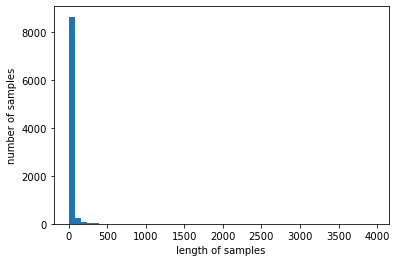

In [307]:
print('샘플의 최대 길이 : %d' % max(len(l) for l in sentences))
print('샘플의 평균 길이 : %f' % (sum(map(len, sentences))/len(sentences)))
plt.hist([len(s) for s in sentences], bins=50)
plt.xlabel('length of samples')
plt.ylabel('number of samples')
plt.show()

In [308]:
def create_tokenizer(texts):
    tokenizer = Tokenizer()
    tokenizer.fit_on_texts(X_data)
    return tokenizer

In [309]:
sentences

[['farm', 'breeding'],
 ['horses', 'racing'],
 ['milk'],
 ['meat'],
 ['milk'],
 ['meat'],
 ['milk'],
 ['weighing'],
 ['weighing'],
 ['milk', 'goats'],
 ['geese'],
 ['guinea', 'fowls'],
 ['pure-bred', 'breeding', 'animals'],
 ['turkeys'],
 ['primates'],
 ['whales',
  'dolphins',
  'porpoises',
  'mammals',
  'order',
  'cetacea',
  'manatees',
  'dugongs',
  'mammals',
  'order',
  'sirenia'],
 ['seals', 'sea', 'lions', 'walruses', 'mammals', 'suborder', 'pinnipedia'],
 ['camels', 'other', 'camelids', 'camelidae'],
 ['dogs'],
 ['deer'],
 ['bears'],
 ['snakes'],
 ['fresh-water', 'tortoises'],
 ['turtles'],
 ['birds', 'prey'],
 ['psittaciformes',
  'including',
  'parrots',
  'parakeets',
  'macaws',
  'cockatoos'],
 ['ostriches', 'dromaius', 'novaehollandiae'],
 ['honey', 'bees'],
 ['amphibia'],
 ['lug', 'worms'],
 ['sludge', 'worms'],
 ['short', 'ribs'],
 ['boneless', 'meat', 'bovine', 'animals', 'kimlar', 'beef', 'roll'],
 ['edible',
  'beef',
  'bone',
  'meatfrozen',
  'food',
  'bee

In [310]:
src_tokenizer = create_tokenizer(sentences)

In [311]:
src_tokenizer = Tokenizer(oov_token='OOV') # 모든 단어를 사용하지만 인덱스 1에는 단어 'OOV'를 할당한다.
src_tokenizer.fit_on_texts(sentences)
tar_tokenizer = Tokenizer(lower=False) # 태깅 정보들은 내부적으로 대문자를 유지한채로 저장
tar_tokenizer.fit_on_texts(ner_tags)

In [312]:
ner_tags

[[101211000, 101211000],
 [101291000, 101291000],
 [102211000],
 [102212000],
 [102311000],
 [102312000],
 [102909010],
 [103910000],
 [103920000],
 [104201000, 104201000],
 [105140000],
 [105150000, 105150000],
 [105941000, 105941000, 105941000],
 [105992000],
 [106110000],
 [106121000,
  106121000,
  106121000,
  106121000,
  106121000,
  106121000,
  106121000,
  106121000,
  106121000,
  106121000,
  106121000],
 [106122000, 106122000, 106122000, 106122000, 106122000, 106122000, 106122000],
 [106130000, 106130000, 106130000, 106130000],
 [106191000],
 [106193000],
 [106194000],
 [106201000],
 [106202000, 106202000],
 [106203000],
 [106310000, 106310000],
 [106320000, 106320000, 106320000, 106320000, 106320000, 106320000],
 [106330000, 106330000, 106330000],
 [106411000, 106411000],
 [106901000],
 [106903010, 106903010],
 [106903020, 106903020],
 [201201000, 201201000],
 [201300000, 201300000, 201300000, 201300000, 201300000, 201300000, 201300000],
 [202200000,
  202200000,
  202200

In [313]:
src_tokenizer

In [314]:
vocab_size = len(sentences) + 1
tag_size = len(tar_tokenizer.word_index) + 1
print('단어 집합의 크기 : {}'.format(vocab_size))
print('개체명 태깅 정보 집합의 크기 : {}'.format(tag_size))

단어 집합의 크기 : 9020
개체명 태깅 정보 집합의 크기 : 9020


In [315]:
X_data = src_tokenizer.texts_to_sequences(sentences)
y_data = tar_tokenizer.texts_to_sequences(ner_tags)

In [316]:
len(y_data)

9019

In [317]:
print(X_data[5])
print(y_data[5])

[251]
[7777]


In [318]:
word_to_index = src_tokenizer.word_index
index_to_word = src_tokenizer.index_word
ner_to_index = tar_tokenizer.word_index
index_to_ner = tar_tokenizer.index_word
index_to_ner[0] = 'PAD'

In [319]:
print(index_to_ner)

{1: 8708290000, 2: 2106909099, 3: 3926909000, 4: 7326909000, 5: 8302300000, 6: 3824909090, 7: 3926300000, 8: 2106909090, 9: 2008999000, 10: 8708999000, 11: 2008199000, 12: 2309902099, 13: 2103909090, 14: 8479899099, 15: 6307909000, 16: 3919900000, 17: 2309909000, 18: 3926901000, 19: 2309901040, 20: 1901909099, 21: 2202909000, 22: 2202902000, 23: 3824999090, 24: 8543709090, 25: 8708400000, 26: 9031809099, 27: 8536909010, 28: 4016991090, 29: 3307909000, 30: 2309909090, 31: 3304991000, 32: 3004909900, 33: 7616999090, 34: 1302199099, 35: 3823909090, 36: 1904109000, 37: 7308909000, 38: 8517701029, 39: 1517909000, 40: 3921130000, 41: 8536691000, 42: 8409911000, 43: 3920620000, 44: 1901902000, 45: 8536909090, 46: 3924909000, 47: 2106909050, 48: 8428909000, 49: 8537109000, 50: 8544422090, 51: 3907202000, 52: 2309901099, 53: 8443991000, 54: 8486902010, 55: 8543899090, 56: 9018909080, 57: 6404199000, 58: 8537102090, 59: 2104103000, 60: 2106909091, 61: 8529909910, 62: 5911900000, 63: 1901909091, 

In [320]:
decoded = []
for index in X_data[0] : # 첫번째 샘플 안의 인덱스들에 대해서
    decoded.append(index_to_word[index]) # 다시 단어로 변환

print('기존의 문장 : {}'.format(sentences[0]))
print('디코딩 문장 : {}'.format(decoded))

기존의 문장 : ['farm', 'breeding']
디코딩 문장 : ['farm', 'breeding']


In [321]:
max_words =10000
max_len = 26
embedding_dim =100 # 50 차원

In [322]:

# 모든 샘플들의 길이를 맞출 때 뒤의 공간에 숫자 0으로 채움.
X_data = pad_sequences(X_data, padding='post', maxlen=max_len)
y_data = pad_sequences(y_data, padding='post', maxlen=max_len)

In [323]:
X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=.3, random_state=777)

In [324]:
#y_train = to_categorical(y_train, num_classes=tag_size)
#y_test = to_categorical(y_test, num_classes=tag_size)
y_data = to_categorical(y_data, num_classes=tag_size)

In [325]:
print('훈련 샘플 레이블의 크기 : {}'.format(X_data.shape))
#print('훈련 샘플 문장의 크기 : {}'.format(X_train.shape))
print('훈련 샘플 레이블의 크기 : {}'.format(y_data.shape))
#print('테스트 샘플 문장의 크기 : {}'.format(X_test.shape))
#print('테스트 샘플 레이블의 크기 : {}'.format(y_test.shape))

훈련 샘플 레이블의 크기 : (9019, 26)
훈련 샘플 레이블의 크기 : (9019, 26, 9020)


In [326]:
!pip install keras

In [327]:
import tensorflow.python.keras as keras

In [328]:
from keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, InputLayer, Bidirectional, TimeDistributed, Embedding
from keras.models import load_model

import tensorflow as tf
print(tf.__version__)
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout, MaxPooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K

import os
import numpy as np
import matplotlib.pyplot as plt

2.5.0


In [329]:
X_train.shape

(6313, 26)

In [330]:
y_train.shape

(6313, 26)

In [331]:
model = Sequential()
model.add(Embedding(60000, 128, input_length=max_len, mask_zero=True))
model.add(Bidirectional(LSTM(256, return_sequences=True)))
model.add(TimeDistributed(Dense(tag_size, activation=('softmax'))))
model.compile(loss='categorical_crossentropy', optimizer=Adam(0.001), metrics=['accuracy'])

In [332]:
history = model.fit(X_train, y_data, batch_size=32, epochs=10,  validation_split = 0.1, verbose = 1)

Epoch 1/10
178/178 [==============================] - 424s 2s/step - loss: 1.8219 - accuracy: 0.5430 - val_loss: 1.8422 - val_accuracy: 0.4646
Epoch 2/10
178/178 [==============================] - 441s 2s/step - loss: 1.3761 - accuracy: 0.5462 - val_loss: 2.0490 - val_accuracy: 0.4606
Epoch 3/10
178/178 [==============================] - 441s 2s/step - loss: 1.2777 - accuracy: 0.5471 - val_loss: 2.2167 - val_accuracy: 0.4632
Epoch 4/10
178/178 [==============================] - 440s 2s/step - loss: 1.2111 - accuracy: 0.5471 - val_loss: 2.2750 - val_accuracy: 0.4634
Epoch 5/10
178/178 [==============================] - 431s 2s/step - loss: 1.1570 - accuracy: 0.5470 - val_loss: 2.3477 - val_accuracy: 0.4562
Epoch 6/10
178/178 [==============================] - 398s 2s/step - loss: 1.1004 - accuracy: 0.5470 - val_loss: 2.4085 - val_accuracy: 0.4441
Epoch 7/10
178/178 [==============================] - 409s 2s/step - loss: 1.0435 - accuracy: 0.5466 - val_loss: 2.4384 - val_accuracy: 0.4425

In [339]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

print('Accuracy of each epoch:',acc)
epochs = range(1,len(acc)+1)

Accuracy of each epoch: [0.5430154800415039, 0.5462033748626709, 0.5470805764198303, 0.5471019744873047, 0.5469522476196289, 0.5469950437545776, 0.5465884804725647, 0.5474870800971985, 0.5479578375816345, 0.5516378283500671]


In [340]:
!pip install rhinoMorph
!pip install jpype1==0.7.0

In [350]:
new_sentence = 'potato door filter'.lower().split()
new_encoded=[]
for w in new_sentence:
    try:
        new_encoded.append(word_to_index.get(w,1))
    except KeyError:
        new_encoded.append(word_to_index['OOV'])
        print("no")
      # 모델이 모르는 단어에 대해서는 'OOV'의 인덱스인 1로 인코딩

print(new_encoded)


[65, 99, 123]


In [346]:
word_to_index

{'OOV': 1,
 'other': 2,
 'preparation': 3,
 'articles': 4,
 'food': 5,
 'preparations': 6,
 'powder': 7,
 'parts': 8,
 'assy': 9,
 'feed': 10,
 'mixed': 11,
 'steel': 12,
 'plastics': 13,
 'oil': 14,
 'tea': 15,
 'machines': 16,
 'chemical': 17,
 'system': 18,
 'plastic': 19,
 'rubber': 20,
 'extract': 21,
 'cover': 22,
 'beverage': 23,
 'textile': 24,
 'fabric': 25,
 'rice': 26,
 'module': 27,
 'juice': 28,
 'sheet': 29,
 'water': 30,
 'film': 31,
 'machine': 32,
 'motor': 33,
 'fruit': 34,
 'glass': 35,
 'machinery': 36,
 'fibres': 37,
 'acid': 38,
 'prepared': 39,
 'paper': 40,
 'supplementary': 41,
 'part': 42,
 'vegetable': 43,
 'type': 44,
 'plate': 45,
 'starch': 46,
 'vehicles': 47,
 'fabrics': 48,
 'apparatus': 49,
 'black': 50,
 'synthetic': 51,
 'exceeding': 52,
 'wire': 53,
 'liquid': 54,
 'iron': 55,
 'sugar': 56,
 'containing': 57,
 'tube': 58,
 'air': 59,
 'terminal': 60,
 'green': 61,
 'panel': 62,
 'base': 63,
 'frozen': 64,
 'potato': 65,
 'sensor': 66,
 'fittings': 6

In [347]:
new_padded = pad_sequences([new_encoded], padding="post", value=0, maxlen=max_len)

In [349]:
p = model.predict(np.array([new_padded[0]]))
p = np.argmax(p, axis=-1)
print("{:15}||{}".format("단어", "예측값"))
print(30 * "=")
for w, pred in zip(new_sentence, p[0]):
    print("{:15}: {:5}".format(w, index_to_ner[pred]))

단어             ||예측값
potato         : PAD  
door           : PAD  
filter         : PAD  
